# Subject Analysis

In [1]:
import DataLoader, Training, os, scipy
import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
data_path = "F:/Masterthesis/Data/"
preprocessing = "medium"
model_name = "deep"
model_folder = "SubjectAnalysis_Cross"
n_epochs = 25
lr = 0.01

for task in ["N170", "N400", "P3", "N2pc", "MMN", "ERN", "LRP"]:
    df = DataLoader.load_df(data_path, task, preprocessing)
    Training.run_exp_per_subject(df, task, preprocessing, model_folder, model_name, 
            lr, n_epochs)

In [3]:
data_path = "F:/Masterthesis/Data/"
preprocessing = "medium"
model_name = "deep"
model_folder = "SubjectAnalysis_Cross"
n_epochs = 25
lr = 0.01

# Load Dataframe
df_list = []
for task in ["N170", "N400", "P3", "N2pc", "MMN", "ERN", "LRP"]:
    model_path = os.getcwd()+"\\"+model_folder+"\\"+model_name+"\\"+task+"\\"+preprocessing+"\\"
    for i in range(40):
        df = pd.read_json(model_path+"split_"+str(i)+"_history.json")
        df = df[df["epoch"]==25]
        df["SubjectID"] = i+1
        df["Task"] = task
        df_list.append(df[["Task", "SubjectID", "valid_balanced_accuracy"]])
df = pd.concat(df_list,axis=0)
df

,Task,SubjectID,valid_balanced_accuracy
24,N170,1,0.645480
24,N170,2,0.613924
24,N170,3,0.679231
24,N170,4,0.759751
24,N170,5,0.827303
...,...,...,...
24,LRP,36,0.912500
24,LRP,37,0.812736
24,LRP,38,0.842204
24,LRP,39,0.780266


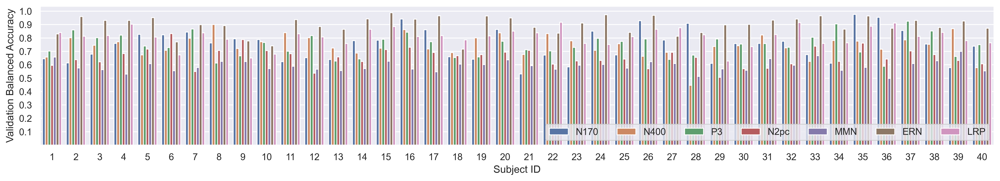

In [6]:
sns.set(style="darkgrid")
plt.figure(figsize=(20, 3),dpi=400)
fig = sns.barplot(x="SubjectID", y="valid_balanced_accuracy", hue="Task", data=df)
plt.legend(loc='lower right', ncol=7)
fig.set_yticks([0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1])
fig.set(xlabel='Subject ID', ylabel='Validation Balanced Accuracy');

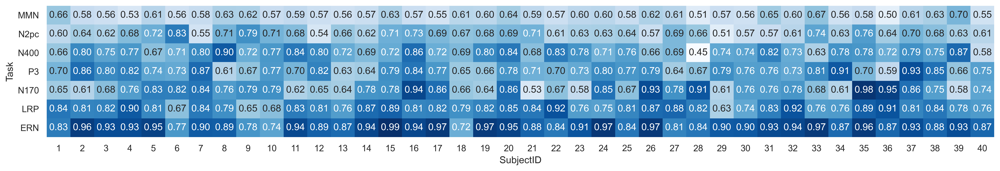

In [7]:
df_sorted = df.pivot(index="Task", columns="SubjectID", values="valid_balanced_accuracy")
#df_sorted = df_sorted.reindex(df_sorted.mean().sort_values().index, axis=1)
df_sorted = df_sorted.reindex(df_sorted.mean(axis=1).sort_values().index, axis=0)
sns.set(style="darkgrid")
plt.figure(figsize=(21, 3),dpi=400)
fig = sns.heatmap(cbar=False, annot=True, fmt='.2f', cmap="Blues", data=df_sorted)

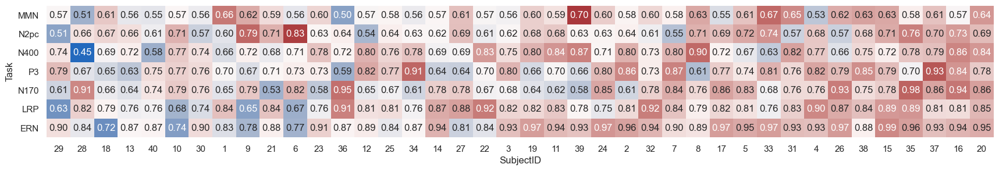

In [4]:
# normalized cmap by task
df_sorted = df.pivot(index="Task", columns="SubjectID", values="valid_balanced_accuracy")
df_sorted = df_sorted.reindex(df_sorted.mean(axis=1).sort_values().index, axis=0)
df_old = df_sorted
df_sorted = df_sorted.sub(df_sorted.mean(axis=1), axis=0).div(df_sorted.std(axis=1), axis=0)
df_sorted = df_sorted.reindex(df_sorted.mean().sort_values().index, axis=1)
df_old = df_old.reindex(df_sorted.mean().sort_values().index, axis=1)
sns.set(style="darkgrid")
plt.figure(figsize=(21, 3),dpi=100)
fig = sns.heatmap(cbar=False, annot=df_old, fmt='.2f', cmap="vlag", data=df_sorted)

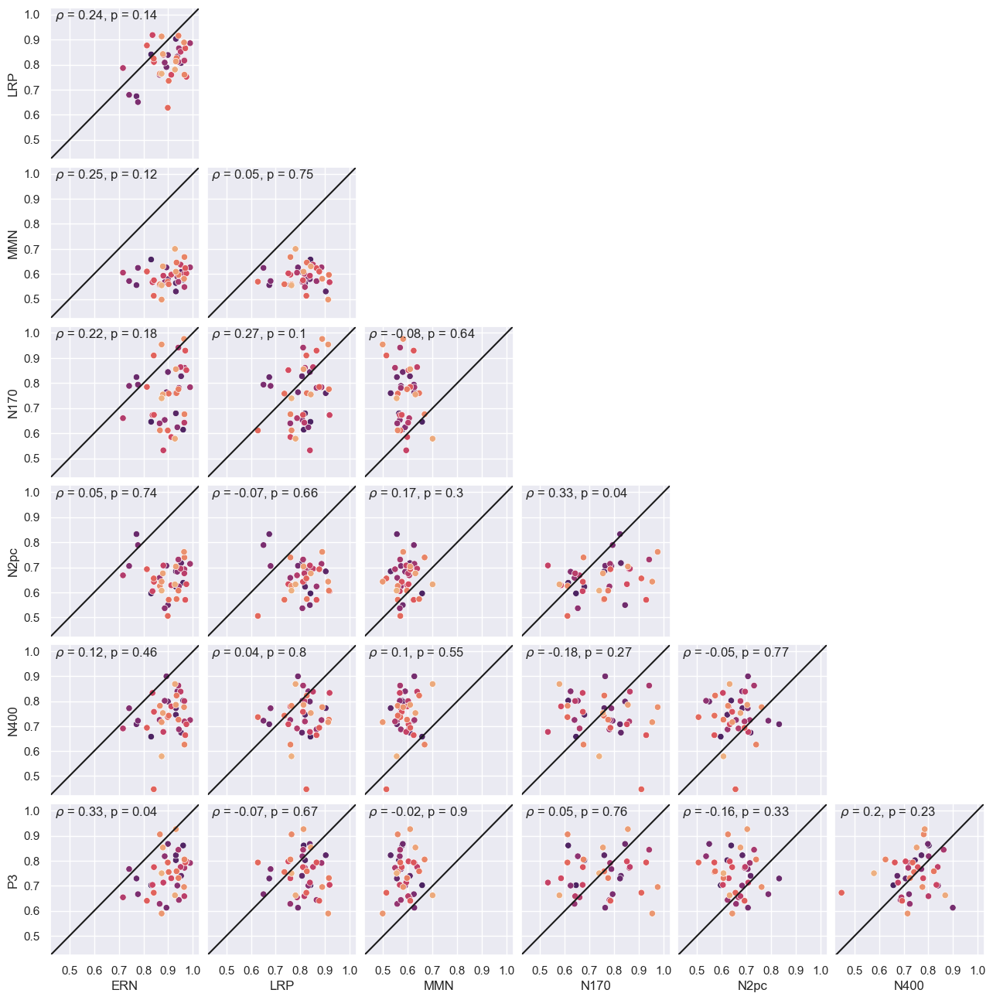

In [4]:
# Load Dataframe
df_list = []
for task in ["N170", "N400", "P3", "N2pc", "MMN", "ERN", "LRP"]:
    model_path = os.getcwd()+"\\"+model_folder+"\\"+model_name+"\\"+task+"\\"+preprocessing+"\\"
    for i in range(40):
        df = pd.read_json(model_path+"split_"+str(i)+"_history.json")
        df = df[df["epoch"]==25]
        df["SubjectID"] = i+1
        df["Task"] = task
        df_list.append(df[["Task", "SubjectID", "valid_balanced_accuracy"]])
df = pd.concat(df_list,axis=0)
df = df.pivot(index='SubjectID', columns='Task', values='valid_balanced_accuracy')
sns.set(style="darkgrid")
fig, axes = plt.subplots(7, 7, figsize=(15, 15), dpi=100)
fig.tight_layout()
task_list = ["ERN", "LRP", "MMN", "N170", "N2pc", "N400", "P3"]
for i in range(0,7):
    for j in range(0,7):
        #if i==j:
        #    sns.histplot(ax=axes[i,j], data=df,x=task_list[i])
        if i>j:
            sns.scatterplot(ax=axes[i,j], data=df,x=task_list[j], y=task_list[i], hue=df.index, palette="flare_r")
            axes[i,j].legend().set_visible(False)
            axes[i,j].axline((0.45,0.45), (1,1), color='k')
            axes[i,j].set_xticks([0.5, 0.6, 0.7, 0.8, 0.9, 1])
            axes[i,j].set_yticks([0.5, 0.6, 0.7, 0.8, 0.9, 1])
            axes[i,j].text(0.44, 0.98, r'$\rho$'+" = "
                           +str(np.round(scipy.stats.spearmanr(df[task_list[j]], df[task_list[i]])[0],2))
                          +", p = "+str(np.round(scipy.stats.spearmanr(df[task_list[j]], df[task_list[i]])[1],2)))
        else:
            fig.delaxes(axes[i,j])
        if j!=0:
            axes[i,j].set(yticklabels=[], ylabel=None)
        if i!=6:
            axes[i,j].set(xticklabels=[], xlabel=None)
fig.subplots_adjust(wspace=0.05, hspace=0.05)


### Single Subject

In [10]:
data_path = "F:/Masterthesis/Data/"
preprocessing = "medium"
model_name = "deep"
model_folder = "SubjectAnalysis_Within"
n_epochs = 25
lr = 0.01

for task in ["N170", "N400", "P3", "N2pc", "MMN", "ERN", "LRP"]:
    df = DataLoader.load_df(data_path, task, preprocessing)
    Training.run_exp_single_subject(df, task, preprocessing, model_folder, model_name, 
            lr, n_epochs, n_splits=10)

Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4587        2.3158                     0.5000       25.6600  0.0100  0.0130
      2                     0.5114        4.3915                     0.4962       21.9492  0.0100  0.0150
      3                     0.5915        2.0015                     0.5379       11.3888  0.0098  0.0150
      4                     0.6361        1.4586                     0.5379        8.6690  0.0096  0.0140
      5                     0.5819        1.3935                     0.5417        9.2343  0.0093  0.0140
      6                     0.6786        0.9054                     0.5833        7.7491  0.0090  0.0130
      7                     0.7358        0.7818              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 1 1 0 1 1 1 0 1 1 1 1 0 0 0 1 0 1 0 0 0 1 0 1 1 1 0 1 0 0 1 1 1 1 0
 0 1 1 0 1 0 1 1 0 0 1 0 0 0 1 1 1 1 1 1 0 1 1 0 0 0 1 0 0 0 1 0 0 0 0 1 1
 0 1 0 0 0 0 0 0 1 1 0 0 0 1 1 1 1 0 1 1 0 1 0 1 1 1 1 1 1 0 1 0 0 1 0 1 0
 1 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     12                     0.7444        0.4352                     0.7424        0.7868  0.0057  0.0150
     13                     0.8558        0.4277                     0.7424        0.7804  0.0050  0.0160
     14                     0.8451        0.3850                     0.7424        0.7713  0.0043  0.0150
     15                     0.7860        0.5207                     0.6515        0.7542  0.0037  0.0150
     16                     0.7608        0.4539                     0.6970        0.6658  0.0031  0.0160
     17                     0.8538        0.3157                     0.7462        0.5828  0.0025  0.0140
     18                     0.8112        0.3974                     0.7462        0.5366  0.0020  0.0140
     19                     0.8887        0.3120                     0.7462        0.5173  0.0015  0.0139
     20                     0.8451        0.3567                     0.7462        0.5071  0.0010  0.0139
     21                     0.8345        0.38

      2                     0.6081        2.5440                     0.4583       12.1184  0.0100  0.0130
      3                     0.5680        2.4506                     0.5000        9.5767  0.0098  0.0150
      4                     0.5839        2.1387                     0.6667        8.1467  0.0096  0.0140
      5                     0.6969        1.3250                     0.5758        3.5242  0.0093  0.0150
      6                     0.6680        1.1026                     0.5492        3.3719  0.0090  0.0130
      7                     0.6291        1.2503                     0.4583        3.4835  0.0085  0.0140
      8                     0.7212        0.9814                     0.7424        0.6735  0.0080  0.0130
      9                     0.8102        0.6046                     0.8333        1.0471  0.0075  0.0150
     10                     0.7561        0.5689                     0.8333        1.0016  0.0069  0.0140
     11                     0.7726        0.64

     17                     0.8083        0.4256                     0.7008        0.6484  0.0025  0.0150
     18                     0.8508        0.2950                     0.7424        0.6371  0.0020  0.0130
     19                     0.8897        0.2455                     0.7424        0.6129  0.0015  0.0140
     20                     0.8664        0.2830                     0.7424        0.5956  0.0010  0.0140
     21                     0.8674        0.3390                     0.7424        0.5867  0.0007  0.0130
     22                     0.8790        0.2895                     0.7424        0.5801  0.0004  0.0140
     23                     0.8441        0.3149                     0.7424        0.5771  0.0002  0.0140
     24                     0.9458        0.2214                     0.7008        0.5786  0.0000  0.0140
     25                     0.8634        0.2822                     0.7424        0.5799  0.0000  0.0140
Re-initializing optimizer because the followin

      4                     0.6677        1.6436                     0.5152        5.0792  0.0096  0.0130
      5                     0.6507        1.3245                     0.5189        3.3836  0.0093  0.0140
      6                     0.7484        1.0310                     0.6477        3.0077  0.0090  0.0140
      7                     0.7046        0.9927                     0.7311        2.3794  0.0085  0.0140
      8                     0.7521        0.8913                     0.7348        2.3273  0.0080  0.0150
      9                     0.7707        0.7185                     0.6932        1.9208  0.0075  0.0130
     10                     0.7823        0.5363                     0.5682        1.6060  0.0069  0.0140
     11                     0.7474        0.5091                     0.5227        1.4984  0.0063  0.0140
     12                     0.8006        0.4602                     0.6061        1.4328  0.0057  0.0140
     13                     0.7966        0.45

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 0 0 1 0 0 0 1 1 0 0 0 1 0 1 1 0 0 0 1 0 1 1 1 1 0 1 1 0 0 0 1 1 1 0 0 1
 1 0 1 1 1 0 1 0 0 1 0 1 0 0 0 1 1 1 0 1 0 1 0 0 1 1 0 1 1 0 0 1 0 1 1 0 1
 0 0 1 0 1 0 0 1 0 0 1 1 0 1 0 1 1 1 0 0 0 0 0 1 0 1 1 0 0 1 1 1 1 0 0 0 1
 0 1 1 1 0 1 0 0 0 1 1 0 0 1 1 0 1 0 0 1 0 1 0 0 1 0 0 0 1 0 0 1 1 0 0 0 1
 1 1 1 1 1 0 1 1 0 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     12                     0.8492        0.3523                     0.5312        1.2116  0.0057  0.0160
     13                     0.8413        0.3814                     0.5312        1.0875  0.0050  0.0170
     14                     0.8730        0.2945                     0.5000        0.9349  0.0043  0.0150
     15                     0.8254        0.3445                     0.5625        0.8056  0.0037  0.0160
     16                     0.8175        0.4171                     0.5625        0.8114  0.0031  0.0160
     17                     0.8889        0.3343                     0.6250        0.8553  0.0025  0.0170
     18                     0.8810        0.2839                     0.6250        0.8532  0.0020  0.0170
     19                     0.8730        0.2926                     0.6250        0.8476  0.0015  0.0160
     20                     0.8413        0.2777                     0.6250        0.8266  0.0010  0.0150
     21                     0.8571        0.29

Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5000        1.9342                     0.5000       40.8626  0.0100  0.0140
      2                     0.5476        7.4078                     0.5000       34.8821  0.0100  0.0150
      3                     0.5873        2.9355                     0.5000       19.7918  0.0098  0.0160
      4                     0.5476        2.0200                     0.5312        6.1177  0.0096  0.0170
      5                     0.5714        1.4359                     0.6250        5.5266  0.0093  0.0160
      6                     0.6587        1.0080                     0.5938        6.5544  0.0090  0.0150
      7                     0.6587        1.1551              

     12                     0.7302        0.7404                     0.5938        2.1270  0.0057  0.0150
     13                     0.7619        0.5965                     0.5625        1.3595  0.0050  0.0160
     14                     0.8095        0.5202                     0.5938        1.2152  0.0043  0.0150
     15                     0.8095        0.4451                     0.5625        1.2287  0.0037  0.0179
     16                     0.8175        0.5381                     0.5938        1.2547  0.0031  0.0160
     17                     0.7698        0.4369                     0.5625        1.1626  0.0025  0.0150
     18                     0.7857        0.4212                     0.5938        1.0365  0.0020  0.0160
     19                     0.8333        0.3913                     0.5938        0.9241  0.0015  0.0159
     20                     0.8175        0.3716                     0.5938        0.8552  0.0010  0.0159
     21                     0.8413        0.34

     25                     0.8571        0.2996                     0.5938        0.8369  0.0000  0.0160
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5397        3.5995                     0.5000       39.3941  0.0100  0.0170
      2                     0.4603        8.8644                     0.5312       10.1650  0.0100  0.0160
      3                     0.5635        3.0331                     0.5000       40.8157  0.0098  0.0160
      4                     0.5476        2.9157                     0.5312       12.9063  0.0096  0.0160
      5                     0.5079        1.8733                     0.5625        5.0515  0.0093  0.0170
      6                     0.5079        1.3439              

     10                     0.5847        0.9226                     0.5146        1.3280  0.0069  0.0150


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 1 1 1 0 1 1 0 1 1 0 0 1 0 1 1 0 0 0 0 1 1 1 0 0 1 0 0 0 1 1 1 0 1 1 1
 1 1 1 0 0 1 0 1 1 0 0 1 0 1 1 0 1 0 1 0 0 1 0 0 1 1 0 1 1 0 1 0 0 1 1 0 0
 1 1 0 1 1 1 1 0 1 1 1 1 0 1 0 1 0 1 1 0 0 1 0 1 0 1 0 0 0 0 1 1 1 0 0 0 0
 0 0 1 1 0 0 0 0 1 1 0 1 0 1 0 0 0 1 1 0 1 0 1 1 0 0 0 0 1 0 0 1 0 1 1 1 1
 1 1 0 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     11                     0.6559        0.7771                     0.4417        2.2286  0.0063  0.0160
     12                     0.6949        0.7593                     0.4750        1.5244  0.0057  0.0160
     13                     0.6785        0.6390                     0.5854        0.8118  0.0050  0.0160
     14                     0.6817        0.6248                     0.6542        0.8743  0.0043  0.0160
     15                     0.6417        0.6627                     0.5875        0.8211  0.0037  0.0160
     16                     0.7304        0.5347                     0.5833        0.9044  0.0031  0.0169
     17                     0.7379        0.5651                     0.5833        0.8840  0.0025  0.0160
     18                     0.7301        0.5305                     0.5875        0.7974  0.0020  0.0160
     19                     0.7538        0.5221                     0.6208        0.7781  0.0015  0.0160
     20                     0.7121        0.52

     25                     0.6895        0.6292                     0.5875        0.6590  0.0000  0.0150
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4535        5.9419                     0.5000       24.8661  0.0100  0.0160
      2                     0.4852        5.8362                     0.4979       20.5104  0.0100  0.0160
      3                     0.5019        2.3310                     0.4333       18.9268  0.0098  0.0150
      4                     0.4901        2.2265                     0.5000       18.9264  0.0096  0.0150
      5                     0.5653        1.3628                     0.5000       30.6460  0.0093  0.0150
      6                     0.5290        1.8085              

     11                     0.6973        0.6396                     0.5354        1.5953  0.0063  0.0180
     12                     0.6828        0.6884                     0.5333        2.6951  0.0057  0.0160
     13                     0.7199        0.6513                     0.5333        2.0429  0.0050  0.0160
     14                     0.7040        0.6246                     0.5729        0.9011  0.0043  0.0160
     15                     0.7306        0.5819                     0.6146        0.7689  0.0037  0.0150
     16                     0.6661        0.6268                     0.6438        0.6957  0.0031  0.0160
     17                     0.7285        0.5831                     0.6708        0.6999  0.0025  0.0169
     18                     0.7933        0.5213                     0.6750        0.6353  0.0020  0.0170
     19                     0.8105        0.4779                     0.5854        0.6449  0.0015  0.0160
     20                     0.7218        0.52

Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4944        5.5059                     0.5000       17.0707  0.0100  0.0160
      2                     0.5503        5.3937                     0.4688       24.4957  0.0100  0.0150
      3                     0.5965        2.2428                     0.4688       22.4034  0.0098  0.0160
      4                     0.4906        1.6143                     0.5021       11.9448  0.0096  0.0160
      5                     0.5828        1.0626                     0.5000       27.6590  0.0093  0.0150
      6                     0.6043        1.4000                     0.5021       16.2014  0.0090  0.0160
      7                     0.6831        0.7699              

     11                     0.7233        0.5546                     0.6071        1.5725  0.0063  0.0150


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 0 1 0 1 1 1 1 0 1 1 1 1 0 0 0 0 0 1 0 1 0 1 1 0 0 0 1 0 1 1 1 1 0 1 1
 0 0 0 1 1 0 1 1 1 1 0 1 0 0 1 0 1 0 0 1 1 0 1 0 1 1 1 1 0 1 1 1 1 1 1 1 0
 1 0 1 0 1 1 0 0 0 0 0 1 1 0 0 1 1 1 1 1 0 0 0 0 0 1 0 1 1 1 1 1 0 0 0 0 1
 1 0 0 0 0 0 0 1 1 0 1 1 1 0 1 0 0 1 0 0 0 1 0 1 0 0 0 1 0 1 1 1 0 0 0 0 0
 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     12                     0.7524        0.5148                     0.5804        1.1780  0.0057  0.0150
     13                     0.8134        0.4313                     0.7589        0.6626  0.0050  0.0160
     14                     0.7906        0.3809                     0.7098        0.6745  0.0043  0.0160
     15                     0.7349        0.5359                     0.7723        0.5633  0.0037  0.0150
     16                     0.7965        0.4781                     0.7679        0.4906  0.0031  0.0150
     17                     0.8025        0.3917                     0.7679        0.4620  0.0025  0.0160
     18                     0.8046        0.3931                     0.7723        0.5067  0.0020  0.0150
     19                     0.7927        0.4334                     0.7411        0.5011  0.0015  0.0150
     20                     0.8331        0.3917                     0.7723        0.4688  0.0010  0.0160
     21                     0.8155        0.40

Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4455        4.3085                     0.5000       36.6392  0.0100  0.0160
      2                     0.5320        6.2500                     0.5000       27.6274  0.0100  0.0150
      3                     0.5610        4.1800                     0.6920        2.7625  0.0098  0.0160
      4                     0.5979        2.0559                     0.6518        2.4358  0.0096  0.0160
      5                     0.6374        1.2226                     0.5580        3.2595  0.0093  0.0150
      6                     0.7180        0.8524                     0.5357        7.3469  0.0090  0.0160
      7                     0.6593        1.2623              

     12                     0.6728        0.6310                     0.7188        0.6736  0.0057  0.0140
     13                     0.7503        0.5276                     0.6875        0.6848  0.0050  0.0150
     14                     0.7583        0.4999                     0.7143        0.5914  0.0043  0.0150
     15                     0.6794        0.5681                     0.6384        0.5530  0.0037  0.0160
     16                     0.7629        0.5223                     0.6384        0.5408  0.0031  0.0160
     17                     0.7958        0.5080                     0.7188        0.6317  0.0025  0.0160
     18                     0.7847        0.4935                     0.7188        0.6510  0.0020  0.0160
     19                     0.8081        0.4126                     0.7812        0.6048  0.0015  0.0159
     20                     0.7738        0.4824                     0.7768        0.5616  0.0010  0.0150
     21                     0.8060        0.46

Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4771        6.6920                     0.5357        5.7977  0.0100  0.0160
      2                     0.5556        4.9159                     0.5536       12.6183  0.0100  0.0150
      3                     0.6752        1.2407                     0.5848        7.9320  0.0098  0.0160
      4                     0.5952        1.4837                     0.4955        9.9159  0.0096  0.0160
      5                     0.6360        0.9717                     0.5000        5.9750  0.0093  0.0160
      6                     0.5144        1.2275                     0.6875        0.8705  0.0090  0.0160
      7                     0.5245        1.0914              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 1 1 1 0 1 0 1 1 0 1 0 1 1 0 0 0 0 1 1 1 1 1 0 1 1 1 1 0 1 1 0 1 1 1 0 0
 0 1 0 0 1 0 0 1 1 1 1 1 1 1 0 1 1 1 1 0 0 1 0 1 1 0 0 1 0 1 1 0 0 1 0 0 0
 0 0 0 0 1 1 1 0 0 0 1 0 1 0 0 1 1 0 0 0 0 0 1 1 1 1 0 1 0 0 0 1 0 1 0 0 0
 1 1 0 0 0 1 0 0 1 1 1 1 0 1 0 0 1 0 0 1 0 1 1 0 0 1 1 1 1 0 0 1 1 0 1 0 0
 0 1 1 0 1 0 0 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     11                     0.7193        0.7296                     0.5312        1.2398  0.0063  0.0160
     12                     0.7135        0.6152                     0.6562        0.8144  0.0057  0.0160
     13                     0.7063        0.5557                     0.6250        0.8173  0.0050  0.0150
     14                     0.6339        0.6411                     0.6250        0.7466  0.0043  0.0160
     15                     0.7396        0.5982                     0.5938        0.8977  0.0037  0.0150
     16                     0.7370        0.5320                     0.6250        0.7684  0.0031  0.0160
     17                     0.7323        0.5139                     0.6562        0.5907  0.0025  0.0170
     18                     0.7604        0.4859                     0.7188        0.5650  0.0020  0.0160
     19                     0.7604        0.5122                     0.6562        0.5690  0.0015  0.0150
     20                     0.7844        0.47

     25                     0.7349        0.5342                     0.5938        0.8337  0.0000  0.0140
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4406        2.3988                     0.5312       63.4922  0.0100  0.0170
      2                     0.5776        6.1901                     0.4688       22.9347  0.0100  0.0160
      3                     0.5401        2.6659                     0.5000       50.7404  0.0098  0.0160
      4                     0.5557        2.4763                     0.5000       28.3495  0.0096  0.0160
      5                     0.5526        1.7020                     0.6562        2.9775  0.0093  0.0150
      6                     0.5807        1.1301              

     11                     0.6984        0.7253                     0.6875        1.1058  0.0063  0.0150
     12                     0.6990        0.6137                     0.5000        2.3479  0.0057  0.0160
     13                     0.7281        0.6231                     0.4688        1.4610  0.0050  0.0160
     14                     0.8063        0.5060                     0.7188        0.7850  0.0043  0.0160
     15                     0.7531        0.4938                     0.7500        0.7094  0.0037  0.0160
     16                     0.8036        0.5040                     0.5312        0.9781  0.0031  0.0160
     17                     0.8172        0.4360                     0.5000        1.2484  0.0025  0.0160
     18                     0.8568        0.3400                     0.4688        1.2814  0.0020  0.0150
     19                     0.8021        0.4071                     0.5000        1.1528  0.0015  0.0160
     20                     0.8010        0.41

Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4568        6.5009                     0.5312        9.6312  0.0100  0.0140
      2                     0.5042        5.3396                     0.5312       21.5039  0.0100  0.0140
      3                     0.6099        1.3103                     0.5000       15.2150  0.0098  0.0160
      4                     0.5771        1.7361                     0.5312       21.1429  0.0096  0.0160
      5                     0.6193        1.5824                     0.5312       10.3854  0.0093  0.0160
      6                     0.5281        1.3050                     0.4688        3.6687  0.0090  0.0160
      7                     0.6229        1.1565              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 1 0 0 0 1 0 1 1 1 1 1 1 1 1 1 1 0 0 1 1 1 0 0 0 0 0 1 0 0 1 0 1 0 1 1 0
 1 1 1 0 1 1 1 1 1 0 1 0 0 0 0 0 0 0 1 0 1 1 0 1 0 0 0 1 1 0 0 0 1 0 0 1 1
 1 0 1 0 0 0 1 1 1 0 1 1 0 1 0 0 1 1 0 1 0 0 1 0 1 1 0 1 1 0 1 0 1 1 0 1 0
 1 0 1 0 1 1 1 0 0 0 1 0 0 0 1 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     11                     0.5838        0.7609                     0.5769        0.8236  0.0063  0.0130
     12                     0.5644        0.8213                     0.3462        1.1925  0.0057  0.0150
     13                     0.5634        0.7383                     0.4615        1.7362  0.0050  0.0150
     14                     0.5671        0.8246                     0.3846        0.8607  0.0043  0.0150
     15                     0.6864        0.6326                     0.5769        0.7209  0.0037  0.0140
     16                     0.5547        0.7600                     0.6538        0.6755  0.0031  0.0149
     17                     0.7045        0.5752                     0.3846        0.8003  0.0025  0.0140
     18                     0.6283        0.6730                     0.4615        0.8277  0.0020  0.0150
     19                     0.6554        0.6801                     0.5000        0.6917  0.0015  0.0140
     20                     0.6397        0.65

     24                     0.8120        0.4414                     0.6538        0.8113  0.0000  0.0140
     25                     0.7526        0.4676                     0.6538        0.8110  0.0000  0.0150
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5465        2.6381                     0.5000       42.6701  0.0100  0.0120
      2                     0.5208        6.0380                     0.4615       12.0872  0.0100  0.0150
      3                     0.5075        2.5300                     0.5000       15.7946  0.0098  0.0150
      4                     0.6158        2.1993                     0.5385       16.8926  0.0096  0.0150
      5                     0.5200        1.6864              

     23                     0.8511        0.3561                     0.7308        0.6315  0.0002  0.0150
     24                     0.8613        0.3358                     0.7308        0.6350  0.0000  0.0140
     25                     0.8091        0.4177                     0.6923        0.6371  0.0000  0.0130
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4384        2.4694                     0.5000       25.2209  0.0100  0.0150
      2                     0.5208        5.7446                     0.5385       16.5813  0.0100  0.0130
      3                     0.5245        2.1838                     0.6154        4.7041  0.0098  0.0150
      4                     0.5897        1.8537              

      9                     0.7812        0.4734                     0.7500        0.7215  0.0075  0.0150
     10                     0.8552        0.3800                     0.7500        1.0722  0.0069  0.0160


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 0 1 0 0 0 0 0 1 0 0 1 0 1 1 1 0 1 1 1 0 1 1 1 1 1 0 1 0 0 1 0 1 1 1 0 1
 0 0 1 1 1 0 1 0 0 0 1 0 1 1 1 0 1 1 0 1 0 1 1 1 1 0 1 1 0 0 1 1 1 0 1 0 0
 0 0 0 1 0 0 0 0 1 1 1 0 0 0 0 1 1 0 0 1 1 1 0 1 0 0 1 1 0 0 1 0 0 1 0 0 0
 0 0 1 0 0 1 1 0 1 1 0 1 0 1 0 1 1 0 0 1 0 0 1 1 1 0 0 0 0 1 1 1 0 1 1 0 1
 0 1 0 1 0 1 1 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     11                     0.8630        0.3996                     0.7500        1.1899  0.0063  0.0180
     12                     0.9016        0.2630                     0.7188        0.7751  0.0057  0.0160
     13                     0.8620        0.2978                     0.7188        0.5797  0.0050  0.0150
     14                     0.8552        0.2511                     0.7188        0.4985  0.0043  0.0160
     15                     0.8870        0.2754                     0.7500        0.5929  0.0037  0.0169
     16                     0.9031        0.2159                     0.7500        0.5929  0.0031  0.0150
     17                     0.8938        0.2353                     0.8125        0.5307  0.0025  0.0150
     18                     0.8703        0.2695                     0.8750        0.4288  0.0020  0.0150
     19                     0.9589        0.1488                     0.8438        0.3511  0.0015  0.0150
     20                     0.9036        0.20

     22                     0.9432        0.1070                     0.8125        0.2798  0.0004  0.0140
     23                     0.9182        0.1761                     0.8125        0.2750  0.0002  0.0150
     24                     0.9104        0.1849                     0.8438        0.2706  0.0000  0.0150
     25                     0.9505        0.1216                     0.8438        0.2682  0.0000  0.0160
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5208        3.1945                     0.5000       38.2927  0.0100  0.0150
      2                     0.5349        6.7149                     0.5312       17.7360  0.0100  0.0160
      3                     0.6318        1.7472              

      7                     0.6823        0.6858                     0.6562        3.0892  0.0085  0.0150
      8                     0.7234        0.6311                     0.6250        2.2940  0.0080  0.0150
      9                     0.7057        0.6014                     0.6562        0.9489  0.0075  0.0160
     10                     0.6964        0.5900                     0.6250        0.7938  0.0069  0.0160
     11                     0.8359        0.4091                     0.6562        0.9126  0.0063  0.0160
     12                     0.7141        0.5933                     0.9375        0.3471  0.0057  0.0160
     13                     0.7703        0.5402                     0.8438        0.3774  0.0050  0.0160
     14                     0.7927        0.4402                     0.8438        0.3548  0.0043  0.0140
     15                     0.8609        0.3649                     0.8438        0.3584  0.0037  0.0160
     16                     0.8125        0.39

     19                     0.9505        0.1310                     0.8438        0.3123  0.0015  0.0160
     20                     0.9667        0.0782                     0.8438        0.3406  0.0010  0.0150
     21                     0.9281        0.1342                     0.8438        0.3474  0.0007  0.0149
     22                     0.9604        0.0894                     0.8438        0.3460  0.0004  0.0160
     23                     0.9510        0.1211                     0.8438        0.3450  0.0002  0.0160
     24                     0.9766        0.0866                     0.8438        0.3463  0.0000  0.0160
     25                     0.9682        0.0958                     0.8438        0.3499  0.0000  0.0150
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  ------------

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 1 0 0 0 0 1 0 0 0 0 1 0 0 1 1 1 1 1 0 0 0 1 0 0 1 0 0 0 1 0 0 0 1 1 1 1
 1 0 0 1 1 1 1 0 1 1 0 1 1 1 1 0 1 1 0 1 0 1 1 0 1 0 1 1 0 0 0 1 1 1 1 1 1
 0 0 1 0 0 1 1 1 1 1 0 1 0 1 0 1 0 0 1 0 0 0 0 1 1 0 1 1 0 1 0 1 1 1 0 1 1
 1 1 1 0 0 1 0 0 1 0 0 0 0 0 1 1 1 0 1 0 1 0 0 0 0 1 1 0 1 0 1 1 1 1 1 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5622        3.4331                     0.5000       37.8746  0.0100  0.3702
      2                     0.5635        5.7966                     0.5000       19.3259  0.0100  0.0160
      3                     0.6693        1.3307                     0.5000       46.6761  0.0098  0.0140
      4                     0.6177        1.2285                     0.5000       27.3492  0.0096  0.0160
      5                     0.6442        0.9876                     0.5000       24.9689  0.0093  0.0160
      6                     0.5847        1.3945                     0.5357       11.5337  0.0090  0.0150
      7                     0.5979        0.8017                     0.5714        7.5861  0.0085  0.0150
      8                     0.7222        0.63

     12                     0.8413        0.4185                     0.7545        0.7380  0.0057  0.0130
     13                     0.8717        0.3217                     0.7679        0.5531  0.0050  0.0140
     14                     0.8267        0.3727                     0.8348        0.5555  0.0043  0.0170
     15                     0.8320        0.3670                     0.8259        0.6327  0.0037  0.0160
     16                     0.8175        0.3356                     0.8259        0.6094  0.0031  0.0169
     17                     0.8347        0.2999                     0.8036        0.5132  0.0025  0.0150
     18                     0.9048        0.2872                     0.7768        0.5709  0.0020  0.0170
     19                     0.8823        0.2889                     0.7455        0.6743  0.0015  0.0160
     20                     0.8439        0.3516                     0.7455        0.6770  0.0010  0.0160
     21                     0.8677        0.26

Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5159        3.3419                     0.5357       31.7708  0.0100  0.0150
      2                     0.5608        4.6795                     0.5000       34.7257  0.0100  0.0160
      3                     0.5503        3.6679                     0.5000       36.4995  0.0098  0.0150
      4                     0.6164        1.7511                     0.5000       22.2338  0.0096  0.0160
      5                     0.5899        1.3382                     0.6786        2.5009  0.0093  0.0150
      6                     0.6508        0.8710                     0.5000        8.8764  0.0090  0.0160
      7                     0.5661        1.4086              

     12                     0.6534        0.8178                     0.6116        1.5262  0.0057  0.0150
     13                     0.6746        0.6277                     0.6473        1.3102  0.0050  0.0160
     14                     0.7262        0.5868                     0.6473        0.9839  0.0043  0.0140
     15                     0.6759        0.6301                     0.6830        0.6479  0.0037  0.0150
     16                     0.7566        0.5515                     0.6116        0.7405  0.0031  0.0160
     17                     0.6825        0.5631                     0.6116        0.6831  0.0025  0.0159
     18                     0.7540        0.4843                     0.6473        0.6019  0.0020  0.0150
     19                     0.7341        0.5454                     0.6875        0.5278  0.0015  0.0150
     20                     0.7434        0.6038                     0.8304        0.4849  0.0010  0.0160
     21                     0.6918        0.59

     25                     0.7712        0.4385                     0.6830        0.9500  0.0000  0.0150
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5161        3.9928                     0.4688      102.2018  0.0100  0.0140
      2                     0.5000        5.9498                     0.4708       32.0784  0.0100  0.0160
      3                     0.6532        1.9572                     0.5333       19.4098  0.0098  0.0160
      4                     0.7016        0.9204                     0.6333        4.6795  0.0096  0.0160
      5                     0.6774        1.0170                     0.5000        7.7121  0.0093  0.0160
      6                     0.7339        0.8281              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 1 1 0 0 0 0 1 1 1 0 0 1 0 0 0 1 1 1 1 1 1 0 1 1 0 1 0 0 0 1 1 1 0 1 0 1
 0 0 1 1 1 0 1 1 1 0 0 1 0 1 0 0 0 0 1 0 1 1 0 1 0 0 1 1 0 0 0 1 0 0 1 0 0
 0 0 0 1 0 0 0 1 1 0 0 1 0 1 0 1 1 1 0 0 0 0 0 1 1 1 1 1 0 1 1 1 1 0 1 1 1
 0 1 1 1 0 0 1 1 1 1 1 1 0 0 0 0 0 1 0 0 0 1 1 1 1 0 0 0 1 0 1 0 1 1 0 0 1
 1 1 0 0 0 1 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     11                     0.7661        0.4877                     0.8063        0.4600  0.0063  0.0150
     12                     0.7581        0.5428                     0.7708        0.4953  0.0057  0.0160
     13                     0.8145        0.4288                     0.7354        0.6253  0.0050  0.0160
     14                     0.8145        0.4109                     0.7688        0.4411  0.0043  0.0160
     15                     0.8387        0.3609                     0.8083        0.3759  0.0037  0.0160
     16                     0.8306        0.3902                     0.7771        0.3964  0.0031  0.0160
     17                     0.8629        0.3074                     0.7771        0.4121  0.0025  0.0150
     18                     0.8387        0.3820                     0.7771        0.4221  0.0020  0.0150
     19                     0.8790        0.3184                     0.7771        0.4317  0.0015  0.0160
     20                     0.8145        0.38

     25                     0.9355        0.1754                     0.7750        0.6817  0.0000  0.0160
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5565        2.3218                     0.5000       52.9512  0.0100  0.0150
      2                     0.5726        5.6881                     0.6021       13.4830  0.0100  0.0160
      3                     0.7016        1.4960                     0.5000       31.3824  0.0098  0.0160
      4                     0.5565        2.5698                     0.5000       27.9931  0.0096  0.0160
      5                     0.5887        1.8659                     0.5333       10.8001  0.0093  0.0150
      6                     0.6855        1.1328              

     10                     0.8065        0.5734                     0.7708        0.3772  0.0069  0.0150
     11                     0.7661        0.5070                     0.8417        0.3545  0.0063  0.0150
     12                     0.7581        0.5554                     0.7146        0.4335  0.0057  0.0160
     13                     0.7339        0.4845                     0.9375        0.2863  0.0050  0.0150
     14                     0.8226        0.4196                     0.8042        0.3626  0.0043  0.0150
     15                     0.7661        0.4495                     0.9042        0.2779  0.0037  0.0180
     16                     0.8226        0.4311                     0.8438        0.3229  0.0031  0.0160
     17                     0.8387        0.4060                     0.8750        0.3483  0.0025  0.0180
     18                     0.8387        0.3575                     0.8417        0.3415  0.0020  0.0160
     19                     0.8387        0.38

     23                     0.8790        0.3005                     0.7479        0.4455  0.0002  0.0150
     24                     0.9113        0.2199                     0.7479        0.4446  0.0000  0.0150
     25                     0.9194        0.1920                     0.7479        0.4458  0.0000  0.0150
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4839        5.7032                     0.5000       34.2182  0.0100  0.0130
      2                     0.5484        4.3739                     0.5000       19.0732  0.0100  0.0170
      3                     0.6935        1.2035                     0.5000       35.8498  0.0098  0.0150
      4                     0.6613        1.0419              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 0 0 0 1 1 1 0 0 1 0 0 0 1 0 0 0 1 1 0 1 1 0 0 0 0 0 1 1 1 1 1 0
 0 0 1 0 1 0 1 1 1 1 1 1 0 0 1 1 1 1 1 1 0 0 1 0 0 0 0 0 1 0 0 1 0 0 0 1 1
 0 0 0 0 1 0 0 1 1 1 1 0 0 1 1 0 1 1 0 0 1 1 1 0 1 0 1 0 1 1 0 1 1 1 0 0 0
 0 0 0 1 0 1 1 1 1 1 1 1 0 1 1 0 1 0 1 1 0 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5378        2.1583                     0.5000       36.4721  0.0100  0.3856
      2                     0.5386        6.2740                     0.5000       26.0087  0.0100  0.0156
      3                     0.5274        2.3949                     0.4231       14.2221  0.0098  0.0150
      4                     0.5879        1.5584                     0.4973       16.9224  0.0096  0.0139
      5                     0.5794        1.0481                     0.4973        4.4436  0.0093  0.0140
      6                     0.5783        1.1936                     0.4973        1.6714  0.0090  0.0140
      7                     0.5921        0.9635                     0.5604        0.9051  0.0085  0.0140
      8                     0.6612        0.86

     12                     0.6656        0.7923                     0.5604        1.5706  0.0057  0.0150
     13                     0.7007        0.7992                     0.5604        1.2182  0.0050  0.0130
     14                     0.6958        0.6528                     0.5165        1.0915  0.0043  0.0140
     15                     0.6755        0.6630                     0.5165        1.1689  0.0037  0.0150
     16                     0.7012        0.6143                     0.4423        0.9357  0.0031  0.0150
     17                     0.7766        0.5439                     0.5522        0.9899  0.0025  0.0140
     18                     0.7355        0.6003                     0.5165        1.0736  0.0020  0.0159
     19                     0.7274        0.5539                     0.5165        1.0175  0.0015  0.0159
     20                     0.7531        0.5892                     0.5495        0.9445  0.0010  0.0150
     21                     0.7830        0.49

  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5378        1.6618                     0.5000       36.1925  0.0100  0.0150
      2                     0.5439        5.7290                     0.5412       19.2338  0.0100  0.0130
      3                     0.5416        3.9133                     0.5000       63.8005  0.0098  0.0160
      4                     0.6023        2.1444                     0.5000       24.6514  0.0096  0.0160
      5                     0.4820        1.8557                     0.4615        8.8825  0.0093  0.0150
      6                     0.5960        1.0233                     0.5357       21.4622  0.0090  0.0150
      7                     0.5719        1.9201                     0.5357       10.1391  0.0085  0.0150
      8                     0.5928        1.08

     13                     0.7579        0.5216                     0.5165        1.1087  0.0050  0.0150
     14                     0.6799        0.5494                     0.5192        1.0610  0.0043  0.0130
     15                     0.6788        0.5994                     0.5604        0.9157  0.0037  0.0150
     16                     0.7649        0.5148                     0.4835        0.9048  0.0031  0.0140
     17                     0.7220        0.5040                     0.4835        0.8864  0.0025  0.0149
     18                     0.7498        0.4821                     0.5247        0.8638  0.0020  0.0160
     19                     0.7883        0.5275                     0.5604        0.8466  0.0015  0.0140
     20                     0.7413        0.5003                     0.5604        0.8312  0.0010  0.0130
     21                     0.6916        0.5339                     0.5604        0.8149  0.0007  0.0130
     22                     0.7830        0.42

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 1 1 1 0 0 0 0 0 0 0 1 0 1 0 0 1 1 0 0 0 0 0 0 1 0 0 1 0 0 0 0 1 0 1
 0 0 1 1 0 0 1 0 1 0 0 0 0 0 0 1 1 0 0 1 1 0 1 1 0 1 1 0 0 0 0 1 1 1 0 1 1
 0 1 1 0 1 1 0 0 1 1 0 1 1 0 1 0 1 1 1 1 0 1 1 1 1 1 0 0 1 0 1 1 1 1 1 0 1
 0 1 0 1 1 0 1 1 0 0 1 1 1 1 0 1 1 1 1 0 0 1 1 1 1 0 1 0 0 0 0 0 0 0 0 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     11                     0.7711        0.5102                     0.6667        1.1257  0.0063  0.0160
     12                     0.8386        0.4016                     0.6000        0.9691  0.0057  0.0160
     13                     0.8184        0.4287                     0.5667        0.9103  0.0050  0.0160
     14                     0.7934        0.4984                     0.7333        0.5598  0.0043  0.0160
     15                     0.8632        0.3521                     0.7333        0.5555  0.0037  0.0150
     16                     0.8728        0.2521                     0.7333        0.5339  0.0031  0.0160
     17                     0.8719        0.2681                     0.6667        0.5792  0.0025  0.0150
     18                     0.8882        0.2855                     0.6667        0.6584  0.0020  0.0150
     19                     0.8702        0.2967                     0.6667        0.6700  0.0015  0.0150
     20                     0.9316        0.22

     24                     0.7952        0.3960                     0.8000        0.5160  0.0000  0.0140
     25                     0.8289        0.3579                     0.8000        0.5173  0.0000  0.0150
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4342        1.8531                     0.5000       27.3036  0.0100  0.0160
      2                     0.5943        4.9141                     0.5667       15.3523  0.0100  0.0160
      3                     0.6754        1.6034                     0.5333        9.5049  0.0098  0.0160
      4                     0.6917        1.3377                     0.5333        7.8189  0.0096  0.0140
      5                     0.7697        0.8182              

     10                     0.6798        0.7330                     0.6667        1.6665  0.0069  0.0140
     11                     0.7439        0.5876                     0.8000        0.6277  0.0063  0.0150
     12                     0.6785        0.7323                     0.6667        0.7193  0.0057  0.0150
     13                     0.7583        0.5190                     0.8000        0.6491  0.0050  0.0160
     14                     0.7303        0.5014                     0.8000        0.6882  0.0043  0.0160
     15                     0.7991        0.4235                     0.8000        0.5597  0.0037  0.0160
     16                     0.8311        0.3824                     0.7333        0.4851  0.0031  0.0150
     17                     0.8364        0.3716                     0.8333        0.4709  0.0025  0.0160
     18                     0.8079        0.4309                     0.8333        0.4346  0.0020  0.0140
     19                     0.8544        0.33

     23                     0.9746        0.1261                     0.7667        0.5554  0.0002  0.0150
     24                     0.9482        0.1366                     0.7667        0.5545  0.0000  0.0150
     25                     0.9491        0.1566                     0.7667        0.5512  0.0000  0.0150
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5342        1.8884                     0.4333       11.4831  0.0100  0.0130
      2                     0.5820        6.1541                     0.5000       29.1004  0.0100  0.0150
      3                     0.5671        2.1021                     0.5333       18.9306  0.0098  0.0150
      4                     0.6873        1.3172              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 1 1 1 1 1 0 1 1 1 1 0 0 1 0 1 0 1 0 1 1 1 1 0 0 1 0 1 1 0 1 1 1 1 0 1
 0 0 0 0 1 0 1 0 0 0 0 1 0 1 0 0 1 1 1 0 0 0 0 0 0 1 0 0 1 1 0 0 1 1 0 1 0
 0 1 1 0 1 0 1 1 0 1 1 0 1 1 0 1 1 0 1 1 0 0 1 1 1 1 0 0 0 1 1 1 0 0 0 1 0
 0 1 1 0 1 1 0 0 1 0 0 0 0 0 0 1 0 0 1 0 1 0 0 1 1 0 0 0 1 1 0 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5124        1.2980                     0.5000       17.5527  0.0100  0.3439
      2                     0.4877        8.9904                     0.5000       14.9848  0.0100  0.0160
      3                     0.5410        2.4868                     0.5667       10.3202  0.0098  0.0150
      4                     0.6432        1.1258                     0.4976        7.5197  0.0096  0.0150
      5                     0.6086        1.0600                     0.5643        2.7213  0.0093  0.0140
      6                     0.6602        0.8251                     0.5000        9.8123  0.0090  0.0150
      7                     0.6863        0.7819                     0.5000        6.3305  0.0085  0.0150
      8                     0.7057        0.68

     13                     0.7208        0.5263                     0.7310        0.5522  0.0050  0.0140
     14                     0.7390        0.4972                     0.8619        0.4231  0.0043  0.0140
     15                     0.7486        0.4983                     0.8952        0.4074  0.0037  0.0160
     16                     0.7745        0.5077                     0.7976        0.4628  0.0031  0.0150
     17                     0.7819        0.4711                     0.7976        0.4530  0.0025  0.0150
     18                     0.7737        0.4779                     0.7905        0.4459  0.0020  0.0160
     19                     0.8351        0.4235                     0.7524        0.4723  0.0015  0.0150
     20                     0.8093        0.3922                     0.7524        0.4637  0.0010  0.0140
     21                     0.7916        0.4029                     0.8238        0.4520  0.0007  0.0150
     22                     0.9044        0.32

Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5316        1.9055                     0.5000       75.2650  0.0100  0.0140
      2                     0.5124        7.7443                     0.5000       38.0219  0.0100  0.0160
      3                     0.4867        3.0653                     0.5000      105.2843  0.0098  0.0160
      4                     0.6063        1.9606                     0.5000       60.1149  0.0096  0.0140
      5                     0.5079        3.3300                     0.5000       33.6546  0.0093  0.0140
      6                     0.6349        1.6899                     0.5000       29.8014  0.0090  0.0150
      7                     0.5180        2.2495              

     10                     0.8167        0.4376                     0.6452        1.4248  0.0069  0.0150
     11                     0.8702        0.2580                     0.6452        1.2691  0.0063  0.0140
     12                     0.8348        0.3939                     0.6500        0.9745  0.0057  0.0160
     13                     0.8607        0.2944                     0.6500        0.8018  0.0050  0.0150
     14                     0.9392        0.1960                     0.6500        0.7590  0.0043  0.0150
     15                     0.8958        0.2439                     0.6500        0.7133  0.0037  0.0160
     16                     0.9480        0.1632                     0.6500        0.6876  0.0031  0.0161
     17                     0.9392        0.2086                     0.7214        0.6581  0.0025  0.0150
     18                     0.9304        0.2150                     0.6881        0.6545  0.0020  0.0150
     19                     0.9040        0.20

     22                     0.9567        0.1509                     0.7548        0.6595  0.0004  0.0140
     23                     0.9391        0.1821                     0.7548        0.6621  0.0002  0.0140
     24                     0.9303        0.1645                     0.7190        0.6625  0.0000  0.0150
     25                     0.9740        0.1236                     0.7190        0.6634  0.0000  0.0160
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4527        1.9226                     0.5000       33.4688  0.0100  0.0160
      2                     0.5140        6.3220                     0.5000       18.1747  0.0100  0.0160
      3                     0.5806        2.2299              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 0 0 0 0 0 0 1 1 0 1 1 0 1 1 0 0 1 1 1 0 0 0 1 1 0 1 1 1 1 0 1 1 1 1 1 0
 0 0 1 0 1 0 0 1 1 1 1 1 0 1 1 1 1 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 1 0 1
 1 1 1 0 0 0 1 0 0 0 1 0 0 1 1 0 1 1 1 1 0 0 0 0 1 0 1 0 1 1 0 1 0 0 1 0 1
 1 1 1 0 0 0 0 0 1 1 1 1 0 0 0 0 1 0 1 1 0 1 1 1 1 0 1 1 0 0 1 0 1 0 1 1 1
 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     11                     0.7891        0.5131                     0.6667        1.2333  0.0063  0.0140
     12                     0.7814        0.5100                     0.7667        0.6173  0.0057  0.0160
     13                     0.8243        0.4036                     0.7000        0.6376  0.0050  0.0150
     14                     0.8407        0.3878                     0.8333        0.5148  0.0043  0.0150
     15                     0.8653        0.3374                     0.8000        0.4937  0.0037  0.0160
     16                     0.8400        0.3381                     0.6667        0.5927  0.0031  0.0170
     17                     0.7980        0.4443                     0.6333        0.6852  0.0025  0.0170
     18                     0.8068        0.3950                     0.6000        0.7372  0.0020  0.0150
     19                     0.7987        0.4051                     0.6333        0.7572  0.0015  0.0140
     20                     0.8323        0.33

     24                     0.8657        0.3578                     0.7667        0.4508  0.0000  0.0150
     25                     0.8655        0.3441                     0.7667        0.4514  0.0000  0.0160
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4127        4.5679                     0.4667       24.4701  0.0100  0.0160
      2                     0.5210        4.5389                     0.5667       11.6384  0.0100  0.0160
      3                     0.6787        1.7757                     0.6000        5.6892  0.0098  0.0150
      4                     0.6155        1.3581                     0.5667        9.7833  0.0096  0.0160
      5                     0.6806        0.8261              

     10                     0.7654        0.4970                     0.8000        0.8209  0.0069  0.0140
     11                     0.8403        0.4568                     0.7000        1.0561  0.0063  0.0160
     12                     0.7891        0.5176                     0.8333        0.7232  0.0057  0.0160
     13                     0.8819        0.3125                     0.7667        0.6148  0.0050  0.0150
     14                     0.8660        0.2946                     0.7667        0.6300  0.0043  0.0150
     15                     0.8237        0.3773                     0.7667        0.6117  0.0037  0.0150
     16                     0.7987        0.4236                     0.8000        0.5980  0.0031  0.0160
     17                     0.8484        0.3450                     0.8333        0.5767  0.0025  0.0150
     18                     0.8147        0.3527                     0.8000        0.5515  0.0020  0.0140
     19                     0.8822        0.33

     24                     0.8739        0.3753                     0.8333        0.5479  0.0000  0.0140
     25                     0.8654        0.3282                     0.8333        0.5496  0.0000  0.0150
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4350        3.1385                     0.5000       13.6479  0.0100  0.0150
      2                     0.5153        5.6923                     0.6000       11.3363  0.0100  0.0150
      3                     0.5699        1.4057                     0.7000        8.9521  0.0098  0.0160
      4                     0.6395        1.1500                     0.6667        6.1677  0.0096  0.0150
      5                     0.6386        0.9560              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 1 1 0 0 1 0 1 0 1 1 0 0 0 0 0 1 1 0 0 0 1 0 0 1 0 0 0 1 1 1 0 0 1 0
 1 1 1 0 1 1 0 0 0 0 1 1 0 0 0 0 0 0 0 0 1 1 1 1 0 0 1 1 0 1 1 1 0 1 0 1 1
 0 1 0 0 1 1 1 1 1 0 0 1 0 0 1 1 1 1 1 1 0 1 0 0 1 1 0 1 0 0 0 1 0 1 0 1 0
 1 1 1 1 1 0 0 1 0 1 1 0 0 1 1 1 1 1 0 0 1 1 0 1 0 1 0 0 1 0 1 1 1 1 1 1 0
 0 1 0 1 0 0 1 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4614        3.7800                     0.5938       17.5604  0.0100  0.3083
      2                     0.4983        7.7310                     0.6875        7.9625  0.0100  0.0185
      3                     0.6392        1.5093                     0.5000       27.6672  0.0098  0.0160
      4                     0.7170        1.0374                     0.6562        8.5319  0.0096  0.0160
      5                     0.7786        0.6221                     0.8438        2.2946  0.0093  0.0150
      6                     0.7673        0.7563                     0.8438        1.4231  0.0090  0.0159
      7                     0.8251        0.4119                     0.8125        1.2115  0.0085  0.0140
      8                     0.8473        0.31

     11                     0.9531        0.1314                     0.8438        0.5864  0.0063  0.0140
     12                     0.9609        0.0842                     0.8750        0.7238  0.0057  0.0170
     13                     0.9684        0.0655                     0.8438        0.8669  0.0050  0.0160
     14                     0.9836        0.0389                     0.8125        0.8557  0.0043  0.0160
     15                     0.9836        0.0563                     0.8750        0.7365  0.0037  0.0160
     16                     0.9754        0.0714                     0.8750        0.6029  0.0031  0.0160
     17                     0.9918        0.0233                     0.9062        0.4868  0.0025  0.0150
     18                     0.9918        0.0321                     0.9062        0.4121  0.0020  0.0150
     19                     0.9762        0.0477                     0.9062        0.3740  0.0015  0.0150
     20                     0.9844        0.03

     25                     0.9438        0.1757                     0.9062        0.2049  0.0000  0.0160
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4901        2.5036                     0.5000       50.4422  0.0100  0.0140
      2                     0.5903        8.3271                     0.5938       19.0257  0.0100  0.0160
      3                     0.7989        1.2254                     0.8125        1.2657  0.0098  0.0160
      4                     0.7231        1.1461                     0.5625       10.3447  0.0096  0.0150
      5                     0.7322        0.7422                     0.5625       10.9491  0.0093  0.0150
      6                     0.7825        0.6604              

     11                     0.8555        0.2492                     0.8438        0.4965  0.0063  0.0140
     12                     0.9754        0.0995                     0.9062        0.1667  0.0057  0.0160
     13                     0.9840        0.0839                     0.9062        0.2009  0.0050  0.0160
     14                     0.9449        0.1992                     0.9375        0.1435  0.0043  0.0160
     15                     0.9676        0.1273                     0.9062        0.1105  0.0037  0.0150
     16                     0.9680        0.1137                     0.9688        0.1020  0.0031  0.0160
     17                     0.9758        0.1045                     0.9688        0.0954  0.0025  0.0160
     18                     0.9672        0.0892                     0.9375        0.0919  0.0020  0.0150
     19                     0.9840        0.1173                     0.9375        0.0992  0.0015  0.0160
     20                     0.9840        0.03

     25                     1.0000        0.0198                     0.9688        0.1027  0.0000  0.0160
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4833        2.5017                     0.4810        9.4503  0.0100  0.0130
      2                     0.6003        4.5415                     0.5000       78.1264  0.0100  0.0150
      3                     0.7362        1.5025                     0.5000       40.6255  0.0098  0.0150
      4                     0.7461        0.8419                     0.6071       12.5226  0.0096  0.0150
      5                     0.7361        0.9601                     0.5357        8.7753  0.0093  0.0150
      6                     0.7127        0.8988              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 1 1 0 1 1 1 0 1 0 1 0 1 1 1 0 1 1 0 0 1 0 0 1 1 1 0 1 0 0 0 0 0 1 0 0 1
 1 1 1 0 1 0 1 1 1 1 0 0 0 0 1 0 1 1 0 1 1 1 1 1 0 1 0 1 1 0 0 1 1 0 1 1 1
 1 0 1 0 1 0 0 1 0 1 1 1 1 1 1 1 0 1 0 1 1 0 1 1 1 0 0 0 0 0 0 1 0 0 0 0 1
 1 0 1 0 0 1 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 1 0 0 1 1 1 0 1 1 0 1 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     12                     0.8681        0.2755                     0.6095        0.5777  0.0057  0.0140
     13                     0.8963        0.2999                     0.7881        0.3775  0.0050  0.0170
     14                     0.9308        0.2446                     0.8238        0.3193  0.0043  0.0150
     15                     0.9235        0.1853                     0.8238        0.3308  0.0037  0.0160
     16                     0.8981        0.2001                     0.8238        0.3023  0.0031  0.0150
     17                     0.9308        0.1619                     0.8286        0.2864  0.0025  0.0150
     18                     0.9399        0.1618                     0.8643        0.3058  0.0020  0.0149
     19                     0.9244        0.1640                     0.9000        0.3086  0.0015  0.0150
     20                     0.9417        0.1743                     0.9000        0.2988  0.0010  0.0160
     21                     0.9572        0.12

     23                     0.9145        0.1894                     0.8310        0.4068  0.0002  0.0130
     24                     0.9417        0.1704                     0.8310        0.4077  0.0000  0.0150
     25                     0.9308        0.1731                     0.8310        0.4108  0.0000  0.0160
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4385        2.9815                     0.5381       21.9582  0.0100  0.0150
      2                     0.5306        6.2808                     0.6595        6.9317  0.0100  0.0140
      3                     0.6143        2.1058                     0.5000       13.0492  0.0098  0.0150
      4                     0.6744        1.3670              

      6                     0.7407        1.0255                     0.6643        3.7874  0.0090  0.0150
      7                     0.7215        0.7697                     0.5714        4.6061  0.0085  0.0140
      8                     0.7235        0.7804                     0.6071        3.9874  0.0080  0.0150
      9                     0.7462        0.7056                     0.6857        1.2907  0.0075  0.0140
     10                     0.7086        0.6261                     0.6857        1.2179  0.0069  0.0160
     11                     0.7544        0.4675                     0.6476        1.6407  0.0063  0.0140
     12                     0.7326        0.6830                     0.6857        1.3115  0.0057  0.0150
     13                     0.7480        0.6111                     0.6262        1.0755  0.0050  0.0140
     14                     0.8061        0.5123                     0.6262        0.9851  0.0043  0.0150
     15                     0.8070        0.38

     19                     0.9118        0.2477                     0.8595        0.6963  0.0015  0.0160
     20                     0.8781        0.2674                     0.8262        0.6612  0.0010  0.0140
     21                     0.9136        0.2487                     0.7929        0.6451  0.0007  0.0150
     22                     0.9136        0.2516                     0.7595        0.6373  0.0004  0.0150
     23                     0.8972        0.2188                     0.7595        0.6339  0.0002  0.0160
     24                     0.8644        0.2894                     0.7595        0.6320  0.0000  0.0140
     25                     0.8972        0.2467                     0.7595        0.6297  0.0000  0.0150
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  ------------

      4                     0.9590        0.3187                     1.0000        0.0000  0.0096  0.0090
      5                     0.9180        0.5876                     1.0000        0.0000  0.0093  0.0090
      6                     0.9344        0.4274                     1.0000        0.0000  0.0090  0.0080
      7                     0.9262        0.2889                     1.0000        0.0000  0.0085  0.0100
      8                     0.9754        0.0908                     1.0000        0.0000  0.0080  0.0100
      9                     0.9754        0.1406                     1.0000        0.0000  0.0075  0.0090
     10                     0.9918        0.0081                     1.0000        0.0000  0.0069  0.0100
     11                     0.7336        1.7780                     1.0000        0.0000  0.0063  0.0080
     12                     0.9754        0.0479                     1.0000        0.0000  0.0057  0.0090
     13                     0.9754        0.09

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     17                     0.9590        0.1330                     1.0000        0.0000  0.0025  0.0100
     18                     0.9836        0.0753                     1.0000        0.0003  0.0020  0.0090
     19                     0.9754        0.0938                     1.0000        0.0024  0.0015  0.0080
     20                     0.9672        0.0746                     1.0000        0.0138  0.0010  0.0100
     21                     0.9672        0.0914                     0.9375        0.0450  0.0007  0.0080
     22                     0.9754        0.1032                     0.9375        0.0941  0.0004  0.0090
     23                     0.9590        0.2096                     0.9375        0.1421  0.0002  0.0100
     24                     0.9754        0.0711                     0.9375        0.1884  0.0000  0.0090
     25                     0.9836        0.0472                     0.9375        0.2304  0.0000  0.0100
Re-initializing optimizer because the followin

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\metrics\_classification.py:1814: UserWarning: y_pred contains classes not in y_true
  warnings.warn('y_pred contains classes not in y_true')


     13                     0.9262        0.3982                     1.0000        0.0000  0.0050  0.0090
     14                     0.9672        0.1514                     1.0000        0.0000  0.0043  0.0080
     15                     0.9672        0.1428                     1.0000        0.0000  0.0037  0.0080
     16                     0.9754        0.1072                     1.0000        0.0000  0.0031  0.0090
     17                     0.9836        0.0715                     1.0000        0.0000  0.0025  0.0100
     18                     0.9918        0.0205                     1.0000        0.0000  0.0020  0.0080
     19                     0.9918        0.0084                     1.0000        0.0000  0.0015  0.0090
     20                     0.9754        0.0797                     1.0000        0.0000  0.0010  0.0100
     21                     0.9918        0.0596                     1.0000        0.0000  0.0007  0.0080
     22                     0.9918        0.05

      4                     1.0000        0.0217                     1.0000        0.0000  0.0096  0.0090
      5                     0.7418        1.0328                     1.0000        0.0000  0.0093  0.0080
      6                     0.6844        2.0758                     1.0000        0.0005  0.0090  0.0080
      7                     0.8525        1.1968                     0.9375        1.5744  0.0085  0.0090
      8                     0.8279        1.6965                     0.9375        0.8829  0.0080  0.0100
      9                     0.8607        1.0489                     1.0000        0.0000  0.0075  0.0080
     10                     0.9180        0.7248                     1.0000        0.0000  0.0069  0.0090
     11                     0.9590        0.1566                     1.0000        0.0000  0.0063  0.0080
     12                     0.9754        0.1163                     1.0000        0.0000  0.0057  0.0100
     13                     0.7254        0.28

     23                     1.0000        0.0029                     1.0000        0.0000  0.0002  0.0080
     24                     1.0000        0.0033                     1.0000        0.0000  0.0000  0.0109
     25                     0.9918        0.0094                     1.0000        0.0000  0.0000  0.0080
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.7705        0.5865                     1.0000        0.0000  0.0100  0.0090
      2                     0.7008        0.9142                     0.1250       15.7123  0.0100  0.0100
      3                     0.6230        3.2032                     1.0000        0.0000  0.0098  0.0090
      4                     0.9836        0.1782              

     13                     0.9918        0.0324                     1.0000        0.0000  0.0050  0.0080
     14                     1.0000        0.0463                     1.0000        0.0000  0.0043  0.0100
     15                     0.7418        0.2333                     1.0000        0.0000  0.0037  0.0100
     16                     0.9918        0.1103                     1.0000        0.0000  0.0031  0.0090
     17                     1.0000        0.0127                     1.0000        0.0000  0.0025  0.0080
     18                     0.9918        0.0157                     1.0000        0.0000  0.0020  0.0090
     19                     1.0000        0.0132                     1.0000        0.0000  0.0015  0.0090
     20                     0.9836        0.0457                     1.0000        0.0000  0.0010  0.0080
     21                     0.9836        0.0549                     1.0000        0.0001  0.0007  0.0090
     22                     0.9836        0.03

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 1 0 1 0 1 1 0 1 1 1 0 0 1 1 1 0 0 0 1 1 1 0 0 1 1 0 0 1 1 0 0 0 0 0 0 1
 0 0 0 0 1 1 1 0 0 1 0 0 1 0 1 1 1 1 1 1 1 1 1 1 1 0 1 0 0 0 0 1 0 1 1 1 0
 1 1 1 0 0 1 0 1 1 0 1 1 0 0 1 1 1 1 1 1 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0
 1 1 1 0 1 0 0 0 1 0 0 1 1 1 0 0 1 0 1 0 0 1 1 1 1 0 0 1 1 0 0 1 0 1 1 1 0
 1 0 1 1 0 0 0 1 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     11                     0.7095        0.6446                     0.5625        2.1054  0.0063  0.0140
     12                     0.7006        0.6016                     0.6250        0.8186  0.0057  0.0140
     13                     0.7239        0.6267                     0.5938        0.8239  0.0050  0.0160
     14                     0.7852        0.5261                     0.5938        0.9688  0.0043  0.0160
     15                     0.8227        0.4213                     0.5938        0.9587  0.0037  0.0160
     16                     0.7673        0.5163                     0.5938        0.8497  0.0031  0.0159
     17                     0.8317        0.3514                     0.6250        0.7721  0.0025  0.0160
     18                     0.8489        0.3934                     0.6250        0.7466  0.0020  0.0150
     19                     0.8005        0.4337                     0.6250        0.7273  0.0015  0.0150
     20                     0.7759        0.46

     25                     0.7290        0.5305                     0.6562        0.6120  0.0000  0.0160
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5173        4.3460                     0.5000       21.7605  0.0100  0.0160
      2                     0.5365        6.0694                     0.5625        4.8483  0.0100  0.0160
      3                     0.4987        2.5447                     0.5000       28.9912  0.0098  0.0150
      4                     0.5940        2.1376                     0.5938        2.9901  0.0096  0.0150
      5                     0.5918        1.5302                     0.5312        8.5759  0.0093  0.0160
      6                     0.6217        1.1714              

     11                     0.6611        0.7294                     0.5312        1.4071  0.0063  0.0140
     12                     0.7267        0.5740                     0.5000        1.3715  0.0057  0.0150
     13                     0.6989        0.6032                     0.5312        1.1835  0.0050  0.0160
     14                     0.6247        0.6691                     0.5312        0.8614  0.0043  0.0160
     15                     0.7818        0.5096                     0.5625        0.8100  0.0037  0.0160
     16                     0.7200        0.5307                     0.5938        0.8298  0.0031  0.0160
     17                     0.6981        0.5765                     0.5625        0.7910  0.0025  0.0160
     18                     0.7524        0.5408                     0.5312        0.8557  0.0020  0.0150
     19                     0.7439        0.5370                     0.5312        0.8813  0.0015  0.0160
     20                     0.7829        0.47

Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5872        1.6876                     0.5000       24.3433  0.0100  0.0160
      2                     0.5683        5.9185                     0.4062        6.8519  0.0100  0.0160
      3                     0.5131        3.6615                     0.5000       19.6555  0.0098  0.0150
      4                     0.5900        1.2126                     0.5312        8.3857  0.0096  0.0160
      5                     0.5321        1.5997                     0.5938        5.5380  0.0093  0.0150
      6                     0.6577        1.1982                     0.4062        3.1210  0.0090  0.0160
      7                     0.7056        0.8959              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 1 1 1 1 0 0 0 1 1 0 0 1 1 1 1 0 0 0 1 1 1 0 0 1 1 1 1 1 1 1 0 0 0 1 1
 1 0 1 0 1 1 0 1 0 1 0 0 1 1 1 0 1 1 1 0 0 0 0 0 1 0 1 0 0 0 0 0 1 0 0 0 1
 0 0 0 1 0 1 0 0 1 1 0 1 1 1 1 1 1 1 1 1 1 0 1 0 1 1 1 1 0 0 1 0 0 0 0 0 0
 1 0 0 0 0 1 1 0 1 0 0 1 1 0 0 1 1 0 1 0 1 1 0 1 1 1 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     12                     0.6311        0.7228                     0.7667        0.7853  0.0057  0.0140
     13                     0.5941        0.8792                     0.6462        0.7025  0.0050  0.0150
     14                     0.6516        0.7495                     0.5436        1.0788  0.0043  0.0150
     15                     0.6988        0.6583                     0.5051        1.0594  0.0037  0.0150
     16                     0.6345        0.7054                     0.6026        0.7189  0.0031  0.0150
     17                     0.6501        0.7123                     0.6897        0.6741  0.0025  0.0150
     18                     0.6535        0.6210                     0.6513        0.6082  0.0020  0.0150
     19                     0.6715        0.6405                     0.5974        0.5858  0.0015  0.0140
     20                     0.7212        0.5773                     0.6256        0.6089  0.0010  0.0170
     21                     0.6764        0.57

Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4630        3.0460                     0.5051       54.1127  0.0100  0.0150
      2                     0.4625        6.6680                     0.5897       14.7418  0.0100  0.0160
      3                     0.5526        2.2844                     0.5846        5.7000  0.0098  0.0150
      4                     0.5097        1.5997                     0.5051       13.2321  0.0096  0.0140
      5                     0.5634        1.1845                     0.6462        5.2320  0.0093  0.0150
      6                     0.5331        1.3333                     0.5385        7.7518  0.0090  0.0150
      7                     0.4956        1.0080              

     13                     0.5643        0.7423                     0.5949        0.8471  0.0050  0.0140
     14                     0.6423        0.7181                     0.5205        0.9568  0.0043  0.0140
     15                     0.5658        0.7280                     0.5487        0.8499  0.0037  0.0161
     16                     0.6194        0.7356                     0.5974        0.6534  0.0031  0.0170
     17                     0.6662        0.6461                     0.6513        0.6288  0.0025  0.0150
     18                     0.6511        0.6328                     0.6897        0.6245  0.0020  0.0160
     19                     0.6243        0.6515                     0.6846        0.6077  0.0015  0.0170
     20                     0.6223        0.6182                     0.6744        0.6018  0.0010  0.0170
     21                     0.6384        0.6008                     0.6692        0.6073  0.0007  0.0150
     22                     0.6379        0.65

      2                     0.4118        8.1709                     0.5513       12.6142  0.0100  0.0160
      3                     0.5595        2.5038                     0.5615       16.8437  0.0098  0.0140
      4                     0.5648        2.1083                     0.6949        4.3022  0.0096  0.0150
      5                     0.5609        1.2768                     0.5000       12.5274  0.0093  0.0160
      6                     0.5039        1.7760                     0.5154        2.8991  0.0090  0.0150
      7                     0.5692        1.0923                     0.5667        3.4456  0.0085  0.0150
      8                     0.5570        1.3580                     0.4769        1.4084  0.0080  0.0150
      9                     0.4795        1.0913                     0.5923        2.4999  0.0075  0.0150
     10                     0.5331        1.2204                     0.6615        1.6314  0.0069  0.0160
     11                     0.5634        0.99

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 0 1 1 1 0 0 1 0 0 0 0 1 0 1 1 1 0 1 1 1 0 1 0 1 1 0 1 0 0 1 0 1 0 0 0 1
 0 0 0 1 0 1 0 1 1 0 0 1 0 1 0 0 0 0 0 1 1 1 0 0 0 1 0 1 0 0 1 0 0 1 1 1 1
 0 0 1 0 0 1 1 0 1 1 0 0 1 1 0 1 0 1 1 1 1 1 1 1 1 0 0 0 0 1 1 1 0 0 1 0 1
 1 0 0 0 0 1 1 0 1 0 1 1 1 1 1 1 1 0 1 1 0 1 0 0 1 0 0 0 0 1 1 1 0 0 0 1 0
 0 0 1 1 0 1 1 1 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     11                     0.8224        0.5306                     0.6875        1.0565  0.0063  0.0150
     12                     0.8094        0.5228                     0.6562        0.7731  0.0057  0.0150
     13                     0.8169        0.4745                     0.6562        0.7412  0.0050  0.0160
     14                     0.8157        0.4085                     0.6562        0.7958  0.0043  0.0150
     15                     0.8149        0.4403                     0.7188        0.7063  0.0037  0.0160
     16                     0.8470        0.3273                     0.7188        0.6743  0.0031  0.0160
     17                     0.8797        0.2898                     0.6562        0.6637  0.0025  0.0140
     18                     0.8805        0.3093                     0.6562        0.6420  0.0020  0.0140
     19                     0.8735        0.3190                     0.6875        0.6125  0.0015  0.0140
     20                     0.8649        0.35

     24                     0.8895        0.2648                     0.6875        0.7221  0.0000  0.0140
     25                     0.9047        0.1936                     0.6875        0.7202  0.0000  0.0159
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4767        4.0066                     0.5625       14.3358  0.0100  0.0160
      2                     0.5897        4.8799                     0.5312       22.1422  0.0100  0.0160
      3                     0.5885        2.1954                     0.5000        6.9015  0.0098  0.0170
      4                     0.6224        1.4981                     0.5000       10.0036  0.0096  0.0160
      5                     0.7368        1.0328              

      9                     0.7322        0.6541                     0.5938        2.9256  0.0075  0.0170
     10                     0.7728        0.5274                     0.6562        1.4828  0.0069  0.0160
     11                     0.8403        0.4420                     0.7500        1.1099  0.0063  0.0160
     12                     0.8586        0.3992                     0.7500        0.9654  0.0057  0.0160
     13                     0.8094        0.4544                     0.6875        1.0355  0.0050  0.0160
     14                     0.8067        0.4561                     0.6562        1.0490  0.0043  0.0150
     15                     0.8294        0.3307                     0.7188        0.9137  0.0037  0.0160
     16                     0.8540        0.3350                     0.7188        0.8074  0.0031  0.0150
     17                     0.8883        0.2567                     0.7500        0.8013  0.0025  0.0140
     18                     0.9207        0.19

     21                     0.9363        0.1653                     0.8125        0.3923  0.0007  0.0150
     22                     0.9200        0.1832                     0.8125        0.3962  0.0004  0.0160
     23                     0.9356        0.1404                     0.8125        0.3999  0.0002  0.0150
     24                     0.9121        0.1913                     0.8125        0.4028  0.0000  0.0150
     25                     0.9047        0.1890                     0.8125        0.4046  0.0000  0.0150
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5224        1.6417                     0.5000       33.3718  0.0100  0.0140
      2                     0.5710        5.3725              

      6                     0.8552        0.4366                     0.8000        1.2226  0.0090  0.0160
      7                     0.8890        0.4469                     0.7333        1.3871  0.0085  0.0150
      8                     0.8631        0.3288                     0.7333        1.3342  0.0080  0.0150
      9                     0.9139        0.2409                     0.8000        0.8762  0.0075  0.0150
     10                     0.9321        0.2222                     0.8333        0.8607  0.0069  0.0150


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 1 0 1 1 0 1 1 1 0 0 0 0 0 1 0 1 0 1 0 1 0 1 1 1 1 0 0 1 0 0 1 1 1 0 0
 1 1 0 1 0 0 1 0 0 0 0 1 1 0 0 1 1 1 0 1 0 0 1 1 0 1 1 0 0 1 1 0 1 0 1 0 0
 0 0 1 0 1 0 0 0 0 0 1 1 1 0 1 0 0 1 0 0 0 0 1 1 1 0 1 1 1 1 1 1 0 0 0 0 1
 0 1 1 0 1 1 0 1 0 1 0 0 1 0 0 1 0 0 1 1 1 1 1 1 1 0 0 0 0 0 0 1 0 1 0 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     11                     0.8637        0.3434                     0.7000        0.7687  0.0063  0.0150
     12                     0.8881        0.2906                     0.7333        0.7544  0.0057  0.0150
     13                     0.9227        0.2309                     0.8000        0.4860  0.0050  0.0150
     14                     0.9405        0.1666                     0.8333        0.4909  0.0043  0.0160
     15                     0.9233        0.1951                     0.8333        0.4452  0.0037  0.0150
     16                     0.9404        0.1604                     0.8333        0.3968  0.0031  0.0149
     17                     0.9829        0.0574                     0.9000        0.3861  0.0025  0.0179
     18                     0.9660        0.1354                     0.9000        0.3886  0.0020  0.0170
     19                     0.9313        0.1299                     0.9000        0.3909  0.0015  0.0160
     20                     0.9743        0.07

     25                     0.9486        0.1200                     0.7667        0.5259  0.0000  0.0150
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4774        2.3105                     0.5000       12.1502  0.0100  0.0160
      2                     0.6252        4.0565                     0.5333       30.6649  0.0100  0.0160
      3                     0.7268        1.9862                     0.8000        1.5474  0.0098  0.0140
      4                     0.7192        1.3539                     0.7000        4.3587  0.0096  0.0150
      5                     0.7684        0.9757                     0.6333        4.5459  0.0093  0.0140
      6                     0.8029        0.7611              

     11                     0.8797        0.2925                     0.6667        1.1895  0.0063  0.0130
     12                     0.8971        0.3112                     0.7667        0.8695  0.0057  0.0150
     13                     0.9573        0.1352                     0.8667        0.9687  0.0050  0.0150
     14                     0.9151        0.1964                     0.8667        0.7527  0.0043  0.0160
     15                     0.9318        0.1911                     0.8000        0.5227  0.0037  0.0150
     16                     0.9230        0.2282                     0.8333        0.4701  0.0031  0.0150
     17                     0.9399        0.1195                     0.8333        0.3918  0.0025  0.0150
     18                     0.8966        0.2221                     0.8667        0.3833  0.0020  0.0150
     19                     0.9743        0.0989                     0.8667        0.4673  0.0015  0.0150
     20                     0.9486        0.08

     24                     0.9573        0.1509                     0.7333        0.7119  0.0000  0.0150
     25                     0.9657        0.1256                     0.7333        0.7036  0.0000  0.0150
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4943        2.3068                     0.5333       19.6861  0.0100  0.0150
      2                     0.5568        6.0771                     0.6667       17.9538  0.0100  0.0150
      3                     0.7269        1.8831                     0.7333        2.9489  0.0098  0.0150
      4                     0.7105        1.2925                     0.7000        3.4416  0.0096  0.0150
      5                     0.7345        0.9686              

     10                     0.6639        0.7852                     0.6125        0.8649  0.0069  0.0150


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 1 0 0 1 1 1 1 0 1 0 0 1 0 1 0 0 1 0 0 0 1 1 0 0 1 0 1 1 0 1 0 1 1 0 0 1
 0 1 1 0 0 1 0 0 0 1 0 0 1 1 1 0 0 0 1 0 0 0 1 0 1 1 0 1 1 0 0 1 1 1 1 0 0
 0 1 0 0 1 0 0 0 1 0 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 0 0 1 0 0 0 1 1 1 0
 0 1 1 1 0 1 0 0 1 0 1 1 0 1 0 0 0 1 0 1 1 0 0 1 0 0 1 1 1 0 0 0 1 0 1 1 0
 0 1 1 0 1 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     11                     0.6333        0.8044                     0.7042        0.7975  0.0063  0.0150
     12                     0.7409        0.5085                     0.5750        1.3096  0.0057  0.0150
     13                     0.6548        0.7026                     0.7708        0.6515  0.0050  0.0150
     14                     0.8052        0.4172                     0.6438        0.5955  0.0043  0.0160
     15                     0.7794        0.5492                     0.7375        0.5462  0.0037  0.0150
     16                     0.7944        0.4573                     0.7688        0.5518  0.0031  0.0160
     17                     0.7635        0.4741                     0.8021        0.5561  0.0025  0.0150
     18                     0.7627        0.4655                     0.7375        0.5152  0.0020  0.0150
     19                     0.8202        0.3803                     0.7708        0.5035  0.0015  0.0150
     20                     0.8611        0.37

     25                     0.8702        0.3149                     0.6792        0.4536  0.0000  0.0150
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5175        2.1633                     0.5333       22.6553  0.0100  0.0160
      2                     0.4528        5.1996                     0.6125        8.2059  0.0100  0.0160
      3                     0.5734        2.3124                     0.7083        6.4304  0.0098  0.0160
      4                     0.6143        1.2930                     0.6146        5.2119  0.0096  0.0140
      5                     0.6060        1.0370                     0.6833        6.6946  0.0093  0.0150
      6                     0.6198        1.1277              

     10                     0.6254        0.9939                     0.5479        0.8923  0.0069  0.0140
     11                     0.6595        0.6855                     0.7083        0.6505  0.0063  0.0150
     12                     0.6508        0.7168                     0.5833        0.6458  0.0057  0.0170
     13                     0.7187        0.5688                     0.5188        0.8588  0.0050  0.0150
     14                     0.7159        0.4934                     0.5917        0.9221  0.0043  0.0160
     15                     0.7798        0.5243                     0.6229        0.9654  0.0037  0.0160
     16                     0.7952        0.4393                     0.6208        0.8437  0.0031  0.0170
     17                     0.7627        0.4632                     0.7125        0.6481  0.0025  0.0170
     18                     0.8290        0.4233                     0.6396        0.6354  0.0020  0.0170
     19                     0.7825        0.43

     24                     0.8544        0.3293                     0.8063        0.4167  0.0000  0.0140
     25                     0.9024        0.2983                     0.8063        0.4163  0.0000  0.0140
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5734        2.3609                     0.5000       24.4453  0.0100  0.0150
      2                     0.5290        3.7835                     0.5000       30.9008  0.0100  0.0150
      3                     0.5012        2.6928                     0.5312       16.2374  0.0098  0.0150
      4                     0.5183        1.8326                     0.5333        8.1029  0.0096  0.0150
      5                     0.5940        1.4227              

      9                     0.8109        0.5282                     0.7333        0.8649  0.0075  0.0180
     10                     0.8036        0.3856                     0.7667        0.8330  0.0069  0.0150
     11                     0.8467        0.4266                     0.7333        0.8245  0.0063  0.0160


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 0 0 1 1 0 1 0 1 0 1 0 0 0 0 0 1 1 0 1 0 1 0 0 1 0 1 0 0 0 1 1 1 0 0 1 1
 0 0 0 0 0 0 1 0 0 1 1 1 1 0 0 1 0 0 1 0 0 1 1 0 1 0 1 1 1 0 0 1 1 1 1 0 0
 1 0 0 1 0 1 1 0 1 1 0 1 1 1 0 1 0 0 1 1 1 0 0 1 1 1 0 0 1 0 0 0 0 1 0 1 0
 1 0 1 1 0 1 1 1 1 0 0 0 1 0 0 1 1 0 1 1 1 0 0 1 0 0 0 1 1 1 0 1 1 0 1 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     12                     0.8290        0.4354                     0.8000        0.4502  0.0057  0.0150
     13                     0.8459        0.3449                     0.8667        0.3259  0.0050  0.0150
     14                     0.8625        0.3286                     0.8667        0.2845  0.0043  0.0160
     15                     0.9059        0.2235                     0.8667        0.2643  0.0037  0.0160
     16                     0.9319        0.1981                     0.8667        0.2486  0.0031  0.0160
     17                     0.8634        0.2775                     0.9000        0.2333  0.0025  0.0140
     18                     0.8890        0.2667                     0.9000        0.2298  0.0020  0.0150
     19                     0.8976        0.2253                     0.9000        0.2376  0.0015  0.0160
     20                     0.8635        0.2844                     0.9333        0.2505  0.0010  0.0140
     21                     0.9483        0.18

     24                     0.9145        0.2094                     0.9000        0.6006  0.0000  0.0160
     25                     0.9487        0.1350                     0.9000        0.6085  0.0000  0.0150
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5028        3.5910                     0.5000       52.1577  0.0100  0.0140
      2                     0.5656        6.4478                     0.5000       16.9312  0.0100  0.0160
      3                     0.7271        1.1216                     0.4667       24.1873  0.0098  0.0130
      4                     0.8464        0.7063                     0.5000       18.0376  0.0096  0.0150
      5                     0.8197        0.6092              

      9                     0.7861        0.5098                     0.6000        3.9748  0.0075  0.0150
     10                     0.7772        0.5380                     0.6000        3.7746  0.0069  0.0160
     11                     0.8635        0.3042                     0.7000        2.8183  0.0063  0.0140
     12                     0.9062        0.2576                     0.7333        1.7868  0.0057  0.0140
     13                     0.8888        0.3327                     0.8000        1.2560  0.0050  0.0150
     14                     0.9062        0.1796                     0.8000        0.9142  0.0043  0.0140
     15                     0.8971        0.2309                     0.8000        0.8129  0.0037  0.0140
     16                     0.9059        0.2023                     0.8000        0.7534  0.0031  0.0140
     17                     0.9402        0.1881                     0.8000        0.6292  0.0025  0.0169
     18                     0.9399        0.19

     21                     0.9233        0.1835                     0.8333        0.4809  0.0007  0.0150
     22                     0.9231        0.2331                     0.8667        0.4747  0.0004  0.0140
     23                     0.8805        0.2996                     0.8667        0.4727  0.0002  0.0130
     24                     0.9059        0.2240                     0.8667        0.4717  0.0000  0.0140
     25                     0.8806        0.2796                     0.8667        0.4700  0.0000  0.0140
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5032        1.3751                     0.5000       71.9675  0.0100  0.0130
      2                     0.5327        8.8550              

      6                     0.6571        0.8552                     0.5846        2.2757  0.0090  0.0140
      7                     0.5932        1.0706                     0.6462        1.7839  0.0085  0.0140
      8                     0.6769        0.8713                     0.4000        1.8762  0.0080  0.0140
      9                     0.6526        0.8916                     0.6564        0.9189  0.0075  0.0150
     10                     0.6893        0.6357                     0.5846        0.9492  0.0069  0.0140
     11                     0.7104        0.6538                     0.3487        1.4744  0.0063  0.0150


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 1 1 0 0 1 0 0 0 1 0 1 0 0 0 1 1 1 1 1 1 0 1 0 0 1 0 0 0 1 1 1 1 1 0 1
 1 0 1 1 1 0 0 0 0 1 0 0 1 0 1 0 1 0 0 1 0 0 1 1 0 0 0 1 0 1 0 0 1 1 0 1 0
 1 1 0 1 0 1 1 1 0 1 1 1 1 1 0 0 1 0 1 1 1 1 0 1 0 1 1 1 0 0 1 0 0 0 0 1 1
 0 1 1 1 1 0 0 1 0 1 0 0 0 0 0 1 0 0 0 0 1 1 1 0 1 1 0 0 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     12                     0.7436        0.5852                     0.3769        1.7131  0.0057  0.0140
     13                     0.6411        0.7117                     0.4974        0.8761  0.0050  0.0150
     14                     0.8065        0.5049                     0.5308        0.7743  0.0043  0.0140
     15                     0.7423        0.5665                     0.5051        1.5639  0.0037  0.0150
     16                     0.7656        0.4515                     0.5051        1.3897  0.0031  0.0140
     17                     0.7915        0.4153                     0.5256        0.8804  0.0025  0.0140
     18                     0.8206        0.3933                     0.5256        0.8899  0.0020  0.0169
     19                     0.8218        0.4686                     0.5538        1.0460  0.0015  0.0160
     20                     0.8384        0.4604                     0.4718        1.1709  0.0010  0.0150
     21                     0.8550        0.36

     25                     0.8040        0.4647                     0.6077        0.6999  0.0000  0.0130
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5377        1.9980                     0.6641       15.1090  0.0100  0.0130
      2                     0.5262        5.0165                     0.5282       12.9851  0.0100  0.0130
      3                     0.6389        1.9124                     0.5000       27.8655  0.0098  0.0130
      4                     0.5201        2.0956                     0.5615       11.2532  0.0096  0.0140
      5                     0.6555        1.1663                     0.5333        9.1819  0.0093  0.0140
      6                     0.6577        0.8650              

     11                     0.6309        0.7758                     0.7333        0.5698  0.0063  0.0130
     12                     0.6663        0.7114                     0.6513        0.7256  0.0057  0.0140
     13                     0.7465        0.5476                     0.6564        1.1064  0.0050  0.0130
     14                     0.7676        0.5531                     0.4487        1.2746  0.0043  0.0140
     15                     0.7676        0.5502                     0.3667        1.3854  0.0037  0.0160
     16                     0.7848        0.4774                     0.4436        1.1573  0.0031  0.0140
     17                     0.7570        0.4732                     0.4821        1.0046  0.0025  0.0130
     18                     0.7755        0.4979                     0.4872        0.9009  0.0020  0.0130
     19                     0.8292        0.3606                     0.6077        0.8479  0.0015  0.0130
     20                     0.7682        0.42

Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5495        3.9262                     0.4359       23.5577  0.0100  0.0150
      2                     0.5160        4.7878                     0.5333       14.3275  0.0100  0.0140
      3                     0.5837        2.3838                     0.4667       42.6405  0.0098  0.0140
      4                     0.4844        2.2004                     0.4333        9.8564  0.0096  0.0130
      5                     0.6012        1.3615                     0.4333        7.7355  0.0093  0.0130
      6                     0.5303        0.8734                     0.3718        5.6580  0.0090  0.0130
      7                     0.6367        0.7935              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 1 1 0 1 1 0 0 1 0 0 0 0 0 0 0 0 1 1 1 0 0 1 0 0 1 0 0 1 1 0 1 0 0 1 0 0
 0 0 0 1 0 1 0 1 1 1 0 1 0 0 0 0 0 0 0 1 1 0 1 0 0 1 1 0 1 1 0 0 1 0 1 1 0
 1 0 1 1 1 1 1 0 0 1 0 1 1 1 1 0 0 0 0 1 0 1 1 1 1 1 1 1 0 1 1 1 1 0 1 1 1
 0 1 1 0 1 1 1 0 1 1 0 1 1 1 0 0 1 0 1 1 1 0 0 0 1 0 1 1 1 1 1 0 1 0 1 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     11                     0.8479        0.4233                     0.8259        0.8289  0.0063  0.0150
     12                     0.8981        0.2746                     0.8036        0.4466  0.0057  0.0140
     13                     0.8611        0.3579                     0.8036        0.3975  0.0050  0.0150
     14                     0.8810        0.2356                     0.8304        0.3951  0.0043  0.0140
     15                     0.8902        0.2625                     0.8259        0.4707  0.0037  0.0140
     16                     0.9206        0.2280                     0.8259        0.5764  0.0031  0.0150
     17                     0.9458        0.1788                     0.8259        0.5917  0.0025  0.0160
     18                     0.9365        0.2393                     0.7946        0.5414  0.0020  0.0150
     19                     0.9484        0.1331                     0.7634        0.5208  0.0015  0.0170
     20                     0.9127        0.20

     25                     0.8743        0.2603                     0.8036        0.5191  0.0000  0.0130
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4325        3.2708                     0.5045       29.5168  0.0100  0.0140
      2                     0.5569        4.9734                     0.5000       40.1227  0.0100  0.0130
      3                     0.5026        2.0304                     0.4732       15.6715  0.0098  0.0140
      4                     0.6243        1.3328                     0.6116        3.0779  0.0096  0.0130
      5                     0.5728        1.4757                     0.5893        3.3739  0.0093  0.0130
      6                     0.6534        1.1443              

     10                     0.7090        0.7472                     0.5402        3.2877  0.0069  0.0140
     11                     0.7474        0.5619                     0.7679        0.7487  0.0063  0.0130
     12                     0.8571        0.4157                     0.8036        0.5684  0.0057  0.0130
     13                     0.8003        0.4969                     0.8661        0.5270  0.0050  0.0140
     14                     0.7685        0.6111                     0.8348        0.4599  0.0043  0.0130
     15                     0.8439        0.4289                     0.8705        0.4372  0.0037  0.0150
     16                     0.8571        0.3611                     0.7991        0.4587  0.0031  0.0140
     17                     0.8413        0.3384                     0.7991        0.4687  0.0025  0.0140
     18                     0.8730        0.3612                     0.7991        0.4460  0.0020  0.0150
     19                     0.8373        0.44

     22                     0.9405        0.1830                     0.8973        0.3458  0.0004  0.0159
     23                     0.9180        0.2877                     0.8973        0.3431  0.0002  0.0160
     24                     0.8862        0.2461                     0.8973        0.3414  0.0000  0.0150
     25                     0.9312        0.2042                     0.8973        0.3418  0.0000  0.0160
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4709        2.9140                     0.5000       41.6164  0.0100  0.0150
      2                     0.5529        5.3544                     0.5357       18.4322  0.0100  0.0150
      3                     0.6270        1.4837              

      7                     0.6933        0.6963                     0.6333        1.7943  0.0085  0.0140
      8                     0.6840        0.6650                     0.6667        1.9304  0.0080  0.0130
      9                     0.7686        0.6158                     0.6333        1.3073  0.0075  0.0140
     10                     0.7100        0.5644                     0.5667        1.3827  0.0069  0.0140
     11                     0.7602        0.6116                     0.6333        1.1221  0.0063  0.0140


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 0 1 0 1 1 1 1 1 0 1 0 0 1 0 0 0 0 1 0 0 0 0 0 1 1 0 1 0 0 0 1 0 1 0 1
 1 0 1 0 0 1 1 0 1 0 0 0 0 0 1 0 0 1 0 1 0 0 1 0 0 0 0 0 0 1 1 1 1 0 1 0 0
 0 0 1 0 0 1 1 1 1 0 1 1 1 1 1 1 1 0 0 1 0 1 1 0 1 1 0 1 1 1 0 1 1 1 0 0 0
 1 1 0 1 1 0 1 1 0 0 0 1 1 1 1 0 0 1 1 0 1 1 1 1 1 1 0 1 0 0 0 0 0 1 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     12                     0.8374        0.5045                     0.5667        1.2183  0.0057  0.0130
     13                     0.7870        0.4693                     0.6333        0.8914  0.0050  0.0140
     14                     0.7779        0.4443                     0.7667        0.8780  0.0043  0.0130
     15                     0.8026        0.4833                     0.7667        0.8186  0.0037  0.0160
     16                     0.7865        0.4041                     0.7333        0.7922  0.0031  0.0140
     17                     0.8717        0.3472                     0.6667        0.7443  0.0025  0.0150
     18                     0.8206        0.4072                     0.6667        0.7230  0.0020  0.0130
     19                     0.8209        0.4152                     0.6667        0.7093  0.0015  0.0150
     20                     0.8292        0.3898                     0.6667        0.7086  0.0010  0.0140
     21                     0.8033        0.43

     25                     0.7943        0.3708                     0.5000        0.9803  0.0000  0.0160
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4717        1.9262                     0.5333       22.4808  0.0100  0.0150
      2                     0.5190        5.7860                     0.5333        9.1248  0.0100  0.0150
      3                     0.5476        2.9813                     0.5000       32.0866  0.0098  0.0150
      4                     0.6056        1.6390                     0.5000       11.4508  0.0096  0.0150
      5                     0.5906        1.2190                     0.5000       17.1982  0.0093  0.0140
      6                     0.6315        1.0185              

     10                     0.6815        0.7866                     0.5333        1.5374  0.0069  0.0140
     11                     0.6669        0.6632                     0.5333        1.7096  0.0063  0.0140
     12                     0.6337        0.7369                     0.6333        1.2570  0.0057  0.0150
     13                     0.7348        0.6000                     0.5000        1.1984  0.0050  0.0140
     14                     0.6828        0.6136                     0.5333        1.0122  0.0043  0.0130
     15                     0.7525        0.5075                     0.6333        0.9731  0.0037  0.0140
     16                     0.7615        0.5173                     0.5333        0.9862  0.0031  0.0130
     17                     0.7702        0.4792                     0.6000        0.9389  0.0025  0.0140
     18                     0.7355        0.5002                     0.5000        0.9334  0.0020  0.0140
     19                     0.7430        0.52

     23                     0.7691        0.4246                     0.7333        0.5843  0.0002  0.0130
     24                     0.7434        0.4692                     0.7333        0.5848  0.0000  0.0130
     25                     0.7436        0.5135                     0.7333        0.5871  0.0000  0.0140
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4971        2.9594                     0.5333       20.5999  0.0100  0.0140
      2                     0.4528        6.6681                     0.5333       17.6732  0.0100  0.0130
      3                     0.6144        1.8915                     0.5000       69.8382  0.0098  0.0150
      4                     0.6470        2.0181              

      9                     0.8790        0.3847                     0.6562        1.3993  0.0075  0.0140
     10                     0.8710        0.3384                     0.7812        1.0042  0.0069  0.0140
     11                     0.8871        0.2994                     0.8125        0.8814  0.0063  0.0130


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 1 1 0 1 0 1 0 1 1 0 0 1 0 1 0 0 1 1 1 1 0 1 1 0 1 0 1 1 1 0 1 0 0 1 1 1
 0 0 1 0 0 0 0 1 0 0 0 0 1 1 1 1 0 0 1 1 0 1 1 0 1 0 1 0 1 1 0 0 0 0 1 0 0
 1 1 1 0 1 0 0 0 0 0 1 0 1 1 0 1 0 1 0 1 0 1 0 1 0 0 0 1 1 0 0 1 1 0 1 0 1
 1 1 0 1 0 1 0 1 0 0 0 0 0 1 0 1 1 1 1 1 1 1 1 1 0 0 1 1 1 0 0 0 0 1 0 1 0
 1 0 0 0 1 1 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     12                     0.9113        0.2098                     0.8750        0.9259  0.0057  0.0140
     13                     0.8871        0.3368                     0.8438        0.8654  0.0050  0.0140
     14                     0.9032        0.2962                     0.8438        0.6535  0.0043  0.0140
     15                     0.9274        0.1886                     0.8125        0.5896  0.0037  0.0140
     16                     0.9113        0.1854                     0.8125        0.5753  0.0031  0.0140
     17                     0.9435        0.1302                     0.8125        0.5709  0.0025  0.0150
     18                     0.9113        0.1811                     0.8438        0.5709  0.0020  0.0140
     19                     0.9516        0.1674                     0.8438        0.5562  0.0015  0.0149
     20                     0.9597        0.1003                     0.8750        0.5528  0.0010  0.0160
     21                     0.9113        0.18

Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5645        2.7941                     0.5625        4.9006  0.0100  0.0140
      2                     0.4919        4.6750                     0.5000       78.0651  0.0100  0.0140
      3                     0.6452        1.9563                     0.5938        9.0844  0.0098  0.0140
      4                     0.5161        1.5253                     0.5625       10.2428  0.0096  0.0140
      5                     0.6613        1.0434                     0.5938        7.4305  0.0093  0.0130
      6                     0.6613        1.1064                     0.7188        0.7778  0.0090  0.0130
      7                     0.6532        0.8965              

     11                     0.6371        0.6896                     0.5938        1.1919  0.0063  0.0130
     12                     0.7097        0.6207                     0.6875        0.9106  0.0057  0.0140
     13                     0.6935        0.5618                     0.6875        1.0814  0.0050  0.0140
     14                     0.7419        0.5500                     0.8125        0.8121  0.0043  0.0140
     15                     0.7661        0.4852                     0.6562        0.7002  0.0037  0.0130
     16                     0.7661        0.5320                     0.6562        0.6706  0.0031  0.0140
     17                     0.7823        0.4942                     0.7500        0.6020  0.0025  0.0140
     18                     0.8145        0.4291                     0.8125        0.5918  0.0020  0.0150
     19                     0.7903        0.4216                     0.8125        0.5927  0.0015  0.0140
     20                     0.7742        0.49

     23                     0.8468        0.3543                     0.7812        0.3696  0.0002  0.0130
     24                     0.8629        0.3458                     0.7812        0.3659  0.0000  0.0140
     25                     0.8629        0.3004                     0.7812        0.3646  0.0000  0.0130
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4919        3.5034                     0.5312       14.7259  0.0100  0.0140
      2                     0.5161        5.3750                     0.5000       55.3662  0.0100  0.0130
      3                     0.5242        2.7953                     0.4062        7.2038  0.0098  0.0140
      4                     0.5242        1.4836              

      8                     0.7963        0.4782                     0.7060        0.8743  0.0080  0.0130
      9                     0.7870        0.4938                     0.6429        1.3837  0.0075  0.0130
     10                     0.8056        0.5100                     0.7143        1.2627  0.0069  0.0130
     11                     0.7963        0.5110                     0.8159        0.7870  0.0063  0.0130


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 1 1 1 1 1 0 1 0 1 0 1 0 0 1 0 1 1 0 1 0 1 0 1 1 1 1 0 0 1 1 1 0 1 1 0 1
 1 0 1 1 0 0 1 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 1 0 1 0 1 1 1 1
 1 0 1 1 1 0 0 1 1 1 1 0 0 0 1 1 1 0 1 0 0 1 1 0 1 0 1 1 0 0 1 0 1 0 0 1 0
 0 1 1 0 0 1 1 0 1 0 0 0 1 1 0 0 0 0 1 0 1 1 1 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     12                     0.8148        0.3656                     0.7363        0.8886  0.0057  0.0130
     13                     0.8704        0.4372                     0.7775        0.7696  0.0050  0.0130
     14                     0.8796        0.3138                     0.8159        0.7240  0.0043  0.0130
     15                     0.8796        0.3490                     0.8159        0.6619  0.0037  0.0130
     16                     0.9167        0.2537                     0.8516        0.5982  0.0031  0.0130
     17                     0.9352        0.3108                     0.7775        0.5911  0.0025  0.0130
     18                     0.8981        0.2490                     0.7418        0.6223  0.0020  0.0140
     19                     0.8611        0.2903                     0.7418        0.6324  0.0015  0.0130
     20                     0.8796        0.3171                     0.7418        0.6108  0.0010  0.0140
     21                     0.8704        0.29

     25                     0.8148        0.4642                     0.7747        0.5660  0.0000  0.0129
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4167        1.8031                     0.5000       53.6447  0.0100  0.0130
      2                     0.5463        6.8209                     0.5000       27.9069  0.0100  0.0130
      3                     0.7222        1.2110                     0.5000       10.6118  0.0098  0.0130
      4                     0.5741        1.6418                     0.4973        9.7664  0.0096  0.0130
      5                     0.7315        0.7179                     0.5000       11.4332  0.0093  0.0120
      6                     0.7407        0.9259              

     10                     0.8148        0.5336                     0.7088        2.4548  0.0069  0.0130
     11                     0.8611        0.3767                     0.6731        2.1679  0.0063  0.0130
     12                     0.8426        0.3909                     0.7445        1.5316  0.0057  0.0130
     13                     0.8611        0.3359                     0.7005        1.2618  0.0050  0.0130
     14                     0.8981        0.2056                     0.6621        1.4109  0.0043  0.0130
     15                     0.9352        0.1806                     0.5467        1.5550  0.0037  0.0130
     16                     0.8981        0.2747                     0.5467        1.4707  0.0031  0.0130
     17                     0.9352        0.2242                     0.5824        1.3013  0.0025  0.0130
     18                     0.9444        0.1540                     0.6593        1.0951  0.0020  0.0130
     19                     0.9444        0.14

     24                     0.9444        0.1658                     0.8846        0.5117  0.0000  0.0130
     25                     0.8981        0.2378                     0.8846        0.5079  0.0000  0.0130
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5370        1.3860                     0.3352       19.7658  0.0100  0.0130
      2                     0.5463        5.9119                     0.4725       31.9230  0.0100  0.0130
      3                     0.6481        2.0952                     0.5687       19.2072  0.0098  0.0130
      4                     0.6481        1.8469                     0.6264        9.6931  0.0096  0.0130
      5                     0.6111        1.3907              

     10                     0.7626        0.5470                     0.8262        0.4008  0.0069  0.0130
     11                     0.7651        0.5429                     0.7952        0.3715  0.0063  0.0130
     12                     0.7990        0.4593                     0.7524        0.6041  0.0057  0.0130


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 1 0 1 1 0 1 0 1 0 1 1 0 0 0 0 1 0 0 1 0 1 1 1 0 1 0 0 1 0 0 0 0 1 1 0
 0 0 0 1 0 0 1 0 1 0 1 0 1 1 0 1 1 0 0 1 1 0 0 1 0 1 0 0 0 1 0 1 1 1 1 1 1
 1 0 1 1 0 1 0 1 1 0 0 0 1 1 0 1 1 0 0 0 1 0 0 1 0 1 1 1 1 1 0 1 0 0 0 0 0
 1 0 1 1 1 1 0 0 1 1 0 1 1 1 0 1 1 1 0 0 1 1 1 0 1 0 0 0 0 1 1 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     13                     0.8063        0.4725                     0.6810        0.6777  0.0050  0.0130
     14                     0.8063        0.5757                     0.7881        0.5406  0.0043  0.0130
     15                     0.7700        0.5173                     0.8595        0.3847  0.0037  0.0130
     16                     0.7891        0.5146                     0.8619        0.3287  0.0031  0.0140
     17                     0.8519        0.3333                     0.8286        0.3160  0.0025  0.0130
     18                     0.8242        0.3894                     0.8619        0.3042  0.0020  0.0130
     19                     0.8682        0.3188                     0.8619        0.2966  0.0015  0.0130
     20                     0.8337        0.4713                     0.8619        0.2921  0.0010  0.0130
     21                     0.8596        0.4047                     0.8619        0.2879  0.0007  0.0130
     22                     0.8331        0.30

     25                     0.8768        0.2968                     0.8595        0.3443  0.0000  0.0130
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4926        2.2918                     0.5000       28.2111  0.0100  0.0130
      2                     0.4544        4.9617                     0.5333        9.4179  0.0100  0.0130
      3                     0.4898        2.2667                     0.5357       14.0773  0.0098  0.0130
      4                     0.5363        1.6167                     0.5976        2.5070  0.0096  0.0130
      5                     0.6659        0.7828                     0.5381        5.2563  0.0093  0.0130
      6                     0.6487        0.9790              

     10                     0.8254        0.6667                     0.6619        1.7624  0.0069  0.0130
     11                     0.8344        0.4694                     0.7524        0.8879  0.0063  0.0130
     12                     0.8424        0.3808                     0.7881        0.9104  0.0057  0.0130
     13                     0.8153        0.4407                     0.7929        0.6963  0.0050  0.0130
     14                     0.9209        0.2980                     0.7238        0.7042  0.0043  0.0140
     15                     0.8414        0.4001                     0.7905        0.6906  0.0037  0.0130
     16                     0.9033        0.2520                     0.7881        0.7004  0.0031  0.0140
     17                     0.8938        0.2740                     0.7524        0.7093  0.0025  0.0140
     18                     0.8510        0.3696                     0.7881        0.7154  0.0020  0.0140
     19                     0.8852        0.26

     24                     0.9039        0.2119                     0.8929        0.2127  0.0000  0.0140
     25                     0.9030        0.2253                     0.8929        0.2108  0.0000  0.0130
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4855        2.8002                     0.5000       17.7236  0.0100  0.0130
      2                     0.5225        5.8767                     0.5476        8.8542  0.0100  0.0130
      3                     0.5289        2.4060                     0.5048        7.1193  0.0098  0.0130
      4                     0.5662        1.6944                     0.5905        1.4691  0.0096  0.0140
      5                     0.6044        1.0701              

      9                     0.7637        0.6777                     0.7231        0.9451  0.0075  0.0140
     10                     0.8650        0.4005                     0.7231        1.0165  0.0069  0.0140
     11                     0.7394        0.9279                     0.7231        0.7935  0.0063  0.0130
     12                     0.7707        0.4088                     0.7795        0.6728  0.0057  0.0130


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 1 1 1 0 1 0 1 1 1 1 1 0 1 1 0 0 0 0 0 0 0 1 1 0 0 1 1 0 1 1 0 1 0 1 0
 0 1 0 0 1 1 0 1 0 1 1 0 1 1 1 0 0 1 0 1 0 0 0 1 1 0 1 1 0 1 0 1 0 1 1 1 0
 0 0 0 0 0 1 0 1 0 0 1 1 1 0 1 0 1 0 0 1 0 1 0 1 0 1 0 0 0 1 1 0 0 1 0 1 0
 1 1 1 1 0 1 1 1 0 0 1 1 0 0 0 1 0 1 0 1 1 1 0 0 1 1 0 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     13                     0.8043        0.4387                     0.7462        0.5750  0.0050  0.0130
     14                     0.7895        0.4409                     0.7615        0.6143  0.0043  0.0130
     15                     0.8235        0.4192                     0.7282        0.6550  0.0037  0.0130
     16                     0.8141        0.3846                     0.7615        0.5881  0.0031  0.0130
     17                     0.8227        0.3741                     0.7231        0.5309  0.0025  0.0140
     18                     0.8297        0.3118                     0.8179        0.5138  0.0020  0.0140
     19                     0.8437        0.3231                     0.7795        0.5171  0.0015  0.0130
     20                     0.9003        0.2672                     0.7795        0.5226  0.0010  0.0130
     21                     0.7920        0.3764                     0.7795        0.5256  0.0007  0.0120
     22                     0.8634        0.33

  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5190        2.3433                     0.4154        7.6952  0.0100  0.0140
      2                     0.4694        3.8783                     0.5000       10.8221  0.0100  0.0150
      3                     0.5582        0.9836                     0.4385        2.0201  0.0098  0.0130
      4                     0.6368        1.1145                     0.5000        7.5366  0.0096  0.0140
      5                     0.5529        0.7879                     0.5000       11.8016  0.0093  0.0130
      6                     0.4872        2.1780                     0.4487        1.4040  0.0090  0.0140
      7                     0.5786        1.0300                     0.5000        3.5313  0.0085  0.0140
      8                     0.6249        0.70

     12                     0.7833        0.5346                     0.5795        1.5433  0.0057  0.0150
     13                     0.8141        0.3652                     0.6179        1.3246  0.0050  0.0140
     14                     0.8408        0.3259                     0.4641        1.0753  0.0043  0.0130
     15                     0.9003        0.4036                     0.4641        1.0011  0.0037  0.0130
     16                     0.8240        0.4052                     0.5410        0.9654  0.0031  0.0140
     17                     0.8281        0.3580                     0.6179        0.9781  0.0025  0.0140
     18                     0.8736        0.2902                     0.6513        0.9814  0.0020  0.0140
     19                     0.8769        0.3168                     0.6513        0.9797  0.0015  0.0140
     20                     0.8674        0.2982                     0.6513        0.9585  0.0010  0.0140
     21                     0.8157        0.38

     25                     0.8030        0.4716                     0.5744        0.7716  0.0000  0.0140
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4579        3.5390                     0.6410        5.0841  0.0100  0.0140
      2                     0.4588        4.9226                     0.4718        4.8737  0.0100  0.0130
      3                     0.6033        1.1376                     0.5231        3.7240  0.0098  0.0140
      4                     0.5678        1.0547                     0.5923        3.8940  0.0096  0.0130
      5                     0.5995        1.0450                     0.5538        1.2334  0.0093  0.0130
      6                     0.6914        0.6835              

     10                     0.7537        0.5180                     0.5667        1.7323  0.0069  0.0130
     11                     0.6750        0.6509                     0.7333        0.9059  0.0063  0.0130


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 0 0 0 0 0 0 0 1 1 0 1 1 1 0 0 1 0 1 0 0 0 1 0 1 1 1 1 1 1 1 1 1 1 0 1 1
 0 1 1 0 1 0 0 1 1 0 1 0 1 0 0 0 1 0 0 1 1 0 0 0 1 1 0 0 1 1 1 0 0 0 1 1 0
 1 1 1 0 0 0 0 0 0 1 0 0 1 0 1 0 0 1 1 1 1 1 0 1 1 1 1 0 1 0 1 1 1 1 1 0 0
 0 1 1 0 0 1 1 0 1 0 1 0 0 1 0 1 0 0 0 1 0 0 1 1 1 0 0 1 0 0 0 0 1 0 1 1 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     12                     0.7966        0.5058                     0.7333        0.9679  0.0057  0.0140
     13                     0.7569        0.5688                     0.6667        0.8548  0.0050  0.0150
     14                     0.8489        0.3567                     0.7333        0.5630  0.0043  0.0140
     15                     0.8382        0.3805                     0.7667        0.4977  0.0037  0.0140
     16                     0.7773        0.4321                     0.8000        0.4983  0.0031  0.0140
     17                     0.8376        0.3382                     0.7667        0.5647  0.0025  0.0140
     18                     0.8560        0.3580                     0.7333        0.6508  0.0020  0.0150
     19                     0.8313        0.3304                     0.7667        0.6755  0.0015  0.0150
     20                     0.8569        0.3135                     0.7667        0.6645  0.0010  0.0150
     21                     0.9075        0.24

Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4494        1.9367                     0.5333       16.5626  0.0100  0.0140
      2                     0.5825        2.9373                     0.4667       21.6831  0.0100  0.0140
      3                     0.6060        2.2446                     0.5000        5.9946  0.0098  0.0130
      4                     0.6661        1.2614                     0.6333        1.3463  0.0096  0.0130
      5                     0.6888        0.8898                     0.7000        1.0588  0.0093  0.0140
      6                     0.5830        1.2272                     0.5333        2.9281  0.0090  0.0140
      7                     0.7624        0.5825              

     12                     0.8049        0.4563                     0.6333        1.2821  0.0057  0.0130
     13                     0.8147        0.4743                     0.6667        0.9824  0.0050  0.0130
     14                     0.8730        0.3224                     0.7000        0.7864  0.0043  0.0130
     15                     0.8644        0.3831                     0.7667        0.6643  0.0037  0.0130
     16                     0.8391        0.3623                     0.7333        0.6203  0.0031  0.0140
     17                     0.8296        0.3479                     0.7667        0.5988  0.0025  0.0140
     18                     0.8049        0.3533                     0.7667        0.5723  0.0020  0.0140
     19                     0.8647        0.2877                     0.8000        0.5558  0.0015  0.0139
     20                     0.8566        0.3226                     0.8333        0.5388  0.0010  0.0130
     21                     0.8899        0.25

     25                     0.8055        0.3397                     0.6667        0.4231  0.0000  0.0140
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4351        3.5129                     0.5000       29.3828  0.0100  0.0140
      2                     0.6247        3.5363                     0.5000       15.0280  0.0100  0.0130
      3                     0.6534        1.9581                     0.5000       30.5608  0.0098  0.0130
      4                     0.5868        2.7347                     0.5667        4.2125  0.0096  0.0140
      5                     0.6310        1.2036                     0.7667        0.9799  0.0093  0.0130
      6                     0.6552        1.0814              

     10                     0.8883        0.3367                     0.7000        1.7670  0.0069  0.0130
     11                     0.7941        0.4507                     0.6667        1.5309  0.0063  0.0130
     12                     0.8368        0.3952                     0.7000        1.2452  0.0057  0.0130


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 0 1 0 0 1 1 1 1 1 0 0 0 0 1 1 1 1 1 0 1 1 1 0 0 0 0 1 1 1 1 1 0 1 0 0 1
 0 0 0 0 0 0 1 1 0 1 0 1 0 0 1 0 1 1 1 0 1 1 0 1 0 0 0 0 0 0 0 0 0 1 1 0 1
 0 1 0 1 1 1 0 1 0 0 0 0 1 1 0 1 1 1 1 0 0 0 1 0 0 0 0 0 1 1 0 0 0 0 0 0 1
 0 1 0 0 1 1 1 1 0 1 1 1 1 1 1 0 1 1 1 1 0 1 1 1 0 0 0 1 0 1 1 0 1 1 1 1 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     13                     0.8724        0.3144                     0.7000        1.0060  0.0050  0.0140
     14                     0.9245        0.2034                     0.6667        0.9801  0.0043  0.0130
     15                     0.9169        0.2927                     0.6667        0.9933  0.0037  0.0140
     16                     0.9257        0.2094                     0.6667        0.9983  0.0031  0.0130
     17                     0.8911        0.2131                     0.6667        1.0139  0.0025  0.0130
     18                     0.9239        0.1497                     0.6667        1.0096  0.0020  0.0140
     19                     0.8713        0.2377                     0.6667        1.0094  0.0015  0.0140
     20                     0.9485        0.1639                     0.6667        1.0122  0.0010  0.0130
     21                     0.9485        0.1231                     0.7333        1.0120  0.0007  0.0130
     22                     0.9573        0.10

     25                     0.8724        0.2719                     0.8333        0.3255  0.0000  0.0140
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5214        1.5423                     0.5000       27.2224  0.0100  0.0130
      2                     0.6002        4.3654                     0.6667        5.0115  0.0100  0.0140
      3                     0.7127        1.5309                     0.6333        3.1045  0.0098  0.0130
      4                     0.6688        1.0361                     0.6000        5.8456  0.0096  0.0140
      5                     0.7466        0.7955                     0.6000        2.2263  0.0093  0.0130
      6                     0.7344        0.7005              

     11                     0.8993        0.3486                     0.5333        1.5388  0.0063  0.0140
     12                     0.8982        0.3142                     0.7000        1.0723  0.0057  0.0130
     13                     0.9152        0.3206                     0.6667        0.8880  0.0050  0.0140
     14                     0.8753        0.4134                     0.6667        0.7967  0.0043  0.0130
     15                     0.8730        0.2914                     0.6667        0.8155  0.0037  0.0140
     16                     0.9140        0.2373                     0.6333        0.8528  0.0031  0.0130
     17                     0.8806        0.3722                     0.6333        0.8519  0.0025  0.0150
     18                     0.9397        0.2470                     0.6333        0.7837  0.0020  0.0150
     19                     0.9304        0.3064                     0.6333        0.7085  0.0015  0.0150
     20                     0.9146        0.21

     24                     0.8982        0.2213                     0.9333        0.3339  0.0000  0.0140
     25                     0.8724        0.2579                     0.9333        0.3342  0.0000  0.0140
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4305        1.9123                     0.5333       10.0172  0.0100  0.0130
      2                     0.5473        4.9253                     0.6667        7.5868  0.0100  0.0130
      3                     0.6378        1.6206                     0.5333        7.4098  0.0098  0.0130
      4                     0.6759        1.5263                     0.4333        8.8929  0.0096  0.0130
      5                     0.6770        1.0844              

      9                     0.7140        0.6825                     0.6167        1.0229  0.0075  0.0140
     10                     0.7255        0.6688                     0.6167        0.9926  0.0069  0.0130
     11                     0.7566        0.5627                     0.6687        0.9802  0.0063  0.0140


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 1 0 1 0 1 0 0 0 0 1 1 0 1 1 1 1 1 0 0 1 1 1 1 1 0 0 1 0 1 1 1 0 0 1 1 1
 1 0 0 0 1 1 0 1 0 1 1 1 1 0 1 0 0 1 0 1 0 0 1 0 1 1 0 0 1 0 0 0 1 0 1 0 0
 0 0 1 0 0 1 1 1 1 0 0 1 1 0 0 1 0 1 1 1 1 0 0 0 0 1 0 1 0 0 1 1 0 1 1 0 0
 1 0 0 0 0 1 0 0 0 0 0 1 1 1 0 0 0 0 0 1 1 0 1 1 1 0 0 1 1 1 0 0 1 1 0 1 0
 1 1 1 1 0 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     12                     0.7552        0.5589                     0.6708        0.8616  0.0057  0.0140
     13                     0.7878        0.5199                     0.7125        0.7604  0.0050  0.0140
     14                     0.7733        0.5207                     0.6188        0.8668  0.0043  0.0140
     15                     0.7895        0.4772                     0.7438        0.6522  0.0037  0.0130
     16                     0.7721        0.4367                     0.6396        0.6338  0.0031  0.0140
     17                     0.8123        0.4727                     0.6417        0.6140  0.0025  0.0140
     18                     0.7799        0.4707                     0.7104        0.6093  0.0020  0.0150
     19                     0.8132        0.4536                     0.6813        0.6530  0.0015  0.0150
     20                     0.8055        0.4726                     0.6500        0.6791  0.0010  0.0140
     21                     0.8137        0.39

     25                     0.8132        0.4401                     0.6792        0.6990  0.0000  0.0140
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4787        1.5419                     0.5000       55.3385  0.0100  0.0130
      2                     0.4902        7.1205                     0.5021        8.0133  0.0100  0.0140
      3                     0.5840        2.7463                     0.5000       15.7955  0.0098  0.0140
      4                     0.6423        1.1093                     0.5000        8.7658  0.0096  0.0130
      5                     0.5941        0.8051                     0.5312        2.1505  0.0093  0.0130
      6                     0.6339        0.7422              

     11                     0.6900        0.6737                     0.7146        0.7539  0.0063  0.0140
     12                     0.7006        0.6749                     0.6833        0.7309  0.0057  0.0140
     13                     0.7002        0.6360                     0.7729        0.6062  0.0050  0.0140
     14                     0.7471        0.6292                     0.8042        0.5754  0.0043  0.0150
     15                     0.6984        0.6525                     0.6479        0.5530  0.0037  0.0140
     16                     0.7481        0.5373                     0.7167        0.6494  0.0031  0.0140
     17                     0.7566        0.4948                     0.7167        0.7046  0.0025  0.0140
     18                     0.7805        0.4509                     0.6833        0.7044  0.0020  0.0150
     19                     0.7725        0.5021                     0.7146        0.6949  0.0015  0.0140
     20                     0.7476        0.52

     25                     0.7968        0.5081                     0.7792        0.4118  0.0000  0.0140
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5180        2.4843                     0.5000       50.7065  0.0100  0.0140
      2                     0.5290        8.1980                     0.5000       38.0892  0.0100  0.0150
      3                     0.6121        2.3618                     0.5000       67.8630  0.0098  0.0140
      4                     0.6818        1.4676                     0.5000       54.6358  0.0096  0.0140
      5                     0.5858        1.1019                     0.5000       41.8119  0.0093  0.0130
      6                     0.6764        0.9161              

     10                     0.7989        0.5975                     0.5938        2.0542  0.0069  0.0140


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 1 0 1 1 1 0 0 0 1 1 0 1 1 1 1 0 0 1 0 0 0 0 0 1 0 1 1 0 0 0 0 1 1 0 0 0
 1 0 1 0 1 1 0 1 1 1 1 1 1 0 0 0 0 0 1 0 1 0 0 1 0 0 0 0 0 1 1 1 1 0 0 1 1
 0 0 1 0 0 1 0 1 1 1 1 1 0 1 1 0 0 0 0 1 1 1 1 0 0 0 1 0 0 0 1 1 1 0 0 1 1
 1 1 1 0 1 0 0 0 0 1 0 0 0 0 0 1 1 0 0 1 0 0 1 1 0 1 1 0 1 1 0 1 0 1 0 1 1
 1 0 1 1 1 1 1 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     11                     0.7597        0.6195                     0.6250        1.3731  0.0063  0.0140
     12                     0.7212        0.7043                     0.7188        1.2220  0.0057  0.0140
     13                     0.8002        0.4021                     0.6250        1.3053  0.0050  0.0140
     14                     0.8475        0.4291                     0.6250        1.2799  0.0043  0.0150
     15                     0.8232        0.4632                     0.6250        1.1348  0.0037  0.0150
     16                     0.7912        0.4756                     0.7188        0.9680  0.0031  0.0150
     17                     0.8081        0.3716                     0.7500        0.8859  0.0025  0.0150
     18                     0.8326        0.4061                     0.7500        0.8460  0.0020  0.0160
     19                     0.8163        0.3861                     0.7500        0.8209  0.0015  0.0160
     20                     0.7842        0.42

     24                     0.8560        0.3584                     0.7188        0.5873  0.0000  0.0140
     25                     0.8882        0.2879                     0.7188        0.5882  0.0000  0.0140
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5207        1.5524                     0.5000        9.6314  0.0100  0.0140
      2                     0.5908        5.2275                     0.5000        3.7207  0.0100  0.0130
      3                     0.6070        2.2228                     0.6562        2.9765  0.0098  0.0130
      4                     0.7055        1.4620                     0.6250        4.9732  0.0096  0.0140
      5                     0.6868        1.2911              

      9                     0.6503        0.8440                     0.7188        1.0390  0.0075  0.0130
     10                     0.6709        0.6621                     0.7188        1.0084  0.0069  0.0140
     11                     0.6955        0.6126                     0.5938        0.8971  0.0063  0.0140
     12                     0.7127        0.6436                     0.5625        1.0753  0.0057  0.0130
     13                     0.7921        0.4884                     0.5938        1.0438  0.0050  0.0140
     14                     0.7600        0.5622                     0.7188        0.8310  0.0043  0.0140
     15                     0.8001        0.4865                     0.7188        0.7623  0.0037  0.0140
     16                     0.7920        0.4767                     0.7188        0.7144  0.0031  0.0140
     17                     0.7753        0.4621                     0.7188        0.6910  0.0025  0.0140
     18                     0.8075        0.43

     21                     0.8962        0.2262                     0.7500        0.6147  0.0007  0.0140
     22                     0.8804        0.2967                     0.7500        0.6056  0.0004  0.0140
     23                     0.8241        0.4231                     0.7188        0.5959  0.0002  0.0140
     24                     0.8725        0.2490                     0.7500        0.5883  0.0000  0.0140
     25                     0.8561        0.3472                     0.7812        0.5833  0.0000  0.0140
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5193        1.6305                     0.5312       33.6576  0.0100  0.0140
      2                     0.4905        5.9881              

      6                     0.8097        0.6491                     0.7667        2.2859  0.0090  0.0140
      7                     0.8714        0.3948                     0.7667        2.0965  0.0085  0.0130
      8                     0.8605        0.3235                     0.8000        1.4003  0.0080  0.0130
      9                     0.8883        0.2863                     0.7333        1.2770  0.0075  0.0130
     10                     0.9225        0.2378                     0.7667        1.2816  0.0069  0.0130
     11                     0.8965        0.2844                     0.8333        1.2929  0.0063  0.0130


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 1 0 1 1 1 0 0 0 0 0 0 0 0 0 1 1 1 0 1 0 0 0 0 0 1 0 0 1 0 1 1 0 1 0 0 1
 0 0 1 1 1 1 0 1 1 1 1 1 1 0 0 0 0 1 0 0 1 0 0 0 0 1 1 1 0 0 0 1 0 1 1 0 0
 0 1 0 1 0 1 0 0 0 1 0 1 0 1 0 1 1 1 0 0 1 0 1 1 0 1 0 1 0 1 1 1 0 1 0 0 1
 0 0 1 0 0 1 1 1 0 1 1 1 0 1 1 1 0 0 0 1 1 1 1 0 1 0 1 0 1 0 1 1 1 0 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     12                     0.9477        0.1725                     0.8000        1.0988  0.0057  0.0130
     13                     0.9310        0.2135                     0.8333        0.8964  0.0050  0.0130
     14                     0.8968        0.2103                     0.8333        0.8159  0.0043  0.0160
     15                     0.9135        0.1762                     0.8333        0.7555  0.0037  0.0150
     16                     0.9392        0.1400                     0.8333        0.7242  0.0031  0.0150
     17                     0.9567        0.0926                     0.8333        0.6908  0.0025  0.0150
     18                     0.9310        0.1605                     0.7667        0.6600  0.0020  0.0170
     19                     0.9483        0.1404                     0.7667        0.6422  0.0015  0.0170
     20                     0.9480        0.1641                     0.7667        0.6332  0.0010  0.0160
     21                     0.9486        0.15

     25                     0.9047        0.2151                     0.7333        0.8361  0.0000  0.0139
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4103        4.1717                     0.5333        6.8017  0.0100  0.0130
      2                     0.6002        5.2400                     0.5000       59.0096  0.0100  0.0140
      3                     0.7150        1.9132                     0.5333       28.7445  0.0098  0.0150
      4                     0.7585        1.0164                     0.6667        8.6793  0.0096  0.0130
      5                     0.7249        0.7405                     0.6333        5.4822  0.0093  0.0130
      6                     0.7933        0.5648              

     10                     0.8366        0.4350                     0.8667        0.6809  0.0069  0.0130
     11                     0.8950        0.3786                     0.8000        0.4362  0.0063  0.0130
     12                     0.8442        0.3854                     0.7667        0.5668  0.0057  0.0140
     13                     0.8541        0.3718                     0.8333        0.4498  0.0050  0.0140
     14                     0.8708        0.3263                     0.8667        0.4583  0.0043  0.0130
     15                     0.8968        0.2825                     0.8667        0.4682  0.0037  0.0140
     16                     0.8877        0.3060                     0.8667        0.4574  0.0031  0.0130
     17                     0.8790        0.3224                     0.8667        0.4261  0.0025  0.0150
     18                     0.8793        0.2168                     0.8333        0.4047  0.0020  0.0140
     19                     0.8965        0.25

     22                     0.9231        0.1385                     0.6333        1.3693  0.0004  0.0140
     23                     0.9307        0.1566                     0.6333        1.3591  0.0002  0.0140
     24                     0.9740        0.1242                     0.6333        1.3517  0.0000  0.0140
     25                     0.9401        0.1590                     0.6333        1.3436  0.0000  0.0140
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4621        3.0876                     0.4667       21.3515  0.0100  0.0140
      2                     0.6075        5.5373                     0.5000       22.7169  0.0100  0.0130
      3                     0.7056        1.9446              

      7                     0.5490        1.1147                     0.6818        1.9430  0.0085  0.0130
      8                     0.7189        0.6130                     0.7273        3.6720  0.0080  0.0130
      9                     0.6840        0.6574                     0.7370        2.2206  0.0075  0.0130
     10                     0.7093        0.6031                     0.7922        0.5968  0.0069  0.0130
     11                     0.7605        0.5226                     0.8377        0.4158  0.0063  0.0120
     12                     0.8441        0.4144                     0.8377        0.4400  0.0057  0.0120


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 1 1 0 1 0 0 1 0 1 0 0 1 1 1 1 1 0 1 1 1 1 0 1 1 0 1 0 0 1 1 1 0 1 0 1 0
 1 1 0 1 1 1 1 1 1 1 1 1 0 0 0 0 1 0 1 0 1 1 0 1 0 0 1 1 0 1 0 0 1 1 0 0 1
 1 1 1 1 1 0 0 0 1 0 1 0 0 1 1 0 1 1 0 0 0 1 1 0 1 1 0 1 0 0 1 0 1 0 1 1 1
 1 0 0 0 0 1 1 1 1 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     13                     0.7611        0.4461                     0.8377        0.3323  0.0050  0.0130
     14                     0.8034        0.4372                     0.8929        0.2478  0.0043  0.0120
     15                     0.8643        0.2962                     0.8929        0.2737  0.0037  0.0130
     16                     0.8417        0.3400                     0.8929        0.2564  0.0031  0.0130
     17                     0.8530        0.3316                     0.8929        0.2004  0.0025  0.0120
     18                     0.8798        0.2669                     0.9286        0.1632  0.0020  0.0130
     19                     0.9042        0.2447                     0.9643        0.1374  0.0015  0.0130
     20                     0.8643        0.2663                     1.0000        0.1294  0.0010  0.0130
     21                     0.8878        0.2447                     1.0000        0.1243  0.0007  0.0130
     22                     0.9033        0.26

     25                     0.9699        0.1018                     0.8831        0.3723  0.0000  0.0120
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.6376        1.0686                     0.5000       24.5507  0.0100  0.0130
      2                     0.5305        6.3361                     0.5617        5.7827  0.0100  0.0130
      3                     0.6956        1.5514                     0.6948        3.0993  0.0098  0.0130
      4                     0.7358        1.2695                     0.8279        2.8478  0.0096  0.0130
      5                     0.7709        0.9499                     0.7662        2.6097  0.0093  0.0130
      6                     0.8027        0.6901              

     10                     0.7694        0.5203                     0.7922        0.2939  0.0069  0.0150
     11                     0.7816        0.4621                     0.7273        0.9819  0.0063  0.0140
     12                     0.7855        0.5276                     0.7273        0.8678  0.0057  0.0140
     13                     0.7668        0.6338                     0.8474        0.4727  0.0050  0.0150
     14                     0.8310        0.3656                     0.6948        0.9751  0.0043  0.0140
     15                     0.7539        0.5244                     0.7760        0.6828  0.0037  0.0130
     16                     0.8619        0.3815                     0.8474        0.3633  0.0031  0.0120
     17                     0.8554        0.3868                     0.8734        0.3090  0.0025  0.0130
     18                     0.7944        0.4271                     0.8831        0.3203  0.0020  0.0120
     19                     0.8465        0.31

     24                     0.9521        0.1907                     0.9188        0.2353  0.0000  0.0120
     25                     0.9610        0.0676                     0.9188        0.2342  0.0000  0.0130
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5832        1.2738                     0.5000       31.4677  0.0100  0.0130
      2                     0.5436        6.7219                     0.5877       23.8057  0.0100  0.0130
      3                     0.6581        2.0642                     0.8474        1.5171  0.0098  0.0120
      4                     0.7352        1.1978                     0.7825        2.7864  0.0096  0.0130
      5                     0.7992        0.9077              

     10                     0.8607        0.4224                     0.8750        0.4667  0.0069  0.0140
     11                     0.9098        0.3366                     0.9042        0.2027  0.0063  0.0140


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 0 0 0 1 1 0 1 1 0 0 0 1 1 1 1 1 0 1 1 0 0 0 0 0 1 1 0 0 1 1 0 1 1 0 0
 1 1 1 1 1 0 0 0 0 1 0 1 0 1 1 0 1 1 1 1 1 0 1 1 1 0 1 0 1 0 1 0 1 0 0 0 1
 1 1 1 0 0 0 0 0 0 1 1 0 0 1 0 0 0 1 1 0 0 1 0 0 0 1 1 1 1 1 1 0 0 1 0 1 0
 0 0 1 0 0 1 1 1 0 0 0 0 1 0 0 1 0 0 0 1 0 1 1 1 1 0 1 1 1 1 0 1 0 0 0 0 1
 0 1 0 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     12                     0.9016        0.2896                     0.8688        0.2040  0.0057  0.0130
     13                     0.8525        0.3660                     0.8708        0.2088  0.0050  0.0140
     14                     0.9098        0.2228                     0.9042        0.2184  0.0043  0.0140
     15                     0.9098        0.2535                     0.9354        0.1717  0.0037  0.0130
     16                     0.9016        0.2178                     0.9354        0.1561  0.0031  0.0140
     17                     0.9016        0.2386                     0.9354        0.1727  0.0025  0.0140
     18                     0.8934        0.2678                     0.9354        0.1915  0.0020  0.0140
     19                     0.9426        0.2079                     0.8688        0.2150  0.0015  0.0140
     20                     0.9426        0.1660                     0.9021        0.2204  0.0010  0.0140
     21                     0.9426        0.15

     25                     0.9426        0.1165                     0.9042        0.1957  0.0000  0.0140
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4344        2.9608                     0.5292       22.7679  0.0100  0.0140
      2                     0.5164        5.5846                     0.7438        4.6120  0.0100  0.0150
      3                     0.6311        1.8829                     0.5938        8.6720  0.0098  0.0140
      4                     0.7787        1.0167                     0.6062        5.7610  0.0096  0.0140
      5                     0.6803        0.9692                     0.6229        3.4041  0.0093  0.0140
      6                     0.6475        0.9534              

     10                     0.9180        0.1811                     0.9042        0.5475  0.0069  0.0140
     11                     0.8770        0.3798                     0.8375        0.5572  0.0063  0.0140
     12                     0.8770        0.2639                     0.8688        0.6532  0.0057  0.0140
     13                     0.9180        0.2508                     0.8688        0.6766  0.0050  0.0140
     14                     0.8934        0.1966                     0.8688        0.5532  0.0043  0.0140
     15                     0.9426        0.1581                     0.8375        0.5052  0.0037  0.0150
     16                     0.9262        0.2535                     0.8375        0.4774  0.0031  0.0140
     17                     0.9344        0.1853                     0.8375        0.4608  0.0025  0.0150
     18                     0.9344        0.1529                     0.8375        0.4488  0.0020  0.0140
     19                     0.9180        0.17

     23                     0.9262        0.1550                     0.9354        0.1943  0.0002  0.0139
     24                     0.9672        0.0871                     0.9354        0.1933  0.0000  0.0140
     25                     0.9426        0.1344                     0.9354        0.1916  0.0000  0.0140
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5492        1.6281                     0.5000       77.1983  0.0100  0.0140
      2                     0.5410        5.8478                     0.4792        5.7657  0.0100  0.0130
      3                     0.6557        2.1312                     0.5292        9.2048  0.0098  0.0130
      4                     0.7295        1.4197              

      8                     0.7437        0.6713                     0.6000        3.6669  0.0080  0.0130
      9                     0.7649        0.5317                     0.6000        2.9594  0.0075  0.0140
     10                     0.7655        0.4219                     0.7667        0.8172  0.0069  0.0130
     11                     0.8466        0.4138                     0.7667        0.6290  0.0063  0.0140


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 1 1 1 0 1 0 1 1 0 0 1 0 0 0 0 0 0 0 0 1 1 1 1 1 0 1 1 0 1 1 1 0 1 1
 1 0 1 0 0 1 0 1 1 1 0 1 0 1 1 0 1 0 1 0 0 1 1 0 0 1 1 0 1 1 0 0 1 0 0 0 1
 1 1 0 1 1 1 0 1 0 0 0 0 0 1 0 0 0 1 0 0 1 1 1 0 0 1 1 0 1 0 0 0 0 0 0 0 1
 1 0 0 1 0 1 1 0 0 1 1 0 0 1 1 0 1 1 0 1 1 0 1 1 0 1 1 1 1 0 1 1 1 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     12                     0.8714        0.3513                     0.8667        0.5590  0.0057  0.0130
     13                     0.8869        0.3011                     0.8667        0.5057  0.0050  0.0130
     14                     0.8702        0.3441                     0.8667        0.4460  0.0043  0.0140
     15                     0.8787        0.2885                     0.8000        0.4299  0.0037  0.0130
     16                     0.9135        0.2146                     0.8000        0.4218  0.0031  0.0140
     17                     0.9228        0.2090                     0.8667        0.4222  0.0025  0.0140
     18                     0.8790        0.2480                     0.8667        0.4376  0.0020  0.0140
     19                     0.9225        0.1943                     0.9000        0.4489  0.0015  0.0130
     20                     0.9044        0.2104                     0.9000        0.4466  0.0010  0.0140
     21                     0.9570        0.11

  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4944        4.9080                     0.5333        5.4906  0.0100  0.0130
      2                     0.6015        3.8605                     0.5000       20.4831  0.0100  0.0140
      3                     0.6612        1.9602                     0.6000        5.7490  0.0098  0.0130
      4                     0.6478        1.2521                     0.7667        1.8198  0.0096  0.0130
      5                     0.7670        0.7469                     0.6000        4.9401  0.0093  0.0130
      6                     0.7492        0.8322                     0.8333        0.8804  0.0090  0.0130
      7                     0.8027        0.4761                     0.9000        0.1533  0.0085  0.0130
      8                     0.8278        0.50

     11                     0.8533        0.3668                     0.8333        0.3579  0.0063  0.0130
     12                     0.9147        0.2540                     0.8333        0.2879  0.0057  0.0140
     13                     0.8541        0.3140                     0.9667        0.1760  0.0050  0.0130
     14                     0.9389        0.1428                     0.9000        0.2046  0.0043  0.0130
     15                     0.9219        0.1729                     0.9333        0.1793  0.0037  0.0130
     16                     0.9743        0.1288                     0.9000        0.1841  0.0031  0.0130
     17                     0.9740        0.1015                     0.9000        0.2184  0.0025  0.0140
     18                     0.9307        0.1775                     0.8667        0.2510  0.0020  0.0140
     19                     0.9573        0.1192                     0.8333        0.2551  0.0015  0.0130
     20                     0.9395        0.14

Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4768        3.0113                     0.5000       11.1084  0.0100  0.0130
      2                     0.5068        5.8250                     0.6333        6.4111  0.0100  0.0140
      3                     0.7471        1.2430                     0.5667       20.8955  0.0098  0.0130
      4                     0.8106        0.7983                     0.7333        6.1036  0.0096  0.0130
      5                     0.7954        0.9813                     0.7333        3.8991  0.0093  0.0130
      6                     0.8790        0.3683                     0.6667        2.8491  0.0090  0.0140
      7                     0.8778        0.4455              

     11                     0.8672        0.3032                     0.7946        0.6879  0.0063  0.0140


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 1 0 1 1 0 1 1 0 0 1 0 0 0 0 1 1 0 1 0 0 0 0 0 0 0 0 1 1 0 1 0 1 0 1 1
 1 0 0 1 1 0 1 1 1 0 1 1 1 1 0 1 0 1 0 1 0 0 0 0 0 1 1 0 0 1 1 1 0 1 0 0 0
 0 1 1 0 1 1 0 1 0 1 0 0 1 0 0 1 1 0 1 1 0 1 0 1 1 0 0 0 1 1 1 0 1 0 1 0 0
 1 1 1 1 1 0 1 0 0 1 1 1 0 1 1 1 1 1 1 0 0 1 1 1 1 1 1 0 0 0 0 0 1 1 1 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     12                     0.8694        0.2868                     0.7902        0.7904  0.0057  0.0130
     13                     0.9569        0.1418                     0.7902        0.7213  0.0050  0.0130
     14                     0.9296        0.1762                     0.8304        0.4522  0.0043  0.0130
     15                     0.9921        0.0846                     0.8348        0.4070  0.0037  0.0130
     16                     0.9263        0.1627                     0.8348        0.3993  0.0031  0.0140
     17                     0.9421        0.1667                     0.8973        0.3830  0.0025  0.0140
     18                     0.9172        0.2264                     0.8259        0.3925  0.0020  0.0140
     19                     0.9149        0.1565                     0.8259        0.4161  0.0015  0.0130
     20                     0.9489        0.1246                     0.8259        0.4313  0.0010  0.0140
     21                     0.9636        0.08

     25                     0.9921        0.0688                     0.8259        0.4615  0.0000  0.0140
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5449        1.3647                     0.5402       31.7225  0.0100  0.0130
      2                     0.6140        5.3786                     0.7277        5.1663  0.0100  0.0140
      3                     0.7400        1.3665                     0.6429        9.1995  0.0098  0.0130
      4                     0.7912        0.9674                     0.6607        4.5658  0.0096  0.0130
      5                     0.8605        0.6839                     0.6116        5.0745  0.0093  0.0130
      6                     0.8137        0.4531              

      9                     0.9501        0.1472                     0.8616        0.8867  0.0075  0.0130
     10                     0.9354        0.1582                     0.7902        1.0645  0.0069  0.0130
     11                     0.9648        0.1165                     0.7902        1.0869  0.0063  0.0140
     12                     0.9818        0.0450                     0.7902        0.7563  0.0057  0.0130
     13                     0.9659        0.1193                     0.8259        0.4882  0.0050  0.0140
     14                     0.9524        0.0891                     0.7902        0.6194  0.0043  0.0130
     15                     0.9921        0.0226                     0.7902        0.7664  0.0037  0.0140
     16                     0.9648        0.1008                     0.7545        0.7723  0.0031  0.0130
     17                     0.9921        0.0361                     0.7902        0.7637  0.0025  0.0138
     18                     0.9648        0.06

     23                     0.9557        0.0835                     0.7589        0.4687  0.0002  0.0149
     24                     0.9739        0.0656                     0.7946        0.4525  0.0000  0.0140
     25                     0.9671        0.0687                     0.7946        0.4422  0.0000  0.0140
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4792        3.0136                     0.5357       23.4918  0.0100  0.0130
      2                     0.5502        5.7949                     0.7188        8.9317  0.0100  0.0140
      3                     0.7538        1.6041                     0.6786       11.4158  0.0098  0.0130
      4                     0.6081        2.1229              

      8                     0.8184        0.5138                     0.6538        2.5679  0.0080  0.0140
      9                     0.7858        0.4845                     0.6538        1.9234  0.0075  0.0130
     10                     0.8544        0.3815                     0.6923        1.4341  0.0069  0.0130
     11                     0.8067        0.4677                     0.6538        1.5598  0.0063  0.0130


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 0 0 1 0 1 1 1 1 0 0 0 1 0 1 0 0 0 0 0 1 1 1 0 0 1 0 1 0 0 0 1 1 0 1 0 0
 1 0 0 1 1 0 0 1 0 1 1 1 0 1 1 1 1 0 0 0 0 1 1 1 0 0 0 0 1 1 1 1 1 1 0 1 0
 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 0 0 1 0 1 0 0 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0
 0 1 0 0 0 1 1 1 1 0 0 0 0 1 0 0 1 1 0 1 1 1 1 1 0 1 0 1 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     12                     0.8806        0.2974                     0.6538        1.5910  0.0057  0.0130
     13                     0.7644        0.4482                     0.6923        1.1478  0.0050  0.0130
     14                     0.9034        0.2464                     0.8128        0.9609  0.0043  0.0130
     15                     0.8870        0.2953                     0.8513        0.8755  0.0037  0.0130
     16                     0.8444        0.3236                     0.8513        0.8645  0.0031  0.0130
     17                     0.9132        0.1964                     0.7744        0.8687  0.0025  0.0137
     18                     0.8398        0.3083                     0.7359        0.8170  0.0020  0.0139
     19                     0.8708        0.2857                     0.8128        0.7485  0.0015  0.0140
     20                     0.8740        0.2908                     0.8128        0.7181  0.0010  0.0139
     21                     0.8870        0.26

Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4842        3.1810                     0.5000       31.0479  0.0100  0.0130
      2                     0.4420        5.0577                     0.5000       25.0084  0.0100  0.0130
      3                     0.7597        1.8755                     0.5000       23.1749  0.0098  0.0130
      4                     0.8414        0.7357                     0.6154       11.5050  0.0096  0.0130
      5                     0.7594        0.9131                     0.5769       11.4083  0.0093  0.0130
      6                     0.7428        0.9085                     0.5769       16.3906  0.0090  0.0130
      7                     0.7678        0.7493              

     10                     0.9216        0.2792                     0.6205        2.9942  0.0069  0.0130
     11                     0.8185        0.3967                     0.5538        2.1078  0.0063  0.0130
     12                     0.8756        0.3010                     0.6692        1.4783  0.0057  0.0130
     13                     0.9034        0.2487                     0.7513        1.1437  0.0050  0.0130
     14                     0.9410        0.2011                     0.7513        0.9254  0.0043  0.0130
     15                     0.9050        0.3393                     0.7077        0.8106  0.0037  0.0130
     16                     0.8904        0.2760                     0.7744        0.7618  0.0031  0.0130
     17                     0.9150        0.2167                     0.7077        0.7161  0.0025  0.0130
     18                     0.9166        0.1717                     0.7179        0.7075  0.0020  0.0140
     19                     0.9264        0.21

     24                     0.8788        0.2786                     0.8564        0.3795  0.0000  0.0130
     25                     0.8822        0.2616                     0.8564        0.3773  0.0000  0.0150
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4923        2.1874                     0.5385       43.2179  0.0100  0.0140
      2                     0.5307        5.5799                     0.5795       16.9590  0.0100  0.0150
      3                     0.5974        2.0229                     0.5051       18.9551  0.0098  0.0150
      4                     0.6729        1.2755                     0.5051       16.1357  0.0096  0.0150
      5                     0.7250        0.7823              

      9                     0.6168        0.8442                     0.6476        1.5365  0.0075  0.0150
     10                     0.6987        0.7116                     0.5452        1.6874  0.0069  0.0150
     11                     0.6624        0.7300                     0.5786        1.2218  0.0063  0.0150


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 1 0 0 1 1 1 1 0 0 0 1 1 0 0 1 1 0 0 1 0 0 0 0 0 0 0 1 1 1 1 1 1 0 1 1 0
 1 0 1 1 1 0 0 0 1 0 1 1 1 1 0 0 1 0 0 1 0 1 1 0 1 1 1 0 1 1 0 1 1 0 0 1 1
 0 1 1 0 1 1 0 1 1 0 0 0 0 1 0 0 1 1 0 0 0 1 0 0 0 1 0 1 1 1 1 1 0 0 0 0 0
 1 0 0 1 1 1 0 1 1 1 0 1 0 1 1 1 0 0 0 0 1 1 1 0 1 1 1 0 1 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     12                     0.7117        0.5800                     0.6833        0.9830  0.0057  0.0150
     13                     0.6707        0.6778                     0.6810        1.0145  0.0050  0.0140
     14                     0.6637        0.6173                     0.6810        0.9888  0.0043  0.0150
     15                     0.7724        0.5047                     0.5810        0.8244  0.0037  0.0150
     16                     0.8335        0.4403                     0.6238        0.8038  0.0031  0.0150
     17                     0.8004        0.4420                     0.6238        0.8339  0.0025  0.0150
     18                     0.7580        0.5453                     0.6238        0.8138  0.0020  0.0150
     19                     0.8258        0.4540                     0.6905        0.7903  0.0015  0.0150
     20                     0.8065        0.4500                     0.7238        0.7684  0.0010  0.0147
     21                     0.8242        0.41

     25                     0.8512        0.4023                     0.6619        0.6858  0.0000  0.0160
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4658        2.4437                     0.4357       14.0868  0.0100  0.0150
      2                     0.4540        7.0876                     0.6071       10.9753  0.0100  0.0150
      3                     0.5973        1.9474                     0.6429       12.6555  0.0098  0.0150
      4                     0.6408        0.9963                     0.6476        7.0927  0.0096  0.0150
      5                     0.6161        1.0161                     0.6071        7.2729  0.0093  0.0140
      6                     0.6653        0.7695              

     11                     0.7458        0.5510                     0.7929        0.6636  0.0063  0.0130
     12                     0.8073        0.4110                     0.6833        0.8808  0.0057  0.0130
     13                     0.8041        0.4486                     0.7190        0.9732  0.0050  0.0130
     14                     0.8566        0.3802                     0.6857        0.8841  0.0043  0.0130
     15                     0.8449        0.4545                     0.7571        0.8404  0.0037  0.0130
     16                     0.8497        0.4616                     0.7571        0.7976  0.0031  0.0130
     17                     0.8759        0.3556                     0.7571        0.7397  0.0025  0.0140
     18                     0.8836        0.3814                     0.7571        0.6843  0.0020  0.0130
     19                     0.8766        0.2545                     0.7238        0.6323  0.0015  0.0130
     20                     0.8489        0.34

     25                     0.7903        0.4793                     0.6952        0.6708  0.0000  0.0150
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5259        1.9382                     0.5810       11.1991  0.0100  0.0160
      2                     0.4595        5.9251                     0.5381       16.3487  0.0100  0.0150
      3                     0.5750        2.1717                     0.6571        4.7119  0.0098  0.0150
      4                     0.5182        1.8632                     0.5381        9.2112  0.0096  0.0150
      5                     0.5421        1.3664                     0.5357        8.0200  0.0093  0.0140
      6                     0.6722        0.8676              

     11                     0.7308        0.7046                     0.4444        8.6393  0.0063  0.0080
     12                     0.8586        0.5725                     0.4444        9.2571  0.0057  0.0110
     13                     0.8586        0.3509                     0.4444        9.0312  0.0050  0.0100
     14                     0.9129        0.2863                     0.4444        8.0571  0.0043  0.0090


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 1 1 1 0 1 0 0 0 0 0 1 0 0 1 0 0 0 0 1 1 0 1 0 0 1 1 0 0 1 1 0 0 1 1 1 0
 1 0 1 1 1 1 1 0 1 0 1 0 1 0 0 0 1 0 0 0 1 0 1 0 0 1 0 0 0 1 0 1 1 0 0 0 0
 0 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     15                     0.8405        0.3995                     0.3889        6.6856  0.0037  0.0100
     16                     0.8213        0.4342                     0.3889        5.3026  0.0031  0.0080
     17                     0.8495        0.4315                     0.3889        4.2407  0.0025  0.0090
     18                     0.8495        0.2722                     0.5317        3.4885  0.0020  0.0100
     19                     0.8541        0.3918                     0.4206        2.9245  0.0015  0.0080
     20                     0.8744        0.3930                     0.4206        2.4960  0.0010  0.0090
     21                     0.9084        0.2435                     0.4206        2.1740  0.0007  0.0100
     22                     0.8790        0.2378                     0.4206        1.9461  0.0004  0.0090
     23                     0.8201        0.4440                     0.4206        1.7786  0.0002  0.0100
     24                     0.8111        0.40

      2                     0.5317        4.6510                     0.5000       28.1187  0.0100  0.0090
      3                     0.6029        4.3701                     0.5000       43.5285  0.0098  0.0080
      4                     0.6143        3.1038                     0.5000       41.9855  0.0096  0.0080
      5                     0.6810        1.1737                     0.5000       27.8663  0.0093  0.0080
      6                     0.7115        0.9421                     0.5000       12.5530  0.0090  0.0080
      7                     0.7455        0.8233                     0.6032        3.8988  0.0085  0.0100
      8                     0.6493        0.7740                     0.6587        3.4373  0.0080  0.0090
      9                     0.6075        1.0234                     0.5000       11.8756  0.0075  0.0080
     10                     0.6867        0.6935                     0.5000       18.3314  0.0069  0.0080
     11                     0.7919        0.64

     17                     0.8054        0.4336                     0.7143        1.8006  0.0025  0.0070
     18                     0.7477        0.5486                     0.7857        1.4814  0.0020  0.0080
     19                     0.7330        0.4286                     0.8571        1.1982  0.0015  0.0080
     20                     0.8348        0.4361                     0.8571        0.9802  0.0010  0.0070
     21                     0.7432        0.5546                     0.8571        0.8224  0.0007  0.0080
     22                     0.8643        0.3516                     0.8016        0.7148  0.0004  0.0080
     23                     0.7817        0.4451                     0.8016        0.6457  0.0002  0.0080
     24                     0.7613        0.4617                     0.8016        0.6018  0.0000  0.0070
     25                     0.8054        0.4782                     0.8016        0.5744  0.0000  0.0080
Re-initializing optimizer because the followin

      4                     0.6776        3.4045                     0.4921       16.0930  0.0096  0.0080
      5                     0.7036        1.7318                     0.3810       11.5572  0.0093  0.0080
      6                     0.5939        2.1194                     0.6032        7.3790  0.0090  0.0080
      7                     0.8439        0.7128                     0.6587        6.7568  0.0085  0.0070
      8                     0.7138        1.0363                     0.6032        6.9687  0.0080  0.0080
      9                     0.8066        0.8232                     0.6032        5.8915  0.0075  0.0070
     10                     0.8066        0.5901                     0.6032        4.4437  0.0069  0.0080
     11                     0.7670        0.6387                     0.6032        3.5437  0.0063  0.0080
     12                     0.8054        0.5358                     0.6587        3.6076  0.0057  0.0080
     13                     0.7851        0.57

     19                     1.0000        0.0365                     0.6310        6.4654  0.0015  0.0080


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 0 0 1 0 1 1 1 0 1 0 1 1 1 0 0 1 1 0 1 0 1 0 1 1 0 0 0 1 0 1 1 0
 1 0 0 0 0 1 1 0 1 0 1 1 1 1 0 1 0 1 1 1 0 0 1 0 1 1 0 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     20                     0.9231        0.1672                     0.6310        5.5172  0.0010  0.0070
     21                     0.9423        0.2305                     0.6310        4.7817  0.0007  0.0070
     22                     0.9808        0.0559                     0.7024        4.2096  0.0004  0.0080
     23                     0.9615        0.1000                     0.7024        3.7883  0.0002  0.0070
     24                     0.9231        0.1266                     0.7024        3.4202  0.0000  0.0080
     25                     0.9423        0.0823                     0.7024        3.1111  0.0000  0.0080
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4615        0.9778              

      7                     0.8462        0.8365                     0.5000       41.6919  0.0085  0.0080
      8                     0.8846        0.2470                     0.5000       28.6292  0.0080  0.0080
      9                     0.8077        0.4841                     0.5000       20.7831  0.0075  0.0090
     10                     0.8846        0.2839                     0.5000       15.1398  0.0069  0.0100
     11                     0.8846        0.3125                     0.5000       11.5470  0.0063  0.0070
     12                     0.9038        0.1600                     0.5714        8.8030  0.0057  0.0080
     13                     1.0000        0.0709                     0.5714        6.4426  0.0050  0.0080
     14                     0.9423        0.1753                     0.5714        4.4834  0.0043  0.0100
     15                     0.8654        0.3426                     0.5714        2.8982  0.0037  0.0080
     16                     0.9423        0.14

     22                     0.9808        0.1346                     0.6905        2.0696  0.0004  0.0070
     23                     0.9615        0.0869                     0.6905        1.9889  0.0002  0.0080
     24                     0.9423        0.1190                     0.7619        1.9391  0.0000  0.0070
     25                     0.9808        0.0539                     0.7619        1.9036  0.0000  0.0080
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4423        0.8905                     0.5000       15.4414  0.0100  0.0080
      2                     0.7308        0.9169                     0.4167       18.6943  0.0100  0.0080
      3                     0.8846        0.6049              

     10                     0.9038        0.5258                     0.5714        8.4521  0.0069  0.0080
     11                     0.8077        0.5953                     0.7143        5.9231  0.0063  0.0080
     12                     0.9231        0.3299                     0.7143        4.3171  0.0057  0.0090
     13                     0.9231        0.2897                     0.7143        3.4225  0.0050  0.0080
     14                     0.8846        0.2579                     0.7143        2.6899  0.0043  0.0070
     15                     0.9038        0.2735                     0.7143        2.1048  0.0037  0.0080
     16                     0.9231        0.1833                     0.7857        1.5693  0.0031  0.0070
     17                     0.8654        0.2586                     0.7857        1.1610  0.0025  0.0080
     18                     0.9231        0.2240                     0.8571        0.8605  0.0020  0.0070
     19                     0.8846        0.29

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 1 1 1 1 1 1 0 1 1 0 1 0 0 1 1 1 0 1 1 1 1 1 0 0 0 1 0 0 0 0 0 0 0 1
 0 1 0 1 0 0 0 1 1 0 0 0 0 1 1 0 0 1 1 1 1 0 0 1 0 1 0 1 0 0 0 1 1 1 0 0 0
 1 0 0 0 0 0 0 1 0 1 0 0 0 0 0 1 0 0 1 1 1 0 0 0 1 1 0 1 1 1 1 1 1 1 1 0 1
 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     14                     0.8643        0.2740                     0.7917        0.8654  0.0043  0.0130
     15                     0.8301        0.3724                     0.7917        0.8627  0.0037  0.0120
     16                     0.8759        0.2336                     0.7008        1.1128  0.0031  0.0120
     17                     0.8782        0.3219                     0.7008        1.1982  0.0025  0.0120
     18                     0.8789        0.3077                     0.7008        1.0627  0.0020  0.0110
     19                     0.9007        0.2943                     0.7008        0.8853  0.0015  0.0122
     20                     0.8774        0.2325                     0.7008        0.7446  0.0010  0.0130
     21                     0.9100        0.1828                     0.7462        0.6611  0.0007  0.0120
     22                     0.8999        0.2610                     0.7462        0.6123  0.0004  0.0130
     23                     0.8868        0.26

      2                     0.6408        1.9523                     0.6818        8.5565  0.0100  0.0120
      3                     0.7394        0.9581                     0.6439        3.8344  0.0098  0.0120
      4                     0.7851        0.5748                     0.7841        2.0134  0.0096  0.0120
      5                     0.7275        0.8361                     0.4962        4.9278  0.0093  0.0120
      6                     0.7447        0.7633                     0.7879        1.9872  0.0090  0.0110
      7                     0.8650        0.5573                     0.7879        1.7309  0.0085  0.0120
      8                     0.7968        0.6899                     0.7879        1.6533  0.0080  0.0120
      9                     0.8185        0.6217                     0.7462        1.6769  0.0075  0.0120
     10                     0.8286        0.3707                     0.7045        1.7352  0.0069  0.0120
     11                     0.7998        0.36

     16                     0.8643        0.3434                     0.8258        0.4663  0.0031  0.0120
     17                     0.8665        0.2727                     0.8258        0.4683  0.0025  0.0120
     18                     0.9115        0.2645                     0.7803        0.5172  0.0020  0.0120
     19                     0.8759        0.2946                     0.7803        0.5510  0.0015  0.0120
     20                     0.8984        0.3103                     0.7386        0.5659  0.0010  0.0130
     21                     0.8650        0.2568                     0.7386        0.5680  0.0007  0.0130
     22                     0.9201        0.2668                     0.7841        0.5634  0.0004  0.0120
     23                     0.8549        0.2783                     0.7841        0.5574  0.0002  0.0120
     24                     0.8875        0.2312                     0.7841        0.5525  0.0000  0.0130
     25                     0.9108        0.24

      3                     0.6036        2.7316                     0.7045        4.3724  0.0098  0.0130
      4                     0.7975        1.1066                     0.6970        3.3759  0.0096  0.0130
      5                     0.7687        1.0849                     0.7008        3.2130  0.0093  0.0150
      6                     0.7998        0.5798                     0.6098        4.0602  0.0090  0.0140
      7                     0.7851        0.8400                     0.6061        3.0251  0.0085  0.0150
      8                     0.7611        0.7568                     0.6136        2.0897  0.0080  0.0150
      9                     0.8456        0.4751                     0.6591        2.6086  0.0075  0.0140
     10                     0.8339        0.5166                     0.6591        2.5647  0.0069  0.0130
     11                     0.8339        0.4237                     0.6515        2.4506  0.0063  0.0120
     12                     0.8620        0.40

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 1 0 0 1 1 1 0 0 0 0 0 0 1 1 0 1 1 0 1 0 1 1 1 0 0 0 0 0 1 0 1 0 0 0 0
 1 0 1 0 0 1 0 0 0 0 0 1 0 1 0 1 1 0 1 1 0 0 0 0 0 1 0 0 0 1 1 1 1 1 0 1 0
 1 0 0 1 1 0 1 0 0 0 1 1 1 0 1 1 1 1 0 1 0 0 0 1 0 1 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     12                     0.7872        0.5664                     0.6591        2.0920  0.0057  0.0130
     13                     0.7913        0.5675                     0.6591        2.0439  0.0050  0.0140
     14                     0.8281        0.5082                     0.6591        1.8523  0.0043  0.0120
     15                     0.8030        0.5526                     0.6591        1.4849  0.0037  0.0130
     16                     0.7970        0.4836                     0.6591        1.1810  0.0031  0.0130
     17                     0.8124        0.4837                     0.6591        0.9294  0.0025  0.0150
     18                     0.8338        0.4296                     0.7136        0.7987  0.0020  0.0130
     19                     0.8045        0.4824                     0.7136        0.7567  0.0015  0.0120
     20                     0.7872        0.4930                     0.7636        0.7320  0.0010  0.0120
     21                     0.7775        0.52

     14                     0.8199        0.5034                     0.7682        0.3768  0.0043  0.0130
     15                     0.8124        0.4427                     0.8136        0.2934  0.0037  0.0130
     16                     0.8008        0.4767                     0.8136        0.2733  0.0031  0.0120
     17                     0.8338        0.3911                     0.8591        0.2743  0.0025  0.0130
     18                     0.7951        0.4373                     0.8091        0.2722  0.0020  0.0140
     19                     0.8589        0.3713                     0.8091        0.2714  0.0015  0.0150
     20                     0.8067        0.3931                     0.8091        0.2763  0.0010  0.0130
     21                     0.8473        0.4071                     0.8091        0.2777  0.0007  0.0140
     22                     0.8240        0.4062                     0.8091        0.2765  0.0004  0.0130
     23                     0.8627        0.33

      2                     0.6593        2.7145                     0.6318       11.1840  0.0100  0.0110
      3                     0.6747        1.9293                     0.8045        8.6591  0.0098  0.0120
      4                     0.7429        1.3630                     0.8545        5.5154  0.0096  0.0120
      5                     0.7373        1.5323                     0.5409       10.2520  0.0093  0.0120
      6                     0.8086        0.7814                     0.5000       13.9257  0.0090  0.0110
      7                     0.6785        1.0229                     0.7227        3.4154  0.0085  0.0130
      8                     0.7989        0.5474                     0.7136        3.1134  0.0080  0.0130
      9                     0.7835        0.6552                     0.7136        3.0888  0.0075  0.0120
     10                     0.8030        0.6556                     0.7182        3.2773  0.0069  0.0120
     11                     0.8338        0.70

     17                     0.9061        0.4294                     0.8750        1.6095  0.0025  0.0070
     18                     0.9222        0.2414                     0.8750        1.3997  0.0020  0.0070
     19                     0.8501        0.5046                     0.8750        1.1759  0.0015  0.0070
     20                     0.8928        0.2732                     0.8750        0.9941  0.0010  0.0070


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 0 0 0 0 0 0 0 0 0 1 1 0 0 0 1 0 0 0 0 1 0 0 0 0 0 1 0 1 1 0 0 1 1 1 1 0
 1 1 1 0 1 1 0 0 0 1 0 0 0 0 0 0 1 0 1 0 1 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     21                     0.8472        0.2898                     0.8750        0.8310  0.0007  0.0080
     22                     0.9089        0.3363                     0.8750        0.6960  0.0004  0.0070
     23                     0.9383        0.1879                     0.8750        0.5884  0.0002  0.0070
     24                     0.9089        0.2275                     0.8750        0.4998  0.0000  0.0070
     25                     0.8928        0.4199                     0.8750        0.4296  0.0000  0.0070
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.6082        0.8341                     0.5000        7.9464  0.0100  0.0070
      2                     0.5588        4.1818              

      8                     0.8311        0.7144                     0.5625        9.9882  0.0080  0.0070
      9                     0.7989        0.7582                     0.6250        8.9738  0.0075  0.0080
     10                     0.8577        0.6141                     0.6250        7.6540  0.0069  0.0070
     11                     0.9222        0.3136                     0.5000        6.4681  0.0063  0.0070
     12                     0.8738        0.4428                     0.5000        5.6527  0.0057  0.0070
     13                     0.8178        0.4208                     0.5000        5.4733  0.0050  0.0070
     14                     0.8311        0.4335                     0.5000        5.0848  0.0043  0.0070
     15                     0.8178        0.3954                     0.5000        4.6825  0.0037  0.0070
     16                     0.8928        0.2817                     0.6250        3.9831  0.0031  0.0070
     17                     0.8634        0.38

     22                     0.8150        0.3252                     0.7500        0.9094  0.0004  0.0080
     23                     0.7400        0.5062                     0.7500        0.9275  0.0002  0.0090
     24                     0.8311        0.3300                     0.6875        0.9453  0.0000  0.0080
     25                     0.8605        0.3178                     0.6875        0.9492  0.0000  0.0080
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4583        1.1833                     0.3750       16.1307  0.0100  0.0080
      2                     0.4137        2.2662                     0.6875        7.1405  0.0100  0.0070
      3                     0.4706        9.4450              

      9                     0.9222        0.4741                     0.8125        3.3710  0.0075  0.0070
     10                     0.8634        0.4861                     0.8125        2.6812  0.0069  0.0070
     11                     0.8178        0.4989                     0.7500        2.1714  0.0063  0.0070
     12                     0.8444        0.3194                     0.7500        1.9201  0.0057  0.0070
     13                     0.9032        0.3262                     0.6875        1.7814  0.0050  0.0070
     14                     0.9194        0.3251                     0.7500        1.7941  0.0043  0.0070
     15                     0.8928        0.3047                     0.8750        1.6932  0.0037  0.0070
     16                     0.8472        0.2669                     0.8750        1.4750  0.0031  0.0070
     17                     0.8928        0.2794                     0.8750        1.3174  0.0025  0.0070
     18                     0.8767        0.24

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 0 1 0 0 1 1 0 0 1 0 1 0 0 0 1 0 1 1 1 1 1 1 0 1 0 1 0 1 1 0 0 0 0 0 0
 0 1 0 0 1 1 1 1 1 0 0 1 1 0 1 1 0 1 1 0 1 0 1 1 1 1 1 0 1 0 0 1 0 0 0 1 1
 1 0 0 1 1 1 0 0 0 0 0 1 0 1 0 1 0 1 1 1 0 0 0 1 0 1 1 1 0 0 0 1 1 1 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4674        1.7086                     0.6818        7.4329  0.0100  0.1995
      2                     0.6812        2.9189                     0.6818        3.6541  0.0100  0.0130
      3                     0.5554        2.5240                     0.6818        4.8817  0.0098  0.0120
      4                     0.7852        0.8259                     0.6818        6.5582  0.0096  0.0120
      5                     0.7904        0.6441                     0.7273        3.8730  0.0093  0.0120
      6                     0.8256        0.6429                     0.7273        2.3912  0.0090  0.0120
      7                     0.8644        0.4303                     0.6818        4.1954  0.0085  0.0130
      8                     0.8468        0.68

     12                     0.8960        0.3194                     0.7273        1.4341  0.0057  0.0120
     13                     0.8872        0.2483                     0.7727        0.9369  0.0050  0.0120
     14                     0.9198        0.1461                     0.8636        0.6051  0.0043  0.0120
     15                     0.8830        0.2367                     0.8636        0.5081  0.0037  0.0120
     16                     0.9425        0.1597                     0.8636        0.4526  0.0031  0.0120
     17                     0.9783        0.0541                     0.8636        0.3996  0.0025  0.0120
     18                     0.9674        0.1549                     0.8636        0.3416  0.0020  0.0130
     19                     0.9891        0.0789                     0.8636        0.3076  0.0015  0.0130
     20                     0.9218        0.1371                     0.8636        0.2916  0.0010  0.0130
     21                     0.9545        0.09

     25                     0.9664        0.1094                     0.8636        0.2502  0.0000  0.0120
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5248        2.0705                     0.5000       36.8922  0.0100  0.0120
      2                     0.5947        3.6265                     0.5000       28.3833  0.0100  0.0120
      3                     0.7842        1.8631                     0.4545       18.1316  0.0098  0.0120
      4                     0.7712        1.1020                     0.4545       10.3989  0.0096  0.0120
      5                     0.7842        0.6122                     0.5000        7.4054  0.0093  0.0110
      6                     0.8753        0.4988              

     10                     0.8463        0.4611                     0.7273        1.2750  0.0069  0.0120
     11                     0.8830        0.3798                     0.7727        1.3549  0.0063  0.0120
     12                     0.9306        0.2573                     0.7273        1.3855  0.0057  0.0120
     13                     0.9306        0.1841                     0.6818        1.3730  0.0050  0.0110
     14                     0.8447        0.3662                     0.7273        1.2624  0.0043  0.0120
     15                     0.8892        0.3137                     0.7273        1.1292  0.0037  0.0120
     16                     0.8773        0.2941                     0.7273        0.9702  0.0031  0.0120
     17                     0.9208        0.2134                     0.7273        0.9403  0.0025  0.0120
     18                     0.9306        0.1989                     0.6818        0.9963  0.0020  0.0120
     19                     0.9415        0.16

     25                     0.9317        0.1752                     0.9091        0.4747  0.0000  0.0130
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5307        1.2245                     0.7361        2.6441  0.0100  0.1536
      2                     0.6380        3.2104                     0.8056        9.0547  0.0100  0.0130


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 1 0 0 0 0 0 1 1 0 1 1 0 0 1 0 1 0 0 1 0 0 1 0 0 1 1 0 1 1 1 0 1 0 1
 0 0 1 1 0 0 0 0 0 0 1 0 1 0 0 0 0 1 0 0 1 1 1 1 0 0 1 1 0 0 1 1 0 1 0 1 0
 1 0 0 0 0 1 1 1 0 1 0 1 0 0 1 0 0 1 1 0 0 1 0 0 1 0 0 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      3                     0.7932        0.7797                     0.7222        6.6507  0.0098  0.0130
      4                     0.8226        0.6347                     0.6806        4.9690  0.0096  0.0120
      5                     0.8895        0.4678                     0.7361        4.6541  0.0093  0.0140
      6                     0.7588        0.6796                     0.7778        3.3746  0.0090  0.0140
      7                     0.8855        0.3775                     0.7778        2.4570  0.0085  0.0130
      8                     0.8961        0.6110                     0.7778        2.0498  0.0080  0.0140
      9                     0.8414        0.5106                     0.7778        2.2915  0.0075  0.0150
     10                     0.8814        0.3817                     0.7361        2.8545  0.0069  0.0150
     11                     0.8348        0.4209                     0.7361        2.2567  0.0063  0.0140
     12                     0.8773        0.31

     16                     0.9068        0.3483                     0.8194        0.5618  0.0031  0.0130
     17                     0.8814        0.2743                     0.8194        0.5200  0.0025  0.0130
     18                     0.8921        0.3272                     0.8611        0.4754  0.0020  0.0130
     19                     0.8961        0.2403                     0.8611        0.4453  0.0015  0.0130
     20                     0.9133        0.2378                     0.8611        0.4472  0.0010  0.0140
     21                     0.9158        0.2275                     0.9028        0.4559  0.0007  0.0130
     22                     0.8626        0.2195                     0.8472        0.4613  0.0004  0.0119
     23                     0.8986        0.1976                     0.8472        0.4599  0.0002  0.0120
     24                     0.8651        0.2626                     0.8472        0.4608  0.0000  0.0130
     25                     0.9215        0.21

      3                     0.7597        1.3110                     0.6528       10.8572  0.0098  0.0120
      4                     0.7187        1.1748                     0.6111        9.7836  0.0096  0.0130
      5                     0.8470        0.5784                     0.7083        8.5436  0.0093  0.0120
      6                     0.8389        0.5269                     0.7083        5.7459  0.0090  0.0130
      7                     0.8120        0.5154                     0.7500        4.1697  0.0085  0.0120
      8                     0.8880        0.4060                     0.7500        3.4065  0.0080  0.0140
      9                     0.8708        0.4658                     0.7500        2.4775  0.0075  0.0110
     10                     0.8839        0.2756                     0.7778        1.9064  0.0069  0.0120
     11                     0.8586        0.3469                     0.6944        1.7756  0.0063  0.0110
     12                     0.8708        0.37

     15                     0.8961        0.3117                     0.7500        1.4058  0.0037  0.0130
     16                     0.9215        0.1539                     0.6944        1.4280  0.0031  0.0120
     17                     0.8814        0.2147                     0.6944        1.4222  0.0025  0.0130
     18                     0.9280        0.2350                     0.8056        1.3878  0.0020  0.0130
     19                     0.9427        0.1472                     0.7639        1.3351  0.0015  0.0140
     20                     0.9452        0.1342                     0.7639        1.2732  0.0010  0.0120
     21                     0.9093        0.1550                     0.7639        1.2375  0.0007  0.0130
     22                     0.9412        0.1147                     0.7639        1.2116  0.0004  0.0130
     23                     0.9387        0.1771                     0.7639        1.1849  0.0002  0.0140
     24                     0.9305        0.14

      3                     0.8500        1.3744                     0.7500       15.0127  0.0098  0.0070
      4                     0.8000        0.6440                     0.7500       10.6433  0.0096  0.0060
      5                     0.8000        1.7422                     0.7500       11.6534  0.0093  0.0070
      6                     0.8875        0.1829                     0.7500       11.6294  0.0090  0.0070
      7                     0.9125        0.2700                     0.7500       10.5384  0.0085  0.0060
      8                     0.8875        0.3107                     0.7500        7.3333  0.0080  0.0070
      9                     0.9000        0.2191                     0.7500        3.7477  0.0075  0.0070
     10                     0.9125        0.2601                     0.7500        2.9776  0.0069  0.0060
     11                     0.9250        0.1881                     0.7500        3.0978  0.0063  0.0070
     12                     1.0000        0.01

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 1 0 0 0 0 1 0 1 0 0 0 0 1 1 1 0 0 1 1 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     21                     1.0000        0.0245                     0.7500        1.8740  0.0007  0.0080
     22                     1.0000        0.0303                     0.7500        1.7223  0.0004  0.0080
     23                     0.9750        0.0482                     0.7500        1.5895  0.0002  0.0070
     24                     1.0000        0.0209                     0.7500        1.4666  0.0000  0.0060
     25                     0.9750        0.0411                     0.7500        1.3719  0.0000  0.0060
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5000        0.8233                     0.5000       30.8222  0.0100  0.0070
      2                     0.6750        1.6530              

      7                     1.0000        0.0597                     0.5000       15.1268  0.0085  0.0060
      8                     0.8750        0.5477                     0.7500       12.0071  0.0080  0.0060
      9                     0.9125        0.2085                     0.7500       10.1909  0.0075  0.0070
     10                     0.9125        0.0895                     0.7500        8.3350  0.0069  0.0060
     11                     1.0000        0.0211                     0.7500        6.9087  0.0063  0.0060
     12                     1.0000        0.0155                     0.7500        5.7350  0.0057  0.0060
     13                     0.9750        0.0930                     0.7500        4.7643  0.0050  0.0060
     14                     0.9500        0.0473                     0.7500        4.1168  0.0043  0.0060
     15                     0.8875        0.2693                     0.7500        3.3590  0.0037  0.0060
     16                     0.8875        0.25

     22                     1.0000        0.0033                     0.9000        0.1429  0.0004  0.0070
     23                     1.0000        0.0011                     0.9000        0.1858  0.0002  0.0060
     24                     1.0000        0.0107                     0.9000        0.2264  0.0000  0.0070
     25                     1.0000        0.0143                     0.9000        0.2658  0.0000  0.0060
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5375        0.8816                     0.5000       22.8442  0.0100  0.0070
      2                     0.6125        2.7085                     0.3000       31.9649  0.0100  0.0060
      3                     0.7875        1.2115              

      9                     0.8125        0.3381                     0.5000        4.4933  0.0075  0.0070
     10                     0.9750        0.1131                     0.5000        3.7185  0.0069  0.0070
     11                     0.9500        0.1285                     0.7500        2.8888  0.0063  0.0060
     12                     0.9500        0.2265                     0.7500        2.2263  0.0057  0.0060
     13                     0.9250        0.1994                     0.7500        2.1648  0.0050  0.0070
     14                     0.9500        0.1340                     0.7500        1.7893  0.0043  0.0070
     15                     1.0000        0.0287                     0.7500        1.2862  0.0037  0.0060
     16                     1.0000        0.0251                     0.7500        0.8824  0.0031  0.0070
     17                     1.0000        0.0303                     0.7500        0.5166  0.0025  0.0060
     18                     1.0000        0.00

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 0 1 1 0 0 0 0 0 0 0 0 1 0 0 1 0 0 1 1 0 1 0 0 0 1 1 0 0 1 0 0 0 1 1 0 1
 0 0 0 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     21                     0.9333        0.1333                     0.9167        0.7040  0.0007  0.0070
     22                     0.8667        0.1979                     0.9167        0.7234  0.0004  0.0070
     23                     0.8250        0.2910                     0.9167        0.7491  0.0002  0.0070
     24                     0.9583        0.1641                     0.9167        0.7758  0.0000  0.0070
     25                     0.9333        0.1243                     0.9167        0.8041  0.0000  0.0070
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.2583        1.1015                     0.5000       30.7243  0.0100  0.0070
      2                     0.7333        2.2713              

      9                     0.8750        0.3243                     0.5000       53.3408  0.0075  0.0070
     10                     0.9000        0.3825                     0.5000       47.3098  0.0069  0.0070
     11                     0.8833        0.3285                     0.5000       38.1555  0.0063  0.0070
     12                     0.9750        0.0368                     0.5000       30.4080  0.0057  0.0060
     13                     1.0000        0.0419                     0.5000       24.9784  0.0050  0.0060
     14                     0.9583        0.2053                     0.5000       19.9481  0.0043  0.0060
     15                     1.0000        0.0229                     0.5000       15.7832  0.0037  0.0070
     16                     1.0000        0.0331                     0.5000       12.8789  0.0031  0.0060
     17                     1.0000        0.0139                     0.5000       10.5625  0.0025  0.0060
     18                     1.0000        0.01

     25                     1.0000        0.0265                     0.7500        1.0446  0.0000  0.0070
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5667        0.7542                     0.5000       36.6536  0.0100  0.0060
      2                     0.6417        2.9584                     0.5000       15.1506  0.0100  0.0070
      3                     0.6750        5.0127                     0.5000       60.0084  0.0098  0.0070
      4                     0.8833        1.3569                     0.5000       67.2238  0.0096  0.0060
      5                     0.7583        1.4169                     0.5000       53.1891  0.0093  0.0070
      6                     0.8417        0.4215              

     12                     0.8917        0.2524                     0.5000        8.2264  0.0057  0.0060
     13                     1.0000        0.0995                     0.5000        6.4361  0.0050  0.0070
     14                     0.8750        0.2471                     0.5000        4.5976  0.0043  0.0070
     15                     0.9583        0.1098                     0.5000        3.0782  0.0037  0.0060
     16                     0.9583        0.1490                     0.6667        1.8017  0.0031  0.0070
     17                     1.0000        0.0468                     0.6667        0.9035  0.0025  0.0060
     18                     0.9750        0.1392                     0.8333        0.4202  0.0020  0.0070
     19                     0.9500        0.0937                     0.8333        0.2230  0.0015  0.0060
     20                     0.9500        0.1065                     0.8333        0.1446  0.0010  0.0060
     21                     0.9500        0.09

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 1 1 0 0 1 0 1 1 0 1 1 0 1 0 1 0 0 0 1 0 1 0 1 0 1 0 0 1 0 1 1 1 1 1 1 0
 1 1 1 0 0 0 0 1 0 1 0 1 1 0 1 0 0 0 1 1 0 1 0 1 1 1 1 1 0 0 1 1 1 0 1 0 0
 0 0 0 0 1 1 1 1 0 1 1 0 1 0 0 1 0 1 1 0 0 1 1 1 0 1 0 0 0 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      4                     0.6390        1.3983                     0.6636        4.4790  0.0096  0.0120
      5                     0.7069        0.8017                     0.7500        1.9691  0.0093  0.0110
      6                     0.8135        0.7976                     0.8045        1.2420  0.0090  0.0120
      7                     0.7751        0.6008                     0.6773        1.6585  0.0085  0.0120
      8                     0.7669        0.5166                     0.6364        1.7498  0.0080  0.0120
      9                     0.8266        0.4783                     0.7273        1.3771  0.0075  0.0130
     10                     0.8179        0.4855                     0.7682        0.9712  0.0069  0.0130
     11                     0.8377        0.5614                     0.7682        0.7048  0.0063  0.0120
     12                     0.8263        0.3958                     0.7682        0.5566  0.0057  0.0130
     13                     0.8564        0.27

     17                     0.8890        0.2871                     0.6773        1.4061  0.0025  0.0120
     18                     0.9146        0.2542                     0.6773        1.2806  0.0020  0.0130
     19                     0.8593        0.3134                     0.7227        1.1080  0.0015  0.0120
     20                     0.8479        0.3644                     0.7227        0.9435  0.0010  0.0120
     21                     0.8805        0.2392                     0.7227        0.8458  0.0007  0.0130
     22                     0.9146        0.2558                     0.7682        0.8026  0.0004  0.0130
     23                     0.9274        0.1824                     0.8136        0.7835  0.0002  0.0130
     24                     0.9403        0.2237                     0.8136        0.7569  0.0000  0.0130
     25                     0.8791        0.2220                     0.8136        0.7719  0.0000  0.0120
Re-initializing optimizer because the followin

      3                     0.5962        1.8745                     0.7182       13.0687  0.0098  0.0120
      4                     0.7952        0.7184                     0.5727       10.1605  0.0096  0.0120
      5                     0.7296        1.3181                     0.6273        6.9584  0.0093  0.0130
      6                     0.8663        0.6801                     0.4909        6.5212  0.0090  0.0120
      7                     0.8464        0.4997                     0.4909        5.2796  0.0085  0.0120
      8                     0.7681        0.4731                     0.5364        2.9485  0.0080  0.0120
      9                     0.7666        0.5263                     0.6318        3.2235  0.0075  0.0130
     10                     0.8051        0.4936                     0.5864        3.7553  0.0069  0.0120
     11                     0.8564        0.4807                     0.6318        2.9479  0.0063  0.0130
     12                     0.8406        0.49

     17                     0.8890        0.2378                     0.9000        0.3154  0.0025  0.0120
     18                     0.9033        0.2610                     0.9000        0.3156  0.0020  0.0110
     19                     0.9018        0.2201                     0.9000        0.3180  0.0015  0.0127
     20                     0.9047        0.2211                     0.9000        0.3219  0.0010  0.0120
     21                     0.8919        0.3009                     0.9000        0.3266  0.0007  0.0129
     22                     0.8578        0.3155                     0.9000        0.3355  0.0004  0.0120
     23                     0.9304        0.1936                     0.9000        0.3336  0.0002  0.0120
     24                     0.8549        0.2272                     0.9000        0.3377  0.0000  0.0120
     25                     0.8934        0.2933                     0.9000        0.3496  0.0000  0.0120
Re-initializing optimizer because the followin

      4                     0.7482        1.1738                     0.8444        2.3996  0.0096  0.0120
      5                     0.7749        0.6353                     0.7889        2.8649  0.0093  0.0130
      6                     0.8535        0.5184                     0.7333        3.5820  0.0090  0.0120
      7                     0.8531        0.5158                     0.7833        2.8587  0.0085  0.0120
      8                     0.8933        0.5181                     0.8389        1.7833  0.0080  0.0120
      9                     0.8805        0.3675                     0.8944        1.0502  0.0075  0.0120
     10                     0.9203        0.3467                     0.8444        0.8493  0.0069  0.0130
     11                     0.8809        0.4422                     0.8444        0.7344  0.0063  0.0130
     12                     0.8812        0.4236                     0.8444        0.7981  0.0057  0.0120


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 1 0 0 1 1 0 1 0 1 1 1 0 0 1 1 0 1 1 1 1 0 0 0 0 1 1 0 0 1 1 0 1 0
 0 0 1 0 1 1 1 0 0 0 0 0 0 1 1 1 1 1 1 1 0 0 1 0 0 0 0 0 0 1 1 0 1 1 1 1 0
 0 1 0 1 1 0 0 0 1 1 1 1 1 0 1 0 0 0 0 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     13                     0.8940        0.2929                     0.8444        0.9122  0.0050  0.0130
     14                     0.8798        0.2244                     0.8944        0.8308  0.0043  0.0130
     15                     0.9331        0.2435                     0.8389        0.7148  0.0037  0.0130
     16                     0.8663        0.3107                     0.7833        0.5946  0.0031  0.0120
     17                     0.9193        0.2393                     0.7833        0.4885  0.0025  0.0120
     18                     0.9193        0.2241                     0.8944        0.4302  0.0020  0.0120
     19                     0.9459        0.1984                     0.9500        0.4365  0.0015  0.0140
     20                     0.9598        0.0971                     0.9500        0.4569  0.0010  0.0130
     21                     0.9470        0.0989                     0.9500        0.4687  0.0007  0.0120
     22                     0.8933        0.21

      2                     0.6316        5.1768                     0.7889       19.5968  0.0100  0.0120
      3                     0.8265        1.6106                     0.7889       10.0496  0.0098  0.0120
      4                     0.8666        0.6731                     0.7500        7.7718  0.0096  0.0110
      5                     0.8257        0.6467                     0.5000       33.4833  0.0093  0.0120
      6                     0.7742        0.9147                     0.5000       25.9045  0.0090  0.0110
      7                     0.7354        0.8915                     0.5500        8.3296  0.0085  0.0120
      8                     0.8670        0.4565                     0.8500        3.3990  0.0080  0.0110
      9                     0.8385        0.5012                     0.7389        2.6854  0.0075  0.0120
     10                     0.9331        0.2822                     0.7889        2.2406  0.0069  0.0120
     11                     0.9200        0.28

     17                     0.8670        0.3017                     0.9444        0.2580  0.0025  0.0120
     18                     0.8531        0.2895                     0.9444        0.2907  0.0020  0.0120
     19                     0.8794        0.3742                     0.8889        0.3254  0.0015  0.0120
     20                     0.8926        0.3853                     0.8889        0.3041  0.0010  0.0120
     21                     0.9189        0.3986                     0.8889        0.2678  0.0007  0.0119
     22                     0.9058        0.3424                     0.8889        0.2380  0.0004  0.0110
     23                     0.8524        0.3517                     0.8889        0.2453  0.0002  0.0120
     24                     0.9189        0.3621                     0.8889        0.2467  0.0000  0.0119
     25                     0.9058        0.2481                     0.8889        0.2464  0.0000  0.0110
Re-initializing optimizer because the followin

      4                     0.7183        1.0907                     0.6667        9.9002  0.0096  0.0130
      5                     0.9328        0.2201                     0.5722       10.6927  0.0093  0.0110
      6                     0.8933        0.3315                     0.6278       12.3256  0.0090  0.0120
      7                     0.8670        0.5293                     0.5222       11.5145  0.0085  0.0110
      8                     0.9065        0.3637                     0.5722       10.1355  0.0080  0.0120
      9                     0.9331        0.5187                     0.5722        7.0806  0.0075  0.0110
     10                     0.9328        0.2963                     0.6833        3.4836  0.0069  0.0120
     11                     0.9602        0.1544                     0.7444        1.5643  0.0063  0.0110
     12                     0.9211        0.3133                     0.8000        1.2410  0.0057  0.0120
     13                     0.8944        0.53

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 1 0 0 0 1 1 0 1 0 0 1 0 0 0 0 0 1 0 0 0 0 0 1 0 0 1 0 0 1 1 1 1 0 1 1 0
 1 0 0 0 1 1 1 0 0 0 0 1 0 0 0 0 0 0 1 0 1 0 0 1 0 1 1 0 1 0 1 1 1 1 0 0 0
 1 1 0 1 0 1 1 0 1 0 0 0 0 0 1 1 1 0 1 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     13                     0.8365        0.4933                     0.6932        1.2248  0.0050  0.0120
     14                     0.8561        0.5126                     0.7841        1.1469  0.0043  0.0110
     15                     0.8405        0.7535                     0.8295        1.1178  0.0037  0.0120
     16                     0.8561        0.4219                     0.7670        1.0785  0.0031  0.0130
     17                     0.8601        0.3441                     0.7045        1.0515  0.0025  0.0120
     18                     0.8521        0.3636                     0.6875        1.0621  0.0020  0.0120
     19                     0.8717        0.2670                     0.6875        1.0685  0.0015  0.0120
     20                     0.9182        0.2153                     0.6875        1.0826  0.0010  0.0130
     21                     0.8910        0.2780                     0.6875        1.0848  0.0007  0.0120
     22                     0.9219        0.23

      2                     0.6701        2.8677                     0.7386       17.7409  0.0100  0.0120
      3                     0.8252        2.5590                     0.6193       14.3591  0.0098  0.0110
      4                     0.7126        1.6697                     0.4375       16.0062  0.0096  0.0120
      5                     0.7009        1.2024                     0.5568        7.4359  0.0093  0.0120
      6                     0.7471        0.8451                     0.6307        5.7084  0.0090  0.0120
      7                     0.8249        0.8262                     0.6307        4.8715  0.0085  0.0120
      8                     0.8717        0.5769                     0.6136        3.8695  0.0080  0.0110
      9                     0.8637        0.4858                     0.5511        2.8891  0.0075  0.0120
     10                     0.7976        0.4192                     0.4602        2.3612  0.0069  0.0120
     11                     0.7351        0.66

     16                     0.9030        0.2619                     0.9091        0.8029  0.0031  0.0120
     17                     0.9495        0.2056                     0.9091        0.6256  0.0025  0.0120
     18                     0.9455        0.1369                     0.8920        0.5520  0.0020  0.0110
     19                     0.9571        0.2122                     0.8920        0.5476  0.0015  0.0120
     20                     0.9531        0.1368                     0.8920        0.5444  0.0010  0.0120
     21                     0.9375        0.1257                     0.8920        0.5481  0.0007  0.0120
     22                     0.9219        0.3106                     0.8920        0.5353  0.0004  0.0119
     23                     0.9182        0.1879                     0.8920        0.5310  0.0002  0.0120
     24                     0.8830        0.1878                     0.8920        0.5275  0.0000  0.0109
     25                     0.9102        0.18

      3                     0.7863        1.2913                     0.6193        9.8037  0.0098  0.0120
      4                     0.7242        1.1227                     0.6818        6.2005  0.0096  0.0120
      5                     0.8365        0.7094                     0.6307        3.2708  0.0093  0.0120
      6                     0.7972        0.5501                     0.5511        4.0625  0.0090  0.0120
      7                     0.8092        0.4697                     0.6023        2.7754  0.0085  0.0120
      8                     0.8056        0.5501                     0.6818        3.4372  0.0080  0.0120
      9                     0.8990        0.4039                     0.6364        5.4278  0.0075  0.0120
     10                     0.8601        0.4571                     0.6364        6.2545  0.0069  0.0120
     11                     0.8448        0.5635                     0.6364        5.3442  0.0063  0.0120
     12                     0.8717        0.50

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 0 1 0 1 0 1 0 1 1 1 1 0 1 0 1 1 0 1 0 1 1 0 1 0 0 0 0 0 0 0 1 1 1 1 0
 0 0 1 0 0 0 1 1 1 0 1 0 0 1 0 1 1 0 0 0 1 0 0 1 0 0 1 1 1 0 1 0 0 1 0 0 0
 0 1 0 1 0 1 1 0 1 0 1 0 0 0 1 1 1 1 1 0 1 0 0 0 1 1 1 0 1 0 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     14                     0.7619        0.6185                     0.7682        0.7235  0.0043  0.0120
     15                     0.7381        0.5956                     0.6727        0.7281  0.0037  0.0120
     16                     0.7262        0.5273                     0.6636        0.6785  0.0031  0.0120
     17                     0.7143        0.4537                     0.6136        0.6715  0.0025  0.0120
     18                     0.8095        0.4941                     0.5136        0.7198  0.0020  0.0110
     19                     0.7857        0.4607                     0.5136        0.7015  0.0015  0.0110
     20                     0.7500        0.4908                     0.6136        0.6662  0.0010  0.0120
     21                     0.7857        0.4377                     0.6136        0.6441  0.0007  0.0110
     22                     0.7619        0.4546                     0.6636        0.6339  0.0004  0.0120
     23                     0.8571        0.36

      2                     0.6071        5.7908                     0.5545       16.0158  0.0100  0.0120
      3                     0.5476        2.2383                     0.5000       25.4256  0.0098  0.0110
      4                     0.6786        1.2427                     0.4545       10.9863  0.0096  0.0120
      5                     0.6071        0.9586                     0.4545       10.9604  0.0093  0.0120
      6                     0.6905        0.9299                     0.4591        4.8816  0.0090  0.0110
      7                     0.6905        0.6518                     0.6182        2.3456  0.0085  0.0120
      8                     0.6071        0.9398                     0.4136        3.6011  0.0080  0.0120
      9                     0.6667        0.7557                     0.4591        3.5953  0.0075  0.0120
     10                     0.7262        0.8286                     0.5682        2.1847  0.0069  0.0120
     11                     0.7976        0.66

     16                     0.8333        0.3993                     0.4818        1.3418  0.0031  0.0140
     17                     0.7976        0.4472                     0.5318        1.3758  0.0025  0.0130
     18                     0.8095        0.4276                     0.5318        1.4127  0.0020  0.0120
     19                     0.8452        0.3807                     0.5318        1.4331  0.0015  0.0130
     20                     0.9048        0.2543                     0.5318        1.4478  0.0010  0.0120
     21                     0.9167        0.2520                     0.5318        1.4527  0.0007  0.0120
     22                     0.8571        0.2993                     0.5318        1.4308  0.0004  0.0130
     23                     0.8571        0.2909                     0.5318        1.4219  0.0002  0.0116
     24                     0.8571        0.3205                     0.5318        1.4151  0.0000  0.0110
     25                     0.8214        0.31

     17                     0.9455        0.1641                     0.7292        2.9072  0.0025  0.0080
     18                     0.9655        0.0851                     0.7292        2.5867  0.0020  0.0070


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 0 0 0 0 0 1 0 0 1 1 0 0 0 1 0 0 0 1 1 1 0 0 0 0 0 0 0 0 0 1 1 0 0 1 1
 1 0 1 1 1 1 0 1 0 1 0 1 0 0 1 0 1 0 1 0 0 1 1 1 0 1 1 0 0 1 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     19                     0.9455        0.1086                     0.7292        2.3400  0.0015  0.0070
     20                     0.9800        0.0555                     0.7292        2.1712  0.0010  0.0080
     21                     0.9828        0.0782                     0.7292        2.0396  0.0007  0.0070
     22                     0.9483        0.0863                     0.7292        1.9367  0.0004  0.0080
     23                     0.9628        0.1586                     0.7292        1.8635  0.0002  0.0070
     24                     0.9255        0.1362                     0.7292        1.8112  0.0000  0.0070
     25                     0.9628        0.1155                     0.7292        1.7665  0.0000  0.0080
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  ------------

      6                     0.9028        0.2833                     0.8542        9.6963  0.0090  0.0090
      7                     0.9655        0.1275                     0.6667       11.0379  0.0085  0.0080
      8                     0.9110        0.3136                     0.5833       13.5286  0.0080  0.0080
      9                     0.9628        0.1349                     0.5833       14.1466  0.0075  0.0090
     10                     0.9255        0.3119                     0.6667        8.6463  0.0069  0.0100
     11                     0.9083        0.2186                     0.7500        6.2031  0.0063  0.0080
     12                     0.9255        0.2359                     0.7708        4.4356  0.0057  0.0080
     13                     0.9628        0.1589                     0.8542        4.1856  0.0050  0.0080
     14                     0.9655        0.0858                     0.8542        4.0296  0.0043  0.0100
     15                     0.9455        0.22

     21                     0.9455        0.1611                     0.9375        0.8041  0.0007  0.0080
     22                     0.9455        0.1412                     0.9375        0.7822  0.0004  0.0080
     23                     0.9800        0.0936                     0.9375        0.7635  0.0002  0.0080
     24                     0.9800        0.0472                     0.9375        0.7430  0.0000  0.0070
     25                     0.9428        0.1342                     0.9375        0.7278  0.0000  0.0080
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5014        0.9179                     0.5625        6.3529  0.0100  0.0080
      2                     0.7014        2.1612              

      7                     0.6993        1.0019                     0.5208        6.3296  0.0085  0.0080
      8                     0.8683        0.4270                     0.6667        6.3438  0.0080  0.0070
      9                     0.8883        0.2692                     0.6667        6.1729  0.0075  0.0070
     10                     0.9655        0.1448                     0.6667        6.0238  0.0069  0.0080
     11                     0.9138        0.3453                     0.6667        6.4037  0.0063  0.0070
     12                     0.9138        0.1929                     0.6667        7.0764  0.0057  0.0070
     13                     0.9455        0.1464                     0.6667        7.2868  0.0050  0.0070
     14                     0.9628        0.1337                     0.6042        7.5686  0.0043  0.0070
     15                     0.9655        0.0652                     0.6042        7.7594  0.0037  0.0070
     16                     0.9628        0.10

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 0 0 0 1 0 1 1 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 1 1 1 0 1 1 0 1 1 0 1 1 1
 0 0 1 1 0 0 0 0 1 1 1 1 0 1 0 1 0 1 1 0 1 1 1 1 0 0 1 0 0 1 0 0 1 1 1 1 1
 0 1 0 0 0 1 1 0 0 0 0 0 1 1 1 1 0 1 1 0 0 1 1 0 0 0 1 1 0 1 1 0 0 1 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5164        1.4924                     0.6818        5.7391  0.0100  0.1975
      2                     0.6808        3.2002                     0.5455       25.4253  0.0100  0.0140
      3                     0.6084        2.3181                     0.7727        3.1906  0.0098  0.0150
      4                     0.6543        1.5214                     0.7727        1.4668  0.0096  0.0140
      5                     0.7468        0.6346                     0.7273        3.7869  0.0093  0.0150
      6                     0.7355        0.6873                     0.7727        3.4565  0.0090  0.0150
      7                     0.7833        0.7695                     0.7727        1.6566  0.0085  0.0160
      8                     0.7246        0.64

     13                     0.8391        0.3753                     0.6818        1.1258  0.0050  0.0120
     14                     0.8628        0.4400                     0.6818        1.1955  0.0043  0.0120
     15                     0.8747        0.4610                     0.5909        1.1665  0.0037  0.0120
     16                     0.8282        0.4029                     0.5909        1.0553  0.0031  0.0120
     17                     0.8742        0.2829                     0.5909        1.0011  0.0025  0.0120
     18                     0.9194        0.2344                     0.5455        1.0274  0.0020  0.0120
     19                     0.8845        0.2348                     0.5909        1.0439  0.0015  0.0120
     20                     0.8726        0.2711                     0.6364        1.0602  0.0010  0.0129
     21                     0.8967        0.2200                     0.5909        1.0883  0.0007  0.0130
     22                     0.8729        0.27

      2                     0.6237        4.6810                     0.5909        8.1912  0.0100  0.0140
      3                     0.5489        3.1923                     0.7273        5.6232  0.0098  0.0140
      4                     0.6900        0.7719                     0.8182        6.0162  0.0096  0.0140
      5                     0.7482        0.8799                     0.7727        3.3062  0.0093  0.0150
      6                     0.8261        0.4230                     0.7727        2.3032  0.0090  0.0140
      7                     0.8153        0.5288                     0.7273        1.6965  0.0085  0.0130
      8                     0.7812        0.4017                     0.7273        1.2297  0.0080  0.0120
      9                     0.8396        0.3974                     0.7727        1.1549  0.0075  0.0130
     10                     0.8848        0.3409                     0.7273        1.0343  0.0069  0.0130
     11                     0.8631        0.32

     16                     0.8853        0.2051                     0.7273        1.3337  0.0031  0.0140
     17                     0.8621        0.3118                     0.6818        1.3199  0.0025  0.0150
     18                     0.9316        0.1786                     0.6364        1.2228  0.0020  0.0140
     19                     0.9078        0.2891                     0.6364        1.1633  0.0015  0.0159
     20                     0.9194        0.2144                     0.6364        1.1389  0.0010  0.0130
     21                     0.9308        0.2037                     0.6364        1.1603  0.0007  0.0160
     22                     0.8967        0.2326                     0.6364        1.1809  0.0004  0.0130
     23                     0.9197        0.2706                     0.6364        1.1928  0.0002  0.0150
     24                     0.9427        0.2011                     0.6364        1.1949  0.0000  0.0150
     25                     0.9310        0.16

      2                     0.6004        4.1913                     0.5000      106.7527  0.0100  0.0130
      3                     0.7347        2.4786                     0.5000       42.1467  0.0098  0.0130
      4                     0.6673        1.1454                     0.5455       13.5216  0.0096  0.0130
      5                     0.5869        1.4885                     0.5000       18.1895  0.0093  0.0140
      6                     0.7677        0.9195                     0.5000       15.6899  0.0090  0.0140
      7                     0.8153        0.6856                     0.5000        9.1993  0.0085  0.0150
      8                     0.8155        0.8768                     0.6364        3.2549  0.0080  0.0150
      9                     0.8626        0.5314                     0.9091        0.8159  0.0075  0.0150
     10                     0.8628        0.3474                     0.9545        0.2185  0.0069  0.0140
     11                     0.8058        0.44

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 1 0 1 0 0 1 1 0 0 1 1 1 0 1 1 1 0 0 1 1 1 1 0 0 1 1 1 0 0 1 0 1 0 0 1 0
 0 1 0 0 0 0 1 1 1 1 1 0 0 0 0 1 0 0 1 0 1 1 1 1 0 0 1 0 0 0 1 1 0 0 1 1 1
 0 0 1 0 0 1 0 1 1 1 0 0 1 0 0 0 0 1 0 0 1 1 0 0 1 0 0 0 0 1 1 1 1 1 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     13                     0.9078        0.2265                     0.9091        0.1231  0.0050  0.0130
     14                     0.9308        0.1753                     1.0000        0.1024  0.0043  0.0140
     15                     0.9080        0.2057                     0.9545        0.1598  0.0037  0.0130
     16                     0.9078        0.1984                     0.9545        0.1728  0.0031  0.0130
     17                     0.9424        0.1222                     0.9545        0.1604  0.0025  0.0140
     18                     0.9310        0.1976                     0.9545        0.1258  0.0020  0.0130
     19                     0.9191        0.1904                     0.9545        0.0981  0.0015  0.0131
     20                     0.9308        0.1882                     1.0000        0.0835  0.0010  0.0130
     21                     0.9078        0.1850                     1.0000        0.0752  0.0007  0.0140
     22                     0.9199        0.19

      2                     0.6755        3.5339                     0.5455       37.3798  0.0100  0.0120
      3                     0.8171        1.3766                     0.5000       32.1214  0.0098  0.0130
      4                     0.7117        1.0134                     0.5000       26.4422  0.0096  0.0140
      5                     0.8269        0.5121                     0.6818       15.2941  0.0093  0.0140
      6                     0.9197        0.2407                     0.7727        7.7503  0.0090  0.0150
      7                     0.8969        0.3252                     0.8182        3.4501  0.0085  0.0140
      8                     0.9083        0.2430                     0.7727        1.7259  0.0080  0.0130
      9                     0.9773        0.0801                     0.7727        1.1262  0.0075  0.0130
     10                     0.9884        0.0429                     0.8182        0.9725  0.0069  0.0120
     11                     0.9310        0.19

     15                     0.9197        0.2511                     0.8636        0.4953  0.0037  0.0130
     16                     0.8964        0.2446                     0.9091        0.4307  0.0031  0.0120
     17                     0.9308        0.1531                     0.9091        0.3660  0.0025  0.0120
     18                     0.9424        0.1905                     0.9091        0.3346  0.0020  0.0120
     19                     0.8845        0.1921                     0.9091        0.3264  0.0015  0.0130
     20                     0.8959        0.1925                     0.9091        0.3363  0.0010  0.0130
     21                     0.9540        0.1154                     0.9091        0.3509  0.0007  0.0130
     22                     0.9421        0.1477                     0.9091        0.3632  0.0004  0.0130
     23                     0.9427        0.1422                     0.9091        0.3731  0.0002  0.0130
     24                     0.9427        0.11

      2                     0.7257        2.2565                     0.5455       33.6691  0.0100  0.0120
      3                     0.6179        3.0491                     0.5455       29.1607  0.0098  0.0120
      4                     0.7577        1.0357                     0.5455       13.8982  0.0096  0.0120
      5                     0.7038        1.4984                     0.5000       13.2588  0.0093  0.0120
      6                     0.8499        0.8188                     0.6364       11.5062  0.0090  0.0120
      7                     0.8036        0.9893                     0.6818        6.4653  0.0085  0.0120
      8                     0.8155        1.0864                     0.7273        3.3351  0.0080  0.0120
      9                     0.8729        0.5304                     0.8182        1.6278  0.0075  0.0120
     10                     0.9078        0.2959                     0.6818        1.1136  0.0069  0.0120
     11                     0.9086        0.22

     16                     0.8116        0.7235                     0.6667        1.8278  0.0031  0.0080
     17                     0.8176        0.5706                     0.6667        1.5924  0.0025  0.0080
     18                     0.8255        0.3680                     0.6667        1.4115  0.0020  0.0080


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 1 0 0 0 0 1 1 0 1 1 1 1 1 0 1 0
 0 0 0 0 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 1 1 1 0 1 0 0 1 1 0 1 0 0 1 0 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     19                     0.8533        0.4299                     0.6667        1.2750  0.0015  0.0080
     20                     0.8080        0.3850                     0.6667        1.0979  0.0010  0.0080
     21                     0.8418        0.3339                     0.6667        0.9618  0.0007  0.0080
     22                     0.8279        0.4234                     0.7778        0.8450  0.0004  0.0070
     23                     0.8357        0.3189                     0.7778        0.7619  0.0002  0.0070
     24                     0.7862        0.4554                     0.7778        0.7017  0.0000  0.0080
     25                     0.8219        0.4645                     0.7778        0.6622  0.0000  0.0080
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  ------------

      6                     0.8297        0.9697                     0.5000       46.7676  0.0090  0.0080
      7                     0.8019        0.9662                     0.5000       31.4258  0.0085  0.0080
      8                     0.7403        0.6791                     0.5000       22.1098  0.0080  0.0080
      9                     0.7168        0.9973                     0.5000       17.2437  0.0075  0.0070
     10                     0.7941        0.9045                     0.5000       13.1392  0.0069  0.0080
     11                     0.8001        0.4871                     0.5000        9.3566  0.0063  0.0070
     12                     0.8792        0.2903                     0.5833        6.9665  0.0057  0.0080
     13                     0.8514        0.3719                     0.5833        5.4240  0.0050  0.0070
     14                     0.9010        0.2686                     0.6111        4.1255  0.0043  0.0080
     15                     0.9366        0.16

     20                     0.8219        0.2931                     0.7500        1.1876  0.0010  0.0080
     21                     0.8714        0.3580                     0.7500        1.1528  0.0007  0.0080
     22                     0.8732        0.2653                     0.7500        1.1327  0.0004  0.0080
     23                     0.8575        0.3217                     0.6944        1.1236  0.0002  0.0080
     24                     0.8575        0.4165                     0.6944        1.1183  0.0000  0.0080
     25                     0.8158        0.3519                     0.6944        1.1144  0.0000  0.0080
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5344        0.8985              

      7                     0.7603        1.1506                     0.5000       23.9679  0.0085  0.0070
      8                     0.7403        0.7101                     0.5000       27.7901  0.0080  0.0080
      9                     0.6775        1.5224                     0.5000       25.1703  0.0075  0.0080
     10                     0.7053        0.9836                     0.5000       19.8008  0.0069  0.0080
     11                     0.7506        0.6185                     0.5000       14.7755  0.0063  0.0080
     12                     0.8376        0.5344                     0.5000       10.3124  0.0057  0.0080
     13                     0.8394        0.7232                     0.5556        7.9075  0.0050  0.0080
     14                     0.8611        0.5395                     0.5556        6.5511  0.0043  0.0080
     15                     0.8810        0.2947                     0.5556        5.4518  0.0037  0.0080
     16                     0.8533        0.39

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 1 0 1 0 0 0 1 0 0 1 1 0 0 0 0 1 0 0 1 0 1 0 0 1 1 1 0 1 0 0 1 0 0
 1 0 0 1 1 0 1 1 1 1 0 1 1 0 0 0 1 1 1 0 0 0 1 0 0 0 0 0 0 1 0 0 0 1 0 0 1
 1 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 0 1 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      5                     0.6541        0.9644                     0.5625        7.4357  0.0093  0.0120
      6                     0.7101        0.6429                     0.6250        5.1499  0.0090  0.0120
      7                     0.6317        1.3452                     0.6250        4.4595  0.0085  0.0130
      8                     0.7094        0.7993                     0.6875        3.4214  0.0080  0.0130
      9                     0.7136        0.8728                     0.7500        2.0765  0.0075  0.0120
     10                     0.7962        0.9973                     0.8125        1.3647  0.0069  0.0120
     11                     0.8256        0.6419                     0.7670        1.2239  0.0063  0.0120
     12                     0.7227        0.6518                     0.7045        1.2442  0.0057  0.0120
     13                     0.7521        0.6316                     0.6591        1.1328  0.0050  0.0120
     14                     0.8459        0.46

     19                     0.8817        0.3289                     0.7386        1.0047  0.0015  0.0120
     20                     0.8725        0.2770                     0.7386        0.9630  0.0010  0.0120
     21                     0.8761        0.3144                     0.7386        0.9308  0.0007  0.0130
     22                     0.8817        0.3061                     0.7386        0.9023  0.0004  0.0120
     23                     0.8284        0.3743                     0.7386        0.8909  0.0002  0.0120
     24                     0.8789        0.2707                     0.7386        0.8792  0.0000  0.0120
     25                     0.8284        0.4278                     0.7386        0.8736  0.0000  0.0120
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  ------------

      6                     0.7283        1.8398                     0.5625       13.3578  0.0090  0.0120
      7                     0.7213        1.2401                     0.6420        2.6351  0.0085  0.0120
      8                     0.7122        1.0879                     0.8295        0.9574  0.0080  0.0120
      9                     0.7157        0.8812                     0.7670        0.7340  0.0075  0.0120
     10                     0.7843        0.7008                     0.8295        0.5200  0.0069  0.0120
     11                     0.8522        0.5250                     0.8466        0.4123  0.0063  0.0120
     12                     0.8550        0.3820                     0.9091        0.3806  0.0057  0.0120
     13                     0.8403        0.5312                     0.8466        0.4064  0.0050  0.0120
     14                     0.8487        0.3482                     0.8466        0.4354  0.0043  0.0120
     15                     0.8550        0.41

     20                     0.8074        0.4394                     0.9545        0.1965  0.0010  0.0130
     21                     0.7815        0.3935                     0.9545        0.1988  0.0007  0.0130
     22                     0.7815        0.4439                     0.9545        0.2035  0.0004  0.0120
     23                     0.8137        0.5098                     0.8920        0.2100  0.0002  0.0120
     24                     0.8165        0.4411                     0.8920        0.2130  0.0000  0.0119
     25                     0.8018        0.4165                     0.8920        0.2132  0.0000  0.0120
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4174        1.7951              

      7                     0.9130        0.6444                     0.5985        3.4794  0.0085  0.0120
      8                     0.8913        0.5128                     0.6477        2.2999  0.0080  0.0130
      9                     0.9022        0.3440                     0.5568        1.4988  0.0075  0.0120
     10                     0.9130        0.2356                     0.6932        1.2004  0.0069  0.0120
     11                     0.9239        0.3275                     0.6932        1.0392  0.0063  0.0120
     12                     0.8804        0.2398                     0.8295        0.7808  0.0057  0.0130


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 1 0 0 0 0 0 0 1 0 0 1 0 1 1 1 1 0 1 0 1 0 0 0 0 1 0 0 1 1 1 0 0 1 1 0
 0 1 1 1 0 0 1 0 1 1 1 1 1 0 0 1 1 1 1 1 1 0 1 1 1 0 0 0 0 0 0 0 0 1 0 1 0
 1 1 1 0 0 1 0 0 0 1 0 1 1 1 0 0 0 1 0 0 1 0 1 0 1 1 0 0 1 0 1 1 0 1 1 1 0
 1 1 1 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     13                     0.9022        0.2596                     0.8712        0.6478  0.0050  0.0130
     14                     0.9239        0.1618                     0.9167        0.5584  0.0043  0.0120
     15                     0.9022        0.2087                     0.9167        0.4965  0.0037  0.0120
     16                     0.9783        0.1042                     0.9167        0.4703  0.0031  0.0120
     17                     0.9239        0.1610                     0.8712        0.4909  0.0025  0.0120
     18                     0.9565        0.1180                     0.8295        0.5233  0.0020  0.0140
     19                     0.9239        0.1738                     0.8333        0.5428  0.0015  0.0120
     20                     0.9457        0.1471                     0.8333        0.5639  0.0010  0.0120
     21                     0.9674        0.0818                     0.8333        0.5771  0.0007  0.0120
     22                     0.9565        0.11

      2                     0.7391        2.0135                     0.7311       12.7748  0.0100  0.0130
      3                     0.8587        0.7069                     0.6856        8.2505  0.0098  0.0120
      4                     0.8804        0.8333                     0.6439        5.4074  0.0096  0.0120
      5                     0.8478        0.7511                     0.7727        3.1508  0.0093  0.0120
      6                     0.8370        0.4903                     0.8636        1.5399  0.0090  0.0120
      7                     0.8913        0.3160                     0.7841        1.6339  0.0085  0.0120
      8                     0.9022        0.4183                     0.7841        1.9159  0.0080  0.0120
      9                     0.9022        0.2602                     0.7386        1.7077  0.0075  0.0120
     10                     0.9239        0.2733                     0.7386        1.3953  0.0069  0.0120
     11                     0.9239        0.16

     16                     0.9348        0.1286                     0.7727        0.7417  0.0031  0.0120
     17                     0.9565        0.1220                     0.7727        0.7266  0.0025  0.0120
     18                     0.9457        0.1157                     0.8182        0.7005  0.0020  0.0120
     19                     0.9674        0.1221                     0.8182        0.6895  0.0015  0.0139
     20                     0.9674        0.0673                     0.8182        0.6943  0.0010  0.0140
     21                     0.9565        0.0851                     0.8182        0.6974  0.0007  0.0130
     22                     0.9891        0.0717                     0.8182        0.6967  0.0004  0.0130
     23                     0.9674        0.1090                     0.7727        0.7033  0.0002  0.0120
     24                     0.9674        0.0711                     0.7727        0.7044  0.0000  0.0130
     25                     0.9565        0.08

      3                     0.8152        1.5747                     0.9545        2.6935  0.0098  0.0120
      4                     0.8696        0.7399                     0.8674        1.2372  0.0096  0.0120
      5                     0.7391        0.9451                     0.8182        0.7425  0.0093  0.0130
      6                     0.8370        0.6860                     0.8636        0.4209  0.0090  0.0120
      7                     0.8804        0.5102                     0.9091        0.3038  0.0085  0.0120
      8                     0.8696        0.5340                     0.8674        0.2444  0.0080  0.0120
      9                     0.8696        0.3658                     0.8674        0.3088  0.0075  0.0120
     10                     0.8804        0.3066                     0.8674        0.2822  0.0069  0.0120
     11                     0.8696        0.3002                     0.9129        0.2708  0.0063  0.0120
     12                     0.9130        0.26

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 1 0 0 0 0 0 1 0 0 0 1 0 1 1 1 1 1 0 0 1 1 0 1 1 0 0 1 0 0 1 0 1 0 1 1
 1 1 0 1 1 0 1 1 0 1 0 1 1 0 0 1 0 0 1 1 0 0 0 1 0 0 0 0 0 0 1 0 1 1 1 1 0
 1 0 0 0 0 1 0 1 1 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     14                     0.8661        0.9850                     0.7014        6.1578  0.0043  0.0120
     15                     0.8388        1.4625                     0.7014        5.4269  0.0037  0.0110
     16                     0.8531        1.2625                     0.6389        5.2848  0.0031  0.0110
     17                     0.8388        1.3302                     0.6389        4.7041  0.0025  0.0120
     18                     0.8830        0.8583                     0.6389        4.5655  0.0020  0.0120
     19                     0.9116        0.7532                     0.6389        4.1994  0.0015  0.0110
     20                     0.8960        0.7280                     0.7014        3.7109  0.0010  0.0120
     21                     0.9103        0.7584                     0.6458        3.6082  0.0007  0.0120
     22                     0.9103        0.5206                     0.6458        3.5002  0.0004  0.0120
     23                     0.8973        0.69

      2                     0.6321        2.2676                     0.5000       41.0666  0.0100  0.0110
      3                     0.7424        2.2831                     0.6250       12.4456  0.0098  0.0120
      4                     0.8491        1.2088                     0.8750        3.0397  0.0096  0.0110
      5                     0.7621        1.6034                     0.8819        1.1559  0.0093  0.0120
      6                     0.7451        1.2038                     0.8194        1.7988  0.0090  0.0110
      7                     0.7580        1.3485                     0.8194        3.4123  0.0085  0.0120
      8                     0.7723        1.1296                     0.8194        3.4574  0.0080  0.0110
      9                     0.8491        0.8338                     0.8750        2.3229  0.0075  0.0120
     10                     0.8362        0.8105                     0.8750        1.1538  0.0069  0.0110
     11                     0.9246        0.47

     20                     0.8777        0.6306                     0.6458        3.1648  0.0010  0.0120
     21                     0.9076        0.6658                     0.6458        3.0376  0.0007  0.0120
     22                     0.8946        0.6262                     0.6458        2.9117  0.0004  0.0120
     23                     0.8946        0.6250                     0.6458        2.8340  0.0002  0.0120
     24                     0.8933        0.6474                     0.6458        2.6784  0.0000  0.0120
     25                     0.9103        0.4703                     0.6458        2.5048  0.0000  0.0110
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4813        1.1363              

      8                     0.8933        0.9719                     0.6944        8.3083  0.0080  0.0110
      9                     0.8790        0.7105                     0.7014        5.7776  0.0075  0.0120
     10                     0.9558        0.0625                     0.8264        7.2728  0.0069  0.0110
     11                     0.9143        0.4263                     0.7708        8.2137  0.0063  0.0120
     12                     0.8844        0.9111                     0.7083        7.0550  0.0057  0.0110
     13                     0.8518        1.0173                     0.5833        5.8225  0.0050  0.0120
     14                     0.8063        1.8173                     0.6944        4.5606  0.0043  0.0110
     15                     0.8647        1.2212                     0.7569        4.1811  0.0037  0.0110
     16                     0.9103        1.0296                     0.7639        3.8607  0.0031  0.0120
     17                     0.9402        0.43

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 1 1 0 1 0 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 1 0 0 1 0 1 1 0 0 0 1 0 0 1
 0 0 1 0 0 0 0 0 0 1 0 0 1 0 1 0 1 1 0 1 0 1 0 1 1 0 1 1 1 0 0 1 1 0 1 0 0
 0 1 0 0 0 1 0 1 0 1 0 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     14                     0.8929        0.4892                     0.5390        3.4974  0.0043  0.0120
     15                     0.9093        0.4901                     0.5844        2.7706  0.0037  0.0120
     16                     0.9212        0.3699                     0.7662        2.4057  0.0031  0.0120
     17                     0.9496        0.3008                     0.6948        2.3800  0.0025  0.0110
     18                     0.9258        0.2808                     0.6494        2.2712  0.0020  0.0120
     19                     0.8947        0.4139                     0.6039        2.3247  0.0015  0.0120
     20                     0.9258        0.2493                     0.6039        2.3357  0.0010  0.0130
     21                     0.9451        0.2132                     0.5584        2.3306  0.0007  0.0120
     22                     0.8471        0.3933                     0.6039        2.2908  0.0004  0.0120
     23                     0.9762        0.12

      2                     0.4762        6.7546                     0.6234        9.7424  0.0100  0.0120
      3                     0.7289        1.5712                     0.5065        7.6987  0.0098  0.0120
      4                     0.6557        2.2414                     0.5065        4.8610  0.0096  0.0120
      5                     0.5659        1.7173                     0.5714        4.8854  0.0093  0.0110
      6                     0.6374        1.2679                     0.7143        3.8607  0.0090  0.0130
      7                     0.6603        1.1979                     0.7857        1.9029  0.0085  0.0120
      8                     0.7463        0.8849                     0.7857        0.9721  0.0080  0.0120
      9                     0.7564        1.0169                     0.7857        0.9466  0.0075  0.0120
     10                     0.8306        0.7969                     0.7857        0.6453  0.0069  0.0110
     11                     0.7875        0.70

     18                     0.7353        0.6166                     0.8636        0.3919  0.0020  0.0130
     19                     0.7088        0.7227                     0.9545        0.3494  0.0015  0.0120
     20                     0.6850        0.7596                     0.8831        0.3253  0.0010  0.0130
     21                     0.7711        0.5539                     0.7662        0.3299  0.0007  0.0130
     22                     0.7592        0.6197                     0.7662        0.3335  0.0004  0.0120
     23                     0.6923        0.6094                     0.7662        0.3383  0.0002  0.0120
     24                     0.7207        0.6704                     0.7662        0.3503  0.0000  0.0130
     25                     0.7280        0.6660                     0.7662        0.3563  0.0000  0.0110
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_bala

      7                     0.7134        1.9457                     0.7468        2.2784  0.0085  0.0110
      8                     0.6758        1.3404                     0.6558        2.3553  0.0080  0.0120
      9                     0.6419        1.3545                     0.7208        1.9105  0.0075  0.0120
     10                     0.7152        1.5785                     0.7208        1.9398  0.0069  0.0110
     11                     0.6593        1.7282                     0.6948        2.0199  0.0063  0.0120
     12                     0.5989        1.9278                     0.6948        2.1973  0.0057  0.0120
     13                     0.5916        1.9543                     0.5974        2.4018  0.0050  0.0120
     14                     0.5339        1.7310                     0.5260        2.5643  0.0043  0.0120
     15                     0.5870        1.1800                     0.5065        2.2795  0.0037  0.0120
     16                     0.6337        1.18

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 1 0 0 1 1 0 0 0 1 0 1 0 1 0 1 1 1 1 0 1 1 1 0 0 0 1 0 0 0 0 0 1 0 1
 1 0 0 1 0 0 1 0 0 1 1 1 0 0 0 0 1 0 1 0 0 0 0 1 0 0 0 1 1 0 0 0 1 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     20                     0.9631        0.0740                     0.9167        0.1766  0.0010  0.0080
     21                     0.9328        0.1330                     0.9444        0.1637  0.0007  0.0070
     22                     0.9480        0.1197                     0.9444        0.1616  0.0004  0.0080
     23                     0.9631        0.0829                     0.9444        0.1638  0.0002  0.0070
     24                     0.9480        0.1788                     0.9444        0.1679  0.0000  0.0080
     25                     0.9328        0.1129                     0.9444        0.1716  0.0000  0.0070
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4447        1.0534              

      5                     0.8182        1.3628                     0.8611        4.3095  0.0093  0.0090
      6                     0.8267        0.7395                     0.8333        3.6676  0.0090  0.0080
      7                     0.8722        0.4164                     0.8333        3.0662  0.0085  0.0080
      8                     0.8827        0.3706                     0.9167        1.6632  0.0080  0.0070
      9                     0.7958        0.3460                     0.9167        0.9431  0.0075  0.0080
     10                     0.8696        0.4129                     0.9167        0.5239  0.0069  0.0080
     11                     0.9045        0.3151                     0.9167        0.2866  0.0063  0.0090
     12                     0.9697        0.0861                     0.9167        0.1272  0.0057  0.0070
     13                     0.9480        0.1923                     0.9167        0.0659  0.0050  0.0080
     14                     0.9697        0.09

     19                     0.9394        0.1824                     0.9167        0.2933  0.0015  0.0070
     20                     0.8590        0.1893                     0.9167        0.2932  0.0010  0.0080
     21                     0.8959        0.2039                     0.9167        0.2830  0.0007  0.0070
     22                     0.9394        0.1320                     0.9167        0.2780  0.0004  0.0080
     23                     0.9177        0.1391                     0.9167        0.2712  0.0002  0.0080
     24                     0.9262        0.1419                     0.9167        0.2653  0.0000  0.0070
     25                     0.9394        0.1559                     0.9167        0.2575  0.0000  0.0070
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  ------------

      6                     0.8722        0.5650                     0.5833        8.1813  0.0090  0.0070
      7                     0.8874        0.2793                     0.5000        9.5866  0.0085  0.0080
      8                     0.8373        0.3265                     0.5000        7.4869  0.0080  0.0080
      9                     0.8959        0.2813                     0.6667        4.8596  0.0075  0.0070
     10                     0.8979        0.1818                     0.8333        3.1529  0.0069  0.0070
     11                     0.9196        0.3415                     0.8333        2.1808  0.0063  0.0080
     12                     0.9196        0.2395                     0.8333        1.3815  0.0057  0.0070
     13                     0.8827        0.2573                     0.9167        0.8504  0.0050  0.0080
     14                     0.9545        0.1379                     0.9167        0.6944  0.0043  0.0070
     15                     0.9480        0.11

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 1 0 0 1 0 0 0 0 0 0 0 1 0 0 1 0 1 0 1 0 1 1 0 0 1 0 0 1 0 1 1 0 0 1
 0 0 1 0 1 0 1 1 1 1 0 0 0 1 0 0 0 1 0 0 1 1 0 0 0 0 0 1 1 1 1 0 1 0 0 0 1
 0 0 0 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     19                     0.6886        0.5935                     0.6167        0.7078  0.0015  0.0080
     20                     0.7728        0.5354                     0.6167        0.6413  0.0010  0.0080
     21                     0.7663        0.4430                     0.6167        0.5906  0.0007  0.0080
     22                     0.8071        0.5772                     0.6667        0.5499  0.0004  0.0070
     23                     0.7880        0.5360                     0.6667        0.5079  0.0002  0.0080
     24                     0.8065        0.4629                     0.7167        0.4749  0.0000  0.0080
     25                     0.8005        0.4285                     0.7167        0.4492  0.0000  0.0080
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  ------------

      7                     0.5853        1.5049                     0.5000       22.1589  0.0085  0.0070
      8                     0.6293        0.9498                     0.5000       14.5915  0.0080  0.0080
      9                     0.6516        0.8346                     0.5000       13.4151  0.0075  0.0080
     10                     0.6511        0.7291                     0.5000       12.4707  0.0069  0.0070
     11                     0.5630        0.9800                     0.5000        8.2157  0.0063  0.0080
     12                     0.5168        0.8303                     0.5000        4.8160  0.0057  0.0080
     13                     0.6201        0.7556                     0.5500        3.1073  0.0050  0.0080
     14                     0.6082        0.7287                     0.5000        2.8449  0.0043  0.0080
     15                     0.7538        0.5340                     0.5000        2.4124  0.0037  0.0080
     16                     0.7038        0.65

     21                     0.8598        0.3755                     0.6500        1.8244  0.0007  0.0080
     22                     0.8380        0.4031                     0.6500        1.6808  0.0004  0.0080
     23                     0.8940        0.2305                     0.6500        1.5785  0.0002  0.0080
     24                     0.8940        0.3422                     0.6500        1.5054  0.0000  0.0080
     25                     0.8908        0.2615                     0.6500        1.4490  0.0000  0.0080
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5168        0.9809                     0.4500        3.7243  0.0100  0.0080
      2                     0.5435        3.8794              

      9                     0.7201        1.1712                     0.5833        8.3507  0.0075  0.0080
     10                     0.7201        1.0611                     0.6667        8.0562  0.0069  0.0080
     11                     0.7728        0.7049                     0.6167        7.8512  0.0063  0.0080
     12                     0.7538        0.5376                     0.6167        6.9747  0.0057  0.0080
     13                     0.8005        0.6414                     0.6167        5.9538  0.0050  0.0080
     14                     0.7288        0.6748                     0.5667        4.8320  0.0043  0.0080
     15                     0.7755        0.6676                     0.5333        3.8688  0.0037  0.0080
     16                     0.8190        0.3412                     0.5833        3.2575  0.0031  0.0080
     17                     0.8130        0.4979                     0.5500        2.8206  0.0025  0.0080
     18                     0.8380        0.37

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 1 0 0 1 0 1 1 0 0 0 0 1 0 1 1 1 0 0 0 0 1 1 1 0 1 0 0 1 1 0 1 1 1 0 0 0
 0 0 0 0 0 0 0 0 0 1 0 1 0 1 0 0 0 1 0 1 1 0 0 0 0 0 1 0 0 0 1 1 1 0 0 1 1
 1 1 0 0 0 0 1 1 1 1 1 1 1 0 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     14                     0.6601        0.7918                     0.5750        1.3613  0.0043  0.0120
     15                     0.6923        0.6787                     0.6250        1.2020  0.0037  0.0120
     16                     0.6851        0.7481                     0.6625        0.8531  0.0031  0.0120
     17                     0.7367        0.6741                     0.5750        1.2236  0.0025  0.0110
     18                     0.6972        0.8085                     0.5750        1.5211  0.0020  0.0120
     19                     0.7258        0.8133                     0.5750        1.2598  0.0015  0.0120
     20                     0.7778        0.6038                     0.5750        0.9586  0.0010  0.0120
     21                     0.7403        0.5888                     0.5875        0.8675  0.0007  0.0120
     22                     0.7710        0.5203                     0.6500        0.8453  0.0004  0.0120
     23                     0.7226        0.57

      3                     0.5258        3.6900                     0.5875        3.4100  0.0098  0.0120
      4                     0.6194        2.3166                     0.5875        8.3005  0.0096  0.0120
      5                     0.5867        2.4241                     0.5125        5.3400  0.0093  0.0110
      6                     0.5903        1.4274                     0.5000        9.5531  0.0090  0.0120
      7                     0.6319        1.6150                     0.7000        2.4890  0.0085  0.0110
      8                     0.6798        1.1068                     0.7750        0.9922  0.0080  0.0120
      9                     0.6169        1.6054                     0.8000        1.6298  0.0075  0.0120
     10                     0.6907        0.9952                     0.7000        2.5066  0.0069  0.0110
     11                     0.6355        1.4957                     0.6875        1.1881  0.0063  0.0120
     12                     0.6173        1.03

     19                     0.6960        0.7900                     0.6500        0.9977  0.0015  0.0140
     20                     0.7226        0.7746                     0.6500        1.0318  0.0010  0.0120
     21                     0.7923        0.7712                     0.7000        1.0417  0.0007  0.0120
     22                     0.7278        0.7221                     0.7000        1.0293  0.0004  0.0120
     23                     0.8246        0.6861                     0.7000        1.0004  0.0002  0.0139
     24                     0.7012        0.7311                     0.6500        0.9791  0.0000  0.0130
     25                     0.6778        0.8520                     0.6500        0.9702  0.0000  0.0120
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  ------------

      7                     0.6831        1.2212                     0.5000       24.0755  0.0085  0.0110
      8                     0.5815        1.6547                     0.5500       14.5840  0.0080  0.0130
      9                     0.6637        0.9448                     0.5500        3.9304  0.0075  0.0120
     10                     0.6222        1.7770                     0.5750        5.9031  0.0069  0.0120
     11                     0.6581        2.4240                     0.4875        3.3349  0.0063  0.0120
     12                     0.6440        1.3450                     0.4750        4.4850  0.0057  0.0120
     13                     0.6250        1.3340                     0.4875        4.9373  0.0050  0.0110
     14                     0.5589        1.6441                     0.4125        3.2594  0.0043  0.0120
     15                     0.7069        0.8360                     0.5625        2.0617  0.0037  0.0120
     16                     0.7476        0.76

     20                     0.8444        0.3227                     0.7619        0.8444  0.0010  0.0070


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 1 0 1 1 0 0 0 1 0 0 1 1 1 1 0 1 1 0 0 0 1 1 0 1 0 0 1 1 1 0 1 0 0 0 0
 0 1 1 1 0 0 0 1 1 1 0 1 1 0 0 1 0 1 0 0 0 1 1 0 1 0 0 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     21                     0.8274        0.2587                     0.7619        0.7943  0.0007  0.0080
     22                     0.9230        0.1836                     0.7619        0.7527  0.0004  0.0070
     23                     0.8815        0.2853                     0.7619        0.7145  0.0002  0.0070
     24                     0.9015        0.2312                     0.7619        0.6824  0.0000  0.0080
     25                     0.8459        0.2637                     0.7619        0.6527  0.0000  0.0070
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5378        0.9660                     0.5000        8.6475  0.0100  0.0080
      2                     0.5052        2.0311              

      7                     0.7615        1.0126                     0.5000       13.8991  0.0085  0.0070
      8                     0.7889        0.8988                     0.5000       10.6533  0.0080  0.0070
      9                     0.8104        0.6822                     0.5833        8.1015  0.0075  0.0080
     10                     0.7333        0.5009                     0.6667        6.3801  0.0069  0.0070
     11                     0.8289        0.6120                     0.7500        5.1619  0.0063  0.0070
     12                     0.8844        0.4433                     0.7500        4.0282  0.0057  0.0070
     13                     0.8274        0.4608                     0.6667        3.3196  0.0050  0.0070
     14                     0.9059        0.2749                     0.6667        2.8664  0.0043  0.0070
     15                     0.8615        0.3082                     0.7500        2.3485  0.0037  0.0080
     16                     0.8830        0.27

     22                     0.9615        0.2902                     0.8452        0.3268  0.0004  0.0070
     23                     0.9215        0.1781                     0.8452        0.3212  0.0002  0.0080
     24                     0.9430        0.1366                     0.8452        0.3164  0.0000  0.0070
     25                     0.9430        0.1401                     0.8452        0.3131  0.0000  0.0070
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5763        0.9530                     0.5000       33.7073  0.0100  0.0070
      2                     0.6704        2.1319                     0.5595        9.4461  0.0100  0.0080
      3                     0.6252        3.8679              

      8                     0.8244        0.5502                     0.5833       12.9516  0.0080  0.0080
      9                     0.8415        0.6112                     0.5000       15.4125  0.0075  0.0070
     10                     0.9400        0.2200                     0.5000       12.7024  0.0069  0.0080
     11                     0.8889        0.3024                     0.5000       11.8378  0.0063  0.0080
     12                     0.7919        0.4601                     0.5000       10.5430  0.0057  0.0070
     13                     0.9630        0.1115                     0.5000        9.8052  0.0050  0.0070
     14                     0.8859        0.3628                     0.5000        8.6371  0.0043  0.0080
     15                     0.9030        0.2757                     0.5000        7.1166  0.0037  0.0080
     16                     0.9600        0.0865                     0.5000        5.6852  0.0031  0.0070
     17                     0.9800        0.11

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 1 0 1 0 0 0 0 0 0 1 1 0 1 0 1 1 0 1 1 0 0 1 1 0 0 0 0 0 0 0 1 1 1 0 0 1
 1 1 1 0 1 1 1 1 0 1 1 0 1 1 0 1 0 0 1 0 1 0 0 0 0 0 1 0 0 0 0 1 1 1 0 0 0
 1 0 1 0 0 1 0 1 1 1 1 0 1 1 0 0 0 0 0 0 1 1 1 0 0 1 1 1 1 1 1 0 1 1 0 0 1
 0 1 1 1 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     14                     0.9457        0.2221                     0.8333        0.8143  0.0043  0.0120
     15                     0.9130        0.2332                     0.8333        0.6745  0.0037  0.0120
     16                     0.9130        0.1854                     0.8333        0.5824  0.0031  0.0120
     17                     0.9565        0.1332                     0.8750        0.5500  0.0025  0.0120
     18                     0.9130        0.1793                     0.8750        0.5404  0.0020  0.0120
     19                     0.9348        0.2371                     0.8333        0.5472  0.0015  0.0130
     20                     0.9457        0.1623                     0.8333        0.5561  0.0010  0.0130
     21                     0.8913        0.1878                     0.8333        0.5611  0.0007  0.0130
     22                     0.8913        0.2697                     0.8333        0.5665  0.0004  0.0120
     23                     0.9022        0.15

      2                     0.6848        1.9759                     0.5000       36.7440  0.0100  0.0120
      3                     0.5761        4.0345                     0.6667       11.3741  0.0098  0.0120
      4                     0.8043        0.9969                     0.7917        2.5668  0.0096  0.0120
      5                     0.6196        1.8922                     0.7917        2.0848  0.0093  0.0120
      6                     0.7500        0.5726                     0.5417        7.6779  0.0090  0.0120
      7                     0.7391        0.8904                     0.5417        7.8731  0.0085  0.0120
      8                     0.7935        0.6622                     0.6250        4.0317  0.0080  0.0120
      9                     0.9022        0.4492                     0.8750        1.0569  0.0075  0.0130
     10                     0.8370        0.4438                     0.8750        0.8498  0.0069  0.0120
     11                     0.8478        0.46

     16                     0.8804        0.2738                     0.8333        0.4408  0.0031  0.0130
     17                     0.9022        0.1741                     0.8333        0.4326  0.0025  0.0130
     18                     0.9239        0.1876                     0.8750        0.4373  0.0020  0.0130
     19                     0.9239        0.1464                     0.8750        0.4350  0.0015  0.0123
     20                     0.9457        0.1672                     0.8750        0.4282  0.0010  0.0120
     21                     0.9348        0.1839                     0.8750        0.4211  0.0007  0.0119
     22                     0.9239        0.1672                     0.8750        0.4135  0.0004  0.0120
     23                     0.9022        0.1961                     0.8750        0.4103  0.0002  0.0120
     24                     0.9022        0.1611                     0.8750        0.4102  0.0000  0.0120
     25                     0.9457        0.14

      2                     0.7065        2.0017                     0.6250       18.0682  0.0100  0.0130
      3                     0.7500        1.8969                     0.7083        5.0577  0.0098  0.0120
      4                     0.7174        1.0690                     0.7083        4.2439  0.0096  0.0120
      5                     0.7500        0.7136                     0.6667        3.8299  0.0093  0.0120
      6                     0.8587        0.4849                     0.8333        0.9476  0.0090  0.0120
      7                     0.8152        0.5272                     0.8333        1.0785  0.0085  0.0120
      8                     0.8696        0.5005                     0.7500        1.1304  0.0080  0.0120
      9                     0.8152        0.6062                     0.8333        0.7777  0.0075  0.0120
     10                     0.8696        0.3150                     0.8750        0.8216  0.0069  0.0120
     11                     0.7826        0.41

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 1 1 0 0 1 0 0 0 1 1 0 0 0 0 0 0 1 1 1 1 0 1 0 0 1 0 1 0 0 0 1 0 0 0 0
 1 1 0 1 1 0 0 0 1 0 1 1 1 0 0 0 0 0 0 0 1 1 1 0 1 0 1 1 0 1 0 0 0 1 0 0 0
 0 0 1 0 0 1 0 1 0 0 1 0 1 0 1 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      6                     0.6136        1.5353                     0.6104        2.0513  0.0090  0.0120
      7                     0.6282        1.5898                     0.5195        2.6720  0.0085  0.0120
      8                     0.5016        1.5940                     0.6104        1.8343  0.0080  0.0120
      9                     0.5860        1.2013                     0.6104        1.5307  0.0075  0.0120
     10                     0.5422        1.0307                     0.5065        1.1332  0.0069  0.0120
     11                     0.5844        0.8969                     0.4545        1.5276  0.0063  0.0120
     12                     0.5471        1.0888                     0.5974        1.3429  0.0057  0.0120
     13                     0.5584        1.0105                     0.7662        0.6886  0.0050  0.0130
     14                     0.6623        0.8074                     0.7208        0.6898  0.0043  0.0120
     15                     0.6250        1.07

     22                     0.8101        0.6095                     0.6753        2.3095  0.0004  0.0139
     23                     0.8442        0.4266                     0.6753        2.2292  0.0002  0.0130
     24                     0.8442        0.3647                     0.6753        2.1742  0.0000  0.0130
     25                     0.8263        0.3889                     0.6753        2.1540  0.0000  0.0119
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5357        1.1417                     0.5000       25.3804  0.0100  0.0120
      2                     0.5260        4.4059                     0.5390        9.7667  0.0100  0.0130
      3                     0.6916        2.3965              

      9                     0.6867        1.1756                     0.5584        3.4293  0.0075  0.0120
     10                     0.7549        0.9887                     0.5065        2.6695  0.0069  0.0110
     11                     0.7435        0.8451                     0.5065        2.3619  0.0063  0.0120
     12                     0.7175        0.9038                     0.5065        1.7900  0.0057  0.0120
     13                     0.6818        0.6566                     0.5584        1.5560  0.0050  0.0120
     14                     0.7679        0.8981                     0.5844        1.7403  0.0043  0.0120
     15                     0.8328        0.6906                     0.6753        1.6546  0.0037  0.0120
     16                     0.7435        1.0052                     0.6753        1.4299  0.0031  0.0120
     17                     0.8377        0.5819                     0.6753        1.1863  0.0025  0.0130
     18                     0.7516        0.77

     24                     0.8425        0.5746                     0.6104        1.5581  0.0000  0.0120
     25                     0.7792        0.6462                     0.6104        1.5652  0.0000  0.0110
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4773        1.2276                     0.5000       20.8626  0.0100  0.0120
      2                     0.4724        5.5484                     0.6364       12.8924  0.0100  0.0120
      3                     0.6250        3.6258                     0.4545       18.5289  0.0098  0.0120
      4                     0.5714        2.6336                     0.4870       11.5543  0.0096  0.0110
      5                     0.6510        1.6255              

     11                     0.7750        0.7228                     0.6429        4.5703  0.0063  0.0070
     12                     0.8650        0.4400                     0.6429        2.8476  0.0057  0.0060
     13                     0.8900        0.2514                     0.7857        1.6395  0.0050  0.0070
     14                     0.8900        0.1433                     0.7571        0.8077  0.0043  0.0070
     15                     0.8800        0.3382                     0.8286        0.3899  0.0037  0.0070
     16                     0.9250        0.1261                     0.9000        0.2793  0.0031  0.0070
     17                     0.9150        0.1721                     0.9000        0.2966  0.0025  0.0070
     18                     0.9750        0.1492                     0.9000        0.3279  0.0020  0.0070
     19                     0.9750        0.0595                     0.9000        0.3384  0.0015  0.0070
     20                     0.9150        0.23

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 0 1 0 0 1 0 0 1 1 0 0 1 0 1 1 0 0 0 0 0 0 0 1 0 1 1 1 0 1 0 1 0 0 0 0 1
 0 0 0 1 0 1 1 0 1 1 1 1 0 0 1 1 0 0 1 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     21                     0.9300        0.1978                     0.9000        0.3601  0.0007  0.0070
     22                     0.9800        0.0376                     0.9000        0.3656  0.0004  0.0070
     23                     0.9350        0.1222                     0.9000        0.3717  0.0002  0.0070
     24                     0.9600        0.1467                     0.9000        0.3725  0.0000  0.0070
     25                     0.9050        0.2512                     0.9000        0.3722  0.0000  0.0070
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5150        0.8177                     0.5000       24.6343  0.0100  0.0080
      2                     0.6150        2.2633              

      8                     0.8100        0.4951                     0.6571        0.9493  0.0080  0.0070
      9                     0.7500        0.5825                     0.8000        0.6800  0.0075  0.0070
     10                     0.8300        0.6158                     0.8000        0.6261  0.0069  0.0070
     11                     0.9100        0.3493                     0.8000        1.0036  0.0063  0.0080
     12                     0.8900        0.3579                     0.8000        1.3627  0.0057  0.0070
     13                     0.8900        0.2699                     0.8000        1.7865  0.0050  0.0070
     14                     0.8550        0.3491                     0.9000        2.0975  0.0043  0.0070
     15                     0.8800        0.2965                     0.9000        2.1792  0.0037  0.0070
     16                     0.8550        0.2687                     0.9000        1.8669  0.0031  0.0070
     17                     0.8050        0.36

     24                     0.9750        0.0410                     0.5571        3.4455  0.0000  0.0080
     25                     0.9550        0.0975                     0.5571        3.3737  0.0000  0.0070
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.3400        1.0274                     0.5000       19.0454  0.0100  0.0070
      2                     0.5150        3.8644                     0.5000       21.9373  0.0100  0.0080
      3                     0.5600        4.2788                     0.6143       19.9776  0.0098  0.0070
      4                     0.7600        1.4431                     0.6143       24.7877  0.0096  0.0070
      5                     0.7700        1.2930              

     11                     0.8750        0.4788                     0.5429        6.7741  0.0063  0.0090
     12                     0.9200        0.3213                     0.4429        5.3308  0.0057  0.0090
     13                     0.9150        0.2808                     0.4429        4.3684  0.0050  0.0070
     14                     0.8850        0.4733                     0.4429        4.1464  0.0043  0.0080
     15                     0.9050        0.2589                     0.4429        3.9789  0.0037  0.0080
     16                     0.9350        0.1845                     0.3429        3.8282  0.0031  0.0080
     17                     0.9100        0.1529                     0.3429        3.7741  0.0025  0.0080
     18                     0.9300        0.1912                     0.3429        3.7443  0.0020  0.0080
     19                     0.9100        0.1353                     0.3429        3.6448  0.0015  0.0070
     20                     0.8950        0.27

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 1 1 1 0 1 0 1 0 0 1 1 0 0 1 0 1 1 1 0 1 0 0 0 0 1 0 1 0 1 1 0 0
 1 0 0 0 0 0 1 1 0 0 1 0 0 0 0 1 0 0 1 0 1 0 1 0 1 0 1 1 0 0 0 0 0 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     18                     0.9853        0.0508                     0.8611        2.0076  0.0020  0.0080
     19                     1.0000        0.0117                     0.8611        1.9354  0.0015  0.0080
     20                     1.0000        0.0375                     0.8611        1.8541  0.0010  0.0080
     21                     1.0000        0.0364                     0.8611        1.7943  0.0007  0.0080
     22                     1.0000        0.0380                     0.8611        1.7450  0.0004  0.0080
     23                     0.9773        0.0362                     0.8611        1.6906  0.0002  0.0080
     24                     1.0000        0.0196                     0.8611        1.6411  0.0000  0.0090
     25                     0.9773        0.0415                     0.8611        1.6003  0.0000  0.0090
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_bala

      3                     0.7326        1.2484                     0.6944        6.2599  0.0098  0.0080
      4                     0.7072        1.6923                     0.8611        6.0346  0.0096  0.0080
      5                     0.7741        1.0997                     0.8056        6.2030  0.0093  0.0080
      6                     0.8877        0.6401                     0.7500        6.5569  0.0090  0.0080
      7                     0.8142        0.8038                     0.7500        5.2987  0.0085  0.0100
      8                     0.8516        0.4033                     0.8611        4.0132  0.0080  0.0100
      9                     0.8890        0.2516                     0.8611        3.0959  0.0075  0.0100
     10                     0.8743        0.2741                     0.8611        2.5768  0.0069  0.0080
     11                     0.9479        0.1343                     0.8611        2.2036  0.0063  0.0080
     12                     0.9773        0.10

     16                     0.9251        0.1643                     0.8611        0.6266  0.0031  0.0080
     17                     0.9104        0.1929                     0.8611        0.3545  0.0025  0.0080
     18                     0.9251        0.1380                     0.8611        0.1921  0.0020  0.0080
     19                     0.9104        0.1548                     0.9444        0.0998  0.0015  0.0080
     20                     1.0000        0.0856                     0.9444        0.0711  0.0010  0.0080
     21                     0.9184        0.1306                     1.0000        0.0609  0.0007  0.0080
     22                     0.9706        0.0860                     1.0000        0.0589  0.0004  0.0080
     23                     0.9706        0.0852                     1.0000        0.0580  0.0002  0.0080
     24                     0.9853        0.0913                     1.0000        0.0599  0.0000  0.0080
     25                     0.9853        0.08

      3                     0.5307        2.5183                     0.6667       26.4967  0.0098  0.0080
      4                     0.8596        0.7868                     0.3889       21.1875  0.0096  0.0090
      5                     0.7353        1.0034                     0.4722       11.5542  0.0093  0.0080
      6                     0.8717        0.4215                     0.6389        4.9441  0.0090  0.0080
      7                     0.8516        0.4781                     0.6667        3.5035  0.0085  0.0090
      8                     0.8596        0.3680                     0.5556        3.3113  0.0080  0.0080
      9                     0.8449        0.4253                     0.4444        3.8647  0.0075  0.0080
     10                     0.8810        0.3155                     0.4444        4.1786  0.0069  0.0080
     11                     0.9332        0.2290                     0.5000        4.2429  0.0063  0.0090
     12                     0.8422        0.32

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 1 1 0 1 1 1 0 1 1 0 0 1 1 0 0 0 0 1 1 1 1 0 1 0 0 1 1 0 0 0 1 0 0 0 0
 0 1 1 1 1 0 0 1 0 1 0 1 0 1 1 1 0 1 1 0 1 0 0 0 0 1 0 0 0 0 0 0 0 1 1 0 0
 0 1 0 1 1 1 1 0 1 1 1 0 1 1 0 1 1 0 1 1 0 0 1 1 0 1 0 0 0 1 0 1 1 0 0 1 1
 0 1 1 1 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     13                     0.9029        0.2017                     0.8750        0.9921  0.0050  0.0140
     14                     0.8920        0.3305                     0.8333        0.9752  0.0043  0.0140
     15                     0.9355        0.1957                     0.8750        0.9957  0.0037  0.0130
     16                     0.9142        0.3019                     0.8750        0.9745  0.0031  0.0130
     17                     0.8603        0.2702                     0.8750        0.9129  0.0025  0.0120
     18                     0.9355        0.2242                     0.8750        0.8592  0.0020  0.0140
     19                     0.9251        0.2747                     0.8333        0.8253  0.0015  0.0140
     20                     0.9246        0.2002                     0.8333        0.7978  0.0010  0.0120
     21                     0.9463        0.1477                     0.8333        0.7790  0.0007  0.0120
     22                     0.9676        0.17

Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4401        5.5991                     0.5417       10.3671  0.0100  0.0120
      2                     0.4956        5.5699                     0.5000       56.5519  0.0100  0.0120
      3                     0.7102        1.6139                     0.5000       16.8123  0.0098  0.0120
      4                     0.4870        2.6062                     0.4167        8.2299  0.0096  0.0120
      5                     0.6200        1.9603                     0.5000       11.1696  0.0093  0.0120
      6                     0.7519        0.7129                     0.5833        3.4908  0.0090  0.0120
      7                     0.7234        1.0977              

     12                     0.8386        0.4230                     0.7500        0.9052  0.0057  0.0140
     13                     0.8497        0.4118                     0.7500        0.8616  0.0050  0.0140
     14                     0.8821        0.3240                     0.7500        0.8578  0.0043  0.0130
     15                     0.8710        0.3442                     0.7917        0.8763  0.0037  0.0140
     16                     0.8603        0.3567                     0.7917        0.8833  0.0031  0.0140
     17                     0.8714        0.3475                     0.7917        0.8572  0.0025  0.0150
     18                     0.8821        0.3829                     0.7500        0.8493  0.0020  0.0140
     19                     0.8929        0.3349                     0.7500        0.8259  0.0015  0.0140
     20                     0.8823        0.3042                     0.7917        0.7833  0.0010  0.0140
     21                     0.8714        0.30

     25                     0.8601        0.2746                     0.8750        0.4691  0.0000  0.0120
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5382        1.0784                     0.5000       13.1530  0.0100  0.0120
      2                     0.6339        3.8157                     0.5000       41.5394  0.0100  0.0130
      3                     0.6658        2.4664                     0.5417       13.2887  0.0098  0.0110
      4                     0.7750        0.8069                     0.8333        3.1093  0.0096  0.0120
      5                     0.7847        0.6250                     0.5833        5.3838  0.0093  0.0120
      6                     0.7620        0.6398              

     11                     0.9130        0.2410                     0.7879        1.2568  0.0063  0.0120
     12                     0.9232        0.2546                     0.7879        0.9976  0.0057  0.0120


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 0 0 1 1 0 0 0 1 1 1 0 1 1 0 0 0 1 0 1 0 1 1 0 0 0 1 1 1 1 1 0 1 0 0 0 0
 1 0 0 0 1 0 1 0 0 1 1 0 1 0 1 0 1 0 1 1 1 1 1 0 0 0 0 0 1 0 1 0 0 0 1 1 1
 0 1 1 1 0 1 1 0 0 1 0 1 1 0 1 1 0 0 1 0 0 0 1 0 1 1 1 1 1 1 1 0 0 0 1 1 1
 0 0 0 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     13                     0.9570        0.1403                     0.7879        0.8697  0.0050  0.0120
     14                     0.9241        0.1361                     0.8295        0.6945  0.0043  0.0120
     15                     0.9343        0.1566                     0.8258        0.6222  0.0037  0.0120
     16                     0.9560        0.0978                     0.8258        0.5836  0.0031  0.0120
     17                     0.9449        0.1566                     0.8258        0.5556  0.0025  0.0120
     18                     0.9556        0.1283                     0.8712        0.5520  0.0020  0.0120
     19                     0.9556        0.1261                     0.8712        0.5660  0.0015  0.0120
     20                     0.9338        0.1395                     0.8712        0.5867  0.0010  0.0130
     21                     0.9352        0.1335                     0.8712        0.5967  0.0007  0.0120
     22                     0.9241        0.13

      2                     0.7898        2.4099                     0.5568       23.2959  0.0100  0.0120
      3                     0.8579        1.5264                     0.6402       18.8828  0.0098  0.0110
      4                     0.8130        0.9284                     0.6856       14.8661  0.0096  0.0120
      5                     0.8348        0.7243                     0.6477       12.6578  0.0093  0.0120
      6                     0.8709        0.3884                     0.6477       11.8441  0.0090  0.0120
      7                     0.9028        0.2682                     0.6477       10.0553  0.0085  0.0120
      8                     0.9236        0.2711                     0.6477        7.5013  0.0080  0.0120
      9                     0.9556        0.2281                     0.6477        5.4988  0.0075  0.0120
     10                     0.9560        0.2116                     0.6477        4.0864  0.0069  0.0120
     11                     0.9560        0.11

     15                     0.9560        0.1007                     0.8220        0.6333  0.0037  0.0120
     16                     0.9889        0.0299                     0.8220        0.6119  0.0031  0.0120
     17                     0.9889        0.0370                     0.8220        0.5809  0.0025  0.0120
     18                     0.9671        0.1786                     0.8220        0.5384  0.0020  0.0120
     19                     1.0000        0.0286                     0.8220        0.5144  0.0015  0.0120
     20                     0.9889        0.0674                     0.8220        0.4940  0.0010  0.0130
     21                     0.9889        0.0169                     0.8220        0.4879  0.0007  0.0120
     22                     0.9783        0.0477                     0.8220        0.4811  0.0004  0.0120
     23                     0.9778        0.0529                     0.8220        0.4767  0.0002  0.0120
     24                     0.9889        0.04

      3                     0.7482        1.0782                     0.5417       18.1341  0.0098  0.0120
      4                     0.7099        1.3624                     0.8674        2.2584  0.0096  0.0120
      5                     0.8352        0.9251                     0.7727        4.4319  0.0093  0.0140
      6                     0.8014        1.2498                     0.8636        2.1152  0.0090  0.0120
      7                     0.8584        0.7483                     0.8750        0.4341  0.0085  0.0120
      8                     0.8293        0.4739                     0.8295        0.6342  0.0080  0.0120
      9                     0.8927        0.4261                     0.6515        1.5551  0.0075  0.0130
     10                     0.9449        0.2230                     0.6932        2.2553  0.0069  0.0120
     11                     0.8676        0.3631                     0.7348        1.8610  0.0063  0.0120
     12                     0.9111        0.24

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 1 0 1 0 0 0 1 0 1 0 0 1 0 0 1 1 0 1 1 0 1 0 1 0 1 0 0 0 0 1 0 0 0 0
 1 0 1 0 0 0 0 1 0 0 0 0 1 1 1 0 0 1 1 1 0 1 1 1 1 1 1 1 1 1 0 1 1 0 1 1 1
 1 0 0 0 1 0 0 0 1 1 1 0 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     14                     0.8432        0.7283                     0.6750        0.9694  0.0043  0.0130
     15                     0.8432        0.6817                     0.6750        0.9205  0.0037  0.0130
     16                     0.8415        0.4193                     0.7375        0.9104  0.0031  0.0120
     17                     0.8583        0.4815                     0.8000        0.9794  0.0025  0.0120
     18                     0.8464        0.4483                     0.8000        0.9653  0.0020  0.0120
     19                     0.7907        0.5136                     0.8000        0.9371  0.0015  0.0130
     20                     0.8616        0.3798                     0.8000        0.9053  0.0010  0.0120
     21                     0.8583        0.3482                     0.8000        0.8814  0.0007  0.0130
     22                     0.8026        0.3900                     0.8000        0.8843  0.0004  0.0120
     23                     0.8735        0.30

      2                     0.4627        6.6921                     0.5500        5.0976  0.0100  0.0120
      3                     0.7674        1.6051                     0.5625       12.7054  0.0098  0.0110
      4                     0.7002        1.6184                     0.6875        3.2487  0.0096  0.0120
      5                     0.6826        1.1730                     0.7125        2.5516  0.0093  0.0120
      6                     0.7637        0.7966                     0.6250        4.4612  0.0090  0.0110
      7                     0.8079        0.5624                     0.5625        7.2992  0.0085  0.0120
      8                     0.7576        1.5727                     0.6375        4.7278  0.0080  0.0120
      9                     0.7523        1.3494                     0.6375        2.9099  0.0075  0.0110
     10                     0.8567        0.7629                     0.6375        1.5435  0.0069  0.0120
     11                     0.7690        0.81

     16                     0.8399        0.8174                     0.6500        2.1261  0.0031  0.0120
     17                     0.8870        0.4184                     0.6625        1.7393  0.0025  0.0110
     18                     0.8567        0.4244                     0.6625        1.4564  0.0020  0.0120
     19                     0.8870        0.3492                     0.7250        1.3483  0.0015  0.0130
     20                     0.8837        0.4975                     0.7250        1.2238  0.0010  0.0140
     21                     0.9156        0.1968                     0.7875        1.1166  0.0007  0.0120
     22                     0.8972        0.3103                     0.7375        1.0587  0.0004  0.0120
     23                     0.9292        0.2709                     0.7375        1.0194  0.0002  0.0120
     24                     0.8718        0.3229                     0.7375        0.9931  0.0000  0.0130
     25                     0.9005        0.33

      4                     0.6716        2.0421                     0.6250        8.1749  0.0096  0.0120
      5                     0.7031        1.8190                     0.6250        7.2448  0.0093  0.0120
      6                     0.7674        1.2277                     0.5625       17.9917  0.0090  0.0120
      7                     0.7473        1.7767                     0.5625       17.6745  0.0085  0.0130
      8                     0.7387        1.3996                     0.6250       10.0122  0.0080  0.0120
      9                     0.7084        1.0624                     0.7500        2.1292  0.0075  0.0120
     10                     0.8735        0.5342                     0.8750        1.2450  0.0069  0.0120
     11                     0.8043        0.8667                     0.8750        1.4350  0.0063  0.0120
     12                     0.8178        0.8365                     0.6875        1.7463  0.0057  0.0120
     13                     0.8194        0.88

     18                     0.8661        0.2407                     0.8542        0.5651  0.0020  0.0080


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 1 0 1 0 0 0 0 1 1 0 1 0 0 0 0 0 0 0 1 1 0 1 0 0 1 0 1 0 1 1 1 1 1 0
 0 0 0 0 0 1 0 1 0 0 1 0 0 1 0 0 0 1 1 1 0 1 1 1 0 1 0 0 0 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     19                     0.8185        0.3258                     0.8542        0.5564  0.0015  0.0070
     20                     0.8743        0.2513                     0.8542        0.5471  0.0010  0.0070
     21                     0.8661        0.2672                     0.8542        0.5425  0.0007  0.0080
     22                     0.9606        0.1713                     0.8542        0.5345  0.0004  0.0070
     23                     0.8504        0.3557                     0.8542        0.5237  0.0002  0.0080
     24                     0.9055        0.2185                     0.8542        0.5135  0.0000  0.0070
     25                     0.8743        0.3515                     0.8542        0.5064  0.0000  0.0070
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  ------------

      5                     0.6912        1.3864                     0.6250        3.7524  0.0093  0.0080
      6                     0.7411        0.7899                     0.5625        5.6978  0.0090  0.0070
      7                     0.7016        0.8848                     0.5833       10.9351  0.0085  0.0080
      8                     0.7716        1.0790                     0.5833       12.8690  0.0080  0.0080
      9                     0.7634        0.6017                     0.5833       11.9851  0.0075  0.0070
     10                     0.8185        0.4902                     0.5833        9.2693  0.0069  0.0080
     11                     0.8423        0.3945                     0.6667        7.1542  0.0063  0.0070
     12                     0.9449        0.1720                     0.6667        5.7248  0.0057  0.0070
     13                     1.0000        0.0745                     0.6875        5.0125  0.0050  0.0080
     14                     0.8817        0.19

     20                     0.8973        0.2355                     0.4167        2.3432  0.0010  0.0080
     21                     0.8266        0.3651                     0.4167        2.2634  0.0007  0.0070
     22                     0.9293        0.1393                     0.4167        2.1886  0.0004  0.0070
     23                     0.9211        0.1999                     0.4167        2.1152  0.0002  0.0080
     24                     0.9449        0.1252                     0.3542        2.0537  0.0000  0.0070
     25                     0.9055        0.2212                     0.3542        1.9951  0.0000  0.0070
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4568        1.0648              

      7                     0.7716        0.9172                     0.5833       11.6786  0.0085  0.0070
      8                     0.7805        0.6077                     0.4583       11.3833  0.0080  0.0070
      9                     0.7798        0.5789                     0.4583       10.2782  0.0075  0.0070
     10                     0.8028        0.5774                     0.4583        8.8492  0.0069  0.0070
     11                     0.7872        0.3198                     0.4583        7.3607  0.0063  0.0080
     12                     0.8266        0.4341                     0.4583        6.0856  0.0057  0.0070
     13                     0.7314        0.5335                     0.4583        5.3615  0.0050  0.0070
     14                     0.8192        0.3950                     0.5208        4.7698  0.0043  0.0070
     15                     0.8430        0.4128                     0.5208        4.2061  0.0037  0.0070
     16                     0.7872        0.37

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 1 1 0 0 1 0 0 1 1 0 1 0 0 0 0 0 0 1 0 1 0 1 0 0 1 1 0 1 0 1 0 1 0 1
 0 0 0 0 1 0 0 0 1 0 1 0 0 1 1 0 1 1 0 1 1 0 0 1 0 0 0 1 1 0 0 0 1 1 0 0 1
 1 0 0 1 1 1 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     18                     0.9274        0.1732                     0.6643        0.9486  0.0020  0.0080
     19                     0.9274        0.2142                     0.7357        0.7209  0.0015  0.0080
     20                     0.9730        0.1237                     0.8071        0.5695  0.0010  0.0080
     21                     0.9545        0.1215                     0.8071        0.4748  0.0007  0.0080
     22                     0.9359        0.1616                     0.8071        0.4123  0.0004  0.0080
     23                     0.9359        0.1438                     0.8071        0.3681  0.0002  0.0070
     24                     0.9359        0.2060                     0.8071        0.3393  0.0000  0.0080
     25                     0.9409        0.1587                     0.8786        0.3194  0.0000  0.0080
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_bala

      3                     0.6026        4.0512                     0.8286        8.2987  0.0098  0.0080
      4                     0.8008        1.3387                     0.8500        6.9562  0.0096  0.0080
      5                     0.7112        1.6213                     0.7571        5.8185  0.0093  0.0070
      6                     0.8684        0.5348                     0.6643        9.5510  0.0090  0.0080
      7                     0.8704        0.4312                     0.5929        9.2130  0.0085  0.0080
      8                     0.8889        0.4435                     0.5929        5.8383  0.0080  0.0080
      9                     0.8383        0.4142                     0.7571        3.6113  0.0075  0.0080
     10                     0.9174        0.2080                     0.7571        2.9345  0.0069  0.0080
     11                     0.9274        0.1836                     0.7571        2.6373  0.0063  0.0080
     12                     0.9004        0.21

     18                     0.8954        0.2711                     0.7143        1.7886  0.0020  0.0080
     19                     0.9174        0.1721                     0.7143        1.5791  0.0015  0.0070
     20                     0.9089        0.2377                     0.7143        1.4041  0.0010  0.0080
     21                     0.8534        0.2113                     0.7143        1.2566  0.0007  0.0080
     22                     0.8989        0.1913                     0.7143        1.1332  0.0004  0.0080
     23                     0.8939        0.2596                     0.7143        1.0326  0.0002  0.0080
     24                     0.9545        0.1867                     0.7357        0.9571  0.0000  0.0070
     25                     0.9039        0.1743                     0.8071        0.8969  0.0000  0.0080
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_bala

      5                     0.7588        1.3639                     0.5000       17.4704  0.0093  0.0080
      6                     0.8363        0.7527                     0.5000       19.4391  0.0090  0.0070
      7                     0.8448        0.6654                     0.5000       16.5827  0.0085  0.0080
      8                     0.8939        0.2973                     0.5714       11.0951  0.0080  0.0080
      9                     0.8348        0.5710                     0.5714        6.0180  0.0075  0.0080
     10                     0.8348        0.5342                     0.6429        1.6978  0.0069  0.0080
     11                     0.8398        0.4267                     0.8071        0.3766  0.0063  0.0080
     12                     0.9054        0.2948                     0.8786        0.2874  0.0057  0.0080
     13                     0.9189        0.4385                     0.8786        0.3470  0.0050  0.0080
     14                     0.9274        0.25

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 1 0 1 1 1 0 0 1 1 0 1 1 0 0 1 1 0 1 0 0 1 1 0 0 1 0 0 0 1 1 1 0 0
 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 1 1 1 1 1 0 1 1 0 0 0 1 1 1 0 1 0 0 0 1 0
 0 1 1 0 0 1 1 0 0 0 1 1 0 1 0 0 0 0 0 0 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     13                     0.8093        0.6236                     0.6761        2.3924  0.0050  0.0120
     14                     0.7054        0.9359                     0.6307        2.3360  0.0043  0.0110
     15                     0.7154        0.7428                     0.6932        1.8533  0.0037  0.0120
     16                     0.8133        0.5634                     0.7386        1.0098  0.0031  0.0120
     17                     0.8204        0.3686                     0.7216        0.5778  0.0025  0.0120
     18                     0.8810        0.2982                     0.8125        0.5227  0.0020  0.0120
     19                     0.8437        0.3721                     0.8125        0.4673  0.0015  0.0120
     20                     0.8387        0.4198                     0.7216        0.4175  0.0010  0.0120
     21                     0.8215        0.3668                     0.7216        0.4308  0.0007  0.0120
     22                     0.8366        0.32

      2                     0.4806        5.1127                     0.6477        6.1224  0.0100  0.0120
      3                     0.7226        1.3276                     0.7500        3.0361  0.0098  0.0110
      4                     0.6186        1.5335                     0.6591        1.6088  0.0096  0.0130
      5                     0.7265        0.6925                     0.6932        2.4692  0.0093  0.0150
      6                     0.6842        1.2627                     0.6477        3.1622  0.0090  0.0140
      7                     0.6731        1.3856                     0.6932        2.6068  0.0085  0.0140
      8                     0.7448        1.0015                     0.7557        1.6224  0.0080  0.0140
      9                     0.7649        0.6835                     0.8636        1.0950  0.0075  0.0150
     10                     0.8455        0.4711                     0.8466        0.9789  0.0069  0.0150
     11                     0.7832        0.65

     15                     0.9283        0.2154                     0.6136        0.8028  0.0037  0.0120
     16                     0.9556        0.1992                     0.6136        0.8309  0.0031  0.0120
     17                     0.8466        0.4180                     0.6136        0.8334  0.0025  0.0130
     18                     0.9061        0.2791                     0.6136        0.8289  0.0020  0.0116
     19                     0.9111        0.2747                     0.6136        0.8384  0.0015  0.0119
     20                     0.9122        0.3205                     0.6136        0.8408  0.0010  0.0140
     21                     0.8961        0.2604                     0.6591        0.8140  0.0007  0.0120
     22                     0.8961        0.2552                     0.5966        0.8824  0.0004  0.0120
     23                     0.8900        0.2977                     0.5966        0.8669  0.0002  0.0120
     24                     0.8849        0.31

      2                     0.5036        3.4435                     0.8466        3.7874  0.0100  0.0120
      3                     0.6115        3.8284                     0.4091       27.4120  0.0098  0.0110
      4                     0.4968        4.5884                     0.4716       12.4947  0.0096  0.0120
      5                     0.7125        1.5650                     0.6761        6.7701  0.0093  0.0120
      6                     0.8061        1.2745                     0.6761       10.3171  0.0090  0.0110
      7                     0.7799        1.5810                     0.4886       16.2412  0.0085  0.0120
      8                     0.8194        1.2308                     0.5966       12.7873  0.0080  0.0120
      9                     0.8194        0.9727                     0.6420        7.9400  0.0075  0.0120
     10                     0.8688        1.1339                     0.7045        6.1214  0.0069  0.0120
     11                     0.8265        1.02

     16                     0.7536        0.5511                     0.7619        1.5785  0.0031  0.0090
     17                     0.7679        0.4564                     0.7619        1.4621  0.0025  0.0080
     18                     0.8036        0.4292                     0.7619        1.4061  0.0020  0.0080


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 0 1 1 1 0 0 1 1 1 0 1 0 0 1 0 0 0 1 1 0 0 0 1 1 0 1 0 0 0 1 0 0 1 1 1 0
 1 0 0 0 1 1 1 0 0 0 0 1 1 1 0 1 0 1 1 0 0 0 0 0 0 0 1 0 0 0 1 0 1 0 0 1 1
 1 0 0 0 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     19                     0.7857        0.4187                     0.7063        1.3763  0.0015  0.0080
     20                     0.8071        0.4249                     0.7063        1.3307  0.0010  0.0070
     21                     0.8107        0.4413                     0.6349        1.2803  0.0007  0.0080
     22                     0.7964        0.4020                     0.6349        1.2308  0.0004  0.0070
     23                     0.7929        0.4336                     0.6349        1.1859  0.0002  0.0080
     24                     0.8143        0.3969                     0.6190        1.1501  0.0000  0.0080
     25                     0.8000        0.3544                     0.6190        1.1249  0.0000  0.0080
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  ------------

      6                     0.6750        1.0683                     0.5397       10.8501  0.0090  0.0080
      7                     0.6143        1.1944                     0.5952       11.0316  0.0085  0.0070
      8                     0.6464        1.1104                     0.6349        8.4342  0.0080  0.0080
      9                     0.8036        0.4506                     0.6349        6.6940  0.0075  0.0070
     10                     0.7071        0.7125                     0.6349        5.2170  0.0069  0.0080
     11                     0.7107        0.8299                     0.5635        5.3065  0.0063  0.0080
     12                     0.8143        0.5992                     0.6349        5.1209  0.0057  0.0070
     13                     0.7679        0.6247                     0.6349        4.6265  0.0050  0.0080
     14                     0.8107        0.4981                     0.6349        3.7363  0.0043  0.0080
     15                     0.8000        0.53

     20                     0.7964        0.4248                     0.7460        0.5421  0.0010  0.0080
     21                     0.6643        0.6005                     0.7460        0.5226  0.0007  0.0080
     22                     0.7464        0.4954                     0.7460        0.5138  0.0004  0.0080
     23                     0.7571        0.4934                     0.7460        0.5115  0.0002  0.0080
     24                     0.7429        0.5049                     0.7460        0.5135  0.0000  0.0080
     25                     0.7464        0.5092                     0.8016        0.5229  0.0000  0.0080
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5036        0.9572              

      7                     0.5893        1.4203                     0.5556       10.2281  0.0085  0.0080
      8                     0.6536        1.0706                     0.6190        3.2165  0.0080  0.0070
      9                     0.6679        0.8518                     0.4762        4.2191  0.0075  0.0080
     10                     0.6464        0.9625                     0.4365        3.6919  0.0069  0.0080
     11                     0.6893        0.7559                     0.4524        3.6033  0.0063  0.0080
     12                     0.7143        0.8821                     0.4524        3.0687  0.0057  0.0070
     13                     0.7321        1.0579                     0.5079        2.2194  0.0050  0.0080
     14                     0.7893        0.6953                     0.6349        1.6696  0.0043  0.0080
     15                     0.7786        0.6278                     0.5476        1.4621  0.0037  0.0080
     16                     0.7250        0.65

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 0 0 0 1 1 0 0 1 1 0 0 0 1 1 0 0 0 0 0 1 1 0 1 0 1 0 1 0 1 1 0 0 1 1 1 0
 0 0 0 0 0 1 0 0 1 1 0 0 0 0 0 1 1 0 0 1 1 0 1 1 1 0 0 1 0 1 1 1 0 1 0 0 0
 0 0 1 0 1 0 1 0 1 1 0 1 0 0 1 1 1 1 0 1 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     14                     0.8725        0.4992                     0.7889        1.0280  0.0043  0.0120
     15                     0.8725        0.3378                     0.7833        0.8992  0.0037  0.0120
     16                     0.8109        0.4584                     0.7833        0.7896  0.0031  0.0120
     17                     0.8732        0.4575                     0.7833        0.7254  0.0025  0.0120
     18                     0.8557        0.4212                     0.7333        0.7047  0.0020  0.0120
     19                     0.8704        0.3869                     0.7333        0.6790  0.0015  0.0120
     20                     0.8466        0.3455                     0.6833        0.6882  0.0010  0.0120
     21                     0.8284        0.4138                     0.6833        0.6942  0.0007  0.0120
     22                     0.8789        0.3150                     0.5833        0.7072  0.0004  0.0120
     23                     0.8669        0.31

      2                     0.5224        5.2792                     0.6111       18.2152  0.0100  0.0110
      3                     0.7689        1.1560                     0.7278        6.9502  0.0098  0.0120
      4                     0.6555        2.2178                     0.6667        6.2336  0.0096  0.0110
      5                     0.7451        1.1254                     0.5556       16.4936  0.0093  0.0120
      6                     0.7171        1.5879                     0.5000       17.4295  0.0090  0.0120
      7                     0.7465        1.2007                     0.5556       10.5578  0.0085  0.0120
      8                     0.7605        1.1243                     0.7222        6.3578  0.0080  0.0110
      9                     0.7836        0.9476                     0.7222        3.8554  0.0075  0.0120
     10                     0.8249        0.5450                     0.6667        3.5714  0.0069  0.0120
     11                     0.8697        0.29

     16                     0.7899        0.4441                     0.8944        0.2769  0.0031  0.0120
     17                     0.8459        0.4008                     0.7833        0.3254  0.0025  0.0120
     18                     0.8403        0.3333                     0.7833        0.3404  0.0020  0.0120
     19                     0.8347        0.3433                     0.8333        0.3370  0.0015  0.0130
     20                     0.9321        0.2530                     0.8889        0.3186  0.0010  0.0120
     21                     0.8641        0.3437                     0.8889        0.3018  0.0007  0.0130
     22                     0.8494        0.3247                     0.9444        0.2830  0.0004  0.0120
     23                     0.8550        0.3029                     0.9444        0.2738  0.0002  0.0120
     24                     0.8761        0.2737                     0.9444        0.2727  0.0000  0.0130
     25                     0.9293        0.27

      3                     0.6394        2.6548                     0.6667       10.2798  0.0098  0.0120
      4                     0.6982        1.6804                     0.5722        5.8719  0.0096  0.0110
      5                     0.6751        1.0573                     0.5500        7.4788  0.0093  0.0110
      6                     0.7773        0.8446                     0.6167        4.5289  0.0090  0.0120
      7                     0.8172        0.4750                     0.5056       11.8516  0.0085  0.0120
      8                     0.7675        1.0769                     0.5056        9.7320  0.0080  0.0110
      9                     0.8466        0.7452                     0.6667        5.6643  0.0075  0.0120
     10                     0.8193        0.8142                     0.7222        4.2139  0.0069  0.0120
     11                     0.8130        0.8209                     0.6167        4.2033  0.0063  0.0120
     12                     0.8221        0.47

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 1 1 0 1 1 0 0 0 0 0 1 1 0 0 1 1 0 1 1 0 1 0 0 0 1 0 1 1 1 1 1 1 1 0 1 0
 1 0 0 0 1 0 0 0 1 0 1 1 0 0 0 0 1 1 0 1 1 0 0 0 0 1 1 0 0 1 1 1 0 0 1 0 0
 1 0 0 1 0 1 1 0 0 1 1 1 1 1 0 1 1 1 1 1 1 0 0 1 0 0 0 0 1 0 0 0 0 1 0 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     13                     0.8509        0.3387                     0.6364        2.2554  0.0050  0.0120
     14                     0.8959        0.1967                     0.6364        2.1856  0.0043  0.0120
     15                     0.9429        0.1284                     0.7273        2.1021  0.0037  0.0120
     16                     0.9434        0.1275                     0.6818        1.9817  0.0031  0.0120
     17                     0.9540        0.1464                     0.6364        1.8773  0.0025  0.0140
     18                     0.9429        0.1580                     0.6818        1.7650  0.0020  0.0128
     19                     0.9434        0.1382                     0.6818        1.6846  0.0015  0.0120
     20                     0.9656        0.1200                     0.6818        1.6063  0.0010  0.0130
     21                     0.9889        0.0452                     0.6818        1.5640  0.0007  0.0140
     22                     0.9545        0.08

      2                     0.6085        4.1799                     0.5000       32.7160  0.0100  0.0120
      3                     0.7282        2.3434                     0.5455       14.0802  0.0098  0.0120
      4                     0.8176        0.7748                     0.6364        4.3939  0.0096  0.0120
      5                     0.7398        0.9116                     0.5000        6.4820  0.0093  0.0120
      6                     0.7230        0.8700                     0.5455        7.4937  0.0090  0.0120
      7                     0.8049        0.5252                     0.6818        4.7308  0.0085  0.0120
      8                     0.8313        0.5489                     0.6818        3.4669  0.0080  0.0120
      9                     0.8651        0.5030                     0.6364        3.1809  0.0075  0.0120
     10                     0.8636        0.2936                     0.6364        2.6341  0.0069  0.0110
     11                     0.8625        0.33

     14                     0.9202        0.1527                     0.6364        1.8293  0.0043  0.0130
     15                     0.9313        0.1964                     0.6818        1.8447  0.0037  0.0130
     16                     0.9212        0.1910                     0.6818        1.8474  0.0031  0.0130
     17                     0.9550        0.1072                     0.6818        1.8762  0.0025  0.0120
     18                     0.9434        0.0996                     0.7273        1.8875  0.0020  0.0130
     19                     1.0000        0.0287                     0.7273        1.9126  0.0015  0.0140
     20                     0.9889        0.0527                     0.7273        1.9221  0.0010  0.0130
     21                     0.9773        0.0593                     0.6818        1.9303  0.0007  0.0140
     22                     1.0000        0.0298                     0.6818        1.9476  0.0004  0.0120
     23                     0.9439        0.11

  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4886        1.4391                     0.5909        8.3962  0.0100  0.0130
      2                     0.7483        1.4632                     0.6818       14.7081  0.0100  0.0120
      3                     0.7848        1.7515                     0.4091        9.8399  0.0098  0.0130
      4                     0.7762        1.1508                     0.6364        5.6265  0.0096  0.0120
      5                     0.7806        1.0081                     0.7727        5.9279  0.0093  0.0120
      6                     0.8630        0.6192                     0.7273        6.9579  0.0090  0.0120
      7                     0.8080        0.9594                     0.6364        6.7885  0.0085  0.0130
      8                     0.8403        0.78

     14                     0.9260        0.2851                     0.7083        2.6799  0.0043  0.0070
     15                     0.9109        0.2553                     0.7083        2.4801  0.0037  0.0080
     16                     0.8369        0.3219                     0.7083        2.3251  0.0031  0.0070
     17                     0.8966        0.2275                     0.7083        2.2097  0.0025  0.0070
     18                     0.9109        0.1774                     0.7083        2.1241  0.0020  0.0080
     19                     0.9412        0.1258                     0.7083        2.0495  0.0015  0.0070


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 1 0 1 0 0 1 1 1 0 1 0 0 0 1 1 0 0 1 1 1 0
 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 1 1 0 0 1 0 1 1 0 0 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     20                     0.9251        0.1250                     0.7083        1.9711  0.0010  0.0080
     21                     0.8957        0.2074                     0.7083        1.8889  0.0007  0.0070
     22                     0.9697        0.0726                     0.7083        1.8143  0.0004  0.0080
     23                     0.9697        0.0843                     0.7083        1.7440  0.0002  0.0070
     24                     0.9100        0.1477                     0.7083        1.6828  0.0000  0.0070
     25                     0.9403        0.1164                     0.7083        1.6245  0.0000  0.0080
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5508        0.8846              

      7                     0.8654        0.5884                     0.5972        8.3974  0.0085  0.0080
      8                     0.8209        0.5415                     0.7222        5.7157  0.0080  0.0080
      9                     0.9403        0.1909                     0.7222        4.7410  0.0075  0.0070
     10                     0.9394        0.3002                     0.6667        4.4242  0.0069  0.0080
     11                     0.9394        0.3789                     0.7222        3.8547  0.0063  0.0070
     12                     0.9091        0.2757                     0.7222        2.9094  0.0057  0.0080
     13                     0.9394        0.1803                     0.7778        2.1712  0.0050  0.0080
     14                     0.9251        0.2120                     0.7083        1.8133  0.0043  0.0080
     15                     1.0000        0.0477                     0.5833        1.6785  0.0037  0.0080
     16                     0.9697        0.09

     24                     0.9697        0.0695                     0.8194        1.0075  0.0000  0.0070
     25                     0.9848        0.0822                     0.8194        0.9837  0.0000  0.0070
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5508        0.9266                     0.5000        8.6981  0.0100  0.0070
      2                     0.6586        2.5578                     0.7778        7.2550  0.0100  0.0080
      3                     0.7594        1.9098                     0.8750        1.2259  0.0098  0.0080
      4                     0.6462        2.1474                     0.7778       11.7342  0.0096  0.0080
      5                     0.8182        1.3801              

     12                     0.8797        0.2609                     0.4444        4.2511  0.0057  0.0080
     13                     0.9554        0.1941                     0.4444        4.8350  0.0050  0.0080
     14                     0.9554        0.1318                     0.4444        4.6738  0.0043  0.0070
     15                     0.9554        0.1145                     0.4444        4.0353  0.0037  0.0070
     16                     0.9412        0.1569                     0.4444        3.3247  0.0031  0.0070
     17                     0.9706        0.0691                     0.6944        2.8100  0.0025  0.0070
     18                     0.9403        0.1335                     0.6389        2.4472  0.0020  0.0070
     19                     0.9545        0.1147                     0.6389        2.2115  0.0015  0.0070
     20                     0.9697        0.0714                     0.6389        2.0004  0.0010  0.0070
     21                     0.9554        0.10

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 1 0 1 1 0 0 0 1 0 0 0 1 0 1 0 0 0 0 1 0 0 1 1 0 0 0 0 0 1 0 0 0
 0 0 0 0 0 1 0 1 0 1 1 0 0 1 1 1 1 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     20                     0.9833        0.0670                     0.6250        3.7428  0.0010  0.0070
     21                     0.9833        0.0419                     0.6250        3.7262  0.0007  0.0070
     22                     0.9143        0.3408                     0.6250        3.7486  0.0004  0.0070
     23                     0.9833        0.0835                     0.6250        3.7260  0.0002  0.0070
     24                     0.9476        0.1031                     0.6250        3.6980  0.0000  0.0070
     25                     0.9643        0.0478                     0.6250        3.6854  0.0000  0.0070
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4667        0.9544              

      7                     0.8071        0.4515                     0.5625        5.6441  0.0085  0.0070
      8                     0.6738        0.6601                     0.6875        4.6136  0.0080  0.0080
      9                     0.7619        0.6009                     0.6250        3.0207  0.0075  0.0070
     10                     0.7476        0.4026                     0.6250        2.2030  0.0069  0.0080
     11                     0.8143        0.4023                     0.6250        1.7678  0.0063  0.0090
     12                     0.8810        0.2906                     0.5625        1.7626  0.0057  0.0070
     13                     0.8262        0.3945                     0.5625        2.0421  0.0050  0.0070
     14                     0.8762        0.2340                     0.5000        2.2534  0.0043  0.0080
     15                     0.8786        0.2684                     0.4375        2.3742  0.0037  0.0080
     16                     0.8071        0.26

     21                     0.9310        0.1577                     0.3750        1.8541  0.0007  0.0070
     22                     0.9333        0.1318                     0.3750        1.7519  0.0004  0.0090
     23                     0.9333        0.1575                     0.3750        1.6653  0.0002  0.0090
     24                     0.9500        0.1647                     0.3750        1.5826  0.0000  0.0070
     25                     0.9310        0.1319                     0.3750        1.5345  0.0000  0.0080
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.3976        0.8520                     0.5000       16.3372  0.0100  0.0090
      2                     0.6214        2.1950              

      8                     0.7452        0.5442                     0.6250        0.8970  0.0080  0.0070
      9                     0.8310        0.4082                     0.6250        1.4682  0.0075  0.0080
     10                     0.8286        0.3031                     0.6250        1.6788  0.0069  0.0090
     11                     0.8119        0.4988                     0.6875        1.4093  0.0063  0.0080
     12                     0.8119        0.3178                     0.6250        1.3739  0.0057  0.0080
     13                     0.8286        0.4533                     0.6875        1.4582  0.0050  0.0070
     14                     0.7738        0.4065                     0.7500        1.5049  0.0043  0.0070
     15                     0.9310        0.2607                     0.6250        1.4394  0.0037  0.0080
     16                     0.8619        0.2792                     0.6250        1.3801  0.0031  0.0090
     17                     0.8262        0.30

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 1 0 0 0 1 1 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 1 0 0 0 0 1 0 1 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0
 0 0 0 0 1 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 1 0 0 0 0 0
 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 1 0 0 0 0 0 1 1 0 0 0 0 0 0
 0 0 1 1 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0
 0 0 1 1 0 0 0 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      9                     0.7478        0.6169                     0.8192        0.5428  0.0075  0.0219
     10                     0.6676        0.5794                     0.8348        0.4747  0.0069  0.0209
     11                     0.8538        0.3786                     0.8125        0.6558  0.0063  0.0200
     12                     0.7908        0.6521                     0.8438        0.5467  0.0057  0.0199
     13                     0.7963        0.4426                     0.7388        0.5164  0.0050  0.0219
     14                     0.8950        0.3206                     0.7009        0.5928  0.0043  0.0210
     15                     0.8338        0.3809                     0.7254        0.5902  0.0037  0.0219
     16                     0.8777        0.2855                     0.7098        0.5395  0.0031  0.0199
     17                     0.9113        0.2613                     0.6696        0.4971  0.0025  0.0190
     18                     0.9031        0.24

     23                     0.9310        0.2078                     0.7478        0.7692  0.0002  0.0180
     24                     0.9367        0.2529                     0.7478        0.7682  0.0000  0.0189
     25                     0.8713        0.2503                     0.7478        0.7649  0.0000  0.0180
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5704        4.3481                     0.5000       17.7301  0.0100  0.0180
      2                     0.5510        4.3195                     0.7098        4.7793  0.0100  0.0180
      3                     0.7160        1.6519                     0.6629        2.2708  0.0098  0.0180
      4                     0.6931        1.1667              

      8                     0.8186        0.6632                     0.7411        1.4672  0.0080  0.0219
      9                     0.8280        0.5655                     0.7946        0.6284  0.0075  0.0199
     10                     0.8535        0.3880                     0.6049        1.5194  0.0069  0.0219
     11                     0.8498        0.4952                     0.4866        1.9863  0.0063  0.0209
     12                     0.8498        0.3316                     0.5491        1.7352  0.0057  0.0209
     13                     0.8753        0.2235                     0.6362        1.1040  0.0050  0.0219
     14                     0.8735        0.3599                     0.6763        0.8340  0.0043  0.0219
     15                     0.9092        0.2886                     0.6049        0.9834  0.0037  0.0209
     16                     0.9370        0.2166                     0.5335        1.1261  0.0031  0.0189
     17                     0.9013        0.21

     23                     0.9367        0.1610                     0.8036        0.4591  0.0002  0.0199
     24                     0.8931        0.1968                     0.8036        0.4602  0.0000  0.0189
     25                     0.9149        0.1996                     0.8036        0.4608  0.0000  0.0180
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4350        3.6736                     0.6272       10.1862  0.0100  0.0180
      2                     0.5752        3.0469                     0.5000       48.4221  0.0100  0.0199
      3                     0.5747        1.7720                     0.6205        4.7088  0.0098  0.0189
      4                     0.6540        1.1824              

      8                     0.8076        0.7191                     0.8125        0.9480  0.0080  0.0209


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 1 1 0 0 0 0 0 1 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0
 0 0 1 0 0 0 0 1 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 1 1 0 0 0
 0 0 0 0 1 0 0 0 0 0 1 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0
 0 0 0 0 0 1 0 1 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0
 0 1 0 0 0 1 0 0 1 0 1 0 0 0 0 1 0 0 1 1 0 0 1 0 0 0 0 0 0 0 0 1 0 1 0 0 1
 0 0 0 0 0 1 0 0 0 0 0 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      9                     0.8406        0.3535                     0.7812        1.4610  0.0075  0.0209
     10                     0.8331        0.5232                     0.7344        1.0268  0.0069  0.0199
     11                     0.8284        0.4854                     0.6875        1.0832  0.0063  0.0209
     12                     0.8284        0.4107                     0.7812        0.5768  0.0057  0.0230
     13                     0.8528        0.4095                     0.8750        0.3306  0.0050  0.0229
     14                     0.8686        0.3319                     0.8281        0.3711  0.0043  0.0230
     15                     0.8639        0.2867                     0.8594        0.3883  0.0037  0.0219
     16                     0.9008        0.2729                     0.9062        0.3124  0.0031  0.0199
     17                     0.8654        0.3002                     0.8906        0.3018  0.0025  0.0190
     18                     0.8532        0.35

     24                     0.9445        0.1632                     0.8594        0.4775  0.0000  0.0190
     25                     0.9563        0.1339                     0.8594        0.4690  0.0000  0.0180
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4864        3.6592                     0.7812       23.7058  0.0100  0.0180
      2                     0.8016        1.7848                     0.5312       27.2438  0.0100  0.0189
      3                     0.7926        0.9166                     0.4531        5.6300  0.0098  0.0180
      4                     0.7230        1.1169                     0.6562        8.6904  0.0096  0.0180
      5                     0.8339        0.9056              

     10                     0.8689        0.3220                     0.8438        0.7080  0.0069  0.0189
     11                     0.8776        0.3336                     0.9219        0.3341  0.0063  0.0189
     12                     0.9201        0.2077                     0.8125        0.3251  0.0057  0.0199
     13                     0.8642        0.2673                     0.9375        0.3298  0.0050  0.0199
     14                     0.8886        0.2544                     0.9375        0.2851  0.0043  0.0189
     15                     0.9567        0.1916                     0.9375        0.2801  0.0037  0.0190
     16                     0.9248        0.1860                     0.9375        0.2749  0.0031  0.0189
     17                     0.8926        0.2055                     0.9375        0.2720  0.0025  0.0180
     18                     0.9362        0.1986                     0.9375        0.2719  0.0020  0.0190
     19                     0.9323        0.22

     25                     0.9366        0.1566                     0.8438        0.8354  0.0000  0.0180
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4108        4.5732                     0.6094       26.6330  0.0100  0.0180
      2                     0.7339        1.7041                     0.5156       28.5380  0.0100  0.0180
      3                     0.6270        1.2356                     0.5469       12.3154  0.0098  0.0180
      4                     0.8260        0.8504                     0.5781       12.2611  0.0096  0.0189
      5                     0.8178        1.0830                     0.7969        3.1463  0.0093  0.0180
      6                     0.8280        0.6752              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 1 0 1 0 1 1 0 1 0 1 0
 0 0 0 0 0 0 0 0 1 1 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 1 0 1 0 0 0 0 1
 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 1 0 0 0 1 0 1 0 1 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 1 0 1 1 1 0 0 0 0 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      9                     0.7927        0.5263                     0.9500        0.2929  0.0075  0.0189
     10                     0.7949        0.5597                     0.7333        0.6075  0.0069  0.0189
     11                     0.7308        0.6457                     0.7833        0.3751  0.0063  0.0180
     12                     0.8034        0.4708                     0.8500        0.3903  0.0057  0.0170
     13                     0.8205        0.4567                     0.9333        0.4346  0.0050  0.0199
     14                     0.8162        0.4428                     0.8500        0.4483  0.0043  0.0208
     15                     0.8675        0.3255                     0.6167        0.7488  0.0037  0.0189
     16                     0.8333        0.3991                     0.6167        0.9405  0.0031  0.0186
     17                     0.8162        0.3848                     0.6167        0.7829  0.0025  0.0189
     18                     0.8825        0.34

     24                     0.8568        0.3178                     0.6833        0.5388  0.0000  0.0200
     25                     0.9188        0.2851                     0.6833        0.5333  0.0000  0.0190
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5534        4.9869                     0.5167       14.5835  0.0100  0.0199
      2                     0.5620        2.5104                     0.6667        7.4801  0.0100  0.0199
      3                     0.6368        1.7282                     0.7833        3.2874  0.0098  0.0189
      4                     0.7457        0.9831                     0.6000        3.6697  0.0096  0.0189
      5                     0.7115        0.5856              

     10                     0.7714        0.5275                     0.8500        0.5244  0.0069  0.0170
     11                     0.8504        0.4570                     0.8833        0.4493  0.0063  0.0170
     12                     0.8098        0.5356                     0.9000        0.3840  0.0057  0.0180
     13                     0.8376        0.4275                     0.9000        0.3685  0.0050  0.0190
     14                     0.8419        0.4605                     0.9167        0.3577  0.0043  0.0179
     15                     0.8697        0.3392                     0.9167        0.3322  0.0037  0.0180
     16                     0.8462        0.4228                     0.9000        0.3552  0.0031  0.0180
     17                     0.8034        0.3908                     0.9000        0.4260  0.0025  0.0189
     18                     0.9103        0.3022                     0.8167        0.5902  0.0020  0.0180
     19                     0.8355        0.49

     25                     0.8697        0.3442                     0.5833        1.1619  0.0000  0.0199
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5235        3.9092                     0.5667       42.9161  0.0100  0.0199
      2                     0.5321        4.6289                     0.4667       15.4681  0.0100  0.0189
      3                     0.5876        1.0484                     0.4667        2.7018  0.0098  0.0180
      4                     0.6368        0.8690                     0.7000        2.1752  0.0096  0.0180
      5                     0.6432        0.9222                     0.5667        3.3864  0.0093  0.0189
      6                     0.7543        0.6120              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 1 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0
 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 0 0 1 0 0
 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0
 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 1 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 1 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0
 0 0 0 0 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     10                     0.8307        0.6366                     0.9010        0.2475  0.0069  0.0189
     11                     0.8776        0.3493                     0.8438        0.4534  0.0063  0.0180
     12                     0.8177        0.5168                     0.8438        0.3299  0.0057  0.0200
     13                     0.8568        0.3346                     0.9219        0.2427  0.0050  0.0209
     14                     0.8672        0.3370                     0.8594        0.2735  0.0043  0.0189
     15                     0.8021        0.3599                     0.7812        0.4561  0.0037  0.0189
     16                     0.8307        0.3842                     0.7969        0.4012  0.0031  0.0190
     17                     0.8828        0.2929                     0.9062        0.2379  0.0025  0.0180
     18                     0.8268        0.3621                     0.9219        0.2205  0.0020  0.0180
     19                     0.8880        0.29

Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.6042        2.6706                     0.5000       39.1246  0.0100  0.0189
      2                     0.7760        0.8580                     0.6354        7.6125  0.0100  0.0189
      3                     0.8242        0.7019                     0.4844        6.1655  0.0098  0.0180
      4                     0.5156        1.6156                     0.9688        0.3332  0.0096  0.0189
      5                     0.8581        0.4831                     0.7188        0.7715  0.0093  0.0180
      6                     0.8333        0.5006                     0.6354        0.8154  0.0090  0.0189
      7                     0.8346        0.4047              

     13                     0.8815        0.3129                     0.9062        0.3087  0.0050  0.0190
     14                     0.8815        0.3069                     0.8385        0.2309  0.0043  0.0219
     15                     0.8906        0.4249                     0.8385        0.2284  0.0037  0.0199
     16                     0.8659        0.2704                     0.9062        0.2927  0.0031  0.0209
     17                     0.8867        0.3125                     0.8906        0.2963  0.0025  0.0199
     18                     0.8620        0.2997                     0.9062        0.2229  0.0020  0.0199
     19                     0.8880        0.2369                     0.8385        0.2314  0.0015  0.0219
     20                     0.8984        0.2512                     0.8542        0.2371  0.0010  0.0199
     21                     0.8490        0.3254                     0.9219        0.2140  0.0007  0.0190
     22                     0.9284        0.20

      2                     0.7760        1.2165                     0.6354       30.3008  0.0100  0.0189
      3                     0.7760        1.4167                     0.7865        2.5683  0.0098  0.0180
      4                     0.7266        0.5806                     0.6354        6.5220  0.0096  0.0180
      5                     0.7487        0.8133                     0.7865        1.8429  0.0093  0.0180
      6                     0.8490        0.5231                     0.7865        0.6840  0.0090  0.0180
      7                     0.8711        0.6450                     0.7865        0.6926  0.0085  0.0180
      8                     0.8594        0.3606                     0.7188        1.1089  0.0080  0.0180
      9                     0.8021        0.4717                     0.9375        0.2743  0.0075  0.0180
     10                     0.8451        0.2897                     0.7812        0.5157  0.0069  0.0180
     11                     0.8398        0.30

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 0 0 0 1 0 0 1 1 1 0 0 0 0 0 0 0 1 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0
 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 1 0 0 1 0 1 0 0 1 0 0 0 0 0 0 0 0 0
 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 1 0 1 0 0 0 0 1 0 0 1 0 0 0 0
 0 0 0 0 0 0 1 0 0 1 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 1 1 0 0 0 0 0 1
 1 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      9                     0.7534        0.7636                     0.6786        2.2066  0.0075  0.0209
     10                     0.7573        0.6787                     0.6476        2.1429  0.0069  0.0199
     11                     0.6930        0.7596                     0.6310        1.6559  0.0063  0.0199
     12                     0.8136        0.4528                     0.6071        1.3336  0.0057  0.0209
     13                     0.8091        0.4921                     0.5810        1.2461  0.0050  0.0219
     14                     0.7966        0.4833                     0.6643        1.6000  0.0043  0.0200
     15                     0.8012        0.3647                     0.6310        1.3419  0.0037  0.0189
     16                     0.8355        0.3512                     0.6857        1.1778  0.0031  0.0210
     17                     0.8222        0.4889                     0.6857        1.1772  0.0025  0.0209
     18                     0.8655        0.34

     23                     0.8349        0.4543                     0.7786        0.4978  0.0002  0.0209
     24                     0.7879        0.4196                     0.7786        0.5012  0.0000  0.0199
     25                     0.8049        0.4310                     0.7786        0.5011  0.0000  0.0199
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.6058        2.2989                     0.5714       18.6452  0.0100  0.0189
      2                     0.5843        3.5872                     0.5238        6.9080  0.0100  0.0219
      3                     0.6537        1.7632                     0.5500        9.3526  0.0098  0.0209
      4                     0.6355        1.7251              

      9                     0.7142        0.6152                     0.6357        1.0810  0.0075  0.0209
     10                     0.7405        0.6647                     0.6524        1.2443  0.0069  0.0189
     11                     0.7363        0.5650                     0.5548        0.9647  0.0063  0.0200
     12                     0.7709        0.5153                     0.6119        1.3644  0.0057  0.0210
     13                     0.7655        0.7522                     0.6452        1.1300  0.0050  0.0269
     14                     0.7487        0.5714                     0.5643        0.7782  0.0043  0.0200
     15                     0.8010        0.5026                     0.6405        0.8451  0.0037  0.0209
     16                     0.8568        0.3410                     0.6143        0.8261  0.0031  0.0209
     17                     0.8744        0.3408                     0.6095        0.8860  0.0025  0.0209
     18                     0.8355        0.35

     25                     0.7967        0.3871                     0.5762        1.2951  0.0000  0.0190
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5231        4.6058                     0.5381       24.1962  0.0100  0.0209
      2                     0.7310        2.1771                     0.4833       50.0148  0.0100  0.0180
      3                     0.6114        1.7199                     0.4881       18.7439  0.0098  0.0199
      4                     0.7313        1.4091                     0.4667       20.2290  0.0096  0.0180
      5                     0.7192        0.9960                     0.4833       20.2019  0.0093  0.0189
      6                     0.7276        1.1808              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     12                     0.9492        0.2063                     0.8833        1.1134  0.0057  0.0150
     13                     0.9746        0.1008                     0.4000        1.6469  0.0050  0.0140
     14                     0.8708        0.2322                     0.4000        2.0030  0.0043  0.0140
     15                     0.8665        0.4111                     0.4000        1.1000  0.0037  0.0160
     16                     0.9831        0.0443                     0.4167        0.7558  0.0031  0.0150
     17                     0.9788        0.0849                     0.9167        0.6299  0.0025  0.0150
     18                     0.9661        0.0811                     0.9167        0.5864  0.0020  0.0140
     19                     0.9661        0.1025                     0.9167        0.5688  0.0015  0.0160
     20                     0.9746        0.0919                     0.9167        0.5715  0.0010  0.0140
     21                     0.9788        0.10

      2                     0.7288        2.6370                     0.5000       22.7629  0.0100  0.0140
      3                     0.6737        2.3738                     0.4833        1.7179  0.0098  0.0140
      4                     0.6737        0.5219                     0.4667        1.8401  0.0096  0.0150
      5                     0.7521        0.3770                     0.4833        2.7280  0.0093  0.0130
      6                     0.7436        0.4891                     0.4833        1.4944  0.0090  0.0130
      7                     0.8517        0.2677                     0.4833        1.8651  0.0085  0.0140
      8                     0.8369        0.3928                     0.5000        1.2266  0.0080  0.0160
      9                     0.9534        0.2124                     0.4500        0.6370  0.0075  0.0140
     10                     0.9280        0.2026                     0.9000        0.4700  0.0069  0.0150
     11                     0.9195        0.19

     17                     0.9788        0.1951                     0.4667        0.4904  0.0025  0.0140
     18                     0.9703        0.1002                     0.4667        0.4199  0.0020  0.0160
     19                     0.9703        0.0621                     0.4667        0.4163  0.0015  0.0150
     20                     0.9619        0.0797                     0.4833        0.4594  0.0010  0.0160
     21                     0.9746        0.0796                     0.4833        0.5039  0.0007  0.0140
     22                     0.9619        0.0900                     0.5000        0.5533  0.0004  0.0160
     23                     0.9831        0.0418                     0.5000        0.5859  0.0002  0.0150
     24                     0.9831        0.0554                     0.5000        0.6148  0.0000  0.0160
     25                     0.9746        0.1470                     0.5000        0.6395  0.0000  0.0140
Re-initializing optimizer because the followin

      4                     0.7648        2.5493                     0.4167        9.6090  0.0096  0.0150
      5                     0.9068        0.3349                     0.4500        7.6187  0.0093  0.0150
      6                     0.8729        0.3703                     0.4667        7.8588  0.0090  0.0150
      7                     0.8242        0.3839                     0.4500        7.4066  0.0085  0.0150
      8                     0.9576        0.2601                     0.4667        6.8620  0.0080  0.0150
      9                     0.9449        0.1434                     0.4833        6.4680  0.0075  0.0130
     10                     0.9619        0.1348                     0.4833        6.2236  0.0069  0.0140
     11                     0.8538        0.3425                     0.4500        5.4910  0.0063  0.0130
     12                     0.9746        0.1786                     0.4167        4.1936  0.0057  0.0140
     13                     0.9407        0.23

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 1 0 0 0 0 0 0 1 0 1 1 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 1 0 0 0 0
 1 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 1
 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 1 0 0 0 1 0 0 0 1 1 0 0 1 0 1 0 0 0 0 0
 0 0 0 0 0 0 0 0 1 1 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 1 0 0 1 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0
 1 0 1 0 0 0 0 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      9                     0.8488        0.4486                     0.8817        0.8449  0.0075  0.0189
     10                     0.9025        0.3632                     0.8661        0.9763  0.0069  0.0180
     11                     0.9229        0.2945                     0.7790        0.8724  0.0063  0.0210
     12                     0.9297        0.2570                     0.8103        1.0271  0.0057  0.0200
     13                     0.8527        0.4821                     0.8259        0.9898  0.0050  0.0190
     14                     0.8830        0.2885                     0.8259        0.5129  0.0043  0.0200
     15                     0.9297        0.2236                     0.8415        0.3903  0.0037  0.0190
     16                     0.9151        0.2691                     0.8415        0.4711  0.0031  0.0209
     17                     0.9609        0.1514                     0.8415        0.5922  0.0025  0.0189
     18                     0.8869        0.27

     23                     0.9093        0.2413                     0.8817        0.2295  0.0002  0.0210
     24                     0.9239        0.1704                     0.8973        0.2316  0.0000  0.0199
     25                     0.9648        0.1453                     0.8973        0.2313  0.0000  0.0197
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5240        3.9535                     0.5000       81.6492  0.0100  0.0199
      2                     0.7199        1.9076                     0.8661        0.8145  0.0100  0.0189
      3                     0.5475        1.3186                     0.8259        4.0681  0.0098  0.0209
      4                     0.7892        0.8210              

      9                     0.8937        0.3712                     0.8504        0.9140  0.0075  0.0189
     10                     0.8643        0.4565                     0.8504        0.3667  0.0069  0.0180
     11                     0.8585        0.3656                     0.7388        0.3617  0.0063  0.0199
     12                     0.9044        0.2583                     0.8103        0.3908  0.0057  0.0199
     13                     0.9015        0.2770                     0.8817        0.3647  0.0050  0.0200
     14                     0.8916        0.2667                     0.9129        0.3022  0.0043  0.0189
     15                     0.8966        0.2422                     0.6429        0.5547  0.0037  0.0199
     16                     0.8673        0.3016                     0.6429        0.6457  0.0031  0.0199
     17                     0.9239        0.1702                     0.7143        0.4182  0.0025  0.0209
     18                     0.9229        0.17

     25                     0.9093        0.1674                     0.8103        0.4599  0.0000  0.0189
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5220        3.1981                     0.8036        8.0587  0.0100  0.0189
      2                     0.8038        1.0066                     0.4888        9.0925  0.0100  0.0199
      3                     0.7075        1.5060                     0.8036        4.7279  0.0098  0.0189
      4                     0.8166        0.6185                     0.8192        3.2874  0.0096  0.0180
      5                     0.7912        0.4633                     0.7188        2.8677  0.0093  0.0199
      6                     0.8184        0.5670              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 1 0 1 0
 0 0 1 0 0 0 1 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 1 0 1 0 0 0 0 0 1 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 1 0 1 1 0 0 1 0 0
 0 1 0 0 0 0 1 1 1 1 1 0 0 0 0 0 0 1 0 0 1 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 1 1 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     12                     0.5362        0.8042                     0.5600        1.0084  0.0057  0.0140
     13                     0.5518        0.8713                     0.5800        0.8686  0.0050  0.0140
     14                     0.5398        0.7772                     0.5429        0.8821  0.0043  0.0160
     15                     0.6790        0.7644                     0.5429        1.0153  0.0037  0.0140
     16                     0.6498        0.7693                     0.5943        0.7936  0.0031  0.0160
     17                     0.6295        0.7146                     0.6286        0.7511  0.0025  0.0150
     18                     0.6601        0.6855                     0.5486        0.7376  0.0020  0.0150
     19                     0.6316        0.6572                     0.5171        0.6606  0.0015  0.0140
     20                     0.6377        0.6111                     0.6257        0.6373  0.0010  0.0140
     21                     0.5861        0.59

Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4427        4.6460                     0.4486       32.0635  0.0100  0.0160
      2                     0.4337        7.6478                     0.4257        7.1548  0.0100  0.0140
      3                     0.6382        1.4977                     0.5000       23.1654  0.0098  0.0140
      4                     0.5449        2.8590                     0.6486        3.6156  0.0096  0.0170
      5                     0.6312        1.3978                     0.4286       16.7966  0.0093  0.0140
      6                     0.5017        1.7262                     0.5200        7.6393  0.0090  0.0150
      7                     0.5691        1.2431              

     13                     0.5744        0.7092                     0.6057        0.6748  0.0050  0.0160
     14                     0.6377        0.6465                     0.4314        0.9220  0.0043  0.0140
     15                     0.6455        0.6122                     0.4514        0.9344  0.0037  0.0150
     16                     0.6580        0.6329                     0.4829        0.7965  0.0031  0.0140
     17                     0.6420        0.5876                     0.4829        0.7862  0.0025  0.0170
     18                     0.6333        0.6401                     0.4314        0.8400  0.0020  0.0150
     19                     0.6691        0.6182                     0.4314        0.7977  0.0015  0.0160
     20                     0.6257        0.6401                     0.5029        0.7378  0.0010  0.0140
     21                     0.6921        0.6023                     0.5743        0.7136  0.0007  0.0140
     22                     0.7058        0.62

      2                     0.4777        5.8644                     0.4200       12.0572  0.0100  0.0150
      3                     0.6278        1.2870                     0.5200       12.5521  0.0098  0.0170
      4                     0.5642        1.3686                     0.6400        5.0058  0.0096  0.0150
      5                     0.5843        1.0798                     0.5000       14.0523  0.0093  0.0140
      6                     0.5529        1.2260                     0.5000        5.2278  0.0090  0.0140
      7                     0.5845        1.0246                     0.5000        7.6598  0.0085  0.0160
      8                     0.6129        0.7839                     0.5000        6.4531  0.0080  0.0140
      9                     0.6064        0.8956                     0.4286        2.1164  0.0075  0.0150
     10                     0.5982        0.9306                     0.5000        3.0796  0.0069  0.0140
     11                     0.6266        0.86

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0
 0 0 0 0 0 1 0 0 0 0 1 0 1 0 0 1 0 1 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 1
 0 0 0 0 0 0 0 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0
 0 1 0 0 0 0 0 0 0 0 0 0 1 1 0 1 0 0 1 1 0 0 0 0 1 0 0 0 1 1 0 1 0 1 0 0 0
 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      9                     0.6402        1.4425                     0.5431        1.1326  0.0075  0.0180
     10                     0.5772        1.1325                     0.4598        2.5567  0.0069  0.0189
     11                     0.5309        1.1734                     0.5575        1.4899  0.0063  0.0189
     12                     0.6158        0.8944                     0.5086        1.6104  0.0057  0.0180
     13                     0.5802        1.2826                     0.3937        1.4134  0.0050  0.0180
     14                     0.7265        0.6952                     0.4109        1.8236  0.0043  0.0210
     15                     0.6465        0.9881                     0.4282        1.8166  0.0037  0.0199
     16                     0.6884        0.9536                     0.4799        1.3350  0.0031  0.0209
     17                     0.7879        0.5615                     0.4454        1.1220  0.0025  0.0180
     18                     0.6689        0.67

     25                     0.7284        0.5733                     0.5603        0.7295  0.0000  0.0180
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5177        3.5420                     0.5517       42.8598  0.0100  0.0199
      2                     0.5725        3.0202                     0.5690       17.0885  0.0100  0.0199
      3                     0.6451        1.3921                     0.5546       13.3116  0.0098  0.0180
      4                     0.6149        1.7598                     0.5776        3.6273  0.0096  0.0180
      5                     0.5851        1.2072                     0.4109        2.6409  0.0093  0.0180
      6                     0.5232        0.8147              

     12                     0.7075        0.9671                     0.3563        4.1778  0.0057  0.0202
     13                     0.6558        1.1184                     0.4425        3.0299  0.0050  0.0200
     14                     0.7060        0.6133                     0.4454        3.2274  0.0043  0.0209
     15                     0.7391        0.9544                     0.4454        3.2288  0.0037  0.0199
     16                     0.6260        1.2622                     0.4282        2.1944  0.0031  0.0209
     17                     0.7440        0.7744                     0.5086        1.7102  0.0025  0.0199
     18                     0.7733        0.7274                     0.4914        1.8878  0.0020  0.0190
     19                     0.7133        0.7905                     0.4253        1.9604  0.0015  0.0200
     20                     0.7865        0.6509                     0.4770        1.8945  0.0010  0.0199
     21                     0.7484        0.77

  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5344        1.4329                     0.5690       31.0641  0.0100  0.0199
      2                     0.5133        4.3255                     0.5259        6.9664  0.0100  0.0209
      3                     0.5314        1.8296                     0.4971       10.0445  0.0098  0.0189
      4                     0.5440        1.5255                     0.4914        4.7773  0.0096  0.0189
      5                     0.5368        1.5732                     0.6207        5.0695  0.0093  0.0219
      6                     0.6174        1.2261                     0.5517        5.2935  0.0090  0.0189
      7                     0.6163        1.3731                     0.6408        2.1807  0.0085  0.0189
      8                     0.6709        1.03

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0
 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     12                     0.9385        0.2710                     0.6532        5.2532  0.0057  0.0140
     13                     0.8716        0.6799                     0.4032        4.7710  0.0050  0.0140
     14                     0.9508        0.1398                     0.4194        4.8476  0.0043  0.0140
     15                     0.9549        0.2341                     0.4194        4.5254  0.0037  0.0150
     16                     0.9754        0.1244                     0.4194        4.1767  0.0031  0.0170
     17                     0.8921        0.1552                     0.4355        3.8388  0.0025  0.0150
     18                     0.9795        0.0933                     0.4355        3.6822  0.0020  0.0140
     19                     0.9672        0.1272                     0.4355        3.6294  0.0015  0.0140
     20                     0.9836        0.0617                     0.4516        3.6665  0.0010  0.0160
     21                     0.9631        0.14

      2                     0.6175        4.6956                     0.5242        5.4487  0.0100  0.0140
      3                     0.7104        1.2407                     0.3710        6.5792  0.0098  0.0140
      4                     0.6066        0.8108                     0.4194       10.0859  0.0096  0.0150
      5                     0.7650        0.8861                     0.4516        6.2432  0.0093  0.0140
      6                     0.8770        0.4780                     0.4839        7.1748  0.0090  0.0140
      7                     0.7964        0.5444                     0.4839        7.0820  0.0085  0.0150
      8                     0.9385        0.3358                     0.4194        5.1656  0.0080  0.0140
      9                     0.8265        0.4659                     0.4032        4.2129  0.0075  0.0140
     10                     0.8511        0.5171                     0.6532        2.9203  0.0069  0.0140
     11                     0.9221        0.24

     17                     0.9303        0.1707                     0.7339        1.3875  0.0025  0.0140
     18                     0.9303        0.1811                     0.7177        1.3349  0.0020  0.0179
     19                     0.9467        0.1414                     0.7339        1.3365  0.0015  0.0150
     20                     0.8511        0.2560                     0.7500        1.3461  0.0010  0.0140
     21                     0.8593        0.2445                     0.7500        1.3484  0.0007  0.0150
     22                     0.9549        0.1955                     0.7500        1.3582  0.0004  0.0140
     23                     0.9508        0.1511                     0.7500        1.3766  0.0002  0.0140
     24                     0.9385        0.2529                     0.7500        1.3834  0.0000  0.0130
     25                     0.9467        0.1418                     0.7500        1.3851  0.0000  0.0150
Re-initializing optimizer because the followin

      5                     0.6475        1.0910                     0.8548        1.0817  0.0093  0.0160
      6                     0.6352        1.4740                     0.8710        0.9620  0.0090  0.0140
      7                     0.7855        0.5730                     0.9355        0.5249  0.0085  0.0150
      8                     0.8566        0.6545                     0.7016        1.9591  0.0080  0.0140
      9                     0.7227        1.1805                     0.7016        0.6879  0.0075  0.0140
     10                     0.7432        0.7920                     0.7742        1.1805  0.0069  0.0160
     11                     0.7896        0.6192                     0.6935        2.0699  0.0063  0.0140
     12                     0.8893        0.5079                     0.7742        1.2810  0.0057  0.0150
     13                     0.7760        0.4535                     0.8387        0.6703  0.0050  0.0140
     14                     0.9426        0.18

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 0 0 0 1 0 0 0 1 1 0 0 0 0 1 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1
 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 1 0 0 0 1
 0 0 1 1 0 0 0 0 0 0 0 0 1 0 0 1 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 1 1 0
 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 1 0 1 0 0 1 0 1 0 1 0 0 0 0 0 0
 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 1 1 1 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0
 0 0 0 0 0 0 0 1 0 0 0 0 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     10                     0.7395        0.5389                     0.6094        1.1985  0.0069  0.0219
     11                     0.7884        0.4373                     0.7500        0.8071  0.0063  0.0180
     12                     0.7524        0.5836                     0.7812        0.8575  0.0057  0.0190
     13                     0.8046        0.5523                     0.5625        1.1623  0.0050  0.0210
     14                     0.7757        0.5164                     0.6719        0.7987  0.0043  0.0209
     15                     0.8183        0.4284                     0.6719        0.8276  0.0037  0.0189
     16                     0.7939        0.5210                     0.6562        0.9266  0.0031  0.0189
     17                     0.8178        0.3883                     0.6094        0.9427  0.0025  0.0190
     18                     0.8168        0.4301                     0.6094        0.9931  0.0020  0.0209
     19                     0.8202        0.42

     25                     0.8412        0.4306                     0.7344        0.5949  0.0000  0.0200
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5115        3.6057                     0.4375       16.0580  0.0100  0.0180
      2                     0.5583        2.7750                     0.5000       24.8572  0.0100  0.0209
      3                     0.5116        2.2234                     0.5156        5.8259  0.0098  0.0180
      4                     0.6380        1.1199                     0.5312        5.5547  0.0096  0.0189
      5                     0.6750        0.7454                     0.6094        3.0452  0.0093  0.0189
      6                     0.7319        0.7167              

     11                     0.7889        0.4336                     0.6406        2.1072  0.0063  0.0189
     12                     0.8564        0.3880                     0.6719        1.7564  0.0057  0.0199
     13                     0.7904        0.3773                     0.5469        1.5668  0.0050  0.0199
     14                     0.8506        0.3688                     0.6406        1.6793  0.0043  0.0200
     15                     0.8329        0.3407                     0.6562        1.8584  0.0037  0.0209
     16                     0.8158        0.4297                     0.6562        1.7608  0.0031  0.0190
     17                     0.8163        0.3747                     0.5781        1.7441  0.0025  0.0210
     18                     0.8969        0.2969                     0.5781        1.7974  0.0020  0.0180
     19                     0.8813        0.2815                     0.6094        1.8699  0.0015  0.0193
     20                     0.8246        0.34

Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4582        5.3989                     0.4844       11.5484  0.0100  0.0189
      2                     0.5935        1.9481                     0.6250        7.8320  0.0100  0.0189
      3                     0.6150        1.4023                     0.5625        3.7397  0.0098  0.0180
      4                     0.5536        1.1077                     0.4375        4.9569  0.0096  0.0209
      5                     0.6828        1.0846                     0.6250        2.4014  0.0093  0.0189
      6                     0.6658        0.7333                     0.5312        5.2245  0.0090  0.0199
      7                     0.6303        0.9854              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 1 1 1 0 0 0 1 0 0 0 0 0 0 0 0 0
 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0
 1 0 0 0 0 0 0 0 1 0 1 1 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 1 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1
 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     10                     0.8636        0.5074                     0.6458        1.8595  0.0069  0.0189
     11                     0.8905        0.3128                     0.5833        2.5112  0.0063  0.0199
     12                     0.8414        0.4905                     0.6094        2.3172  0.0057  0.0180
     13                     0.8690        0.3075                     0.6719        1.9969  0.0050  0.0219
     14                     0.9261        0.1840                     0.7031        1.7277  0.0043  0.0189
     15                     0.9173        0.2425                     0.7344        1.6399  0.0037  0.0190
     16                     0.8931        0.2019                     0.7344        1.6377  0.0031  0.0180
     17                     0.8972        0.2806                     0.7188        1.6232  0.0025  0.0199
     18                     0.9052        0.2058                     0.7188        1.5912  0.0020  0.0180
     19                     0.9382        0.14

     25                     0.8978        0.3501                     0.7031        0.8759  0.0000  0.0199
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5155        2.8891                     0.5417       14.4757  0.0100  0.0189
      2                     0.6048        2.3054                     0.5000       79.0401  0.0100  0.0180
      3                     0.7151        1.6266                     0.5156       18.5404  0.0098  0.0189
      4                     0.5800        1.7800                     0.5000       21.2258  0.0096  0.0229
      5                     0.7171        1.6195                     0.5781        7.6266  0.0093  0.0199
      6                     0.7030        1.2567              

     11                     0.8548        0.4982                     0.7760        0.9444  0.0063  0.0180
     12                     0.8448        0.4031                     0.6719        0.9350  0.0057  0.0216
     13                     0.8723        0.3570                     0.6198        1.2842  0.0050  0.0229
     14                     0.8844        0.2995                     0.4688        1.3485  0.0043  0.0239
     15                     0.8595        0.2846                     0.4688        1.2153  0.0037  0.0239
     16                     0.7762        0.3906                     0.5208        0.9429  0.0031  0.0199
     17                     0.8898        0.2300                     0.5885        0.9305  0.0025  0.0229
     18                     0.9274        0.2402                     0.6042        1.0219  0.0020  0.0199
     19                     0.9556        0.1903                     0.5521        1.1813  0.0015  0.0199
     20                     0.9556        0.14

Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4731        3.0975                     0.7031        5.4107  0.0100  0.0180
      2                     0.5323        5.5586                     0.4792       16.6566  0.0100  0.0189
      3                     0.5524        3.6913                     0.5156       36.4418  0.0098  0.0189
      4                     0.7480        1.6239                     0.5312       28.9047  0.0096  0.0180
      5                     0.7634        1.4489                     0.5104       11.3168  0.0093  0.0189
      6                     0.7574        0.9954                     0.7031        4.6528  0.0090  0.0189
      7                     0.8286        0.4535              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 0 0 1 0 0 1 1 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0
 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 1 0 0 0
 0 1 0 0 0 0 0 0 0 0 0 0 1 1 1 0 0 0 1 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0
 0 0 1 0 0 0 0 0 0 1 1 1 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0
 0 1 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     10                     0.6300        0.7904                     0.6667        0.8961  0.0069  0.0209
     11                     0.6766        0.6170                     0.6875        0.7990  0.0063  0.0189
     12                     0.7361        0.5607                     0.7188        0.8379  0.0057  0.0209
     13                     0.6806        0.4983                     0.6094        0.8644  0.0050  0.0229
     14                     0.7619        0.5337                     0.5260        0.8872  0.0043  0.0218
     15                     0.7560        0.5298                     0.5521        0.9100  0.0037  0.0219
     16                     0.7312        0.5052                     0.6927        0.6902  0.0031  0.0209
     17                     0.7927        0.4839                     0.5417        0.6908  0.0025  0.0200
     18                     0.7639        0.5021                     0.6198        0.8284  0.0020  0.0199
     19                     0.7421        0.52

     24                     0.8591        0.3954                     0.5729        0.7292  0.0000  0.0209
     25                     0.7391        0.4903                     0.5729        0.7293  0.0000  0.0199
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4097        3.2285                     0.6302        2.4458  0.0100  0.0189
      2                     0.4960        3.2876                     0.5000        9.0829  0.0100  0.0189
      3                     0.4812        1.8493                     0.5000        5.8809  0.0098  0.0199
      4                     0.5437        1.1503                     0.5365        2.8920  0.0096  0.0189
      5                     0.5685        1.0082              

     11                     0.7470        0.6280                     0.6146        1.2318  0.0063  0.0229
     12                     0.6706        0.7067                     0.5312        1.1820  0.0057  0.0239
     13                     0.7014        0.6633                     0.5365        2.1920  0.0050  0.0220
     14                     0.7609        0.7537                     0.7240        2.0758  0.0043  0.0240
     15                     0.7966        0.4899                     0.6510        1.9106  0.0037  0.0219
     16                     0.6329        0.5932                     0.7240        1.6048  0.0031  0.0200
     17                     0.7738        0.4018                     0.6615        1.6077  0.0025  0.0199
     18                     0.8353        0.4601                     0.6615        1.4576  0.0020  0.0200
     19                     0.7927        0.4679                     0.7240        1.4161  0.0015  0.0220
     20                     0.7887        0.43

Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4177        6.5900                     0.5000       57.2664  0.0100  0.0199
      2                     0.5496        4.5786                     0.5469        9.1257  0.0100  0.0189
      3                     0.4950        2.2835                     0.3906        6.8212  0.0098  0.0199
      4                     0.5734        1.9321                     0.6094        5.5794  0.0096  0.0199
      5                     0.6647        1.2140                     0.6250        1.6505  0.0093  0.0189
      6                     0.6339        0.9178                     0.6562        1.9840  0.0090  0.0199
      7                     0.5913        1.0598              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 1 0 1 1 0 1 0 0 0 0 0 0 0 1 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 1 1
 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1
 0 0 0 0 0 0 1 0 0 0 1 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 1 0 0 0
 1 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 1 0 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     10                     0.8645        0.3141                     0.6833        1.3624  0.0069  0.0219
     11                     0.8635        0.3234                     0.6667        1.1231  0.0063  0.0189
     12                     0.8739        0.3103                     0.6333        0.9581  0.0057  0.0199
     13                     0.8521        0.3842                     0.7167        0.8395  0.0050  0.0199
     14                     0.8874        0.2790                     0.7000        0.8293  0.0043  0.0180
     15                     0.8904        0.2686                     0.7333        0.7811  0.0037  0.0180
     16                     0.9545        0.1737                     0.7333        0.7430  0.0031  0.0184
     17                     0.9369        0.2424                     0.6667        0.7058  0.0025  0.0180
     18                     0.9421        0.2121                     0.6833        0.7059  0.0020  0.0209
     19                     0.9504        0.16

     25                     0.9493        0.1516                     0.8000        0.8946  0.0000  0.0180
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4871        2.4557                     0.5667       16.5083  0.0100  0.0180
      2                     0.5458        3.1970                     0.6500       14.0791  0.0100  0.0199
      3                     0.6897        1.1074                     0.4667       11.0451  0.0098  0.0180
      4                     0.5604        1.9119                     0.5833        2.6628  0.0096  0.0189
      5                     0.6101        1.1079                     0.7500        4.3443  0.0093  0.0170
      6                     0.6432        1.2441              

     12                     0.7434        0.6924                     0.5333        2.1864  0.0057  0.0180
     13                     0.7891        0.5910                     0.5167        2.2224  0.0050  0.0180
     14                     0.7932        0.4533                     0.5333        2.4451  0.0043  0.0209
     15                     0.8295        0.4364                     0.5667        2.3229  0.0037  0.0199
     16                     0.8615        0.3410                     0.6000        1.8953  0.0031  0.0189
     17                     0.8552        0.2912                     0.6167        1.6559  0.0025  0.0200
     18                     0.8024        0.4283                     0.6167        1.5140  0.0020  0.0189
     19                     0.8200        0.3907                     0.5667        1.5007  0.0015  0.0180
     20                     0.8893        0.3057                     0.5500        1.5004  0.0010  0.0200
     21                     0.8811        0.34

Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5375        2.8034                     0.4500       25.0684  0.0100  0.0189
      2                     0.6249        4.2508                     0.6167        9.6986  0.0100  0.0189
      3                     0.6080        2.1303                     0.6000        6.6074  0.0098  0.0209
      4                     0.7073        1.2684                     0.5333       10.1641  0.0096  0.0189
      5                     0.6992        1.5530                     0.5833        8.3405  0.0093  0.0209
      6                     0.7519        1.3266                     0.6000        1.5054  0.0090  0.0199
      7                     0.7548        0.9464              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 1 0 0 0 1 0 0 0 0 0 1 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 1 0 0 1 0 0 0 1 0
 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 1 0 0 0 0 1 1 1 0 0 0 0
 0 0 0 0 1 0 0 0 0 0 1 0 1 0 1 1 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0
 1 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 1 1 0 1 0 0 0 0 0 0 0
 1 0 0 0 1 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1
 0 1 1 0 0 0 0 0 0 1 0 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      9                     0.7289        0.5728                     0.6250        1.5045  0.0075  0.0219
     10                     0.7594        0.7165                     0.5781        1.1965  0.0069  0.0189
     11                     0.8378        0.4523                     0.6094        0.6892  0.0063  0.0219
     12                     0.7995        0.4299                     0.6719        0.6413  0.0057  0.0209
     13                     0.8091        0.4583                     0.6875        0.6625  0.0050  0.0219
     14                     0.8680        0.2997                     0.7344        0.6144  0.0043  0.0219
     15                     0.8229        0.3709                     0.7188        0.6046  0.0037  0.0209
     16                     0.8974        0.3510                     0.7500        0.5991  0.0031  0.0214
     17                     0.8385        0.3632                     0.7344        0.5584  0.0025  0.0190
     18                     0.8669        0.30

     22                     0.9237        0.2294                     0.7188        0.5876  0.0004  0.0199
     23                     0.8914        0.2383                     0.7188        0.5836  0.0002  0.0199
     24                     0.8865        0.2329                     0.7188        0.5806  0.0000  0.0209
     25                     0.9109        0.2353                     0.7188        0.5795  0.0000  0.0199
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5224        2.5432                     0.5312       22.7740  0.0100  0.0189
      2                     0.5841        3.4842                     0.3750       11.0513  0.0100  0.0189
      3                     0.6232        1.9537              

      8                     0.7651        0.6433                     0.6094        4.7515  0.0080  0.0199
      9                     0.8385        0.4280                     0.6875        2.3179  0.0075  0.0199
     10                     0.8464        0.3461                     0.6562        1.7236  0.0069  0.0180
     11                     0.8836        0.3166                     0.6250        1.4628  0.0063  0.0180
     12                     0.8974        0.2698                     0.7031        1.3647  0.0057  0.0210
     13                     0.8484        0.2980                     0.7500        1.3408  0.0050  0.0200
     14                     0.9159        0.2479                     0.7344        1.2653  0.0043  0.0189
     15                     0.9120        0.2445                     0.7344        1.1710  0.0037  0.0199
     16                     0.9365        0.1750                     0.6719        1.0575  0.0031  0.0190
     17                     0.9070        0.21

     20                     0.9042        0.2219                     0.6562        0.8835  0.0010  0.0190
     21                     0.9003        0.2598                     0.6719        0.9189  0.0007  0.0199
     22                     0.9120        0.2082                     0.7031        0.9570  0.0004  0.0199
     23                     0.8875        0.2561                     0.7031        0.9710  0.0002  0.0189
     24                     0.9052        0.1990                     0.7031        0.9724  0.0000  0.0189
     25                     0.9599        0.1528                     0.7031        0.9713  0.0000  0.0189
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5763        2.7419              

      6                     0.8807        0.3076                     0.6719        1.7954  0.0090  0.0180
      7                     0.8894        0.3072                     0.7656        0.6806  0.0085  0.0199
      8                     0.8678        0.3215                     0.7812        0.6320  0.0080  0.0199
      9                     0.8689        0.2661                     0.7812        0.5888  0.0075  0.0199


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 1 0 1 0 0 1 0 1 0 0 0 0 0 0 0 0
 1 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 1 0 0 1 0 0 0
 0 1 1 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 1 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 1 0 1
 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 1 0 0 0 0 0 0 1 1 0 0 0 0
 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 1 0 0 0 1 1
 1 0 0 1 0 0 1 0 0 0 0 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     10                     0.8760        0.3128                     0.8906        0.2373  0.0069  0.0180
     11                     0.8886        0.2671                     0.8906        0.2544  0.0063  0.0189
     12                     0.8772        0.2820                     0.9375        0.2126  0.0057  0.0180
     13                     0.9040        0.2020                     0.9062        0.1946  0.0050  0.0210
     14                     0.8922        0.2176                     0.9531        0.2199  0.0043  0.0209
     15                     0.9291        0.2382                     0.8906        0.1880  0.0037  0.0190
     16                     0.9488        0.1596                     0.9219        0.2046  0.0031  0.0190
     17                     0.9119        0.1447                     0.9375        0.2171  0.0025  0.0199
     18                     0.9760        0.1031                     0.9375        0.1954  0.0020  0.0189
     19                     0.9284        0.18

     23                     0.9681        0.1183                     0.8594        0.3318  0.0002  0.0210
     24                     0.9764        0.0969                     0.8594        0.3344  0.0000  0.0189
     25                     0.9406        0.1285                     0.8750        0.3330  0.0000  0.0180
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4738        3.4413                     0.5469       20.2565  0.0100  0.0189
      2                     0.6525        2.0262                     0.5156       32.1699  0.0100  0.0180
      3                     0.6529        1.3544                     0.5781       10.6765  0.0098  0.0180
      4                     0.7465        0.9008              

     10                     0.9524        0.1520                     0.8438        0.4595  0.0069  0.0219
     11                     0.9362        0.1556                     0.8438        0.2747  0.0063  0.0189
     12                     0.9685        0.1227                     0.8906        0.1816  0.0057  0.0189
     13                     0.9563        0.1299                     0.9531        0.1409  0.0050  0.0200
     14                     0.9685        0.1159                     0.9062        0.1664  0.0043  0.0189
     15                     0.9280        0.1430                     0.9688        0.1306  0.0037  0.0190
     16                     0.9602        0.0942                     0.9531        0.1346  0.0031  0.0229
     17                     0.9764        0.0924                     0.9688        0.1500  0.0025  0.0190
     18                     0.9528        0.1304                     0.8438        0.1785  0.0020  0.0190
     19                     0.9803        0.09

     22                     0.9764        0.1054                     0.8281        0.5843  0.0004  0.0199
     23                     0.9843        0.0676                     0.8281        0.5818  0.0002  0.0200
     24                     0.9280        0.1649                     0.8281        0.5809  0.0000  0.0199
     25                     0.9563        0.1550                     0.8281        0.5840  0.0000  0.0199
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5627        3.8990                     0.5781       11.8389  0.0100  0.0199
      2                     0.6175        2.3573                     0.6406        7.2644  0.0100  0.0199
      3                     0.7513        1.1869              

      7                     0.7794        0.6505                     0.6472        1.6307  0.0085  0.0180
      8                     0.7988        0.5961                     0.6774        2.3047  0.0080  0.0189


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 1 1 0 0 0 1 0 0 0 1 0 1 0 0 1 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 1 1 0 1 1 0 1 0 0 1 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0
 0 1 1 0 1 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 1 0 0
 0 0 1 0 0 0 0 0 0 0 0 0 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 1 0 0 0 1 0
 0 0 0 0 0 1 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 1 0 0 1 0 1
 0 0 0 0 0 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      9                     0.7690        0.7014                     0.6472        1.3508  0.0075  0.0180
     10                     0.8466        0.3708                     0.6855        0.8933  0.0069  0.0199
     11                     0.7712        0.5837                     0.7157        0.7484  0.0063  0.0199
     12                     0.8498        0.3792                     0.7621        0.9473  0.0057  0.0189
     13                     0.8324        0.6233                     0.7319        0.8313  0.0050  0.0202
     14                     0.8516        0.3627                     0.7339        0.8692  0.0043  0.0219
     15                     0.8204        0.4363                     0.6714        1.0274  0.0037  0.0200
     16                     0.8162        0.4153                     0.6552        0.9487  0.0031  0.0189
     17                     0.8540        0.4128                     0.7802        0.7530  0.0025  0.0180
     18                     0.8884        0.27

     24                     0.7997        0.3893                     0.5282        0.9347  0.0000  0.0199
     25                     0.8475        0.2996                     0.5282        0.9409  0.0000  0.0190
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5089        3.6408                     0.5181       22.9178  0.0100  0.0189
      2                     0.5604        2.7696                     0.5323       20.6132  0.0100  0.0180
      3                     0.5710        1.5271                     0.5806        5.3592  0.0098  0.0189
      4                     0.7088        0.9557                     0.5665        6.2030  0.0096  0.0189
      5                     0.7386        0.9643              

     10                     0.8549        0.4279                     0.8246        0.5839  0.0069  0.0180
     11                     0.8425        0.3570                     0.8407        0.5799  0.0063  0.0199
     12                     0.8820        0.3059                     0.7782        0.5855  0.0057  0.0189
     13                     0.9035        0.2545                     0.8407        0.5711  0.0050  0.0190
     14                     0.8911        0.2444                     0.7923        0.6317  0.0043  0.0189
     15                     0.8590        0.2930                     0.8407        0.6319  0.0037  0.0199
     16                     0.8673        0.2669                     0.8266        0.6304  0.0031  0.0190
     17                     0.9265        0.2021                     0.8105        0.6220  0.0025  0.0180
     18                     0.9192        0.1925                     0.7944        0.6209  0.0020  0.0189
     19                     0.9118        0.22

     24                     0.9224        0.2318                     0.8891        0.5074  0.0000  0.0190
     25                     0.8994        0.2541                     0.8891        0.5080  0.0000  0.0199
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4257        5.3190                     0.6552       23.6989  0.0100  0.0189
      2                     0.6867        2.0300                     0.6472        7.3571  0.0100  0.0180
      3                     0.6881        1.2010                     0.5343        6.9969  0.0098  0.0189
      4                     0.5792        1.6861                     0.5806        7.8429  0.0096  0.0180
      5                     0.7557        1.0982              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 1 0 0 0 1 0 0 1 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 1 0
 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 1 0 0 0
 0 0 0 0 1 1 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1
 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 1 0 0 0 0 1 0 1 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 1 1 1 0 1
 0 0 0 0 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     10                     0.8568        0.2695                     0.8103        1.4561  0.0069  0.0180
     11                     0.9451        0.1320                     0.8661        1.0653  0.0063  0.0189
     12                     0.9167        0.2979                     0.7946        1.0881  0.0057  0.0180
     13                     0.9365        0.1930                     0.8259        1.3751  0.0050  0.0190
     14                     0.9145        0.1986                     0.8415        1.5611  0.0043  0.0189
     15                     0.9338        0.1049                     0.8415        1.5213  0.0037  0.0209
     16                     0.8874        0.2174                     0.8415        1.3342  0.0031  0.0200
     17                     0.9179        0.1541                     0.8415        1.3375  0.0025  0.0180
     18                     0.9609        0.0877                     0.8415        1.3464  0.0020  0.0180
     19                     0.9411        0.17

     25                     0.9139        0.1924                     0.8973        0.9205  0.0000  0.0180
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5452        3.8128                     0.4844       28.0083  0.0100  0.0180
      2                     0.6212        4.2499                     0.5000       26.7196  0.0100  0.0209
      3                     0.5412        3.0858                     0.6719        6.7770  0.0098  0.0180
      4                     0.6746        1.4071                     0.7321        5.9395  0.0096  0.0180
      5                     0.7125        1.2580                     0.7790        4.3895  0.0093  0.0180
      6                     0.8019        1.0227              

     10                     0.8953        0.3797                     0.8504        0.6311  0.0069  0.0189
     11                     0.9173        0.2603                     0.8192        0.6531  0.0063  0.0180
     12                     0.8663        0.3889                     0.8504        0.5740  0.0057  0.0219
     13                     0.9026        0.2233                     0.8817        0.5587  0.0050  0.0200
     14                     0.9225        0.1791                     0.8817        0.5232  0.0043  0.0200
     15                     0.9026        0.2948                     0.8973        0.5547  0.0037  0.0200
     16                     0.9292        0.1880                     0.8817        0.6270  0.0031  0.0190
     17                     0.8822        0.2725                     0.8973        0.6384  0.0025  0.0199
     18                     0.8987        0.2381                     0.8973        0.6174  0.0020  0.0190
     19                     0.9100        0.26

     24                     0.9603        0.1005                     0.7388        1.6151  0.0000  0.0180
     25                     0.9484        0.1175                     0.7388        1.6148  0.0000  0.0184
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5186        3.5389                     0.6786        9.0957  0.0100  0.0180
      2                     0.6603        1.8694                     0.5402        6.9798  0.0100  0.0180
      3                     0.7399        1.0717                     0.4531       51.8708  0.0098  0.0199
      4                     0.6282        1.7718                     0.6674        2.8253  0.0096  0.0180
      5                     0.8068        0.5860              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 0 0 0 0 0 0 0 0 0 0 1 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1
 1 0 1 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 1 0 0 0 0 1 0 1 0 0 0 1 0
 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 1 0 1 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0
 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 1
 0 1 1 0 1 0 0 0 0 0 0 0 0 0 0 1 1 0 0 1 0 0 0 0 0 1 0 1 0 0 1 0 0 0 0 0 0
 0 0 0 0 0 0 1 1 0 0 0 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      9                     0.7823        0.5280                     0.6406        1.7349  0.0075  0.0189
     10                     0.7639        0.5040                     0.6094        1.5867  0.0069  0.0209
     11                     0.8536        0.4047                     0.6562        1.4526  0.0063  0.0180
     12                     0.8299        0.4134                     0.5312        1.6702  0.0057  0.0209
     13                     0.7187        0.5751                     0.5312        1.3004  0.0050  0.0180
     14                     0.8209        0.4228                     0.6719        1.4702  0.0043  0.0179
     15                     0.7827        0.6234                     0.6406        1.2614  0.0037  0.0180
     16                     0.8607        0.3959                     0.6562        1.3855  0.0031  0.0199
     17                     0.8037        0.4341                     0.6406        1.3039  0.0025  0.0180
     18                     0.8847        0.29

     23                     0.8485        0.3346                     0.7188        0.5927  0.0002  0.0189
     24                     0.8607        0.3150                     0.7031        0.5913  0.0000  0.0199
     25                     0.8327        0.3578                     0.7031        0.5908  0.0000  0.0180
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5970        1.9243                     0.6250       15.7815  0.0100  0.0180
      2                     0.5234        3.5789                     0.6250       11.1089  0.0100  0.0209
      3                     0.6096        2.0839                     0.5938        7.3915  0.0098  0.0180
      4                     0.6529        1.2695              

     11                     0.7604        0.5996                     0.7031        1.0468  0.0063  0.0189
     12                     0.7973        0.5160                     0.7031        0.8909  0.0057  0.0190
     13                     0.7607        0.5345                     0.5469        0.8052  0.0050  0.0199
     14                     0.7718        0.4101                     0.5312        0.7866  0.0043  0.0190
     15                     0.7812        0.4870                     0.6719        0.7700  0.0037  0.0199
     16                     0.7709        0.4576                     0.7031        0.6945  0.0031  0.0189
     17                     0.7772        0.4760                     0.6406        0.6485  0.0025  0.0209
     18                     0.8166        0.3915                     0.6875        0.5926  0.0020  0.0190
     19                     0.8371        0.4209                     0.6875        0.5824  0.0015  0.0190
     20                     0.7285        0.49

     25                     0.8890        0.3177                     0.6719        0.9770  0.0000  0.0199
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5265        2.0245                     0.6719        6.6272  0.0100  0.0189
      2                     0.6619        1.7283                     0.3438       13.5061  0.0100  0.0199
      3                     0.6490        1.7445                     0.5938       15.7361  0.0098  0.0180
      4                     0.7343        1.4155                     0.6719        6.1326  0.0096  0.0189
      5                     0.7206        1.2058                     0.4531        7.1191  0.0093  0.0189
      6                     0.7214        1.1269              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 1 1 0 1 1 0 0 0 0 0 0 0 0 0 0 1 0 1
 0 0 0 1 1 0 0 0 0 0 0 1 0 0 0 0 1 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 1 0 1 0 0 1 1 0 0 1
 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 1 0 0 1 0 0 0 1 0 0
 0 0 1 0 0 0 0 0 1 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 1 0 1 0
 0 0 0 0 0 0 0 0 0 0 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     10                     0.8706        0.3577                     0.7969        0.3575  0.0069  0.0189
     11                     0.8746        0.3479                     0.7344        0.6364  0.0063  0.0180
     12                     0.8476        0.4172                     0.7812        0.5979  0.0057  0.0190
     13                     0.8873        0.2733                     0.7344        0.5989  0.0050  0.0180
     14                     0.8286        0.3420                     0.7812        0.6228  0.0043  0.0200
     15                     0.8460        0.2865                     0.7656        0.7467  0.0037  0.0189
     16                     0.8611        0.2715                     0.7969        0.6117  0.0031  0.0180
     17                     0.9151        0.2188                     0.7969        0.5237  0.0025  0.0220
     18                     0.9032        0.2180                     0.8125        0.4891  0.0020  0.0190
     19                     0.8825        0.25

     24                     0.9349        0.1657                     0.6875        0.8880  0.0000  0.0189
     25                     0.9468        0.1353                     0.6875        0.8860  0.0000  0.0199
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5460        2.7190                     0.7188        4.1406  0.0100  0.0199
      2                     0.6770        1.9994                     0.6406       10.1545  0.0100  0.0189
      3                     0.6873        1.3733                     0.5469        7.6212  0.0098  0.0199
      4                     0.6016        1.6746                     0.6562        2.4712  0.0096  0.0189
      5                     0.7349        0.6577              

     10                     0.8413        0.3350                     0.6250        1.9527  0.0069  0.0239
     11                     0.9151        0.2362                     0.6406        2.1245  0.0063  0.0189
     12                     0.8984        0.3446                     0.6250        1.7953  0.0057  0.0219
     13                     0.8373        0.3575                     0.6250        1.6857  0.0050  0.0209
     14                     0.8857        0.2263                     0.6250        1.5711  0.0043  0.0199
     15                     0.9278        0.2334                     0.6406        1.5235  0.0037  0.0209
     16                     0.9063        0.2259                     0.6406        1.5765  0.0031  0.0219
     17                     0.9476        0.2124                     0.6406        1.5286  0.0025  0.0219
     18                     0.9230        0.1678                     0.6406        1.4919  0.0020  0.0210
     19                     0.9524        0.15

     23                     0.9317        0.1944                     0.6406        1.4796  0.0002  0.0199
     24                     0.9437        0.1234                     0.6562        1.4912  0.0000  0.0190
     25                     0.9310        0.1603                     0.6562        1.5079  0.0000  0.0189
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4587        4.9572                     0.7656        6.2120  0.0100  0.0209
      2                     0.6460        2.9980                     0.5625       18.9383  0.0100  0.0199
      3                     0.5833        2.0442                     0.5312       14.9571  0.0098  0.0180
      4                     0.6627        1.5289              

      8                     0.7837        0.5151                     0.5647        1.8623  0.0080  0.0209


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 1 0 0 0 1 0 1 0 1 0 0 0 0 0 1 0 0 0 0 0 1
 0 0 0 0 0 0 0 0 0 0 1 1 0 1 0 0 0 1 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0
 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0
 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 1 0 1
 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 1 1 0 0 0 0 0 0 1 0 0 0
 1 0 0 0 0 1 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      9                     0.7063        0.6061                     0.6451        0.9679  0.0075  0.0199
     10                     0.8452        0.4918                     0.6540        0.9193  0.0069  0.0189
     11                     0.8214        0.4623                     0.6830        1.2497  0.0063  0.0219
     12                     0.8115        0.4693                     0.6830        1.0630  0.0057  0.0220
     13                     0.8234        0.4048                     0.7545        0.7422  0.0050  0.0219
     14                     0.7917        0.4779                     0.6830        0.8411  0.0043  0.0229
     15                     0.8552        0.4237                     0.5960        1.1532  0.0037  0.0199
     16                     0.8849        0.3780                     0.5960        1.2281  0.0031  0.0189
     17                     0.8075        0.4687                     0.5960        0.9415  0.0025  0.0189
     18                     0.8214        0.40

     25                     0.8135        0.4046                     0.6830        0.6878  0.0000  0.0199
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4821        3.5979                     0.5223       19.5696  0.0100  0.0219
      2                     0.5794        2.9569                     0.3906       15.8147  0.0100  0.0209
      3                     0.5000        2.3974                     0.3170       13.4785  0.0098  0.0209
      4                     0.5179        1.7780                     0.7567        1.4083  0.0096  0.0209
      5                     0.6250        0.9948                     0.5446        2.3264  0.0093  0.0219
      6                     0.5972        0.9026              

     11                     0.7321        0.5987                     0.7321        0.7077  0.0063  0.0210
     12                     0.7401        0.6196                     0.6518        0.7673  0.0057  0.0219
     13                     0.8135        0.4346                     0.6518        0.7881  0.0050  0.0229
     14                     0.8214        0.5124                     0.8259        0.5548  0.0043  0.0219
     15                     0.8075        0.3575                     0.8259        0.5529  0.0037  0.0220
     16                     0.7778        0.4925                     0.8415        0.5951  0.0031  0.0209
     17                     0.7817        0.4518                     0.7701        0.6773  0.0025  0.0209
     18                     0.7937        0.3926                     0.6987        0.6885  0.0020  0.0210
     19                     0.8075        0.3846                     0.6987        0.6220  0.0015  0.0229
     20                     0.8254        0.34

     25                     0.8690        0.3420                     0.5402        0.9261  0.0000  0.0229
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4603        2.8730                     0.6607        6.2416  0.0100  0.0209
      2                     0.5020        4.1430                     0.5469       19.8891  0.0100  0.0219
      3                     0.6190        2.1345                     0.5938       10.6153  0.0098  0.0199
      4                     0.6726        1.4098                     0.4487        4.2835  0.0096  0.0199
      5                     0.6329        1.2305                     0.5692        1.5303  0.0093  0.0229
      6                     0.6310        0.8076              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 1 0 0 0 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
 0 0 1 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0
 1 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0
 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 1 1 0 1 0 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      9                     0.8566        0.5271                     0.9000        0.4260  0.0075  0.0189
     10                     0.8763        0.2369                     0.8844        0.3916  0.0069  0.0219
     11                     0.9355        0.1741                     0.8531        0.4851  0.0063  0.0219
     12                     0.9390        0.2049                     0.8844        0.5461  0.0057  0.0219
     13                     0.9158        0.2051                     0.8000        0.7823  0.0050  0.0230
     14                     0.9123        0.2220                     0.8844        0.6417  0.0043  0.0239
     15                     0.9199        0.1551                     0.8688        0.4949  0.0037  0.0219
     16                     0.9593        0.1315                     0.8688        0.4723  0.0031  0.0230
     17                     0.9715        0.0965                     0.8688        0.4511  0.0025  0.0200
     18                     0.9675        0.11

     24                     0.9239        0.2000                     0.8688        0.5067  0.0000  0.0210
     25                     0.9599        0.1262                     0.8688        0.4940  0.0000  0.0209
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4077        3.4625                     0.5031       16.2414  0.0100  0.0189
      2                     0.6527        1.9910                     0.7188        8.7577  0.0100  0.0219
      3                     0.6434        3.0941                     0.7438        3.8245  0.0098  0.0219
      4                     0.7991        0.9185                     0.7500        4.0686  0.0096  0.0199
      5                     0.7851        0.6882              

     10                     0.7654        0.7664                     0.8000        0.4207  0.0069  0.0219
     11                     0.8246        0.6529                     0.9531        0.1304  0.0063  0.0219
     12                     0.8548        0.4578                     0.9062        0.3780  0.0057  0.0199
     13                     0.8740        0.5758                     0.9219        0.3051  0.0050  0.0210
     14                     0.8949        0.4052                     0.9531        0.1255  0.0043  0.0200
     15                     0.9077        0.2779                     0.9844        0.0636  0.0037  0.0219
     16                     0.8566        0.3552                     0.9844        0.0828  0.0031  0.0199
     17                     0.9042        0.2052                     0.9688        0.1029  0.0025  0.0199
     18                     0.8879        0.2486                     0.9531        0.1609  0.0020  0.0209
     19                     0.9396        0.18

     24                     0.9756        0.0511                     0.8688        1.5294  0.0000  0.0219
     25                     0.9715        0.0538                     0.8688        1.5226  0.0000  0.0209
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5877        3.8767                     0.5000       28.2162  0.0100  0.0219
      2                     0.7073        2.3177                     0.7844        2.5936  0.0100  0.0209
      3                     0.7782        1.0390                     0.5375       14.1278  0.0098  0.0189
      4                     0.7114        1.1217                     0.7281        4.1786  0.0096  0.0199
      5                     0.7607        1.3474              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 1 0
 1 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 1 1 0 0 1 0 0 0 1
 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 1 0 0 0 1
 0 1 1 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 1 1 0 0 0 0 0 1 0 1 0 0 0 0 0 0 1 0 0
 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0
 0 0 0 1 1 0 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      8                     0.7772        0.7381                     0.6629        1.4215  0.0080  0.0209
      9                     0.7102        0.6749                     0.7812        0.9485  0.0075  0.0229
     10                     0.8325        0.4037                     0.6875        1.4611  0.0069  0.0199
     11                     0.8008        0.6624                     0.7344        0.9518  0.0063  0.0220
     12                     0.8360        0.3938                     0.7969        0.6597  0.0057  0.0210
     13                     0.8011        0.4842                     0.7969        0.6760  0.0050  0.0200
     14                     0.8446        0.3421                     0.7656        0.7334  0.0043  0.0209
     15                     0.8054        0.5434                     0.7321        0.4907  0.0037  0.0200
     16                     0.8153        0.4030                     0.5804        0.6576  0.0031  0.0200
     17                     0.8274        0.43

     21                     0.8148        0.4166                     0.5804        1.2894  0.0007  0.0229
     22                     0.8360        0.4011                     0.5804        1.2124  0.0004  0.0239
     23                     0.8113        0.3525                     0.5804        1.1774  0.0002  0.0180
     24                     0.8820        0.3612                     0.5804        1.1489  0.0000  0.0210
     25                     0.8446        0.3433                     0.5804        1.1359  0.0000  0.0199
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5766        4.0065                     0.4710       20.2159  0.0100  0.0219
      2                     0.6750        2.4038              

      7                     0.7648        0.6358                     0.4598        6.9180  0.0085  0.0180
      8                     0.6960        0.9639                     0.6161        1.5130  0.0080  0.0209
      9                     0.6906        0.7121                     0.7009        0.9654  0.0075  0.0199
     10                     0.8148        0.5956                     0.6853        0.9857  0.0069  0.0199
     11                     0.8446        0.4198                     0.6607        1.0228  0.0063  0.0219
     12                     0.8199        0.4672                     0.7076        1.0331  0.0057  0.0209
     13                     0.7981        0.6012                     0.6295        1.1241  0.0050  0.0220
     14                     0.8411        0.4013                     0.6295        1.0030  0.0043  0.0219
     15                     0.8602        0.3418                     0.7076        0.9772  0.0037  0.0190
     16                     0.8723        0.37

     22                     0.9032        0.2751                     0.5714        1.1666  0.0004  0.0209
     23                     0.8527        0.3295                     0.5714        1.1689  0.0002  0.0219
     24                     0.8895        0.2934                     0.5714        1.1696  0.0000  0.0199
     25                     0.8401        0.3844                     0.5714        1.1613  0.0000  0.0190
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5645        3.9217                     0.4375       29.1405  0.0100  0.0189
      2                     0.5806        4.0233                     0.5000       40.6194  0.0100  0.0199
      3                     0.4868        1.9558              

      7                     0.8274        0.4211                     0.7344        1.3665  0.0085  0.0219
      8                     0.8492        0.3996                     0.7723        0.6700  0.0080  0.0189


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 1 0 0 0 1 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0
 1 0 0 0 1 0 1 1 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0
 0 1 0 0 0 0 0 0 0 0 1 1 0 1 1 0 0 1 0 0 0 0 1 0 0 1 0 1 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 1 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0
 0 0 0 1 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 1 1
 0 0 0 0 0 0 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      9                     0.7917        0.4898                     0.8036        0.5788  0.0075  0.0199
     10                     0.8690        0.2809                     0.8281        0.4612  0.0069  0.0209
     11                     0.8909        0.3221                     0.7879        0.4588  0.0063  0.0199
     12                     0.8512        0.2887                     0.8036        0.3556  0.0057  0.0200
     13                     0.8889        0.3066                     0.7790        0.3671  0.0050  0.0219
     14                     0.9028        0.2528                     0.8415        0.3646  0.0043  0.0189
     15                     0.8631        0.2698                     0.8259        0.2955  0.0037  0.0190
     16                     0.9147        0.2386                     0.8571        0.2439  0.0031  0.0220
     17                     0.9286        0.2243                     0.9286        0.2393  0.0025  0.0209
     18                     0.9444        0.18

     22                     0.8948        0.2211                     0.7232        0.8991  0.0004  0.0219
     23                     0.9206        0.1826                     0.7232        0.8700  0.0002  0.0189
     24                     0.9345        0.1801                     0.7232        0.8699  0.0000  0.0229
     25                     0.9425        0.1745                     0.7232        0.8536  0.0000  0.0190
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.6667        1.5373                     0.5312       51.1682  0.0100  0.0199
      2                     0.6687        2.9758                     0.5156       46.1576  0.0100  0.0209
      3                     0.7361        1.6503              

      8                     0.7778        0.4107                     0.8281        0.5499  0.0080  0.0239
      9                     0.8274        0.4874                     0.7969        0.8919  0.0075  0.0190
     10                     0.8056        0.4233                     0.7478        0.4561  0.0069  0.0199
     11                     0.8155        0.4167                     0.7321        0.4673  0.0063  0.0199
     12                     0.8611        0.3267                     0.8125        0.5931  0.0057  0.0190
     13                     0.8095        0.3959                     0.7478        0.3698  0.0050  0.0200
     14                     0.8869        0.2875                     0.6830        0.4625  0.0043  0.0229
     15                     0.8254        0.2891                     0.8259        0.3344  0.0037  0.0209
     16                     0.8690        0.3470                     0.8259        0.3502  0.0031  0.0200
     17                     0.8710        0.28

     22                     0.9325        0.1973                     0.7701        0.4877  0.0004  0.0219
     23                     0.9345        0.1995                     0.7701        0.4801  0.0002  0.0180
     24                     0.9048        0.2381                     0.7701        0.4712  0.0000  0.0190
     25                     0.9028        0.2330                     0.7701        0.4718  0.0000  0.0209
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5833        3.8175                     0.5603       17.0018  0.0100  0.0209
      2                     0.6647        2.3052                     0.5000       22.9016  0.0100  0.0219
      3                     0.7282        1.2787              

      8                     0.7923        0.8309                     0.6028        2.6890  0.0080  0.0189


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 1 0 1 0 1 0 0 0 0 0 0
 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 1 0 0 0 1 0 0 1 0 0 1 0
 0 0 1 0 1 0 0 0 0 0 0 1 0 0 0 0 0 1 0 1 0 0 0 0 0 0 1 0 0 1 1 0 0 0 0 0 0
 0 0 0 1 0 1 0 0 1 0 0 0 0 1 0 0 0 0 0 1 0 1 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 1 0 0 0 0 0 1 1 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0
 0 0 1 1 0 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      9                     0.8133        0.6092                     0.5887        1.6946  0.0075  0.0199
     10                     0.8207        0.4681                     0.5867        1.0880  0.0069  0.0219
     11                     0.8202        0.5198                     0.5605        1.4686  0.0063  0.0180
     12                     0.7690        0.5869                     0.6835        1.2225  0.0057  0.0200
     13                     0.8494        0.3618                     0.6512        1.1607  0.0050  0.0229
     14                     0.8614        0.3213                     0.6230        1.3505  0.0043  0.0239
     15                     0.8379        0.3260                     0.6230        1.2080  0.0037  0.0209
     16                     0.9022        0.2798                     0.7319        1.0102  0.0031  0.0199
     17                     0.8817        0.2998                     0.6230        1.0437  0.0025  0.0200
     18                     0.9104        0.26

     23                     0.8458        0.2985                     0.7177        1.2920  0.0002  0.0199
     24                     0.8702        0.2475                     0.7177        1.3037  0.0000  0.0199
     25                     0.9470        0.1876                     0.7177        1.2796  0.0000  0.0180
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4991        3.7318                     0.7137        6.4360  0.0100  0.0199
      2                     0.5409        3.5616                     0.5766        7.8637  0.0100  0.0189
      3                     0.5867        2.2242                     0.6149        7.8137  0.0098  0.0189
      4                     0.7754        0.7533              

      9                     0.7690        0.6985                     0.7258        0.8718  0.0075  0.0180
     10                     0.8251        0.4449                     0.7581        0.9966  0.0069  0.0189
     11                     0.8131        0.4979                     0.7440        0.7025  0.0063  0.0239
     12                     0.8136        0.4152                     0.8226        0.6226  0.0057  0.0200
     13                     0.8092        0.4654                     0.7601        0.5185  0.0050  0.0189
     14                     0.7682        0.5405                     0.8246        0.4426  0.0043  0.0219
     15                     0.8494        0.3721                     0.7923        0.4608  0.0037  0.0190
     16                     0.8535        0.3734                     0.8065        0.5508  0.0031  0.0199
     17                     0.8896        0.3141                     0.7903        0.5614  0.0025  0.0209
     18                     0.9057        0.29

     23                     0.8784        0.2905                     0.5907        1.1733  0.0002  0.0209
     24                     0.9068        0.2285                     0.5907        1.1664  0.0000  0.0209
     25                     0.9065        0.2338                     0.5907        1.1828  0.0000  0.0180
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4162        5.5265                     0.5524       12.0051  0.0100  0.0199
      2                     0.6423        2.2824                     0.5706        9.1519  0.0100  0.0199
      3                     0.7429        1.3187                     0.4617        6.8897  0.0098  0.0199
      4                     0.7119        1.0128              

      8                     0.6253        0.7716                     0.5625        0.6706  0.0080  0.0219


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 1 1 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 1 0 0 1 0 0 1 0 0 1 0 0 0 0 0
 0 0 0 0 1 0 0 0 0 0 0 0 1 1 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 0 0 1 0 0 1 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0
 0 0 1 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 1 1 0 0 0 1 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 1 1 0 0 1 0 0 0 0 0 0 0
 0 0 1 0 1 0 0 1 0 0 0 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      9                     0.7143        0.5833                     0.5625        0.7136  0.0075  0.0189
     10                     0.6799        0.6953                     0.5781        0.6929  0.0069  0.0219
     11                     0.7643        0.5914                     0.7031        0.5690  0.0063  0.0199
     12                     0.8016        0.4236                     0.5625        1.0533  0.0057  0.0200
     13                     0.7914        0.4930                     0.5469        1.1658  0.0050  0.0229
     14                     0.7336        0.5420                     0.6406        0.6142  0.0043  0.0190
     15                     0.7331        0.4993                     0.6719        0.6141  0.0037  0.0209
     16                     0.7859        0.4553                     0.5781        0.8015  0.0031  0.0219
     17                     0.7339        0.5202                     0.6250        0.7816  0.0025  0.0199
     18                     0.7896        0.43

     24                     0.8758        0.3314                     0.6094        0.8814  0.0000  0.0229
     25                     0.8503        0.3745                     0.6094        0.8729  0.0000  0.0239
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5870        2.7290                     0.4688       39.0604  0.0100  0.0199
      2                     0.5383        4.3727                     0.4844       37.3843  0.0100  0.0229
      3                     0.5729        1.6323                     0.4688       11.9089  0.0098  0.0180
      4                     0.6227        1.0695                     0.6562        3.5636  0.0096  0.0229
      5                     0.7349        0.7408              

     11                     0.6432        0.8330                     0.6406        1.5866  0.0063  0.0209
     12                     0.7453        0.6270                     0.5625        0.9647  0.0057  0.0220
     13                     0.7125        0.5807                     0.5625        0.9850  0.0050  0.0229
     14                     0.7341        0.4799                     0.5625        1.3406  0.0043  0.0200
     15                     0.7690        0.4555                     0.5156        1.5432  0.0037  0.0219
     16                     0.8003        0.4541                     0.5469        1.3376  0.0031  0.0209
     17                     0.7758        0.4230                     0.6250        1.0758  0.0025  0.0190
     18                     0.8190        0.3959                     0.6719        0.9322  0.0020  0.0210
     19                     0.8690        0.3649                     0.6719        0.9187  0.0015  0.0230
     20                     0.8250        0.40

     25                     0.9286        0.2493                     0.5625        1.0197  0.0000  0.0209
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4607        4.4720                     0.5781       11.0897  0.0100  0.0199
      2                     0.5781        2.6640                     0.5156       12.0851  0.0100  0.0229
      3                     0.5971        2.2324                     0.6562        5.9891  0.0098  0.0229
      4                     0.5568        1.6285                     0.7031        1.7771  0.0096  0.0189
      5                     0.5539        1.0000                     0.5625        1.7849  0.0093  0.0189
      6                     0.6060        0.9665              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 0 0 0 0 0 1 1 1 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0
 0 1 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0
 1 1 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0
 0 0 1 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0
 1 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      9                     0.7140        0.9848                     0.7194        1.2651  0.0075  0.0209
     10                     0.7424        0.7807                     0.7387        0.8120  0.0069  0.0219
     11                     0.7420        0.7583                     0.8065        0.8853  0.0063  0.0240
     12                     0.7545        0.6250                     0.7871        0.5810  0.0057  0.0229
     13                     0.7989        0.4595                     0.6871        0.7374  0.0050  0.0219
     14                     0.8549        0.3721                     0.6032        0.7556  0.0043  0.0209
     15                     0.7826        0.5586                     0.7032        0.6339  0.0037  0.0200
     16                     0.8837        0.4518                     0.7871        0.5508  0.0031  0.0189
     17                     0.8277        0.3998                     0.7871        0.5440  0.0025  0.0200
     18                     0.8504        0.32

     24                     0.8485        0.3702                     0.7032        0.5251  0.0000  0.0199
     25                     0.7905        0.3743                     0.7032        0.5244  0.0000  0.0219
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5792        4.6829                     0.5387        8.1524  0.0100  0.0209
      2                     0.5606        1.9758                     0.5548       11.2498  0.0100  0.0219
      3                     0.7318        1.7022                     0.6065        7.4895  0.0098  0.0219
      4                     0.6625        1.0281                     0.5871        5.1764  0.0096  0.0229
      5                     0.6871        0.9198              

     10                     0.7277        0.7196                     0.7194        0.9477  0.0069  0.0180
     11                     0.8258        0.5015                     0.5355        1.4803  0.0063  0.0209
     12                     0.8280        0.4795                     0.4548        1.0823  0.0057  0.0200
     13                     0.8318        0.4226                     0.6226        0.8007  0.0050  0.0210
     14                     0.8398        0.4257                     0.5548        0.6994  0.0043  0.0209
     15                     0.8652        0.4628                     0.6355        0.6664  0.0037  0.0219
     16                     0.8777        0.3194                     0.6548        0.8449  0.0031  0.0180
     17                     0.8008        0.6342                     0.7548        0.8762  0.0025  0.0190
     18                     0.7883        0.5252                     0.7194        0.6612  0.0020  0.0220
     19                     0.9148        0.26

     25                     0.9042        0.2549                     0.6548        0.7643  0.0000  0.0189
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4966        4.7629                     0.5000       56.7995  0.0100  0.0180
      2                     0.5996        3.9328                     0.6000        9.7144  0.0100  0.0189
      3                     0.6254        1.8719                     0.5806       14.1994  0.0098  0.0189
      4                     0.6121        1.3867                     0.5548        7.7906  0.0096  0.0189
      5                     0.6788        1.2077                     0.6387        3.0990  0.0093  0.0180
      6                     0.7758        0.6504              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 1 0 0 1 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0
 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 1 1 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 1 1
 0 0 1 0 0 0 0 0 0 0 0 1 0 1 0 0 1 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0
 0 0 1 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 1 1 0 0 1 0 0 0 0
 0 0 0 0 0 0 0 1 0 0 1 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 1 1 0 0 0 1 0 0
 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      9                     0.7738        0.5371                     0.6833        1.2387  0.0075  0.0189
     10                     0.7305        0.5928                     0.7125        1.0767  0.0069  0.0189
     11                     0.8101        0.4449                     0.6958        0.8299  0.0063  0.0209
     12                     0.8437        0.4359                     0.7125        1.1772  0.0057  0.0189
     13                     0.8003        0.5143                     0.7000        1.1324  0.0050  0.0209
     14                     0.7557        0.4534                     0.6667        1.0091  0.0043  0.0210
     15                     0.8424        0.3528                     0.6500        1.0909  0.0037  0.0219
     16                     0.8479        0.3626                     0.6042        1.0051  0.0031  0.0200
     17                     0.7995        0.4205                     0.6042        0.9988  0.0025  0.0199
     18                     0.8209        0.36

     24                     0.8348        0.4427                     0.7083        0.6534  0.0000  0.0180
     25                     0.8260        0.3706                     0.7083        0.6517  0.0000  0.0209
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5952        2.6184                     0.5125       27.2271  0.0100  0.0189
      2                     0.6814        3.3375                     0.5792        9.1953  0.0100  0.0209
      3                     0.6200        1.5682                     0.5833        2.5214  0.0098  0.0189
      4                     0.6584        1.6685                     0.6833        4.4482  0.0096  0.0199
      5                     0.5864        1.1059              

      9                     0.7385        0.5921                     0.5375        1.5914  0.0075  0.0180
     10                     0.7595        0.5905                     0.6000        1.0043  0.0069  0.0189
     11                     0.7305        0.5947                     0.6292        1.4471  0.0063  0.0189
     12                     0.7630        0.6407                     0.5292        1.5536  0.0057  0.0220
     13                     0.7848        0.6265                     0.6250        0.8029  0.0050  0.0190
     14                     0.7486        0.4816                     0.6125        1.0284  0.0043  0.0190
     15                     0.7491        0.5125                     0.6292        0.9639  0.0037  0.0219
     16                     0.7654        0.4638                     0.6667        0.7010  0.0031  0.0199
     17                     0.7599        0.4217                     0.7750        0.6555  0.0025  0.0180
     18                     0.8293        0.44

     23                     0.8260        0.3052                     0.7083        0.6729  0.0002  0.0209
     24                     0.8731        0.3753                     0.6917        0.6730  0.0000  0.0190
     25                     0.8344        0.3352                     0.6917        0.6754  0.0000  0.0190
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5238        2.0297                     0.6792        7.6573  0.0100  0.0189
      2                     0.6397        2.0179                     0.5875       10.8688  0.0100  0.0189
      3                     0.6520        1.9695                     0.5875        5.2866  0.0098  0.0199
      4                     0.6204        1.4747              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 0 0 0 1 0 1 1 0 0 0 0 1 0 0 0 1 0 0 0 0 0 1 0 1 0 0 0 0 1 0 0 0
 0 0 1 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 1 0 0 1 0
 0 0 0 1 0 1 1 0 0 1 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1
 1 0 0 0 1 0 0 1 1 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0
 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 1 1 0 1 0 0 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      3                     0.5474        1.7021                     0.6000        4.4974  0.0098  0.0219
      4                     0.6920        0.9073                     0.6310        4.8446  0.0096  0.0170
      5                     0.6101        1.7107                     0.6690        4.0271  0.0093  0.0190
      6                     0.7652        0.6786                     0.4024        3.3917  0.0090  0.0229
      7                     0.5730        1.3796                     0.5524        1.3165  0.0085  0.0189
      8                     0.8218        0.5172                     0.6857        2.5941  0.0080  0.0190
      9                     0.7971        0.8706                     0.6857        1.6730  0.0075  0.0209
     10                     0.7256        0.6425                     0.4976        1.2714  0.0069  0.0180
     11                     0.6474        0.8220                     0.5738        1.6461  0.0063  0.0190
     12                     0.6974        0.61

     17                     0.7853        0.4315                     0.6262        0.9177  0.0025  0.0199
     18                     0.8224        0.4616                     0.6810        0.8328  0.0020  0.0189
     19                     0.7675        0.4633                     0.6810        0.7889  0.0015  0.0240
     20                     0.7756        0.4472                     0.6810        0.7824  0.0010  0.0190
     21                     0.7971        0.4239                     0.6810        0.7546  0.0007  0.0200
     22                     0.8342        0.3591                     0.6810        0.7431  0.0004  0.0199
     23                     0.8632        0.3797                     0.6810        0.7355  0.0002  0.0199
     24                     0.7879        0.4293                     0.6810        0.7135  0.0000  0.0179
     25                     0.8336        0.3603                     0.6810        0.7177  0.0000  0.0200
Re-initializing optimizer because the followin

      3                     0.6014        2.4854                     0.6000        9.6445  0.0098  0.0189
      4                     0.6006        1.9099                     0.6000        4.2014  0.0096  0.0219
      5                     0.6615        1.1790                     0.6952        2.4926  0.0093  0.0180
      6                     0.7411        0.9057                     0.6571        1.4114  0.0090  0.0199
      7                     0.6256        0.9028                     0.5690        1.3926  0.0085  0.0189
      8                     0.7454        0.7122                     0.6071        1.4251  0.0080  0.0189
      9                     0.7141        0.7919                     0.5738        1.0880  0.0075  0.0209
     10                     0.8066        0.6546                     0.5643        0.9760  0.0069  0.0209
     11                     0.6078        0.8503                     0.5810        0.8530  0.0063  0.0189
     12                     0.7638        0.50

     16                     0.7971        0.4632                     0.7571        0.6712  0.0031  0.0199
     17                     0.7756        0.4944                     0.7286        0.6771  0.0025  0.0180
     18                     0.8557        0.6217                     0.6857        0.6603  0.0020  0.0219
     19                     0.8805        0.3068                     0.7738        0.6643  0.0015  0.0189
     20                     0.8477        0.3177                     0.7571        0.6569  0.0010  0.0200
     21                     0.8520        0.3112                     0.7738        0.6591  0.0007  0.0209
     22                     0.8348        0.3527                     0.7738        0.6591  0.0004  0.0190
     23                     0.8514        0.4132                     0.7738        0.6612  0.0002  0.0180
     24                     0.8514        0.3061                     0.7738        0.6578  0.0000  0.0210
     25                     0.8181        0.37

      3                     0.5251        1.7535                     0.4688       30.5737  0.0098  0.0209
      4                     0.5156        2.3106                     0.7254        2.1836  0.0096  0.0180
      5                     0.6511        1.0030                     0.6853        3.0605  0.0093  0.0199
      6                     0.7464        0.8204                     0.7165        2.7113  0.0090  0.0219
      7                     0.6747        0.8936                     0.7411        0.8009  0.0085  0.0189
      8                     0.7862        0.5676                     0.7969        0.6472  0.0080  0.0189


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 1 0 1 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 1 0 0
 1 0 0 1 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0
 0 1 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 1 0 0 1 0 0 0 0 1 0
 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 1 1 1
 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 1 0 0
 0 1 0 0 0 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      9                     0.7795        0.6090                     0.8281        0.5247  0.0075  0.0199
     10                     0.8110        0.4577                     0.8504        0.3964  0.0069  0.0199
     11                     0.7176        0.5236                     0.7946        0.4409  0.0063  0.0180
     12                     0.8374        0.3698                     0.8504        0.3421  0.0057  0.0199
     13                     0.8286        0.4012                     0.8661        0.3241  0.0050  0.0210
     14                     0.8434        0.4028                     0.8348        0.3131  0.0043  0.0209
     15                     0.8469        0.3898                     0.8348        0.3189  0.0037  0.0199
     16                     0.8701        0.3817                     0.8817        0.3187  0.0031  0.0209
     17                     0.8784        0.3596                     0.8103        0.3509  0.0025  0.0189
     18                     0.8290        0.35

     23                     0.9104        0.2409                     0.8594        0.2695  0.0002  0.0180
     24                     0.8951        0.3259                     0.8036        0.2684  0.0000  0.0219
     25                     0.8793        0.3713                     0.8036        0.2700  0.0000  0.0190
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4500        2.5390                     0.4777       21.0895  0.0100  0.0199
      2                     0.6090        1.6146                     0.6942       10.8406  0.0100  0.0219
      3                     0.6437        1.3652                     0.7812        2.9749  0.0098  0.0180
      4                     0.7559        0.8618              

     10                     0.8177        0.4780                     0.5804        1.9596  0.0069  0.0180
     11                     0.7604        0.4480                     0.6518        1.3602  0.0063  0.0189
     12                     0.8640        0.3117                     0.5647        0.9123  0.0057  0.0220
     13                     0.8443        0.3634                     0.6920        0.5970  0.0050  0.0190
     14                     0.9178        0.2350                     0.7478        0.5384  0.0043  0.0210
     15                     0.9064        0.2402                     0.6763        0.5555  0.0037  0.0209
     16                     0.9414        0.2201                     0.6205        0.6224  0.0031  0.0209
     17                     0.9147        0.2141                     0.6362        0.6987  0.0025  0.0190
     18                     0.8916        0.2534                     0.5089        0.8287  0.0020  0.0219
     19                     0.9453        0.19

     24                     0.8837        0.3571                     0.5960        0.9944  0.0000  0.0199
     25                     0.8684        0.3643                     0.5246        1.0735  0.0000  0.0199
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5256        2.5459                     0.4844       27.7418  0.0100  0.0209
      2                     0.6996        2.3564                     0.6071       12.6887  0.0100  0.0180
      3                     0.6905        1.0016                     0.7009        7.3652  0.0098  0.0189
      4                     0.7464        0.9650                     0.7321        1.5380  0.0096  0.0199
      5                     0.7936        0.8287              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 1 0 0 0 0 0 1 0 0 1 1 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 1 1
 0 1 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 1 0 1
 1 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0
 0 0 1 0 0 0 1 1 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 1 1 1 0 1
 0 0 1 0 0 0 0 0 0 1 0 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      9                     0.7723        0.4785                     0.7500        0.8623  0.0075  0.0199
     10                     0.7750        0.4542                     0.6094        0.8632  0.0069  0.0199
     11                     0.7984        0.4869                     0.6562        0.7208  0.0063  0.0189
     12                     0.7760        0.4620                     0.6094        0.7145  0.0057  0.0190
     13                     0.8430        0.3218                     0.6406        0.6870  0.0050  0.0220
     14                     0.8227        0.4126                     0.6094        0.6600  0.0043  0.0190
     15                     0.8619        0.3399                     0.6719        0.6451  0.0037  0.0180
     16                     0.8700        0.3329                     0.6094        0.7113  0.0031  0.0190
     17                     0.8700        0.2817                     0.5938        0.7354  0.0025  0.0190
     18                     0.8857        0.30

     22                     0.8462        0.3262                     0.7188        0.5575  0.0004  0.0209
     23                     0.8772        0.3263                     0.7188        0.5660  0.0002  0.0190
     24                     0.8891        0.2828                     0.7188        0.5668  0.0000  0.0190
     25                     0.8542        0.3180                     0.7031        0.5680  0.0000  0.0219
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4759        3.0700                     0.5312       17.6310  0.0100  0.0189
      2                     0.5593        2.2572                     0.6719        1.9505  0.0100  0.0199
      3                     0.6376        1.1592              

      8                     0.7798        0.5806                     0.6094        1.4297  0.0080  0.0189
      9                     0.7589        0.7129                     0.7500        0.6513  0.0075  0.0199
     10                     0.7989        0.4517                     0.7812        0.5588  0.0069  0.0199
     11                     0.7879        0.4954                     0.7500        0.4424  0.0063  0.0189
     12                     0.7917        0.4539                     0.7656        0.4493  0.0057  0.0189
     13                     0.8150        0.3873                     0.7500        0.5340  0.0050  0.0219
     14                     0.9053        0.3028                     0.7969        0.5274  0.0043  0.0219
     15                     0.8817        0.2966                     0.7656        0.5509  0.0037  0.0190
     16                     0.8896        0.3358                     0.7969        0.5877  0.0031  0.0209
     17                     0.8232        0.31

     22                     0.8738        0.2426                     0.7031        0.5703  0.0004  0.0190
     23                     0.8777        0.2460                     0.7031        0.5782  0.0002  0.0200
     24                     0.8661        0.2585                     0.7031        0.5833  0.0000  0.0189
     25                     0.8819        0.2877                     0.7031        0.5837  0.0000  0.0200
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5585        1.6824                     0.4688       38.4413  0.0100  0.0199
      2                     0.6183        3.9730                     0.4844       10.7380  0.0100  0.0209
      3                     0.6114        1.7569              

      8                     0.7207        1.2967                     0.8088        0.6233  0.0080  0.0209


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 0 0 0 0 0 0 0 1 0 1 0 0 1 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0
 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 1 0
 0 1 1 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 1 0
 0 0 1 0 0 0 0 1 0 1 1 1 0 0 0 1 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      9                     0.8230        0.5202                     0.6290        2.1076  0.0075  0.0180
     10                     0.7219        0.9607                     0.8548        0.6212  0.0069  0.0199
     11                     0.8329        0.5029                     0.8088        0.7938  0.0063  0.0189
     12                     0.8039        0.3769                     0.7765        0.5169  0.0057  0.0189
     13                     0.8710        0.3943                     0.8387        0.5442  0.0050  0.0210
     14                     0.8775        0.3570                     0.8710        0.4255  0.0043  0.0209
     15                     0.8830        0.3004                     0.9194        0.3662  0.0037  0.0189
     16                     0.8950        0.2476                     0.8871        0.3588  0.0031  0.0229
     17                     0.8514        0.3173                     0.8548        0.4181  0.0025  0.0209
     18                     0.9015        0.21

     23                     0.8724        0.3190                     0.7926        0.4998  0.0002  0.0180
     24                     0.8194        0.3594                     0.7926        0.5021  0.0000  0.0209
     25                     0.8524        0.3147                     0.7926        0.5099  0.0000  0.0189
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4427        4.4198                     0.5000       94.0989  0.0100  0.0199
      2                     0.6418        2.2707                     0.6267       15.8301  0.0100  0.0189
      3                     0.5767        1.4320                     0.6267        7.0174  0.0098  0.0189
      4                     0.6523        0.8591              

      8                     0.7059        0.9889                     0.8318        0.4216  0.0080  0.0180
      9                     0.7994        0.6473                     0.6982        2.0432  0.0075  0.0199
     10                     0.7523        0.9375                     0.7742        0.6958  0.0069  0.0180
     11                     0.8150        0.5829                     0.7258        0.8359  0.0063  0.0219
     12                     0.8710        0.2911                     0.8802        0.3247  0.0057  0.0200
     13                     0.7973        0.4680                     0.8479        0.3135  0.0050  0.0210
     14                     0.8039        0.4636                     0.8157        0.3792  0.0043  0.0209
     15                     0.8644        0.2735                     0.8479        0.3321  0.0037  0.0219
     16                     0.8699        0.3292                     0.6820        0.4170  0.0031  0.0199
     17                     0.8489        0.27

     22                     0.9150        0.2407                     0.7765        0.4983  0.0004  0.0209
     23                     0.8539        0.3405                     0.8479        0.4876  0.0002  0.0200
     24                     0.8739        0.2761                     0.7765        0.4910  0.0000  0.0189
     25                     0.8964        0.2734                     0.7765        0.4946  0.0000  0.0200
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5007        2.6814                     0.5000       70.2240  0.0100  0.0199
      2                     0.6687        3.3450                     0.5714       17.6330  0.0100  0.0189
      3                     0.6114        2.0078              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 0 1 1 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1
 0 1 0 0 0 0 0 1 0 0 0 0 0 0 1 1 0 0 1 0 1 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0
 0 0 0 1 0 0 0 0 0 0 0 1 0 1 0 0 0 1 1 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 1 0
 0 0 0 0 0 1 0 0 0 0 0 1 1 1 0 0 1 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 1 1 0 0 0 0 1 0 0 0 0 0 1 1 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0
 1 1 0 0 0 0 0 0 1 0 0 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      9                     0.8105        0.4407                     0.7812        0.8718  0.0075  0.0219
     10                     0.7785        0.5835                     0.7969        0.5013  0.0069  0.0189
     11                     0.8155        0.3735                     0.8438        0.3484  0.0063  0.0180
     12                     0.8502        0.3490                     0.8594        0.3831  0.0057  0.0240
     13                     0.8777        0.2972                     0.7656        0.5487  0.0050  0.0189
     14                     0.7800        0.4282                     0.8281        0.4234  0.0043  0.0199
     15                     0.8542        0.2770                     0.8281        0.4020  0.0037  0.0209
     16                     0.8854        0.3022                     0.7344        0.3851  0.0031  0.0229
     17                     0.9209        0.2119                     0.7500        0.3407  0.0025  0.0209
     18                     0.9015        0.27

     23                     0.9447        0.1618                     0.8594        0.3706  0.0002  0.0199
     24                     0.9134        0.1994                     0.8594        0.3684  0.0000  0.0209
     25                     0.8938        0.2585                     0.8438        0.3673  0.0000  0.0199
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5464        3.0317                     0.6875       20.5325  0.0100  0.0199
      2                     0.7364        1.9563                     0.8125        1.9942  0.0100  0.0199
      3                     0.7135        0.9567                     0.7500        2.6628  0.0098  0.0189
      4                     0.7666        0.9367              

      9                     0.9177        0.2671                     0.6562        1.7263  0.0075  0.0219
     10                     0.8589        0.3762                     0.6406        1.7441  0.0069  0.0180
     11                     0.9172        0.2141                     0.6406        1.5711  0.0063  0.0219
     12                     0.8619        0.3195                     0.6562        1.6730  0.0057  0.0209
     13                     0.9053        0.2260                     0.6406        1.8953  0.0050  0.0219
     14                     0.9174        0.2418                     0.6250        1.9796  0.0043  0.0190
     15                     0.9447        0.1456                     0.5625        2.2966  0.0037  0.0210
     16                     0.9137        0.1698                     0.5156        2.6851  0.0031  0.0209
     17                     0.9412        0.1530                     0.5156        2.8614  0.0025  0.0199
     18                     0.9762        0.09

     24                     0.9447        0.1294                     0.8125        0.9600  0.0000  0.0199
     25                     0.9291        0.1499                     0.8125        0.9621  0.0000  0.0209
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4891        3.6224                     0.5781       39.0780  0.0100  0.0180
      2                     0.6843        2.6540                     0.5000       32.2721  0.0100  0.0189
      3                     0.7066        1.7946                     0.7031        8.0970  0.0098  0.0180
      4                     0.7009        1.1084                     0.7500        3.2091  0.0096  0.0189
      5                     0.7567        0.8151              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0
 0 0 0 0 1 0 0 1 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 1
 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0
 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 1 0 0 0 0 0 0 1 1 1 0 0 1
 0 0 0 0 0 1 0 0 1 0 1 0 0 1 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0
 0 1 0 0 0 0 1 0 0 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      9                     0.9050        0.1595                     0.7251        1.1433  0.0075  0.0199
     10                     0.9089        0.2230                     0.8528        1.0518  0.0069  0.0209
     11                     0.9316        0.2192                     0.8377        0.9097  0.0063  0.0209
     12                     0.9528        0.1579                     0.6948        0.9496  0.0057  0.0190
     13                     0.8956        0.1991                     0.7814        1.2039  0.0050  0.0199
     14                     0.9301        0.1760                     0.7814        1.4725  0.0043  0.0219
     15                     0.9261        0.2148                     0.7814        1.4585  0.0037  0.0189
     16                     0.9552        0.1260                     0.7100        1.3947  0.0031  0.0189
     17                     0.9473        0.0788                     0.7100        1.3510  0.0025  0.0210
     18                     0.9286        0.18

     24                     0.9764        0.0583                     0.9697        0.1437  0.0000  0.0210
     25                     0.9724        0.0671                     0.9697        0.1435  0.0000  0.0219
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.6381        2.2165                     0.6667       17.8618  0.0100  0.0209
      2                     0.7702        3.0412                     0.8225        5.7859  0.0100  0.0189
      3                     0.7818        1.3221                     0.7511        1.5715  0.0098  0.0189
      4                     0.8281        0.5923                     0.7879        2.4107  0.0096  0.0219
      5                     0.8780        0.4522              

     10                     0.9183        0.3328                     0.8831        0.8744  0.0069  0.0199
     11                     0.9207        0.2240                     0.8680        0.9411  0.0063  0.0229
     12                     0.9325        0.2734                     0.8225        0.7331  0.0057  0.0220
     13                     0.9631        0.1190                     0.8788        0.6939  0.0050  0.0229
     14                     0.9606        0.1596                     0.8939        0.6485  0.0043  0.0229
     15                     0.9685        0.0834                     0.8939        0.5195  0.0037  0.0220
     16                     0.9222        0.2624                     0.9242        0.3630  0.0031  0.0230
     17                     0.9473        0.1449                     0.9242        0.2907  0.0025  0.0199
     18                     0.9724        0.0835                     0.8528        0.2692  0.0020  0.0229
     19                     0.9498        0.13

     24                     0.9591        0.1047                     0.9242        0.2988  0.0000  0.0180
     25                     0.9591        0.1085                     0.9242        0.2991  0.0000  0.0200
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5711        1.3383                     0.7056        6.9683  0.0100  0.0199
      2                     0.7415        2.1015                     0.7511        5.5841  0.0100  0.0209
      3                     0.8139        1.1056                     0.7965        1.9591  0.0098  0.0229
      4                     0.8163        0.9811                     0.9091        1.5105  0.0096  0.0209
      5                     0.8523        0.7572              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1
 0 1 0 0 0 1 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 1 0 0
 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0
 0 0 1 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      8                     0.7703        1.7740                     0.8266        1.2245  0.0080  0.0209
      9                     0.8380        1.1782                     0.7460        0.7333  0.0075  0.0209
     10                     0.7370        0.9405                     0.6653        1.2304  0.0069  0.0189
     11                     0.7493        1.0719                     0.5726        0.9638  0.0063  0.0190
     12                     0.8517        0.4509                     0.8427        0.7990  0.0057  0.0219
     13                     0.8291        0.4719                     0.8427        0.9002  0.0050  0.0200
     14                     0.8079        0.4631                     0.8266        0.9208  0.0043  0.0210
     15                     0.8332        0.3604                     0.8105        0.7825  0.0037  0.0189
     16                     0.9385        0.1932                     0.7782        0.7488  0.0031  0.0209
     17                     0.9221        0.22

     23                     0.9221        0.1994                     0.4637        1.5254  0.0002  0.0209
     24                     0.9262        0.2116                     0.4637        1.4631  0.0000  0.0190
     25                     0.8927        0.2536                     0.4637        1.4965  0.0000  0.0180
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4421        2.6695                     0.6008       13.0503  0.0100  0.0189
      2                     0.6432        2.2024                     0.5565        7.4069  0.0100  0.0209
      3                     0.7006        1.4002                     0.3831       21.3723  0.0098  0.0199
      4                     0.6986        1.2954              

      9                     0.6883        0.8942                     0.6169        1.2914  0.0075  0.0180
     10                     0.7191        1.0137                     0.5726        1.0059  0.0069  0.0180
     11                     0.6567        0.9155                     0.5927        1.0728  0.0063  0.0189
     12                     0.6143        0.7222                     0.8266        0.3878  0.0057  0.0180
     13                     0.7922        0.4353                     0.8226        0.4997  0.0050  0.0199
     14                     0.7903        0.8420                     0.6935        0.6700  0.0043  0.0180
     15                     0.7698        0.6169                     0.7903        0.4872  0.0037  0.0180
     16                     0.7430        0.6890                     0.8871        0.3312  0.0031  0.0209
     17                     0.7081        0.5711                     0.8871        0.3143  0.0025  0.0180
     18                     0.7375        0.46

     23                     0.9255        0.1715                     0.7944        0.9670  0.0002  0.0190
     24                     0.8968        0.2585                     0.7782        0.9642  0.0000  0.0179
     25                     0.9125        0.1954                     0.7944        0.9717  0.0000  0.0219
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4120        4.2243                     0.5000       45.8429  0.0100  0.0180
      2                     0.5550        3.9522                     0.5000       40.9321  0.0100  0.0180
      3                     0.6748        1.8523                     0.4476        6.2977  0.0098  0.0180
      4                     0.6521        1.0699              

      9                     0.6957        0.9058                     0.5625        1.1251  0.0075  0.0199


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 1 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0
 1 0 1 0 0 0 0 0 1 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 1 0 1 0
 0 1 0 0 1 1 0 0 1 0 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 1 1 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 1 1 1 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 1 0 0
 0 0 0 1 0 1 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     10                     0.6984        0.5887                     0.6855        0.6656  0.0069  0.0189
     11                     0.6944        0.5680                     0.6875        1.1099  0.0063  0.0189
     12                     0.6723        0.7015                     0.7641        0.5846  0.0057  0.0199
     13                     0.7159        0.6483                     0.7117        0.6240  0.0050  0.0189
     14                     0.7317        0.5273                     0.7923        0.5605  0.0043  0.0180
     15                     0.7952        0.4830                     0.7177        0.7090  0.0037  0.0180
     16                     0.7108        0.6282                     0.6673        0.6658  0.0031  0.0180
     17                     0.7543        0.5076                     0.7117        0.5766  0.0025  0.0199
     18                     0.7352        0.4844                     0.6633        0.5610  0.0020  0.0190
     19                     0.7927        0.42

     25                     0.7653        0.4901                     0.8065        0.5178  0.0000  0.0219
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4898        5.5428                     0.5000       18.8140  0.0100  0.0219
      2                     0.5317        2.2289                     0.5161        8.7931  0.0100  0.0199
      3                     0.5339        1.4913                     0.5423        2.6953  0.0098  0.0199
      4                     0.6180        0.9783                     0.4375        4.7767  0.0096  0.0209
      5                     0.6513        0.8159                     0.6472        1.4502  0.0093  0.0180
      6                     0.6546        0.9077              

     10                     0.7492        0.6016                     0.7581        0.5328  0.0069  0.0239
     11                     0.6659        0.7313                     0.6129        0.9247  0.0063  0.0210
     12                     0.6591        0.8287                     0.5161        1.2007  0.0057  0.0219
     13                     0.7180        0.6412                     0.7298        0.5489  0.0050  0.0229
     14                     0.6516        0.7515                     0.5484        0.8379  0.0043  0.0219
     15                     0.6737        0.6594                     0.5323        1.1519  0.0037  0.0180
     16                     0.7167        0.6234                     0.6472        0.6425  0.0031  0.0230
     17                     0.7497        0.5665                     0.7923        0.5733  0.0025  0.0189
     18                     0.6653        0.5961                     0.7601        0.5850  0.0020  0.0199
     19                     0.7911        0.45

     24                     0.7457        0.5027                     0.6149        0.7452  0.0000  0.0209
     25                     0.7129        0.5295                     0.6149        0.7465  0.0000  0.0199
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4524        5.4413                     0.5000       45.0661  0.0100  0.0229
      2                     0.5726        2.0251                     0.5887        5.1233  0.0100  0.0219
      3                     0.4984        1.7857                     0.5101        2.1487  0.0098  0.0199
      4                     0.5653        1.3187                     0.5000       11.0142  0.0096  0.0189
      5                     0.5648        1.4318              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 1 0 1 1 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 1 1 0 0 0 0
 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 1 0 0 0 0 0 1 0 0 0 0 1
 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0
 0 0 0 0 1 1 1 0 1 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0
 1 1 0 0 0 0 1 0 0 0 1 0 0 0 0 1 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0
 0 0 0 0 0 0 0 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      9                     0.9470        0.1365                     0.8259        1.2143  0.0075  0.0209
     10                     0.9263        0.1861                     0.6607        1.2992  0.0069  0.0199
     11                     0.8901        0.2421                     0.6451        1.5636  0.0063  0.0189
     12                     0.9511        0.1651                     0.6429        2.1916  0.0057  0.0220
     13                     0.9046        0.2252                     0.6830        1.9896  0.0050  0.0240
     14                     0.9632        0.1491                     0.7232        1.7981  0.0043  0.0200
     15                     0.9435        0.1671                     0.6830        1.9343  0.0037  0.0229
     16                     0.9269        0.1861                     0.7143        2.3546  0.0031  0.0190
     17                     0.9511        0.2322                     0.7143        2.7145  0.0025  0.0190
     18                     0.9505        0.13

     24                     0.9511        0.1532                     0.7701        1.7025  0.0000  0.0219
     25                     0.9430        0.1502                     0.7701        1.7039  0.0000  0.0190
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5226        3.9181                     0.6920        7.4888  0.0100  0.0199
      2                     0.7492        1.4011                     0.6406       11.5641  0.0100  0.0209
      3                     0.7530        1.3951                     0.7254        2.6051  0.0098  0.0189
      4                     0.7390        1.3196                     0.5469        9.2718  0.0096  0.0239
      5                     0.7640        0.7737              

      9                     0.7583        0.5585                     0.7188        0.7101  0.0075  0.0180
     10                     0.7435        0.4950                     0.8103        0.3135  0.0069  0.0229
     11                     0.8664        0.3770                     0.8661        0.4044  0.0063  0.0189
     12                     0.8664        0.4048                     0.6272        0.7124  0.0057  0.0189
     13                     0.8465        0.4030                     0.7143        0.6080  0.0050  0.0229
     14                     0.8470        0.4485                     0.9844        0.1284  0.0043  0.0200
     15                     0.9395        0.2214                     0.9219        0.1624  0.0037  0.0219
     16                     0.8618        0.3647                     0.9688        0.1418  0.0031  0.0199
     17                     0.9027        0.2700                     0.8571        0.2133  0.0025  0.0189
     18                     0.9349        0.23

     23                     0.9183        0.2119                     0.7545        0.8946  0.0002  0.0200
     24                     0.9390        0.1488                     0.7545        0.8819  0.0000  0.0209
     25                     0.9309        0.1728                     0.7545        0.8866  0.0000  0.0209
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5231        3.8206                     0.5335        9.2908  0.0100  0.0209
      2                     0.7355        1.7629                     0.5156       28.5247  0.0100  0.0189
      3                     0.6995        1.4514                     0.4821        9.1037  0.0098  0.0199
      4                     0.7809        0.8238              

      7                     0.9255        0.3483                     0.8415        1.0740  0.0085  0.0180
      8                     0.9415        0.1378                     0.5558        2.3647  0.0080  0.0189


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 1 1 0 0 0 1 0 0 0
 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 1 0 1 1
 0 0 0 0 1 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1
 0 0 0 0 0 1 1 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 1
 1 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 1 0 0 0 0
 0 0 0 1 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      9                     0.8979        0.2383                     0.6116        1.1894  0.0075  0.0189
     10                     0.9430        0.1539                     0.8036        0.7513  0.0069  0.0219
     11                     0.9600        0.1570                     0.7879        0.8639  0.0063  0.0219
     12                     0.9600        0.1081                     0.8192        0.7775  0.0057  0.0200
     13                     0.9800        0.0711                     0.7232        0.9751  0.0050  0.0189
     14                     0.9059        0.2048                     0.7790        0.8247  0.0043  0.0219
     15                     0.9800        0.0569                     0.8036        0.8093  0.0037  0.0189
     16                     0.9720        0.1342                     0.8036        0.7961  0.0031  0.0190
     17                     0.9720        0.0970                     0.8192        0.7430  0.0025  0.0209
     18                     0.9720        0.08

     23                     0.9800        0.1194                     0.7388        0.5681  0.0002  0.0199
     24                     0.9720        0.1196                     0.7388        0.5819  0.0000  0.0189
     25                     0.9600        0.1560                     0.7388        0.5701  0.0000  0.0209
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5073        1.7280                     0.8348        2.7536  0.0100  0.0219
      2                     0.7719        1.5043                     0.8281        3.2722  0.0100  0.0209
      3                     0.7884        0.9842                     0.8036        2.6367  0.0098  0.0229
      4                     0.8329        0.7327              

      9                     0.8729        0.3765                     0.9062        0.3429  0.0075  0.0199
     10                     0.9760        0.1075                     0.9688        0.1868  0.0069  0.0199
     11                     0.9164        0.2208                     0.9688        0.0813  0.0063  0.0189
     12                     0.9455        0.1374                     0.9688        0.0609  0.0057  0.0220
     13                     0.9600        0.1652                     0.9844        0.0479  0.0050  0.0210
     14                     0.9150        0.2818                     0.9844        0.0601  0.0043  0.0229
     15                     0.9760        0.1401                     0.9129        0.1212  0.0037  0.0200
     16                     0.9695        0.0732                     0.8571        0.2030  0.0031  0.0229
     17                     0.9695        0.0563                     0.7857        0.3338  0.0025  0.0200
     18                     0.9800        0.06

     24                     0.9495        0.1002                     0.8415        0.6901  0.0000  0.0209
     25                     0.9415        0.1546                     0.8415        0.7056  0.0000  0.0180
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5107        2.7542                     0.5625       37.0857  0.0100  0.0219
      2                     0.6859        2.8197                     0.5223       22.0651  0.0100  0.0189
      3                     0.7554        1.3536                     0.5156       30.0123  0.0098  0.0229
      4                     0.8735        0.7312                     0.6406       11.5523  0.0096  0.0189
      5                     0.8554        0.4355              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 1 0 0 0 0 0 0 1 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 1 1 0 0
 0 0 0 1 0 0 0 1 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0
 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 0 0 0 0 0 0 0 1 0 0 1 1 0 0 0 0 0 0 0 1
 1 0 0 0 0 0 0 0 1 0 0 1 0 1 1 0 0 0 0 1 0 0 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 1 0 0 1 1 0 0 0 0 0 0 0 1 0 0 0
 0 0 0 0 0 1 0 0 0 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      9                     0.6937        0.7442                     0.6094        1.3653  0.0075  0.0199
     10                     0.7405        0.5591                     0.6406        1.5551  0.0069  0.0190
     11                     0.6921        0.6220                     0.5938        0.8047  0.0063  0.0189
     12                     0.7587        0.5710                     0.5938        0.9311  0.0057  0.0210
     13                     0.7738        0.4773                     0.6094        1.2985  0.0050  0.0210
     14                     0.7595        0.4403                     0.6094        1.0688  0.0043  0.0199
     15                     0.8024        0.4779                     0.5938        0.9415  0.0037  0.0209
     16                     0.7849        0.4182                     0.6094        0.9609  0.0031  0.0209
     17                     0.8333        0.3675                     0.5938        0.7824  0.0025  0.0210
     18                     0.8587        0.36

     23                     0.8746        0.3008                     0.8125        0.3833  0.0002  0.0200
     24                     0.8667        0.3239                     0.8125        0.3811  0.0000  0.0189
     25                     0.8746        0.3314                     0.8125        0.3796  0.0000  0.0209
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.6175        3.6114                     0.5000       37.8589  0.0100  0.0209
      2                     0.6000        2.2112                     0.5312        8.9508  0.0100  0.0189
      3                     0.4968        1.9656                     0.5469        7.8371  0.0098  0.0219
      4                     0.6405        1.0892              

      8                     0.8000        0.4470                     0.4531        3.5661  0.0080  0.0209
      9                     0.7810        0.5065                     0.5000        1.4547  0.0075  0.0189
     10                     0.8476        0.3694                     0.7812        0.9895  0.0069  0.0180
     11                     0.8151        0.4556                     0.5938        1.6753  0.0063  0.0219
     12                     0.8190        0.4588                     0.5156        2.0048  0.0057  0.0190
     13                     0.8611        0.4085                     0.5312        1.0541  0.0050  0.0200
     14                     0.8437        0.3829                     0.5312        0.9249  0.0043  0.0219
     15                     0.8722        0.3437                     0.4688        1.7095  0.0037  0.0230
     16                     0.8437        0.4643                     0.4688        1.7730  0.0031  0.0199
     17                     0.8810        0.36

     22                     0.8341        0.3820                     0.6719        0.5455  0.0004  0.0219
     23                     0.8087        0.3734                     0.6719        0.5467  0.0002  0.0190
     24                     0.8087        0.3895                     0.6719        0.5483  0.0000  0.0189
     25                     0.8421        0.3571                     0.6719        0.5486  0.0000  0.0240
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5262        3.6619                     0.5469        8.0979  0.0100  0.0219
      2                     0.6040        3.3315                     0.5312       16.0850  0.0100  0.0199
      3                     0.6849        1.6668              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 0 0 0 0 1 0 1 0 0 0 0 1 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0
 0 0 1 0 1 0 0 0 1 1 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
 0 0 0 0 1 1 0 0 0 1 0 0 0 0 0 0 1 0 0 0 1 1 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0
 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 1 0 0 1 0 0 0 0 0 0 1 1 0 0 1 0
 0 0 0 1 0 0 0 0 0 0 0 0 0 1 1 0 1 0 0 0 0 0 0 0 0 0 1 1 0 0 1 0 0 0 0 0 0
 1 0 0 0 0 0 0 0 0 0 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      9                     0.7192        0.8149                     0.6250        0.6754  0.0075  0.0189
     10                     0.7247        0.5993                     0.7656        0.7250  0.0069  0.0229
     11                     0.6825        0.6547                     0.7812        0.5070  0.0063  0.0180
     12                     0.7319        0.4842                     0.8125        0.5964  0.0057  0.0210
     13                     0.6898        0.5218                     0.7656        0.5179  0.0050  0.0209
     14                     0.7428        0.4498                     0.7656        0.5165  0.0043  0.0199
     15                     0.8152        0.4582                     0.7500        0.5447  0.0037  0.0180
     16                     0.8446        0.4098                     0.7812        0.5750  0.0031  0.0230
     17                     0.7828        0.4188                     0.7656        0.5888  0.0025  0.0210
     18                     0.8064        0.39

     24                     0.9400        0.1996                     0.6250        1.0862  0.0000  0.0229
     25                     0.9194        0.2049                     0.6250        1.0867  0.0000  0.0209
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.6131        3.8958                     0.2969       14.5577  0.0100  0.0199
      2                     0.5571        3.4718                     0.6875        6.5555  0.0100  0.0189
      3                     0.6610        2.0506                     0.6875        7.9531  0.0098  0.0189
      4                     0.5738        1.6838                     0.5781        3.8554  0.0096  0.0219
      5                     0.7286        0.7784              

      9                     0.8055        0.4743                     0.5312        1.1204  0.0075  0.0199
     10                     0.8528        0.3644                     0.6094        0.9950  0.0069  0.0199
     11                     0.8349        0.3522                     0.6875        0.8244  0.0063  0.0209
     12                     0.8398        0.3777                     0.7188        0.8121  0.0057  0.0189
     13                     0.8664        0.3448                     0.6406        0.9128  0.0050  0.0230
     14                     0.8822        0.2897                     0.7344        0.7997  0.0043  0.0210
     15                     0.9234        0.2614                     0.7344        0.7558  0.0037  0.0200
     16                     0.8791        0.3409                     0.7188        0.7394  0.0031  0.0200
     17                     0.9164        0.2074                     0.7656        0.7898  0.0025  0.0200
     18                     0.9282        0.22

     22                     0.8949        0.2165                     0.5312        3.0277  0.0004  0.0190
     23                     0.8861        0.2475                     0.5312        2.9822  0.0002  0.0239
     24                     0.9322        0.2095                     0.5312        2.9748  0.0000  0.0199
     25                     0.9273        0.1835                     0.5312        3.0126  0.0000  0.0189
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5277        2.6024                     0.4688       14.1275  0.0100  0.0199
      2                     0.6080        3.0777                     0.5469        8.0433  0.0100  0.0189
      3                     0.6228        1.6204              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 1 0 1 1 1 1 1 1 0 1 0 1 0 0 1 0 1 1 0 0 1 1 1 1 1 0 1 0 1 1 0 0 1 0
 1 1 0 0 0 0 1 0 0 1 0 1 0 1 1 1 0 1 1 1 0 0 0 1 0 0 1 1 1 0 1 0 0 1 0 0 0
 1 1 0 0 0 1 1 1 1 1 0 1 0 0 0 1 0 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 1
 1 1 1 1 1 1 1 0 0 0 0 0 0 1 0 0 0 0 1 0 1 1 0 0 1 1 0 1 0 1 0 1 1 1 0 1 1
 1 1 0 0 0 1 1 0 1 0 1 1 1 0 0 1 0 0 1 0 0 0 1 0 1 0 0 0 1 1 0 0 1 0 0 1 1
 1 1 0 1 1 0 1 0 1 1 1 0 1 1 0 0 1 1 1 0 0 0 0 0 0 1 0 0 0 0 1 0 1 1 1 1 1
 1 0 1 1 0 0 1 0 1 1 1 1 0 0 0 0 0 1 0 0 1 0 0 1 0 1 0 1 1 1 1 1 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      7                     0.5539        1.7643                     0.3354        2.2996  0.0085  0.0279
      8                     0.6422        0.8208                     0.6662        0.8917  0.0080  0.0259
      9                     0.6275        0.9496                     0.5708        0.9864  0.0075  0.0269
     10                     0.6618        0.8147                     0.5338        1.1711  0.0069  0.0260
     11                     0.6324        0.7287                     0.5823        1.1091  0.0063  0.0280
     12                     0.6373        0.7578                     0.4708        1.0853  0.0057  0.0301
     13                     0.6569        0.6864                     0.5662        1.1867  0.0050  0.0249
     14                     0.6667        0.6808                     0.5654        1.1183  0.0043  0.0269
     15                     0.6520        0.6557                     0.5308        0.9833  0.0037  0.0257
     16                     0.6912        0.57

     20                     0.7549        0.4968                     0.5115        0.9406  0.0010  0.0269
     21                     0.8088        0.4785                     0.4723        0.8983  0.0007  0.0269
     22                     0.7941        0.4745                     0.4923        0.8770  0.0004  0.0259
     23                     0.7892        0.4644                     0.4915        0.8662  0.0002  0.0240
     24                     0.7892        0.4629                     0.4915        0.8670  0.0000  0.0279
     25                     0.7549        0.5173                     0.4915        0.8696  0.0000  0.0280
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5294        4.0616              

      6                     0.5392        1.1859                     0.5054        2.2842  0.0090  0.0279
      7                     0.4853        1.1862                     0.5223        1.8706  0.0085  0.0259
      8                     0.5392        0.8943                     0.6054        1.1170  0.0080  0.0259
      9                     0.5882        0.8522                     0.4346        1.8080  0.0075  0.0260
     10                     0.5980        1.0511                     0.5815        1.1070  0.0069  0.0259
     11                     0.6029        0.9121                     0.4931        1.1092  0.0063  0.0259
     12                     0.5735        0.9713                     0.5638        0.9700  0.0057  0.0259
     13                     0.5539        0.8859                     0.4900        0.7884  0.0050  0.0280
     14                     0.5882        0.8209                     0.5285        0.7800  0.0043  0.0269
     15                     0.5686        0.79

     20                     0.7402        0.5462                     0.5662        0.9151  0.0010  0.0259
     21                     0.7500        0.5228                     0.5862        0.9068  0.0007  0.0270
     22                     0.7108        0.5828                     0.5662        0.9034  0.0004  0.0269
     23                     0.7990        0.4724                     0.5662        0.9047  0.0002  0.0279
     24                     0.7549        0.5346                     0.5662        0.9022  0.0000  0.0289
     25                     0.7549        0.5059                     0.5662        0.9027  0.0000  0.0262
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5637        1.9774              

      5                     0.5925        0.9131                     0.4828        2.1403  0.0093  0.0269
      6                     0.5484        0.8794                     0.5245        1.1890  0.0090  0.0279


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 0 1 1 1 1 0 1 0 0 0 0 1 0 0 0 0 0 1 0 1 0 0 0 1 1 0 1 0 0 1 1 1 1 0 1 1
 0 1 0 0 0 0 0 0 1 1 0 1 0 1 1 0 1 1 1 1 1 1 0 1 1 1 1 1 1 1 0 1 0 1 0 1 1
 0 0 1 1 1 1 1 1 0 1 0 0 0 1 0 0 1 0 0 0 0 1 0 0 0 0 0 1 0 1 1 0 0 0 0 1 1
 1 1 1 0 0 0 1 1 1 0 0 0 1 1 0 0 0 0 1 1 0 1 1 0 1 1 1 0 1 0 1 0 1 0 0 1 1
 1 0 0 1 1 1 0 1 1 1 0 0 0 1 0 0 0 1 0 1 1 0 0 1 1 1 0 1 0 0 1 0 1 0 1 1 1
 1 1 1 0 1 0 1 0 1 0 1 0 1 0 0 1 1 1 0 1 0 1 0 1 1 1 0 1 0 0 0 0 1 0 0 0 0
 1 0 1 0 0 0 0 0 1 0 0 0 0 1 1 1 1 0 0 1 1 1 0 1 1 0 0 0 1 0 1 1 0 1 1 0 1
 0 0 1 0 0 1 0 1 1 1 1 0 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      7                     0.5664        0.7993                     0.5833        0.9770  0.0085  0.0279
      8                     0.5460        0.8733                     0.5503        0.9710  0.0080  0.0289
      9                     0.5267        0.8686                     0.4802        1.3339  0.0075  0.0269
     10                     0.6041        0.7832                     0.4821        1.1801  0.0069  0.0260
     11                     0.5544        0.7888                     0.4577        0.8408  0.0063  0.0259
     12                     0.6284        0.7587                     0.5608        0.8496  0.0057  0.0249
     13                     0.6442        0.6442                     0.5443        0.8193  0.0050  0.0259
     14                     0.6091        0.7141                     0.6323        0.8625  0.0043  0.0259
     15                     0.6751        0.6276                     0.5655        0.7730  0.0037  0.0260
     16                     0.6837        0.58

     20                     0.6144        0.6490                     0.5271        0.7063  0.0010  0.0249
     21                     0.6586        0.6165                     0.5443        0.7040  0.0007  0.0249
     22                     0.6766        0.6197                     0.5443        0.7032  0.0004  0.0259
     23                     0.7000        0.6221                     0.5450        0.7021  0.0002  0.0239
     24                     0.6365        0.6324                     0.5271        0.7021  0.0000  0.0270
     25                     0.6356        0.6135                     0.5271        0.7019  0.0000  0.0259
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4778        5.5274              

      7                     0.4817        1.2655                     0.4788        1.2193  0.0085  0.0269
      8                     0.5183        0.9743                     0.6310        0.7296  0.0080  0.0249
      9                     0.5911        0.8057                     0.6217        0.6543  0.0075  0.0249
     10                     0.6140        0.7552                     0.4881        1.0140  0.0069  0.0240
     11                     0.5864        0.7605                     0.5681        0.7256  0.0063  0.0279
     12                     0.6369        0.7209                     0.6369        0.6882  0.0057  0.0249
     13                     0.6747        0.6284                     0.5668        0.7028  0.0050  0.0259
     14                     0.6468        0.6302                     0.6204        0.6564  0.0043  0.0260
     15                     0.6395        0.6201                     0.6005        0.6815  0.0037  0.0240
     16                     0.6801        0.56

     20                     0.6897        0.5874                     0.4524        0.7662  0.0010  0.0259
     21                     0.6940        0.5940                     0.4550        0.7621  0.0007  0.0259
     22                     0.6822        0.6035                     0.4940        0.7781  0.0004  0.0279
     23                     0.6247        0.6138                     0.4762        0.7806  0.0002  0.0299
     24                     0.7208        0.5911                     0.5119        0.7776  0.0000  0.0269
     25                     0.6847        0.6255                     0.5119        0.7759  0.0000  0.0279
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4649        5.0190              

      6                     0.5646        0.7771                     0.5507        1.2139  0.0090  0.0259


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 1 1 0 1 0 1 0 0 0 0 0 0 1 1 0 0 1 0 0 1 0 0 0 0 0 1 0 1 1 0 1 1 1 0 0
 1 0 1 1 0 1 1 0 1 0 1 1 1 0 1 1 0 0 1 1 0 1 1 1 1 0 1 1 1 1 0 1 0 0 1 0 0
 0 1 1 1 1 1 1 0 0 0 1 0 1 1 1 1 0 1 1 1 0 1 0 0 0 1 0 0 1 0 0 0 0 0 1 0 0
 1 1 0 1 0 1 0 0 1 1 0 0 1 0 0 1 1 0 0 1 1 0 0 1 1 0 0 0 1 0 1 0 1 0 0 1 0
 1 1 1 1 0 0 0 1 0 0 0 1 1 1 0 0 1 1 1 1 1 0 0 0 1 1 1 1 0 1 1 1 1 0 0 0 1
 0 0 1 0 0 1 0 0 1 0 1 1 1 1 0 0 1 1 0 0 0 0 0 1 0 0 1 1 0 0 0 1 0 0 1 1 1
 0 0 0 0 1 1 0 0 0 0 1 0 0 1 0 1 0 0 0 0 1 0 0 1 1 1 1 1 1 0 1 0 1 1 1 0 1
 0 1 0 1 1 1 0 1 0 1 1 1 0 1 0 1 1 0 1 1 1 0 1 0 1 1 0 1 1 1 0 1 1 1 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      7                     0.5754        0.7318                     0.5709        0.9920  0.0085  0.0259
      8                     0.6394        0.6583                     0.5046        0.8076  0.0080  0.0249
      9                     0.5796        0.7039                     0.5565        0.7670  0.0075  0.0270
     10                     0.6600        0.6297                     0.5081        0.7952  0.0069  0.0280
     11                     0.6693        0.6181                     0.5190        0.7468  0.0063  0.0259
     12                     0.6701        0.6292                     0.5156        0.7464  0.0057  0.0250
     13                     0.7057        0.5925                     0.5156        0.7604  0.0050  0.0289
     14                     0.6639        0.5806                     0.5369        0.7342  0.0043  0.0270
     15                     0.7132        0.5952                     0.4960        0.7887  0.0037  0.0269
     16                     0.6867        0.58

     20                     0.8033        0.4531                     0.5334        0.7677  0.0010  0.0249
     21                     0.8131        0.4210                     0.5530        0.7633  0.0007  0.0279
     22                     0.8129        0.4350                     0.5709        0.7593  0.0004  0.0299
     23                     0.7832        0.4472                     0.5565        0.7538  0.0002  0.0270
     24                     0.8299        0.4202                     0.5565        0.7530  0.0000  0.0270
     25                     0.7878        0.4431                     0.5565        0.7562  0.0000  0.0259
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4561        4.6294              

      6                     0.5286        0.9059                     0.4879        1.9585  0.0090  0.0289
      7                     0.5703        0.9233                     0.4700        1.6634  0.0085  0.0279
      8                     0.5963        0.7923                     0.5495        1.0099  0.0080  0.0259
      9                     0.6125        0.8225                     0.6480        0.8829  0.0075  0.0289
     10                     0.6859        0.7857                     0.5991        0.8377  0.0069  0.0279
     11                     0.6618        0.6632                     0.5818        0.9571  0.0063  0.0270
     12                     0.6477        0.6732                     0.6331        0.7110  0.0057  0.0249
     13                     0.7277        0.5937                     0.5749        0.8412  0.0050  0.0259
     14                     0.6789        0.5837                     0.5904        0.6799  0.0043  0.0279
     15                     0.6959        0.56

     18                     0.7517        0.5111                     0.6388        0.7327  0.0020  0.0309
     19                     0.7623        0.5162                     0.6014        0.7227  0.0015  0.0309
     20                     0.7829        0.4800                     0.5657        0.7265  0.0010  0.0299
     21                     0.7945        0.4859                     0.5835        0.7305  0.0007  0.0269
     22                     0.7488        0.5019                     0.5691        0.7292  0.0004  0.0249
     23                     0.7698        0.5062                     0.5691        0.7266  0.0002  0.0269
     24                     0.7630        0.5064                     0.5691        0.7249  0.0000  0.0280
     25                     0.7576        0.4827                     0.5691        0.7254  0.0000  0.0250
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_bala

      4                     0.5206        1.3389                     0.5167        4.2072  0.0096  0.0269
      5                     0.5529        1.3390                     0.5370        2.3050  0.0093  0.0279
      6                     0.5866        0.9565                     0.5222        2.1711  0.0090  0.0259


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 0 1 1 1 1 0 0 1 0 1 0 1 0 1 0 1 1 1 1 1 0 1 1 1 1 1 1 1 1 0 0 0 0 0 0 1
 0 1 1 1 1 0 0 0 0 0 1 0 0 1 0 0 1 0 0 1 0 1 1 1 1 1 1 1 0 0 0 0 1 0 1 0 0
 1 1 1 1 1 0 1 1 0 0 1 1 0 0 0 0 1 1 0 1 1 0 1 0 0 0 0 1 0 0 1 0 0 1 1 0 0
 0 0 0 1 1 0 0 1 1 0 1 1 0 0 1 1 1 1 1 1 0 0 1 0 0 1 0 0 1 0 0 1 0 0 0 0 0
 1 1 1 1 0 1 0 1 1 0 0 0 0 0 1 1 1 1 1 0 0 1 1 1 1 1 0 1 1 1 1 0 0 0 1 1 0
 1 1 1 1 1 1 1 0 0 1 0 0 1 1 0 0 0 1 0 0 0 1 0 1 1 1 0 1 0 0 1 1 1 0 1 1 1
 1 1 0 1 0 1 1 1 0 1 0 1 1 0 1 1 0 0 1 0 0 0 0 1 0 0 0 0 0 0 1 1 0 1 1 1 0
 0 1 0 1 0 1 0 1 1 0 0 1 0 0 1 1 0 1 1 0 0 0 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      7                     0.6195        1.0436                     0.5556        1.3186  0.0085  0.0299
      8                     0.6177        0.7542                     0.6056        1.0365  0.0080  0.0289
      9                     0.6301        0.6834                     0.5056        0.9354  0.0075  0.0299
     10                     0.6648        0.6522                     0.5704        0.7984  0.0069  0.0289
     11                     0.7000        0.5700                     0.6074        0.7275  0.0063  0.0269
     12                     0.7102        0.5627                     0.5704        0.7547  0.0057  0.0279
     13                     0.7093        0.5488                     0.6907        0.7034  0.0050  0.0249
     14                     0.7464        0.4995                     0.6130        0.6646  0.0043  0.0250
     15                     0.7649        0.4741                     0.6667        0.6512  0.0037  0.0289
     16                     0.7955        0.45

     18                     0.8842        0.2610                     0.8093        0.4520  0.0020  0.0259
     19                     0.8880        0.2808                     0.8111        0.4613  0.0015  0.0250
     20                     0.8893        0.2503                     0.8111        0.4723  0.0010  0.0250
     21                     0.8969        0.2767                     0.8111        0.4679  0.0007  0.0280
     22                     0.9071        0.2397                     0.8111        0.4643  0.0004  0.0280
     23                     0.8893        0.2743                     0.8111        0.4596  0.0002  0.0269
     24                     0.8837        0.2548                     0.8111        0.4591  0.0000  0.0289
     25                     0.8795        0.2565                     0.8111        0.4577  0.0000  0.0289
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_bala

      2                     0.5898        2.0655                     0.5000        6.7812  0.0100  0.0299
      3                     0.5783        1.5934                     0.4852        7.4323  0.0098  0.0239
      4                     0.5289        1.8729                     0.4944        1.9390  0.0096  0.0269
      5                     0.6126        0.9781                     0.6278        1.4060  0.0093  0.0279
      6                     0.6410        0.8108                     0.5259        1.4729  0.0090  0.0269
      7                     0.5987        0.8442                     0.5630        1.1601  0.0085  0.0299
      8                     0.6367        0.7121                     0.5870        0.8222  0.0080  0.0269
      9                     0.6674        0.6692                     0.6593        0.6037  0.0075  0.0280
     10                     0.6615        0.6866                     0.6611        0.5145  0.0069  0.0259
     11                     0.7716        0.53

     13                     0.7879        0.4614                     0.8093        0.4539  0.0050  0.0239
     14                     0.8519        0.3648                     0.8463        0.4152  0.0043  0.0280
     15                     0.8231        0.3433                     0.8111        0.4130  0.0037  0.0280
     16                     0.8842        0.3149                     0.7778        0.4653  0.0031  0.0269
     17                     0.8608        0.3197                     0.8130        0.4461  0.0025  0.0279
     18                     0.8668        0.3106                     0.8130        0.4350  0.0020  0.0279
     19                     0.8621        0.2970                     0.8463        0.4112  0.0015  0.0269
     20                     0.8926        0.2937                     0.8296        0.4157  0.0010  0.0260
     21                     0.8706        0.3258                     0.8296        0.4308  0.0007  0.0289
     22                     0.8799        0.27

     25                     0.8931        0.2374                     0.7370        0.5772  0.0000  0.0299
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5714        3.0263                     0.5281       16.3975  0.0100  0.0269
      2                     0.5207        3.9109                     0.4815       28.3976  0.0100  0.0279
      3                     0.5243        1.9169                     0.3904        6.2438  0.0098  0.0289
      4                     0.5787        1.2011                     0.5370        4.1824  0.0096  0.0259
      5                     0.5030        1.0813                     0.5593        1.7773  0.0093  0.0289
      6                     0.6405        0.8675              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 1 0 1 1 1 1 1 1 1 1 0 1 1 1 1 0 1 1 1 0 0 1 1 1 1 0 0 1 0 0 1 1 0 1 0
 0 0 0 0 1 1 1 1 1 1 0 1 1 1 0 1 0 1 1 0 1 0 1 0 1 1 0 1 0 0 0 1 1 1 1 0 0
 1 0 0 1 1 0 1 0 0 1 0 0 0 0 1 0 1 0 0 0 0 0 1 0 1 1 0 0 0 0 1 0 1 1 0 0 0
 1 0 1 0 1 0 0 1 1 0 0 1 1 1 1 0 1 1 0 0 1 1 0 1 0 0 1 0 1 1 1 0 1 1 0 1 1
 0 0 0 0 1 0 0 0 1 0 0 0 0 1 0 0 1 1 1 0 1 1 1 1 0 0 0 1 0 1 1 0 0 0 0 0 0
 1 0 0 0 1 0 1 0 1 0 0 1 1 0 0 0 0 0 1 1 1 1 1 1 1 1 1 0 1 0 0 1 0 1 0 1 0
 1 1 0 0 0 1 1 1 0 0 1 0 1 1 1 0 0 0 1 0 1 1 1 1 1 1 1 1 0 0 0 0 1 1 1 0 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      7                     0.5781        0.9676                     0.4519        1.4559  0.0085  0.0259
      8                     0.5978        0.8810                     0.5593        1.2542  0.0080  0.0259
      9                     0.6494        0.6957                     0.4733        1.2273  0.0075  0.0299
     10                     0.5837        0.8012                     0.6393        1.1209  0.0069  0.0289
     11                     0.6647        0.7096                     0.4963        1.2245  0.0063  0.0269
     12                     0.7035        0.6807                     0.4733        1.1214  0.0057  0.0269
     13                     0.7048        0.5979                     0.5363        0.9349  0.0050  0.0269
     14                     0.7355        0.5089                     0.5563        0.8303  0.0043  0.0269
     15                     0.7012        0.5598                     0.5548        0.8562  0.0037  0.0260
     16                     0.7615        0.50

     19                     0.8162        0.4217                     0.5763        0.8841  0.0015  0.0270
     20                     0.8319        0.3893                     0.5563        0.9056  0.0010  0.0239
     21                     0.8369        0.3640                     0.6119        0.9367  0.0007  0.0270
     22                     0.8125        0.3853                     0.6119        0.9163  0.0004  0.0260
     23                     0.8306        0.3561                     0.6119        0.9273  0.0002  0.0259
     24                     0.8399        0.3722                     0.5919        0.9392  0.0000  0.0259
     25                     0.8165        0.4004                     0.6119        0.9329  0.0000  0.0259
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  ------------

      4                     0.5010        1.7192                     0.4637        3.8955  0.0096  0.0299
      5                     0.6164        0.9580                     0.5133        2.1236  0.0093  0.0309
      6                     0.5928        1.2056                     0.5748        1.5228  0.0090  0.0279
      7                     0.6428        1.1788                     0.4719        1.5413  0.0085  0.0259
      8                     0.6332        0.9379                     0.4993        1.0605  0.0080  0.0239
      9                     0.6484        0.7378                     0.6733        0.8717  0.0075  0.0250
     10                     0.6924        0.6083                     0.6148        1.1079  0.0069  0.0279
     11                     0.7001        0.6632                     0.5733        0.9429  0.0063  0.0269
     12                     0.7265        0.5841                     0.5593        0.9915  0.0057  0.0250
     13                     0.7758        0.50

     16                     0.7164        0.5501                     0.4296        1.1574  0.0031  0.0279
     17                     0.7124        0.5751                     0.5178        0.9301  0.0025  0.0269
     18                     0.7479        0.4978                     0.5548        0.7780  0.0020  0.0289
     19                     0.7112        0.5604                     0.5578        0.7803  0.0015  0.0269
     20                     0.7759        0.4601                     0.5978        0.8445  0.0010  0.0289
     21                     0.7351        0.4842                     0.5422        0.8947  0.0007  0.0279
     22                     0.7558        0.4841                     0.5422        0.8909  0.0004  0.0280
     23                     0.7498        0.5045                     0.5422        0.8752  0.0002  0.0279
     24                     0.7838        0.4717                     0.5422        0.8839  0.0000  0.0269
     25                     0.7542        0.49

      2                     0.5604        2.4815                     0.5167        7.6649  0.0100  0.0259
      3                     0.5236        1.5244                     0.5000       16.5020  0.0098  0.0279
      4                     0.5434        1.5951                     0.5000        6.1619  0.0096  0.0259
      5                     0.5500        1.4812                     0.5308        3.1128  0.0093  0.0289
      6                     0.5470        1.5439                     0.5575        2.2162  0.0090  0.0279


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 1 1 0 1 1 1 0 1 0 0 1 1 1 1 1 0 0 0 1 0 0 0 1 1 0 0 1 1 1 0 0 1
 1 1 1 1 0 1 0 1 1 0 0 1 0 1 0 1 0 0 0 0 1 0 1 1 1 1 0 0 1 0 0 0 0 1 0 1 0
 1 0 0 1 1 0 1 0 1 1 0 1 0 1 1 1 0 1 1 1 0 0 0 0 1 0 1 1 0 1 1 1 1 1 1 0 0
 0 1 0 1 1 0 0 0 0 1 0 1 1 0 0 1 1 0 0 0 1 0 0 1 0 1 0 0 0 1 1 1 1 0 0 0 0
 1 1 0 1 0 1 0 0 0 0 0 1 0 0 0 0 1 1 0 0 1 1 1 1 0 1 0 0 1 1 1 1 0 1 0 0 0
 1 1 1 0 1 0 1 1 1 1 1 0 1 0 0 0 0 1 0 1 0 1 1 0 1 1 1 0 1 1 0 0 1 1 0 0 1
 0 0 1 1 1 0 0 0 0 1 0 1 0 0 1 1 0 0 0 1 0 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      7                     0.5741        1.0914                     0.5758        2.0520  0.0085  0.0269
      8                     0.5702        1.1678                     0.5775        0.9727  0.0080  0.0299
      9                     0.6161        0.7238                     0.5242        1.0965  0.0075  0.0250
     10                     0.5938        0.7787                     0.5200        1.5869  0.0069  0.0289
     11                     0.5408        1.5232                     0.5017        1.4848  0.0063  0.0250
     12                     0.5103        1.8053                     0.5650        0.8994  0.0057  0.0270
     13                     0.6212        0.7453                     0.4992        1.7649  0.0050  0.0279
     14                     0.5714        1.6273                     0.6325        0.7340  0.0043  0.0270
     15                     0.6399        1.0066                     0.5017        1.9595  0.0037  0.0299
     16                     0.5723        1.77

     21                     0.8108        0.4368                     0.7958        0.4992  0.0007  0.0269
     22                     0.8153        0.4243                     0.8158        0.5068  0.0004  0.0260
     23                     0.8255        0.4253                     0.8358        0.5110  0.0002  0.0279
     24                     0.8204        0.4264                     0.8358        0.5101  0.0000  0.0270
     25                     0.8510        0.4066                     0.8158        0.5092  0.0000  0.0279
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4970        2.8462                     0.5000       60.0087  0.0100  0.0299
      2                     0.4973        4.2907              

      6                     0.5598        1.6008                     0.5225        2.8025  0.0090  0.0269
      7                     0.5679        1.7312                     0.5625        1.9144  0.0085  0.0249
      8                     0.6201        0.9167                     0.6317        0.8846  0.0080  0.0249
      9                     0.5794        0.9314                     0.5033        1.7568  0.0075  0.0260
     10                     0.5467        1.5659                     0.5508        0.8381  0.0069  0.0279
     11                     0.6220        0.9805                     0.6375        0.8345  0.0063  0.0289
     12                     0.6311        0.8108                     0.6092        0.7672  0.0057  0.0279
     13                     0.6361        0.8182                     0.5783        0.9963  0.0050  0.0279
     14                     0.6268        0.8209                     0.5717        0.8096  0.0043  0.0269
     15                     0.6142        0.85

     20                     0.5599        0.7359                     0.4925        0.6774  0.0010  0.0269
     21                     0.5742        0.7038                     0.4842        0.6933  0.0007  0.0289
     22                     0.5835        0.7211                     0.4842        0.6851  0.0004  0.0279
     23                     0.5689        0.7027                     0.5517        0.6599  0.0002  0.0279
     24                     0.6101        0.6634                     0.5517        0.6600  0.0000  0.0249
     25                     0.5898        0.6818                     0.5517        0.6595  0.0000  0.0249
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5032        6.6568              

      5                     0.5450        1.1371                     0.5389        1.2447  0.0093  0.0299


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 0 0 0 0 0 1 1 0 1 1 1 0 1 1 0 1 1 0 0 1 1 0 0 0 0 0 0 0 1 0 1 1 1 0 1 0
 1 0 0 1 1 0 0 0 1 1 1 1 0 1 1 0 0 0 1 0 1 0 0 0 0 0 1 0 0 0 1 0 1 1 0 0 1
 0 1 1 0 0 0 0 1 1 0 0 1 1 0 0 1 0 0 1 1 1 1 1 0 0 1 1 0 0 0 0 1 0 1 1 1 1
 1 0 0 0 1 1 1 1 0 0 1 0 0 0 1 1 1 1 1 1 0 1 1 0 0 0 0 0 0 0 1 1 0 0 1 0 1
 0 1 1 0 0 1 0 0 1 1 1 0 1 1 1 1 1 0 1 1 0 1 1 1 0 0 0 0 1 0 1 1 0 1 1 0 1
 0 0 1 0 1 0 1 1 0 1 0 1 1 1 0 0 0 0 0 1 1 0 0 1 1 0 0 1 0 1 1 0 0 0 0 0 1
 0 1 0 0 1 1 0 0 0 0 0 0 1 1 0 0 1 1 0 1 0 1 1 1 1 0 1 0 0 1 1 1 1 1 1 0 0
 1 0 0 1 0 1 1 0 0 0 1 0 1 0 0 1 0 0 0 0 1 0 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      6                     0.5087        0.9026                     0.5815        1.2666  0.0090  0.0269
      7                     0.5482        0.8740                     0.6185        0.8532  0.0085  0.0289
      8                     0.5275        0.8020                     0.6241        0.8716  0.0080  0.0279
      9                     0.5665        0.7576                     0.5907        0.7134  0.0075  0.0279
     10                     0.5341        0.6889                     0.5185        0.7081  0.0069  0.0280
     11                     0.6164        0.6848                     0.4667        0.8586  0.0063  0.0249
     12                     0.5792        0.6961                     0.5259        0.7428  0.0057  0.0260
     13                     0.5854        0.6897                     0.5148        0.7628  0.0050  0.0288
     14                     0.5885        0.6647                     0.6500        0.7344  0.0043  0.0279
     15                     0.5849        0.70

     21                     0.5692        0.6783                     0.4852        0.7017  0.0007  0.0269
     22                     0.5495        0.7067                     0.4852        0.6975  0.0004  0.0280
     23                     0.5676        0.6976                     0.5185        0.6959  0.0002  0.0259
     24                     0.6148        0.6516                     0.5204        0.6967  0.0000  0.0279
     25                     0.5838        0.6815                     0.5204        0.6952  0.0000  0.0269
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4823        3.0986                     0.5241       13.6330  0.0100  0.0309
      2                     0.4800        1.7470              

      8                     0.5978        0.7008                     0.4852        0.8929  0.0080  0.0279
      9                     0.5753        0.7338                     0.5037        0.8082  0.0075  0.0279
     10                     0.5161        0.7411                     0.5019        1.1363  0.0069  0.0299
     11                     0.5664        0.6866                     0.3778        0.8380  0.0063  0.0269
     12                     0.5878        0.6982                     0.4722        0.9940  0.0057  0.0270
     13                     0.5785        0.7285                     0.4370        0.7862  0.0050  0.0289
     14                     0.5782        0.6642                     0.4704        0.8306  0.0043  0.0269
     15                     0.5758        0.6622                     0.4685        0.7905  0.0037  0.0280
     16                     0.6298        0.6701                     0.4704        0.8961  0.0031  0.0259
     17                     0.6010        0.66

     23                     0.5945        0.6506                     0.4963        0.8179  0.0002  0.0289
     24                     0.6320        0.6324                     0.4963        0.8178  0.0000  0.0259
     25                     0.6320        0.6458                     0.4963        0.8161  0.0000  0.0289
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5248        3.9151                     0.4667       24.5477  0.0100  0.0279
      2                     0.5277        1.8880                     0.5000       10.5107  0.0100  0.0259
      3                     0.5066        1.4134                     0.5630        2.0108  0.0098  0.0259
      4                     0.5697        0.9193              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 1 1 0 1 1 0 1 0 0 0 0 0 0 1 0 0 1 0 0 0 1 0 1 0 0 1 0 0 0 0 1 0 0 0 1
 1 1 0 1 1 1 0 0 1 1 1 0 0 0 1 1 1 1 1 0 0 0 1 0 0 1 1 0 1 0 1 0 0 1 0 1 1
 1 0 1 0 1 0 1 1 0 1 1 1 1 1 0 0 0 0 0 0 1 1 1 0 1 1 1 0 0 1 1 0 0 1 1 1 0
 0 1 0 0 1 0 0 1 0 0 1 1 1 0 0 0 1 0 0 0 1 0 1 1 1 0 1 1 0 0 1 0 1 0 0 0 0
 1 1 0 1 1 0 0 1 0 1 0 1 1 0 0 1 1 0 1 1 0 0 1 1 1 0 0 1 1 0 0 0 0 1 1 1 0
 1 0 1 1 0 0 0 0 1 1 0 1 0 1 0 0 0 1 1 0 1 0 1 1 0 1 1 0 0 0 1 1 1 0 0 0 1
 0 1 1 0 0 1 1 1 1 0 1 1 0 0 0 1 1 0 1 1 1 0 0 0 0 0 0 1 1 1 1 0 0 1 1 1 1
 0 0 1 1 1 1 0 0 1 1 0 1 1 0 1 1 0 1 1 0 1 1 0 0 0 1 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      7                     0.5377        0.8293                     0.4167        1.0551  0.0085  0.0279
      8                     0.6763        0.6548                     0.5536        0.7783  0.0080  0.0269
      9                     0.6578        0.6129                     0.6381        0.6939  0.0075  0.0299
     10                     0.6792        0.6134                     0.5857        0.9455  0.0069  0.0279
     11                     0.6330        0.6778                     0.7083        0.5379  0.0063  0.0300
     12                     0.6872        0.5762                     0.6548        0.6343  0.0057  0.0269
     13                     0.7235        0.5798                     0.6405        0.7186  0.0050  0.0299
     14                     0.7238        0.5535                     0.6405        0.6153  0.0043  0.0299
     15                     0.7047        0.5438                     0.6940        0.5603  0.0037  0.0260
     16                     0.7632        0.51

     20                     0.8595        0.3655                     0.6583        0.6469  0.0010  0.0289
     21                     0.8113        0.4009                     0.6405        0.6408  0.0007  0.0249
     22                     0.7983        0.4027                     0.6226        0.6457  0.0004  0.0289
     23                     0.8068        0.4084                     0.6226        0.6494  0.0002  0.0289
     24                     0.8200        0.3899                     0.6048        0.6538  0.0000  0.0269
     25                     0.8113        0.4128                     0.6048        0.6539  0.0000  0.0269
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5003        3.0446              

      5                     0.5739        0.9915                     0.5655        0.9754  0.0093  0.0279
      6                     0.5283        0.9768                     0.5405        1.2150  0.0090  0.0289
      7                     0.5446        0.9199                     0.5083        1.4224  0.0085  0.0289
      8                     0.6034        0.8103                     0.4679        0.9978  0.0080  0.0299
      9                     0.5998        0.7430                     0.5131        0.9547  0.0075  0.0287
     10                     0.5696        0.6824                     0.4667        0.9207  0.0069  0.0270
     11                     0.6051        0.6874                     0.5643        0.9323  0.0063  0.0269
     12                     0.6111        0.7355                     0.5369        0.8784  0.0057  0.0289
     13                     0.6272        0.6920                     0.5286        0.8364  0.0050  0.0289
     14                     0.6972        0.55

     17                     0.7589        0.4845                     0.6488        0.7921  0.0025  0.0309
     18                     0.7891        0.4549                     0.6821        0.7723  0.0020  0.0289
     19                     0.7945        0.4235                     0.6810        0.7887  0.0015  0.0299
     20                     0.8297        0.4147                     0.7143        0.7773  0.0010  0.0309
     21                     0.8160        0.3683                     0.6976        0.7555  0.0007  0.0309
     22                     0.8331        0.3948                     0.7143        0.7466  0.0004  0.0309
     23                     0.7674        0.4203                     0.7143        0.7484  0.0002  0.0289
     24                     0.8116        0.4019                     0.7143        0.7462  0.0000  0.0269
     25                     0.7802        0.4569                     0.7143        0.7500  0.0000  0.0299
Re-initializing optimizer because the followin

      2                     0.7229        1.5768                     0.7344        3.4456  0.0100  0.0309
      3                     0.7057        0.9091                     0.6129        4.1763  0.0098  0.0279
      4                     0.7322        0.8798                     0.8849        0.5801  0.0096  0.0309
      5                     0.8137        0.4072                     0.7570        1.3364  0.0093  0.0299


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 0 0 1 0 0 0 0 0 1 0 1 0 1 1 0 0 0 0 1 1 0 1 1 0 0 1 1 1 1 1 0 1 1 1 0 1
 1 0 1 0 1 0 0 0 0 0 0 1 1 0 1 1 1 1 0 1 1 0 1 0 0 1 1 0 1 0 0 1 1 1 1 1 0
 1 1 0 1 0 1 0 1 1 1 1 1 1 1 1 1 1 0 1 0 0 0 1 1 1 0 0 0 1 1 0 0 0 1 0 0 0
 0 0 0 1 1 1 0 0 0 0 0 1 0 0 0 1 0 1 0 0 1 0 0 0 1 0 1 0 0 0 1 0 1 1 1 0 0
 1 0 0 1 1 1 1 1 0 0 1 1 0 0 0 1 0 1 1 0 1 1 1 1 0 0 1 1 0 0 1 1 1 0 1 1 0
 1 0 0 0 0 1 1 1 0 0 1 0 0 1 1 1 0 1 1 0 1 1 1 1 1 0 1 1 1 0 0 1 0 1 1 0 0
 1 1 0 1 0 1 0 1 1 1 0 1 1 0 1 1 0 0 1 0 1 0 1 0 0 0 1 0 1 0 0 0 0 0 0 0 1
 0 1 1 1 1 1 0 1 0 1 1 0 0 0 0 0 1 0 1 0 0 1 1 0 1 0 0 1 0 1 0 1 1 0 1 0 0
 1 0 1 0 0 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      6                     0.8430        0.3862                     0.7570        0.8630  0.0090  0.0279
      7                     0.8679        0.3201                     0.8833        0.5845  0.0085  0.0289
      8                     0.8630        0.3107                     0.8522        0.5228  0.0080  0.0329
      9                     0.8845        0.2786                     0.8688        0.4429  0.0075  0.0309
     10                     0.8804        0.2556                     0.8522        0.3646  0.0069  0.0299
     11                     0.8640        0.2754                     0.8188        0.4174  0.0063  0.0319
     12                     0.9129        0.2214                     0.8355        0.4358  0.0057  0.0269
     13                     0.9049        0.2128                     0.8188        0.4421  0.0050  0.0299
     14                     0.9133        0.1796                     0.8188        0.4488  0.0043  0.0299
     15                     0.9214        0.19

     18                     0.9132        0.1726                     0.8694        0.3453  0.0020  0.0299
     19                     0.9300        0.1845                     0.8694        0.3388  0.0015  0.0299
     20                     0.9257        0.1806                     0.8860        0.2974  0.0010  0.0289
     21                     0.9421        0.1623                     0.9022        0.2827  0.0007  0.0279
     22                     0.9255        0.1704                     0.9022        0.2806  0.0004  0.0299
     23                     0.9257        0.1490                     0.9022        0.2802  0.0002  0.0300
     24                     0.9422        0.1428                     0.9022        0.2811  0.0000  0.0299
     25                     0.9380        0.1751                     0.9022        0.2812  0.0000  0.0309
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_bala

      4                     0.7933        0.5152                     0.7070        2.4667  0.0096  0.0289
      5                     0.8548        0.3780                     0.7376        0.7849  0.0093  0.0289
      6                     0.8387        0.3122                     0.8048        0.7170  0.0090  0.0279
      7                     0.8801        0.2987                     0.7871        0.5394  0.0085  0.0309
      8                     0.8883        0.2720                     0.8210        0.5724  0.0080  0.0259
      9                     0.8967        0.2634                     0.8215        0.5532  0.0075  0.0270
     10                     0.9051        0.2270                     0.8376        0.5616  0.0069  0.0270
     11                     0.8924        0.2528                     0.8371        0.5179  0.0063  0.0269
     12                     0.9005        0.2234                     0.8043        0.5273  0.0057  0.0279
     13                     0.9008        0.21

     16                     0.9090        0.2298                     0.8199        0.2967  0.0031  0.0309
     17                     0.8964        0.2212                     0.8199        0.3238  0.0025  0.0279
     18                     0.8965        0.2250                     0.8522        0.2880  0.0020  0.0289
     19                     0.9255        0.1977                     0.8355        0.2798  0.0015  0.0289
     20                     0.9006        0.2246                     0.8355        0.2746  0.0010  0.0289
     21                     0.9216        0.1987                     0.8355        0.2722  0.0007  0.0309
     22                     0.9091        0.2098                     0.8688        0.2731  0.0004  0.0309
     23                     0.9176        0.2019                     0.8688        0.2738  0.0002  0.0309
     24                     0.9089        0.2037                     0.8688        0.2749  0.0000  0.0299
     25                     0.9213        0.19

      2                     0.5361        3.0935                     0.4565        7.4225  0.0100  0.0199
      3                     0.5179        2.0956                     0.4565        6.3533  0.0098  0.0209
      4                     0.5842        1.2988                     0.4565        4.7606  0.0096  0.0189
      5                     0.6203        0.9649                     0.4565        3.5260  0.0093  0.0189
      6                     0.5490        1.0214                     0.5000        1.6681  0.0090  0.0209
      7                     0.5498        0.8056                     0.5217        1.8627  0.0085  0.0199
      8                     0.6325        0.7387                     0.6522        0.7256  0.0080  0.0199


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 1 1 0 0 1 0 0 0 0 0 1 1 1 0 0 1 0 0 0 1 0 0 0 0 0 1 1 0 1 1 1 1 1 0 0 1
 1 1 1 0 1 0 1 1 0 1 1 1 1 0 0 0 0 1 0 0 1 0 0 1 1 0 1 1 0 1 0 1 1 0 1 0 0
 1 0 1 0 1 0 1 1 1 1 0 1 1 0 0 1 1 0 0 1 1 1 1 1 0 0 1 0 1 0 0 1 0 1 0 0 1
 1 1 1 0 1 0 1 1 0 1 1 1 1 0 1 0 0 1 1 1 0 0 0 1 0 0 0 0 0 1 1 1 0 0 1 0 0
 1 0 1 0 1 1 1 0 0 1 1 1 0 0 0 1 0 0 1 1 0 0 0 0 0 1 1 0 1 1 0 1 1 1 1 0 1
 0 1 0 1 1 0 1 1 0 1 0 0 0 1 0 1 1 1 1 0 1 0 1 1 0 0 0 0 0 0 0 0 0 1 0 1 1
 0 1 1 0 0 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      9                     0.6665        0.6680                     0.7174        0.6384  0.0075  0.0219
     10                     0.7523        0.5307                     0.6957        0.5980  0.0069  0.0199
     11                     0.7669        0.5297                     0.6304        0.6247  0.0063  0.0190
     12                     0.7848        0.5243                     0.7826        0.4854  0.0057  0.0219
     13                     0.7581        0.4948                     0.7609        0.5403  0.0050  0.0230
     14                     0.7650        0.4570                     0.6957        0.5027  0.0043  0.0199
     15                     0.7684        0.4899                     0.6957        0.6292  0.0037  0.0219
     16                     0.8126        0.4695                     0.6957        0.6020  0.0031  0.0209
     17                     0.7848        0.4790                     0.7174        0.5138  0.0025  0.0199
     18                     0.7640        0.50

     21                     0.8451        0.3542                     0.8261        0.4936  0.0007  0.0199
     22                     0.8510        0.3570                     0.8043        0.4936  0.0004  0.0199
     23                     0.8016        0.3789                     0.8043        0.4944  0.0002  0.0219
     24                     0.8241        0.3687                     0.7826        0.4936  0.0000  0.0200
     25                     0.8510        0.3500                     0.7826        0.4925  0.0000  0.0190
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4960        2.2348                     0.5217        7.7499  0.0100  0.0209
      2                     0.5358        3.8664              

      6                     0.6107        0.9109                     0.4130        2.3200  0.0090  0.0199
      7                     0.6939        0.7044                     0.5000        1.9644  0.0085  0.0189
      8                     0.7384        0.6497                     0.5870        1.6718  0.0080  0.0199
      9                     0.7281        0.5061                     0.6957        1.2165  0.0075  0.0189
     10                     0.7601        0.4933                     0.7174        1.1482  0.0069  0.0189
     11                     0.7329        0.5259                     0.7391        1.1333  0.0063  0.0209
     12                     0.7794        0.4886                     0.6957        1.2054  0.0057  0.0200
     13                     0.8009        0.5023                     0.6739        1.1440  0.0050  0.0209
     14                     0.8114        0.4339                     0.6522        0.9994  0.0043  0.0209
     15                     0.8231        0.39

     18                     0.8180        0.3920                     0.7174        0.5238  0.0020  0.0189
     19                     0.8515        0.3662                     0.7391        0.5309  0.0015  0.0200
     20                     0.8063        0.3905                     0.7174        0.5247  0.0010  0.0209
     21                     0.8730        0.3710                     0.6739        0.5283  0.0007  0.0199
     22                     0.8241        0.3952                     0.6739        0.5251  0.0004  0.0219
     23                     0.8351        0.3609                     0.6957        0.5227  0.0002  0.0209
     24                     0.8466        0.3795                     0.7174        0.5203  0.0000  0.0203
     25                     0.8302        0.3787                     0.7174        0.5208  0.0000  0.0219
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_bala

      5                     0.6339        0.7898                     0.5810        3.0862  0.0093  0.0249
      6                     0.6510        0.9693                     0.5000        1.5107  0.0090  0.0249


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 0 0 0 1 0 0 1 1 0 0 0 1 1 0 1 0 0 1 0 0 1 1 1 1 1 0 1 1 0 1 1 0 1 1 1 1
 0 1 1 1 0 0 0 0 1 1 1 0 1 0 0 0 1 0 1 1 0 0 0 0 1 0 0 1 1 1 0 0 1 0 0 0 0
 1 0 1 1 0 1 0 1 1 1 1 1 0 0 1 1 1 0 0 1 1 0 0 0 0 1 1 0 1 1 1 0 0 1 0 1 1
 1 0 0 1 1 0 1 1 0 0 1 1 0 1 1 0 0 0 1 0 0 0 0 1 0 0 0 0 1 0 1 0 0 1 1 0 0
 0 1 1 0 0 1 1 1 1 0 1 0 0 0 1 0 1 0 1 0 0 1 1 1 0 0 0 1 0 1 1 1 0 1 1 0 1
 1 1 0 1 1 1 1 0 1 1 1 0 0 1 0 0 0 1 0 0 0 1 1 1 0 0 1 1 0 1 0 0 0 1 1 0 0
 1 1 1 1 0 1 1 1 1 1 0 0 1 1 0 0 0 1 0 1 0 0 0 0 0 1 1 1 1 0 1 1 0 1 1 1 0
 0 1 1 0 1 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 1 0 1 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      7                     0.6657        0.6141                     0.5036        1.6680  0.0085  0.0269
      8                     0.6947        0.6651                     0.5143        1.1619  0.0080  0.0259
      9                     0.6892        0.6161                     0.5012        1.1778  0.0075  0.0259
     10                     0.7116        0.5149                     0.5500        1.2099  0.0069  0.0269
     11                     0.7521        0.5625                     0.5190        1.0148  0.0063  0.0270
     12                     0.6755        0.5734                     0.4631        0.8572  0.0057  0.0259
     13                     0.7567        0.4778                     0.5202        1.0055  0.0050  0.0249
     14                     0.7886        0.4562                     0.5750        0.8511  0.0043  0.0259
     15                     0.7676        0.4776                     0.6179        0.7505  0.0037  0.0260
     16                     0.7477        0.44

     19                     0.7996        0.4701                     0.8250        0.4613  0.0015  0.0259
     20                     0.8181        0.3884                     0.7619        0.4690  0.0010  0.0259
     21                     0.8146        0.4111                     0.8119        0.4663  0.0007  0.0250
     22                     0.7973        0.4196                     0.8083        0.4624  0.0004  0.0289
     23                     0.8181        0.3972                     0.8071        0.4635  0.0002  0.0270
     24                     0.8056        0.3778                     0.8071        0.4648  0.0000  0.0280
     25                     0.8397        0.3494                     0.8071        0.4656  0.0000  0.0279
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  ------------

      4                     0.5279        1.0760                     0.4536        3.7915  0.0096  0.0249
      5                     0.5114        1.1978                     0.5024        1.3515  0.0093  0.0249
      6                     0.5684        1.1623                     0.5417        1.9866  0.0090  0.0249
      7                     0.6239        0.9484                     0.5357        1.1645  0.0085  0.0249
      8                     0.6670        0.6968                     0.5452        1.1113  0.0080  0.0259
      9                     0.6564        0.6810                     0.5321        1.1737  0.0075  0.0259
     10                     0.6443        0.7438                     0.5321        0.8737  0.0069  0.0260
     11                     0.7324        0.5498                     0.4821        0.8807  0.0063  0.0270
     12                     0.7332        0.5282                     0.5655        0.7859  0.0057  0.0269
     13                     0.7274        0.52

     16                     0.7963        0.4262                     0.7762        0.4852  0.0031  0.0270
     17                     0.8165        0.3959                     0.7607        0.4875  0.0025  0.0259
     18                     0.8192        0.3402                     0.7714        0.5040  0.0020  0.0269
     19                     0.8135        0.3790                     0.7357        0.4997  0.0015  0.0270
     20                     0.8337        0.3657                     0.7571        0.4646  0.0010  0.0259
     21                     0.8479        0.3442                     0.7940        0.4602  0.0007  0.0250
     22                     0.8140        0.3549                     0.7940        0.4619  0.0004  0.0249
     23                     0.8358        0.3425                     0.7762        0.4626  0.0002  0.0269
     24                     0.8312        0.3408                     0.7762        0.4620  0.0000  0.0260
     25                     0.8188        0.34

      2                     0.5138        3.2263                     0.5000        6.0449  0.0100  0.0199
      3                     0.5740        1.5928                     0.6087        3.7106  0.0098  0.0199
      4                     0.6170        1.0938                     0.6522        3.1601  0.0096  0.0219
      5                     0.6291        0.9848                     0.5217        2.7008  0.0093  0.0209
      6                     0.6114        0.9096                     0.5870        2.2241  0.0090  0.0219
      7                     0.6118        0.9505                     0.5870        1.8241  0.0085  0.0229


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 1 0 1 1 0 1 0 0 1 1 0 1 1 1 0 0 0 0 0 0 1 1 0 1 1 1 1 0 0 0 0 0 1 0 1 0
 0 1 0 1 0 1 1 1 0 1 0 0 1 0 0 0 0 1 0 0 0 1 1 0 0 0 1 0 1 0 0 0 0 0 0 0 1
 1 0 0 0 0 1 1 1 0 1 0 1 1 1 1 0 0 1 1 0 0 1 1 0 0 1 0 1 1 0 1 1 1 1 0 1 1
 0 0 1 0 1 1 1 1 0 1 0 0 0 1 0 0 1 0 1 0 0 0 1 1 1 0 0 0 0 1 0 0 1 0 0 1 0
 0 0 1 0 1 0 1 1 1 1 1 1 1 0 0 0 1 0 1 1 0 1 1 0 0 0 1 1 0 0 1 1 0 0 0 0 1
 1 1 1 1 0 1 0 0 1 1 1 1 1 1 0 1 1 0 0 1 1 1 0 1 0 0 1 0 0 1 0 0 1 1 1 0 1
 1 1 1 0 1 0 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      8                     0.7160        0.7108                     0.5435        2.5027  0.0080  0.0229
      9                     0.6620        0.8425                     0.5652        1.3375  0.0075  0.0229
     10                     0.7869        0.5503                     0.6522        0.9285  0.0069  0.0219
     11                     0.7535        0.5216                     0.6304        0.8241  0.0063  0.0240
     12                     0.7325        0.5569                     0.5217        1.0803  0.0057  0.0249
     13                     0.7267        0.5864                     0.5435        1.0460  0.0050  0.0230
     14                     0.7763        0.4871                     0.5870        0.8718  0.0043  0.0229
     15                     0.7875        0.4610                     0.6087        0.8312  0.0037  0.0240
     16                     0.7756        0.4954                     0.5652        0.9420  0.0031  0.0219
     17                     0.7862        0.49

     22                     0.8361        0.4262                     0.6087        0.6481  0.0004  0.0289
     23                     0.7596        0.4688                     0.6087        0.6441  0.0002  0.0199
     24                     0.8143        0.4205                     0.6087        0.6430  0.0000  0.0229
     25                     0.8308        0.4421                     0.6087        0.6421  0.0000  0.0219
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4972        3.4402                     0.5000       15.4553  0.0100  0.0209
      2                     0.5361        3.8549                     0.5000       24.2851  0.0100  0.0219
      3                     0.5504        2.6087              

      7                     0.6999        0.7107                     0.6522        1.0624  0.0085  0.0189
      8                     0.6949        0.6871                     0.6739        0.7013  0.0080  0.0199
      9                     0.6826        0.6037                     0.6522        0.8206  0.0075  0.0189
     10                     0.7535        0.5872                     0.6522        0.7057  0.0069  0.0189
     11                     0.7435        0.4977                     0.6739        0.7501  0.0063  0.0200
     12                     0.6727        0.5797                     0.7174        0.7268  0.0057  0.0199
     13                     0.8033        0.4510                     0.6739        0.7778  0.0050  0.0200
     14                     0.7868        0.4763                     0.6739        0.7766  0.0043  0.0189
     15                     0.7759        0.4524                     0.6087        0.7836  0.0037  0.0199
     16                     0.7320        0.46

     21                     0.8141        0.3769                     0.5870        1.1653  0.0007  0.0209
     22                     0.8525        0.3654                     0.6087        1.1773  0.0004  0.0209
     23                     0.8304        0.3564                     0.6304        1.1764  0.0002  0.0209
     24                     0.8470        0.3846                     0.6304        1.1776  0.0000  0.0199
     25                     0.8687        0.3310                     0.6304        1.1788  0.0000  0.0199
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4866        2.6285                     0.5000       28.8034  0.0100  0.0199
      2                     0.6169        3.6559              

      7                     0.6824        0.6379                     0.4643        1.2999  0.0085  0.0249


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 0 1 1 1 0 1 1 0 1 1 1 0 0 0 0 1 1 0 0 1 0 1 1 0 0 1 0 1 0 1 1 1 1 0 0 1
 0 1 0 1 0 0 0 1 0 1 0 1 0 0 0 1 0 1 0 0 1 0 1 1 1 1 1 1 1 1 0 1 1 1 1 1 0
 0 0 0 1 0 0 0 0 0 1 0 1 1 0 1 1 1 1 1 0 0 0 0 1 0 1 0 0 0 1 1 0 1 1 0 0 1
 1 0 1 1 0 1 1 1 0 0 1 1 0 1 1 1 0 0 1 1 0 0 0 1 0 0 0 1 1 0 0 0 1 0 0 1 0
 1 1 0 0 1 1 0 1 1 0 1 0 1 1 0 0 1 0 1 1 1 1 1 0 1 0 0 0 1 0 1 0 0 0 1 1 1
 1 1 0 0 0 1 1 1 0 0 1 1 1 0 1 1 0 1 1 0 0 1 0 0 0 0 0 1 1 1 0 1 1 0 0 1 1
 1 1 0 0 1 0 1 0 1 1 0 1 1 0 0 1 1 0 1 1 0 0 1 1 0 1 1 0 0 0 0 0 1 0 1 0 0
 0 0 0 0 0 1 0 0 1 0 0 0 0 1 0 1 0 1 0 0 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      8                     0.6512        0.7099                     0.5536        0.9486  0.0080  0.0249
      9                     0.6480        0.5931                     0.6786        0.7101  0.0075  0.0239
     10                     0.7593        0.5810                     0.6607        0.8387  0.0069  0.0249
     11                     0.7224        0.5707                     0.5893        0.7663  0.0063  0.0259
     12                     0.7634        0.5113                     0.5893        0.8630  0.0057  0.0249
     13                     0.7504        0.5020                     0.6250        0.6295  0.0050  0.0249
     14                     0.7099        0.5417                     0.6250        0.7032  0.0043  0.0244
     15                     0.7542        0.4901                     0.6250        0.7174  0.0037  0.0239
     16                     0.7984        0.4791                     0.6786        0.6968  0.0031  0.0239
     17                     0.8261        0.40

     21                     0.8352        0.3907                     0.6429        0.7411  0.0007  0.0250
     22                     0.7635        0.4264                     0.6607        0.7465  0.0004  0.0249
     23                     0.8259        0.4248                     0.6429        0.7239  0.0002  0.0239
     24                     0.8216        0.4204                     0.6429        0.7164  0.0000  0.0242
     25                     0.8214        0.4226                     0.6607        0.7111  0.0000  0.0239
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5169        4.2078                     0.5000       17.7854  0.0100  0.0239
      2                     0.5734        3.0044              

      7                     0.5726        0.8165                     0.4464        1.2081  0.0085  0.0249
      8                     0.5789        0.8603                     0.4821        1.1577  0.0080  0.0239
      9                     0.6512        0.6768                     0.4643        1.0646  0.0075  0.0249
     10                     0.6172        0.7283                     0.4286        1.0155  0.0069  0.0250
     11                     0.5166        0.8070                     0.5179        0.8778  0.0063  0.0250
     12                     0.6084        0.6958                     0.3929        0.8810  0.0057  0.0249
     13                     0.6508        0.6505                     0.5179        0.9132  0.0050  0.0249
     14                     0.6215        0.6328                     0.3750        0.9517  0.0043  0.0249
     15                     0.6510        0.6341                     0.4643        0.9227  0.0037  0.0240
     16                     0.6522        0.62

     20                     0.7811        0.4889                     0.7143        0.6068  0.0010  0.0249
     21                     0.7677        0.4805                     0.7143        0.6107  0.0007  0.0250
     22                     0.7636        0.4762                     0.6964        0.6120  0.0004  0.0250
     23                     0.7545        0.4659                     0.6964        0.6129  0.0002  0.0249
     24                     0.7772        0.4598                     0.6964        0.6125  0.0000  0.0239
     25                     0.8172        0.4277                     0.6964        0.6127  0.0000  0.0250
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4871        3.6902              

      5                     0.6169        0.9529                     0.4672        2.0080  0.0093  0.0249
      6                     0.5971        0.9771                     0.4911        1.6242  0.0090  0.0249


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 0 0 1 1 1 0 1 0 0 1 1 0 0 0 0 0 1 1 1 1 0 0 1 1 1 1 0 1 0 0 1 0 1 1 1 0
 0 1 0 0 0 0 1 0 0 1 0 0 1 1 0 0 0 1 1 0 1 1 1 0 1 0 1 1 1 1 0 1 0 0 0 1 0
 0 0 0 1 0 1 0 1 1 0 1 1 1 0 0 0 1 1 1 0 1 1 1 1 1 1 0 0 0 1 1 0 0 1 0 1 1
 1 0 0 1 0 0 1 0 1 0 1 1 1 1 1 0 0 0 1 0 0 1 0 1 0 1 1 0 1 0 0 1 1 1 1 0 0
 0 0 1 1 0 0 1 0 1 1 1 0 1 0 0 0 0 0 1 1 0 0 1 1 1 0 1 1 0 1 0 1 0 0 1 0 0
 1 0 1 1 0 1 0 0 0 0 0 1 0 1 0 0 1 1 1 0 1 0 0 1 1 0 0 1 0 1 0 1 0 0 0 1 1
 0 0 1 1 0 0 0 1 1 1 1 1 0 0 1 0 1 1 0 1 0 1 1 1 1 1 0 0 0 1 0 0 0 0 1 0 0
 0 1 0 1 1 1 1 1 0 0 0 0 0 1 1 1 0 1 1 0 0 0 1 0 1 1 1 1 1 1 1 0 1 1 1 0 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      7                     0.6017        0.8836                     0.5395        1.5459  0.0085  0.0259
      8                     0.6090        0.8068                     0.5512        1.0204  0.0080  0.0249
      9                     0.6495        0.8459                     0.5239        0.9477  0.0075  0.0249
     10                     0.6456        0.7603                     0.6407        0.8127  0.0069  0.0250
     11                     0.6658        0.6655                     0.5384        0.9222  0.0063  0.0250
     12                     0.7080        0.5963                     0.5984        0.8065  0.0057  0.0249
     13                     0.7065        0.5900                     0.5628        0.8843  0.0050  0.0249
     14                     0.7184        0.5980                     0.6352        0.7905  0.0043  0.0249
     15                     0.7343        0.5225                     0.6363        0.7795  0.0037  0.0250
     16                     0.7595        0.48

     19                     0.8561        0.3823                     0.6007        0.7576  0.0015  0.0270
     20                     0.8063        0.4161                     0.6007        0.7534  0.0010  0.0259
     21                     0.8139        0.4459                     0.6179        0.7578  0.0007  0.0259
     22                     0.8171        0.3939                     0.6179        0.7569  0.0004  0.0257
     23                     0.8054        0.4288                     0.6168        0.7575  0.0002  0.0249
     24                     0.8093        0.4191                     0.5996        0.7578  0.0000  0.0249
     25                     0.7919        0.4353                     0.5996        0.7590  0.0000  0.0249
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  ------------

      5                     0.5658        0.8699                     0.4983        1.5264  0.0093  0.0249
      6                     0.5640        0.9170                     0.5222        1.2978  0.0090  0.0249
      7                     0.6647        0.6968                     0.3704        1.3871  0.0085  0.0249
      8                     0.6245        0.7495                     0.5222        1.4599  0.0080  0.0249
      9                     0.6778        0.6917                     0.4778        1.2274  0.0075  0.0249
     10                     0.6837        0.6362                     0.5845        1.2614  0.0069  0.0250
     11                     0.7223        0.5727                     0.5328        1.1288  0.0063  0.0259
     12                     0.7254        0.5476                     0.4844        1.0782  0.0057  0.0259
     13                     0.7654        0.5515                     0.5834        0.9776  0.0050  0.0259
     14                     0.7158        0.51

     17                     0.7762        0.4386                     0.6802        0.6169  0.0025  0.0268
     18                     0.7384        0.4770                     0.6813        0.7111  0.0020  0.0289
     19                     0.8010        0.4291                     0.6997        0.6828  0.0015  0.0279
     20                     0.8261        0.3727                     0.6974        0.6313  0.0010  0.0269
     21                     0.8178        0.4026                     0.6974        0.6236  0.0007  0.0268
     22                     0.8219        0.4083                     0.6974        0.6290  0.0004  0.0289
     23                     0.8393        0.3945                     0.6974        0.6336  0.0002  0.0259
     24                     0.8223        0.3850                     0.6974        0.6335  0.0000  0.0250
     25                     0.8513        0.3704                     0.6974        0.6337  0.0000  0.0269
Re-initializing optimizer because the followin

      4                     0.5335        1.0535                     0.5248        1.9317  0.0096  0.0239
      5                     0.5350        0.9633                     0.5697        1.7821  0.0093  0.0239
      6                     0.6157        0.9381                     0.6041        1.1689  0.0090  0.0239
      7                     0.6923        0.7678                     0.6131        1.0631  0.0085  0.0239


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 1 0 1 0 1 1 1 0 0 1 1 0 1 0 1 0 0 0 1 1 0 1 0 1 1 0 0 0 1 1 1 1 0 1 1
 1 1 0 0 0 0 0 1 0 1 1 1 0 1 1 1 1 0 0 0 0 0 0 1 0 1 0 0 0 1 1 0 1 0 0 0 1
 1 0 0 0 1 0 1 1 1 0 0 1 1 1 1 0 1 0 0 0 1 0 1 0 1 1 0 1 1 1 1 1 1 1 0 1 1
 1 1 1 0 1 1 1 1 1 0 0 0 1 1 1 1 0 1 0 1 1 1 1 0 1 1 1 1 1 1 1 1 0 0 0 1 0
 0 0 1 1 1 1 1 1 0 0 1 0 0 0 1 0 1 1 0 1 1 1 1 1 0 0 0 0 1 0 0 1 0 1 0 0 1
 0 1 1 0 1 0 0 0 1 0 0 0 1 0 0 1 0 0 0 1 0 1 0 1 1 1 0 0 0 1 0 0 0 0 1 1 0
 0 1 0 1 0 1 0 0 1 1 0 0 1 1 1 1 1 1 0 1 1 0 1 0 0 0 0 1 1 1 1 1 1 0 0 0 0
 0 1 0 1 1 0 1 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      8                     0.7330        0.6404                     0.6731        1.1866  0.0080  0.0239
      9                     0.7694        0.5706                     0.6993        0.9095  0.0075  0.0239
     10                     0.7488        0.5338                     0.6993        0.8382  0.0069  0.0240
     11                     0.7854        0.4896                     0.7221        0.8363  0.0063  0.0249
     12                     0.7584        0.4898                     0.7421        0.7016  0.0057  0.0240
     13                     0.8138        0.4337                     0.7021        0.7475  0.0050  0.0249
     14                     0.8265        0.4125                     0.7276        0.6814  0.0043  0.0239
     15                     0.8171        0.3869                     0.7248        0.7055  0.0037  0.0240
     16                     0.8304        0.3687                     0.7276        0.6643  0.0031  0.0239
     17                     0.8127        0.39

     20                     0.8342        0.3352                     0.6993        0.6145  0.0010  0.0269
     21                     0.8536        0.3582                     0.7421        0.6011  0.0007  0.0240
     22                     0.8548        0.3324                     0.7421        0.5933  0.0004  0.0240
     23                     0.8482        0.3488                     0.7421        0.5923  0.0002  0.0245
     24                     0.8265        0.3805                     0.7421        0.5909  0.0000  0.0240
     25                     0.8536        0.3307                     0.7421        0.5934  0.0000  0.0239
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5359        4.0401              

      5                     0.5643        1.0869                     0.5959        1.9690  0.0093  0.0239
      6                     0.6861        0.7886                     0.7276        1.6586  0.0090  0.0239
      7                     0.7023        0.7230                     0.7303        0.9098  0.0085  0.0239
      8                     0.7567        0.6264                     0.7131        0.6596  0.0080  0.0269
      9                     0.7555        0.5050                     0.6821        0.8281  0.0075  0.0259
     10                     0.7688        0.4865                     0.5931        1.0072  0.0069  0.0269
     11                     0.7777        0.5018                     0.6731        0.7824  0.0063  0.0249
     12                     0.8217        0.4695                     0.7766        0.6116  0.0057  0.0249
     13                     0.7798        0.4556                     0.7131        0.7024  0.0050  0.0249
     14                     0.7647        0.50

     17                     0.6965        0.5494                     0.5103        0.7847  0.0025  0.0249
     18                     0.7030        0.5661                     0.5386        0.7527  0.0020  0.0239
     19                     0.7619        0.5278                     0.5821        0.7510  0.0015  0.0240
     20                     0.7100        0.5352                     0.5793        0.7623  0.0010  0.0239
     21                     0.7815        0.4877                     0.4931        0.7528  0.0007  0.0260
     22                     0.7457        0.5098                     0.4759        0.7557  0.0004  0.0239
     23                     0.7457        0.5084                     0.4931        0.7571  0.0002  0.0240
     24                     0.7646        0.5077                     0.4931        0.7598  0.0000  0.0249
     25                     0.7667        0.5013                     0.4931        0.7594  0.0000  0.0239
Re-initializing optimizer because the followin

      2                     0.6208        2.9295                     0.7371        2.9525  0.0100  0.0249
      3                     0.7083        0.6325                     0.6919        2.2153  0.0098  0.0249
      4                     0.7917        0.6182                     0.6720        2.3681  0.0096  0.0249
      5                     0.8208        0.6129                     0.7699        1.1661  0.0093  0.0249
      6                     0.8208        0.4179                     0.7871        0.7040  0.0090  0.0249
      7                     0.8833        0.3313                     0.7392        0.7739  0.0085  0.0249


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 0 1 0 1 1 1 1 1 0 0 1 1 0 0 1 0 0 1 1 1 0 1 1 1 0 1 0 0 0 1 1 1 1 0 1
 1 1 1 0 0 0 1 0 1 1 1 1 1 0 1 1 0 0 0 1 0 1 0 1 1 0 1 0 1 1 1 0 1 0 0 1 0
 0 1 0 0 0 0 0 0 0 0 1 0 1 0 1 1 1 1 1 0 0 1 0 1 0 0 1 0 0 0 1 1 1 0 1 0 1
 1 1 1 0 0 1 1 0 1 0 0 1 0 0 0 0 0 1 0 1 0 0 0 1 1 0 0 0 0 1 0 0 0 0 0 0 1
 1 1 1 1 1 0 1 0 1 0 1 1 0 0 1 1 0 1 0 0 0 0 0 0 1 1 1 1 1 1 1 0 0 0 1 1 1
 0 0 0 1 1 1 0 0 1 1 0 1 1 1 1 1 0 0 1 1 0 1 0 1 0 0 0 0 1 0 1 0 1 0 1 0 1
 1 0 0 1 1 1 1 0 0 0 0 1 1 1 0 1 0 0 1 1 1 0 0 1 1 1 0 1 0 0 0 1 1 1 1 1 1
 0 0 0 0 1 0 0 1 1 0 1 0 1 0 1 0 0 1 0 0 1 0 0 1 0 1 0 0 1 0 1 1 1 0 0 1 0
 0 0 0 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      8                     0.8500        0.3834                     0.8360        0.6544  0.0080  0.0259
      9                     0.8708        0.3460                     0.8527        0.4608  0.0075  0.0249
     10                     0.8875        0.2558                     0.8204        0.5911  0.0069  0.0279
     11                     0.8667        0.2749                     0.8532        0.5186  0.0063  0.0269
     12                     0.9208        0.1864                     0.8694        0.4632  0.0057  0.0259
     13                     0.8958        0.2350                     0.8527        0.4227  0.0050  0.0269
     14                     0.9083        0.2084                     0.8371        0.4671  0.0043  0.0259
     15                     0.9125        0.1963                     0.8860        0.4568  0.0037  0.0259
     16                     0.9208        0.2464                     0.8532        0.4759  0.0031  0.0259
     17                     0.9292        0.20

     21                     0.9208        0.2068                     0.9349        0.2274  0.0007  0.0259
     22                     0.9167        0.2204                     0.9183        0.2254  0.0004  0.0319
     23                     0.9208        0.1634                     0.9183        0.2243  0.0002  0.0309
     24                     0.9292        0.1976                     0.9183        0.2241  0.0000  0.0299
     25                     0.9208        0.1830                     0.9183        0.2242  0.0000  0.0289
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5042        4.7012                     0.5597       10.2107  0.0100  0.0269
      2                     0.6208        2.2328              

      6                     0.8458        0.3784                     0.8016        1.2694  0.0090  0.0249
      7                     0.8875        0.4092                     0.8177        1.1484  0.0085  0.0249
      8                     0.9000        0.3089                     0.8371        0.9643  0.0080  0.0259
      9                     0.8750        0.3465                     0.8032        0.7931  0.0075  0.0249
     10                     0.9083        0.2861                     0.8016        0.8592  0.0069  0.0269
     11                     0.8958        0.2599                     0.8204        0.7027  0.0063  0.0259
     12                     0.9167        0.2306                     0.8204        0.6551  0.0057  0.0259
     13                     0.9000        0.2176                     0.8038        0.5909  0.0050  0.0250
     14                     0.9458        0.1479                     0.8027        0.5775  0.0043  0.0258
     15                     0.9292        0.17

     19                     0.9417        0.1437                     0.8849        0.3757  0.0015  0.0260
     20                     0.9375        0.1324                     0.8849        0.3734  0.0010  0.0260
     21                     0.9292        0.1610                     0.8855        0.3675  0.0007  0.0269
     22                     0.9250        0.1372                     0.8855        0.3653  0.0004  0.0259
     23                     0.9250        0.1413                     0.8855        0.3630  0.0002  0.0259
     24                     0.9250        0.1462                     0.8855        0.3636  0.0000  0.0260
     25                     0.9333        0.1603                     0.8855        0.3635  0.0000  0.0250
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  ------------

      5                     0.6017        1.1734                     0.5000        2.8743  0.0093  0.0249
      6                     0.6695        0.9325                     0.6000        1.2273  0.0090  0.0319


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 1 0 0 1 0 1 1 0 1 1 0 0 0 0 0 1 0 1 1 0 0 1 0 0 0 0 1 0 1 1 1 0 1 1 0
 0 0 1 0 1 1 0 0 0 1 0 0 1 0 1 0 1 1 1 1 0 1 1 0 1 0 0 1 0 1 1 0 0 0 0 0 1
 0 1 0 0 1 1 1 1 0 1 1 1 0 1 0 1 0 0 1 0 1 0 1 1 1 0 1 1 0 1 1 0 0 0 1 0 1
 1 1 1 0 1 0 0 1 0 0 0 1 0 1 1 0 1 0 1 1 0 0 1 0 0 0 0 0 1 1 1 1 1 1 1 0 1
 0 0 1 1 1 0 0 0 1 0 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 1 0 0 1 1 0 0
 1 0 1 0 0 1 0 1 0 1 0 0 0 1 1 1 0 0 1 0 0 1 1 0 0 1 0 1 1 1 0 1 1 1 0 0 1
 1 0 1 1 1 0 1 1 0 1 1 1 1 1 0 0 0 1 0 1 1 0 0 0 1 0 0 1 0 0 1 1 0 1 0 0 1
 1 1 0 0 1 1 1 1 1 0 1 0 0 1 1 0 1 1 0 0 1 1 0 0 0 1 0 1 1 1 0 1 1 1 1 1 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      7                     0.6949        0.7418                     0.6000        1.0440  0.0085  0.0329
      8                     0.6737        0.7966                     0.6500        0.9403  0.0080  0.0319
      9                     0.7542        0.5600                     0.7000        0.9865  0.0075  0.0309
     10                     0.7966        0.4980                     0.5500        1.0473  0.0069  0.0275
     11                     0.7797        0.5138                     0.6333        0.6914  0.0063  0.0250
     12                     0.7542        0.4821                     0.7167        0.5700  0.0057  0.0250
     13                     0.7458        0.4776                     0.7000        0.6212  0.0050  0.0249
     14                     0.8008        0.4160                     0.6833        0.5958  0.0043  0.0249
     15                     0.8305        0.3962                     0.7333        0.5818  0.0037  0.0260
     16                     0.7966        0.41

     19                     0.8559        0.3621                     0.6833        0.7813  0.0015  0.0319
     20                     0.8983        0.2577                     0.7000        0.8118  0.0010  0.0339
     21                     0.8559        0.2960                     0.7167        0.8213  0.0007  0.0299
     22                     0.9110        0.2440                     0.7167        0.8188  0.0004  0.0309
     23                     0.8983        0.2540                     0.7167        0.8215  0.0002  0.0299
     24                     0.9068        0.2702                     0.7167        0.8245  0.0000  0.0260
     25                     0.8983        0.2379                     0.7167        0.8235  0.0000  0.0269
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  ------------

      4                     0.4661        1.2408                     0.5667        1.9453  0.0096  0.0339
      5                     0.4873        0.9711                     0.5000        1.7120  0.0093  0.0299
      6                     0.6229        0.7729                     0.4833        1.3527  0.0090  0.0359
      7                     0.6271        0.7119                     0.6167        0.8537  0.0085  0.0349
      8                     0.6059        0.7092                     0.5667        0.8949  0.0080  0.0319
      9                     0.6314        0.6722                     0.5500        0.7719  0.0075  0.0299
     10                     0.6525        0.6443                     0.5500        0.8032  0.0069  0.0299
     11                     0.7373        0.5410                     0.6667        0.7837  0.0063  0.0269
     12                     0.7373        0.5860                     0.6167        0.6446  0.0057  0.0279
     13                     0.7331        0.50

     15                     0.8432        0.3472                     0.7167        0.5896  0.0037  0.0260
     16                     0.8686        0.3273                     0.7333        0.5481  0.0031  0.0260
     17                     0.8644        0.3050                     0.7667        0.5450  0.0025  0.0259
     18                     0.8686        0.2801                     0.7667        0.5441  0.0020  0.0249
     19                     0.8263        0.3528                     0.7833        0.5777  0.0015  0.0249
     20                     0.8729        0.2823                     0.7500        0.5926  0.0010  0.0250
     21                     0.8814        0.2843                     0.7667        0.5913  0.0007  0.0259
     22                     0.8305        0.3358                     0.7667        0.5861  0.0004  0.0270
     23                     0.8602        0.2866                     0.7833        0.5833  0.0002  0.0249
     24                     0.8856        0.24

      2                     0.5579        3.7381                     0.5625        6.5668  0.0100  0.0199
      3                     0.6684        1.7893                     0.4792        6.6844  0.0098  0.0199
      4                     0.6842        1.0755                     0.6042        3.7263  0.0096  0.0199
      5                     0.6947        0.8521                     0.5000        5.4277  0.0093  0.0199
      6                     0.7053        0.8102                     0.6042        1.9880  0.0090  0.0199
      7                     0.7526        0.5822                     0.5833        2.2179  0.0085  0.0199
      8                     0.7316        0.5327                     0.6875        1.4517  0.0080  0.0209


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 1 0 1 1 0 1 1 1 1 0 0 0 0 0 1 0 0 1 1 1 0 1 1 1 0 1 1 0 0 0 0 0 1 1 0
 1 1 0 0 0 0 1 1 1 0 1 0 0 0 0 1 0 1 1 0 0 0 0 0 1 0 1 1 0 1 1 0 0 0 1 0 0
 1 0 1 0 0 1 1 0 0 1 1 1 1 0 0 1 0 1 0 1 1 1 0 0 1 0 1 0 0 0 1 1 1 1 0 0 0
 0 0 0 1 1 0 1 1 0 1 0 0 0 0 1 1 0 1 0 0 0 1 1 0 1 1 1 0 0 0 0 0 0 0 1 0 0
 0 1 0 1 0 1 1 1 0 1 1 1 1 1 0 1 1 1 0 0 0 1 0 1 0 0 1 1 1 1 0 1 1 0 1 0 1
 0 1 1 0 1 1 1 0 0 1 1 1 1 1 0 0 0 0 1 0 0 0 0 1 0 1 0 1 0 0 0 1 1 1 0 1 1
 1 1 1 1 0 0 0 1 1 0 0 0 1 1 1 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      9                     0.7842        0.5080                     0.6667        1.2710  0.0075  0.0199
     10                     0.8263        0.4255                     0.6667        1.4296  0.0069  0.0199
     11                     0.8421        0.3981                     0.7083        1.0453  0.0063  0.0199
     12                     0.8421        0.3306                     0.7083        0.9487  0.0057  0.0200
     13                     0.8526        0.3276                     0.6875        0.8553  0.0050  0.0209
     14                     0.8526        0.3236                     0.6667        0.8073  0.0043  0.0199
     15                     0.8421        0.3390                     0.7083        0.8058  0.0037  0.0209
     16                     0.8579        0.3560                     0.7083        0.7908  0.0031  0.0209
     17                     0.8579        0.3050                     0.7292        0.7691  0.0025  0.0209
     18                     0.8526        0.33

     20                     0.8211        0.3429                     0.8542        0.3816  0.0010  0.0199
     21                     0.8737        0.3252                     0.8542        0.3972  0.0007  0.0209
     22                     0.8421        0.3484                     0.8542        0.4118  0.0004  0.0199
     23                     0.8684        0.3250                     0.8542        0.4167  0.0002  0.0209
     24                     0.8474        0.3458                     0.8542        0.4175  0.0000  0.0199
     25                     0.8737        0.3474                     0.8542        0.4169  0.0000  0.0219
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4684        3.7087              

      5                     0.6737        1.0110                     0.6042        2.4664  0.0093  0.0199
      6                     0.6579        0.9215                     0.5833        3.1280  0.0090  0.0189
      7                     0.7158        0.8147                     0.6667        1.2657  0.0085  0.0189
      8                     0.7158        0.5968                     0.7500        1.1026  0.0080  0.0219
      9                     0.7526        0.5259                     0.6250        1.1547  0.0075  0.0199
     10                     0.8000        0.5222                     0.5833        0.9989  0.0069  0.0199
     11                     0.8158        0.4420                     0.6667        0.8931  0.0063  0.0199
     12                     0.7737        0.4406                     0.6458        0.9248  0.0057  0.0209
     13                     0.7895        0.4355                     0.6667        0.8347  0.0050  0.0210
     14                     0.8421        0.36

     17                     0.8421        0.3838                     0.6042        0.8443  0.0025  0.0209
     18                     0.8263        0.3822                     0.6458        0.8270  0.0020  0.0200
     19                     0.8316        0.4043                     0.6458        0.8200  0.0015  0.0209
     20                     0.8211        0.3791                     0.6667        0.8208  0.0010  0.0199
     21                     0.8158        0.3720                     0.6458        0.8225  0.0007  0.0199
     22                     0.8000        0.4062                     0.6250        0.8255  0.0004  0.0200
     23                     0.8421        0.3526                     0.6250        0.8243  0.0002  0.0199
     24                     0.8474        0.3648                     0.6042        0.8257  0.0000  0.0200
     25                     0.8316        0.3738                     0.6250        0.8256  0.0000  0.0209
Re-initializing optimizer because the followin

      3                     0.5574        1.3179                     0.4849        7.3062  0.0098  0.0259
      4                     0.5082        1.1914                     0.5903        2.1707  0.0096  0.0259
      5                     0.5861        0.9103                     0.4763        1.8634  0.0093  0.0259
      6                     0.5615        0.8552                     0.5753        1.3506  0.0090  0.0259


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 1 1 0 0 0 0 1 1 1 0 1 1 1 1 0 1 1 1 1 1 1 0 0 1 0 1 0 1 1 0 1 1
 1 1 0 1 1 0 0 1 0 0 1 1 0 0 0 0 0 0 1 1 1 1 0 0 1 0 0 1 0 0 1 0 0 0 0 0 1
 0 1 0 1 0 1 1 1 1 1 0 0 0 0 0 0 1 1 1 1 1 1 0 0 0 1 0 1 1 1 1 1 1 0 0 1 1
 0 1 1 0 1 1 1 0 0 0 0 0 1 1 0 0 0 0 1 0 1 0 0 1 0 0 0 0 1 1 1 0 0 0 1 0 0
 0 1 1 0 1 1 1 0 0 0 0 0 1 1 1 1 1 1 1 0 1 1 0 0 1 1 1 1 0 0 0 0 1 1 0 1 0
 1 0 1 0 1 0 0 1 0 0 1 1 0 0 0 0 1 1 1 0 1 1 1 1 0 0 0 1 0 1 0 0 0 1 1 0 0
 1 0 1 1 1 1 1 0 0 0 0 0 1 0 0 1 0 1 1 1 1 1 0 0 1 1 0 0 0 1 0 1 1 0 1 0 0
 0 0 1 1 1 1 1 1 0 0 1 0 0 0 1 0 1 1 0 1 1 0 0 0 1 1 1 1 0 1 0 0 0 1 0 1 0
 0 1 0 1 0 0 1 1 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      7                     0.6475        0.7123                     0.4435        1.1392  0.0085  0.0259
      8                     0.6967        0.6236                     0.6376        0.9860  0.0080  0.0259
      9                     0.6270        0.6808                     0.5887        0.9999  0.0075  0.0260
     10                     0.6762        0.5883                     0.6022        0.8915  0.0069  0.0259
     11                     0.7295        0.5669                     0.5538        0.8990  0.0063  0.0259
     12                     0.7377        0.5418                     0.5376        0.9476  0.0057  0.0259
     13                     0.8115        0.4459                     0.5694        0.8432  0.0050  0.0259
     14                     0.7787        0.4435                     0.5527        1.1048  0.0043  0.0259
     15                     0.8033        0.4308                     0.5704        0.8400  0.0037  0.0259
     16                     0.7992        0.40

     19                     0.8197        0.3441                     0.6522        0.6059  0.0015  0.0259
     20                     0.8074        0.4096                     0.6522        0.6627  0.0010  0.0259
     21                     0.8402        0.3559                     0.6527        0.6821  0.0007  0.0259
     22                     0.8279        0.3755                     0.6371        0.6534  0.0004  0.0279
     23                     0.8279        0.3451                     0.6871        0.6365  0.0002  0.0259
     24                     0.8689        0.3510                     0.6710        0.6336  0.0000  0.0269
     25                     0.8689        0.3323                     0.6710        0.6334  0.0000  0.0269
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  ------------

      4                     0.5984        1.3661                     0.4849        5.2120  0.0096  0.0259
      5                     0.5820        1.0707                     0.5269        2.2022  0.0093  0.0249
      6                     0.5779        0.9148                     0.5269        1.6916  0.0090  0.0259
      7                     0.6189        0.7847                     0.6059        1.1338  0.0085  0.0259
      8                     0.6844        0.6534                     0.4962        1.0320  0.0080  0.0259
      9                     0.6680        0.6503                     0.6237        0.8163  0.0075  0.0260
     10                     0.7295        0.5155                     0.6737        0.6661  0.0069  0.0279
     11                     0.7418        0.4869                     0.6070        0.6649  0.0063  0.0259
     12                     0.8074        0.4597                     0.6242        0.6699  0.0057  0.0259
     13                     0.7623        0.44

     15                     0.8074        0.4341                     0.7355        0.7442  0.0037  0.0259
     16                     0.8361        0.4043                     0.7043        0.6206  0.0031  0.0260
     17                     0.8238        0.3794                     0.7048        0.6182  0.0025  0.0259
     18                     0.7992        0.3963                     0.7032        0.6354  0.0020  0.0260
     19                     0.8320        0.3865                     0.6866        0.6607  0.0015  0.0269
     20                     0.8402        0.3945                     0.6704        0.6372  0.0010  0.0259
     21                     0.8607        0.3611                     0.6871        0.6220  0.0007  0.0259
     22                     0.8770        0.3317                     0.6871        0.6178  0.0004  0.0250
     23                     0.8607        0.3651                     0.6871        0.6156  0.0002  0.0250
     24                     0.8566        0.35

  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4933        4.6876                     0.5041        8.9855  0.0100  0.0239
      2                     0.4635        2.7257                     0.6168        6.1776  0.0100  0.0249
      3                     0.5574        2.0502                     0.5591        5.5287  0.0098  0.0249
      4                     0.5505        1.8138                     0.5316        1.8423  0.0096  0.0249
      5                     0.5464        1.2429                     0.5810        1.1997  0.0093  0.0239
      6                     0.5647        1.0601                     0.6635        1.1882  0.0090  0.0239
      7                     0.6942        0.8178                     0.6717        0.9859  0.0085  0.0239


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 1 0 0 0 1 1 1 0 1 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 1 1 0 0 1 0 1 0 0 0 0
 0 1 1 0 1 1 0 0 0 1 0 1 1 1 1 1 1 1 0 1 0 1 1 0 1 0 0 1 1 1 1 1 0 1 0 0 0
 1 1 0 0 1 0 0 1 0 0 0 1 1 1 0 1 1 1 1 1 0 1 1 0 1 1 1 0 0 1 0 0 1 0 1 1 1
 1 0 1 1 1 0 1 0 1 0 1 1 0 0 0 1 1 1 1 0 0 1 0 1 0 1 0 1 1 0 0 1 0 0 1 0 1
 0 0 0 1 0 0 0 0 1 0 1 1 1 0 0 0 1 0 1 0 1 0 1 1 0 0 0 0 1 1 1 1 1 0 0 0 1
 1 0 0 1 1 1 0 0 0 0 0 1 1 1 1 1 0 1 1 0 1 1 1 1 0 1 0 1 0 0 1 1 1 1 0 1 1
 0 1 0 1 0 0 0 1 1 1 1 1 0 0 0 1 1 0 0 0 0 0 1 1 0 1 1 0 0 1 0 0 1 1 1 1 0
 0 1 1 1 0 0 0 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      8                     0.6148        0.8171                     0.7555        0.6142  0.0080  0.0239
      9                     0.6602        0.6831                     0.6648        0.6171  0.0075  0.0239
     10                     0.7657        0.5245                     0.7747        0.5368  0.0069  0.0240
     11                     0.6763        0.6738                     0.8530        0.4385  0.0063  0.0249
     12                     0.7567        0.5429                     0.7005        0.5032  0.0057  0.0249
     13                     0.7425        0.5230                     0.6964        0.5823  0.0050  0.0239
     14                     0.7647        0.5125                     0.7376        0.5451  0.0043  0.0239
     15                     0.7892        0.4848                     0.7555        0.5031  0.0037  0.0240
     16                     0.7417        0.4568                     0.7926        0.5024  0.0031  0.0239
     17                     0.7931        0.45

     22                     0.7889        0.4248                     0.6909        0.5673  0.0004  0.0249
     23                     0.8398        0.3922                     0.6909        0.5640  0.0002  0.0249
     24                     0.7934        0.4445                     0.6909        0.5616  0.0000  0.0250
     25                     0.8115        0.4217                     0.6909        0.5629  0.0000  0.0249
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4981        4.7057                     0.5673       12.6280  0.0100  0.0239
      2                     0.5567        2.3208                     0.5797        6.8585  0.0100  0.0249
      3                     0.6106        1.6935              

      8                     0.6984        0.6265                     0.6484        0.9595  0.0080  0.0239
      9                     0.7648        0.5753                     0.6635        0.8054  0.0075  0.0239
     10                     0.7899        0.5515                     0.6882        1.0882  0.0069  0.0240
     11                     0.8033        0.4799                     0.5879        0.8972  0.0063  0.0239
     12                     0.7791        0.4785                     0.6168        1.0687  0.0057  0.0240
     13                     0.8187        0.4664                     0.6841        0.7708  0.0050  0.0240
     14                     0.8073        0.4513                     0.6456        0.8659  0.0043  0.0240
     15                     0.7836        0.4535                     0.6099        0.9030  0.0037  0.0259
     16                     0.8214        0.4440                     0.6470        0.7380  0.0031  0.0240
     17                     0.8262        0.38

     21                     0.8269        0.3874                     0.5536        1.0938  0.0007  0.0239
     22                     0.8779        0.3153                     0.5728        1.0779  0.0004  0.0239
     23                     0.8598        0.3144                     0.5728        1.0759  0.0002  0.0240
     24                     0.8735        0.3096                     0.5728        1.0780  0.0000  0.0249
     25                     0.8501        0.3411                     0.5536        1.0870  0.0000  0.0249
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4782        4.7596                     0.5673       19.6998  0.0100  0.0239
      2                     0.5594        2.7694              

      6                     0.6839        0.6139                     0.6592        1.0525  0.0090  0.0249
      7                     0.7161        0.7178                     0.6264        1.2568  0.0085  0.0239


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 0 1 0 0 1 1 0 0 0 1 0 0 1 1 1 1 1 0 0 0 1 1 1 1 0 0 1 0 0 0 1 1 1 1 1 0
 0 0 0 1 1 0 0 0 0 0 0 1 0 1 1 0 0 0 1 0 1 0 0 0 0 1 1 0 1 0 1 0 0 1 0 1 1
 1 0 0 0 1 1 1 0 1 1 1 1 1 0 1 1 0 0 0 0 0 0 1 0 0 1 0 1 0 1 1 1 1 1 0 1 1
 0 0 1 0 0 1 0 1 1 1 0 1 0 0 1 0 0 1 1 1 0 0 1 0 1 1 1 0 1 0 1 1 1 1 1 0 0
 0 0 0 0 0 0 0 0 1 0 1 0 1 1 0 1 1 1 0 1 1 1 0 0 0 1 1 0 1 1 1 1 1 1 1 1 0
 0 0 1 0 0 1 0 0 1 0 1 1 1 1 0 0 0 0 1 1 1 0 1 1 1 1 1 0 1 0 1 0 1 0 0 0 1
 1 0 1 0 0 1 0 0 1 0 1 1 0 0 1 0 1 0 1 0 1 0 0 0 0 0 1 1 1 1 0 0 1 0 0 0 0
 0 1 0 1 0 1 1 1 0 1 1 0 1 0 0 1 1 1 1 1 0 0 1 0 1 1 1 1 0 1 1 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      8                     0.7551        0.5400                     0.6989        1.0692  0.0080  0.0249
      9                     0.7110        0.6259                     0.6092        1.0009  0.0075  0.0249
     10                     0.7658        0.5045                     0.7126        0.9015  0.0069  0.0259
     11                     0.7411        0.5190                     0.6603        0.9573  0.0063  0.0249
     12                     0.7664        0.4424                     0.6787        0.8719  0.0057  0.0259
     13                     0.8077        0.4188                     0.6454        0.8862  0.0050  0.0259
     14                     0.8366        0.3525                     0.6431        0.9886  0.0043  0.0259
     15                     0.8307        0.3436                     0.6460        0.8932  0.0037  0.0259
     16                     0.8589        0.3253                     0.6454        0.8809  0.0031  0.0244
     17                     0.8548        0.33

     21                     0.8583        0.3285                     0.7132        0.6513  0.0007  0.0259
     22                     0.8717        0.3269                     0.7132        0.6495  0.0004  0.0249
     23                     0.8592        0.3142                     0.7132        0.6492  0.0002  0.0249
     24                     0.8580        0.3249                     0.7132        0.6440  0.0000  0.0250
     25                     0.8452        0.3516                     0.7132        0.6456  0.0000  0.0249
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4414        5.6291                     0.5155       20.5711  0.0100  0.0249
      2                     0.5512        1.6384              

      7                     0.5833        1.0154                     0.7121        0.6772  0.0085  0.0249
      8                     0.6542        0.8922                     0.6138        1.1722  0.0080  0.0249
      9                     0.7089        0.7442                     0.6575        0.6800  0.0075  0.0239
     10                     0.7012        0.7261                     0.7287        0.5228  0.0069  0.0250
     11                     0.7551        0.5583                     0.6638        0.5884  0.0063  0.0249
     12                     0.7560        0.5307                     0.7782        0.5686  0.0057  0.0269
     13                     0.7461        0.4718                     0.8293        0.5255  0.0050  0.0250
     14                     0.8003        0.4295                     0.7971        0.5150  0.0043  0.0250
     15                     0.8074        0.3942                     0.7638        0.5335  0.0037  0.0241
     16                     0.7863        0.44

     20                     0.8577        0.3052                     0.6448        0.7396  0.0010  0.0260
     21                     0.8452        0.3335                     0.6276        0.7389  0.0007  0.0249
     22                     0.8583        0.3378                     0.6276        0.7287  0.0004  0.0250
     23                     0.8542        0.3122                     0.6276        0.7218  0.0002  0.0249
     24                     0.8804        0.2894                     0.6276        0.7217  0.0000  0.0250
     25                     0.8571        0.3342                     0.6276        0.7189  0.0000  0.0259
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5628        3.9754              

      6                     0.6265        0.9373                     0.4907        1.5656  0.0090  0.0229
      7                     0.5796        0.8868                     0.5139        1.1756  0.0085  0.0239


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 1 0 1 1 1 1 0 0 0 1 0 0 0 1 0 1 1 1 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0
 0 1 1 0 1 1 0 0 0 1 0 1 1 1 1 1 0 1 1 0 1 0 1 0 1 1 1 0 1 0 0 1 0 0 0 0 0
 1 0 1 1 0 0 0 0 1 0 0 1 0 1 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 1 0 0 1 1 1
 1 1 1 0 1 1 1 0 1 1 1 0 0 0 1 1 1 1 1 0 1 1 1 1 0 1 0 1 0 0 1 0 1 0 1 1 0
 1 1 0 1 1 0 0 0 0 0 1 1 1 1 1 1 0 0 1 1 0 1 0 0 1 1 1 1 0 1 0 0 0 0 0 1 0
 0 1 1 1 1 1 0 1 0 1 0 1 1 0 0 0 0 1 0 0 0 0 1 0 1 0 1 0 1 1 1 1 1 1 1 1 0
 0 1 1 1 0 1 0 0 1 1 1 0 0 1 1 0 1 0 1 1 0 1 1 1 1 0 0 0 0 1 1 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      8                     0.6330        0.7728                     0.4769        1.4635  0.0080  0.0239
      9                     0.6311        0.8143                     0.4537        0.9458  0.0075  0.0239
     10                     0.6382        0.6431                     0.5602        0.9440  0.0069  0.0250
     11                     0.6868        0.6259                     0.4792        1.1715  0.0063  0.0250
     12                     0.5950        0.7896                     0.4282        1.0723  0.0057  0.0249
     13                     0.6603        0.6652                     0.4722        0.9895  0.0050  0.0249
     14                     0.6168        0.6582                     0.4722        1.0598  0.0043  0.0249
     15                     0.6380        0.7209                     0.5162        0.9507  0.0037  0.0249
     16                     0.6579        0.5735                     0.5463        0.9976  0.0031  0.0240
     17                     0.6697        0.62

     22                     0.8149        0.4451                     0.6852        0.7438  0.0004  0.0239
     23                     0.8103        0.4653                     0.6829        0.7562  0.0002  0.0239
     24                     0.8293        0.4132                     0.6620        0.7700  0.0000  0.0240
     25                     0.8254        0.3896                     0.6620        0.7602  0.0000  0.0239
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5049        4.4023                     0.4560        6.7678  0.0100  0.0239
      2                     0.5136        2.8031                     0.5208        6.0748  0.0100  0.0239
      3                     0.5866        1.5500              

      8                     0.6397        0.7116                     0.5602        1.1577  0.0080  0.0239
      9                     0.5975        0.9159                     0.5556        1.4269  0.0075  0.0239
     10                     0.6163        0.9696                     0.4907        1.1497  0.0069  0.0239
     11                     0.6459        0.7643                     0.4977        1.0298  0.0063  0.0259
     12                     0.6349        0.7228                     0.4676        1.0847  0.0057  0.0240
     13                     0.6476        0.6825                     0.4699        1.0097  0.0050  0.0249
     14                     0.6938        0.6405                     0.5208        0.9761  0.0043  0.0239
     15                     0.6637        0.6940                     0.5093        1.0012  0.0037  0.0240
     16                     0.7118        0.6463                     0.4537        0.8960  0.0031  0.0240
     17                     0.6803        0.58

     22                     0.7313        0.5263                     0.5093        0.8661  0.0004  0.0239
     23                     0.7359        0.5324                     0.5093        0.8726  0.0002  0.0240
     24                     0.7295        0.5559                     0.5116        0.8752  0.0000  0.0239
     25                     0.7157        0.5325                     0.5116        0.8718  0.0000  0.0249
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4990        2.2932                     0.4861        7.7270  0.0100  0.0239
      2                     0.5221        3.2518                     0.4282        5.1834  0.0100  0.0239
      3                     0.5628        1.6763              

      7                     0.5967        0.8926                     0.5878        1.1373  0.0085  0.0189
      8                     0.6545        0.7202                     0.6078        0.9149  0.0080  0.0199


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 1 1 1 1 0 0 1 1 1 1 1 1 0 1 0 1 0 0 1 1 1 1 1 1 1 1 0 0 1 1 0 0 1 1 1
 1 0 1 0 0 0 1 0 0 1 1 0 0 0 0 0 0 0 0 1 1 1 1 0 1 1 1 0 1 0 0 0 0 1 0 1 0
 0 0 0 1 1 0 1 0 1 1 0 0 1 0 0 1 0 0 0 1 1 0 0 1 0 0 1 1 1 0 0 1 1 0 1 1 1
 0 0 0 1 0 0 0 0 1 1 1 0 1 1 1 1 0 0 1 1 0 0 1 1 0 0 1 1 1 0 0 1 1 1 0 1 0
 0 1 0 1 1 0 0 0 1 0 1 1 0 1 1 1 0 1 1 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 1 0
 1 1 0 1 1 1 1 0 1 1 1 1 1 0 0 0 1 1 0 1 0 1 0 0 0 1 0 0 1 1 0 0 1 0 0 1 0
 1 0 1 1 1 0 0 1 1 1 1 1 0 0 1 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      9                     0.6597        0.6750                     0.5826        0.8933  0.0075  0.0199
     10                     0.6484        0.7205                     0.5443        0.9467  0.0069  0.0199
     11                     0.6379        0.6669                     0.5843        0.8786  0.0063  0.0199
     12                     0.6756        0.6549                     0.5278        0.9045  0.0057  0.0200
     13                     0.6871        0.6179                     0.5243        0.7996  0.0050  0.0209
     14                     0.7064        0.6203                     0.5826        0.8080  0.0043  0.0190
     15                     0.7169        0.5827                     0.5009        0.8558  0.0037  0.0199
     16                     0.7172        0.6534                     0.5678        0.9126  0.0031  0.0199
     17                     0.7177        0.5693                     0.5826        0.7689  0.0025  0.0199
     18                     0.7386        0.57

     23                     0.7485        0.5673                     0.5226        0.9816  0.0002  0.0199
     24                     0.7549        0.5758                     0.5226        0.9831  0.0000  0.0210
     25                     0.6761        0.5618                     0.5226        0.9806  0.0000  0.0209
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4236        2.7139                     0.6600        9.0468  0.0100  0.0199
      2                     0.5766        2.5647                     0.3809        6.9279  0.0100  0.0199
      3                     0.6078        1.7035                     0.6913        2.9415  0.0098  0.0209
      4                     0.5694        1.5212              

      8                     0.6269        0.8082                     0.4139        1.4823  0.0080  0.0199
      9                     0.5784        0.8440                     0.5139        1.2787  0.0075  0.0199
     10                     0.6334        0.6569                     0.5061        1.3571  0.0069  0.0199
     11                     0.7022        0.6491                     0.4296        1.4419  0.0063  0.0199
     12                     0.7082        0.5937                     0.5130        1.1438  0.0057  0.0210
     13                     0.7488        0.5442                     0.5243        1.0501  0.0050  0.0219
     14                     0.7054        0.6117                     0.4643        0.9441  0.0043  0.0229
     15                     0.7164        0.5421                     0.5061        0.9071  0.0037  0.0219
     16                     0.6968        0.5647                     0.5478        0.9589  0.0031  0.0209
     17                     0.7425        0.48

     21                     0.7224        0.5669                     0.6809        0.6361  0.0007  0.0199
     22                     0.6539        0.6184                     0.6826        0.6407  0.0004  0.0199
     23                     0.7062        0.5924                     0.7043        0.6429  0.0002  0.0200
     24                     0.6903        0.6011                     0.6826        0.6427  0.0000  0.0190
     25                     0.7059        0.5949                     0.6826        0.6419  0.0000  0.0200
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4514        4.2003                     0.5243       26.3202  0.0100  0.0199
      2                     0.5423        2.9844              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 0 0 0 1 0 0 1 1 0 1 0 0 0 1 0 0 1 0 1 1 1 1 0 0 0 0 1 0 0 0 1 0 1 0 0 1
 0 1 0 1 1 1 0 0 1 1 0 1 0 0 0 1 0 1 1 1 1 1 0 0 1 0 1 0 0 1 1 0 1 1 0 0 1
 0 1 0 1 1 0 1 1 1 1 0 1 0 1 1 0 0 1 1 1 0 0 1 1 0 0 1 1 1 1 0 1 0 0 1 1 1
 1 1 1 1 0 1 0 1 0 0 0 1 1 1 0 1 0 0 1 1 0 0 1 0 1 0 1 0 0 1 0 0 1 0 1 1 1
 1 0 0 1 1 0 1 0 1 0 0 1 0 1 1 0 1 0 0 1 1 0 1 0 0 1 0 0 1 1 1 1 0 0 1 1 1
 0 0 0 0 1 1 1 0 1 1 0 1 1 1 1 0 1 1 0 1 1 1 1 0 1 1 0 1 0 0 0 1 1 0 0 0 0
 1 1 0 0 1 0 0 1 1 1 1 0 0 1 0 1 0 0 1 0 1 1 0 1 0 1 1 0 0 0 0 0 0 1 1 0 0
 0 1 1 0 0 1 0 1 0 0 1 0 0 0 0 1 0 1 1 0 0 0 0 1 1 1 1 1 0 0 1 1 1 0 1 1 1
 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      7                     0.6178        0.7153                     0.5428        1.0887  0.0085  0.0249
      8                     0.7040        0.6166                     0.6112        0.6453  0.0080  0.0249
      9                     0.6951        0.6063                     0.6858        0.6593  0.0075  0.0249
     10                     0.6992        0.5744                     0.6641        0.5929  0.0069  0.0260
     11                     0.7418        0.5290                     0.6407        0.6835  0.0063  0.0269
     12                     0.7744        0.4797                     0.7136        0.5947  0.0057  0.0259
     13                     0.7658        0.4965                     0.6902        0.5968  0.0050  0.0259
     14                     0.7785        0.4756                     0.6974        0.5321  0.0043  0.0259
     15                     0.7392        0.4635                     0.6557        0.5886  0.0037  0.0259
     16                     0.7441        0.47

     19                     0.7076        0.5616                     0.5145        0.8028  0.0015  0.0249
     20                     0.7127        0.5440                     0.5328        0.7926  0.0010  0.0259
     21                     0.7336        0.5327                     0.5306        0.7998  0.0007  0.0259
     22                     0.7577        0.5144                     0.5662        0.7939  0.0004  0.0270
     23                     0.7302        0.5451                     0.5501        0.7939  0.0002  0.0250
     24                     0.7205        0.5316                     0.5501        0.7930  0.0000  0.0260
     25                     0.7387        0.5419                     0.5501        0.7919  0.0000  0.0259
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  ------------

      5                     0.5937        1.0473                     0.6491        1.4348  0.0093  0.0249
      6                     0.5365        1.2620                     0.5740        1.7218  0.0090  0.0249
      7                     0.5383        1.0026                     0.4661        1.9057  0.0085  0.0249
      8                     0.5666        0.9002                     0.5501        0.8729  0.0080  0.0249
      9                     0.5879        0.8676                     0.5857        0.6960  0.0075  0.0249
     10                     0.6289        0.6882                     0.5156        0.9812  0.0069  0.0269
     11                     0.6735        0.6748                     0.5350        0.7208  0.0063  0.0259
     12                     0.7125        0.5504                     0.5823        0.6778  0.0057  0.0260
     13                     0.6872        0.5753                     0.5951        0.6877  0.0050  0.0250
     14                     0.7299        0.52

     17                     0.7180        0.5665                     0.5362        0.8464  0.0025  0.0249
     18                     0.7387        0.5524                     0.5823        0.7904  0.0020  0.0250
     19                     0.7343        0.5505                     0.6479        0.7742  0.0015  0.0259
     20                     0.7161        0.5511                     0.6307        0.7740  0.0010  0.0249
     21                     0.7120        0.5577                     0.5812        0.7749  0.0007  0.0249
     22                     0.6961        0.5486                     0.6146        0.7786  0.0004  0.0250
     23                     0.7552        0.5233                     0.6146        0.7795  0.0002  0.0249
     24                     0.7296        0.5412                     0.6146        0.7802  0.0000  0.0249
     25                     0.7765        0.5072                     0.6146        0.7811  0.0000  0.0259
Re-initializing optimizer because the followin

      2                     0.5564        2.4788                     0.4655        7.2449  0.0100  0.0249
      3                     0.6060        1.3330                     0.4741        2.8341  0.0098  0.0249
      4                     0.6063        0.9231                     0.3873        2.6394  0.0096  0.0249
      5                     0.6289        0.9031                     0.5240        3.2606  0.0093  0.0249
      6                     0.6514        0.7953                     0.4908        1.4437  0.0090  0.0239
      7                     0.6584        0.7600                     0.4415        2.2111  0.0085  0.0249


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 1 1 0 1 0 0 0 1 1 1 1 0 0 0 1 0 0 0 0 0 0 1 1 0 1 0 1 0 0 1 0 0 1 0 1
 0 0 0 0 0 1 0 1 1 1 0 0 1 0 1 1 1 1 1 0 0 0 1 0 0 1 1 1 0 0 0 0 1 0 1 0 0
 1 1 0 1 1 0 0 1 0 0 0 0 1 1 1 1 1 0 1 1 1 1 1 0 0 1 0 1 0 1 0 1 1 1 0 0 0
 1 1 0 0 1 0 1 0 1 1 0 0 0 1 1 1 0 0 1 1 1 0 0 1 1 1 1 1 1 0 1 1 0 0 1 0 1
 0 0 1 1 1 0 0 1 0 0 0 0 1 1 1 1 0 0 1 1 0 0 1 1 1 0 1 1 0 1 1 1 1 1 1 0 0
 0 1 0 0 0 1 0 1 1 1 1 0 0 0 0 0 0 1 0 0 1 0 1 1 0 0 0 0 1 0 1 1 1 0 1 1 0
 1 1 0 1 0 0 1 0 1 1 1 1 0 1 1 1 0 1 1 0 0 1 0 0 0 1 1 1 0 1 1 1 1 1 1 0 0
 1 0 0 1 1 0 0 1 0 1 0 1 0 0 0 1 0 0 0 1 0 1 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      8                     0.7253        0.6302                     0.4926        1.1022  0.0080  0.0249
      9                     0.6705        0.6604                     0.4224        1.4013  0.0075  0.0249
     10                     0.7418        0.5234                     0.4415        1.0785  0.0069  0.0250
     11                     0.8042        0.4667                     0.4218        1.0827  0.0063  0.0250
     12                     0.7862        0.4446                     0.4403        1.0729  0.0057  0.0249
     13                     0.8007        0.4434                     0.3885        1.0203  0.0050  0.0249
     14                     0.7956        0.4393                     0.4236        1.0649  0.0043  0.0249
     15                     0.8220        0.4468                     0.4594        1.0460  0.0037  0.0260
     16                     0.7910        0.4456                     0.4409        0.9871  0.0031  0.0240
     17                     0.8445        0.40

     22                     0.7961        0.4606                     0.5240        0.7823  0.0004  0.0240
     23                     0.7602        0.4796                     0.5062        0.7931  0.0002  0.0250
     24                     0.7866        0.4607                     0.5062        0.7929  0.0000  0.0260
     25                     0.7956        0.4830                     0.5234        0.7925  0.0000  0.0249
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4656        4.8688                     0.5585       16.7551  0.0100  0.0249
      2                     0.5351        2.5852                     0.5179       12.6658  0.0100  0.0249
      3                     0.5592        1.7713              

      7                     0.5935        0.9610                     0.5462        1.0042  0.0085  0.0239
      8                     0.6413        0.7430                     0.6170        0.9508  0.0080  0.0239
      9                     0.6361        0.7494                     0.5967        0.7557  0.0075  0.0249
     10                     0.6971        0.6395                     0.6644        0.7295  0.0069  0.0250
     11                     0.6887        0.5722                     0.6324        0.8107  0.0063  0.0259
     12                     0.7379        0.5169                     0.6127        0.8216  0.0057  0.0250
     13                     0.6700        0.5885                     0.6133        0.7399  0.0050  0.0249
     14                     0.7738        0.4986                     0.6158        0.7461  0.0043  0.0250
     15                     0.7609        0.4936                     0.5942        0.7557  0.0037  0.0249
     16                     0.7768        0.45

     20                     0.8402        0.3923                     0.6502        0.7846  0.0010  0.0279
     21                     0.7647        0.4300                     0.6502        0.7790  0.0007  0.0259
     22                     0.8050        0.4067                     0.6502        0.7714  0.0004  0.0249
     23                     0.7863        0.4319                     0.6502        0.7715  0.0002  0.0259
     24                     0.8134        0.3940                     0.6675        0.7717  0.0000  0.0249
     25                     0.7956        0.4306                     0.6675        0.7713  0.0000  0.0249
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4662        3.7061              

      6                     0.5289        1.0880                     0.6156        2.1337  0.0090  0.0189
      7                     0.5744        0.9766                     0.6018        1.8320  0.0085  0.0180
      8                     0.6122        0.8763                     0.4588        1.1402  0.0080  0.0180
      9                     0.6000        0.8169                     0.5503        0.9364  0.0075  0.0189


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 0 0 1 0 0 1 0 0 0 1 1 0 0 0 0 0 1 1 0 1 1 0 0 1 0 0 0 0 0 0 0 1 1 1 0
 0 1 1 0 0 0 1 1 0 0 0 1 0 0 0 1 1 0 0 1 1 0 0 1 1 0 0 0 0 0 0 1 1 1 1 1 1
 1 1 0 1 0 1 1 0 1 1 1 1 0 1 1 0 0 0 1 0 0 1 0 1 0 1 0 0 0 1 0 1 0 1 0 0 0
 0 1 1 1 0 1 1 1 1 1 0 0 0 0 1 1 1 0 1 1 1 1 0 0 1 0 0 0 1 0 1 1 1 1 0 0 0
 0 0 1 0 0 1 0 0 1 0 0 0 0 0 1 0 1 0 0 0 1 1 0 1 0 0 1 0 1 1 1 0 1 1 1 0 0
 1 1 0 0 0 1 0 1 1 1 0 0 0 0 1 0 0 1 1 0 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     10                     0.6011        0.6986                     0.5320        0.9383  0.0069  0.0189
     11                     0.6133        0.6813                     0.6682        0.8430  0.0063  0.0189
     12                     0.6344        0.7202                     0.6373        0.7429  0.0057  0.0189
     13                     0.6289        0.6728                     0.5847        0.7421  0.0050  0.0189
     14                     0.6433        0.6440                     0.6682        0.6899  0.0043  0.0180
     15                     0.6356        0.7005                     0.6499        0.6793  0.0037  0.0180
     16                     0.6867        0.5938                     0.6499        0.6743  0.0031  0.0180
     17                     0.6600        0.6283                     0.6590        0.6595  0.0025  0.0190
     18                     0.6611        0.5965                     0.6590        0.6556  0.0020  0.0190
     19                     0.7122        0.56

     23                     0.7611        0.5177                     0.6030        0.8723  0.0002  0.0189
     24                     0.7311        0.5573                     0.6030        0.8735  0.0000  0.0190
     25                     0.7256        0.5488                     0.6030        0.8736  0.0000  0.0179
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5400        1.9756                     0.4920        5.3969  0.0100  0.0189
      2                     0.5589        2.8986                     0.5561        6.5060  0.0100  0.0180
      3                     0.5522        2.0132                     0.5629        5.8829  0.0098  0.0180
      4                     0.6022        1.5970              

      9                     0.6156        0.7801                     0.5332        0.9323  0.0075  0.0180
     10                     0.6567        0.6769                     0.6121        0.8424  0.0069  0.0189
     11                     0.6689        0.6988                     0.5801        0.9259  0.0063  0.0180
     12                     0.6878        0.6532                     0.6064        0.8292  0.0057  0.0180
     13                     0.6878        0.6071                     0.5332        0.7354  0.0050  0.0196
     14                     0.6733        0.6067                     0.6121        0.7449  0.0043  0.0189
     15                     0.7389        0.5459                     0.5984        0.7560  0.0037  0.0180
     16                     0.7400        0.5489                     0.6465        0.7278  0.0031  0.0190
     17                     0.6878        0.5458                     0.5515        0.7333  0.0025  0.0189
     18                     0.7056        0.55

     23                     0.7700        0.4721                     0.5904        0.8133  0.0002  0.0180
     24                     0.7533        0.4842                     0.5904        0.8190  0.0000  0.0180
     25                     0.7744        0.4747                     0.5904        0.8163  0.0000  0.0190
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5278        1.9245                     0.5778       13.6015  0.0100  0.0199
      2                     0.5756        3.3062                     0.4142       11.2207  0.0100  0.0199
      3                     0.5822        1.9783                     0.5114        5.5261  0.0098  0.0189
      4                     0.5544        1.6720              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 0 0 1 1 1 0 0 1 1 1 1 0 1 0 0 0 0 0 0 1 1 0 0 1 1 1 0 1 1 1 0 0 0 1 0
 1 1 1 1 0 0 0 1 1 1 1 0 0 0 1 0 1 1 0 0 1 1 1 0 1 0 1 0 0 0 0 1 0 0 0 0 1
 0 1 1 0 0 1 0 0 0 1 0 1 0 1 1 1 0 1 0 1 1 0 0 0 1 0 1 0 0 1 1 0 0 0 0 1 0
 1 1 1 1 0 1 1 0 0 0 0 1 1 0 0 0 0 0 1 0 0 0 1 1 1 1 1 1 1 1 0 0 1 0 0 0 0
 0 1 0 1 1 1 0 1 1 0 1 0 0 0 1 0 0 0 1 1 0 0 0 1 1 1 1 1 0 1 0 0 0 0 1 1 0
 1 0 0 0 0 1 1 1 1 1 0 0 0 0 0 1 1 0 0 1 0 0 1 0 1 0 1 0 0 1 1 0 1 1 1 1 1
 0 1 1 1 1 0 0 1 1 1 1 0 1 0 0 0 1 1 0 1 1 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      8                     0.6928        1.2352                     0.7125        1.3796  0.0080  0.0239
      9                     0.7797        0.6034                     0.6967        1.1731  0.0075  0.0239
     10                     0.7896        0.6772                     0.7158        1.1613  0.0069  0.0240
     11                     0.7690        0.8331                     0.6950        0.9651  0.0063  0.0250
     12                     0.8358        0.4823                     0.6108        1.4255  0.0057  0.0239
     13                     0.7387        0.6994                     0.6125        1.2144  0.0050  0.0240
     14                     0.7792        0.6058                     0.6950        0.8305  0.0043  0.0239
     15                     0.7897        0.5407                     0.7125        0.9290  0.0037  0.0240
     16                     0.8109        0.5171                     0.7117        1.0831  0.0031  0.0240
     17                     0.7702        0.60

     20                     0.8718        0.3064                     0.6942        0.8998  0.0010  0.0235
     21                     0.8770        0.3424                     0.6942        0.9029  0.0007  0.0240
     22                     0.8566        0.3822                     0.6942        0.8710  0.0004  0.0239
     23                     0.8770        0.3781                     0.6942        0.8555  0.0002  0.0239
     24                     0.8873        0.3542                     0.6942        0.8575  0.0000  0.0249
     25                     0.9025        0.2991                     0.6942        0.8513  0.0000  0.0260
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5481        3.5906              

      6                     0.7120        1.2524                     0.5600        4.6575  0.0090  0.0239
      7                     0.6552        1.8964                     0.7783        1.2016  0.0085  0.0239
      8                     0.7287        1.1384                     0.6742        2.4286  0.0080  0.0239
      9                     0.7535        0.9074                     0.5750        3.7059  0.0075  0.0239
     10                     0.7636        1.1229                     0.7358        1.9107  0.0069  0.0239
     11                     0.7900        1.0668                     0.7758        0.8072  0.0063  0.0249
     12                     0.7953        0.9364                     0.8400        0.9689  0.0057  0.0250
     13                     0.7843        0.7496                     0.8000        0.9767  0.0050  0.0239
     14                     0.7842        0.6799                     0.8192        0.4930  0.0043  0.0239
     15                     0.8004        0.51

     20                     0.8615        0.4402                     0.8367        0.6192  0.0010  0.0249
     21                     0.8306        0.4342                     0.8367        0.6152  0.0007  0.0259
     22                     0.8511        0.4441                     0.8367        0.6000  0.0004  0.0249
     23                     0.8667        0.4092                     0.8567        0.6004  0.0002  0.0249
     24                     0.8306        0.4485                     0.8567        0.5969  0.0000  0.0249
     25                     0.8460        0.4050                     0.8367        0.6046  0.0000  0.0240
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4976        4.0134              

      6                     0.7188        0.5674                     0.7007        0.7317  0.0090  0.0239
      7                     0.6964        0.5798                     0.7020        0.8411  0.0085  0.0239


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 0 1 0 1 1 1 1 1 0 0 0 0 0 0 1 0 1 1 0 1 0 0 0 0 0 1 0 1 0 1 0 0 1 1 1
 0 1 1 0 1 1 1 0 0 1 0 0 1 1 0 1 1 0 1 1 0 0 1 1 1 1 0 0 1 1 0 0 1 1 0 0 0
 0 0 1 0 1 0 1 1 1 0 1 1 1 0 0 1 0 1 0 0 1 0 1 0 0 0 1 0 0 1 0 0 0 1 1 1 1
 0 0 0 1 0 0 0 1 0 1 1 0 1 1 0 1 1 1 1 1 1 1 0 0 1 1 0 0 0 0 1 1 1 0 1 1 1
 1 0 0 0 0 1 0 1 1 1 1 0 1 0 0 1 1 1 1 1 0 1 0 1 0 1 0 1 0 1 1 0 0 0 0 0 1
 1 0 1 0 0 1 1 0 1 0 1 1 0 0 0 1 0 0 0 1 0 1 1 0 0 1 0 1 1 0 0 0 1 0 0 0 0
 0 0 0 1 0 1 0 1 1 0 0 0 0 1 0 1 0 1 1 0 1 1 0 0 1 1 0 1 0 0 0 1 1 1 0 0 1
 1 0 1 1 1 1 0 1 1 1 1 1 1 0 0 0 1 0 0 1 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      8                     0.7634        0.5478                     0.6853        0.6679  0.0080  0.0239
      9                     0.7277        0.5361                     0.6484        0.7350  0.0075  0.0249
     10                     0.7455        0.5201                     0.6663        0.7014  0.0069  0.0250
     11                     0.7545        0.5331                     0.7020        0.8245  0.0063  0.0240
     12                     0.7902        0.5050                     0.6521        0.7984  0.0057  0.0249
     13                     0.7009        0.6046                     0.6669        0.6628  0.0050  0.0249
     14                     0.8125        0.3931                     0.6841        0.6690  0.0043  0.0259
     15                     0.7902        0.4319                     0.6835        0.7353  0.0037  0.0259
     16                     0.7857        0.4236                     0.6669        0.6351  0.0031  0.0259
     17                     0.7812        0.42

     21                     0.8616        0.3801                     0.6312        0.6700  0.0007  0.0240
     22                     0.8438        0.3576                     0.6484        0.6704  0.0004  0.0260
     23                     0.8348        0.3569                     0.6484        0.6698  0.0002  0.0250
     24                     0.8438        0.3474                     0.6484        0.6689  0.0000  0.0249
     25                     0.8527        0.3515                     0.6484        0.6702  0.0000  0.0239
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5536        2.6533                     0.5616        6.3840  0.0100  0.0249
      2                     0.5312        2.8636              

      7                     0.6696        0.7121                     0.5998        2.0710  0.0085  0.0239
      8                     0.7500        0.6157                     0.6324        0.8866  0.0080  0.0239
      9                     0.7500        0.5256                     0.5591        1.2153  0.0075  0.0249
     10                     0.7634        0.5141                     0.6835        0.7431  0.0069  0.0260
     11                     0.8036        0.4662                     0.5616        0.8966  0.0063  0.0249
     12                     0.7857        0.4620                     0.6145        0.8116  0.0057  0.0240
     13                     0.7946        0.4114                     0.6835        0.5819  0.0050  0.0239
     14                     0.7812        0.4766                     0.6466        0.8277  0.0043  0.0239
     15                     0.7991        0.4458                     0.5942        0.7791  0.0037  0.0249
     16                     0.8125        0.39

     20                     0.8080        0.3860                     0.6318        0.7177  0.0010  0.0249
     21                     0.7768        0.4256                     0.6318        0.7138  0.0007  0.0249
     22                     0.8125        0.3631                     0.6318        0.7049  0.0004  0.0249
     23                     0.8080        0.3901                     0.6318        0.7043  0.0002  0.0240
     24                     0.8125        0.3680                     0.6318        0.7053  0.0000  0.0240
     25                     0.8348        0.3816                     0.6318        0.7043  0.0000  0.0239
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5089        4.5331              

      5                     0.5229        1.3510                     0.4375        3.7037  0.0093  0.0199
      6                     0.6063        0.7768                     0.5208        2.6043  0.0090  0.0199
      7                     0.5576        1.0434                     0.6042        2.3701  0.0085  0.0199
      8                     0.6152        0.8487                     0.4375        2.2147  0.0080  0.0199


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 1 0 1 1 0 1 1 1 1 1 1 0 1 0 0 0 1 0 1 1 1 1 0 1 0 1 1 1 1 1 0 0 1 0 1 0
 1 0 1 1 1 0 1 1 0 0 1 0 1 1 0 1 0 0 1 0 1 1 0 1 1 1 0 1 0 0 0 0 0 0 0 1 0
 1 0 0 0 1 1 0 0 1 1 1 1 0 1 0 1 0 0 1 0 0 1 1 0 1 0 0 0 0 1 0 1 0 0 0 1 1
 0 0 0 1 0 1 0 1 0 0 0 1 0 0 0 0 1 1 1 0 0 0 0 0 0 1 0 0 1 0 1 0 0 1 1 1 0
 0 1 1 1 1 0 1 1 1 0 0 0 1 1 1 0 0 1 0 1 0 1 0 1 0 1 0 1 0 1 0 1 1 1 0 1 0
 0 0 1 0 1 0 0 1 0 1 1 1 1 0 0 0 0 0 1 0 1 1 0 1 1 1 0 0 0 1 0 1 1 0 0 1 1
 0 1 0 0 0 1 0 0 1 1 1 1 1 0 0 0 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      9                     0.6389        0.7945                     0.5208        1.2481  0.0075  0.0199
     10                     0.6085        0.7353                     0.5000        1.4893  0.0069  0.0189
     11                     0.6391        0.6921                     0.5000        1.2644  0.0063  0.0199
     12                     0.6529        0.6929                     0.4792        1.4935  0.0057  0.0199
     13                     0.6683        0.6214                     0.4583        1.2418  0.0050  0.0199
     14                     0.6974        0.5952                     0.3750        1.2150  0.0043  0.0200
     15                     0.6500        0.6434                     0.4792        1.1317  0.0037  0.0199
     16                     0.6972        0.5694                     0.5417        1.0580  0.0031  0.0200
     17                     0.7270        0.5519                     0.5000        1.0409  0.0025  0.0209
     18                     0.7051        0.57

     23                     0.7751        0.4997                     0.4792        0.9716  0.0002  0.0210
     24                     0.7435        0.5457                     0.4792        0.9763  0.0000  0.0199
     25                     0.7749        0.5018                     0.4792        0.9738  0.0000  0.0199
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4662        3.4869                     0.3542        8.7958  0.0100  0.0199
      2                     0.5053        2.9922                     0.5417        7.0808  0.0100  0.0199
      3                     0.5271        1.9135                     0.5833        3.0540  0.0098  0.0199
      4                     0.5388        1.1850              

      9                     0.6359        0.7485                     0.5208        0.9611  0.0075  0.0199
     10                     0.6924        0.6417                     0.5000        1.2584  0.0069  0.0199
     11                     0.6226        0.6643                     0.4375        1.0700  0.0063  0.0200
     12                     0.6289        0.6628                     0.5833        0.9200  0.0057  0.0200
     13                     0.6153        0.6811                     0.5208        0.9863  0.0050  0.0200
     14                     0.6302        0.6572                     0.4583        0.9550  0.0043  0.0199
     15                     0.6693        0.6306                     0.5417        0.9230  0.0037  0.0199
     16                     0.6698        0.6111                     0.5208        0.9832  0.0031  0.0200
     17                     0.6819        0.6094                     0.4167        0.9956  0.0025  0.0199
     18                     0.7346        0.58

     24                     0.7022        0.5706                     0.5000        0.7433  0.0000  0.0199
     25                     0.6966        0.5536                     0.5000        0.7435  0.0000  0.0210
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4721        3.4043                     0.5417       28.4945  0.0100  0.0199
      2                     0.5335        4.4525                     0.4792       20.3439  0.0100  0.0199
      3                     0.5172        2.6682                     0.5000       17.5318  0.0098  0.0199
      4                     0.4967        2.8143                     0.4792       14.6204  0.0096  0.0199
      5                     0.5654        1.2401              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 1 1 0 1 0 1 0 0 0 1 1 0 0 1 1 0 1 1 0 0 1 1 1 0 0 1 1 1 1 0 0 1 0 1 0 0
 0 0 0 1 0 0 1 0 1 0 1 0 0 1 1 0 1 0 1 0 0 1 1 0 0 1 1 1 0 0 0 1 0 0 0 0 0
 1 0 0 1 1 1 1 1 1 0 1 0 0 1 1 1 0 1 0 1 0 0 0 1 0 0 0 1 0 0 0 1 1 0 0 0 0
 1 1 0 1 0 0 1 1 0 1 1 1 1 0 0 0 1 1 0 1 1 0 1 0 0 1 1 0 1 0 0 1 0 1 0 0 0
 0 0 1 0 0 1 0 0 1 1 1 0 0 0 1 1 1 0 1 1 0 1 1 1 0 1 1 1 1 1 1 1 1 1 0 1 1
 0 1 1 0 1 0 1 1 0 0 0 0 1 1 0 0 0 0 1 0 1 0 1 0 0 1 0 1 0 0 0 0 1 0 0 0 0
 1 1 1 0 1 1 0 1 0 0 1 1 1 0 1 0 1 1 0 1 0 0 0 0 0 1 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      8                     0.5994        0.7219                     0.4311        1.7504  0.0080  0.0239
      9                     0.5541        0.9405                     0.4712        1.2413  0.0075  0.0239
     10                     0.6130        0.7867                     0.3814        1.0213  0.0069  0.0250
     11                     0.6583        0.7143                     0.4824        1.2615  0.0063  0.0250
     12                     0.6222        0.8372                     0.3846        1.0872  0.0057  0.0249
     13                     0.6226        0.7644                     0.4183        1.0176  0.0050  0.0239
     14                     0.5901        0.8073                     0.4311        1.0625  0.0043  0.0240
     15                     0.6010        0.8275                     0.3974        1.1574  0.0037  0.0239
     16                     0.6310        0.7562                     0.4183        0.9808  0.0031  0.0249
     17                     0.6210        0.65

     22                     0.6462        0.6616                     0.4327        0.7917  0.0004  0.0240
     23                     0.6290        0.6225                     0.4728        0.7976  0.0002  0.0239
     24                     0.6691        0.6129                     0.4728        0.7949  0.0000  0.0239
     25                     0.6771        0.6192                     0.4936        0.7878  0.0000  0.0253
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5060        3.3508                     0.4904        7.8606  0.0100  0.0249
      2                     0.5881        2.4097                     0.5353        5.9630  0.0100  0.0239
      3                     0.5381        1.7711              

      9                     0.5060        1.0637                     0.4455        1.3028  0.0075  0.0259
     10                     0.5104        1.2273                     0.3702        2.1387  0.0069  0.0240
     11                     0.5224        1.0305                     0.4615        1.1547  0.0063  0.0249
     12                     0.5485        0.9311                     0.5256        1.0561  0.0057  0.0249
     13                     0.5533        0.9204                     0.4487        0.9075  0.0050  0.0239
     14                     0.6430        0.6724                     0.4728        0.9205  0.0043  0.0239
     15                     0.6310        0.6754                     0.4712        0.9970  0.0037  0.0250
     16                     0.6350        0.6497                     0.4279        1.0939  0.0031  0.0240
     17                     0.6546        0.6542                     0.4247        1.1386  0.0025  0.0249
     18                     0.6158        0.66

     24                     0.7051        0.5706                     0.4776        0.7882  0.0000  0.0249
     25                     0.7063        0.5908                     0.4776        0.7891  0.0000  0.0260
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5008        3.5407                     0.5946       30.0373  0.0100  0.0239
      2                     0.4960        3.1653                     0.4311        8.5937  0.0100  0.0249
      3                     0.5292        1.5267                     0.5272        6.9243  0.0098  0.0239
      4                     0.5176        1.5080                     0.5401        2.4340  0.0096  0.0239
      5                     0.5741        1.0080              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 1 0 1 0 0 0 0 0 0 1 1 0 0 0 0 1 1 1 0 1 0 1 0 1 0 1 0 0 0 0 1 0 0 1 1 1
 1 1 1 1 0 0 0 1 1 1 0 0 0 1 1 0 1 1 1 0 0 1 1 1 0 1 1 1 1 0 0 1 0 0 0 1 1
 0 0 0 0 1 1 1 1 0 1 1 1 1 0 0 1 1 1 0 0 0 1 1 1 1 1 0 1 1 0 1 0 0 1 1 1 0
 0 0 1 1 1 0 0 0 0 0 0 0 1 1 1 0 0 0 0 1 0 1 0 0 1 1 0 0 1 0 1 1 1 0 0 1 1
 0 0 1 0 1 1 0 1 1 1 1 0 1 1 0 0 0 1 0 1 0 1 1 1 1 0 0 0 0 0 1 0 1 0 1 1 1
 0 0 0 1 1 0 0 0 0 0 1 0 0 1 0 0 0 0 1 0 0 0 1 1 0 1 0 0 1 1 0 0 1 0 1 0 1
 0 0 1 0 1 1 0 0 0 1 1 0 0 1 0 1 1 1 1 1 0 1 1 1 1 1 1 0 0 1 0 0 1 0 1 0 0
 1 0 0 0 0 1 0 1 0 1 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      7                     0.5422        0.9265                     0.5000        1.9799  0.0085  0.0249
      8                     0.6119        0.9094                     0.5370        1.3373  0.0080  0.0249
      9                     0.5555        1.0403                     0.5370        1.3766  0.0075  0.0249
     10                     0.6281        0.8048                     0.5370        0.8743  0.0069  0.0260
     11                     0.6358        0.7716                     0.5741        0.8543  0.0063  0.0269
     12                     0.6320        0.7417                     0.5741        0.8170  0.0057  0.0269
     13                     0.6417        0.6515                     0.6296        0.8104  0.0050  0.0249
     14                     0.6406        0.6846                     0.5556        0.7581  0.0043  0.0250
     15                     0.6504        0.6484                     0.6481        0.6745  0.0037  0.0259
     16                     0.6842        0.58

     21                     0.6982        0.5469                     0.5926        0.7569  0.0007  0.0239
     22                     0.6840        0.5709                     0.5741        0.7566  0.0004  0.0240
     23                     0.7678        0.5214                     0.5741        0.7585  0.0002  0.0239
     24                     0.7683        0.5299                     0.5741        0.7579  0.0000  0.0239
     25                     0.6898        0.5666                     0.5741        0.7594  0.0000  0.0250
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4955        3.9011                     0.4074       10.8315  0.0100  0.0239
      2                     0.5980        2.2785              

      7                     0.5536        0.8542                     0.5000        1.8806  0.0085  0.0239
      8                     0.5515        0.9834                     0.5370        0.9482  0.0080  0.0239
      9                     0.5790        0.8150                     0.5000        0.9723  0.0075  0.0239
     10                     0.6364        0.6645                     0.4444        1.0209  0.0069  0.0250
     11                     0.6468        0.7277                     0.5556        0.8203  0.0063  0.0249
     12                     0.6274        0.6463                     0.4815        0.7851  0.0057  0.0250
     13                     0.6763        0.6178                     0.4815        0.8233  0.0050  0.0249
     14                     0.6760        0.5926                     0.5185        0.8107  0.0043  0.0249
     15                     0.6814        0.6139                     0.4630        0.7966  0.0037  0.0249
     16                     0.7041        0.60

     21                     0.7265        0.5453                     0.5741        0.7872  0.0007  0.0249
     22                     0.7491        0.5103                     0.5741        0.7834  0.0004  0.0239
     23                     0.7129        0.5671                     0.5556        0.7821  0.0002  0.0239
     24                     0.7310        0.5579                     0.5556        0.7828  0.0000  0.0240
     25                     0.7363        0.5346                     0.5556        0.7822  0.0000  0.0249
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5226        2.3247                     0.4444        9.8693  0.0100  0.0239
      2                     0.4846        2.9841              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 0 0 0 1 1 0 0 0 0 0 1 1 1 0 1 0 0 0 0 1 0 1 1 0 0 1 1 1 1 1 0 0 0 1 1 1
 0 1 0 0 1 0 1 1 1 0 1 1 0 0 1 0 1 1 0 0 0 0 1 0 0 1 0 1 0 1 1 0 1 0 0 1 1
 1 1 1 0 0 1 1 0 1 1 1 0 0 1 1 1 0 0 0 0 1 1 0 1 0 1 1 1 0 0 1 1 0 0 0 0 0
 0 1 0 0 1 1 0 0 1 1 0 1 0 0 1 1 0 0 1 1 1 0 1 1 1 1 1 1 1 0 1 0 0 1 1 1 0
 0 0 0 0 1 0 1 0 1 0 1 0 1 1 0 0 1 1 0 1 0 1 0 1 0 0 1 1 0 0 1 1 0 0 1 0 1
 0 1 0 0 1 1 1 1 0 0 1 0 0 1 1 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 1 0 1 1 0 0
 0 1 0 1 1 0 1 1 1 0 0 0 1 1 0 1 1 0 1 0 0 0 1 1 0 0 0 1 1 0 0 1 1 1 1 1 1
 1 0 1 1 1 0 1 0 0 1 1 1 1 0 1 1 1 1 1 1 1 0 0 1 1 0 0 0 1 0 0 0 1 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      7                     0.5465        0.9154                     0.5132        1.0608  0.0085  0.0249
      8                     0.5563        0.8471                     0.6109        0.8046  0.0080  0.0249
      9                     0.5763        0.7679                     0.4874        0.9151  0.0075  0.0260
     10                     0.5769        0.7851                     0.4793        0.8821  0.0069  0.0259
     11                     0.5291        0.7336                     0.5397        0.8266  0.0063  0.0250
     12                     0.6200        0.6944                     0.5299        0.8460  0.0057  0.0249
     13                     0.5992        0.6841                     0.5098        0.7682  0.0050  0.0250
     14                     0.6577        0.6010                     0.5080        0.8302  0.0043  0.0249
     15                     0.6542        0.6360                     0.5115        0.7817  0.0037  0.0249
     16                     0.7050        0.57

     21                     0.6372        0.6126                     0.5925        0.7279  0.0007  0.0250
     22                     0.6287        0.6081                     0.5925        0.7291  0.0004  0.0249
     23                     0.6413        0.6234                     0.5925        0.7318  0.0002  0.0249
     24                     0.6545        0.6042                     0.5925        0.7339  0.0000  0.0250
     25                     0.6412        0.6220                     0.5925        0.7325  0.0000  0.0250
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5469        3.2654                     0.5167       45.3501  0.0100  0.0249
      2                     0.4996        2.4837              

      7                     0.5294        0.8743                     0.3672        1.6555  0.0085  0.0249
      8                     0.5568        0.8887                     0.4856        1.0527  0.0080  0.0239
      9                     0.5934        0.7157                     0.5236        0.8079  0.0075  0.0249
     10                     0.5560        0.7579                     0.4839        0.9575  0.0069  0.0269
     11                     0.5886        0.7086                     0.5575        0.7728  0.0063  0.0250
     12                     0.5940        0.7469                     0.4937        0.7889  0.0057  0.0259
     13                     0.6033        0.7199                     0.5190        0.7835  0.0050  0.0250
     14                     0.6228        0.6661                     0.5080        0.8337  0.0043  0.0249
     15                     0.6156        0.6755                     0.6080        0.6961  0.0037  0.0259
     16                     0.6026        0.66

     20                     0.7524        0.5036                     0.5609        0.7184  0.0010  0.0259
     21                     0.7047        0.5605                     0.5776        0.7197  0.0007  0.0259
     22                     0.7691        0.5049                     0.5948        0.7215  0.0004  0.0259
     23                     0.7436        0.5330                     0.5948        0.7229  0.0002  0.0250
     24                     0.7350        0.5231                     0.5954        0.7237  0.0000  0.0249
     25                     0.7478        0.5030                     0.5954        0.7241  0.0000  0.0250
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5218        5.6584              

      5                     0.7099        0.6075                     0.6782        0.9471  0.0093  0.0249
      6                     0.6935        0.6734                     0.7126        0.7841  0.0090  0.0249
      7                     0.7797        0.5167                     0.7649        0.5846  0.0085  0.0249


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 0 0 0 1 0 1 1 1 1 1 1 0 0 0 0 0 0 1 0 0 0 0 0 1 1 1 0 1 1 0 1 1 0 0 0
 1 1 1 0 1 1 0 1 1 0 0 0 1 1 0 1 0 0 1 0 0 1 1 0 1 1 1 0 0 0 1 0 1 0 1 1 0
 1 0 1 0 0 1 1 0 0 0 0 0 0 1 1 0 0 1 1 1 0 0 1 0 0 1 0 0 0 0 1 0 0 1 1 0 1
 1 1 1 0 0 1 0 1 1 0 1 0 1 0 0 0 0 0 0 1 0 1 1 1 1 1 1 1 1 0 1 0 1 0 0 1 0
 1 0 0 0 0 1 0 0 0 1 1 0 1 0 1 0 0 0 0 0 1 0 1 0 1 1 1 1 0 1 0 1 0 0 1 1 0
 1 1 1 1 0 1 0 0 1 1 1 1 0 0 1 1 1 1 0 0 0 0 1 1 1 0 0 0 0 0 0 0 1 0 1 1 1
 1 0 1 0 0 0 1 1 1 0 1 1 1 1 0 0 0 1 0 1 0 0 1 1 1 0 1 0 1 0 1 0 0 0 1 1 1
 0 0 1 1 1 1 1 0 0 1 0 0 0 1 1 0 0 1 0 0 1 1 0 1 1 0 0 0 1 0 1 0 0 1 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      8                     0.7777        0.4767                     0.7282        0.5674  0.0080  0.0249
      9                     0.8216        0.4148                     0.7126        0.6804  0.0075  0.0249
     10                     0.8135        0.4341                     0.7132        0.6439  0.0069  0.0250
     11                     0.8386        0.3949                     0.8144        0.3821  0.0063  0.0260
     12                     0.8421        0.3460                     0.7626        0.4930  0.0057  0.0249
     13                     0.8719        0.2857                     0.7649        0.4944  0.0050  0.0259
     14                     0.8815        0.2796                     0.7977        0.5138  0.0043  0.0259
     15                     0.8597        0.3152                     0.7287        0.5519  0.0037  0.0259
     16                     0.8677        0.2930                     0.7805        0.4100  0.0031  0.0259
     17                     0.8942        0.26

     21                     0.8554        0.2896                     0.7977        0.4461  0.0007  0.0259
     22                     0.8809        0.2703                     0.7977        0.4462  0.0004  0.0249
     23                     0.8938        0.2503                     0.7977        0.4451  0.0002  0.0259
     24                     0.9191        0.2442                     0.7977        0.4458  0.0000  0.0249
     25                     0.8770        0.2533                     0.7977        0.4460  0.0000  0.0250
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5018        3.7811                     0.5713       11.9912  0.0100  0.0249
      2                     0.5335        2.7848              

      6                     0.7019        0.6580                     0.5914        1.3144  0.0090  0.0249
      7                     0.7400        0.5701                     0.5908        1.1702  0.0085  0.0249
      8                     0.7230        0.5817                     0.6954        0.9211  0.0080  0.0259
      9                     0.7922        0.4872                     0.6770        0.6944  0.0075  0.0259
     10                     0.7783        0.4692                     0.7805        0.6021  0.0069  0.0259
     11                     0.8007        0.4658                     0.6943        0.5976  0.0063  0.0250
     12                     0.7950        0.4181                     0.7287        0.5758  0.0057  0.0259
     13                     0.8175        0.3865                     0.7460        0.6265  0.0050  0.0259
     14                     0.8470        0.3316                     0.7448        0.6123  0.0043  0.0279
     15                     0.8638        0.34

     18                     0.8677        0.3011                     0.8333        0.4253  0.0020  0.0249
     19                     0.9064        0.2549                     0.8500        0.4486  0.0015  0.0259
     20                     0.8425        0.2988                     0.8328        0.4817  0.0010  0.0249
     21                     0.9021        0.2315                     0.8500        0.4855  0.0007  0.0249
     22                     0.8897        0.2738                     0.8500        0.4771  0.0004  0.0249
     23                     0.8980        0.2559                     0.8500        0.4693  0.0002  0.0250
     24                     0.8895        0.2827                     0.8500        0.4637  0.0000  0.0250
     25                     0.8895        0.2655                     0.8500        0.4637  0.0000  0.0269
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_bala

      3                     0.5006        3.3539                     0.4801        8.6835  0.0098  0.0249
      4                     0.5281        2.1850                     0.5349        8.9803  0.0096  0.0249
      5                     0.5067        1.6486                     0.4302        3.0555  0.0093  0.0249
      6                     0.5392        1.0647                     0.5142        2.3393  0.0090  0.0239
      7                     0.5744        1.4545                     0.5470        1.2496  0.0085  0.0239


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 0 1 1 1 1 0 1 1 0 0 0 0 0 0 0 1 1 0 0 1 1 1 0 1 1 0 0 0 1 0 1 0 0 1 1 0
 1 0 1 0 0 1 1 1 1 1 1 1 1 1 1 1 0 1 0 1 1 1 1 1 0 0 1 1 1 1 0 1 0 0 0 0 0
 0 1 0 1 1 0 0 1 0 1 1 1 0 1 1 1 1 1 0 1 0 0 1 0 1 0 0 0 1 0 0 1 0 0 0 0 0
 1 0 0 0 1 1 1 0 0 0 0 1 0 0 0 0 1 1 0 0 0 0 1 0 0 0 1 1 1 1 0 0 1 0 0 0 0
 0 1 0 0 1 1 0 1 1 0 0 0 0 0 1 1 0 0 0 0 0 1 0 1 1 0 1 0 0 1 0 1 1 0 1 1 1
 1 1 1 0 0 1 1 1 1 0 1 1 0 0 0 0 1 1 0 0 0 1 0 1 0 1 0 1 1 0 1 0 0 1 1 0 0
 1 1 0 0 1 0 1 0 0 0 1 0 1 0 1 1 1 0 1 0 0 1 1 1 1 1 1 1 1 1 0 0 1 1 1 0 1
 1 0 1 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      8                     0.5589        1.0343                     0.4088        1.7081  0.0080  0.0239
      9                     0.5583        0.9758                     0.4551        1.4477  0.0075  0.0239
     10                     0.5741        0.8030                     0.4922        1.2035  0.0069  0.0250
     11                     0.5644        0.7880                     0.4509        1.0099  0.0063  0.0249
     12                     0.5871        0.7507                     0.4516        0.9818  0.0057  0.0249
     13                     0.6491        0.6821                     0.4544        0.7927  0.0050  0.0249
     14                     0.6636        0.6525                     0.5093        0.8566  0.0043  0.0239
     15                     0.7062        0.5649                     0.5100        0.7852  0.0037  0.0239
     16                     0.7059        0.5579                     0.4708        0.8248  0.0031  0.0239
     17                     0.6965        0.58

     21                     0.7965        0.4548                     0.5905        0.8113  0.0007  0.0249
     22                     0.7868        0.4572                     0.5905        0.7891  0.0004  0.0240
     23                     0.7869        0.4852                     0.6090        0.7639  0.0002  0.0239
     24                     0.7535        0.4793                     0.6090        0.7633  0.0000  0.0249
     25                     0.7630        0.4918                     0.6090        0.7604  0.0000  0.0250
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5164        3.3912                     0.5356       19.8247  0.0100  0.0229
      2                     0.5067        3.9054              

      7                     0.5301        0.8506                     0.6019        0.8744  0.0085  0.0239
      8                     0.5934        0.7476                     0.4858        1.2530  0.0080  0.0239
      9                     0.5583        0.8836                     0.5855        0.8084  0.0075  0.0239
     10                     0.5981        0.7290                     0.5271        0.7528  0.0069  0.0249
     11                     0.6346        0.6592                     0.6019        0.8097  0.0063  0.0249
     12                     0.6257        0.6342                     0.5869        0.7631  0.0057  0.0239
     13                     0.6782        0.5917                     0.5434        0.7968  0.0050  0.0246
     14                     0.6533        0.6408                     0.6040        0.7478  0.0043  0.0239
     15                     0.6875        0.5826                     0.6425        0.6845  0.0037  0.0239
     16                     0.7348        0.54

     20                     0.7491        0.5150                     0.5142        0.9901  0.0010  0.0249
     21                     0.7396        0.5077                     0.4943        0.9226  0.0007  0.0239
     22                     0.7726        0.4928                     0.5313        0.8948  0.0004  0.0240
     23                     0.7155        0.5033                     0.5313        0.8970  0.0002  0.0249
     24                     0.7583        0.4836                     0.5313        0.8979  0.0000  0.0239
     25                     0.7723        0.4748                     0.5313        0.8952  0.0000  0.0250
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4785        5.4118              

      6                     0.6039        1.3715                     0.4700        4.0379  0.0090  0.0229
      7                     0.5490        1.8602                     0.5492        1.2178  0.0085  0.0249


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 1 0 1 0 1 1 1 1 0 1 0 1 0 0 1 1 1 1 1 0 1 0 1 1 0 0 0 1 0 0 1 1 1
 0 0 1 1 0 0 0 1 0 1 0 0 0 1 1 1 0 1 0 1 0 0 0 1 1 0 1 0 0 1 1 1 0 1 0 0 0
 0 1 1 0 0 0 1 1 0 0 1 1 1 1 0 1 0 1 0 0 1 1 1 0 1 0 1 1 0 0 1 1 1 0 1 0 1
 0 0 0 0 0 1 0 0 1 1 0 0 1 0 0 0 0 1 0 1 1 1 0 0 1 1 1 1 1 1 1 0 1 1 1 1 0
 0 0 1 1 1 1 1 1 0 0 0 0 1 1 0 1 1 0 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 1 1 1 0 1 0 0 0 0 0 0 1 0 1 1 0 0 0 1 1 1 1 0 1 1 1 1 0 1 0 1 1 0 0 0 0 0
 1 1 0 0 0 0 0 1 1 1 0 0 1 0 1 1 0 0 0 1 1 0 1 1 1 1 0 1 1 1 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      8                     0.6199        0.9165                     0.5515        2.0892  0.0080  0.0239
      9                     0.6043        1.2840                     0.5246        0.9511  0.0075  0.0239
     10                     0.6012        0.9297                     0.5454        1.3636  0.0069  0.0240
     11                     0.5786        0.9767                     0.6708        0.6902  0.0063  0.0239
     12                     0.6349        0.7016                     0.7223        0.6336  0.0057  0.0240
     13                     0.6375        0.8410                     0.7238        0.5386  0.0050  0.0249
     14                     0.6737        0.6086                     0.6315        0.5445  0.0043  0.0239
     15                     0.7240        0.5090                     0.7823        0.4763  0.0037  0.0239
     16                     0.7515        0.5318                     0.7808        0.4587  0.0031  0.0249
     17                     0.7515        0.51

     19                     0.8222        0.3578                     0.6885        0.6947  0.0015  0.0239
     20                     0.8422        0.3462                     0.6885        0.6588  0.0010  0.0239
     21                     0.8463        0.3534                     0.7077        0.6293  0.0007  0.0239
     22                     0.8465        0.3251                     0.7077        0.6154  0.0004  0.0240
     23                     0.8711        0.3029                     0.7077        0.6151  0.0002  0.0239
     24                     0.8514        0.3251                     0.7077        0.6136  0.0000  0.0240
     25                     0.8320        0.3458                     0.7077        0.6144  0.0000  0.0239
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  ------------

      5                     0.5851        1.1322                     0.5931        1.9012  0.0093  0.0239
      6                     0.5864        1.0935                     0.5554        1.4234  0.0090  0.0239
      7                     0.5675        1.3205                     0.6469        0.9826  0.0085  0.0239
      8                     0.7179        0.6978                     0.5200        1.9690  0.0080  0.0239
      9                     0.6968        0.8342                     0.7638        0.5369  0.0075  0.0239
     10                     0.7489        0.6388                     0.7838        0.4819  0.0069  0.0249
     11                     0.7870        0.4676                     0.7038        0.8036  0.0063  0.0249
     12                     0.7907        0.4920                     0.8046        0.6203  0.0057  0.0249
     13                     0.8080        0.4306                     0.7477        0.5908  0.0050  0.0240
     14                     0.8619        0.35

     17                     0.8415        0.3337                     0.7262        0.8240  0.0025  0.0239
     18                     0.8718        0.3024                     0.6869        0.8861  0.0020  0.0230
     19                     0.8564        0.3377                     0.6277        0.9601  0.0015  0.0240
     20                     0.8960        0.2718                     0.6277        0.9647  0.0010  0.0239
     21                     0.8958        0.2308                     0.6469        0.9226  0.0007  0.0239
     22                     0.8860        0.2489                     0.6662        0.9132  0.0004  0.0239
     23                     0.8863        0.2682                     0.6654        0.9149  0.0002  0.0240
     24                     0.8813        0.2740                     0.6654        0.9136  0.0000  0.0239
     25                     0.9109        0.2428                     0.6654        0.9213  0.0000  0.0239
Re-initializing optimizer because the followin

      2                     0.5539        3.0992                     0.5369        4.2722  0.0100  0.0239
      3                     0.4902        1.2206                     0.4915        2.4799  0.0098  0.0239
      4                     0.5196        1.4590                     0.5000        5.1123  0.0096  0.0239
      5                     0.5147        1.1939                     0.5054        3.2940  0.0093  0.0249
      6                     0.5392        1.0129                     0.6677        1.8361  0.0090  0.0249
      7                     0.5343        1.1649                     0.4892        1.6426  0.0085  0.0239


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 0 0 1 1 0 1 1 1 1 1 0 1 1 0 1 1 0 0 0 0 1 0 1 1 1 0 1 1 1 1 0 0 0 1 1
 0 1 1 1 1 0 0 1 1 1 1 1 0 0 0 1 0 1 0 1 1 0 0 0 0 1 0 0 1 1 0 0 1 1 0 0 1
 0 0 1 0 0 0 1 0 0 0 1 1 0 0 1 1 0 0 0 1 0 0 0 0 0 1 0 0 1 0 1 0 1 1 1 0 0
 0 1 1 0 0 0 1 1 0 1 0 1 1 1 0 1 0 1 0 1 0 1 1 0 1 1 1 1 1 1 1 0 1 1 1 1 1
 0 0 1 1 0 1 0 1 0 0 0 1 1 1 0 1 0 0 1 1 0 0 1 0 0 0 0 1 0 1 1 0 0 0 0 0 1
 0 1 1 0 0 0 0 1 1 0 0 1 1 1 0 0 1 1 1 1 0 0 1 1 0 1 0 0 1 1 0 0 0 1 0 1 0
 1 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 0 1 1 0 1 1 1 1 0 1 1 0 0 1 1 1 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      8                     0.5441        0.9236                     0.6277        1.2697  0.0080  0.0239
      9                     0.5539        0.8342                     0.5292        1.1050  0.0075  0.0239
     10                     0.5833        0.8787                     0.6038        0.8728  0.0069  0.0250
     11                     0.5980        0.7557                     0.5700        0.8602  0.0063  0.0279
     12                     0.6324        0.8159                     0.6100        0.7904  0.0057  0.0240
     13                     0.7010        0.6684                     0.4777        0.9931  0.0050  0.0239
     14                     0.5931        0.8056                     0.5300        0.9493  0.0043  0.0239
     15                     0.6176        0.7496                     0.6285        0.8332  0.0037  0.0249
     16                     0.7010        0.6595                     0.5731        0.7545  0.0031  0.0240
     17                     0.6618        0.61

     22                     0.7157        0.5277                     0.4892        0.7416  0.0004  0.0249
     23                     0.7451        0.5218                     0.4692        0.7377  0.0002  0.0239
     24                     0.7353        0.5191                     0.4692        0.7351  0.0000  0.0239
     25                     0.7059        0.5662                     0.4692        0.7360  0.0000  0.0250
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5147        3.8526                     0.5877       17.5272  0.0100  0.0239
      2                     0.5441        2.9174                     0.4123       14.5680  0.0100  0.0239
      3                     0.4804        2.8050              

      9                     0.5392        1.4154                     0.5485        0.8759  0.0075  0.0249
     10                     0.5784        1.0933                     0.5708        0.9319  0.0069  0.0260
     11                     0.6225        0.7866                     0.5500        1.2555  0.0063  0.0249
     12                     0.6569        0.8321                     0.5931        0.8429  0.0057  0.0250
     13                     0.6176        0.7501                     0.5277        0.7693  0.0050  0.0240
     14                     0.6569        0.7124                     0.6300        0.6604  0.0043  0.0240
     15                     0.6078        0.6933                     0.6692        0.6478  0.0037  0.0240
     16                     0.6225        0.6362                     0.6869        0.6732  0.0031  0.0239
     17                     0.6569        0.7139                     0.6492        0.6361  0.0025  0.0249
     18                     0.6765        0.66

     24                     0.7108        0.5664                     0.5131        0.9132  0.0000  0.0259
     25                     0.7157        0.5884                     0.5323        0.9061  0.0000  0.0249
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5000        3.1456                     0.6115       23.9297  0.0100  0.0239
      2                     0.5392        3.4135                     0.3485       12.3303  0.0100  0.0239
      3                     0.5686        1.2790                     0.5546        3.7999  0.0098  0.0239
      4                     0.5147        1.2674                     0.5815        4.1016  0.0096  0.0239
      5                     0.5343        1.1207              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 1 0 0 1 0 1 1 1 0 0 1 0 1 1 1 1 0 1 0 1 0 1 0 1 1 1 1 0 1 0 0 1 0 1 1
 1 0 0 1 1 1 1 1 0 0 1 0 0 1 1 0 0 1 1 0 0 1 0 0 1 0 0 0 1 0 1 0 1 0 1 1 1
 1 0 1 0 0 1 1 1 1 0 1 0 1 0 0 1 0 0 0 0 0 1 0 0 0 0 1 1 1 0 0 1 1 1 0 0 1
 0 0 0 0 0 1 0 0 0 0 1 0 1 1 1 1 1 0 0 0 0 1 1 0 0 0 1 0 1 1 1 1 1 0 0 0 0
 1 1 0 1 0 1 1 0 0 1 0 0 0 1 1 1 0 1 0 1 0 1 0 1 1 1 1 1 1 0 0 0 1 0 0 0 0
 0 0 0 0 1 1 1 0 1 1 1 1 1 0 1 1 0 0 1 0 0 0 0 1 0 0 0 1 0 1 1 1 1 1 0 1 1
 0 0 0 0 0 1 1 0 1 0 1 1 0 0 1 1 0 0 1 0 1 1 1 1 0 0 1 1 1 1 0 1 0 1 0 1 0
 0 0 0 1 1 0 0 1 0 0 0 0 1 1 0 0 0 0 1 1 1 1 1 0 1 1 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      7                     0.6225        0.7463                     0.6034        0.8648  0.0085  0.0249
      8                     0.6234        0.7386                     0.6207        0.6555  0.0080  0.0249
      9                     0.6486        0.6424                     0.6724        0.6547  0.0075  0.0239
     10                     0.6889        0.5936                     0.6724        0.5421  0.0069  0.0240
     11                     0.5974        0.6529                     0.6552        0.5850  0.0063  0.0249
     12                     0.6791        0.5735                     0.6552        0.6263  0.0057  0.0259
     13                     0.6668        0.6120                     0.6552        0.6222  0.0050  0.0249
     14                     0.7105        0.5255                     0.6207        0.6937  0.0043  0.0259
     15                     0.7542        0.5239                     0.6552        0.6371  0.0037  0.0249
     16                     0.7375        0.53

     19                     0.7712        0.4608                     0.5862        0.6971  0.0015  0.0249
     20                     0.7590        0.4946                     0.5690        0.6796  0.0010  0.0259
     21                     0.8024        0.4427                     0.5862        0.6876  0.0007  0.0260
     22                     0.7541        0.4840                     0.5862        0.6962  0.0004  0.0249
     23                     0.7979        0.4364                     0.5862        0.6981  0.0002  0.0250
     24                     0.7851        0.4503                     0.5862        0.6986  0.0000  0.0249
     25                     0.7718        0.4600                     0.5862        0.6991  0.0000  0.0248
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  ------------

      5                     0.5568        0.9219                     0.6552        1.0326  0.0093  0.0249
      6                     0.5140        0.8962                     0.6207        1.2551  0.0090  0.0249
      7                     0.4966        0.8906                     0.5345        1.3229  0.0085  0.0239
      8                     0.6038        0.8387                     0.6379        0.9312  0.0080  0.0249
      9                     0.5669        0.8056                     0.5690        0.8219  0.0075  0.0239
     10                     0.6275        0.7118                     0.6207        0.7778  0.0069  0.0249
     11                     0.6062        0.7294                     0.5862        0.6934  0.0063  0.0259
     12                     0.6483        0.6892                     0.6552        0.7063  0.0057  0.0259
     13                     0.6186        0.6717                     0.6552        0.6671  0.0050  0.0249
     14                     0.6662        0.60

     18                     0.7589        0.4982                     0.5172        0.8443  0.0020  0.0249
     19                     0.7983        0.4374                     0.5000        0.8690  0.0015  0.0249
     20                     0.7982        0.4316                     0.4483        0.8962  0.0010  0.0250
     21                     0.7854        0.4466                     0.4483        0.8977  0.0007  0.0249
     22                     0.7947        0.4229                     0.4310        0.8977  0.0004  0.0249
     23                     0.8113        0.3944                     0.4483        0.8985  0.0002  0.0240
     24                     0.7853        0.4154                     0.4483        0.8995  0.0000  0.0249
     25                     0.8157        0.3929                     0.4310        0.9004  0.0000  0.0249
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_bala

      4                     0.6711        0.9101                     0.5598        2.3242  0.0096  0.0259
      5                     0.7186        0.7823                     0.6103        2.0549  0.0093  0.0249
      6                     0.6996        0.6954                     0.5374        2.3339  0.0090  0.0249
      7                     0.6745        0.6825                     0.5270        1.1019  0.0085  0.0249


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 0 0 1 1 0 1 0 1 0 0 1 1 1 1 0 1 0 0 0 0 0 1 0 1 1 0 0 1 0 1 1 1 1 0 1
 0 1 0 0 0 0 1 0 0 1 1 1 0 0 1 0 1 1 1 1 0 1 1 1 1 0 0 0 1 1 1 1 0 0 0 1 0
 1 1 0 0 1 0 0 1 0 0 0 1 0 1 0 0 1 0 0 0 0 1 1 1 1 0 0 0 0 0 1 0 0 1 0 0 1
 0 0 0 0 1 1 1 1 0 1 0 1 0 0 1 1 1 1 1 1 1 0 0 0 0 1 0 1 0 0 0 1 1 0 1 0 0
 1 1 1 0 0 1 0 1 0 1 0 1 1 0 0 1 0 1 0 0 0 0 0 0 1 1 1 0 0 0 1 0 1 0 0 0 0
 0 0 1 0 1 1 0 1 1 0 0 1 0 1 0 1 1 0 1 1 1 0 0 0 1 1 1 0 0 0 1 1 1 1 1 0 0
 0 1 1 0 1 0 0 0 0 0 0 0 1 1 0 0 1 0 1 0 1 1 1 0 1 1 0 1 1 1 1 1 1 1 1 0 0
 0 0 0 1 1 0 1 1 0 0 1 1 0 1 1 1 0 1 0 0 0 1 0 0 1 1 1 1 0 0 1 0 1 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      8                     0.7496        0.5763                     0.6132        0.9318  0.0080  0.0259
      9                     0.7669        0.4851                     0.5402        0.9300  0.0075  0.0259
     10                     0.8036        0.4570                     0.5603        0.9661  0.0069  0.0259
     11                     0.8175        0.3894                     0.5414        1.0064  0.0063  0.0260
     12                     0.8247        0.4216                     0.5931        0.9317  0.0057  0.0260
     13                     0.8051        0.3687                     0.6098        0.8863  0.0050  0.0259
     14                     0.8722        0.3385                     0.5925        0.8512  0.0043  0.0250
     15                     0.8043        0.4062                     0.6109        0.8205  0.0037  0.0249
     16                     0.8513        0.3343                     0.6782        0.7734  0.0031  0.0249
     17                     0.8591        0.32

     20                     0.9148        0.2060                     0.7103        0.7328  0.0010  0.0249
     21                     0.9068        0.2467                     0.7103        0.7362  0.0007  0.0250
     22                     0.9063        0.2120                     0.7103        0.7405  0.0004  0.0259
     23                     0.9104        0.2198                     0.7103        0.7444  0.0002  0.0249
     24                     0.9063        0.2313                     0.7103        0.7475  0.0000  0.0250
     25                     0.9319        0.1791                     0.7103        0.7479  0.0000  0.0250
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4817        3.9427              

      5                     0.6853        0.7011                     0.6971        1.1410  0.0093  0.0249
      6                     0.6933        0.5980                     0.6943        0.8436  0.0090  0.0239
      7                     0.7563        0.5479                     0.7632        0.8328  0.0085  0.0249
      8                     0.7669        0.5748                     0.6603        1.1812  0.0080  0.0249
      9                     0.8069        0.4889                     0.6799        0.7092  0.0075  0.0259
     10                     0.8056        0.4637                     0.6776        0.9303  0.0069  0.0259
     11                     0.7809        0.5129                     0.6787        0.6618  0.0063  0.0259
     12                     0.7893        0.4396                     0.6787        0.6765  0.0057  0.0259
     13                     0.8369        0.3640                     0.6954        1.0010  0.0050  0.0249
     14                     0.8423        0.39

     17                     0.8751        0.3107                     0.7098        0.6971  0.0025  0.0249
     18                     0.8766        0.3036                     0.6943        0.7053  0.0020  0.0249
     19                     0.8686        0.3242                     0.6943        0.7123  0.0015  0.0259
     20                     0.9024        0.2890                     0.7103        0.7181  0.0010  0.0250
     21                     0.8978        0.2579                     0.6931        0.7334  0.0007  0.0249
     22                     0.9058        0.2758                     0.6931        0.7395  0.0004  0.0250
     23                     0.9053        0.2644                     0.6931        0.7427  0.0002  0.0269
     24                     0.8720        0.2713                     0.6931        0.7419  0.0000  0.0269
     25                     0.8764        0.2884                     0.6931        0.7405  0.0000  0.0259
Re-initializing optimizer because the followin

      3                     0.6184        1.5806                     0.4881        5.5451  0.0098  0.0259
      4                     0.6276        1.1879                     0.5607        3.6441  0.0096  0.0249
      5                     0.6135        1.0798                     0.4667        3.2686  0.0093  0.0249
      6                     0.6161        0.9573                     0.6274        1.1737  0.0090  0.0249
      7                     0.6187        0.8008                     0.5964        1.0969  0.0085  0.0249


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 1 0 0 0 0 1 1 1 1 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 1 1 1 0 1 0 0 0 0 1 0 1
 1 0 0 0 1 0 1 1 0 1 0 1 1 0 1 1 0 0 1 1 0 0 0 1 0 0 0 0 1 1 0 0 1 1 1 0 1
 1 0 1 1 1 1 1 1 1 0 0 1 1 0 1 0 0 0 1 0 0 1 1 1 0 1 1 1 1 0 0 1 1 1 1 1 0
 1 0 0 1 0 0 1 1 1 0 0 1 1 1 0 0 1 1 1 0 1 0 0 0 0 1 1 1 1 1 0 1 0 0 1 0 1
 1 0 0 1 0 0 0 0 1 0 1 1 0 1 0 1 1 0 1 0 1 1 0 0 0 0 1 0 1 1 0 1 1 1 1 0 0
 0 1 1 0 0 1 0 1 0 1 0 0 1 0 1 1 1 0 0 1 0 0 1 0 0 1 1 0 1 1 1 1 1 1 0 1 1
 1 0 1 1 1 0 1 1 0 1 1 1 0 1 0 0 1 1 0 0 1 1 0 1 0 1 1 0 1 0 0 1 1 0 1 0 1
 0 0 0 1 0 0 0 0 1 0 1 1 1 0 1 0 1 0 1 1 0 0 1 0 1 1 0 1 0 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      8                     0.6046        0.8360                     0.5250        1.1922  0.0080  0.0249
      9                     0.7277        0.7110                     0.6333        0.9773  0.0075  0.0249
     10                     0.6677        0.6993                     0.5726        0.8429  0.0069  0.0250
     11                     0.7128        0.5628                     0.7060        0.7001  0.0063  0.0259
     12                     0.7270        0.5356                     0.5929        0.8102  0.0057  0.0244
     13                     0.7484        0.5232                     0.6583        0.7131  0.0050  0.0250
     14                     0.7225        0.4958                     0.6083        0.7132  0.0043  0.0249
     15                     0.7599        0.4833                     0.6214        0.6432  0.0037  0.0249
     16                     0.7902        0.4622                     0.6048        0.6261  0.0031  0.0239
     17                     0.7703        0.49

     22                     0.8179        0.3801                     0.6952        0.7137  0.0004  0.0249
     23                     0.7887        0.4014                     0.6952        0.7141  0.0002  0.0249
     24                     0.8356        0.3687                     0.6952        0.7117  0.0000  0.0259
     25                     0.8723        0.3492                     0.6952        0.7108  0.0000  0.0249
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4468        4.7085                     0.5750        9.8702  0.0100  0.0249
      2                     0.5482        2.4424                     0.5381       10.1992  0.0100  0.0249
      3                     0.5640        1.7341              

      8                     0.6526        0.9084                     0.7250        1.0171  0.0080  0.0249
      9                     0.7186        0.6795                     0.5405        1.6910  0.0075  0.0249
     10                     0.6956        0.6157                     0.5726        1.0191  0.0069  0.0280
     11                     0.6821        0.6444                     0.6143        1.1506  0.0063  0.0259
     12                     0.7733        0.5383                     0.5988        1.0521  0.0057  0.0259
     13                     0.7651        0.5212                     0.6571        0.8401  0.0050  0.0250
     14                     0.8154        0.4129                     0.6512        0.9339  0.0043  0.0249
     15                     0.7725        0.5272                     0.6536        0.8501  0.0037  0.0249
     16                     0.8064        0.4380                     0.6369        0.8254  0.0031  0.0240
     17                     0.8359        0.39

     21                     0.8074        0.4386                     0.6762        0.6145  0.0007  0.0249
     22                     0.8366        0.3699                     0.6762        0.6149  0.0004  0.0239
     23                     0.8231        0.3837                     0.6929        0.6138  0.0002  0.0249
     24                     0.7901        0.4286                     0.6929        0.6139  0.0000  0.0250
     25                     0.8061        0.4086                     0.6929        0.6136  0.0000  0.0249
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5251        3.3477                     0.4905       16.6200  0.0100  0.0249
      2                     0.5778        2.4084              

      5                     0.6408        1.1839                     0.4931        2.3496  0.0093  0.0239
      6                     0.5973        0.8728                     0.5206        1.9815  0.0090  0.0229
      7                     0.5926        0.9408                     0.5069        1.8175  0.0085  0.0239


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 0 0 1 1 0 1 1 1 1 0 0 1 0 0 1 0 0 1 0 0 1 1 1 1 1 0 0 1 0 1 1 0 1 1 0 1
 0 0 0 1 1 1 1 1 0 1 1 0 0 1 1 0 0 0 0 1 0 0 0 0 0 0 1 0 1 0 1 1 1 1 0 1 1
 0 1 0 1 1 0 0 0 0 1 1 0 0 0 1 1 0 1 1 1 1 0 1 1 1 0 0 0 0 0 0 0 0 0 0 0 1
 1 0 1 0 1 1 0 0 0 0 0 1 0 1 1 0 1 1 1 1 1 0 0 1 0 0 1 0 0 1 1 1 0 1 0 0 1
 1 1 1 1 0 1 1 0 0 1 0 1 1 0 1 0 0 1 0 1 1 1 0 1 0 0 1 0 0 1 1 1 1 0 1 1 0
 0 1 1 1 1 1 0 1 1 0 0 0 0 0 1 0 0 1 0 1 0 1 1 0 0 0 0 0 1 0 0 1 1 1 1 1 0
 1 1 0 0 1 0 0 1 1 1 0 1 1 0 0 1 1 0 1 1 0 0 1 1 1 0 1 1 0 0 0 0 0 1 1 1 0
 0 0 1 0 1 0 0 1 1 0 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      8                     0.5830        0.8507                     0.5082        1.2411  0.0080  0.0239
      9                     0.6449        0.7531                     0.4766        1.0471  0.0075  0.0239
     10                     0.6522        0.7105                     0.4670        0.9297  0.0069  0.0249
     11                     0.6940        0.5845                     0.5467        0.7856  0.0063  0.0240
     12                     0.6496        0.6213                     0.4863        0.9245  0.0057  0.0249
     13                     0.6295        0.6112                     0.4876        0.7809  0.0050  0.0259
     14                     0.7184        0.5471                     0.4725        0.8144  0.0043  0.0239
     15                     0.7328        0.5302                     0.4904        0.8660  0.0037  0.0250
     16                     0.7048        0.6019                     0.4712        0.8495  0.0031  0.0249
     17                     0.7174        0.53

     21                     0.7038        0.5476                     0.6154        0.7177  0.0007  0.0239
     22                     0.7358        0.5110                     0.6346        0.7157  0.0004  0.0240
     23                     0.7604        0.5279                     0.6168        0.7166  0.0002  0.0239
     24                     0.7087        0.5590                     0.6168        0.7184  0.0000  0.0239
     25                     0.7420        0.5136                     0.6168        0.7161  0.0000  0.0240
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5099        4.3916                     0.4821       69.1434  0.0100  0.0239
      2                     0.5860        3.3424              

      7                     0.6021        0.9821                     0.5563        1.1607  0.0085  0.0239
      8                     0.6186        0.7309                     0.6195        0.7723  0.0080  0.0239
      9                     0.5899        0.7281                     0.5316        0.8488  0.0075  0.0239
     10                     0.6522        0.6564                     0.6264        0.7252  0.0069  0.0250
     11                     0.6566        0.6459                     0.5948        0.7009  0.0063  0.0259
     12                     0.6691        0.6051                     0.6484        0.7075  0.0057  0.0249
     13                     0.6883        0.6108                     0.6635        0.7548  0.0050  0.0249
     14                     0.7191        0.5544                     0.6484        0.7580  0.0043  0.0239
     15                     0.7041        0.5560                     0.6662        0.6922  0.0037  0.0249
     16                     0.7413        0.51

     19                     0.7322        0.5091                     0.5975        0.8294  0.0015  0.0261
     20                     0.7440        0.4725                     0.5975        0.8109  0.0010  0.0239
     21                     0.7684        0.4681                     0.5989        0.8219  0.0007  0.0240
     22                     0.7878        0.4414                     0.6346        0.8317  0.0004  0.0239
     23                     0.7604        0.4531                     0.6154        0.8253  0.0002  0.0240
     24                     0.7696        0.4511                     0.6154        0.8236  0.0000  0.0239
     25                     0.7735        0.4632                     0.6154        0.8254  0.0000  0.0238
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  ------------

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 1 0 0 0 0 0 0 0 0 0 1 0 1 0 0
 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 1 0 0
 0 0 1 0 1 0 0 1 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 1
 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 1 0 1 0 0 0 0 0
 0 1 0 1 0 1 0 1 0 0 0 1 0 0 0 0 1 0 0 1 0 0 1 0 0 0 0 0 0 0 0 1 0 1 0 1 0
 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 1 0 1 0 0 1 0 0 1 0 0 0 0 0
 1 0 0 0 1 0 1 0 0 0 0 0 1 0 1 0 1 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 1 0 0
 0 0 0 1 0 0 1 0 1 0 0 0 1 0 0 0 1 0 0 0 1 0 1 0 0 1 0 0 1 0 0 0 0 0 0 0 0
 0 1 0 0 1 0 1 0 1 0 0 0 0 0 1 0 1 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0
 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 1 0 0 0 0 0 1
 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 1 0
 0 1 0 1 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 1

      3                     0.6318        0.7650                     0.4827        0.9643  0.0098  0.0838
      4                     0.6213        0.7022                     0.5641        0.8528  0.0096  0.0848
      5                     0.6647        0.6460                     0.5545        0.9111  0.0093  0.0838
      6                     0.6460        0.7117                     0.5701        0.8862  0.0090  0.0898
      7                     0.6649        0.7135                     0.5928        0.7274  0.0085  0.0857
      8                     0.6525        0.6900                     0.6068        0.8212  0.0080  0.0848
      9                     0.6607        0.7696                     0.6337        0.7555  0.0075  0.0838
     10                     0.6886        0.6330                     0.5952        0.7328  0.0069  0.0848
     11                     0.7036        0.5958                     0.6391        0.7349  0.0063  0.0838
     12                     0.6874        0.59

     16                     0.7431        0.5000                     0.5876        0.7403  0.0031  0.0828
     17                     0.7417        0.4899                     0.5721        0.7560  0.0025  0.0858
     18                     0.7527        0.4771                     0.5646        0.8140  0.0020  0.0857
     19                     0.7397        0.5136                     0.5589        0.8103  0.0015  0.0828
     20                     0.7664        0.4792                     0.5498        0.7785  0.0010  0.0838
     21                     0.7878        0.4574                     0.5528        0.7877  0.0007  0.0828
     22                     0.7805        0.4574                     0.5496        0.7793  0.0004  0.0828
     23                     0.7698        0.4523                     0.5496        0.7735  0.0002  0.0828
     24                     0.7892        0.4500                     0.5464        0.7800  0.0000  0.0858
     25                     0.7939        0.45

      3                     0.5504        1.2621                     0.6180        1.6851  0.0098  0.0818
      4                     0.5971        1.0421                     0.5869        0.9439  0.0096  0.0868
      5                     0.5568        1.0047                     0.5533        0.9863  0.0093  0.0821
      6                     0.6006        0.8715                     0.5090        1.7012  0.0090  0.0837
      7                     0.6582        0.7879                     0.5536        1.0335  0.0085  0.0829
      8                     0.6463        0.8445                     0.5773        0.9912  0.0080  0.0825
      9                     0.6725        0.7519                     0.5983        0.7490  0.0075  0.0828
     10                     0.6658        0.7033                     0.6241        0.7645  0.0069  0.0838
     11                     0.6446        0.6213                     0.6510        0.6448  0.0063  0.0828
     12                     0.7195        0.57

     17                     0.7311        0.5587                     0.6334        0.7526  0.0025  0.0838
     18                     0.6971        0.5565                     0.6224        0.6970  0.0020  0.0848
     19                     0.7342        0.5423                     0.6182        0.7122  0.0015  0.0828
     20                     0.7405        0.5288                     0.6067        0.6801  0.0010  0.0838
     21                     0.7594        0.5125                     0.5876        0.6909  0.0007  0.0828
     22                     0.7336        0.5099                     0.6155        0.6910  0.0004  0.0828
     23                     0.7468        0.5362                     0.6439        0.6845  0.0002  0.0848
     24                     0.7399        0.5105                     0.6408        0.6875  0.0000  0.0838
     25                     0.7501        0.5189                     0.6376        0.6948  0.0000  0.0828
Re-initializing optimizer because the followin

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 1 0 0 1 0 0 1 0 1 0 1 0 0 0 1
 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0
 0 0 1 0 1 0 0 0 0 0 1 0 0 0 1 0 0 1 0 1 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1
 0 1 0 0 0 0 0 0 1 0 1 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 0 1 0 0 1 0 1 0 0 1 0
 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0
 0 0 0 1 0 0 1 0 0 0 1 0 1 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 1 0 1 0 0 0 0 0
 1 0 0 0 1 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 1 0 0 0 1 0 1 0 0 0 0 0 0 0 1 0 0
 1 0 1 0 0 0 0 0 1 0 0 1 0 1 0 0 0 0 1 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0
 0 1 0 1 0 0 1 0 1 0 1 0 0 0 0 0 1 0 0 0 0 1 0 1 0 0 0 0 1 0 0 0 0 0 1 0 0
 0 0 1 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
 0 0 0 0 0 0 0 1 0 0 1 0 0 0 1 0 1 0 0 0 0 0 1 0 0 0 1 0 1 0 0 0 0 1 0 1 0
 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 1 0 0 1

      3                     0.5417        1.0063                     0.5061        1.2946  0.0098  0.0698
      4                     0.5422        1.0575                     0.5289        1.0104  0.0096  0.0698
      5                     0.5706        0.9425                     0.4146        1.5315  0.0093  0.0688
      6                     0.5865        0.8939                     0.4978        1.1660  0.0090  0.0694
      7                     0.6141        0.8068                     0.4684        1.4770  0.0085  0.0696
      8                     0.6037        0.9222                     0.5176        1.1765  0.0080  0.0681
      9                     0.6327        0.8341                     0.4710        0.9264  0.0075  0.0688
     10                     0.6281        0.7932                     0.6201        0.6820  0.0069  0.0698
     11                     0.6631        0.6134                     0.5059        0.8153  0.0063  0.0685
     12                     0.6906        0.59

     16                     0.6850        0.5886                     0.6426        0.7117  0.0031  0.0698
     17                     0.6844        0.5997                     0.6270        0.7915  0.0025  0.0688
     18                     0.7116        0.5674                     0.5859        0.7164  0.0020  0.0688
     19                     0.6905        0.5694                     0.6004        0.7173  0.0015  0.0688
     20                     0.7178        0.5468                     0.5928        0.7107  0.0010  0.0688
     21                     0.7192        0.5373                     0.6344        0.7089  0.0007  0.0708
     22                     0.7149        0.5555                     0.6610        0.6933  0.0004  0.0698
     23                     0.7001        0.5709                     0.6726        0.6804  0.0002  0.0698
     24                     0.7114        0.5450                     0.6649        0.6821  0.0000  0.0698
     25                     0.7335        0.53

      2                     0.5090        2.0894                     0.5244        2.2780  0.0100  0.0678
      3                     0.5683        1.1854                     0.5059        1.5589  0.0098  0.0698
      4                     0.5366        0.9468                     0.4672        1.1444  0.0096  0.0698
      5                     0.5870        0.8414                     0.5399        0.9512  0.0093  0.0712
      6                     0.6281        0.7039                     0.6159        0.8884  0.0090  0.0688
      7                     0.6029        0.7632                     0.5244        0.8119  0.0085  0.0708
      8                     0.6782        0.6529                     0.4639        0.8658  0.0080  0.0698
      9                     0.6514        0.6350                     0.5206        0.9780  0.0075  0.0708
     10                     0.6387        0.6983                     0.5283        0.7689  0.0069  0.0718
     11                     0.6664        0.65

     16                     0.6957        0.5422                     0.5666        0.7964  0.0031  0.0708
     17                     0.7147        0.5198                     0.6010        0.8264  0.0025  0.0708
     18                     0.7444        0.5045                     0.5664        0.7937  0.0020  0.0738
     19                     0.7445        0.4975                     0.5818        0.7974  0.0015  0.0718
     20                     0.7345        0.4894                     0.5553        0.7984  0.0010  0.0708
     21                     0.7551        0.4856                     0.5438        0.7813  0.0007  0.0708
     22                     0.7368        0.4836                     0.6007        0.7848  0.0004  0.0688
     23                     0.7409        0.4978                     0.5781        0.7836  0.0002  0.0688
     24                     0.7529        0.5078                     0.5781        0.7791  0.0000  0.0698
     25                     0.7878        0.45

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 1 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 1 0 0 0 1 0 1 0 0 1 0 0 0 0 0 0 0 0
 0 1 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 1 0 1 0 0 1 0 1 0 0 0 0
 0 1 0 0 0 0 0 0 1 0 1 0 0 0 0 0 1 0 1 0 1 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0
 1 0 1 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 1 0 1 0 0 0 0
 0 0 1 0 0 0 0 0 1 0 1 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0
 1 0 0 0 0 0 0 0 1 0 1 0 0 0 1 0 1 0 0 1 0 0 1 0 1 0 0 0 0 0 1 0 0 0 0 1 0
 0 0 0 1 0 1 0 0 1 0 0 0 0 0 0 0 0 1 0 1 0 0 1 0 0 1 0 0 1 0 0 1 0 0 0 0 0
 1 0 0 0 0 0 0 0 0 1 0 1 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 1 0 1 0 0 1 0 0 1
 0 1 0 0 0 1 0 0 0 0 1 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0
 1 0 0 1 0 1 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 1 0 1
 0 0 0 0 0 0 0 1 0 1 0 1 0 0 1 0 0 1 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 1 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0

      3                     0.5175        0.9023                     0.5653        0.8269  0.0098  0.0828
      4                     0.5187        0.8887                     0.5078        1.2641  0.0096  0.0858
      5                     0.4858        0.9482                     0.5111        0.7489  0.0093  0.0838
      6                     0.5032        1.0052                     0.4892        1.1177  0.0090  0.0838
      7                     0.5237        0.9599                     0.5313        0.8763  0.0085  0.0838
      8                     0.5869        0.7591                     0.5744        1.0136  0.0080  0.0828
      9                     0.5388        0.8397                     0.5192        0.8200  0.0075  0.0828
     10                     0.5530        0.7979                     0.5076        0.7430  0.0069  0.0829
     11                     0.6179        0.6940                     0.4786        0.7283  0.0063  0.0821
     12                     0.5898        0.71

     18                     0.6556        0.6653                     0.5596        0.7029  0.0020  0.0888
     19                     0.6641        0.6147                     0.5150        0.7198  0.0015  0.0858
     20                     0.6743        0.5929                     0.5564        0.7007  0.0010  0.0828
     21                     0.6805        0.6016                     0.4964        0.7096  0.0007  0.0847
     22                     0.6703        0.6054                     0.5089        0.7172  0.0004  0.0838
     23                     0.6719        0.5938                     0.5060        0.7172  0.0002  0.0858
     24                     0.7065        0.5849                     0.5092        0.7140  0.0000  0.0818
     25                     0.6908        0.5711                     0.5217        0.7128  0.0000  0.0828
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_bala

      4                     0.5266        0.9189                     0.4822        0.9482  0.0096  0.0838
      5                     0.5385        0.9265                     0.5227        0.8613  0.0093  0.0828
      6                     0.5632        0.7986                     0.4819        0.7635  0.0090  0.0828
      7                     0.5526        0.7190                     0.5092        0.8356  0.0085  0.0838
      8                     0.5366        0.8032                     0.4854        0.8059  0.0080  0.0838
      9                     0.5787        0.6997                     0.4787        0.7420  0.0075  0.0828
     10                     0.5595        0.7364                     0.4826        0.8654  0.0069  0.0847
     11                     0.5930        0.7441                     0.5303        0.7873  0.0063  0.0838
     12                     0.5920        0.6942                     0.5253        0.7698  0.0057  0.0848
     13                     0.6231        0.68

     18                     0.6655        0.6167                     0.5405        0.7738  0.0020  0.0828
     19                     0.7175        0.5867                     0.5376        0.7687  0.0015  0.0848
     20                     0.7297        0.5514                     0.5474        0.7626  0.0010  0.0828
     21                     0.7287        0.5569                     0.5501        0.7660  0.0007  0.0848
     22                     0.7044        0.5680                     0.5535        0.7748  0.0004  0.0858
     23                     0.7297        0.5274                     0.5224        0.7951  0.0002  0.0847
     24                     0.7296        0.5415                     0.5285        0.7856  0.0000  0.0824
     25                     0.7398        0.5247                     0.5503        0.7870  0.0000  0.0857
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_bala

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 1 0 0 1 0 0 0 0 1 0 0 0 0 0 1 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 1
 0 1 0 0 1 0 0 1 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 0 1 0 1 0 0 0 0 0 1 0 0 0 0
 0 1 0 0 0 1 0 1 0 1 0 0 0 1 0 0 1 0 0 0 0 0 1 0 0 1 0 0 1 0 0 1 0 0 1 0 0
 1 0 1 0 0 0 1 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0
 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1
 0 0 1 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 1 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 1 0 0
 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 1 0 0 1 0 0 0 1 0 0 1 0 0 1 0 0 1 0 1
 0 0 1 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0
 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 0 1 0 1 0 0 0 0 1 0
 0 1 0 1 0 1 0 0 1 0 1 0 0 1 0 0 1 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 1 0 1 0
 1 0 0 0 0 0 1 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0

      3                     0.4873        1.6526                     0.5490        0.8939  0.0098  0.0838
      4                     0.5169        1.2567                     0.5019        1.4279  0.0096  0.0848
      5                     0.5198        1.1589                     0.5054        0.8347  0.0093  0.0838
      6                     0.4808        0.9203                     0.5307        0.7472  0.0090  0.0828
      7                     0.5501        0.8466                     0.5435        0.8417  0.0085  0.0868
      8                     0.5786        0.7978                     0.4373        0.9788  0.0080  0.0858
      9                     0.5422        0.8368                     0.5873        0.7347  0.0075  0.0876
     10                     0.5988        0.7935                     0.5234        0.7792  0.0069  0.0833
     11                     0.5631        0.7639                     0.4889        0.8593  0.0063  0.0828
     12                     0.5966        0.73

     17                     0.6506        0.6535                     0.4825        0.8150  0.0025  0.0838
     18                     0.6769        0.6096                     0.5435        0.7539  0.0020  0.0834
     19                     0.6704        0.6099                     0.5303        0.7607  0.0015  0.0857
     20                     0.6777        0.6009                     0.5501        0.7401  0.0010  0.0848
     21                     0.6533        0.6209                     0.5398        0.7324  0.0007  0.0829
     22                     0.6783        0.5973                     0.5967        0.7390  0.0004  0.0828
     23                     0.6446        0.6009                     0.5746        0.7291  0.0002  0.0828
     24                     0.6636        0.6057                     0.5839        0.7305  0.0000  0.0828
     25                     0.6973        0.5945                     0.5775        0.7311  0.0000  0.0828
Re-initializing optimizer because the followin

      3                     0.5395        0.9050                     0.5062        0.8966  0.0098  0.0828
      4                     0.5346        0.8720                     0.5340        0.7926  0.0096  0.0838
      5                     0.5859        0.8901                     0.5113        1.0969  0.0093  0.0867
      6                     0.5509        0.8672                     0.4993        0.9072  0.0090  0.0825
      7                     0.5709        0.7496                     0.4804        0.8947  0.0085  0.0843
      8                     0.6314        0.8146                     0.4863        1.0059  0.0080  0.0832
      9                     0.5826        0.8190                     0.5379        0.9439  0.0075  0.0838
     10                     0.6330        0.7985                     0.5153        0.8474  0.0069  0.0828
     11                     0.5976        0.7531                     0.5298        0.7164  0.0063  0.0859
     12                     0.5959        0.71

     18                     0.6291        0.6611                     0.5239        0.7441  0.0020  0.0827
     19                     0.6267        0.6608                     0.5503        0.7306  0.0015  0.0835
     20                     0.6252        0.6611                     0.5087        0.7136  0.0010  0.0838
     21                     0.6164        0.6428                     0.5496        0.7164  0.0007  0.0868
     22                     0.6428        0.6487                     0.5462        0.7235  0.0004  0.0858
     23                     0.6653        0.6345                     0.5398        0.7244  0.0002  0.0838
     24                     0.6256        0.6603                     0.5337        0.7323  0.0000  0.0828
     25                     0.6592        0.6267                     0.5430        0.7335  0.0000  0.0832
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_bala

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 1 0 0 0 0 0 0 1 0 0
 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0
 0 0 1 0 0 0 0 0 1 0 1 0 0 0 0 0 1 0 0 0 0 1 0 1 0 0 0 1 0 0 0 0 1 0 0 0 1
 0 0 0 0 0 0 0 0 1 0 1 0 0 1 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 1 0 0 0 1 0 0 1
 0 1 0 1 0 0 1 0 0 0 0 1 0 1 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0
 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
 0 1 0 0 0 1 0 1 0 0 0 0 0 1 0 0 1 0 1 0 1 0 0 0 0 0 0 1 0 0 1 0 1 0 0 0 1
 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 1 0 0 1 0 1 0 0 0 0 0 0 0 0 1 0
 1 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0
 1 0 0 0 1 0 0 0 1 0 0 0 1 0 1 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0
 0 0 0 1 0 0 1 0 0 0 0 0 1 0 0 0 1 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0
 1 0 0 1 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0

      3                     0.5550        1.1295                     0.5425        1.0029  0.0098  0.0828
      4                     0.5631        0.9814                     0.5295        1.3392  0.0096  0.0831
      5                     0.5638        1.0227                     0.5550        0.9355  0.0093  0.0818
      6                     0.5755        0.9425                     0.5959        0.8135  0.0090  0.0838
      7                     0.6178        0.7113                     0.5155        0.8709  0.0085  0.0848
      8                     0.6103        0.7467                     0.5518        0.9087  0.0080  0.0819
      9                     0.5947        0.7545                     0.5739        0.7808  0.0075  0.0838
     10                     0.6281        0.7550                     0.5783        0.8980  0.0069  0.0828
     11                     0.6289        0.7306                     0.5803        0.7076  0.0063  0.0838
     12                     0.6078        0.77

     16                     0.6059        0.6892                     0.5442        0.7187  0.0031  0.0828
     17                     0.6328        0.6390                     0.5287        0.7338  0.0025  0.0838
     18                     0.6441        0.6522                     0.6126        0.6950  0.0020  0.0828
     19                     0.6616        0.6134                     0.5689        0.7140  0.0015  0.0828
     20                     0.6672        0.6235                     0.5410        0.7177  0.0010  0.0848
     21                     0.6523        0.6183                     0.5594        0.7011  0.0007  0.0838
     22                     0.6601        0.6034                     0.5873        0.6940  0.0004  0.0828
     23                     0.6758        0.6056                     0.5626        0.6988  0.0002  0.0858
     24                     0.6491        0.6180                     0.5594        0.6977  0.0000  0.0837
     25                     0.6703        0.58

      2                     0.5427        1.2847                     0.5486        1.2308  0.0100  0.0838
      3                     0.5314        1.1281                     0.5102        1.2986  0.0098  0.0828
      4                     0.5421        1.0419                     0.6015        0.8011  0.0096  0.0848
      5                     0.5214        1.0173                     0.5893        0.7516  0.0093  0.0848
      6                     0.5952        0.7762                     0.5977        0.7817  0.0090  0.0818
      7                     0.5653        0.7340                     0.5339        0.8613  0.0085  0.0828
      8                     0.5955        0.7944                     0.4861        0.9089  0.0080  0.0877
      9                     0.5845        0.7309                     0.5859        0.7290  0.0075  0.0858
     10                     0.5941        0.6830                     0.5697        0.7260  0.0069  0.0848
     11                     0.6326        0.67

     16                     0.5839        0.7081                     0.6479        0.6610  0.0031  0.0828
     17                     0.6118        0.7107                     0.6373        0.6060  0.0025  0.0828
     18                     0.6418        0.6508                     0.6101        0.6662  0.0020  0.0828
     19                     0.6414        0.6237                     0.5878        0.6762  0.0015  0.0838
     20                     0.6889        0.6081                     0.5881        0.6868  0.0010  0.0848
     21                     0.6885        0.6049                     0.6096        0.6613  0.0007  0.0857
     22                     0.6449        0.6155                     0.6319        0.6557  0.0004  0.0828
     23                     0.6770        0.5958                     0.6099        0.6564  0.0002  0.0838
     24                     0.6941        0.5877                     0.6067        0.6604  0.0000  0.0838
     25                     0.6705        0.60

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 0 0 1 0 1 0 0 1 0 0 0 0 1 0 0 0 1 0 0 1 0 1 0 0 0 1 0 0 1 0 0 0
 0 0 0 0 1 0 0 0 1 0 1 0 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 1
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 1 0 0 0 1 0 0 0 0 1 0 0 0 0
 0 0 0 1 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0
 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 1
 0 0 1 0 0 0 0 1 0 0 1 0 1 0 0 1 0 1 0 0 1 0 0 0 1 0 0 0 1 0 0 0 0 0 0 1 0
 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 1 0 0 1 0 1 0 0 0 0 0 0 0 0 0 1 0
 0 1 0 1 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 1 0
 1 0 0 1 0 1 0 0 0 0 1 0 1 0 0 1 0 1 0 0 1 0 1 0 1 0 0 1 0 1 0 0 0 0 1 0 1
 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 1 0 0
 1 0 0 0 0 0 0 0 0 1 0 1 0 1 0 0 0 0 0 0 0 1 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0
 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0

      3                     0.5772        0.9352                     0.5438        0.6831  0.0098  0.0828
      4                     0.5814        0.8120                     0.5228        0.8451  0.0096  0.0847
      5                     0.5417        0.7525                     0.5287        0.7885  0.0093  0.0848
      6                     0.5650        1.0334                     0.4809        1.4608  0.0090  0.0857
      7                     0.5787        1.2004                     0.4711        2.2693  0.0085  0.0848
      8                     0.5329        1.4444                     0.4963        1.5028  0.0080  0.0828
      9                     0.5937        0.9540                     0.5353        1.0049  0.0075  0.0840
     10                     0.5874        1.1651                     0.4713        1.2934  0.0069  0.0838
     11                     0.5213        1.0490                     0.4929        0.8268  0.0063  0.0828
     12                     0.6195        0.89

     18                     0.5795        0.7988                     0.5338        0.6835  0.0020  0.0848
     19                     0.6441        0.6556                     0.5123        0.8017  0.0015  0.0848
     20                     0.6619        0.6628                     0.5917        0.6888  0.0010  0.0848
     21                     0.6732        0.6046                     0.6596        0.6775  0.0007  0.0838
     22                     0.6810        0.5894                     0.6471        0.6772  0.0004  0.0838
     23                     0.6677        0.6084                     0.5756        0.6764  0.0002  0.0860
     24                     0.6787        0.5908                     0.5756        0.6782  0.0000  0.0836
     25                     0.6905        0.5902                     0.6067        0.6791  0.0000  0.0831
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_bala

      5                     0.5391        1.0491                     0.5734        0.7110  0.0093  0.0828
      6                     0.5101        0.9675                     0.4868        0.7235  0.0090  0.0848
      7                     0.5268        0.8369                     0.6214        0.6782  0.0085  0.0841
      8                     0.5688        0.8011                     0.5057        0.7442  0.0080  0.0830
      9                     0.5562        0.8332                     0.4836        0.7219  0.0075  0.0828
     10                     0.5771        0.8496                     0.5123        0.7395  0.0069  0.0838
     11                     0.5782        0.7689                     0.5179        0.7040  0.0063  0.0828
     12                     0.5891        0.7217                     0.5437        0.6829  0.0057  0.0848
     13                     0.5900        0.7386                     0.5305        0.6906  0.0050  0.0848
     14                     0.5749        0.72

     19                     0.6992        0.6195                     0.4967        0.7241  0.0015  0.0828
     20                     0.6674        0.6068                     0.5121        0.7231  0.0010  0.0828
     21                     0.6628        0.6026                     0.5153        0.7306  0.0007  0.0828
     22                     0.6682        0.6113                     0.5371        0.7296  0.0004  0.0858
     23                     0.6682        0.6024                     0.5244        0.7349  0.0002  0.0838
     24                     0.6818        0.5894                     0.5246        0.7296  0.0000  0.0836
     25                     0.6901        0.5967                     0.5246        0.7311  0.0000  0.0828
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  ------------

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0
 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 1 0 0 1 0 0 0 0 0 0 0 1
 0 0 0 0 0 1 0 0 0 0 1 0 1 0 0 0 0 0 0 1 0 0 0 1 0 1 0 1 0 0 0 0 1 0 0 0 0
 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 1 0 0 0 0 1 0 1 0 0 1 0
 0 0 0 1 0 0 0 1 0 0 1 0 1 0 1 0 0 1 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0
 0 0 0 0 1 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 1 0 0 1 0 0 0 0 0 0 0
 0 1 0 0 0 0 1 0 0 0 1 0 0 1 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1
 0 0 0 1 0 1 0 0 1 0 1 0 1 0 0 1 0 1 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 1 0 0
 0 0 0 1 0 0 0 1 0 0 1 0 0 1 0 0 0 0 0 1 0 1 0 1 0 0 0 0 1 0 1 0 1 0 0 0 0
 1 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0
 1 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 1 0 0 1 0 0
 0 0 0 0 0 1 0 0 1 0 0 1 0 0 0 0 0 1 0 1 0 0 0

      3                     0.5218        1.3802                     0.4748        1.3708  0.0098  0.0818
      4                     0.5037        1.2154                     0.5403        0.9290  0.0096  0.0852
      5                     0.4902        1.0981                     0.5281        0.8703  0.0093  0.0838
      6                     0.4994        0.8558                     0.4906        0.8934  0.0090  0.0838
      7                     0.5312        0.8344                     0.5955        0.6893  0.0085  0.0858
      8                     0.5330        0.7591                     0.4917        0.8667  0.0080  0.0838
      9                     0.4758        1.1004                     0.4917        0.7872  0.0075  0.0838
     10                     0.5442        0.8398                     0.4764        0.8819  0.0069  0.0848
     11                     0.5212        0.8477                     0.4678        1.0846  0.0063  0.0828
     12                     0.5168        0.84

     18                     0.5715        0.6831                     0.5111        0.7025  0.0020  0.0829
     19                     0.5879        0.6739                     0.5662        0.6829  0.0015  0.0829
     20                     0.5906        0.6624                     0.5347        0.7354  0.0010  0.0877
     21                     0.5796        0.6749                     0.6010        0.6757  0.0007  0.0878
     22                     0.5952        0.6605                     0.5712        0.6884  0.0004  0.0877
     23                     0.5812        0.6614                     0.5648        0.6936  0.0002  0.0858
     24                     0.6146        0.6427                     0.5616        0.6952  0.0000  0.0838
     25                     0.5961        0.6578                     0.5712        0.6932  0.0000  0.0848
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_bala

      5                     0.5103        0.9419                     0.5119        0.9429  0.0093  0.0838
      6                     0.4824        1.0354                     0.4646        0.9879  0.0090  0.0818
      7                     0.5191        1.0460                     0.5067        0.7829  0.0085  0.0838
      8                     0.5137        0.9298                     0.5998        0.6935  0.0080  0.0842
      9                     0.5540        0.8002                     0.4970        0.8166  0.0075  0.0838
     10                     0.5339        0.7704                     0.5729        0.8945  0.0069  0.0828
     11                     0.5315        0.8428                     0.5183        0.7975  0.0063  0.0828
     12                     0.5623        0.7656                     0.4808        0.7867  0.0057  0.0828
     13                     0.5580        0.8112                     0.4874        0.7504  0.0050  0.0818
     14                     0.5852        0.70

     19                     0.6058        0.6565                     0.5234        0.7394  0.0015  0.0848
     20                     0.6120        0.6475                     0.5180        0.7063  0.0010  0.0828
     21                     0.6125        0.6379                     0.4854        0.7177  0.0007  0.0828
     22                     0.6123        0.6397                     0.5207        0.7158  0.0004  0.0838
     23                     0.6643        0.6303                     0.5273        0.7116  0.0002  0.0828
     24                     0.6040        0.6398                     0.5366        0.7099  0.0000  0.0828
     25                     0.6251        0.6278                     0.5212        0.7108  0.0000  0.0838
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  ------------

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 1 0 1 0 0 1 0 0 0 0 0 1 0 0 0 0 0
 0 1 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 1 0 1 0 0 0 1 0 1 0 0 0 0 0
 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 1 0 1 0 0
 0 1 0 0 1 0 0 1 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0
 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1
 0 0 1 0 1 0 0 1 0 1 0 0 0 1 0 0 0 0 1 0 0 1 0 1 0 1 0 1 0 1 0 0 0 1 0 0 1
 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 1 0 1 0 0 0 0 0 0 0 0 1
 0 1 0 1 0 1 0 0 1 0 0 0 0 0 1 0 0 1 0 0 1 0 1 0 0 1 0 0 1 0 1 0 1 0 0 0 0
 0 0 1 0 0 0 1 0 0 1 0 0 1 0 1 0 1 0 0 1 0 0 1 0 0 1 0 0 0 1 0 1 0 0 0 0 1
 0 0 0 1 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 1 0 1 0 1 0 1 0 0 0 0 0
 0 0 1 0 0 0 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 1

      3                     0.6013        0.9431                     0.5430        1.0496  0.0098  0.0828
      4                     0.6036        0.9075                     0.5420        1.0789  0.0096  0.0849
      5                     0.5882        0.7998                     0.5974        0.7018  0.0093  0.0828
      6                     0.5985        0.8666                     0.6021        0.7501  0.0090  0.0828
      7                     0.5593        0.9078                     0.4994        1.1460  0.0085  0.0818
      8                     0.6136        0.7338                     0.5462        0.8635  0.0080  0.0828
      9                     0.5922        0.8505                     0.5053        1.0584  0.0075  0.0838
     10                     0.6021        0.7669                     0.5494        0.8592  0.0069  0.0858
     11                     0.6405        0.7457                     0.5648        0.7522  0.0063  0.0848
     12                     0.6633        0.68

     17                     0.6746        0.5977                     0.6814        0.6640  0.0025  0.0838
     18                     0.6873        0.5959                     0.6170        0.6988  0.0020  0.0828
     19                     0.6762        0.5938                     0.6474        0.6873  0.0015  0.0839
     20                     0.6955        0.5734                     0.6072        0.6886  0.0010  0.0828
     21                     0.6987        0.5712                     0.5849        0.6857  0.0007  0.0857
     22                     0.7026        0.5782                     0.5787        0.6940  0.0004  0.0858
     23                     0.6924        0.5815                     0.5851        0.7007  0.0002  0.0848
     24                     0.7245        0.5574                     0.5883        0.6985  0.0000  0.0853
     25                     0.7104        0.5683                     0.5883        0.6965  0.0000  0.0828
Re-initializing optimizer because the followin

      3                     0.5433        1.0083                     0.6018        1.2354  0.0098  0.0828
      4                     0.5762        0.9086                     0.5905        0.9354  0.0096  0.0848
      5                     0.5736        0.8637                     0.5259        0.8444  0.0093  0.0828
      6                     0.6040        0.7864                     0.5854        0.8241  0.0090  0.0858
      7                     0.5995        0.7607                     0.5314        0.8823  0.0085  0.0830
      8                     0.5844        0.8748                     0.5939        1.0701  0.0080  0.0838
      9                     0.5929        0.8045                     0.5667        0.7191  0.0075  0.0837
     10                     0.5912        0.7412                     0.6381        0.6715  0.0069  0.0848
     11                     0.6159        0.6532                     0.6462        0.7697  0.0063  0.0848
     12                     0.6436        0.66

     16                     0.6619        0.6306                     0.6253        0.6777  0.0031  0.0828
     17                     0.6522        0.6311                     0.6256        0.6635  0.0025  0.0828
     18                     0.6523        0.6139                     0.5574        0.7411  0.0020  0.0838
     19                     0.6675        0.6053                     0.5763        0.7209  0.0015  0.0848
     20                     0.6602        0.6080                     0.6104        0.6933  0.0010  0.0838
     21                     0.6848        0.5920                     0.6040        0.6946  0.0007  0.0838
     22                     0.7169        0.5663                     0.5449        0.7267  0.0004  0.0848
     23                     0.7224        0.5767                     0.5856        0.7125  0.0002  0.0848
     24                     0.6974        0.5794                     0.6013        0.7108  0.0000  0.0838
     25                     0.7233        0.56

      2                     0.5069        1.6087                     0.5252        1.5710  0.0100  0.0818


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 1 0 0 0 1 0 0 1 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0
 0 1 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 1 0 0 1 0 0 0 0 0 1 0 1 0 0 0
 0 1 0 0 0 0 1 0 1 0 0 1 0 0 1 0 0 1 0 0 0 0 1 0 1 0 1 0 0 0 0 0 0 0 1 0 0
 0 0 0 0 1 0 1 0 1 0 0 0 0 0 1 0 1 0 1 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 1 0
 0 0 0 1 0 0 0 0 0 1 0 0 1 0 0 0 1 0 0 1 0 0 1 0 0 1 0 0 0 0 0 1 0 0 0 0 1
 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 1 0 1 0 0 1 0 1 0 0 0 0 0 1 0 0 1 0 0 1 0 1 0 1 0 0 0 0 0 0 1 0 0 1 0 0 0
 0 0 1 0 0 0 1 0 0 0 0 1 0 1 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 1 0 0 0 0
 1 0 0 0 0 0 0 0 1 0 0 1 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0
 0 0 0 0 0 1 0 0 0 0 1 0 1 0 1 0 1 0 0 0 1 0 0 0 0 0 1 0 0 1 0 0 0 0 0 1 0
 1 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 1 0 1 0
 0 0 0 1 0 0 1 0 1 0 0 1 0 0 0 0 0 0 0 1 0 0 0

      3                     0.5691        0.9185                     0.5459        0.9126  0.0098  0.0828
      4                     0.5991        0.8660                     0.5447        0.9541  0.0096  0.0828
      5                     0.5916        0.8495                     0.5587        0.7515  0.0093  0.0858
      6                     0.5962        0.8368                     0.4666        0.9620  0.0090  0.0848
      7                     0.5742        0.9957                     0.5818        0.8235  0.0085  0.0848
      8                     0.6301        0.8584                     0.5303        0.8468  0.0080  0.0838
      9                     0.6424        0.8012                     0.5832        0.8241  0.0075  0.0828
     10                     0.6779        0.7097                     0.5623        0.7820  0.0069  0.0818
     11                     0.6764        0.7386                     0.5756        0.6874  0.0063  0.0828
     12                     0.6926        0.65

     16                     0.6894        0.6457                     0.6530        0.6547  0.0031  0.0852
     17                     0.7113        0.5728                     0.6758        0.6513  0.0025  0.0818
     18                     0.7113        0.5621                     0.6535        0.6593  0.0020  0.0847
     19                     0.7381        0.5447                     0.6562        0.6809  0.0015  0.0838
     20                     0.7435        0.5310                     0.6400        0.7137  0.0010  0.0857
     21                     0.7363        0.5171                     0.6405        0.6823  0.0007  0.0838
     22                     0.7320        0.5153                     0.6435        0.6913  0.0004  0.0848
     23                     0.7529        0.4974                     0.6592        0.6998  0.0002  0.0828
     24                     0.7529        0.5121                     0.6592        0.6926  0.0000  0.0838
     25                     0.7365        0.49

      3                     0.6155        0.8667                     0.6158        0.9910  0.0098  0.0838
      4                     0.6326        0.9158                     0.6765        0.6756  0.0096  0.0868
      5                     0.6578        0.8054                     0.6357        0.9931  0.0093  0.0868
      6                     0.6334        0.8170                     0.6545        0.7059  0.0090  0.0838
      7                     0.6106        0.8582                     0.6136        0.7807  0.0085  0.0849
      8                     0.6429        0.7730                     0.5518        0.8535  0.0080  0.0848
      9                     0.6652        0.6466                     0.6533        0.6372  0.0075  0.0828
     10                     0.6666        0.6473                     0.5613        0.7277  0.0069  0.0835
     11                     0.6707        0.7141                     0.6660        0.6782  0.0063  0.0840
     12                     0.6411        0.79

     16                     0.7132        0.5799                     0.5746        0.8035  0.0031  0.0838
     17                     0.7017        0.5839                     0.6116        0.7003  0.0025  0.0828
     18                     0.7416        0.5391                     0.5959        0.6924  0.0020  0.0848
     19                     0.7490        0.5233                     0.6275        0.6912  0.0015  0.0838
     20                     0.7359        0.5082                     0.5780        0.7505  0.0010  0.0848
     21                     0.7320        0.5122                     0.5900        0.7244  0.0007  0.0828
     22                     0.7422        0.5064                     0.5900        0.7132  0.0004  0.0828
     23                     0.7475        0.4973                     0.5775        0.7174  0.0002  0.0828
     24                     0.7654        0.4932                     0.5807        0.7154  0.0000  0.0831
     25                     0.7224        0.51

      2                     0.5312        1.2083                     0.5734        1.3645  0.0100  0.0838


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0
 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 1 0 0 1
 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 1 0 1 0 0 1 0 1 0 0 1
 0 0 0 0 0 0 1 0 1 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0
 0 1 0 0 1 0 0 0 1 0 0 1 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0
 1 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 1 0 0 0 0 0 0 1 0 0 0 1 0 0 0 1 0 1 0 0 1
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 1 0 1 0 1
 0 1 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 1 0 1 0 0 0 0 0 1
 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 1 0 1
 0 1 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 1 0 1 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0
 1 0 0 0 0 0 0 0 1 0 1 0 1 0 1 0 0 0 0 1 0 0 1 0 1 0 1 0 0 0 1 0 0 1 0 0 1
 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 1 0 1 0 0 0 0 0

      3                     0.5558        0.9683                     0.5352        1.5175  0.0098  0.0828
      4                     0.5739        1.0576                     0.6092        0.9396  0.0096  0.0838
      5                     0.6093        0.9281                     0.6349        0.9181  0.0093  0.0838
      6                     0.5932        0.8128                     0.5229        0.9147  0.0090  0.0838
      7                     0.6021        0.8165                     0.4964        0.8644  0.0085  0.0838
      8                     0.6497        0.7661                     0.5549        0.7909  0.0080  0.0828
      9                     0.6088        0.7499                     0.5197        0.8435  0.0075  0.0848
     10                     0.6559        0.7161                     0.5166        0.7616  0.0069  0.0828
     11                     0.6578        0.6608                     0.5812        0.7414  0.0063  0.0838
     12                     0.6566        0.67

     17                     0.6460        0.6133                     0.5378        0.7781  0.0025  0.0838
     18                     0.6549        0.6246                     0.5342        0.7547  0.0020  0.0828
     19                     0.6656        0.6026                     0.5562        0.7435  0.0015  0.0828
     20                     0.6719        0.6032                     0.5373        0.7481  0.0010  0.0838
     21                     0.6946        0.5856                     0.5437        0.7488  0.0007  0.0838
     22                     0.6828        0.5853                     0.5687        0.7549  0.0004  0.0828
     23                     0.7001        0.5934                     0.5405        0.7688  0.0002  0.0828
     24                     0.6764        0.5937                     0.5655        0.7638  0.0000  0.0828
     25                     0.6961        0.5814                     0.5530        0.7646  0.0000  0.0838
Re-initializing optimizer because the followin

      4                     0.5568        1.0468                     0.4895        0.9963  0.0096  0.0858
      5                     0.5614        0.8847                     0.5933        0.7577  0.0093  0.0838
      6                     0.5850        0.9755                     0.5278        0.7962  0.0090  0.0838
      7                     0.5972        0.9155                     0.5729        0.7956  0.0085  0.0848
      8                     0.5825        0.7839                     0.5440        0.9099  0.0080  0.0839
      9                     0.5407        0.9494                     0.5857        0.7347  0.0075  0.0838
     10                     0.5763        0.8288                     0.6202        0.6906  0.0069  0.0847
     11                     0.5902        0.7748                     0.6190        0.7582  0.0063  0.0848
     12                     0.6155        0.7623                     0.5984        0.6870  0.0057  0.0848
     13                     0.6278        0.68

     17                     0.6894        0.5988                     0.5685        0.7105  0.0025  0.0838
     18                     0.6647        0.6067                     0.5621        0.7054  0.0020  0.0828
     19                     0.6761        0.6016                     0.5719        0.6999  0.0015  0.0828
     20                     0.6869        0.5875                     0.5687        0.7025  0.0010  0.0828
     21                     0.6674        0.5881                     0.5748        0.7032  0.0007  0.0847
     22                     0.6769        0.5774                     0.5655        0.7060  0.0004  0.0838
     23                     0.6871        0.5683                     0.5748        0.7066  0.0002  0.0848
     24                     0.6949        0.5618                     0.5623        0.7061  0.0000  0.0838
     25                     0.7207        0.5597                     0.5655        0.7090  0.0000  0.0858
Re-initializing optimizer because the followin

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 0 1 0 1 0 1 0 1 0 1 0 1 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 1 0 0
 0 0 1 0 1 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 1 0 1 0
 0 0 1 0 0 1 0 0 0 1 0 0 0 0 0 1 0 1 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0
 1 0 0 0 0 1 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0
 0 0 0 0 1 0 0 0 0 0 0 1 0 1 0 1 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0
 1 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 1
 0 1 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 1 0 1 0 1 0
 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 1 0 0 1 0 1 0 1 0 0 0 1 0 0 0 0 0 0 1
 0 1 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 1 0 0 0 0 0 1 0 0
 0 0 1 0 0 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0
 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 1 0 0

      3                     0.5147        1.2118                     0.5685        1.3538  0.0098  0.0828
      4                     0.5516        0.9344                     0.5161        1.0639  0.0096  0.0848
      5                     0.5591        1.0104                     0.5849        0.9346  0.0093  0.0838
      6                     0.5208        1.0006                     0.4780        0.9088  0.0090  0.0857
      7                     0.5436        0.9530                     0.5563        0.8102  0.0085  0.0848
      8                     0.5838        0.7789                     0.5898        0.7917  0.0080  0.0838
      9                     0.5827        0.7824                     0.5888        0.7210  0.0075  0.0848
     10                     0.6093        0.7776                     0.6199        0.6842  0.0069  0.0828
     11                     0.6239        0.7041                     0.6619        0.6540  0.0063  0.0830
     12                     0.6306        0.63

     15                     0.6832        0.5939                     0.5812        0.6741  0.0037  0.0838
     16                     0.6973        0.5795                     0.6104        0.6842  0.0031  0.0843
     17                     0.6853        0.5736                     0.5819        0.7030  0.0025  0.0848
     18                     0.6945        0.5612                     0.6040        0.6685  0.0020  0.0848
     19                     0.7169        0.5388                     0.6260        0.6625  0.0015  0.0858
     20                     0.7147        0.5510                     0.5979        0.6606  0.0010  0.0828
     21                     0.7296        0.5338                     0.6256        0.6631  0.0007  0.0829
     22                     0.7278        0.5346                     0.6319        0.6647  0.0004  0.0828
     23                     0.7350        0.5201                     0.6067        0.6660  0.0002  0.0828
     24                     0.7492        0.51

      2                     0.5465        1.2577                     0.5803        1.2060  0.0100  0.0828
      3                     0.5096        0.9351                     0.5503        1.0889  0.0098  0.0838
      4                     0.5497        0.9836                     0.6185        0.8043  0.0096  0.0868
      5                     0.6095        0.7325                     0.6231        0.6668  0.0093  0.0828
      6                     0.6182        0.8178                     0.5342        0.7907  0.0090  0.0838
      7                     0.6304        0.7250                     0.5608        0.7198  0.0085  0.0848
      8                     0.5979        0.7707                     0.5680        0.7936  0.0080  0.0841
      9                     0.6130        0.7466                     0.5861        0.6943  0.0075  0.0828
     10                     0.6180        0.7248                     0.6207        0.7291  0.0069  0.0848
     11                     0.6460        0.68

     15                     0.6849        0.6120                     0.5528        0.8991  0.0037  0.0848
     16                     0.6707        0.5971                     0.6346        0.7004  0.0031  0.0829
     17                     0.7242        0.5368                     0.6033        0.7238  0.0025  0.0828
     18                     0.7113        0.5403                     0.6439        0.7126  0.0020  0.0828
     19                     0.7452        0.5083                     0.6447        0.7137  0.0015  0.0828
     20                     0.7468        0.5318                     0.6594        0.6930  0.0010  0.0832
     21                     0.7414        0.5007                     0.6194        0.7117  0.0007  0.0857
     22                     0.7579        0.4896                     0.6476        0.7034  0.0004  0.0828
     23                     0.7123        0.5013                     0.6506        0.7080  0.0002  0.0828
     24                     0.7367        0.50

      2                     0.5325        1.3567                     0.5599        1.9412  0.0100  0.0828


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 1 0 1 0 0 0 0 0 0 0 1 0 0 0 1 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0
 0 0 1 0 0 1 0 0 1 0 1 0 0 0 0 1 0 1 0 0 1 0 0 1 0 0 0 0 0 1 0 0 1 0 0 0 0
 0 0 0 0 0 0 0 1 0 0 0 1 0 1 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0
 0 1 0 0 1 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1
 0 0 1 0 1 0 1 0 1 0 1 0 0 1 0 0 0 1 0 0 1 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 1 0 1 0 1 0 0 0 0 1 0 0 1 0 0 1 0
 1 0 1 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 1 0 1 0 1 0 0 0 1 0 1 0 0 0 0 0
 0 1 0 1 0 0 0 0 0 1 0 0 0 0 1 0 0 1 0 0 1 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0
 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0
 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 1 0 0 0
 0 0 0 0 1 0 1 0 0 0 0 1 0 1 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 1 0 1 0 0 0 1 0
 0 0 0 1 0 0 0 0 0 1 0 1 0 0 0 0 1 0 0 0 0 1 0

      3                     0.5478        1.3293                     0.5489        1.2407  0.0098  0.0828
      4                     0.5875        0.8240                     0.4923        0.9232  0.0096  0.0859
      5                     0.5219        0.8974                     0.5584        0.7849  0.0093  0.0828
      6                     0.5959        0.8770                     0.4244        1.0479  0.0090  0.0838
      7                     0.5945        0.8194                     0.5700        0.7527  0.0085  0.0848
      8                     0.5803        0.7455                     0.4322        1.0409  0.0080  0.0847
      9                     0.5826        0.9270                     0.5084        0.8516  0.0075  0.0858
     10                     0.6073        0.7118                     0.5673        0.7242  0.0069  0.0838
     11                     0.6443        0.6747                     0.5099        0.7662  0.0063  0.0831
     12                     0.6380        0.65

     16                     0.7199        0.5471                     0.4435        1.0665  0.0031  0.0848
     17                     0.6928        0.5965                     0.4569        0.9402  0.0025  0.0842
     18                     0.7563        0.5202                     0.5006        0.9117  0.0020  0.0828
     19                     0.7304        0.5446                     0.5042        0.8473  0.0015  0.0857
     20                     0.7609        0.4926                     0.4415        0.9063  0.0010  0.0867
     21                     0.7452        0.4940                     0.4947        0.9242  0.0007  0.0848
     22                     0.7767        0.5013                     0.4854        0.9262  0.0004  0.0848
     23                     0.7680        0.4952                     0.4633        0.9447  0.0002  0.0828
     24                     0.7806        0.4906                     0.4697        0.9448  0.0000  0.0828
     25                     0.7743        0.46

      3                     0.5553        0.9079                     0.4822        0.9206  0.0098  0.0828
      4                     0.5200        0.8367                     0.5455        1.0377  0.0096  0.0838
      5                     0.5590        0.8317                     0.4814        1.0709  0.0093  0.0848
      6                     0.5505        0.8937                     0.5312        1.0063  0.0090  0.0858
      7                     0.5709        0.8599                     0.4989        0.8555  0.0085  0.0858
      8                     0.6229        0.7361                     0.5141        0.8589  0.0080  0.0838
      9                     0.6307        0.6879                     0.5023        0.7875  0.0075  0.0826
     10                     0.6647        0.6321                     0.5432        0.9032  0.0069  0.0828
     11                     0.6374        0.6809                     0.5935        0.7684  0.0063  0.0843
     12                     0.6741        0.61

     16                     0.6901        0.5594                     0.5373        0.8762  0.0031  0.0848
     17                     0.7138        0.5227                     0.5310        0.9428  0.0025  0.0868
     18                     0.7300        0.5301                     0.5182        0.9624  0.0020  0.0857
     19                     0.7343        0.5111                     0.5224        0.9267  0.0015  0.0846
     20                     0.7643        0.5003                     0.5189        0.9565  0.0010  0.0828
     21                     0.7382        0.4957                     0.5437        0.9713  0.0007  0.0828
     22                     0.7688        0.4840                     0.5278        0.9601  0.0004  0.0828
     23                     0.7697        0.4718                     0.5217        0.9731  0.0002  0.0848
     24                     0.7573        0.4910                     0.5342        0.9662  0.0000  0.0858
     25                     0.7711        0.48

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 1 0 0 0 1 0 1 0 0 0 1 0 0 1 0
 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 1 0 0 0 1 0 0 0 1 0 0 0 0 1 0 0 0 0 0 1 0 0
 0 1 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0
 0 0 0 0 1 0 0 0 1 0 0 1 0 0 0 0 0 1 0 0 1 0 1 0 1 0 0 0 0 0 0 0 0 1 0 1 0
 1 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 1 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 1 0 0 0 0 1 0 0 0 0 0 1 0 0 0 1 0 0 1 0 0 0
 0 0 1 0 0 0 0 0 1 0 0 0 1 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 1
 0 0 1 0 0 1 0 0 1 0 1 0 0 1 0 0 0 0 0 1 0 0 1 0 0 0 0 0 1 0 0 0 0 1 0 0 0
 0 1 0 0 0 0 1 0 0 0 1 0 1 0 0 1 0 0 1 0 0 0 1 0 0 0 0 0 1 0 1 0 0 0 0 0 0
 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0
 0 0 1 0 0 0 1 0 1 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 1 0 0 0 1 0 0 0 1 0 1 0
 0 0 1 0 0 1 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0

      3                     0.5249        1.0499                     0.5330        1.1834  0.0098  0.0828
      4                     0.5142        1.1125                     0.5334        0.8512  0.0096  0.0838
      5                     0.5215        1.0123                     0.5398        1.2327  0.0093  0.0828
      6                     0.5402        1.1016                     0.5518        0.7826  0.0090  0.0828
      7                     0.5692        0.9486                     0.6189        0.6942  0.0085  0.0838
      8                     0.5870        0.7588                     0.5400        0.7691  0.0080  0.0839
      9                     0.5992        0.7285                     0.5692        0.7610  0.0075  0.0836
     10                     0.5942        0.7081                     0.4725        0.8236  0.0069  0.0848
     11                     0.6240        0.6787                     0.4572        0.7763  0.0063  0.0828
     12                     0.6127        0.67

     17                     0.6388        0.6483                     0.4768        0.7134  0.0025  0.0848
     18                     0.6323        0.6395                     0.4678        0.7311  0.0020  0.0838
     19                     0.6423        0.6256                     0.5239        0.7048  0.0015  0.0858
     20                     0.6329        0.6423                     0.5057        0.7254  0.0010  0.0828
     21                     0.6208        0.6454                     0.5146        0.7238  0.0007  0.0828
     22                     0.6179        0.6396                     0.4832        0.7288  0.0004  0.0828
     23                     0.6710        0.6206                     0.4928        0.7235  0.0002  0.0848
     24                     0.6397        0.6335                     0.4928        0.7232  0.0000  0.0857
     25                     0.6461        0.6192                     0.4959        0.7224  0.0000  0.0858
Re-initializing optimizer because the followin

      4                     0.5182        0.8577                     0.5342        0.8429  0.0096  0.0858
      5                     0.5348        0.8006                     0.5732        0.7084  0.0093  0.0848
      6                     0.5518        0.9054                     0.5811        0.8513  0.0090  0.0828
      7                     0.5631        0.8225                     0.4824        0.8515  0.0085  0.0831
      8                     0.5554        0.8505                     0.5069        0.9372  0.0080  0.0838
      9                     0.5779        0.7944                     0.5178        0.7916  0.0075  0.0828
     10                     0.5883        0.8541                     0.5729        0.7241  0.0069  0.0848
     11                     0.5828        0.8836                     0.4569        1.4245  0.0063  0.0838
     12                     0.5529        0.9632                     0.4826        1.2678  0.0057  0.0848
     13                     0.5367        0.89

     19                     0.6623        0.6191                     0.5858        0.7321  0.0015  0.0837
     20                     0.6518        0.6137                     0.5060        0.7422  0.0010  0.0848
     21                     0.7025        0.5850                     0.5662        0.7200  0.0007  0.0827
     22                     0.6699        0.6073                     0.5537        0.7247  0.0004  0.0838
     23                     0.6730        0.5875                     0.5381        0.7344  0.0002  0.0838
     24                     0.6965        0.5850                     0.5567        0.7315  0.0000  0.0832
     25                     0.7050        0.5563                     0.5349        0.7303  0.0000  0.0828
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  ------------

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 0 1 0 1 0 0 0 1 0 1 0 0 1 0 0 1 0 0 0 0 0 1 0 1 0 0 0 0 1 0 0 1
 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 1 0 0 1 0 0 0 0 1 0 1 0 1 0 1 0 0 1 0 0 0 0
 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 1 0 0 1 0 1 0 1 0 0
 0 0 1 0 1 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0
 1 0 0 0 1 0 0 0 1 0 0 0 0 0 0 1 0 1 0 0 1 0 0 0 0 0 1 0 0 0 1 0 0 0 1 0 0
 0 0 1 0 0 1 0 0 0 1 0 0 0 1 0 0 0 0 0 1 0 0 1 0 1 0 1 0 0 1 0 0 0 0 1 0 1
 0 0 0 0 1 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0
 0 0 0 0 1 0 1 0 0 1 0 1 0 0 0 0 0 0 1 0 1 0 1 0 0 0 1 0 0 0 0 0 0 1 0 0 0
 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 1 0 1 0 0 0 1 0 0 0
 0 1 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 1 0 0 0 1 0 1 0 0 1 0 1 0 0 0
 0 0 1 0 1 0 0 1 0 1 0 0 0 1 0 0 0 0 0 0 0 0 1

      3                     0.5484        1.0927                     0.5903        0.7749  0.0098  0.0828
      4                     0.5448        0.8667                     0.5418        1.0178  0.0096  0.0838
      5                     0.5671        0.8029                     0.5570        0.8240  0.0093  0.0838
      6                     0.5506        0.8811                     0.4537        1.0690  0.0090  0.0838
      7                     0.5656        0.8369                     0.4248        1.0289  0.0085  0.0847
      8                     0.5813        0.9176                     0.4763        0.8870  0.0080  0.0848
      9                     0.5832        0.8398                     0.4194        1.1590  0.0075  0.0858
     10                     0.5996        0.8516                     0.5383        1.0148  0.0069  0.0838
     11                     0.6256        0.7516                     0.5116        0.8129  0.0063  0.0838
     12                     0.6285        0.66

     17                     0.6617        0.6647                     0.5562        0.7396  0.0025  0.0844
     18                     0.6882        0.5787                     0.5009        0.7642  0.0020  0.0848
     19                     0.6820        0.5803                     0.5537        0.7408  0.0015  0.0848
     20                     0.6674        0.6019                     0.5342        0.7362  0.0010  0.0847
     21                     0.7047        0.5634                     0.5435        0.7315  0.0007  0.0852
     22                     0.7009        0.5734                     0.5437        0.7392  0.0004  0.0837
     23                     0.6870        0.5814                     0.5626        0.7424  0.0002  0.0838
     24                     0.6939        0.5775                     0.5467        0.7424  0.0000  0.0828
     25                     0.7119        0.5812                     0.5405        0.7343  0.0000  0.0828
Re-initializing optimizer because the followin

      3                     0.5298        0.9912                     0.4547        1.1626  0.0098  0.0828
      4                     0.5714        0.9284                     0.5126        0.8071  0.0096  0.0848
      5                     0.5463        0.9072                     0.5237        0.7782  0.0093  0.0838
      6                     0.5660        0.8893                     0.5604        0.7311  0.0090  0.0858
      7                     0.6222        0.7568                     0.4949        1.0255  0.0085  0.0838
      8                     0.5933        0.7706                     0.5459        0.7252  0.0080  0.0867
      9                     0.6144        0.7171                     0.5866        0.7323  0.0075  0.0878
     10                     0.6406        0.7177                     0.5003        0.8329  0.0069  0.0857
     11                     0.6167        0.7005                     0.5758        0.7387  0.0063  0.0878
     12                     0.6297        0.64

     16                     0.7049        0.5829                     0.4342        0.7836  0.0031  0.0838
     17                     0.6767        0.6102                     0.4476        0.8011  0.0025  0.0828
     18                     0.7211        0.6117                     0.4442        0.7855  0.0020  0.0828
     19                     0.7013        0.5809                     0.4682        0.7725  0.0015  0.0838
     20                     0.6886        0.5688                     0.4763        0.8193  0.0010  0.0828
     21                     0.6886        0.5789                     0.4721        0.7823  0.0007  0.0828
     22                     0.7311        0.5643                     0.4915        0.8072  0.0004  0.0857
     23                     0.7140        0.5414                     0.4665        0.8104  0.0002  0.0858
     24                     0.7156        0.5587                     0.4819        0.7959  0.0000  0.0838
     25                     0.7264        0.55

      2                     0.5431        1.1356                     0.5423        1.6059  0.0100  0.0818


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 1 0 0 0 0 0 0 1 0 1 0 0 0 1 0 0 1 0 0 1 0 0 1 0 0 1 0 1 0 1 0 0 0 1 0 0
 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
 0 1 0 1 0 0 0 0 1 0 0 0 1 0 1 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0
 0 0 1 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 1 0 1 0 0 0
 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 1 0 1 0 0 1 0 0 0 0
 0 0 0 0 0 0 1 0 0 0 1 0 0 0 1 0 1 0 1 0 0 0 0 1 0 0 0 0 1 0 0 0 1 0 1 0 0
 1 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0
 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 1 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 1 0 1 0 0 0 0 0 0
 0 0 0 1 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 1 0 0 0 0 1 0 0
 0 0 1 0 0 0 0 0 1 0 0 0 1 0 1 0 0 1 0 0 1 0 0 1 0 0 1 0 0 0 0 0 0 0 1 0 0
 1 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 1 0 1 0 0 0 0

      3                     0.5327        0.9318                     0.5001        1.1351  0.0098  0.0828
      4                     0.5276        0.8763                     0.5322        0.7854  0.0096  0.0828
      5                     0.5665        0.8743                     0.5437        0.7688  0.0093  0.0828
      6                     0.5627        1.1351                     0.5364        0.8544  0.0090  0.0835
      7                     0.5534        1.0213                     0.5292        0.8076  0.0085  0.0847
      8                     0.5499        0.8740                     0.5445        0.7921  0.0080  0.0842
      9                     0.5822        0.7934                     0.5988        0.7902  0.0075  0.0848
     10                     0.5974        0.7194                     0.6285        0.6622  0.0069  0.0848
     11                     0.6291        0.6515                     0.5888        0.6952  0.0063  0.0848
     12                     0.6603        0.62

     17                     0.7107        0.5520                     0.5885        0.7567  0.0025  0.0840
     18                     0.7531        0.5203                     0.5765        0.7675  0.0020  0.0848
     19                     0.7394        0.5235                     0.5797        0.8209  0.0015  0.0828
     20                     0.7264        0.5281                     0.5697        0.7449  0.0010  0.0868
     21                     0.7105        0.5492                     0.5795        0.7617  0.0007  0.0848
     22                     0.7601        0.5066                     0.5981        0.7624  0.0004  0.0828
     23                     0.7585        0.5039                     0.5949        0.7606  0.0002  0.0858
     24                     0.7428        0.5063                     0.5949        0.7677  0.0000  0.0858
     25                     0.7459        0.5059                     0.5949        0.7693  0.0000  0.0828
Re-initializing optimizer because the followin

      3                     0.5267        1.3489                     0.5467        1.0911  0.0098  0.0828
      4                     0.5375        1.1245                     0.4638        0.7935  0.0096  0.0828
      5                     0.5356        0.7641                     0.5236        0.8584  0.0093  0.0828
      6                     0.5823        0.7831                     0.5521        0.7612  0.0090  0.0848
      7                     0.5902        0.7649                     0.5172        1.0890  0.0085  0.0888
      8                     0.5690        0.8104                     0.5783        0.7323  0.0080  0.0878
      9                     0.6057        0.8032                     0.5834        0.8897  0.0075  0.0838
     10                     0.5928        0.8778                     0.6138        0.6653  0.0069  0.0828
     11                     0.6047        0.7740                     0.5206        0.8950  0.0063  0.0828
     12                     0.6330        0.72

     16                     0.6907        0.5802                     0.6003        0.7692  0.0031  0.0838
     17                     0.7114        0.5734                     0.5849        0.7107  0.0025  0.0828
     18                     0.7088        0.5597                     0.5910        0.6846  0.0020  0.0848
     19                     0.7563        0.5133                     0.5996        0.7514  0.0015  0.0848
     20                     0.7192        0.5402                     0.5506        0.7089  0.0010  0.0838
     21                     0.7422        0.5227                     0.5974        0.7046  0.0007  0.0838
     22                     0.7373        0.5140                     0.6035        0.7057  0.0004  0.0838
     23                     0.7382        0.5058                     0.6067        0.7092  0.0002  0.0838
     24                     0.7344        0.5415                     0.5849        0.7109  0.0000  0.0838
     25                     0.7507        0.52

      2                     0.5523        1.5064                     0.5705        2.3325  0.0100  0.0828


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 1 0 0 0 0 0 0 0 0 1 0 1 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0
 0 0 0 1 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 1 0 0 0
 0 1 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0
 1 0 1 0 1 0 1 0 0 0 1 0 0 1 0 1 0 1 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1
 0 0 0 1 0 0 0 1 0 0 0 1 0 0 1 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 1 0 0 0
 0 0 0 0 1 0 0 0 0 0 1 0 0 0 1 0 0 0 0 1 0 1 0 1 0 0 1 0 0 0 0 0 0 0 0 1 0
 0 1 0 0 1 0 1 0 0 1 0 1 0 0 1 0 0 1 0 0 0 0 0 0 1 0 0 0 1 0 1 0 0 0 0 0 0
 1 0 0 1 0 0 1 0 0 0 0 0 0 0 1 0 1 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 1 0 0 0 0 1 0 1 0 1 0 1 0 1 0 1 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 1 0
 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1

      3                     0.5676        1.1166                     0.5001        0.9872  0.0098  0.0828
      4                     0.6094        0.7323                     0.5761        0.9945  0.0096  0.0858
      5                     0.6167        0.7818                     0.5709        0.8719  0.0093  0.0838
      6                     0.6421        0.6936                     0.5415        0.8071  0.0090  0.0828
      7                     0.6206        0.7448                     0.5046        0.9728  0.0085  0.0828
      8                     0.6262        0.7115                     0.5143        1.1821  0.0080  0.0828
      9                     0.6340        0.8298                     0.5447        0.8548  0.0075  0.0838
     10                     0.6133        0.8847                     0.5122        1.0751  0.0069  0.0848
     11                     0.6629        0.7203                     0.5542        0.8193  0.0063  0.0828
     12                     0.7101        0.61

     17                     0.6881        0.5740                     0.6160        0.6722  0.0025  0.0828
     18                     0.7206        0.5493                     0.5731        0.7514  0.0020  0.0838
     19                     0.7101        0.5752                     0.6258        0.6764  0.0015  0.0818
     20                     0.7240        0.5542                     0.6479        0.6859  0.0010  0.0828
     21                     0.7406        0.5295                     0.6324        0.7109  0.0007  0.0828
     22                     0.7328        0.5158                     0.6354        0.6769  0.0004  0.0828
     23                     0.7422        0.5186                     0.6354        0.6778  0.0002  0.0838
     24                     0.7359        0.5163                     0.6510        0.6773  0.0000  0.0831
     25                     0.7287        0.5412                     0.6542        0.6768  0.0000  0.0828
Re-initializing optimizer because the followin

      3                     0.5681        1.0707                     0.6123        1.0565  0.0098  0.0838
      4                     0.5686        0.9609                     0.5666        0.9381  0.0096  0.0828
      5                     0.6034        0.8776                     0.5592        1.0909  0.0093  0.0828
      6                     0.6140        0.7480                     0.5538        0.7872  0.0090  0.0838
      7                     0.6119        0.7068                     0.6101        0.7281  0.0085  0.0838
      8                     0.6298        0.6980                     0.6246        0.6407  0.0080  0.0818
      9                     0.6603        0.6434                     0.5680        0.7073  0.0075  0.0818
     10                     0.6677        0.6398                     0.5759        0.8112  0.0069  0.0832
     11                     0.6598        0.6730                     0.5869        0.7776  0.0063  0.0838
     12                     0.6568        0.65

     16                     0.6895        0.5698                     0.6562        0.6987  0.0031  0.0838
     17                     0.7151        0.5480                     0.5787        0.7182  0.0025  0.0848
     18                     0.7217        0.5405                     0.6226        0.7011  0.0020  0.0828
     19                     0.7383        0.5323                     0.6010        0.7117  0.0015  0.0820
     20                     0.7161        0.5339                     0.6040        0.7013  0.0010  0.0836
     21                     0.7382        0.5180                     0.5947        0.7174  0.0007  0.0838
     22                     0.7564        0.5180                     0.6226        0.7170  0.0004  0.0828
     23                     0.7533        0.5092                     0.6415        0.7116  0.0002  0.0858
     24                     0.7533        0.4940                     0.6290        0.7172  0.0000  0.0851
     25                     0.7483        0.50

      2                     0.5253        1.6647                     0.4938        3.0090  0.0100  0.0828


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 1 0 0 1 0 0 0 0 1 0 1 0 0 0 1 0 1 0 0 0 0 1
 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 1 0 1 0 1 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 1
 0 0 0 1 0 1 0 1 0 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 1 0 0 1 0
 1 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 1 0 1 0 0
 0 0 0 1 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0
 0 0 0 0 0 0 1 0 1 0 1 0 1 0 1 0 0 0 0 0 1 0 0 0 1 0 0 0 1 0 0 1 0 0 0 0 0
 1 0 0 0 1 0 1 0 0 1 0 0 0 0 1 0 0 1 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 1 0 0 0
 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 1 0 0 0 1 0 1 0 0 0 0 1 0 0 1 0 0
 0 0 1 0 0 1 0 1 0 0 0 0 0 0 0 1 0 1 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0
 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 1 0 1 0 0 1 0 0 0 0 1 0 1 0 0 0 1
 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 1 0 1 0

      3                     0.5021        1.2569                     0.5314        2.0406  0.0098  0.0828
      4                     0.5856        0.9635                     0.4423        1.1003  0.0096  0.0828
      5                     0.5658        0.8365                     0.5239        0.9101  0.0093  0.0838
      6                     0.5535        0.8292                     0.5291        0.8055  0.0090  0.0848
      7                     0.5898        0.7743                     0.5751        0.7440  0.0085  0.0847
      8                     0.5535        0.8516                     0.5496        0.7302  0.0080  0.0848
      9                     0.5950        0.7418                     0.4793        0.8608  0.0075  0.0848
     10                     0.6460        0.6786                     0.5607        0.7932  0.0069  0.0833
     11                     0.6641        0.6772                     0.4881        0.8539  0.0063  0.0828
     12                     0.6519        0.64

     15                     0.6383        0.6441                     0.5653        0.7826  0.0037  0.0818
     16                     0.6766        0.6326                     0.5623        0.7762  0.0031  0.0828
     17                     0.6624        0.6223                     0.5967        0.7569  0.0025  0.0844
     18                     0.6816        0.5785                     0.5584        0.7721  0.0020  0.0838
     19                     0.6683        0.6230                     0.5773        0.8235  0.0015  0.0838
     20                     0.6851        0.5754                     0.5491        0.7700  0.0010  0.0848
     21                     0.6680        0.6012                     0.5773        0.7591  0.0007  0.0828
     22                     0.7051        0.5734                     0.5834        0.7725  0.0004  0.0857
     23                     0.7433        0.5548                     0.5457        0.7619  0.0002  0.0848
     24                     0.6962        0.57

      2                     0.5103        1.3156                     0.4931        1.8810  0.0100  0.0828
      3                     0.5122        1.1270                     0.4846        0.8329  0.0098  0.0838
      4                     0.5762        0.7738                     0.4658        1.4234  0.0096  0.0848
      5                     0.5250        0.8923                     0.4318        0.8836  0.0093  0.0828
      6                     0.5666        0.7599                     0.4996        0.8439  0.0090  0.0828
      7                     0.5684        0.7129                     0.5305        0.6781  0.0085  0.0828
      8                     0.5477        0.8057                     0.5139        1.1382  0.0080  0.0838
      9                     0.5638        0.8341                     0.5697        0.7656  0.0075  0.0868
     10                     0.6064        0.7506                     0.5572        0.7505  0.0069  0.0858
     11                     0.5840        0.73

     16                     0.6649        0.6053                     0.5232        0.7700  0.0031  0.0824
     17                     0.6853        0.5951                     0.5729        0.7935  0.0025  0.0848
     18                     0.7039        0.5990                     0.5467        0.8083  0.0020  0.0828
     19                     0.6901        0.5956                     0.5604        0.7756  0.0015  0.0819
     20                     0.7232        0.5707                     0.5369        0.7717  0.0010  0.0847
     21                     0.7356        0.5411                     0.5393        0.7578  0.0007  0.0838
     22                     0.7153        0.5442                     0.5398        0.7538  0.0004  0.0838
     23                     0.7037        0.5423                     0.5523        0.7549  0.0002  0.0829
     24                     0.7272        0.5364                     0.5462        0.7504  0.0000  0.0838
     25                     0.7438        0.53

      2                     0.5148        1.2882                     0.5344        1.0980  0.0100  0.0828


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 0
 0 0 0 0 0 0 1 0 0 1 0 0 0 1 0 0 1 0 0 1 0 1 0 0 1 0 0 0 0 0 1 0 0 1 0 0 0
 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 1 0 0 1 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0
 1 0 1 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 1 0 1 0 1 0 0 0 0 0 0
 1 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 1 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0
 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 1 0 0 1 0 0 0 0 1 0
 1 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0
 1 0 0 0 0 1 0 1 0 1 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0
 0 0 1 0 0 0 0 1 0 1 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 1 0 0 0 1 0
 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 1 0 0 1 0 1 0 0
 1 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 1 0 0 0 0 1 0

      3                     0.5339        1.1913                     0.5084        1.5867  0.0098  0.0828
      4                     0.5676        1.1940                     0.5365        1.0102  0.0096  0.0838
      5                     0.5475        1.0233                     0.5084        1.2831  0.0093  0.0848
      6                     0.5483        0.8842                     0.5672        0.7612  0.0090  0.0829
      7                     0.5547        0.7951                     0.5171        0.8058  0.0085  0.0828
      8                     0.5917        0.7711                     0.5397        0.7956  0.0080  0.0828
      9                     0.6101        0.6934                     0.6006        0.7113  0.0075  0.0848
     10                     0.6354        0.6699                     0.5604        0.6825  0.0069  0.0828
     11                     0.6066        0.7139                     0.5618        0.7343  0.0063  0.0838
     12                     0.6104        0.71

     17                     0.6403        0.6580                     0.5564        0.7114  0.0025  0.0838
     18                     0.6823        0.6412                     0.5402        0.8166  0.0020  0.0828
     19                     0.6552        0.6494                     0.5542        0.7560  0.0015  0.0828
     20                     0.6782        0.6080                     0.5369        0.7222  0.0010  0.0828
     21                     0.6626        0.6043                     0.5863        0.7618  0.0007  0.0838
     22                     0.6791        0.5981                     0.5792        0.7413  0.0004  0.0828
     23                     0.7001        0.5932                     0.5665        0.7459  0.0002  0.0828
     24                     0.6894        0.5790                     0.5729        0.7460  0.0000  0.0828
     25                     0.6745        0.6001                     0.5569        0.7366  0.0000  0.0828
Re-initializing optimizer because the followin

      4                     0.5758        0.8572                     0.4487        1.5242  0.0096  0.0858
      5                     0.5745        0.8653                     0.5318        1.0451  0.0093  0.0828
      6                     0.5766        0.8711                     0.5040        0.9822  0.0090  0.0847
      7                     0.5907        0.8029                     0.4958        0.7661  0.0085  0.0878
      8                     0.5804        0.7637                     0.5079        1.0348  0.0080  0.0828
      9                     0.6178        0.7019                     0.4969        0.9118  0.0075  0.0848
     10                     0.6120        0.7483                     0.5233        1.0618  0.0069  0.0838
     11                     0.6187        0.6952                     0.5643        0.8357  0.0063  0.0828
     12                     0.6297        0.6900                     0.5268        0.9804  0.0057  0.0828
     13                     0.6233        0.69

     18                     0.6536        0.6306                     0.4936        0.7511  0.0020  0.0878
     19                     0.6447        0.6451                     0.5061        0.7865  0.0015  0.0848
     20                     0.6724        0.6098                     0.5341        0.7200  0.0010  0.0838
     21                     0.6855        0.6012                     0.5216        0.7372  0.0007  0.0828
     22                     0.6770        0.6162                     0.5216        0.7355  0.0004  0.0828
     23                     0.6332        0.6191                     0.5216        0.7193  0.0002  0.0838
     24                     0.6676        0.6223                     0.5216        0.7192  0.0000  0.0838
     25                     0.6881        0.5924                     0.4873        0.7442  0.0000  0.0828
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_bala

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 1 0 1 0 0 1 0 1 0 0 0 1 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 1 0 0 0 1 0
 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 1 0 0 1 0 0 1 0
 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 1
 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0
 0 1 0 0 0 1 0 0 1 0 0 0 0 1 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 1 0
 1 0 0 1 0 0 0 1 0 1 0 1 0 0 1 0 0 0 1 0 1 0 0 0 0 0 0 0 0 1 0 1 0 0 1 0 0
 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0
 0 1 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 1 0 0 1 0 1 0 0 1 0 1 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 1 0 0 0 0 0 1 0 1 0 0 0 1 0 0 0 1 0 0 1 0 0 0 0 1 0 0 1 0 0 1 0
 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0

      3                     0.5967        1.0334                     0.4376        1.9509  0.0098  0.0848
      4                     0.5806        1.0173                     0.6349        0.8188  0.0096  0.0858
      5                     0.6235        0.8408                     0.7030        0.6620  0.0093  0.0848
      6                     0.6311        0.8179                     0.6830        0.6617  0.0090  0.0828
      7                     0.6216        0.8269                     0.6834        0.7832  0.0085  0.0828
      8                     0.6197        0.7782                     0.7062        0.6461  0.0080  0.0842
      9                     0.6476        0.6986                     0.6553        0.6847  0.0075  0.0838
     10                     0.6750        0.6184                     0.6998        0.5692  0.0069  0.0828
     11                     0.6821        0.6284                     0.6442        0.8401  0.0063  0.0831
     12                     0.6938        0.61

     16                     0.7507        0.4915                     0.6126        0.7020  0.0031  0.0838
     17                     0.7612        0.4783                     0.6096        0.6958  0.0025  0.0848
     18                     0.7578        0.4588                     0.6123        0.6988  0.0020  0.0848
     19                     0.8111        0.4269                     0.6062        0.7023  0.0015  0.0857
     20                     0.8029        0.4159                     0.6410        0.7074  0.0010  0.0828
     21                     0.8121        0.4002                     0.5967        0.7074  0.0007  0.0828
     22                     0.8208        0.3976                     0.5998        0.6982  0.0004  0.0828
     23                     0.8145        0.3854                     0.5937        0.6971  0.0002  0.0828
     24                     0.8021        0.4126                     0.5937        0.7008  0.0000  0.0828
     25                     0.8036        0.40

      2                     0.5432        1.1715                     0.5486        1.6559  0.0100  0.0828
      3                     0.5877        0.9953                     0.5754        1.5094  0.0098  0.0828
      4                     0.5989        0.8642                     0.5214        0.8739  0.0096  0.0877
      5                     0.6583        0.7314                     0.5678        0.8032  0.0093  0.0848
      6                     0.6163        0.8011                     0.6057        0.7860  0.0090  0.0828
      7                     0.6634        0.7432                     0.6153        0.7144  0.0085  0.0828
      8                     0.6554        0.7017                     0.5359        0.7811  0.0080  0.0828
      9                     0.6796        0.6302                     0.5670        0.7958  0.0075  0.0840
     10                     0.6559        0.6832                     0.5705        0.7996  0.0069  0.0828
     11                     0.7373        0.56

     15                     0.7317        0.5762                     0.6084        0.7626  0.0037  0.0878
     16                     0.7538        0.5160                     0.5582        0.8180  0.0031  0.0858
     17                     0.7550        0.4968                     0.5798        0.7274  0.0025  0.0838
     18                     0.7777        0.4872                     0.5876        0.7206  0.0020  0.0828
     19                     0.7590        0.4784                     0.5675        0.7776  0.0015  0.0846
     20                     0.7601        0.4821                     0.5967        0.7171  0.0010  0.0848
     21                     0.7307        0.4934                     0.5869        0.7331  0.0007  0.0852
     22                     0.7844        0.4497                     0.5839        0.7273  0.0004  0.0835
     23                     0.7745        0.4508                     0.5871        0.7263  0.0002  0.0825
     24                     0.7825        0.44

      2                     0.5192        1.4109                     0.5482        1.2234  0.0100  0.0818


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 1 0 1 0 0 1 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 1 0 0 0
 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 1 0 0 1 0 1 0 0 1 0 0 0 1 0 1 0 0 0 0 0
 1 0 0 1 0 0 1 0 0 1 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0
 0 1 0 0 0 0 0 0 1 0 0 1 0 1 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 1 0 0 0
 0 1 0 1 0 1 0 1 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 1
 0 0 0 0 1 0 1 0 0 1 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0
 1 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 1
 0 1 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 1 0 0
 1 0 1 0 0 1 0 0 0 0 0 0 0 1 0 0 1 0 0 1 0 1 0 0 0 1 0 1 0 0 0 1 0 1 0 0 0
 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 1 0 0 0 0 0 1 0 1 0 0 1 0 1
 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0
 0 1 0 1 0 0 1 0 0 1 0 0 1 0 0 0 0 0 0 0 0 1 0

      3                     0.5727        1.0422                     0.5753        1.0809  0.0098  0.0818
      4                     0.5979        0.8898                     0.5494        0.8002  0.0096  0.0838
      5                     0.6349        0.7174                     0.6910        0.6267  0.0093  0.0838
      6                     0.6498        0.6762                     0.6665        0.6383  0.0090  0.0838
      7                     0.6959        0.6094                     0.6589        0.6779  0.0085  0.0828
      8                     0.6829        0.6310                     0.6560        0.6976  0.0080  0.0828
      9                     0.6854        0.6108                     0.5851        0.9179  0.0075  0.0828
     10                     0.6846        0.6072                     0.6476        0.7689  0.0069  0.0828
     11                     0.6770        0.6652                     0.6400        0.7473  0.0063  0.0837
     12                     0.7014        0.59

     16                     0.7350        0.5802                     0.6219        0.9198  0.0031  0.0858
     17                     0.7532        0.5450                     0.5974        0.8833  0.0025  0.0847
     18                     0.7414        0.5442                     0.5753        0.8981  0.0020  0.0858
     19                     0.7703        0.4900                     0.6165        0.8220  0.0015  0.0828
     20                     0.7557        0.5001                     0.6162        0.8430  0.0010  0.0847
     21                     0.7625        0.4974                     0.5974        0.8158  0.0007  0.0828
     22                     0.7610        0.5122                     0.6162        0.8403  0.0004  0.0868
     23                     0.7768        0.4708                     0.6226        0.8511  0.0002  0.0857
     24                     0.7691        0.4976                     0.6194        0.8590  0.0000  0.0836
     25                     0.7643        0.47

      2                     0.5748        1.2322                     0.6217        1.1154  0.0100  0.0828
      3                     0.6166        0.8853                     0.6349        0.9916  0.0098  0.0828
      4                     0.5847        0.8867                     0.6023        0.8286  0.0096  0.0858
      5                     0.6115        0.8291                     0.5602        0.8489  0.0093  0.0838
      6                     0.6307        0.7545                     0.6699        0.7178  0.0090  0.0828
      7                     0.6589        0.7057                     0.4554        1.1832  0.0085  0.0832
      8                     0.6669        0.7158                     0.6564        0.6297  0.0080  0.0858
      9                     0.6999        0.6114                     0.6682        0.6247  0.0075  0.0850
     10                     0.6949        0.6058                     0.6653        0.6318  0.0069  0.0855
     11                     0.6874        0.60

     15                     0.7336        0.5577                     0.6326        0.7419  0.0037  0.0841
     16                     0.7452        0.5353                     0.6785        0.6763  0.0031  0.0838
     17                     0.7455        0.5364                     0.6393        0.7019  0.0025  0.0857
     18                     0.7344        0.5190                     0.6822        0.6484  0.0020  0.0858
     19                     0.7714        0.4909                     0.6638        0.6560  0.0015  0.0857
     20                     0.7384        0.5101                     0.6420        0.6620  0.0010  0.0848
     21                     0.7517        0.5261                     0.6606        0.6758  0.0007  0.0838
     22                     0.7706        0.5125                     0.6417        0.6673  0.0004  0.0828
     23                     0.7563        0.5099                     0.6510        0.6716  0.0002  0.0828
     24                     0.7486        0.50

      2                     0.5296        1.3769                     0.4930        2.0010  0.0100  0.0828


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 1 0 1 0 0 1
 0 0 1 0 1 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 1 0 0 0 1 0 0 0 0 1 0 1 0 0 0 1
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 1 0 1 0 0 0 0 1 0 1
 0 1 0 1 0 0 0 0 0 0 1 0 1 0 1 0 0 1 0 1 0 0 0 1 0 0 0 1 0 1 0 0 0 0 1 0 1
 0 0 0 0 1 0 0 0 0 0 0 1 0 1 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 1 0 0
 0 1 0 0 0 0 0 0 0 1 0 1 0 0 0 0 1 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 1 0 0
 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 1 0 1
 0 1 0 0 0 0 0 0 0 1 0 0 1 0 1 0 0 0 1 0 0 1 0 0 1 0 0 1 0 0 0 0 0 0 1 0 1
 0 1 0 0 1 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 1
 0 1 0 1 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 1 0 1 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 1 0 1

      3                     0.5495        0.9310                     0.5371        0.9336  0.0098  0.0840
      4                     0.5544        0.9489                     0.5984        0.7755  0.0096  0.0878
      5                     0.5534        0.8214                     0.5744        0.9151  0.0093  0.0848
      6                     0.5543        0.8085                     0.5437        1.0110  0.0090  0.0848
      7                     0.5628        0.8361                     0.5311        0.9427  0.0085  0.0828
      8                     0.6344        0.7783                     0.5697        0.8271  0.0080  0.0828
      9                     0.6057        0.7193                     0.5916        0.7729  0.0075  0.0848
     10                     0.6216        0.7069                     0.6646        0.6933  0.0069  0.0848
     11                     0.6618        0.6512                     0.6072        0.6940  0.0063  0.0838
     12                     0.6438        0.69

     17                     0.6909        0.6095                     0.5400        0.7547  0.0025  0.0858
     18                     0.6701        0.6324                     0.5614        0.7058  0.0020  0.0846
     19                     0.6639        0.6234                     0.5616        0.6930  0.0015  0.0858
     20                     0.6860        0.5791                     0.5707        0.7236  0.0010  0.0838
     21                     0.7004        0.5941                     0.5741        0.6948  0.0007  0.0838
     22                     0.7105        0.5778                     0.5364        0.7068  0.0004  0.0831
     23                     0.7167        0.5630                     0.5643        0.7078  0.0002  0.0828
     24                     0.6830        0.5761                     0.5675        0.7112  0.0000  0.0838
     25                     0.7174        0.5811                     0.5675        0.7130  0.0000  0.0838
Re-initializing optimizer because the followin

      3                     0.4782        1.2279                     0.5040        1.3159  0.0098  0.0828
      4                     0.4950        1.1820                     0.5229        1.2946  0.0096  0.0846
      5                     0.5399        0.9557                     0.5122        0.7592  0.0093  0.0857
      6                     0.5847        0.8359                     0.5006        0.9563  0.0090  0.0828
      7                     0.5762        0.7595                     0.4919        0.9961  0.0085  0.0828
      8                     0.5790        0.8493                     0.5481        0.7932  0.0080  0.0828
      9                     0.6098        0.7432                     0.5170        0.9822  0.0075  0.0828
     10                     0.5943        0.8599                     0.6361        0.7136  0.0069  0.0834
     11                     0.5626        0.9814                     0.5167        0.8283  0.0063  0.0844
     12                     0.5984        0.75

     17                     0.6444        0.6442                     0.6564        0.6523  0.0025  0.0828
     18                     0.6664        0.6077                     0.6435        0.6607  0.0020  0.0828
     19                     0.6886        0.6007                     0.6415        0.6685  0.0015  0.0828
     20                     0.7108        0.5563                     0.6849        0.6535  0.0010  0.0829
     21                     0.7335        0.5534                     0.6912        0.6588  0.0007  0.0828
     22                     0.6816        0.5578                     0.6626        0.6630  0.0004  0.0838
     23                     0.6973        0.5718                     0.6689        0.6683  0.0002  0.0828
     24                     0.6880        0.5657                     0.6689        0.6704  0.0000  0.0828
     25                     0.6707        0.5710                     0.6658        0.6714  0.0000  0.0858
Re-initializing optimizer because the followin

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 1 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 1 0 0 1 0 0 0 1 0 0 0 0 0 0 0 1 0
 0 0 1 0 1 0 1 0 1 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 1 0 1
 0 0 1 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 1 0 0 1 0 0 1 0 0 0 0 1 0 0
 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 1 0 0 0 0 0 0 1 0 1 0 0 1 0 1 0 0 0
 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 1 0 0 1 0
 1 0 0 1 0 0 0 0 0 1 0 1 0 1 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 1 0 0 0 0 0 1 0
 0 1 0 0 0 1 0 0 1 0 1 0 0 0 0 0 1 0 0 0 0 0 1 0 1 0 1 0 0 0 1 0 0 1 0 1 0
 0 1 0 1 0 1 0 1 0 0 1 0 0 0 0 0 1 0 0 1 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 1 0
 0 1 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 1 0 1 0 0 1 0 0 0 1 0 0 0 1 0 0 0 0 0 1
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 1 0 1 0 0 0 0 1 0 0 0 0
 0 0 0 0 0 0 0 0 0 1 0 1 0 1 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 1 0 0 1 0 0 0
 1 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 1 0 1 0 0 0 1

      3                     0.6525        0.7416                     0.6189        1.1741  0.0098  0.0838
      4                     0.6583        0.7755                     0.6064        0.8404  0.0096  0.0830
      5                     0.5982        1.0229                     0.6038        1.1406  0.0093  0.0828
      6                     0.6775        0.8350                     0.6045        1.2651  0.0090  0.0828
      7                     0.7458        0.6140                     0.6866        0.7903  0.0085  0.0838
      8                     0.7107        0.5967                     0.6569        0.7723  0.0080  0.0838
      9                     0.7518        0.5358                     0.7067        0.6365  0.0075  0.0847
     10                     0.7685        0.5086                     0.6513        0.7196  0.0069  0.0848
     11                     0.7627        0.5470                     0.6768        0.9235  0.0063  0.0858
     12                     0.7420        0.59

     16                     0.8058        0.4317                     0.7356        0.5761  0.0031  0.0848
     17                     0.7913        0.4537                     0.7349        0.5642  0.0025  0.0828
     18                     0.8115        0.4255                     0.7449        0.5455  0.0020  0.0838
     19                     0.7903        0.4143                     0.7390        0.5827  0.0015  0.0868
     20                     0.8395        0.3939                     0.7133        0.5581  0.0010  0.0858
     21                     0.8476        0.3810                     0.7170        0.5614  0.0007  0.0838
     22                     0.8211        0.3893                     0.7170        0.5676  0.0004  0.0841
     23                     0.8305        0.3708                     0.7170        0.5584  0.0002  0.0834
     24                     0.8342        0.3706                     0.7295        0.5603  0.0000  0.0828
     25                     0.8235        0.37

      2                     0.5451        1.3917                     0.5999        1.8202  0.0100  0.0848
      3                     0.6074        0.9260                     0.5795        1.0540  0.0098  0.0818
      4                     0.6586        0.7110                     0.5844        0.8730  0.0096  0.0858
      5                     0.6726        0.6941                     0.6490        0.7622  0.0093  0.0848
      6                     0.6839        0.6577                     0.5586        1.0655  0.0090  0.0838
      7                     0.6757        0.6770                     0.5772        1.1823  0.0085  0.0838
      8                     0.6556        0.7498                     0.5763        1.4978  0.0080  0.0837
      9                     0.6877        0.7051                     0.6081        0.8153  0.0075  0.0828
     10                     0.6909        0.6048                     0.6645        0.6617  0.0069  0.0830
     11                     0.7357        0.56

     15                     0.8051        0.4674                     0.5579        0.9114  0.0037  0.0838
     16                     0.7724        0.4535                     0.6295        0.8053  0.0031  0.0858
     17                     0.8036        0.4464                     0.6633        0.7311  0.0025  0.0848
     18                     0.8192        0.4169                     0.6569        0.7415  0.0020  0.0847
     19                     0.8012        0.4115                     0.6795        0.7594  0.0015  0.0844
     20                     0.8151        0.4016                     0.6856        0.7246  0.0010  0.0828
     21                     0.8179        0.3853                     0.6858        0.7452  0.0007  0.0828
     22                     0.8352        0.3847                     0.6890        0.7505  0.0004  0.0828
     23                     0.8375        0.3680                     0.6826        0.7463  0.0002  0.0847
     24                     0.8462        0.38

      2                     0.5439        1.2927                     0.5482        1.1376  0.0100  0.0838


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0
 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 1 0 0 1 0 0 1 0 0 0 0 1 0 0 1 0 0 1 0 1 0 0
 0 1 0 0 0 0 0 0 1 0 1 0 0 0 0 0 1 0 1 0 0 1 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 1 0 0 1 0 0 0 0 0 0 1 0
 0 0 0 1 0 0 0 0 1 0 0 0 1 0 1 0 0 1 0 1 0 0 1 0 0 0 0 0 0 0 0 0 1 0 1 0 0
 0 1 0 0 0 1 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0
 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 1 0
 1 0 0 1 0 0 0 0 0 0 1 0 0 1 0 1 0 1 0 0 1 0 0 0 0 0 1 0 0 1 0 0 1 0 0 1 0
 0 0 0 1 0 0 0 1 0 0 0 0 0 0 1 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 1 0 0 0 0 0
 1 0 0 1 0 0 0 1 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 1 0 0 0 1 0 0 0 1 0 0 0 1
 0 0 0 0 0 0 1 0 0 1 0 1 0 0 0 0 1 0 0 0 0 0 0

      3                     0.5441        0.9751                     0.5347        1.0611  0.0098  0.0828
      4                     0.5821        0.8451                     0.5001        0.9016  0.0096  0.0867
      5                     0.5958        0.8005                     0.5565        0.8795  0.0093  0.0858
      6                     0.5888        0.8674                     0.5150        1.0354  0.0090  0.0828
      7                     0.6270        0.7919                     0.6251        0.7581  0.0085  0.0828
      8                     0.6506        0.7001                     0.5825        0.7538  0.0080  0.0828
      9                     0.6258        0.7103                     0.5842        0.9334  0.0075  0.0828
     10                     0.6111        0.8195                     0.5389        0.8873  0.0069  0.0838
     11                     0.6605        0.8530                     0.5303        1.1249  0.0063  0.0828
     12                     0.6562        0.78

     15                     0.6974        0.5840                     0.5783        0.7930  0.0037  0.0845
     16                     0.6904        0.6070                     0.6589        0.6769  0.0031  0.0828
     17                     0.7284        0.5444                     0.6442        0.6274  0.0025  0.0828
     18                     0.7393        0.5354                     0.6069        0.6875  0.0020  0.0828
     19                     0.7605        0.5169                     0.5846        0.6744  0.0015  0.0828
     20                     0.7228        0.5221                     0.6349        0.6591  0.0010  0.0838
     21                     0.7651        0.4869                     0.6160        0.6589  0.0007  0.0828
     22                     0.7768        0.4847                     0.6192        0.6528  0.0004  0.0848
     23                     0.7714        0.4872                     0.6096        0.6526  0.0002  0.0828
     24                     0.7861        0.46

      2                     0.5454        1.7991                     0.5675        1.1975  0.0100  0.0828
      3                     0.4951        1.3983                     0.4945        1.4157  0.0098  0.0828
      4                     0.5688        0.9966                     0.5498        1.3870  0.0096  0.0848
      5                     0.5964        0.8300                     0.5834        0.9199  0.0093  0.0848
      6                     0.6045        0.7310                     0.5557        1.0314  0.0090  0.0858
      7                     0.6261        0.7378                     0.6253        0.7562  0.0085  0.0828
      8                     0.6644        0.6405                     0.6106        0.6861  0.0080  0.0838
      9                     0.6876        0.5977                     0.6101        0.8403  0.0075  0.0828
     10                     0.6794        0.6206                     0.6638        0.6323  0.0069  0.0841
     11                     0.7019        0.65

     15                     0.6676        0.6294                     0.6530        0.6368  0.0037  0.0846
     16                     0.6876        0.5849                     0.6567        0.6280  0.0031  0.0844
     17                     0.7145        0.6000                     0.6601        0.6526  0.0025  0.0828
     18                     0.7100        0.5625                     0.6881        0.5925  0.0020  0.0838
     19                     0.7209        0.5624                     0.6819        0.6038  0.0015  0.0828
     20                     0.7168        0.5508                     0.6787        0.5986  0.0010  0.0848
     21                     0.7233        0.5473                     0.6819        0.6023  0.0007  0.0828
     22                     0.7257        0.5185                     0.6790        0.5996  0.0004  0.0848
     23                     0.7397        0.5246                     0.6726        0.5945  0.0002  0.0838
     24                     0.7376        0.52

Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5494        2.1433                     0.5045        2.5199  0.0100  0.0818
      2                     0.5014        0.9825                     0.5295        1.1020  0.0100  0.0818


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 1 0 1 0 0 1 0 0 0 1 0 0 0 0 0 0
 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 1 0 0
 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 1 0 1 0 1
 0 1 0 0 0 0 0 0 0 1 0 1 0 0 0 0 1 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 1 0 1 0 1 0 1 0 0 0 0 0 0 1 0
 0 1 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0
 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 1 0 1 0 1 0 0 0 0
 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 1
 0 1 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 1 0 0 0
 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 1 0 1 0 0 0 1 0 0 0 1 0
 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 1 0 1 0 0 0 0 0 0 1 0 1 0 0 1
 0 0 0 1 0 0 0 0 0 1 0 1 0 1 0 0 0 0 0 0 0 0 0

      3                     0.5581        1.0650                     0.4932        1.5788  0.0098  0.0828
      4                     0.5498        1.1507                     0.5908        1.0562  0.0096  0.0838
      5                     0.5839        0.8708                     0.4326        1.2428  0.0093  0.0828
      6                     0.5233        1.2225                     0.5139        1.0311  0.0090  0.0848
      7                     0.6164        0.8266                     0.5727        0.7368  0.0085  0.0858
      8                     0.5935        0.7592                     0.5104        0.8222  0.0080  0.0828
      9                     0.6090        0.7342                     0.5785        0.7816  0.0075  0.0838
     10                     0.6111        0.7885                     0.5106        0.9634  0.0069  0.0838
     11                     0.6125        0.7272                     0.6194        0.7318  0.0063  0.0828
     12                     0.6501        0.64

     17                     0.6525        0.6772                     0.5756        0.8769  0.0025  0.0838
     18                     0.6559        0.6548                     0.5601        0.7380  0.0020  0.0838
     19                     0.6837        0.6096                     0.5672        0.6992  0.0015  0.0843
     20                     0.6903        0.6043                     0.5888        0.7014  0.0010  0.0828
     21                     0.7011        0.5905                     0.5920        0.6812  0.0007  0.0838
     22                     0.6626        0.5953                     0.5888        0.6950  0.0004  0.0828
     23                     0.7026        0.5671                     0.5731        0.6914  0.0002  0.0838
     24                     0.6979        0.5847                     0.5888        0.6972  0.0000  0.0828
     25                     0.7025        0.5792                     0.5888        0.6947  0.0000  0.0828
Re-initializing optimizer because the followin

      4                     0.5425        0.9120                     0.4951        0.9921  0.0096  0.0838
      5                     0.5847        0.8383                     0.5526        0.7883  0.0093  0.0828
      6                     0.5840        0.7411                     0.5483        0.7853  0.0090  0.0828
      7                     0.5655        0.8033                     0.5424        1.1291  0.0085  0.0817
      8                     0.5681        0.9167                     0.5806        0.7752  0.0080  0.0838
      9                     0.5873        0.8277                     0.6310        0.6596  0.0075  0.0828
     10                     0.5754        0.8464                     0.6366        0.6818  0.0069  0.0838
     11                     0.5959        0.6992                     0.5763        0.7201  0.0063  0.0828
     12                     0.6349        0.7234                     0.5674        0.8383  0.0057  0.0828
     13                     0.6046        0.75

     18                     0.7118        0.6058                     0.5633        0.7046  0.0020  0.0828
     19                     0.6795        0.6073                     0.5910        0.6916  0.0015  0.0848
     20                     0.7026        0.5905                     0.5540        0.7090  0.0010  0.0828
     21                     0.7187        0.5709                     0.5633        0.7017  0.0007  0.0848
     22                     0.7250        0.5698                     0.5819        0.6945  0.0004  0.0838
     23                     0.6966        0.5735                     0.5849        0.6948  0.0002  0.0838
     24                     0.7100        0.5699                     0.5819        0.6920  0.0000  0.0868
     25                     0.7131        0.5799                     0.5851        0.6953  0.0000  0.0848
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_bala

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 1 0 0 1 0 0 1 0 0 1 0 0 1 0 1 0 1 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0
 0 0 1 0 0 0 0 1 0 0 1 0 1 0 0 0 1 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 1 0 0 1
 0 0 0 0 1 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 1 0 0 1 0 0 1 0 0 0 0 1 0 1 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 1 0 0 0
 0 0 0 1 0 0 0 0 0 1 0 0 0 1 0 1 0 0 0 0 1 0 0 1 0 0 0 1 0 1 0 0 0 1 0 0 0
 1 0 0 1 0 0 1 0 1 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 1 0 1 0 0 0 0 0
 0 1 0 0 0 0 0 1 0 0 0 0 0 0 1 0 1 0 0 0 0 0 1 0 1 0 0 1 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0
 0 0 1 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0
 0 0 1 0 1 0 0 0 0 0 1 0 1 0 0 0 1 0 0 0 0 0 1 0 0 0 1 0 0 1 0 1 0 0 1 0 0
 0 0 0 0 0 1 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0
 1 0 0 0 0 1 0 1 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0

      3                     0.5523        1.0582                     0.5349        0.9315  0.0098  0.0818
      4                     0.5515        0.8991                     0.5714        0.8540  0.0096  0.0838
      5                     0.5856        0.7939                     0.5514        0.8527  0.0093  0.0828
      6                     0.6064        0.8420                     0.5200        1.0123  0.0090  0.0838
      7                     0.5727        0.8617                     0.5487        1.0367  0.0085  0.0838
      8                     0.6300        0.7265                     0.5333        1.1365  0.0080  0.0828
      9                     0.6112        0.7817                     0.6035        0.6907  0.0075  0.0858
     10                     0.6643        0.7102                     0.5822        0.7312  0.0069  0.0847
     11                     0.6636        0.6473                     0.5827        0.7371  0.0063  0.0827
     12                     0.6870        0.67

     17                     0.7379        0.5230                     0.5736        0.7677  0.0025  0.0828
     18                     0.7211        0.5503                     0.5957        0.7777  0.0020  0.0878
     19                     0.7473        0.5111                     0.6080        0.7727  0.0015  0.0848
     20                     0.7459        0.5287                     0.6303        0.7949  0.0010  0.0848
     21                     0.7374        0.4976                     0.6146        0.8028  0.0007  0.0828
     22                     0.7540        0.5160                     0.6082        0.7985  0.0004  0.0835
     23                     0.7569        0.5014                     0.6114        0.8017  0.0002  0.0828
     24                     0.7452        0.5128                     0.6082        0.7995  0.0000  0.0838
     25                     0.7467        0.5142                     0.6082        0.8031  0.0000  0.0828
Re-initializing optimizer because the followin

      3                     0.5388        0.9380                     0.5418        1.0471  0.0098  0.0868
      4                     0.6065        0.8653                     0.5408        1.0446  0.0096  0.0847
      5                     0.5693        0.8099                     0.5592        0.7517  0.0093  0.0838
      6                     0.5817        0.7590                     0.6104        0.7130  0.0090  0.0849
      7                     0.6000        0.7151                     0.5747        0.7931  0.0085  0.0838
      8                     0.5893        0.7147                     0.5170        0.8136  0.0080  0.0839
      9                     0.6167        0.7412                     0.5891        0.7984  0.0075  0.0847
     10                     0.5924        0.8226                     0.6002        0.8941  0.0069  0.0838
     11                     0.6236        0.7888                     0.6057        0.6686  0.0063  0.0841
     12                     0.6315        0.77

     17                     0.6585        0.5795                     0.5553        0.7599  0.0025  0.0838
     18                     0.7107        0.5461                     0.5214        0.7786  0.0020  0.0857
     19                     0.6991        0.5698                     0.5428        0.7429  0.0015  0.0848
     20                     0.7079        0.5465                     0.5359        0.7534  0.0010  0.0848
     21                     0.6963        0.5717                     0.5584        0.7524  0.0007  0.0838
     22                     0.7105        0.5578                     0.5678        0.7547  0.0004  0.0853
     23                     0.7164        0.5397                     0.5491        0.7545  0.0002  0.0828
     24                     0.7077        0.5528                     0.5459        0.7566  0.0000  0.0828
     25                     0.7436        0.5443                     0.5491        0.7578  0.0000  0.0828
Re-initializing optimizer because the followin

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 0 0 1 0 1 0 0 0 0 1 0 0 0 0 0 0 0 1 0 1 0 1 0 0 0 0 0 0 0 1 0 0
 0 0 0 1 0 0 1 0 0 0 1 0 1 0 0 0 0 1 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 1 0 0
 0 0 0 0 1 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0
 0 0 1 0 0 1 0 1 0 0 0 0 1 0 1 0 0 1 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0
 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 1 0 0
 0 0 0 0 0 0 0 1 0 1 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 1 0
 0 0 0 1 0 1 0 1 0 1 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0
 0 0 0 0 1 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 1 0 0 0 0
 1 0 1 0 1 0 1 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 1 0 1 0 1 0 0 0 0 0 1
 0 1 0 0 0 1 0 1 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0
 0 1 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0

      3                     0.4982        0.9999                     0.4780        0.9110  0.0098  0.0838
      4                     0.5444        0.8328                     0.5140        0.8644  0.0096  0.0848
      5                     0.5893        0.7702                     0.4099        0.9988  0.0093  0.0828
      6                     0.5773        0.7427                     0.5405        0.7898  0.0090  0.0838
      7                     0.6034        0.7232                     0.5712        0.7525  0.0085  0.0845
      8                     0.5969        0.7988                     0.6371        0.6836  0.0080  0.0848
      9                     0.6087        0.7707                     0.5412        0.7459  0.0075  0.0828
     10                     0.6261        0.6857                     0.6650        0.7040  0.0069  0.0825
     11                     0.6101        0.7243                     0.5649        0.7743  0.0063  0.0828
     12                     0.6502        0.64

     17                     0.7121        0.5803                     0.5824        0.7314  0.0025  0.0848
     18                     0.6937        0.5666                     0.5712        0.7369  0.0020  0.0828
     19                     0.6811        0.5705                     0.5915        0.7418  0.0015  0.0828
     20                     0.7100        0.5400                     0.6388        0.7431  0.0010  0.0828
     21                     0.7337        0.5208                     0.5974        0.7261  0.0007  0.0837
     22                     0.7547        0.5119                     0.5979        0.7490  0.0004  0.0828
     23                     0.7396        0.5258                     0.6042        0.7554  0.0002  0.0828
     24                     0.7131        0.5431                     0.6135        0.7523  0.0000  0.0857
     25                     0.7515        0.5116                     0.6010        0.7531  0.0000  0.0838
Re-initializing optimizer because the followin

      2                     0.5534        1.0641                     0.5295        1.7691  0.0100  0.0828
      3                     0.5462        1.1039                     0.4803        1.8325  0.0098  0.0838
      4                     0.5617        0.9593                     0.5361        1.5796  0.0096  0.0858
      5                     0.5185        1.0400                     0.4826        0.9138  0.0093  0.0832
      6                     0.5908        0.8345                     0.5376        0.8672  0.0090  0.0828
      7                     0.5723        0.8531                     0.4988        1.0788  0.0085  0.0828
      8                     0.5374        1.0366                     0.4981        0.9090  0.0080  0.0827
      9                     0.5712        0.9653                     0.5416        0.9008  0.0075  0.0838
     10                     0.6218        0.7953                     0.4197        1.0519  0.0069  0.0828
     11                     0.6186        0.74

     16                     0.6430        0.6618                     0.5639        0.6698  0.0031  0.0838
     17                     0.6299        0.6348                     0.5928        0.6864  0.0025  0.0836
     18                     0.6795        0.6158                     0.5511        0.6818  0.0020  0.0818
     19                     0.6355        0.6259                     0.5932        0.6883  0.0015  0.0818
     20                     0.6670        0.6202                     0.5825        0.6676  0.0010  0.0860
     21                     0.6638        0.6271                     0.6143        0.6665  0.0007  0.0838
     22                     0.6554        0.6133                     0.6114        0.6617  0.0004  0.0838
     23                     0.6688        0.6055                     0.6021        0.6638  0.0002  0.0838
     24                     0.6489        0.6181                     0.5989        0.6660  0.0000  0.0828
     25                     0.6626        0.62

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 1 0 0 0 1 0 0 1 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0
 0 0 1 0 0 1 0 1 0 0 0 0 0 1 0 0 0 1 0 0 0 1 0 0 1 0 0 0 0 0 0 1 0 0 1 0 1
 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 1 0 1 0 0 1 0 1 0 1 0 0 1 0
 0 0 0 0 0 0 1 0 1 0 0 0 0 1 0 0 0 0 0 1 0 1 0 1 0 1 0 0 0 0 0 0 0 0 1 0 0
 0 1 0 0 0 0 0 1 0 1 0 0 0 0 0 1 0 0 1 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0
 0 1 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0
 0 0 0 0 0 0 0 0 1 0 1 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0
 0 0 1 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0
 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 1 0 0 1 0 1 0 1 0 0 0 0 0 0 1 0 1 0 1
 0 0 1 0 1 0 1 0 0 1 0 0 1 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 1 0 1 0
 0 0 0 1 0 1 0 1 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1
 0 0 0 1 0 1 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0

      3                     0.5694        0.9294                     0.5560        0.8672  0.0098  0.0828
      4                     0.5787        0.7531                     0.6587        0.7261  0.0096  0.0849
      5                     0.5891        0.8162                     0.5508        0.7812  0.0093  0.0841
      6                     0.6099        0.7875                     0.5886        0.7090  0.0090  0.0828
      7                     0.6057        0.7434                     0.5501        0.7650  0.0085  0.0828
      8                     0.6264        0.6971                     0.5639        0.7622  0.0080  0.0828
      9                     0.6349        0.6713                     0.5779        0.7593  0.0075  0.0828
     10                     0.6433        0.6760                     0.5494        0.7819  0.0069  0.0828
     11                     0.6695        0.6635                     0.5569        0.7053  0.0063  0.0848
     12                     0.6509        0.65

     16                     0.6674        0.6019                     0.5962        0.7060  0.0031  0.0828
     17                     0.6555        0.6214                     0.5898        0.7604  0.0025  0.0821
     18                     0.7107        0.5740                     0.5998        0.6881  0.0020  0.0847
     19                     0.6534        0.6078                     0.6030        0.7186  0.0015  0.0829
     20                     0.6887        0.5882                     0.6094        0.6740  0.0010  0.0818
     21                     0.7123        0.5609                     0.6187        0.7061  0.0007  0.0838
     22                     0.6924        0.5845                     0.6155        0.6895  0.0004  0.0848
     23                     0.7174        0.5525                     0.6312        0.6883  0.0002  0.0848
     24                     0.7293        0.5669                     0.6187        0.6928  0.0000  0.0848
     25                     0.7137        0.55

      3                     0.5389        1.1101                     0.4826        1.0239  0.0098  0.0828
      4                     0.5775        1.0938                     0.5415        0.8167  0.0096  0.0848
      5                     0.5756        0.8353                     0.5410        1.0517  0.0093  0.0828
      6                     0.6019        0.7777                     0.6057        0.8871  0.0090  0.0838
      7                     0.6365        0.7818                     0.5550        1.0642  0.0085  0.0858
      8                     0.6037        0.8136                     0.5660        0.8031  0.0080  0.0868
      9                     0.6284        0.7875                     0.5167        0.9490  0.0075  0.0838
     10                     0.6709        0.6777                     0.6254        0.7091  0.0069  0.0838
     11                     0.6438        0.7055                     0.5975        0.6688  0.0063  0.0828
     12                     0.6356        0.65

     17                     0.7065        0.5477                     0.5607        0.8419  0.0025  0.0848
     18                     0.6994        0.5585                     0.5675        0.9501  0.0020  0.0848
     19                     0.7129        0.5705                     0.5307        0.8489  0.0015  0.0838
     20                     0.7421        0.5259                     0.5241        0.8638  0.0010  0.0848
     21                     0.7004        0.5386                     0.5175        0.8766  0.0007  0.0837
     22                     0.7530        0.5069                     0.5209        0.8670  0.0004  0.0848
     23                     0.7608        0.5035                     0.5303        0.8593  0.0002  0.0858
     24                     0.7537        0.5239                     0.5178        0.8818  0.0000  0.0838
     25                     0.7460        0.5029                     0.5209        0.8877  0.0000  0.0818
Re-initializing optimizer because the followin

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 1 0 0 0 0
 0 0 1 0 0 0 1 0 0 0 1 0 1 0 0 1 0 0 1 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 1 0
 1 0 0 0 1 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 1 0 0 0 1 0 0 1 0 1 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 1 0 0 0 1 0 0 1 0 0 1 0 0 0 0
 1 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 1 0 1 0 0 0 0 1 0 0 0 0 1 0 1 0 0 1
 0 1 0 1 0 0 0 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 1 0 1 0 0 1 0 0 0 1 0 0 1 0
 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0
 1 0 0 0 0 0 0 1 0 0 1 0 0 0 0 1 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 1
 0 0 1 0 0 1 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0
 0 0 0 0 1 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 1 0 0 0 0 1 0 0 0
 1 0 0 1 0 0 1 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
 1 0 0 0 0 0 1 0 1 0 1 0 0 1 0 1 0 1 0 1 0 0 0

      3                     0.5209        1.4882                     0.5229        1.7548  0.0098  0.0828
      4                     0.5463        0.9616                     0.5388        0.8224  0.0096  0.0848
      5                     0.5453        0.8007                     0.5322        0.7500  0.0093  0.0849
      6                     0.5462        0.8506                     0.5643        0.8386  0.0090  0.0828
      7                     0.5598        0.8304                     0.5667        0.8373  0.0085  0.0857
      8                     0.5644        0.7765                     0.5522        0.8009  0.0080  0.0828
      9                     0.5418        0.7723                     0.5704        0.9627  0.0075  0.0828
     10                     0.5600        0.8014                     0.5670        1.2966  0.0069  0.0828
     11                     0.5390        0.8782                     0.5665        0.7635  0.0063  0.0838
     12                     0.5699        0.74

     18                     0.5911        0.6642                     0.4849        0.7986  0.0020  0.0848
     19                     0.5878        0.6820                     0.4635        0.8426  0.0015  0.0848
     20                     0.5880        0.6680                     0.4805        0.8655  0.0010  0.0828
     21                     0.5940        0.6720                     0.5096        0.8078  0.0007  0.0828
     22                     0.5997        0.6409                     0.5160        0.7715  0.0004  0.0828
     23                     0.6128        0.6414                     0.5253        0.7905  0.0002  0.0838
     24                     0.6062        0.6389                     0.5317        0.7935  0.0000  0.0848
     25                     0.5864        0.6603                     0.5189        0.7952  0.0000  0.0838
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_bala

      4                     0.5100        1.0128                     0.4765        1.2870  0.0096  0.0838
      5                     0.5281        0.9795                     0.4893        0.9550  0.0093  0.0838
      6                     0.5590        0.8809                     0.5322        0.6958  0.0090  0.0828
      7                     0.5801        0.8061                     0.5182        0.7378  0.0085  0.0847
      8                     0.5395        0.8094                     0.5771        0.7803  0.0080  0.0828
      9                     0.5785        0.7882                     0.4258        0.8695  0.0075  0.0848
     10                     0.5697        0.8050                     0.4858        1.2275  0.0069  0.0838
     11                     0.5575        0.7739                     0.5700        0.8034  0.0063  0.0828
     12                     0.6158        0.7327                     0.4479        0.8838  0.0057  0.0848
     13                     0.6016        0.77

     19                     0.6696        0.6134                     0.4545        0.8306  0.0015  0.0858
     20                     0.6840        0.6090                     0.4483        0.8652  0.0010  0.0838
     21                     0.7036        0.5833                     0.4451        0.8523  0.0007  0.0828
     22                     0.6785        0.5899                     0.4515        0.8640  0.0004  0.0828
     23                     0.6839        0.5890                     0.4515        0.8736  0.0002  0.0848
     24                     0.6808        0.5885                     0.4515        0.8715  0.0000  0.0848
     25                     0.6950        0.5883                     0.4579        0.9009  0.0000  0.0848
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  ------------

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 1 0 1 0 0 1 0 1 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0
 0 1 0 0 0 0 0 0 0 0 1 0 0 1 0 0 1 0 0 1 0 1 0 0 0 1 0 1 0 1 0 1 0 0 1 0 1
 0 1 0 0 0 0 0 0 1 0 1 0 0 1 0 0 0 1 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0
 1 0 0 0 1 0 0 0 0 0 0 1 0 1 0 0 1 0 0 0 1 0 1 0 0 0 0 0 0 0 1 0 0 1 0 0 0
 1 0 0 1 0 0 1 0 0 0 0 0 0 0 0 1 0 0 1 0 1 0 0 0 1 0 0 0 1 0 0 1 0 1 0 1 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 1 0 1 0 0 1 0 0 0
 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0
 1 0 0 0 0 1 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0
 0 0 1 0 0 0 1 0 0 0 1 0 0 0 1 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0
 0 0 0 1 0 1 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 1 0 1 0 1 0 1 0 0 1 0 0 0 0
 0 0 1 0 0 0 1 0 1 0 0 1 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0
 0 1 0 0 0 1 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 1 0

      3                     0.5313        1.0084                     0.5100        2.0279  0.0098  0.0828
      4                     0.5355        0.9543                     0.5123        1.3461  0.0096  0.0838
      5                     0.5315        1.0535                     0.5100        0.8621  0.0093  0.0839
      6                     0.5367        0.9269                     0.4797        0.8488  0.0090  0.0837
      7                     0.5842        0.8619                     0.5123        0.9647  0.0085  0.0848
      8                     0.5032        1.0432                     0.5242        0.6831  0.0080  0.0858
      9                     0.5639        0.7499                     0.4943        1.1456  0.0075  0.0848
     10                     0.5512        0.7612                     0.5198        1.2479  0.0069  0.0828
     11                     0.6095        0.7035                     0.5091        0.8903  0.0063  0.0828
     12                     0.5862        0.88

     18                     0.5572        0.7183                     0.5530        1.0519  0.0020  0.0857
     19                     0.5571        0.6968                     0.5115        0.8359  0.0015  0.0868
     20                     0.5701        0.6600                     0.5580        1.0957  0.0010  0.0848
     21                     0.5860        0.7135                     0.5830        1.0196  0.0007  0.0838
     22                     0.5735        0.6698                     0.5434        0.7157  0.0004  0.0831
     23                     0.5750        0.6661                     0.5240        0.7391  0.0002  0.0868
     24                     0.5637        0.6920                     0.5277        0.7778  0.0000  0.0838
     25                     0.5788        0.6705                     0.5275        0.7570  0.0000  0.0828
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_bala

      6                     0.5043        1.1332                     0.4904        1.0950  0.0090  0.0848
      7                     0.5048        1.4967                     0.5127        0.9783  0.0085  0.0828
      8                     0.5827        0.7639                     0.5623        0.6860  0.0080  0.0819
      9                     0.5774        0.8126                     0.4904        1.0349  0.0075  0.0838
     10                     0.5421        0.8846                     0.4841        0.9157  0.0069  0.0838
     11                     0.5605        0.8650                     0.5191        0.7779  0.0063  0.0838
     12                     0.5740        0.9157                     0.5191        0.9419  0.0057  0.0828
     13                     0.5597        0.8494                     0.5428        0.6974  0.0050  0.0828
     14                     0.5732        0.8072                     0.4868        0.7544  0.0043  0.0838
     15                     0.5923        0.78

     22                     0.6166        0.6593                     0.5536        0.7173  0.0004  0.0848
     23                     0.5890        0.6476                     0.5682        0.7409  0.0002  0.0838
     24                     0.5712        0.6696                     0.5744        0.7350  0.0000  0.0827
     25                     0.6510        0.6596                     0.5714        0.7300  0.0000  0.0848
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5331        1.5395                     0.5295        3.1472  0.0100  0.0828
      2                     0.4690        1.5624                     0.5800        0.8507  0.0100  0.0848
      3                     0.5295        1.0906              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 1 0 0 0 0 0 1 0 1 0 1 0 0 0 1 0 0 0 0 0 1 0 1 0 0 1 0 0 0 0 0 0 1 0 0 0
 0 0 1 0 0 0 0 1 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0
 1 0 1 0 1 0 1 0 1 0 1 0 0 0 1 0 0 0 0 1 0 1 0 1 0 0 0 1 0 1 0 0 0 0 0 1 0
 0 1 0 1 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0
 0 1 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 1 0 0 1
 0 0 0 1 0 0 0 0 1 0 1 0 0 0 0 0 0 0 1 0 0 0 0 1 0 1 0 0 1 0 0 0 0 1 0 0 0
 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0
 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0
 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 0
 1 0 0 1 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 1 0 1 0 0 1 0 0 0 0 0 1 0 1 0 0 0 0
 0 0 1 0 0 0 0 0 1 0 0 0 0 1 0 1 0 0 0 1 0 0 0 0 0 0 1 0 0 1 0 0 0 0 1 0 1
 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 1 0 0 0

      3                     0.5203        1.1810                     0.5346        1.1656  0.0098  0.0828
      4                     0.5304        1.2384                     0.4812        1.0558  0.0096  0.0840
      5                     0.5172        0.8911                     0.5138        0.8527  0.0093  0.0838
      6                     0.5432        0.7877                     0.5395        0.7463  0.0090  0.0858
      7                     0.5592        0.7464                     0.4881        0.7809  0.0085  0.0828
      8                     0.5440        0.7848                     0.4933        0.7300  0.0080  0.0837
      9                     0.5553        0.7501                     0.5204        0.9804  0.0075  0.0828
     10                     0.5512        1.0120                     0.5117        1.0984  0.0069  0.0828
     11                     0.5537        0.8466                     0.4972        0.8286  0.0063  0.0858
     12                     0.5790        0.77

     18                     0.5869        0.6867                     0.5290        0.7604  0.0020  0.0848
     19                     0.6126        0.6904                     0.5378        0.7190  0.0015  0.0838
     20                     0.6468        0.6681                     0.4944        0.7129  0.0010  0.0828
     21                     0.6188        0.6605                     0.5498        0.7316  0.0007  0.0828
     22                     0.6158        0.6532                     0.5209        0.7161  0.0004  0.0828
     23                     0.6432        0.6368                     0.5082        0.7190  0.0002  0.0857
     24                     0.6519        0.6384                     0.5178        0.7247  0.0000  0.0868
     25                     0.6450        0.6466                     0.5334        0.7290  0.0000  0.0858
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_bala

      4                     0.5424        0.7623                     0.5209        0.9211  0.0096  0.0850
      5                     0.5483        0.8684                     0.4920        1.1653  0.0093  0.0847
      6                     0.5387        0.8756                     0.5317        0.8712  0.0090  0.0840
      7                     0.5314        0.8855                     0.5084        0.7982  0.0085  0.0828
      8                     0.5387        0.7947                     0.5062        0.8060  0.0080  0.0848
      9                     0.5833        0.7621                     0.5951        0.7099  0.0075  0.0828
     10                     0.6047        0.6815                     0.5942        0.6943  0.0069  0.0828
     11                     0.6133        0.7074                     0.5881        0.7608  0.0063  0.0818
     12                     0.6392        0.6645                     0.5189        0.6902  0.0057  0.0838
     13                     0.6074        0.65

     19                     0.6432        0.6373                     0.4888        0.7592  0.0015  0.0854
     20                     0.6477        0.6361                     0.5765        0.6925  0.0010  0.0848
     21                     0.6141        0.6467                     0.5758        0.7046  0.0007  0.0878
     22                     0.6281        0.6368                     0.5545        0.6925  0.0004  0.0865
     23                     0.6515        0.6551                     0.5515        0.6970  0.0002  0.0828
     24                     0.6689        0.6173                     0.5513        0.6955  0.0000  0.0828
     25                     0.6673        0.6103                     0.5481        0.6972  0.0000  0.0852
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  ------------

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 1 0 0 0 1 0 0 1 0 0 0 0 0 1 0 1 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 0 0 1
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 1 0 0 0 1 0 1 0
 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 1 0
 0 0 0 0 0 1 0 1 0 1 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0
 1 0 0 0 0 0 0 1 0 0 1 0 1 0 0 0 1 0 0 0 1 0 0 1 0 0 0 1 0 0 1 0 0 1 0 0 0
 0 0 1 0 1 0 0 0 0 0 1 0 0 1 0 0 1 0 1 0 0 0 0 0 0 0 1 0 0 1 0 0 0 1 0 1 0
 1 0 1 0 0 1 0 0 1 0 0 1 0 0 0 1 0 0 0 0 1 0 1 0 0 0 1 0 0 1 0 0 1 0 0 0 0
 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 1 0 0
 0 1 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 1 0 1 0 0 1 0 1 0 0 1 0 1 0 0 1 0
 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0
 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 1

      3                     0.5872        1.1181                     0.5766        1.6390  0.0098  0.0818
      4                     0.6128        1.0281                     0.6273        0.8993  0.0096  0.0858
      5                     0.6227        0.9324                     0.5962        0.9230  0.0093  0.0828
      6                     0.6348        0.7535                     0.6555        0.7579  0.0090  0.0847
      7                     0.6220        0.8019                     0.7033        0.6856  0.0085  0.0868
      8                     0.7071        0.6140                     0.6506        0.6118  0.0080  0.0836
      9                     0.6936        0.6302                     0.5717        0.7167  0.0075  0.0828
     10                     0.7126        0.5865                     0.5854        0.8478  0.0069  0.0838
     11                     0.6987        0.6907                     0.6599        0.6568  0.0063  0.0848
     12                     0.6938        0.66

     15                     0.7439        0.5298                     0.5910        0.7720  0.0037  0.0848
     16                     0.7720        0.4767                     0.5974        0.6964  0.0031  0.0848
     17                     0.7724        0.4540                     0.6067        0.7276  0.0025  0.0848
     18                     0.7815        0.4492                     0.6101        0.6914  0.0020  0.0838
     19                     0.7603        0.4839                     0.6221        0.7161  0.0015  0.0858
     20                     0.8048        0.4372                     0.6601        0.6900  0.0010  0.0838
     21                     0.8018        0.4399                     0.6256        0.6879  0.0007  0.0848
     22                     0.8051        0.4158                     0.6224        0.6978  0.0004  0.0838
     23                     0.7971        0.4193                     0.6224        0.7019  0.0002  0.0834
     24                     0.7815        0.43

      2                     0.5824        1.5807                     0.6080        1.0603  0.0100  0.0828
      3                     0.5963        1.1453                     0.5964        0.8497  0.0098  0.0838
      4                     0.6304        0.8546                     0.6087        0.9164  0.0096  0.0828
      5                     0.6157        0.8122                     0.5764        0.9935  0.0093  0.0838
      6                     0.6307        0.7917                     0.6295        0.7195  0.0090  0.0838
      7                     0.6658        0.6959                     0.5827        0.8937  0.0085  0.0838
      8                     0.6432        0.6579                     0.6430        0.7505  0.0080  0.0840
      9                     0.6939        0.6002                     0.6287        0.6864  0.0075  0.0828
     10                     0.7060        0.6151                     0.5863        0.7541  0.0069  0.0819
     11                     0.7179        0.54

     15                     0.7058        0.6066                     0.6748        0.6760  0.0037  0.0838
     16                     0.7586        0.5077                     0.6947        0.6275  0.0031  0.0838
     17                     0.7571        0.5311                     0.6979        0.6557  0.0025  0.0848
     18                     0.7429        0.5042                     0.6667        0.6556  0.0020  0.0818
     19                     0.7510        0.5067                     0.6854        0.6325  0.0015  0.0828
     20                     0.7687        0.4883                     0.6885        0.6254  0.0010  0.0828
     21                     0.7531        0.4731                     0.6854        0.6593  0.0007  0.0857
     22                     0.7744        0.4573                     0.6697        0.6493  0.0004  0.0848
     23                     0.7862        0.4457                     0.6917        0.6494  0.0002  0.0842
     24                     0.7791        0.46

      2                     0.5193        1.6393                     0.4944        1.8674  0.0100  0.0828


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 1 0 1 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 1 0 0 1 0 0 1 0 0 1 0 1 0 1
 0 0 0 1 0 0 0 1 0 0 0 0 0 1 0 1 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0
 0 0 0 1 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 1 0 0 0 0 0
 0 0 0 1 0 0 0 1 0 1 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0
 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 1 0
 0 0 1 0 1 0 1 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0
 1 0 0 0 0 0 0 0 1 0 0 0 0 1 0 1 0 1 0 1 0 0 1 0 1 0 0 0 1 0 0 1 0 1 0 0 0
 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 1 0 1 0 0
 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 1 0 1 0 0 0 1 0 0 1 0 1 0 1 0
 0 0 1 0 0 0 1 0 1 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0
 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0
 0 0 0 0 0 1 0 0 0 0 1 0 1 0 0 0 0 1 0 0 0 0 0

      3                     0.5290        1.2020                     0.5226        1.1971  0.0098  0.0818
      4                     0.5709        0.8417                     0.5906        0.8457  0.0096  0.0858
      5                     0.5720        0.7858                     0.5439        0.8021  0.0093  0.0838
      6                     0.5628        0.8765                     0.6025        0.6656  0.0090  0.0838
      7                     0.6018        0.8099                     0.4913        1.1162  0.0085  0.0832
      8                     0.5656        0.8357                     0.6378        0.7296  0.0080  0.0848
      9                     0.6184        0.7032                     0.5658        0.7727  0.0075  0.0828
     10                     0.6192        0.6954                     0.6533        0.6577  0.0069  0.0838
     11                     0.6169        0.6962                     0.5287        0.6710  0.0063  0.0828
     12                     0.6277        0.69

     16                     0.6713        0.6143                     0.5626        0.7203  0.0031  0.0828
     17                     0.6786        0.5888                     0.5893        0.7219  0.0025  0.0818
     18                     0.6710        0.6032                     0.6013        0.7239  0.0020  0.0838
     19                     0.7060        0.5664                     0.6037        0.7095  0.0015  0.0828
     20                     0.7061        0.5637                     0.5981        0.7077  0.0010  0.0828
     21                     0.7184        0.5608                     0.6008        0.7049  0.0007  0.0838
     22                     0.7185        0.5512                     0.6260        0.7095  0.0004  0.0838
     23                     0.7209        0.5426                     0.6133        0.7077  0.0002  0.0828
     24                     0.7052        0.5388                     0.6101        0.7051  0.0000  0.0848
     25                     0.7123        0.55

      2                     0.5226        1.4834                     0.5859        1.2200  0.0100  0.0828
      3                     0.5158        1.0287                     0.5746        1.2025  0.0098  0.0828
      4                     0.5410        1.0141                     0.4217        1.0246  0.0096  0.0878
      5                     0.5570        0.8422                     0.5263        0.8167  0.0093  0.0828
      6                     0.5678        0.8004                     0.5751        0.7403  0.0090  0.0828
      7                     0.5971        0.7325                     0.5790        0.8008  0.0085  0.0826
      8                     0.5999        0.9014                     0.5787        0.9139  0.0080  0.0828
      9                     0.6103        0.8377                     0.5805        0.7486  0.0075  0.0828
     10                     0.6084        0.7982                     0.5849        0.8217  0.0069  0.0838
     11                     0.5951        0.80

     15                     0.6474        0.6560                     0.5974        0.7120  0.0037  0.0838
     16                     0.6218        0.6812                     0.5878        0.7620  0.0031  0.0838
     17                     0.6743        0.6336                     0.5795        0.6715  0.0025  0.0845
     18                     0.6382        0.6291                     0.5883        0.7105  0.0020  0.0842
     19                     0.6511        0.6352                     0.6140        0.7073  0.0015  0.0838
     20                     0.6708        0.5946                     0.6204        0.6566  0.0010  0.0848
     21                     0.6705        0.5913                     0.5983        0.6628  0.0007  0.0838
     22                     0.6957        0.5732                     0.6170        0.6684  0.0004  0.0831
     23                     0.6871        0.5600                     0.6045        0.6736  0.0002  0.0828
     24                     0.6966        0.56

      2                     0.6440        1.2133                     0.4602        1.9900  0.0100  0.0838


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 1 0 1 0
 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0
 0 1 0 0 1 0 0 0 0 0 0 1 0 0 1 0 1 0 0 1 0 0 1 0 0 1 0 0 0 0 0 1 0 0 0 1 0
 0 0 0 0 0 0 1 0 0 0 1 0 0 0 1 0 0 1 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 1 0 0
 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 1 0 0
 0 1 0 1 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1
 0 1 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 1 0
 1 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0
 0 0 0 0 0 0 0 1 0 1 0 0 1 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0
 1 0 1 0 0 0 0 0 1 0 0 1 0 0 0 0 1 0 0 1 0 0 0 1 0 1 0 1 0 1 0 0 0 1 0 0 0
 0 1 0 0 0 1 0 1 0 0 1 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 1
 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0

      3                     0.5967        1.0853                     0.6682        1.1527  0.0098  0.0828
      4                     0.6620        0.8412                     0.6844        0.7000  0.0096  0.0858
      5                     0.6669        0.6830                     0.6576        0.6897  0.0093  0.0850
      6                     0.7385        0.5923                     0.6599        0.6386  0.0090  0.0828
      7                     0.7271        0.5856                     0.7067        0.6072  0.0085  0.0828
      8                     0.7230        0.5653                     0.6275        1.1641  0.0080  0.0838
      9                     0.6991        0.7006                     0.6162        0.8300  0.0075  0.0838
     10                     0.7323        0.6002                     0.6104        0.7320  0.0069  0.0838
     11                     0.7738        0.4925                     0.6670        0.7102  0.0063  0.0828
     12                     0.7521        0.55

     14                     0.8185        0.4015                     0.6731        0.7824  0.0043  0.0838
     15                     0.8201        0.4119                     0.6854        0.7684  0.0037  0.0828
     16                     0.8240        0.3456                     0.6922        0.6947  0.0031  0.0828
     17                     0.8413        0.3490                     0.7140        0.7358  0.0025  0.0848
     18                     0.8415        0.3557                     0.7015        0.7091  0.0020  0.0828
     19                     0.8479        0.3474                     0.7172        0.7194  0.0015  0.0838
     20                     0.8477        0.3328                     0.6954        0.7039  0.0010  0.0828
     21                     0.8437        0.3214                     0.6954        0.6958  0.0007  0.0837
     22                     0.8655        0.3267                     0.7079        0.7036  0.0004  0.0833
     23                     0.8705        0.30

Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5511        3.1517                     0.5858        4.1842  0.0100  0.0838
      2                     0.5803        1.2315                     0.5643        1.6254  0.0100  0.0818
      3                     0.6263        1.0577                     0.6168        0.8688  0.0098  0.0828
      4                     0.6507        0.7436                     0.5680        1.2920  0.0096  0.0868
      5                     0.6973        0.7355                     0.6016        0.8490  0.0093  0.0828
      6                     0.6710        0.9059                     0.5712        1.2338  0.0090  0.0828
      7                     0.6688        0.8653              

     12                     0.7594        0.4869                     0.7829        0.5083  0.0057  0.0838
     13                     0.7682        0.4562                     0.7829        0.5213  0.0050  0.0848
     14                     0.8043        0.4090                     0.7736        0.5230  0.0043  0.0828
     15                     0.8140        0.4140                     0.7133        0.5294  0.0037  0.0828
     16                     0.7727        0.4668                     0.8106        0.4740  0.0031  0.0828
     17                     0.7934        0.4141                     0.7795        0.4801  0.0025  0.0838
     18                     0.8200        0.3961                     0.7951        0.4752  0.0020  0.0848
     19                     0.8468        0.3679                     0.7765        0.4796  0.0015  0.0857
     20                     0.8267        0.3605                     0.8170        0.4605  0.0010  0.0848
     21                     0.8163        0.37

     24                     0.8208        0.3578                     0.7584        0.5319  0.0000  0.0838
     25                     0.8239        0.3929                     0.7615        0.5323  0.0000  0.0828
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5221        2.8925                     0.4616        5.8855  0.0100  0.0828
      2                     0.5738        1.1453                     0.5402        2.7065  0.0100  0.0828


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0
 1 0 0 0 0 0 0 0 0 1 0 1 0 0 0 1 0 0 1 0 0 0 0 1 0 0 0 0 1 0 1 0 0 0 0 0 0
 1 0 0 0 1 0 0 0 1 0 0 0 0 0 1 0 0 0 1 0 0 0 1 0 0 0 1 0 1 0 0 0 0 0 0 0 1
 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0
 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 1
 0 1 0 1 0 0 0 0 0 1 0 1 0 1 0 0 1 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0
 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 1 0 0
 1 0 1 0 1 0 0 0 0 0 0 0 1 0 1 0 1 0 0 1 0 1 0 0 1 0 1 0 1 0 0 0 1 0 0 0 0
 1 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 1 0 1 0 0 0 0 1 0 1 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 1 0 0 1 0 1 0 1 0 0 1 0 1 0 0 0 0 1 0 0 1 0
 0 0 0 0 1 0 0 0 1 0 0 0 0 1 0 1 0 1 0 0 1 0 0 0 0 1 0 0 0 0 0 1 0 1 0 0 0
 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 1

      3                     0.5316        1.2001                     0.5324        1.3363  0.0098  0.0838
      4                     0.5380        0.9529                     0.5545        0.9759  0.0096  0.0848
      5                     0.5931        0.8488                     0.5721        0.9400  0.0093  0.0847
      6                     0.6055        0.8107                     0.5391        0.9146  0.0090  0.0828
      7                     0.6454        0.7127                     0.4857        0.7518  0.0085  0.0838
      8                     0.6480        0.6369                     0.5986        0.8043  0.0080  0.0828
      9                     0.6513        0.7058                     0.5614        0.8025  0.0075  0.0848
     10                     0.6564        0.6744                     0.4891        0.7832  0.0069  0.0828
     11                     0.6536        0.7070                     0.6104        0.8165  0.0063  0.0838
     12                     0.6630        0.69

     17                     0.7129        0.5577                     0.5322        0.7399  0.0025  0.0828
     18                     0.7265        0.5287                     0.5425        0.8017  0.0020  0.0857
     19                     0.7177        0.5290                     0.5209        0.7587  0.0015  0.0858
     20                     0.7555        0.5166                     0.5469        0.7640  0.0010  0.0818
     21                     0.7477        0.5020                     0.5153        0.7759  0.0007  0.0828
     22                     0.7601        0.4850                     0.5369        0.7765  0.0004  0.0822
     23                     0.7537        0.4735                     0.5307        0.7816  0.0002  0.0828
     24                     0.7656        0.4856                     0.5400        0.7768  0.0000  0.0828
     25                     0.7710        0.4799                     0.5150        0.7820  0.0000  0.0830
Re-initializing optimizer because the followin

      3                     0.5599        1.1688                     0.5699        2.2772  0.0098  0.0858
      4                     0.5450        1.2451                     0.5364        0.8423  0.0096  0.0903
      5                     0.6082        0.8875                     0.6295        0.6941  0.0093  0.0829
      6                     0.6100        0.7605                     0.5783        0.6997  0.0090  0.0818
      7                     0.6236        0.7023                     0.5947        0.7296  0.0085  0.0834
      8                     0.6576        0.6396                     0.6006        0.6461  0.0080  0.0818
      9                     0.6265        0.6883                     0.5807        0.7490  0.0075  0.0858
     10                     0.6207        0.7117                     0.6209        0.7058  0.0069  0.0838
     11                     0.6512        0.6317                     0.6104        0.7129  0.0063  0.0838
     12                     0.6790        0.62

     16                     0.7216        0.5669                     0.5548        0.7639  0.0031  0.0837
     17                     0.7111        0.5627                     0.5628        0.7954  0.0025  0.0848
     18                     0.6886        0.5653                     0.5587        0.7588  0.0020  0.0831
     19                     0.7319        0.5366                     0.5783        0.7612  0.0015  0.0838
     20                     0.7515        0.5107                     0.5687        0.7688  0.0010  0.0828
     21                     0.7180        0.5415                     0.5655        0.7677  0.0007  0.0828
     22                     0.7627        0.5055                     0.5655        0.7714  0.0004  0.0828
     23                     0.7219        0.5199                     0.5717        0.7664  0.0002  0.0838
     24                     0.7705        0.4956                     0.5748        0.7555  0.0000  0.0828
     25                     0.7390        0.51

      2                     0.5327        1.1648                     0.4714        2.4693  0.0100  0.0818


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 0 1 0 0 1 0 0 1 0 1 0 1 0 0 0 1 0 0 0 1 0 0 0 1 0 1 0 0 0 0 0 0
 1 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 1 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0
 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 1
 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 1 0 1 0 0 1 0 0 0 0 0 0
 0 0 1 0 0 0 0 1 0 0 0 0 1 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 1
 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 1 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 1 0 1 0 0 0 1 0 0 0 0 0 0 1 0
 0 1 0 0 1 0 0 1 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 1 0 0 1 0 0 1 0 1 0 1 0 0 0
 0 0 0 0 0 1 0 0 1 0 1 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 1 0 0 1 0 1 0 0 0
 0 1 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 0 0 0
 0 0 1 0 0 0 0 1 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 1 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0

      3                     0.5070        1.2585                     0.5393        0.8591  0.0098  0.0818
      4                     0.5345        1.0876                     0.5666        0.7922  0.0096  0.0838
      5                     0.5241        1.0538                     0.5276        0.9108  0.0093  0.0819
      6                     0.5595        0.8330                     0.5825        0.7079  0.0090  0.0828
      7                     0.5884        0.7162                     0.5543        0.7571  0.0085  0.0828
      8                     0.5488        0.8496                     0.5982        0.7799  0.0080  0.0828
      9                     0.5802        0.7626                     0.5562        0.7341  0.0075  0.0848
     10                     0.6033        0.7052                     0.5528        0.7747  0.0069  0.0838
     11                     0.6284        0.6855                     0.6239        0.6905  0.0063  0.0828
     12                     0.6116        0.67

     16                     0.6618        0.6272                     0.5596        0.6888  0.0031  0.0858
     17                     0.6724        0.6080                     0.5653        0.6989  0.0025  0.0838
     18                     0.6863        0.5633                     0.5408        0.6809  0.0020  0.0847
     19                     0.6660        0.5911                     0.5653        0.6913  0.0015  0.0818
     20                     0.7074        0.5619                     0.5435        0.6825  0.0010  0.0828
     21                     0.7145        0.5559                     0.5275        0.6941  0.0007  0.0868
     22                     0.7009        0.5775                     0.5623        0.6843  0.0004  0.0857
     23                     0.7098        0.5405                     0.5592        0.6850  0.0002  0.0843
     24                     0.7130        0.5527                     0.5719        0.6855  0.0000  0.0838
     25                     0.7294        0.54

      2                     0.5132        1.1198                     0.5055        1.8161  0.0100  0.0818
      3                     0.4904        1.4284                     0.5111        2.3832  0.0098  0.0808
      4                     0.4925        1.6669                     0.4361        1.6336  0.0096  0.0868
      5                     0.5382        0.9918                     0.5857        0.9039  0.0093  0.0828
      6                     0.5340        0.9467                     0.4428        0.9515  0.0090  0.0848
      7                     0.5402        0.9793                     0.5418        0.9865  0.0085  0.0818
      8                     0.5796        0.8017                     0.5111        0.8717  0.0080  0.0837
      9                     0.5775        0.7470                     0.5268        0.7963  0.0075  0.0818
     10                     0.6041        0.7328                     0.5837        0.7282  0.0069  0.0838
     11                     0.6490        0.66

     14                     0.5540        0.7137                     0.5535        0.7303  0.0043  0.0878
     15                     0.5587        0.7104                     0.5224        0.7741  0.0037  0.0858
     16                     0.5691        0.7222                     0.5467        0.7050  0.0031  0.0818
     17                     0.6387        0.6503                     0.5089        0.7063  0.0025  0.0828
     18                     0.6134        0.6807                     0.5678        0.6695  0.0020  0.0818
     19                     0.6266        0.6264                     0.5403        0.6650  0.0015  0.0818
     20                     0.6383        0.6290                     0.5334        0.6682  0.0010  0.0818
     21                     0.6274        0.6234                     0.5530        0.6809  0.0007  0.0828
     22                     0.6329        0.6325                     0.5881        0.6759  0.0004  0.0848
     23                     0.6626        0.62

      2                     0.5233        1.2078                     0.4128        1.3434  0.0100  0.0818


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 1 0 1 0 1 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0
 1 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 1
 0 0 1 0 1 0 1 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 1 0 1 0 0 0 0
 0 0 1 0 0 0 1 0 0 1 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 1 0
 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 1 0 1 0 0 0 0 1 0 0 1 0 0 1 0 1 0 0 1 0 1
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 1 0 0 0 1 0 1 0 0 0 1 0 0 0 0 0 0 0 1
 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 1 0 0 0 0 0 0 0 1 0
 0 0 1 0 0 1 0 0 0 1 0 0 1 0 1 0 0 1 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0
 0 0 1 0 1 0 0 0 1 0 0 0 1 0 0 0 1 0 0 0 0 1 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0
 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0
 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 1

      3                     0.5415        1.2004                     0.4869        1.6196  0.0098  0.0818
      4                     0.5293        1.0028                     0.5102        0.9659  0.0096  0.0838
      5                     0.5479        0.9779                     0.5451        0.9912  0.0093  0.0837
      6                     0.5304        0.9523                     0.4908        0.8960  0.0090  0.0819
      7                     0.5305        0.9887                     0.4834        0.8817  0.0085  0.0818
      8                     0.5213        0.8531                     0.5089        0.7646  0.0080  0.0818
      9                     0.5612        0.7608                     0.5303        0.6731  0.0075  0.0828
     10                     0.5593        0.7341                     0.5545        0.6918  0.0069  0.0818
     11                     0.5724        0.7615                     0.4861        0.8480  0.0063  0.0834
     12                     0.5782        0.77

     16                     0.6260        0.6432                     0.5596        0.6697  0.0031  0.0828
     17                     0.6148        0.6554                     0.5192        0.6802  0.0025  0.0818
     18                     0.6316        0.6423                     0.5346        0.6702  0.0020  0.0838
     19                     0.6201        0.6467                     0.5506        0.6684  0.0015  0.0828
     20                     0.6546        0.6483                     0.5787        0.6602  0.0010  0.0828
     21                     0.6689        0.6144                     0.6064        0.6574  0.0007  0.0818
     22                     0.6513        0.6080                     0.5724        0.6599  0.0004  0.0837
     23                     0.6603        0.6048                     0.5849        0.6584  0.0002  0.0848
     24                     0.6862        0.6012                     0.5974        0.6572  0.0000  0.0838
     25                     0.6798        0.61

      2                     0.5382        0.9935                     0.4104        1.7099  0.0100  0.0818
      3                     0.5266        0.7826                     0.5408        1.2670  0.0098  0.0818
      4                     0.5412        0.8412                     0.5464        0.7702  0.0096  0.0848
      5                     0.5422        0.8276                     0.5288        0.7243  0.0093  0.0839
      6                     0.5453        0.7775                     0.4643        0.9295  0.0090  0.0818
      7                     0.5610        0.7763                     0.5074        0.8175  0.0085  0.0847
      8                     0.5112        0.7736                     0.5359        0.7258  0.0080  0.0848
      9                     0.5308        0.9857                     0.4486        1.2835  0.0075  0.0828
     10                     0.5441        0.8880                     0.5490        0.7920  0.0069  0.0818
     11                     0.6001        0.73

     16                     0.5895        0.7061                     0.5295        0.6889  0.0031  0.0838
     17                     0.6123        0.6580                     0.5893        0.7108  0.0025  0.0838
     18                     0.5997        0.6638                     0.5569        0.7042  0.0020  0.0838
     19                     0.6304        0.6332                     0.5915        0.6856  0.0015  0.0838
     20                     0.6382        0.6423                     0.5890        0.7058  0.0010  0.0828
     21                     0.6304        0.6386                     0.6074        0.6917  0.0007  0.0818
     22                     0.6517        0.6259                     0.5949        0.6933  0.0004  0.0828
     23                     0.6555        0.6212                     0.6074        0.6927  0.0002  0.0828
     24                     0.6689        0.6283                     0.6135        0.6929  0.0000  0.0838
     25                     0.6620        0.61

      2                     0.5554        1.3660                     0.4937        1.8337  0.0100  0.0818


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0
 0 1 0 0 1 0 0 0 0 0 0 1 0 0 1 0 1 0 1 0 1 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0
 0 0 1 0 0 0 1 0 0 0 0 1 0 1 0 1 0 0 0 0 1 0 1 0 1 0 0 0 0 0 0 1 0 0 0 0 0
 0 0 0 0 0 0 0 0 1 0 1 0 0 0 1 0 0 0 0 0 0 1 0 0 0 1 0 0 0 1 0 0 0 0 0 0 1
 0 1 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 1 0 1 0 0 0 1
 0 0 1 0 0 0 0 0 1 0 0 0 0 1 0 0 0 1 0 1 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 1 0 0 0 1 0 1 0 0 1 0 0 0 0 0 0 0 0 1 0
 0 1 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 1 0 1 0 1 0 0 0 0 1 0 0 0 0 1
 0 0 0 0 1 0 1 0 1 0 0 0 1 0 0 1 0 0 0 0 0 0 0 1 0 1 0 1 0 0 0 0 0 0 0 1 0
 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 1 0 1 0 1 0 0 0 0 0 0 1 0 0 0 0
 0 0 0 0 0 0 1 0 1 0 1 0 1 0 1 0 0 1 0 1 0 1 0 1 0 1 0 0 0 0 1 0 0 0 0 0 0
 0 1 0 1 0 0 0 0 0 1 0 0 0 1 0 1 0 1 0 1 0 0 0

      3                     0.5819        1.0547                     0.4614        1.1524  0.0098  0.0818
      4                     0.5551        0.9755                     0.5178        1.2332  0.0096  0.0838
      5                     0.5531        1.0430                     0.5459        0.7931  0.0093  0.0848
      6                     0.6283        0.7123                     0.5383        0.8272  0.0090  0.0828
      7                     0.6076        0.7457                     0.4864        0.9198  0.0085  0.0820
      8                     0.6131        0.7400                     0.5447        0.7384  0.0080  0.0837
      9                     0.5854        0.8098                     0.4991        0.9463  0.0075  0.0818
     10                     0.5978        0.8011                     0.5837        0.8690  0.0069  0.0831
     11                     0.6279        0.7150                     0.5881        0.8149  0.0063  0.0819
     12                     0.6414        0.71

     17                     0.6636        0.6253                     0.5915        0.7343  0.0025  0.0818
     18                     0.6786        0.6062                     0.5635        0.7262  0.0020  0.0818
     19                     0.6860        0.6016                     0.6030        0.6926  0.0015  0.0888
     20                     0.6503        0.6176                     0.6283        0.7006  0.0010  0.0838
     21                     0.6634        0.5977                     0.6192        0.6920  0.0007  0.0818
     22                     0.7064        0.5753                     0.6128        0.7150  0.0004  0.0838
     23                     0.6979        0.5569                     0.6317        0.6941  0.0002  0.0828
     24                     0.6838        0.5729                     0.6410        0.6902  0.0000  0.0828
     25                     0.7112        0.5576                     0.6285        0.6916  0.0000  0.0828
Re-initializing optimizer because the followin

      3                     0.5616        1.3248                     0.5601        0.9026  0.0098  0.0818
      4                     0.5899        0.7503                     0.5062        0.9329  0.0096  0.0829
      5                     0.5893        0.7812                     0.5498        0.7818  0.0093  0.0847
      6                     0.6206        0.7416                     0.5084        0.7517  0.0090  0.0838
      7                     0.6288        0.6774                     0.6101        0.7156  0.0085  0.0838
      8                     0.6571        0.6637                     0.5917        0.7341  0.0080  0.0838
      9                     0.6304        0.6800                     0.5790        0.8012  0.0075  0.0818
     10                     0.6615        0.7114                     0.5021        0.8804  0.0069  0.0818
     11                     0.6452        0.7008                     0.5714        0.9014  0.0063  0.0818
     12                     0.6679        0.62

     16                     0.6497        0.6535                     0.5092        0.8061  0.0031  0.0838
     17                     0.6746        0.6388                     0.5974        0.6834  0.0025  0.0828
     18                     0.6887        0.5925                     0.5405        0.7023  0.0020  0.0828
     19                     0.6775        0.5742                     0.5724        0.7634  0.0015  0.0828
     20                     0.6997        0.5655                     0.5606        0.7208  0.0010  0.0828
     21                     0.7252        0.5437                     0.5508        0.7693  0.0007  0.0838
     22                     0.7361        0.5515                     0.5258        0.7338  0.0004  0.0818
     23                     0.7547        0.5231                     0.5542        0.7282  0.0002  0.0828
     24                     0.7337        0.5355                     0.5383        0.7320  0.0000  0.0828
     25                     0.7170        0.52

      2                     0.5372        1.3586                     0.5583        1.6191  0.0100  0.0818


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 1 0 0 0 0 0 0 1 0 1
 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 1 0 1 0 0 0 0 1 0 0
 0 0 1 0 0 0 0 0 0 0 1 0 1 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 1 0 1 0
 0 1 0 1 0 0 0 0 1 0 0 0 0 1 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 1 0 0 0 1 0 0 0 0 0 1 0 0 1 0 0 0 1 0 0 1 0 0 1 0 1 0 0 1 0 0 1 0 0 0 0 0
 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0
 0 0 0 1 0 1 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 1 0 0 0 0
 0 1 0 0 0 1 0 0 1 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 1 0 0
 0 1 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 1 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 1 0
 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 1 0 1 0 0 0 1 0 0 1 0 0 0
 1 0 0 1 0 0 1 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0
 0 1 0 0 0 0 1 0 1 0 1 0 0 0 1 0 0 1 0 0 0 1 0

      3                     0.5862        0.9027                     0.5797        1.1251  0.0098  0.0818
      4                     0.6215        0.7156                     0.4944        0.9004  0.0096  0.0828
      5                     0.6397        0.6606                     0.6674        0.6538  0.0093  0.0838
      6                     0.6136        0.7666                     0.5736        0.7338  0.0090  0.0828
      7                     0.6535        0.6487                     0.6851        0.7521  0.0085  0.0818
      8                     0.7082        0.6039                     0.5297        1.2485  0.0080  0.0844
      9                     0.6587        0.7306                     0.6604        0.6772  0.0075  0.0818
     10                     0.6908        0.6168                     0.7336        0.7460  0.0069  0.0818
     11                     0.6891        0.6828                     0.5740        0.8504  0.0063  0.0828
     12                     0.7035        0.65

     16                     0.7657        0.4925                     0.6354        0.7522  0.0031  0.0847
     17                     0.7659        0.4874                     0.6003        1.0048  0.0025  0.0838
     18                     0.7794        0.4480                     0.6451        0.7310  0.0020  0.0816
     19                     0.8012        0.4580                     0.6510        0.7350  0.0015  0.0818
     20                     0.8162        0.4204                     0.6667        0.7858  0.0010  0.0838
     21                     0.8162        0.4229                     0.6542        0.7720  0.0007  0.0828
     22                     0.8228        0.3943                     0.6667        0.8226  0.0004  0.0835
     23                     0.8388        0.3860                     0.6513        0.7798  0.0002  0.0828
     24                     0.8161        0.4025                     0.6638        0.7740  0.0000  0.0818
     25                     0.8178        0.41

      2                     0.5838        1.0846                     0.5433        1.4313  0.0100  0.0828
      3                     0.6118        0.7960                     0.6048        0.8784  0.0098  0.0818
      4                     0.6250        0.8854                     0.6503        0.7372  0.0096  0.0858
      5                     0.6566        0.7816                     0.6807        0.6591  0.0093  0.0818
      6                     0.6563        0.8019                     0.6812        0.7096  0.0090  0.0838
      7                     0.6572        0.6708                     0.5908        0.9141  0.0085  0.0823
      8                     0.7004        0.6334                     0.6194        0.7737  0.0080  0.0838
      9                     0.7403        0.5406                     0.6976        0.6926  0.0075  0.0868
     10                     0.7215        0.6100                     0.7101        0.7372  0.0069  0.0818
     11                     0.7203        0.64

     15                     0.7579        0.4922                     0.6060        0.7253  0.0037  0.0828
     16                     0.7907        0.4485                     0.7165        0.6263  0.0031  0.0828
     17                     0.8272        0.3933                     0.6476        0.6708  0.0025  0.0837
     18                     0.8013        0.4198                     0.6410        0.6747  0.0020  0.0819
     19                     0.8201        0.3916                     0.6697        0.6634  0.0015  0.0858
     20                     0.8015        0.4160                     0.6535        0.6848  0.0010  0.0828
     21                     0.8404        0.3763                     0.6758        0.6800  0.0007  0.0839
     22                     0.8224        0.3965                     0.6694        0.6826  0.0004  0.0828
     23                     0.8358        0.3631                     0.6476        0.6814  0.0002  0.0828
     24                     0.8053        0.42

      2                     0.5432        1.4389                     0.6803        1.6047  0.0100  0.0818


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 1 0 1 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 1 0 1
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 0 1 0 1 0
 0 1 0 1 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0
 0 1 0 0 1 0 1 0 1 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0
 0 0 0 1 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 1 0 0 1 0 1 0 1 0
 1 0 0 0 1 0 1 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 0
 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 1 0 1 0 0 1 0 0 1 0 0 1 0 1
 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 1 0 0 0 0 1 0 0 0 1 0 0
 0 1 0 0 1 0 0 0 1 0 1 0 0 0 1 0 1 0 1 0 1 0 0 1 0 0 0 0 1 0 1 0 0 1 0 0 0
 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 1 0 1 0 1
 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 1 0 1 0 1 0 0 0 0 0 1
 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0

      3                     0.5938        1.1162                     0.6080        1.7646  0.0098  0.0818
      4                     0.6213        0.9420                     0.5999        1.6779  0.0096  0.0848
      5                     0.6105        0.8543                     0.6616        0.9505  0.0093  0.0828
      6                     0.6533        0.7269                     0.5850        0.9531  0.0090  0.0818
      7                     0.6605        0.7694                     0.6658        0.6989  0.0085  0.0828
      8                     0.6981        0.6269                     0.6212        0.7293  0.0080  0.0826
      9                     0.7293        0.6249                     0.5793        0.8254  0.0075  0.0838
     10                     0.7156        0.5960                     0.6638        0.8005  0.0069  0.0818
     11                     0.7564        0.5634                     0.6268        0.7926  0.0063  0.0838
     12                     0.7469        0.51

     15                     0.7539        0.5775                     0.6567        0.7392  0.0037  0.0838
     16                     0.7702        0.4949                     0.6385        0.6355  0.0031  0.0838
     17                     0.7830        0.4538                     0.6528        0.7991  0.0025  0.0838
     18                     0.7525        0.5011                     0.6579        0.6992  0.0020  0.0838
     19                     0.7964        0.4567                     0.6667        0.6654  0.0015  0.0828
     20                     0.8067        0.4366                     0.6667        0.6947  0.0010  0.0842
     21                     0.8175        0.4221                     0.6699        0.6792  0.0007  0.0838
     22                     0.8225        0.4057                     0.6635        0.7014  0.0004  0.0828
     23                     0.8342        0.3894                     0.6604        0.6932  0.0002  0.0828
     24                     0.8310        0.42

      2                     0.6253        0.8002                     0.5442        1.3448  0.0100  0.0818
      3                     0.6271        0.8159                     0.6075        1.6706  0.0098  0.0818
      4                     0.6307        0.9092                     0.5486        0.9863  0.0096  0.0848
      5                     0.6080        0.8938                     0.5162        0.9068  0.0093  0.0828
      6                     0.6358        0.7049                     0.6133        0.7184  0.0090  0.0828
      7                     0.6819        0.6576                     0.6557        0.6469  0.0085  0.0848
      8                     0.7066        0.6122                     0.6236        0.7528  0.0080  0.0818
      9                     0.6807        0.6062                     0.6675        0.7623  0.0075  0.0838
     10                     0.7000        0.6320                     0.6932        0.6731  0.0069  0.0821
     11                     0.7421        0.52

     15                     0.7640        0.5031                     0.6248        0.7153  0.0037  0.0828
     16                     0.7434        0.5150                     0.6396        0.8000  0.0031  0.0818
     17                     0.7451        0.5050                     0.6182        0.7041  0.0025  0.0832
     18                     0.7647        0.4578                     0.5633        0.8387  0.0020  0.0848
     19                     0.7849        0.4333                     0.6560        0.7500  0.0015  0.0834
     20                     0.8050        0.4338                     0.6128        0.7473  0.0010  0.0828
     21                     0.8209        0.3918                     0.6128        0.7575  0.0007  0.0828
     22                     0.8255        0.4144                     0.6158        0.7477  0.0004  0.0838
     23                     0.8154        0.3781                     0.6158        0.7481  0.0002  0.0828
     24                     0.8389        0.38

      2                     0.4833        1.3966                     0.5686        1.7263  0.0100  0.0818


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 1 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0
 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 1 0 0 0 0 0 0 0
 0 0 0 1 0 1 0 1 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0
 0 1 0 0 1 0 1 0 1 0 1 0 0 1 0 1 0 1 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0
 0 0 1 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 1 0 1 0 0 1
 0 0 0 1 0 0 1 0 1 0 0 0 1 0 1 0 1 0 0 1 0 0 1 0 0 0 0 0 0 1 0 1 0 0 0 0 0
 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 1 0 1 0 0 1 0 0 1 0 0 1 0 1 0 1 0 0 0 0 0
 0 0 0 0 0 0 1 0 1 0 0 0 0 1 0 0 0 0 0 1 0 0 1 0 1 0 0 0 0 0 0 0 0 1 0 0 0
 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0
 1 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 1 0 1 0 0 0 0 0 0 0 1 0 1 0 1 0 1 0 0 1 0
 0 0 1 0 0 0 1 0 0 1 0 1 0 0 0 0 0 1 0 0 1 0 1 0 0 0 1 0 0 0 0 0 0 0 0 1 0
 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0

      3                     0.4864        0.9845                     0.5492        1.0745  0.0098  0.0858
      4                     0.5103        0.9790                     0.5150        1.2177  0.0096  0.0858
      5                     0.5357        1.0303                     0.5516        0.8204  0.0093  0.0828
      6                     0.5322        0.8241                     0.4692        0.8932  0.0090  0.0838
      7                     0.5403        0.8739                     0.5038        0.7726  0.0085  0.0818
      8                     0.5697        0.7569                     0.5486        0.8425  0.0080  0.0818
      9                     0.6190        0.6918                     0.4893        0.7814  0.0075  0.0838
     10                     0.6127        0.6848                     0.5287        0.7505  0.0069  0.0831
     11                     0.6113        0.7201                     0.4938        0.7549  0.0063  0.0858
     12                     0.5901        0.72

     18                     0.6666        0.6446                     0.5469        0.8215  0.0020  0.0818
     19                     0.6924        0.5855                     0.5626        0.7904  0.0015  0.0818
     20                     0.6951        0.5737                     0.5498        0.7757  0.0010  0.0838
     21                     0.6935        0.5758                     0.5471        0.7786  0.0007  0.0832
     22                     0.6859        0.5732                     0.5283        0.7694  0.0004  0.0828
     23                     0.6655        0.5924                     0.5628        0.7772  0.0002  0.0818
     24                     0.7219        0.5559                     0.5596        0.7712  0.0000  0.0848
     25                     0.7041        0.5664                     0.5596        0.7706  0.0000  0.0828
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_bala

      4                     0.5783        0.9785                     0.5153        1.2758  0.0096  0.0877
      5                     0.5534        0.9159                     0.5347        1.1051  0.0093  0.0841
      6                     0.5294        0.9930                     0.5418        0.8539  0.0090  0.0847
      7                     0.5724        0.7592                     0.5634        0.7081  0.0085  0.0848
      8                     0.5811        0.7445                     0.5015        0.8439  0.0080  0.0817
      9                     0.5992        0.7129                     0.5913        0.7115  0.0075  0.0828
     10                     0.5705        0.7325                     0.4974        0.8075  0.0069  0.0828
     11                     0.5562        0.7416                     0.5131        0.7813  0.0063  0.0818
     12                     0.6212        0.7077                     0.5783        0.6680  0.0057  0.0828
     13                     0.6129        0.67

     18                     0.6794        0.6078                     0.5792        0.7027  0.0020  0.0838
     19                     0.6653        0.6355                     0.6131        0.6794  0.0015  0.0838
     20                     0.6674        0.6114                     0.6131        0.6812  0.0010  0.0838
     21                     0.6625        0.6081                     0.6131        0.6825  0.0007  0.0824
     22                     0.6543        0.6214                     0.6067        0.6933  0.0004  0.0825
     23                     0.6817        0.5960                     0.5881        0.6846  0.0002  0.0838
     24                     0.6920        0.6002                     0.5849        0.6843  0.0000  0.0828
     25                     0.6764        0.5954                     0.5849        0.6859  0.0000  0.0847
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_bala

      4                     0.7711        0.8129                     0.8448        0.6530  0.0096  0.0359
      5                     0.8611        0.4086                     0.8662        0.9691  0.0093  0.0369


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0
 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0
 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0
 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 1
 0 1 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 1 0 0 1 0 0 1 0 0 0
 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 1 1 0 1 0 0 0
 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 1
 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
 0 0 0 0 0 0 1 1 0 0 0 0 1 0 0 1 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 1 1 0 0 1 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 1 0 0 0] as keyword args. From version 0.25 passing these as pos

      6                     0.8736        0.3362                     0.8519        0.6432  0.0090  0.0369
      7                     0.9107        0.2503                     0.9045        0.4778  0.0085  0.0374
      8                     0.8271        0.3985                     0.8617        0.5856  0.0080  0.0379
      9                     0.8663        0.5489                     0.8519        0.8464  0.0075  0.0369
     10                     0.9089        0.4813                     0.9000        0.5846  0.0069  0.0363
     11                     0.8903        0.4152                     0.8208        0.6497  0.0063  0.0369
     12                     0.7795        0.6275                     0.7351        1.3091  0.0057  0.0379
     13                     0.7675        0.8103                     0.8403        1.0813  0.0050  0.0374
     14                     0.8611        0.6226                     0.8019        1.5402  0.0043  0.0389
     15                     0.8813        0.84

     22                     0.9415        0.2555                     0.6558        1.6759  0.0004  0.0379
     23                     0.9436        0.2912                     0.6558        1.5732  0.0002  0.0379
     24                     0.9601        0.2700                     0.6487        1.7114  0.0000  0.0369
     25                     0.9563        0.2471                     0.6942        1.5567  0.0000  0.0370
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.6238        3.1159                     0.7110        5.4550  0.0100  0.0369
      2                     0.7383        1.4094                     0.5429        7.0448  0.0100  0.0369
      3                     0.7548        0.7315              

     10                     0.9330        0.3364                     0.8162        0.7141  0.0069  0.0379
     11                     0.9232        0.2998                     0.8305        0.7159  0.0063  0.0369
     12                     0.9043        0.2079                     0.8448        0.5344  0.0057  0.0369
     13                     0.9268        0.2042                     0.8519        0.5893  0.0050  0.0369
     14                     0.9302        0.1672                     0.8377        0.6277  0.0043  0.0369
     15                     0.9322        0.1767                     0.8305        0.5646  0.0037  0.0369
     16                     0.9418        0.1775                     0.8234        0.6180  0.0031  0.0369
     17                     0.9452        0.1417                     0.8305        0.6243  0.0025  0.0379
     18                     0.9431        0.1314                     0.8305        0.6130  0.0020  0.0399
     19                     0.9633        0.16

     25                     0.9087        0.2226                     0.7539        0.7635  0.0000  0.0369
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.6830        2.0346                     0.7643        8.3009  0.0100  0.0369
      2                     0.7123        2.1512                     0.8760        2.0693  0.0100  0.0369
      3                     0.6982        1.7512                     0.6429        6.2625  0.0098  0.0369
      4                     0.6696        2.3030                     0.8260        1.8573  0.0096  0.0369
      5                     0.7640        1.3327                     0.8091        1.4009  0.0093  0.0359
      6                     0.8425        0.8432              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0] as keyword args. From version 0.25 passing these as pos

      6                     0.9513        0.1986                     0.9935        0.1021  0.0090  0.0369
      7                     0.9788        0.2717                     0.9610        0.2550  0.0085  0.0369
      8                     0.9513        0.2666                     0.9740        0.1411  0.0080  0.0379
      9                     0.9853        0.1595                     0.9740        0.1218  0.0075  0.0369
     10                     0.9919        0.0752                     0.9870        0.0622  0.0069  0.0369
     11                     0.9513        0.1530                     0.8685        0.1405  0.0063  0.0369
     12                     0.9886        0.0991                     0.8685        0.4650  0.0057  0.0371
     13                     0.9870        0.0587                     0.8685        0.5426  0.0050  0.0379
     14                     0.9919        0.0585                     0.8685        0.8360  0.0043  0.0369
     15                     0.9967        0.05

     21                     0.9951        0.0743                     0.9805        0.0727  0.0007  0.0369
     22                     0.9919        0.0499                     0.9805        0.0698  0.0004  0.0369
     23                     0.9902        0.0699                     0.9805        0.0768  0.0002  0.0369
     24                     0.9935        0.0650                     0.9805        0.0840  0.0000  0.0369
     25                     0.9951        0.0936                     0.9805        0.0817  0.0000  0.0369
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.8033        0.6950                     0.6250       48.0361  0.0100  0.0369
      2                     0.9024        0.6578              

      9                     0.9805        0.2578                     0.9805        0.1326  0.0075  0.0369
     10                     0.9935        0.0960                     0.9870        0.0726  0.0069  0.0369
     11                     0.9578        0.1362                     0.9935        0.0421  0.0063  0.0379
     12                     0.9935        0.0884                     0.9740        0.1046  0.0057  0.0379
     13                     0.9935        0.0614                     0.8425        0.3712  0.0050  0.0389
     14                     0.9935        0.0472                     0.8620        0.8753  0.0043  0.0379
     15                     0.9951        0.0509                     0.8685        0.7568  0.0037  0.0379
     16                     0.9951        0.0436                     0.8620        0.6716  0.0031  0.0374
     17                     0.9935        0.0620                     0.8555        0.3458  0.0025  0.0379
     18                     0.9902        0.04

Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.7804        0.8421                     0.7500        3.1532  0.0100  0.0369
      2                     0.8862        1.4558                     0.8685        0.2357  0.0100  0.0379
      3                     0.9186        0.8795                     0.8750        1.7667  0.0098  0.0369
      4                     0.9464        0.3389                     1.0000        0.0069  0.0096  0.0359
      5                     0.9496        0.1867                     0.9805        0.0483  0.0093  0.0369
      6                     0.9853        0.1039                     0.9870        0.0675  0.0090  0.0379
      7                     0.9578        0.0964              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 1 0 0 0 0 1 1 0 0 0 0 0 0
 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 1 1 0 0 1 0 0 1 0 0 0 1 1
 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 1 1 0 0 0 0] as keyword args. From version 0.25 passing these as positiona

      6                     0.8776        0.6124                     0.8873        0.7849  0.0090  0.0329
      7                     0.8587        0.4682                     0.5415        1.7659  0.0085  0.0329
      8                     0.8479        0.4335                     0.8662        0.4342  0.0080  0.0349
      9                     0.8489        0.5005                     0.8678        0.2579  0.0075  0.0339
     10                     0.8872        0.3345                     0.8944        0.2704  0.0069  0.0339
     11                     0.8313        0.4451                     0.9225        0.2278  0.0063  0.0339
     12                     0.9155        0.2214                     0.6596        0.8098  0.0057  0.0339
     13                     0.9002        0.2854                     0.8592        0.5303  0.0050  0.0329
     14                     0.9298        0.2459                     0.9225        0.1867  0.0043  0.0339
     15                     0.9285        0.20

     19                     0.9684        0.1497                     0.9859        0.0840  0.0015  0.0329
     20                     0.9555        0.1492                     0.9789        0.1018  0.0010  0.0339
     21                     0.9408        0.1520                     0.9648        0.0997  0.0007  0.0329
     22                     0.9772        0.0804                     0.9718        0.0939  0.0004  0.0339
     23                     0.9702        0.0971                     0.9789        0.0923  0.0002  0.0339
     24                     0.9719        0.0993                     0.9789        0.0898  0.0000  0.0339
     25                     0.9590        0.1114                     0.9789        0.0911  0.0000  0.0329
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  ------------

      6                     0.9162        0.2590                     0.6667        2.0675  0.0090  0.0329
      7                     0.8966        0.2319                     0.7418        1.0486  0.0085  0.0329
      8                     0.9053        0.3537                     0.7778        0.9741  0.0080  0.0349
      9                     0.8854        0.3140                     0.6995        1.2059  0.0075  0.0329
     10                     0.8982        0.4912                     0.6111        2.1937  0.0069  0.0339
     11                     0.8830        0.3457                     0.7840        1.0387  0.0063  0.0339
     12                     0.9333        0.2901                     0.7700        0.9105  0.0057  0.0339
     13                     0.9320        0.1967                     0.7152        1.3410  0.0050  0.0329
     14                     0.9201        0.1635                     0.7770        1.1474  0.0043  0.0329
     15                     0.9596        0.14

     20                     0.9478        0.1270                     0.7355        1.0241  0.0010  0.0339
     21                     0.9702        0.0981                     0.6800        1.0521  0.0007  0.0339
     22                     0.9642        0.1026                     0.6870        1.0889  0.0004  0.0329
     23                     0.9737        0.0830                     0.6941        1.0974  0.0002  0.0329
     24                     0.9807        0.0644                     0.6941        1.1043  0.0000  0.0329
     25                     0.9607        0.1016                     0.6941        1.1006  0.0000  0.0339
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.6488        1.6932              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 0 1 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0
 1 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 1 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 1 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0
 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 1 0 0
 0 1 0 0 1 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 1 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 1 0 0 0 0 0 1 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 1 0 1 0 0 0 0 0
 0 0 1 0 0 0 1 0 0 0 0 1 0 1 0 0 0 0 0 0 0 1 0 0 0 0 1 1 0 0 1 0 0 0 0 1 1
 0 0 1 0 1 0 0 0 0 1 1 0 0 1 0 0 1 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 1 0 0
 1 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0] as keyword args. From version 0.25 passing these as pos

      6                     0.9069        0.4531                     0.9478        0.4446  0.0090  0.0369
      7                     0.9176        0.3700                     0.9478        0.3642  0.0085  0.0379
      8                     0.9126        0.2751                     0.8406        0.3681  0.0080  0.0389
      9                     0.9014        0.2553                     0.9403        0.4879  0.0075  0.0379
     10                     0.9258        0.2626                     0.8582        1.0025  0.0069  0.0370
     11                     0.8089        1.3626                     0.7612        2.2521  0.0063  0.0369
     12                     0.8764        0.8625                     0.9701        0.5474  0.0057  0.0379
     13                     0.8343        0.7429                     0.8630        0.7377  0.0050  0.0369
     14                     0.9227        0.3026                     0.9195        0.5652  0.0043  0.0369
     15                     0.9200        0.43

     22                     0.9621        0.1802                     0.9179        0.2521  0.0004  0.0379
     23                     0.9299        0.2501                     0.9030        0.2952  0.0002  0.0369
     24                     0.9375        0.2497                     0.9104        0.2832  0.0000  0.0369
     25                     0.9318        0.2267                     0.9179        0.2604  0.0000  0.0379
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.6766        2.1961                     0.7015       12.9679  0.0100  0.0369
      2                     0.6826        1.8396                     0.8433        3.4158  0.0100  0.0369
      3                     0.8190        1.3655              

      9                     0.9244        0.5955                     0.9270        0.7420  0.0075  0.0379
     10                     0.9143        0.5843                     0.8481        0.8058  0.0069  0.0369
     11                     0.8844        0.3719                     0.8348        1.0642  0.0063  0.0369
     12                     0.8844        0.4315                     0.8348        0.8354  0.0057  0.0369
     13                     0.9470        0.2952                     0.8705        0.7006  0.0050  0.0369
     14                     0.9370        0.2453                     0.8348        0.7906  0.0043  0.0369
     15                     0.9007        0.2924                     0.8348        0.6527  0.0037  0.0369
     16                     0.9308        0.2117                     0.8348        0.5441  0.0031  0.0369
     17                     0.9263        0.2644                     0.8348        0.5787  0.0025  0.0369
     18                     0.9320        0.23

     24                     0.8830        0.5177                     0.8987        0.6078  0.0000  0.0379
     25                     0.9012        0.4908                     0.8763        0.5447  0.0000  0.0369
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.6849        2.0800                     0.8198        3.5156  0.0100  0.0369
      2                     0.7631        1.3932                     0.8822        2.2110  0.0100  0.0359
      3                     0.8574        0.8978                     0.9120        1.5577  0.0098  0.0369
      4                     0.8224        0.8792                     0.7452        1.2584  0.0096  0.0369
      5                     0.8489        0.5669              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0] as keyword args. From version 0.25 passing these as positio

      6                     0.9843        0.0806                     0.9250        0.2010  0.0090  0.0329
      7                     0.9670        0.1990                     0.9500        0.1565  0.0085  0.0329
      8                     0.9764        0.2006                     1.0000        0.0143  0.0080  0.0349
      9                     0.9937        0.0207                     1.0000        0.0005  0.0075  0.0333
     10                     0.9984        0.0265                     1.0000        0.0017  0.0069  0.0329
     11                     0.9969        0.0139                     1.0000        0.0057  0.0063  0.0329
     12                     0.9984        0.0100                     1.0000        0.0046  0.0057  0.0329
     13                     0.9906        0.1027                     0.9875        0.0186  0.0050  0.0339
     14                     0.9874        0.0467                     0.9750        0.0880  0.0043  0.0359
     15                     0.9843        0.08

     23                     0.9984        0.0051                     1.0000        0.0082  0.0002  0.0339
     24                     1.0000        0.0031                     1.0000        0.0071  0.0000  0.0339
     25                     0.9969        0.0118                     1.0000        0.0069  0.0000  0.0339
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4340        4.9051                     0.9750        0.2368  0.0100  0.0319
      2                     0.3994        6.3187                     0.9625        0.9746  0.0100  0.0329
      3                     0.8664        0.8270                     0.9500        0.4047  0.0098  0.0329
      4                     0.9340        0.2992              

      9                     0.9717        0.2752                     0.9875        0.0229  0.0075  0.0339
     10                     0.9921        0.0469                     1.0000        0.0125  0.0069  0.0329
     11                     0.9969        0.0334                     1.0000        0.0120  0.0063  0.0339
     12                     0.9921        0.0535                     0.9875        0.0164  0.0057  0.0339
     13                     0.9984        0.0161                     0.9875        0.0235  0.0050  0.0332
     14                     0.9921        0.0173                     0.9875        0.0262  0.0043  0.0329
     15                     0.9984        0.0102                     0.9875        0.0210  0.0037  0.0339
     16                     0.9984        0.0083                     0.9875        0.0160  0.0031  0.0329
     17                     0.9969        0.0212                     1.0000        0.0117  0.0025  0.0349
     18                     0.9953        0.01

     25                     1.0000        0.0001                     1.0000        0.0001  0.0000  0.0339
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4198        8.8353                     0.9125        1.2689  0.0100  0.0329
      2                     0.5487        2.3076                     0.9750        0.1221  0.0100  0.0339
      3                     0.4481        1.4585                     0.4500        3.7939  0.0098  0.0329
      4                     0.8003        1.9592                     0.5500        5.3583  0.0096  0.0339
      5                     0.8758        0.7402                     0.9750        0.3797  0.0093  0.0339
      6                     0.4780        0.9833              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 0 0 0 1 0 0 0 0 1 0 1 0 1 0 0 0 0 0 0 1 0 0 0 1 0 0 1 0 1 0 0 0 0 0 1
 1 1 0 0 0 0 1 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 1 1 0 0 0 0 1 1 0 1 0 0
 1 1 1 1 0 1 0 0 1 1 0 0 1 0 0 0 0 1 0 1 0 1 1 0 1 0 0 1 1 1 1 0 1 0 0 0 0
 1 0 0 0 1 0 0 0 1 1 1 1 1 0 0 0 1 1 0 0 0 1 1 0 1 0 1 1 0 1 1 0 1 0 0 0 0
 0 0 0 1 1 0 1 0 1 0 0 1 0 1 1 0 1 0 1 1 0 1 1 1 0 0 0 1 0 1 1 0 0 1 0 1 0
 1 1 1 1 0 1 0 1 1 0 0 1 0 0 0 0 0 0 0 1 0 0 0 1 0 1 1 1 1 0 1 0 1 1 0 0 0
 1 1 0 0 1 1 0 1 1 0 0 0 0 0 0 0 0 0 0 0 1 1 1 0 0 1 1 0 1 0 0 1 0 0 0 0 1
 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 1 1 0 1 1 0 1 0 0 1 1 0 1 1 0 1 0 1
 1 1 1 1 0 1 0 0 1 0 0 0 1 0 1 1 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 1 0 0 0 1
 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0] as keyword args. From version 0.25 passing these as positional arguments will result 

      5                     0.7673        0.8041                     0.6971        1.0882  0.0093  0.0349
      6                     0.7771        0.5803                     0.7193        0.8414  0.0090  0.0339
      7                     0.8062        0.4594                     0.7057        0.8505  0.0085  0.0329
      8                     0.7587        0.5316                     0.7207        0.7165  0.0080  0.0349
      9                     0.7741        0.5241                     0.7786        0.6204  0.0075  0.0329
     10                     0.8464        0.4084                     0.7571        0.5170  0.0069  0.0329
     11                     0.8046        0.3977                     0.7550        0.5089  0.0063  0.0319
     12                     0.8569        0.3472                     0.7850        0.5058  0.0057  0.0339
     13                     0.8520        0.3316                     0.7336        0.5339  0.0050  0.0329
     14                     0.8275        0.34

     17                     0.8676        0.3146                     0.7793        0.4349  0.0025  0.0329
     18                     0.8645        0.3134                     0.7757        0.4592  0.0020  0.0319
     19                     0.8796        0.3024                     0.7614        0.3788  0.0015  0.0339
     20                     0.8822        0.3182                     0.7793        0.3781  0.0010  0.0339
     21                     0.8822        0.2914                     0.7793        0.4006  0.0007  0.0329
     22                     0.8781        0.3018                     0.7893        0.4022  0.0004  0.0340
     23                     0.8942        0.2587                     0.7793        0.3947  0.0002  0.0329
     24                     0.8872        0.2808                     0.7793        0.3950  0.0000  0.0329
     25                     0.8842        0.2919                     0.7793        0.3902  0.0000  0.0329
Re-initializing optimizer because the followin

      3                     0.6739        0.8945                     0.7164        2.6083  0.0098  0.0329
      4                     0.7613        0.7402                     0.7629        1.6305  0.0096  0.0329
      5                     0.7484        0.6380                     0.7114        0.8274  0.0093  0.0319
      6                     0.8042        0.5106                     0.7036        0.9991  0.0090  0.0319
      7                     0.8398        0.3817                     0.7550        0.8041  0.0085  0.0329
      8                     0.8282        0.3900                     0.7329        0.7344  0.0080  0.0339
      9                     0.8243        0.3859                     0.7193        0.7867  0.0075  0.0319
     10                     0.8342        0.3622                     0.7071        0.7646  0.0069  0.0319
     11                     0.8403        0.3555                     0.7107        0.6726  0.0063  0.0320
     12                     0.8702        0.32

     16                     0.8560        0.3177                     0.8529        0.3557  0.0031  0.0329
     17                     0.8675        0.2848                     0.8407        0.3525  0.0025  0.0319
     18                     0.8505        0.3058                     0.8607        0.3385  0.0020  0.0329
     19                     0.8488        0.3225                     0.8629        0.2821  0.0015  0.0329
     20                     0.8654        0.3154                     0.8629        0.2767  0.0010  0.0319
     21                     0.8710        0.2950                     0.8607        0.2873  0.0007  0.0329
     22                     0.8947        0.2712                     0.8707        0.2984  0.0004  0.0339
     23                     0.8897        0.2612                     0.8707        0.3014  0.0002  0.0329
     24                     0.8735        0.3129                     0.8607        0.3018  0.0000  0.0349
     25                     0.8942        0.27

      2                     0.7440        2.0345                     0.4744       13.4570  0.0100  0.0379
      3                     0.7997        1.3948                     0.6218        4.8651  0.0098  0.0369
      4                     0.8771        0.4879                     0.6218        2.7160  0.0096  0.0369


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0
 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0
 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0
 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0] as keyword args. From version 0.25 passing these as pos

      5                     0.9304        0.2517                     0.7821        0.7406  0.0093  0.0369
      6                     0.8836        0.3996                     0.9423        0.3665  0.0090  0.0369
      7                     0.9142        0.2505                     0.7885        0.4014  0.0085  0.0369
      8                     0.9320        0.2405                     0.6154        0.9723  0.0080  0.0379
      9                     0.9223        0.3819                     0.9551        0.3348  0.0075  0.0369
     10                     0.9677        0.2394                     0.9167        0.6061  0.0069  0.0379
     11                     0.8768        0.5441                     0.8846        1.1957  0.0063  0.0379
     12                     0.9258        0.5378                     0.7436        1.2662  0.0057  0.0379
     13                     0.9191        0.2029                     0.7885        1.6019  0.0050  0.0379
     14                     0.8962        0.46

     21                     0.9336        0.2201                     0.9487        0.3703  0.0007  0.0369
     22                     0.9871        0.1483                     0.9551        0.3749  0.0004  0.0376
     23                     0.9400        0.1926                     0.9551        0.3746  0.0002  0.0369
     24                     0.9855        0.1401                     0.9551        0.3746  0.0000  0.0379
     25                     0.9871        0.1260                     0.9551        0.3817  0.0000  0.0369
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.6924        1.9013                     0.6538       51.3926  0.0100  0.0379
      2                     0.7488        2.1641              

      8                     0.9403        0.8396                     0.8846        1.1044  0.0080  0.0389
      9                     0.9548        0.4141                     0.9615        0.1871  0.0075  0.0369
     10                     0.9400        0.5224                     0.9615        0.2572  0.0069  0.0369
     11                     0.9581        0.3263                     0.7949        0.7096  0.0063  0.0369
     12                     0.9271        0.2111                     0.8205        1.1876  0.0057  0.0369
     13                     0.9400        0.3904                     0.9744        0.1854  0.0050  0.0369
     14                     0.8736        0.4293                     0.9167        0.7379  0.0043  0.0369
     15                     0.8365        0.8167                     0.9231        0.7036  0.0037  0.0372
     16                     0.9242        0.5139                     0.9487        0.4420  0.0031  0.0369
     17                     0.9516        0.29

     24                     0.9952        0.0430                     0.4744        5.5442  0.0000  0.0379
     25                     0.9919        0.0941                     0.4744        5.5151  0.0000  0.0389
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5689        3.4051                     0.6667       53.3251  0.0100  0.0379
      2                     0.7510        1.8649                     0.8269        0.9643  0.0100  0.0379
      3                     0.8123        0.7174                     0.8141        0.6511  0.0098  0.0359
      4                     0.7894        0.4423                     0.9808        0.2246  0.0096  0.0369
      5                     0.9274        0.6879              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1
 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 1 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0
 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 1 0 0 0 0
 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 1 0 0 0 0 0 1 0 1 0 0 0
 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 1 0 0 0 0 0 1 0 0 0 1 0 0
 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0
 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 1 0 1 0
 0 0 0 0 0 1 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0] as keyword args. From version 0.25 passing these as p

      6                     0.7631        0.9891                     0.7444        2.2440  0.0090  0.0409
      7                     0.7869        1.0624                     0.7380        1.0876  0.0085  0.0379
      8                     0.8054        0.8511                     0.6796        0.7129  0.0080  0.0379
      9                     0.7929        0.6478                     0.4789        2.7486  0.0075  0.0389
     10                     0.7286        1.6497                     0.6894        1.0808  0.0069  0.0379
     11                     0.7042        1.5966                     0.7225        2.3800  0.0063  0.0369
     12                     0.8155        1.2319                     0.7225        2.4090  0.0057  0.0379
     13                     0.8149        0.8609                     0.7232        1.3166  0.0050  0.0371
     14                     0.8625        0.5033                     0.7951        0.4761  0.0043  0.0369
     15                     0.8262        0.38

     21                     0.8238        0.4141                     0.7796        0.7504  0.0007  0.0379
     22                     0.8470        0.4161                     0.7725        0.7315  0.0004  0.0379
     23                     0.8268        0.4003                     0.7725        0.7244  0.0002  0.0379
     24                     0.8440        0.4003                     0.7725        0.7206  0.0000  0.0389
     25                     0.8131        0.4698                     0.7725        0.7298  0.0000  0.0376
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5161        3.9687                     0.6859        7.7661  0.0100  0.0369
      2                     0.6744        1.4569              

      8                     0.7988        0.6891                     0.5697        0.7714  0.0080  0.0369
      9                     0.6429        0.7680                     0.8077        0.3439  0.0075  0.0369
     10                     0.7655        0.6550                     0.8239        0.4733  0.0069  0.0379
     11                     0.7958        0.5625                     0.8577        0.3295  0.0063  0.0369
     12                     0.7827        0.5194                     0.5930        0.6277  0.0057  0.0369
     13                     0.6982        1.1283                     0.9296        0.2574  0.0050  0.0369
     14                     0.8202        0.4568                     0.8732        0.3492  0.0043  0.0369
     15                     0.7696        0.5075                     0.7648        0.4202  0.0037  0.0369
     16                     0.7470        0.5255                     0.8380        0.4303  0.0031  0.0369
     17                     0.7643        0.42

     22                     0.8577        0.3389                     0.7944        0.4662  0.0004  0.0399
     23                     0.9125        0.2553                     0.7873        0.4668  0.0002  0.0369
     24                     0.8750        0.3266                     0.7944        0.4606  0.0000  0.0379
     25                     0.8679        0.3180                     0.7944        0.4706  0.0000  0.0369
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5458        3.1901                     0.6359       20.0941  0.0100  0.0369
      2                     0.5905        3.1069                     0.4789       23.3444  0.0100  0.0369
      3                     0.7327        1.9030              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1] as keyword args. From version 0.25 passing these as p

      6                     0.7825        0.9773                     0.6234        2.8377  0.0090  0.0369
      7                     0.8397        0.9929                     0.7310        2.9077  0.0085  0.0379
      8                     0.7556        0.8335                     0.6804        0.7090  0.0080  0.0379
      9                     0.8937        0.6705                     0.9114        0.5999  0.0075  0.0369
     10                     0.7730        1.1908                     0.9114        0.4852  0.0069  0.0369
     11                     0.9175        0.4483                     0.9241        0.3577  0.0063  0.0369
     12                     0.9762        0.0998                     0.7184        0.6525  0.0057  0.0379
     13                     0.8429        0.2588                     0.9241        0.3089  0.0050  0.0370
     14                     0.9492        0.1909                     0.9114        0.3361  0.0043  0.0369
     15                     0.9571        0.16

     21                     0.8397        0.2612                     0.4620        3.5355  0.0007  0.0379
     22                     0.9825        0.0719                     0.4620        3.7486  0.0004  0.0379
     23                     0.9794        0.0947                     0.4620        3.7192  0.0002  0.0379
     24                     0.9698        0.1046                     0.4494        3.6857  0.0000  0.0379
     25                     0.9127        0.1341                     0.4557        3.6393  0.0000  0.0379
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5540        7.1375                     0.5000       56.3993  0.0100  0.0369
      2                     0.6063        4.1674              

      7                     0.8635        0.4779                     0.7247        3.1229  0.0085  0.0379
      8                     0.8905        0.2323                     0.7247        3.1188  0.0080  0.0379
      9                     0.9079        0.1133                     0.7184        3.4748  0.0075  0.0379
     10                     0.9794        0.1302                     0.7120        3.0357  0.0069  0.0379
     11                     0.9175        0.1459                     0.7057        2.6096  0.0063  0.0369
     12                     0.8825        0.2475                     0.6171        3.3456  0.0057  0.0369
     13                     0.9317        0.2676                     0.6741        2.6576  0.0050  0.0369
     14                     0.9683        0.1199                     0.7120        2.1630  0.0043  0.0369
     15                     0.9841        0.0627                     0.7373        1.8746  0.0037  0.0369
     16                     0.9206        0.17

     22                     0.9111        0.0851                     0.4873        2.0628  0.0004  0.0379
     23                     0.9825        0.0652                     0.4873        2.1755  0.0002  0.0379
     24                     0.9857        0.0584                     0.4873        2.3065  0.0000  0.0379
     25                     0.9143        0.0882                     0.4873        2.2291  0.0000  0.0369
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.6286        6.1014                     0.5000       33.6974  0.0100  0.0359
      2                     0.7349        2.7469                     0.4873        4.6307  0.0100  0.0369
      3                     0.5714        1.3340              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 1 1 1 1 0 1 0 1 0 0 0 0 0 1 0 0 0 1 0 0 0 0
 1 0 0 0 1 1 0 1 0 0 0 1 0 0 0 1 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1
 0 0 0 0 0 1 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 1 0 0 0 0 0 1 0 1
 0 1 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
 0 0 0 1 0 1 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 1 0 1 0 1 0 0 0 0 1 0 0
 0 0 0 0 1 0 0 0 1 0 0 0 1 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 1 0 0 0 0 0 1 1 1
 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 1 0 1 1 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0
 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 1 0 1 1 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0
 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0] as keyword args. From version 0.25 passing these as posit

      6                     0.7888        0.5250                     0.7894        0.5541  0.0090  0.0349
      7                     0.8220        0.4207                     0.8318        0.6770  0.0085  0.0349
      8                     0.8128        0.4852                     0.7970        0.4942  0.0080  0.0339
      9                     0.8779        0.2904                     0.8621        0.3699  0.0075  0.0329
     10                     0.8635        0.3101                     0.9061        0.3308  0.0069  0.0339
     11                     0.8900        0.3022                     0.8606        0.3735  0.0063  0.0329
     12                     0.8616        0.3478                     0.8985        0.3719  0.0057  0.0339
     13                     0.8664        0.3630                     0.8909        0.3189  0.0050  0.0339
     14                     0.8432        0.3225                     0.8909        0.3530  0.0043  0.0349
     15                     0.9122        0.24

     20                     0.9074        0.1680                     0.7985        0.4047  0.0010  0.0349
     21                     0.9489        0.1569                     0.8318        0.3859  0.0007  0.0339
     22                     0.9310        0.1911                     0.8318        0.3961  0.0004  0.0329
     23                     0.9329        0.1854                     0.7985        0.3972  0.0002  0.0329
     24                     0.9204        0.1909                     0.7985        0.4012  0.0000  0.0329
     25                     0.9532        0.1443                     0.7985        0.4003  0.0000  0.0330
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.6035        3.1425              

      6                     0.7849        0.4711                     0.7833        0.8497  0.0090  0.0329
      7                     0.7916        0.5087                     0.7333        0.8022  0.0085  0.0329
      8                     0.8075        0.4176                     0.8424        0.4592  0.0080  0.0339
      9                     0.8234        0.3929                     0.7682        0.7012  0.0075  0.0329
     10                     0.8389        0.3629                     0.8348        0.3663  0.0069  0.0329
     11                     0.8389        0.3367                     0.8015        0.5085  0.0063  0.0339
     12                     0.8659        0.3065                     0.8045        0.5748  0.0057  0.0329
     13                     0.8833        0.2711                     0.8273        0.3914  0.0050  0.0329
     14                     0.9204        0.2210                     0.8167        0.3815  0.0043  0.0330
     15                     0.9185        0.21

     19                     0.9286        0.1795                     0.7682        0.7496  0.0015  0.0339
     20                     0.9585        0.1418                     0.7606        0.7272  0.0010  0.0329
     21                     0.9551        0.1239                     0.7606        0.7308  0.0007  0.0330
     22                     0.9706        0.1305                     0.7455        0.7361  0.0004  0.0329
     23                     0.9344        0.1725                     0.7455        0.7431  0.0002  0.0329
     24                     0.9257        0.1666                     0.7455        0.7466  0.0000  0.0329
     25                     0.9228        0.1738                     0.7455        0.7488  0.0000  0.0329
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  ------------

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1
 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0
 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 1 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 1
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0
 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0] as keyword args. From version 0.25 passing these as pos

      5                     0.8366        0.5774                     0.8369        2.8604  0.0093  0.0369
      6                     0.8949        0.3631                     0.8745        1.9342  0.0090  0.0369
      7                     0.9226        0.2566                     0.8504        1.8491  0.0085  0.0369
      8                     0.9237        0.3982                     0.7384        2.1645  0.0080  0.0389
      9                     0.8660        0.4983                     0.7519        2.8880  0.0075  0.0389
     10                     0.9367        0.7088                     0.8301        2.4004  0.0069  0.0369
     11                     0.9435        0.3982                     0.8234        1.9692  0.0063  0.0370
     12                     0.9418        0.2964                     0.8369        1.8558  0.0057  0.0379
     13                     0.9452        0.2076                     0.7722        1.6540  0.0050  0.0389
     14                     0.9780        0.08

     21                     0.9780        0.1246                     0.7654        1.2336  0.0007  0.0369
     22                     0.9378        0.1838                     0.7654        1.2086  0.0004  0.0372
     23                     0.9520        0.2499                     0.7654        1.2904  0.0002  0.0369
     24                     0.9152        0.2054                     0.7654        1.2844  0.0000  0.0389
     25                     0.9621        0.1852                     0.7654        1.3063  0.0000  0.0379
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.6331        2.5474                     0.7075       30.9521  0.0100  0.0369
      2                     0.8118        1.0501              

      9                     0.8490        0.6702                     0.9015        0.2935  0.0075  0.0369
     10                     0.9226        0.3149                     0.9324        0.3358  0.0069  0.0369
     11                     0.9458        0.2314                     0.8813        0.2345  0.0063  0.0369
     12                     0.8326        0.5638                     0.8745        0.6161  0.0057  0.0369
     13                     0.8355        0.8672                     0.9189        0.6433  0.0050  0.0369
     14                     0.8677        0.8031                     0.8784        0.7846  0.0043  0.0369
     15                     0.9113        0.5247                     0.9122        0.4307  0.0037  0.0376
     16                     0.9101        0.4708                     0.8745        0.2786  0.0031  0.0379
     17                     0.8750        0.4405                     0.8745        0.2815  0.0025  0.0379
     18                     0.9520        0.37

     25                     0.9672        0.0644                     0.8436        1.1702  0.0000  0.0369
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.6817        2.3017                     0.6207       11.2058  0.0100  0.0379
      2                     0.6705        2.9926                     0.5376        9.4600  0.0100  0.0369
      3                     0.7648        1.3682                     0.8436        1.0358  0.0098  0.0369
      4                     0.7840        0.6415                     0.9151        0.8877  0.0096  0.0369
      5                     0.9107        0.5436                     0.8436        0.5798  0.0093  0.0379
      6                     0.8960        0.3948              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 1 1 0 0 0 0 0 1 1 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 1 0 1 0
 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 1 0 0 0 0 0 0 1 1 1 1 0 0 0 0 0 0 1 0 0 1 0 1 0 0 0 0 0 0 1 0
 0 0 0 1 0 0 1 0 0 0 1 0 0 1 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0
 1 1 0 0 0 0 0 0 0 0 0 1 1 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 1
 0 1 0 1 0 1 0 0 0 0 0 0 0 0 0 1 0 1 1 0 0 1 1 0 0 0 0 1 0 0 1 0 1 0 0 0 0
 1 0 1 0 1 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0
 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 1 0 1 0
 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 1 0 0 1 0 0 0 1 0 0 0 0 0 0 1 0 0 0
 0 0 0 0 0 1 0 1 0 0 0 1 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0] as keyword args. From version 0.25 passing these as pos

      6                     0.8616        1.0253                     0.7864        1.3179  0.0090  0.0369
      7                     0.7781        1.0708                     0.8348        0.6018  0.0085  0.0379
      8                     0.8230        0.8153                     0.7773        1.4114  0.0080  0.0399
      9                     0.8488        0.8661                     0.8015        1.2327  0.0075  0.0389
     10                     0.8178        0.7337                     0.7758        1.1277  0.0069  0.0379
     11                     0.8584        0.5768                     0.8015        1.2195  0.0063  0.0379
     12                     0.8124        1.0663                     0.7424        1.7700  0.0057  0.0369
     13                     0.8660        0.7653                     0.7515        1.9249  0.0050  0.0369
     14                     0.8565        0.5435                     0.8182        1.1918  0.0043  0.0370
     15                     0.8968        0.46

     22                     0.9222        0.2120                     0.8394        0.3672  0.0004  0.0379
     23                     0.9258        0.2178                     0.8470        0.3788  0.0002  0.0389
     24                     0.9277        0.2309                     0.8394        0.3766  0.0000  0.0379
     25                     0.9201        0.2341                     0.8318        0.3615  0.0000  0.0369
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.6350        2.4344                     0.6833       16.6673  0.0100  0.0369
      2                     0.7578        0.9457                     0.6333       10.0968  0.0100  0.0369
      3                     0.6832        1.5757              

      8                     0.8529        0.8302                     0.7545        1.0576  0.0080  0.0369
      9                     0.8135        0.9018                     0.7530        1.0546  0.0075  0.0373
     10                     0.8701        0.4977                     0.7697        0.8360  0.0069  0.0369
     11                     0.8601        0.5078                     0.7758        0.7218  0.0063  0.0369
     12                     0.8724        0.4648                     0.7258        0.9332  0.0057  0.0369
     13                     0.8432        0.5017                     0.8015        0.3852  0.0050  0.0369
     14                     0.8868        0.3867                     0.8439        0.4243  0.0043  0.0369
     15                     0.9074        0.3439                     0.7848        0.6728  0.0037  0.0369
     16                     0.8902        0.2962                     0.8288        0.5759  0.0031  0.0369
     17                     0.9034        0.27

     24                     0.9233        0.4864                     0.7364        1.6573  0.0000  0.0369
     25                     0.9252        0.4503                     0.7364        1.4782  0.0000  0.0379
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.6888        1.8773                     0.7288        6.1684  0.0100  0.0379
      2                     0.7520        1.6304                     0.7576        2.9947  0.0100  0.0369
      3                     0.7298        1.4303                     0.7242        2.6614  0.0098  0.0369
      4                     0.8315        0.8733                     0.8258        1.8798  0.0096  0.0369
      5                     0.8469        1.0273              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 0 1 0 0 0 0 1 0 0 0 0 1 0 0 0 0 1 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1
 1 0 1 0 0 0 0 0 1 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 1 0 1 0 1 0 0 0 0 0 0 0 0
 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 1 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 1 0 0 1 0 1 0 0 0 0 0 1 1 0
 0 1 1 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1
 0 0 0 1 1 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 1 1 0 0 1 0 1
 1 0 1 0 0 0 0 0 0 0 0 1 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 1 0 0 0 0 0
 1 0 1 0 0 0 0 1 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 1 0 0 0
 0 1 0 0 0 0 0 1 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0
 1 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 1 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0] as keyword args. From version 0.25 passing these as posit

      6                     0.9090        0.2979                     0.8530        0.3143  0.0090  0.0329
      7                     0.8872        0.2587                     0.8152        0.4046  0.0085  0.0329
      8                     0.9212        0.2488                     0.8621        0.3253  0.0080  0.0349
      9                     0.8962        0.3033                     0.8833        0.2680  0.0075  0.0339
     10                     0.8994        0.2187                     0.8727        0.2415  0.0069  0.0339
     11                     0.9199        0.2598                     0.8652        0.2137  0.0063  0.0349
     12                     0.8821        0.2490                     0.8909        0.2519  0.0057  0.0329
     13                     0.9244        0.2556                     0.8773        0.3248  0.0050  0.0339
     14                     0.9064        0.2493                     0.9136        0.2071  0.0043  0.0339
     15                     0.9263        0.22

     20                     0.9609        0.1391                     0.9697        0.1481  0.0010  0.0329
     21                     0.9468        0.1608                     0.9515        0.1605  0.0007  0.0339
     22                     0.9545        0.1326                     0.9515        0.1676  0.0004  0.0329
     23                     0.9545        0.1557                     0.9515        0.1672  0.0002  0.0329
     24                     0.9436        0.1555                     0.9515        0.1705  0.0000  0.0329
     25                     0.9686        0.1356                     0.9515        0.1735  0.0000  0.0329
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.6481        2.6576              

      7                     0.9186        0.2014                     0.9394        0.3357  0.0085  0.0329
      8                     0.9058        0.2610                     0.9621        0.2333  0.0080  0.0329
      9                     0.9058        0.2186                     0.9470        0.2477  0.0075  0.0339
     10                     0.9103        0.2575                     0.9318        0.2921  0.0069  0.0339
     11                     0.8955        0.2474                     0.9015        0.3543  0.0063  0.0339
     12                     0.9385        0.2018                     0.9470        0.2559  0.0057  0.0329
     13                     0.9077        0.2223                     0.9091        0.3160  0.0050  0.0329
     14                     0.9609        0.1816                     0.9394        0.2497  0.0043  0.0339
     15                     0.9314        0.1847                     0.9242        0.2911  0.0037  0.0339
     16                     0.9494        0.17

     21                     0.9558        0.1400                     0.9621        0.1585  0.0007  0.0349
     22                     0.9237        0.1921                     0.9697        0.1637  0.0004  0.0329
     23                     0.9494        0.1451                     0.9697        0.1663  0.0002  0.0339
     24                     0.9526        0.1444                     0.9697        0.1661  0.0000  0.0329
     25                     0.9346        0.1634                     0.9697        0.1663  0.0000  0.0329
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.6295        2.7443                     0.5773       20.1023  0.0100  0.0329
      2                     0.8321        0.8632              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0
 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 0] as keyword args. From version 0.25 passing these as posit

      6                     0.9097        0.3311                     0.6410        1.5343  0.0090  0.0329
      7                     0.9323        0.2951                     0.6474        0.8552  0.0085  0.0329
      8                     0.9258        0.1161                     0.9038        0.2732  0.0080  0.0339
      9                     0.9548        0.1448                     0.9423        0.1631  0.0075  0.0339
     10                     0.8694        0.1948                     0.9808        0.0819  0.0069  0.0329
     11                     0.9774        0.0617                     0.9872        0.1278  0.0063  0.0329
     12                     0.9839        0.0693                     0.8269        0.2478  0.0057  0.0329
     13                     0.9952        0.0516                     0.6603        0.2798  0.0050  0.0339
     14                     0.9935        0.0445                     0.8205        0.2531  0.0043  0.0329
     15                     0.9984        0.01

     21                     0.9903        0.0284                     0.8141        0.7662  0.0007  0.0339
     22                     0.9855        0.0473                     0.8141        0.7719  0.0004  0.0339
     23                     0.9855        0.0438                     0.8141        0.7724  0.0002  0.0339
     24                     0.9952        0.0196                     0.8141        0.7705  0.0000  0.0329
     25                     0.9887        0.0276                     0.8141        0.7789  0.0000  0.0332
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4597        4.7626                     0.5000      162.0534  0.0100  0.0329
      2                     0.6387        2.6498              

      7                     0.9177        0.2636                     0.4872        5.6396  0.0085  0.0329
      8                     0.9258        0.1856                     0.4744        4.8598  0.0080  0.0339
      9                     0.9661        0.1280                     0.4936        3.6643  0.0075  0.0349
     10                     0.9742        0.0975                     0.4872        3.1571  0.0069  0.0339
     11                     0.9823        0.0784                     0.4872        3.0726  0.0063  0.0349
     12                     0.9387        0.2988                     0.4808        3.6898  0.0057  0.0339
     13                     0.9758        0.0588                     0.4808        4.4764  0.0050  0.0339
     14                     0.9855        0.0644                     0.4872        4.9491  0.0043  0.0329
     15                     0.9855        0.0542                     0.4936        5.0569  0.0037  0.0339
     16                     0.9919        0.03

     22                     0.9419        0.0624                     0.8077        1.0281  0.0004  0.0349
     23                     0.9952        0.0242                     0.8077        1.0342  0.0002  0.0349
     24                     0.9952        0.0231                     0.8077        1.0422  0.0000  0.0339
     25                     0.9935        0.0442                     0.8077        1.0505  0.0000  0.0329
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5032        4.1393                     0.5769        8.5579  0.0100  0.0329
      2                     0.7435        1.1771                     0.6410        4.8432  0.0100  0.0329
      3                     0.8758        0.7354              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 1 0 0 1 0 1 0 0 0 0
 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 1 0 0 0 0 0 1 0 0 0 0 0
 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0
 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 1 0 0 0 0 0
 0 0 0 0 1 0 0 0 1 0 0 0 1 0 0 0 0 0 0 1 1 1 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
 0 0 1 0 1 0 0 1 0 0 0 1 0 0 0 0 0 0 0 1 1 0 1 0 0 0 1 1 0 0 0 0 0 0 0 0 0
 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0] as keyword args. From version 0.25 passing these as pos

      5                     0.9821        0.0897                     0.8289        0.5396  0.0093  0.0369
      6                     0.9527        0.1250                     0.9507        0.3487  0.0090  0.0369
      7                     0.9839        0.1043                     0.8289        0.7155  0.0085  0.0379
      8                     0.9807        0.0837                     0.8930        0.4031  0.0080  0.0369
      9                     0.9929        0.0419                     0.9359        0.3329  0.0075  0.0369
     10                     0.9685        0.0796                     0.9507        0.3445  0.0069  0.0369
     11                     0.8714        0.9015                     0.9366        0.5881  0.0063  0.0369
     12                     0.9607        0.2721                     0.9289        0.3142  0.0057  0.0369
     13                     0.9735        0.2451                     0.9789        0.2468  0.0050  0.0369
     14                     0.9649        0.13

     20                     0.9860        0.0717                     0.9430        0.3734  0.0010  0.0379
     21                     0.9807        0.0652                     0.9430        0.3167  0.0007  0.0379
     22                     0.9842        0.1020                     0.9430        0.3065  0.0004  0.0369
     23                     0.9929        0.0433                     0.9430        0.3041  0.0002  0.0369
     24                     0.9685        0.0876                     0.9430        0.3112  0.0000  0.0369
     25                     0.9545        0.1017                     0.9430        0.3174  0.0000  0.0369
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.7849        1.0661              

      9                     0.9821        0.2406                     0.8930        1.6653  0.0075  0.0369
     10                     0.9875        0.1568                     0.8859        1.3635  0.0069  0.0369
     11                     0.9631        0.2390                     0.8859        1.2972  0.0063  0.0369
     12                     0.9771        0.1601                     0.8859        1.2650  0.0057  0.0369
     13                     0.9807        0.1609                     0.8859        0.8498  0.0050  0.0369
     14                     0.9929        0.1060                     0.8859        0.8370  0.0043  0.0374
     15                     0.9929        0.1184                     0.8859        0.7876  0.0037  0.0369
     16                     0.9911        0.1094                     0.9218        0.1930  0.0031  0.0379
     17                     0.9771        0.1588                     0.9218        0.1430  0.0025  0.0379
     18                     0.9893        0.14

Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.7763        1.1661                     0.7789        5.5757  0.0100  0.0369
      2                     0.8631        1.0792                     0.8937        3.0238  0.0100  0.0369
      3                     0.9217        0.7398                     0.8148        2.9597  0.0098  0.0359
      4                     0.9384        0.3022                     0.8577        1.2013  0.0096  0.0379
      5                     0.9453        0.2110                     0.9718        0.3483  0.0093  0.0379
      6                     0.9625        0.1520                     0.9718        0.2288  0.0090  0.0379
      7                     0.9753        0.1119              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0
 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0
 1 0 0 0 0 0 1 0 1 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0
 0 0 1 0 0 0 0 0 0 0 0 0 1 0 1 0 0 1 0 0 1 0 0 0 0 0 0 0 0 1 1 0 0 0 0 1 0
 0 0 0 0 1 0 0 0 0 0 1 0 1 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1] as keyword args. From version 0.25 passing these as p

      5                     0.8709        0.7733                     0.9375        0.1696  0.0093  0.0379
      6                     0.9454        0.4066                     1.0000        0.0006  0.0090  0.0369
      7                     0.9473        0.2457                     1.0000        0.0165  0.0085  0.0375
      8                     0.9280        0.2065                     0.9931        0.0262  0.0080  0.0369
      9                     0.9561        0.3795                     0.9931        0.0227  0.0075  0.0369
     10                     0.9569        0.2752                     0.9653        0.3669  0.0069  0.0369
     11                     0.9297        0.5194                     0.9653        0.3274  0.0063  0.0369
     12                     0.9455        0.3832                     0.9861        0.0855  0.0057  0.0369
     13                     0.9596        0.2432                     0.9375        0.0648  0.0050  0.0369
     14                     0.9587        0.29

     22                     0.9438        0.2113                     0.8681        0.7284  0.0004  0.0379
     23                     0.9657        0.1787                     0.8750        0.7267  0.0002  0.0379
     24                     0.9376        0.2818                     0.8681        0.7409  0.0000  0.0379
     25                     0.9640        0.2463                     0.8750        0.7369  0.0000  0.0367
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.6539        2.1736                     0.7500       10.3699  0.0100  0.0369
      2                     0.7724        1.4810                     0.8611        2.0391  0.0100  0.0379
      3                     0.9164        0.4883              

      9                     0.9438        0.1588                     0.9722        0.1473  0.0075  0.0369
     10                     0.9561        0.1290                     0.9028        0.3841  0.0069  0.0379
     11                     0.9341        0.3286                     0.9514        0.3036  0.0063  0.0369
     12                     0.9525        0.3216                     0.9514        0.2806  0.0057  0.0369
     13                     0.9622        0.1758                     0.9167        0.3288  0.0050  0.0369
     14                     0.9517        0.1867                     0.9306        0.2990  0.0043  0.0369
     15                     0.9798        0.0559                     0.9375        0.1739  0.0037  0.0369
     16                     0.9912        0.0433                     0.9375        0.1160  0.0031  0.0369
     17                     0.9912        0.0495                     0.9861        0.0750  0.0025  0.0369
     18                     0.9763        0.11

     24                     0.9692        0.1196                     0.9653        0.1468  0.0000  0.0399
     25                     0.9578        0.1152                     0.9653        0.1447  0.0000  0.0379
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.7214        1.6327                     0.6528       24.1890  0.0100  0.0379
      2                     0.8463        0.7176                     0.8333        1.1175  0.0100  0.0379
      3                     0.7998        1.1122                     0.7153        8.1185  0.0098  0.0379
      4                     0.9016        0.6360                     0.7569        6.9697  0.0096  0.0379
      5                     0.8823        0.8391              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0
 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0] as keyword args. From version 0.25 passing these as pos

      5                     0.9655        0.2380                     0.9870        0.3397  0.0093  0.0369
      6                     0.9803        0.0515                     0.9870        0.1294  0.0090  0.0369
      7                     0.9657        0.0715                     0.9870        0.1078  0.0085  0.0379
      8                     0.9640        0.3381                     0.9870        0.2114  0.0080  0.0379
      9                     0.9819        0.0997                     0.9935        0.2533  0.0075  0.0369
     10                     0.9819        0.1532                     0.9935        0.1965  0.0069  0.0369
     11                     0.9657        0.1024                     0.9935        0.1892  0.0063  0.0369
     12                     0.9574        0.1658                     0.9156        0.8500  0.0057  0.0369
     13                     0.9556        0.3083                     0.9740        0.3146  0.0050  0.0369
     14                     0.9836        0.05

     21                     0.9918        0.0299                     0.9935        0.0385  0.0007  0.0369
     22                     0.9934        0.0300                     0.9935        0.0347  0.0004  0.0369
     23                     0.9984        0.0081                     0.9935        0.0376  0.0002  0.0364
     24                     0.9951        0.0197                     0.9935        0.0345  0.0000  0.0389
     25                     0.9951        0.0219                     0.9935        0.0243  0.0000  0.0379
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.7263        1.9588                     0.5000       49.2943  0.0100  0.0359
      2                     0.9178        0.6104              

      9                     0.9967        0.0138                     0.8685        0.4554  0.0075  0.0379
     10                     0.9689        0.0453                     0.8750        0.8309  0.0069  0.0369
     11                     0.9984        0.0282                     0.8685        1.2156  0.0063  0.0369
     12                     0.9951        0.0361                     0.8620        1.4267  0.0057  0.0374
     13                     0.9934        0.0428                     0.8620        1.3531  0.0050  0.0369
     14                     0.9967        0.0391                     0.8620        1.3570  0.0043  0.0369
     15                     0.9984        0.0245                     0.8685        1.4306  0.0037  0.0369
     16                     0.9984        0.0203                     0.8685        1.6233  0.0031  0.0369
     17                     0.9984        0.0203                     0.8685        1.5657  0.0025  0.0369
     18                     0.9984        0.00

  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.7197        1.2452                     0.8750       11.5773  0.0100  0.0369
      2                     0.8820        0.7592                     0.8750        0.8326  0.0100  0.0369
      3                     0.9408        0.2800                     0.8750        3.8155  0.0098  0.0359
      4                     0.9346        0.5638                     0.8685        0.5193  0.0096  0.0379
      5                     0.9671        0.1991                     0.9221        0.5047  0.0093  0.0369
      6                     0.9753        0.0929                     0.8620        0.3676  0.0090  0.0369
      7                     0.9689        0.1823                     0.8750        0.9623  0.0085  0.0379
      8                     0.9901        0.03

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 0 1 1 0 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1
 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0
 0 0 0 0 1 1 0 1 0 0 1 0 1 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 1 0
 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0
 0 0 0 0 0 1 0 1 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 1 0 0 0
 1 0 1 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0
 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 1 0 0 1 0 0 1 0
 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 1 1 0 0 1 0 0 0 0 0 0 0 0 1 0] as keyword args. From version 0.25 passing these as p

      6                     0.6956        1.1699                     0.8495        0.7673  0.0090  0.0369
      7                     0.7273        1.0305                     0.7964        0.9746  0.0085  0.0389
      8                     0.6874        1.4928                     0.8145        0.6541  0.0080  0.0369
      9                     0.7818        1.0249                     0.7014        1.3638  0.0075  0.0369
     10                     0.7596        1.4290                     0.8258        0.6255  0.0069  0.0369
     11                     0.7842        0.9772                     0.8128        0.6142  0.0063  0.0379
     12                     0.7915        0.8669                     0.7081        1.4624  0.0057  0.0370
     13                     0.7134        1.1903                     0.7851        1.0207  0.0050  0.0379
     14                     0.7768        0.7734                     0.8456        0.6539  0.0043  0.0369
     15                     0.7750        0.65

     19                     0.8722        0.2793                     0.7709        1.3236  0.0015  0.0369
     20                     0.8704        0.3156                     0.7709        1.3295  0.0010  0.0379
     21                     0.8701        0.4224                     0.7800        1.1020  0.0007  0.0379
     22                     0.8810        0.3973                     0.7653        1.0164  0.0004  0.0379
     23                     0.8820        0.4025                     0.7800        1.0787  0.0002  0.0389
     24                     0.9120        0.3283                     0.7726        1.0413  0.0000  0.0379
     25                     0.8920        0.3301                     0.7873        1.1019  0.0000  0.0369
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  ------------

      6                     0.8003        0.6834                     0.7596        0.5967  0.0090  0.0369
      7                     0.7457        1.0925                     0.6550        1.7982  0.0085  0.0375
      8                     0.7020        0.9851                     0.6736        1.3209  0.0080  0.0369
      9                     0.7573        0.7265                     0.6080        1.5336  0.0075  0.0373
     10                     0.7714        0.7777                     0.6810        0.8529  0.0069  0.0369
     11                     0.8248        0.6819                     0.7268        1.0966  0.0063  0.0369
     12                     0.6906        1.5755                     0.6606        1.9098  0.0057  0.0369
     13                     0.7350        1.1555                     0.7410        1.3408  0.0050  0.0379
     14                     0.8160        0.6261                     0.8405        0.5198  0.0043  0.0369
     15                     0.7856        0.85

     21                     0.8585        0.3385                     0.9248        0.3235  0.0007  0.0379
     22                     0.8977        0.2624                     0.9174        0.3264  0.0004  0.0379
     23                     0.8959        0.2952                     0.9321        0.3253  0.0002  0.0379
     24                     0.8859        0.2721                     0.9321        0.3165  0.0000  0.0380
     25                     0.8759        0.3026                     0.9321        0.3208  0.0000  0.0389
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5951        3.4663                     0.5147       17.8737  0.0100  0.0369
      2                     0.6374        1.3401              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0
 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0] as keyword args. From version 0.25 passing these as pos

      5                     0.9694        0.2351                     0.6218        4.3862  0.0093  0.0379
      6                     0.9548        0.3965                     0.7564        1.7397  0.0090  0.0369
      7                     0.9223        0.4127                     0.7821        1.4101  0.0085  0.0390
      8                     0.9742        0.1519                     0.6346        3.8299  0.0080  0.0379
      9                     0.8930        0.3362                     0.7628        1.8311  0.0075  0.0369
     10                     0.9597        0.3354                     0.7436        1.3610  0.0069  0.0369
     11                     0.9629        0.3658                     0.7500        1.0481  0.0063  0.0369
     12                     0.9694        0.2469                     0.7628        1.2034  0.0057  0.0369
     13                     0.9887        0.1443                     0.7949        1.3990  0.0050  0.0369
     14                     0.9935        0.07

     19                     0.9952        0.0131                     1.0000        0.0226  0.0015  0.0389
     20                     0.9935        0.0262                     1.0000        0.0198  0.0010  0.0379
     21                     0.9513        0.0322                     1.0000        0.0084  0.0007  0.0369
     22                     0.9968        0.0188                     1.0000        0.0067  0.0004  0.0378
     23                     0.9952        0.0299                     1.0000        0.0096  0.0002  0.0369
     24                     0.9968        0.0211                     1.0000        0.0331  0.0000  0.0369
     25                     0.9968        0.0074                     1.0000        0.0159  0.0000  0.0369
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  ------------

      7                     0.9239        0.7620                     0.9615        0.4591  0.0085  0.0379
      8                     0.9565        0.3350                     0.8077        0.8991  0.0080  0.0389
      9                     0.9742        0.1567                     0.6538        3.1485  0.0075  0.0379
     10                     0.9010        0.3980                     0.6474        2.3319  0.0069  0.0369
     11                     0.9774        0.0955                     0.8141        0.9094  0.0063  0.0369
     12                     0.9806        0.1807                     0.8141        0.6039  0.0057  0.0369
     13                     0.9790        0.1054                     0.8141        0.4370  0.0050  0.0369
     14                     0.9871        0.0517                     0.8205        0.2880  0.0043  0.0379
     15                     0.9935        0.0389                     0.8205        0.5256  0.0037  0.0369
     16                     0.9984        0.02

     22                     0.9952        0.0137                     0.8269        0.1492  0.0004  0.0379
     23                     0.9952        0.0176                     0.9936        0.1263  0.0002  0.0379
     24                     0.9935        0.0315                     0.9936        0.1084  0.0000  0.0359
     25                     0.9935        0.0207                     0.9872        0.0608  0.0000  0.0379
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5447        4.6687                     0.4872       15.7518  0.0100  0.0369
      2                     0.6760        1.9855                     0.3782        7.3549  0.0100  0.0369
      3                     0.7384        1.1043              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 1 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0] as keyword args. From version 0.25 passing these as pos

      6                     0.9247        0.7467                     0.7120        0.5419  0.0090  0.0369
      7                     0.9665        0.2070                     0.7247        0.6162  0.0085  0.0369
      8                     0.9728        0.1647                     0.7310        0.3665  0.0080  0.0379
      9                     0.8670        0.3758                     0.7310        0.3056  0.0075  0.0369
     10                     0.9824        0.0798                     0.7184        1.0115  0.0069  0.0369
     11                     0.9712        0.1480                     0.7247        0.6073  0.0063  0.0369
     12                     0.9888        0.0718                     0.9810        0.2078  0.0057  0.0369
     13                     0.9952        0.0278                     1.0000        0.1676  0.0050  0.0369
     14                     0.9968        0.0192                     0.5000        0.9069  0.0043  0.0369
     15                     0.9984        0.00

     20                     0.9824        0.0961                     0.9494        0.2853  0.0010  0.0369
     21                     0.9872        0.0743                     0.9494        0.2967  0.0007  0.0379
     22                     0.9904        0.0292                     0.9494        0.2880  0.0004  0.0379
     23                     0.9856        0.0483                     0.9747        0.2215  0.0002  0.0379
     24                     0.9920        0.0372                     0.9494        0.2661  0.0000  0.0379
     25                     0.9856        0.0447                     0.9747        0.2104  0.0000  0.0369
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4251        6.2269              

      8                     0.9409        0.4777                     0.8987        1.1328  0.0080  0.0379
      9                     0.9681        0.3272                     0.9557        0.4819  0.0075  0.0359
     10                     0.9151        0.2338                     0.9747        0.2164  0.0069  0.0379
     11                     0.9135        0.8391                     0.9620        0.2774  0.0063  0.0389
     12                     0.9585        0.3887                     0.9430        0.2460  0.0057  0.0379
     13                     0.9617        0.2924                     0.9810        0.0827  0.0050  0.0369
     14                     0.9776        0.1418                     0.9937        0.0129  0.0043  0.0377
     15                     0.9343        0.2288                     0.9873        0.1211  0.0037  0.0379
     16                     0.9904        0.0582                     0.7373        0.2455  0.0031  0.0369
     17                     0.9888        0.06

     24                     0.9984        0.0165                     1.0000        0.0367  0.0000  0.0369
     25                     0.9984        0.0111                     1.0000        0.0418  0.0000  0.0369
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5743        2.2286                     0.7247       71.3701  0.0100  0.0369
      2                     0.8193        2.5333                     0.7310       22.0030  0.0100  0.0369
      3                     0.8576        0.5141                     0.7310       15.2510  0.0098  0.0369
      4                     0.8720        1.3507                     0.6741        5.6462  0.0096  0.0369
      5                     0.7632        0.9303              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1
 0 0 0 0 0 0 1 0 0 0 1 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0
 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 1 0 1 0 0 0 0 0 1 0 0 0 0 0 0
 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 1 0 0 0 0 1 0 0
 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0
 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0
 1 0 0 0 1 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 1 0 0 0
 0 0 0 1 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0
 0 1 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 1 0 1
 0 0 0 0 0 0 0 1 0 0 0 0 1 0 1 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0] as keyword args. From version 0.25 passing these as pos

      6                     0.8158        0.7582                     0.8662        0.4219  0.0090  0.0369
      7                     0.8967        0.3652                     0.5240        3.2071  0.0085  0.0369
      8                     0.8487        0.4485                     0.8039        0.5665  0.0080  0.0369
      9                     0.8795        0.3795                     0.8929        0.5574  0.0075  0.0379
     10                     0.9231        0.2450                     0.9019        0.4945  0.0069  0.0379
     11                     0.9064        0.4067                     0.7474        0.7973  0.0063  0.0373
     12                     0.8931        0.3050                     0.8877        0.3426  0.0057  0.0409
     13                     0.9165        0.3259                     0.8617        0.3909  0.0050  0.0369
     14                     0.8495        0.5112                     0.7643        1.0145  0.0043  0.0368
     15                     0.8478        0.61

     23                     0.8955        0.2754                     0.8377        0.4323  0.0002  0.0369
     24                     0.9099        0.3262                     0.8448        0.4314  0.0000  0.0379
     25                     0.9153        0.3993                     0.8065        0.4431  0.0000  0.0369
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.6243        1.7603                     0.7253       11.8559  0.0100  0.0369
      2                     0.6453        1.3876                     0.7545        4.3985  0.0100  0.0369
      3                     0.7309        0.7062                     0.6071        3.4525  0.0098  0.0369
      4                     0.7084        0.9747              

     10                     0.7450        1.3509                     0.7500        0.8909  0.0069  0.0369
     11                     0.7732        0.9656                     0.8857        0.4648  0.0063  0.0369
     12                     0.7462        1.2501                     0.9214        0.3546  0.0057  0.0369
     13                     0.8116        1.0488                     0.8357        1.1013  0.0050  0.0369
     14                     0.7929        1.0903                     0.8571        0.8179  0.0043  0.0369
     15                     0.7697        0.9384                     0.9214        0.4525  0.0037  0.0364
     16                     0.7716        0.6523                     0.8903        0.3203  0.0031  0.0369
     17                     0.8063        0.5124                     0.9045        0.2969  0.0025  0.0369
     18                     0.8236        0.5463                     0.8974        0.2694  0.0020  0.0369
     19                     0.8825        0.42

      2                     0.6636        1.3345                     0.5455       18.7462  0.0100  0.0369
      3                     0.7843        0.9341                     0.8019        0.6975  0.0098  0.0369
      4                     0.8556        0.4490                     0.7513        0.9816  0.0096  0.0369
      5                     0.8498        0.4671                     0.7539        0.7934  0.0093  0.0359
      6                     0.8406        0.4251                     0.7519        1.0480  0.0090  0.0369
      7                     0.8641        0.4753                     0.7091        1.5266  0.0085  0.0369
      8                     0.8962        0.4960                     0.7448        1.1473  0.0080  0.0379
      9                     0.8391        0.6432                     0.7539        1.1229  0.0075  0.0378
     10                     0.7428        0.8216                     0.7896        1.3199  0.0069  0.0379
     11                     0.8349        0.65

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 1 0 1 0 0 1 0 0 1 0 0 1 0 0 0 1 0 0 1
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 1
 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 1 0 1 1 0 0 1 0 0 0 0 0 0 0 0 0 1 0 1 0
 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 1 0 1 0 0 0 0 0 0 1 1 0 0 0 1
 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 1 0 0 0 1 0
 1 0 0 0 1 0 1 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 0
 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 1 0 1 0 1 0 0 0 0 1 0 0
 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 1 0 1 0 0 0 1 0 0 0
 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 1 0 1 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0] as keyword args. From version 0.25 passing these as p

      5                     0.8050        0.8231                     0.7489        1.1605  0.0093  0.0369
      6                     0.7953        0.6156                     0.5860        2.0642  0.0090  0.0369
      7                     0.8102        0.5546                     0.7410        0.8174  0.0085  0.0419
      8                     0.8597        0.4647                     0.6629        1.6761  0.0080  0.0389
      9                     0.8254        0.5659                     0.7924        0.6639  0.0075  0.0389
     10                     0.8457        0.4094                     0.6629        1.9302  0.0069  0.0389
     11                     0.7381        0.7572                     0.7557        0.7152  0.0063  0.0399
     12                     0.8656        0.4950                     0.7014        1.5392  0.0057  0.0379
     13                     0.8472        0.5402                     0.7562        0.7953  0.0050  0.0379
     14                     0.7999        0.48

     19                     0.8444        0.5001                     0.8824        0.3410  0.0015  0.0379
     20                     0.8356        0.4215                     0.9395        0.2649  0.0010  0.0379
     21                     0.8960        0.2889                     0.9157        0.3477  0.0007  0.0369
     22                     0.8417        0.2957                     0.9084        0.3317  0.0004  0.0379
     23                     0.9034        0.2358                     0.9395        0.3061  0.0002  0.0367
     24                     0.8553        0.3585                     0.9395        0.3012  0.0000  0.0369
     25                     0.8746        0.3018                     0.9395        0.2989  0.0000  0.0369
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  ------------

      7                     0.7761        0.9056                     0.6821        1.0619  0.0085  0.0379
      8                     0.6064        1.4710                     0.6278        1.0725  0.0080  0.0369
      9                     0.7447        0.9067                     0.8512        0.4994  0.0075  0.0379
     10                     0.8689        0.5157                     0.8405        0.5306  0.0069  0.0369
     11                     0.8694        0.4496                     0.8660        0.4506  0.0063  0.0369
     12                     0.8549        0.4307                     0.8348        0.4776  0.0057  0.0369
     13                     0.8650        0.3341                     0.8676        0.4491  0.0050  0.0379
     14                     0.9011        0.2770                     0.8750        0.4585  0.0043  0.0369
     15                     0.8533        0.4598                     0.8292        0.4332  0.0037  0.0379
     16                     0.8697        0.34

     21                     0.8997        0.2504                     0.8388        0.3114  0.0007  0.0369
     22                     0.8786        0.2768                     0.8388        0.3304  0.0004  0.0369
     23                     0.8479        0.3639                     0.8388        0.3120  0.0002  0.0369
     24                     0.8705        0.3153                     0.8773        0.2908  0.0000  0.0379
     25                     0.8779        0.2533                     0.8773        0.3134  0.0000  0.0369
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.6080        2.7964                     0.7189        3.7288  0.0100  0.0369
      2                     0.6236        1.7697              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0
 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0
 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0] as keyword args. From version 0.25 passing these as posit

      6                     0.8345        0.7356                     0.8684        0.4839  0.0090  0.0329
      7                     0.8399        0.3678                     0.6000        0.9683  0.0085  0.0329
      8                     0.8509        0.3405                     0.9342        0.2083  0.0080  0.0349
      9                     0.8796        0.3623                     0.9474        0.1748  0.0075  0.0349
     10                     0.8609        0.3845                     0.9474        0.1566  0.0069  0.0346
     11                     0.9632        0.1774                     0.9803        0.1117  0.0063  0.0339
     12                     0.9240        0.1961                     0.9868        0.0945  0.0057  0.0339
     13                     0.9799        0.1138                     0.9737        0.1227  0.0050  0.0329
     14                     0.9361        0.1580                     0.9539        0.1812  0.0043  0.0329
     15                     0.9545        0.15

     19                     0.9545        0.1214                     0.9803        0.0858  0.0015  0.0329
     20                     0.9849        0.0947                     0.9868        0.0835  0.0010  0.0329
     21                     0.9866        0.0760                     0.9803        0.0752  0.0007  0.0339
     22                     0.9883        0.0781                     0.9803        0.0746  0.0004  0.0349
     23                     0.9595        0.1158                     0.9803        0.0780  0.0002  0.0339
     24                     0.9849        0.0581                     0.9803        0.0764  0.0000  0.0339
     25                     0.9883        0.0657                     0.9803        0.0755  0.0000  0.0329
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  ------------

      5                     0.6269        0.7937                     0.8211        0.3918  0.0093  0.0329
      6                     0.8262        0.6644                     0.8355        0.7785  0.0090  0.0359
      7                     0.8036        0.5096                     0.8947        0.2881  0.0085  0.0349
      8                     0.8379        0.4148                     0.8750        0.4637  0.0080  0.0339
      9                     0.8516        0.3784                     0.8816        0.3320  0.0075  0.0349
     10                     0.8680        0.3704                     0.9934        0.1349  0.0069  0.0329
     11                     0.8922        0.2778                     0.9605        0.1341  0.0063  0.0339
     12                     0.9160        0.2790                     0.8079        0.3647  0.0057  0.0329
     13                     0.9310        0.2155                     0.9474        0.2049  0.0050  0.0339
     14                     0.9173        0.15

     18                     0.9716        0.1388                     0.9803        0.1087  0.0020  0.0349
     19                     0.9122        0.1767                     0.8868        0.1356  0.0015  0.0340
     20                     0.9277        0.1644                     0.8868        0.1495  0.0010  0.0339
     21                     0.9649        0.1326                     0.9868        0.1249  0.0007  0.0339
     22                     0.9327        0.1532                     0.9868        0.0935  0.0004  0.0339
     23                     0.8747        0.1960                     0.9868        0.0856  0.0002  0.0339
     24                     0.9173        0.1955                     0.9868        0.0812  0.0000  0.0339
     25                     0.9327        0.1585                     0.9868        0.0808  0.0000  0.0339
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_bala

      4                     0.8626        0.5790                     0.9867        0.1847  0.0096  0.0369
      5                     0.9520        0.4463                     0.9533        0.4989  0.0093  0.0369


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0
 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0
 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1
 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 1 1 0 0 0 0 0
 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0
 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 1 0] as keyword args. From version 0.25 passing these as pos

      6                     0.9344        0.4754                     0.9667        0.3291  0.0090  0.0369
      7                     0.9344        0.6377                     0.9667        0.2380  0.0085  0.0369
      8                     0.9412        0.3569                     0.9400        0.5037  0.0080  0.0369
      9                     0.9627        0.2389                     0.9400        0.3826  0.0075  0.0378
     10                     0.9429        0.4234                     0.9533        0.2505  0.0069  0.0369
     11                     0.9570        0.1678                     0.9667        0.2680  0.0063  0.0369
     12                     0.9537        0.2496                     0.9800        0.1659  0.0057  0.0369
     13                     0.9655        0.2945                     0.9800        0.1142  0.0050  0.0379
     14                     0.9847        0.0747                     0.9800        0.0931  0.0043  0.0369
     15                     0.9655        0.07

     23                     0.9966        0.0205                     0.7433        1.6261  0.0002  0.0379
     24                     0.9983        0.0063                     0.7433        1.6701  0.0000  0.0369
     25                     0.9757        0.0659                     0.7433        1.4843  0.0000  0.0359
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.7626        1.7314                     0.4933      112.2420  0.0100  0.0369
      2                     0.8705        1.6998                     0.8500        2.5842  0.0100  0.0369
      3                     0.9418        0.2152                     0.8767        1.8072  0.0098  0.0369
      4                     0.9446        0.2305              

     10                     0.9458        0.7022                     0.8200        3.2468  0.0069  0.0379
     11                     0.9593        0.5101                     0.8267        3.4222  0.0063  0.0379
     12                     0.9587        0.2814                     0.8267        3.2894  0.0057  0.0389
     13                     0.9831        0.2192                     0.8267        2.8159  0.0050  0.0379
     14                     0.9638        0.3132                     0.8267        2.3471  0.0043  0.0379
     15                     0.9831        0.1667                     0.8267        2.4936  0.0037  0.0379
     16                     0.9847        0.2056                     0.8267        2.4686  0.0031  0.0369
     17                     0.9864        0.1695                     0.8267        2.6248  0.0025  0.0369
     18                     0.9621        0.2975                     0.8267        2.6099  0.0020  0.0369
     19                     0.9655        0.25

  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.7106        1.6853                     0.8333        7.9133  0.0100  0.0369
      2                     0.8209        1.1650                     0.8667        4.2776  0.0100  0.0369
      3                     0.8581        0.7205                     0.9733        0.5508  0.0098  0.0369
      4                     0.9135        0.4744                     0.9600        0.5546  0.0096  0.0369
      5                     0.9435        0.3810                     0.9400        1.0206  0.0093  0.0379
      6                     0.9593        0.2628                     0.9800        0.3001  0.0090  0.0369
      7                     0.9412        0.2217                     0.9033        0.1776  0.0085  0.0369
      8                     0.9095        0.14

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 1 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0
 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0] as keyword args. From version 0.25 passing these as pos

      5                     0.8685        0.5712                     0.8701        1.2557  0.0093  0.0369
      6                     0.8786        0.8360                     0.8961        1.1594  0.0090  0.0369
      7                     0.8784        0.5766                     0.8231        1.0719  0.0085  0.0379
      8                     0.9492        0.2200                     0.9610        0.2351  0.0080  0.0389
      9                     0.9131        0.4975                     0.9416        0.3648  0.0075  0.0379
     10                     0.9261        0.5698                     0.7370        1.6820  0.0069  0.0369
     11                     0.8306        0.5751                     0.6916        0.6365  0.0063  0.0369
     12                     0.9311        0.3444                     0.9286        0.4366  0.0057  0.0379
     13                     0.9557        0.2103                     0.8425        0.4175  0.0050  0.0379
     14                     0.9836        0.09

     21                     0.9507        0.1546                     0.8360        1.5048  0.0007  0.0379
     22                     0.9491        0.1410                     0.8490        1.7505  0.0004  0.0369
     23                     0.9869        0.0766                     0.8360        1.4906  0.0002  0.0379
     24                     0.9524        0.4605                     0.8425        1.6754  0.0000  0.0367
     25                     0.9754        0.1000                     0.8555        1.9549  0.0000  0.0369
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5681        2.8382                     0.5000       89.1685  0.0100  0.0369
      2                     0.6960        3.5709              

      8                     0.9211        0.2400                     0.7370        0.6234  0.0080  0.0399
      9                     0.9803        0.0766                     0.8295        0.8117  0.0075  0.0379
     10                     0.9442        0.1335                     0.8490        0.5060  0.0069  0.0379
     11                     0.9721        0.1355                     0.6250        2.1677  0.0063  0.0370
     12                     0.9013        0.8452                     0.6250        8.2788  0.0057  0.0369
     13                     0.8668        2.3197                     0.7305        2.7456  0.0050  0.0379
     14                     0.9293        0.4988                     0.8425        1.4931  0.0043  0.0379
     15                     0.9343        0.4488                     0.8295        1.4255  0.0037  0.0369
     16                     0.9639        0.1540                     0.8295        1.2436  0.0031  0.0369
     17                     0.9689        0.18

     25                     0.9836        0.1239                     0.9870        0.0347  0.0000  0.0369
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5662        3.3447                     0.7987        8.3514  0.0100  0.0369
      2                     0.7162        2.5383                     0.8506        3.5608  0.0100  0.0369
      3                     0.7009        1.0831                     0.7906        1.9331  0.0098  0.0369
      4                     0.7670        1.0548                     0.9286        0.4552  0.0096  0.0369
      5                     0.9115        0.3956                     0.8360        0.3907  0.0093  0.0369
      6                     0.8471        0.3792              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0
 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0
 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0] as keyword args. From version 0.25 passing these as pos

      6                     0.9556        0.1861                     0.9467        0.5474  0.0090  0.0369
      7                     0.9714        0.3178                     0.9800        0.2984  0.0085  0.0369
      8                     0.9606        0.1698                     0.9933        0.1524  0.0080  0.0389
      9                     0.9724        0.3121                     0.9933        0.1450  0.0075  0.0379
     10                     0.9815        0.1107                     0.9933        0.1185  0.0069  0.0379
     11                     0.9865        0.0636                     0.9933        0.1172  0.0063  0.0389
     12                     0.9916        0.0476                     0.9933        0.1033  0.0057  0.0369
     13                     0.9691        0.0879                     0.9933        0.0874  0.0050  0.0369
     14                     0.9966        0.0403                     0.9933        0.0845  0.0043  0.0369
     15                     0.9966        0.02

     21                     0.9741        0.0681                     0.9933        0.1430  0.0007  0.0379
     22                     0.9949        0.0441                     0.9867        0.1489  0.0004  0.0369
     23                     0.9933        0.0521                     0.9867        0.1552  0.0002  0.0379
     24                     0.9933        0.0517                     0.9933        0.1474  0.0000  0.0379
     25                     0.9949        0.0496                     0.9933        0.1459  0.0000  0.0369
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.7706        1.1064                     0.9733        0.6298  0.0100  0.0369
      2                     0.9798        0.2453              

     10                     0.9966        0.0206                     0.9033        0.1576  0.0069  0.0370
     11                     0.9916        0.0229                     0.9867        0.0948  0.0063  0.0369
     12                     0.9983        0.0067                     0.9933        0.0775  0.0057  0.0369
     13                     0.9949        0.0292                     0.9933        0.0746  0.0050  0.0379
     14                     1.0000        0.0023                     0.9933        0.0774  0.0043  0.0379
     15                     0.9983        0.0031                     0.9933        0.0904  0.0037  0.0369
     16                     0.9983        0.0054                     0.9100        0.1587  0.0031  0.0369
     17                     0.9775        0.0419                     0.9933        0.0769  0.0025  0.0369
     18                     0.9949        0.0215                     0.9933        0.0689  0.0020  0.0379
     19                     0.9949        0.04

  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.8624        0.5010                     0.9933        0.0531  0.0100  0.0369
      2                     0.9364        0.2866                     0.9400        0.7335  0.0100  0.0369
      3                     0.9848        0.1500                     0.5767        6.0581  0.0098  0.0369
      4                     0.9291        0.6036                     0.9400        0.9973  0.0096  0.0369
      5                     0.9781        0.4563                     0.9533        0.5962  0.0093  0.0369
      6                     0.9815        0.2785                     0.9867        0.0865  0.0090  0.0369
      7                     0.9674        0.3676                     0.9733        0.1235  0.0085  0.0379
      8                     0.9815        0.28

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 1 0 0 0 0 1 0 0 1 0 1 0 1 0 0 0 0 0 0 0 0 1 1 0 0 0 1 0 1 0 0 0 0 0
 0 0 0 0 0 0 1 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 1 0
 0 0 0 1 1 0 1 0 0 1 1 0 0 1 0 0 0 1 0 1 0 0 1 0 1 0 1 0 0 0 0 0 1 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 1 0 0 0 0 0 1 0 0 1 1 0 0 0 0 0 0 1
 1 0 0 1 0 1 0 1 1 1 0 0 1 1 0 0 0 0 1 0 0 1 1 0 0 0 0 0 0 0 1 0 0 0 0 1 0
 0 0 1 0 0 0 1 0 0 0 1 1 0 0 0 0 0 0 1 0 0 1 0 0 1 0 0 0 0 0 1 0 0 0 0 1 0
 0 1 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0
 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 1 1 0 1 1 0 0 0 0 0 1
 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0
 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 1 0 0] as keyword args. From version 0.25 passing these as pos

      5                     0.7821        1.3912                     0.7886        1.9232  0.0093  0.0369
      6                     0.8529        0.8904                     0.7100        1.9278  0.0090  0.0369
      7                     0.8024        1.0949                     0.7711        1.3631  0.0085  0.0379
      8                     0.8069        0.8052                     0.7574        0.7920  0.0080  0.0379
      9                     0.8192        0.5479                     0.7376        0.5054  0.0075  0.0379
     10                     0.7452        0.9004                     0.4522        2.1225  0.0069  0.0369
     11                     0.6658        1.6619                     0.8162        1.0878  0.0063  0.0369
     12                     0.7629        1.1399                     0.7633        1.5922  0.0057  0.0369
     13                     0.7487        1.4863                     0.7555        1.7122  0.0050  0.0369
     14                     0.7458        1.85

     21                     0.8147        0.4646                     0.7459        0.4939  0.0007  0.0369
     22                     0.8348        0.4625                     0.7693        0.4723  0.0004  0.0369
     23                     0.8155        0.4565                     0.7849        0.4544  0.0002  0.0369
     24                     0.8199        0.4601                     0.7927        0.4481  0.0000  0.0389
     25                     0.8313        0.4559                     0.8143        0.4380  0.0000  0.0389
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5789        2.9665                     0.5749       14.0432  0.0100  0.0379
      2                     0.7008        1.7786              

      8                     0.6743        1.4174                     0.7652        1.9924  0.0080  0.0369
      9                     0.7000        1.3720                     0.7298        1.1691  0.0075  0.0379
     10                     0.6926        1.0070                     0.8180        0.4156  0.0069  0.0379
     11                     0.6426        0.7572                     0.7927        0.4730  0.0063  0.0369
     12                     0.7173        0.6807                     0.7771        0.4892  0.0057  0.0369
     13                     0.6986        0.9241                     0.7597        0.7870  0.0050  0.0369
     14                     0.7589        0.7617                     0.7826        0.6830  0.0043  0.0369
     15                     0.7186        1.1076                     0.7748        0.4773  0.0037  0.0369
     16                     0.7291        0.6879                     0.6815        0.9162  0.0031  0.0369
     17                     0.6356        0.93

     22                     0.9033        0.2588                     0.7964        0.4774  0.0004  0.0379
     23                     0.8974        0.2671                     0.8180        0.4689  0.0002  0.0369
     24                     0.9095        0.2340                     0.8336        0.4670  0.0000  0.0369
     25                     0.9363        0.1778                     0.8474        0.4529  0.0000  0.0369
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5922        2.8790                     0.6080       14.7944  0.0100  0.0369
      2                     0.6404        1.2723                     0.6085        5.5680  0.0100  0.0359
      3                     0.7157        0.9982              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 1
 0 1 0 1 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1
 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0
 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0
 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 1 0 0
 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0] as keyword args. From version 0.25 passing these as posit

      6                     0.8528        0.3958                     0.6815        1.6245  0.0090  0.0329
      7                     0.8685        0.3324                     0.6815        0.9936  0.0085  0.0329
      8                     0.9274        0.2338                     0.8202        0.8274  0.0080  0.0349
      9                     0.9383        0.1440                     0.7920        1.0112  0.0075  0.0339
     10                     0.9436        0.2169                     0.7783        0.8930  0.0069  0.0339
     11                     0.9145        0.1885                     0.8065        0.7059  0.0063  0.0329
     12                     0.9495        0.1198                     0.7851        0.8414  0.0057  0.0329
     13                     0.9739        0.1151                     0.7920        0.9797  0.0050  0.0329
     14                     0.9756        0.0877                     0.7851        1.1142  0.0043  0.0339
     15                     0.9878        0.05

     20                     0.9470        0.0866                     0.8759        0.4820  0.0010  0.0329
     21                     0.9791        0.0667                     0.8896        0.5127  0.0007  0.0329
     22                     0.9657        0.0740                     0.8964        0.5198  0.0004  0.0329
     23                     0.9692        0.0699                     0.8964        0.5187  0.0002  0.0339
     24                     0.9878        0.0484                     0.8964        0.5195  0.0000  0.0339
     25                     0.9861        0.0550                     0.8964        0.5201  0.0000  0.0329
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.6340        2.5080              

      6                     0.8936        0.3207                     0.8416        0.7524  0.0090  0.0339
      7                     0.8556        0.2299                     0.8485        0.7081  0.0085  0.0339
      8                     0.9157        0.2130                     0.8416        0.5855  0.0080  0.0349
      9                     0.9279        0.1754                     0.7997        0.5022  0.0075  0.0329
     10                     0.9080        0.2092                     0.8065        0.4691  0.0069  0.0329
     11                     0.9279        0.1590                     0.8622        0.3960  0.0063  0.0329
     12                     0.9552        0.1237                     0.8065        0.4293  0.0057  0.0329
     13                     0.9284        0.1912                     0.7997        0.4122  0.0050  0.0339
     14                     0.9430        0.1760                     0.8836        0.4881  0.0043  0.0329
     15                     0.9460        0.14

     19                     0.9448        0.1462                     0.8964        0.4974  0.0015  0.0339
     20                     0.9704        0.0950                     0.8964        0.5243  0.0010  0.0329
     21                     0.9739        0.1039                     0.9033        0.5414  0.0007  0.0340
     22                     0.9605        0.1427                     0.9033        0.5528  0.0004  0.0339
     23                     0.9727        0.1036                     0.9033        0.5489  0.0002  0.0339
     24                     0.9605        0.1216                     0.9033        0.5453  0.0000  0.0329
     25                     0.9721        0.0847                     0.9033        0.5451  0.0000  0.0339
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  ------------

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0
 0 0 0 1 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0
 0 1 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0
 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 1 0
 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0
 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 1 0 0 0
 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 1 0 0 0 0 1 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0
 1 0 1 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0] as keyword args. From version 0.25 passing these as posit

      5                     0.9382        0.2028                     0.9077        0.3463  0.0093  0.0329
      6                     0.9197        0.1828                     0.9007        0.4108  0.0090  0.0329
      7                     0.9283        0.1744                     0.9077        0.4840  0.0085  0.0329
      8                     0.9425        0.1791                     0.9077        0.3796  0.0080  0.0339
      9                     0.9549        0.1207                     0.9007        0.2908  0.0075  0.0329
     10                     0.9638        0.1465                     0.9007        0.3127  0.0069  0.0339
     11                     0.9532        0.1933                     0.9007        0.4565  0.0063  0.0339
     12                     0.9620        0.1275                     0.9077        0.3729  0.0057  0.0340
     13                     0.9673        0.0916                     0.9007        0.3021  0.0050  0.0331
     14                     0.9620        0.09

     20                     0.9734        0.0747                     0.9718        0.1338  0.0010  0.0359
     21                     0.9787        0.0896                     0.9789        0.1390  0.0007  0.0349
     22                     0.9787        0.0762                     0.9789        0.1430  0.0004  0.0339
     23                     0.9673        0.0996                     0.9789        0.1396  0.0002  0.0332
     24                     0.9691        0.0849                     0.9789        0.1392  0.0000  0.0339
     25                     0.9770        0.0785                     0.9789        0.1418  0.0000  0.0329
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5428        2.5596              

      6                     0.8970        0.2705                     0.7437        1.9634  0.0090  0.0329
      7                     0.9205        0.2589                     0.7366        1.6142  0.0085  0.0329
      8                     0.9542        0.1707                     0.7937        1.1603  0.0080  0.0339
      9                     0.9770        0.1282                     0.8507        0.8938  0.0075  0.0339
     10                     0.9638        0.1419                     0.8148        0.8627  0.0069  0.0339
     11                     0.9638        0.0958                     0.7937        0.9807  0.0063  0.0339
     12                     0.9602        0.1123                     0.7937        0.8460  0.0057  0.0329
     13                     0.9602        0.0862                     0.8507        0.6619  0.0050  0.0349
     14                     0.9542        0.0940                     0.8577        0.6400  0.0043  0.0329
     15                     0.9823        0.05

     20                     0.9734        0.0896                     0.8930        0.2889  0.0010  0.0339
     21                     0.9805        0.0793                     0.8430        0.2977  0.0007  0.0329
     22                     0.9638        0.0865                     0.8430        0.3041  0.0004  0.0339
     23                     0.9620        0.1408                     0.8430        0.3035  0.0002  0.0339
     24                     0.9823        0.0540                     0.8430        0.3061  0.0000  0.0339
     25                     0.9823        0.0656                     0.8430        0.3074  0.0000  0.0329
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5894        2.5243              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 0 1 0 0 1 1 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 1 1 0 0 0 0 1 0 0 0
 0 0 1 0 0 0 0 0 0 0 0 1 1 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 1 0 0
 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 0 0 0 0 0 1 0 1 0 0 0 1 0 0 1 0 1 0
 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 1 0 0 0 0 0 0 1 1 0 0 0 0 1 0 0 0 0 1 0 1 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 1 1 0 0 0 0 0 0 0 1 0 0 0
 0 0 0 0 0 1 1 0 1 1 0 0 0 0 0 0 0 0 1 0 0 0 1 0 1 0 0 1 0 0 0 0 0 1 0 0 0
 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
 0 1 0 1 0 0 1 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0
 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0
 1 0 0 0 0 1 0 0 1 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 1 0 0 0 0 1 0 0] as keyword args. From version 0.25 passing these as pos

      5                     0.7603        0.6891                     0.8439        0.5933  0.0093  0.0369
      6                     0.8213        0.6316                     0.8621        0.2566  0.0090  0.0369
      7                     0.7684        1.1209                     0.7318        1.2773  0.0085  0.0379
      8                     0.7403        1.2855                     0.8652        0.8839  0.0080  0.0379
      9                     0.8164        0.9287                     0.7879        1.0946  0.0075  0.0379
     10                     0.8664        0.6077                     0.7955        1.3146  0.0069  0.0389
     11                     0.8180        0.7146                     0.8530        0.5469  0.0063  0.0382
     12                     0.8493        0.5259                     0.9242        0.3812  0.0057  0.0369
     13                     0.8867        0.5114                     0.8879        0.3265  0.0050  0.0369
     14                     0.8981        0.30

     21                     0.8370        0.4044                     0.8091        0.3742  0.0007  0.0379
     22                     0.8312        0.4492                     0.8015        0.3890  0.0004  0.0373
     23                     0.8579        0.3782                     0.8015        0.3986  0.0002  0.0369
     24                     0.8560        0.3642                     0.8091        0.4075  0.0000  0.0374
     25                     0.8664        0.3654                     0.8015        0.4004  0.0000  0.0370
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.6011        1.9114                     0.6545        9.9020  0.0100  0.0369
      2                     0.7213        0.9301              

      8                     0.7988        0.8626                     0.8242        0.9302  0.0080  0.0379
      9                     0.8760        0.4829                     0.7924        0.5247  0.0075  0.0379
     10                     0.8769        0.2895                     0.7000        0.9762  0.0069  0.0379
     11                     0.8143        0.6496                     0.8500        0.9216  0.0063  0.0371
     12                     0.8855        0.3546                     0.7667        1.0135  0.0057  0.0389
     13                     0.8826        0.4070                     0.7621        1.1780  0.0050  0.0369
     14                     0.9141        0.2674                     0.8394        0.7417  0.0043  0.0372
     15                     0.9449        0.1675                     0.8061        0.7379  0.0037  0.0369
     16                     0.8987        0.2357                     0.7652        0.7833  0.0031  0.0369
     17                     0.9437        0.13

     22                     0.9515        0.1553                     0.8955        0.3531  0.0004  0.0369
     23                     0.9342        0.1985                     0.8879        0.3413  0.0002  0.0379
     24                     0.9103        0.2172                     0.8955        0.3441  0.0000  0.0369
     25                     0.9504        0.1572                     0.8879        0.3403  0.0000  0.0369
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.6243        2.9698                     0.6909        4.5906  0.0100  0.0369
      2                     0.7280        1.0450                     0.5621        9.9662  0.0100  0.0369
      3                     0.6309        2.8360              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0
 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0
 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 1 0 0 0
 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0
 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 1 0 0 0
 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 1 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0] as keyword args. From version 0.25 passing these as pos

      6                     0.9467        0.1978                     0.9865        0.1350  0.0090  0.0369
      7                     0.9518        0.2243                     0.9392        0.3947  0.0085  0.0375
      8                     0.8527        1.5441                     0.8378        1.9516  0.0080  0.0369
      9                     0.9264        0.9709                     0.9083        1.1037  0.0075  0.0369
     10                     0.8898        0.9092                     0.9151        0.7722  0.0069  0.0369
     11                     0.9398        0.7453                     0.9527        0.4352  0.0063  0.0369
     12                     0.9675        0.4147                     0.9527        0.3929  0.0057  0.0369
     13                     0.9709        0.3433                     0.9797        0.2047  0.0050  0.0369
     14                     0.9622        0.2445                     0.9865        0.1715  0.0043  0.0359
     15                     0.9708        0.25

     22                     0.9656        0.1117                     0.8948        0.5856  0.0004  0.0379
     23                     0.9760        0.1350                     0.8948        0.6015  0.0002  0.0369
     24                     0.9795        0.1564                     0.8948        0.6416  0.0000  0.0381
     25                     0.9829        0.1383                     0.8948        0.6215  0.0000  0.0369
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.7045        2.3824                     0.9015        1.0802  0.0100  0.0369
      2                     0.9227        0.3723                     0.9015        1.8195  0.0100  0.0369
      3                     0.9347        0.3030              

     11                     0.9760        0.2544                     0.9595        0.2564  0.0063  0.0364
     12                     0.9691        0.1950                     0.9797        0.1957  0.0057  0.0369
     13                     0.9673        0.1521                     0.9865        0.1778  0.0050  0.0379
     14                     0.9708        0.1654                     0.9865        0.1582  0.0043  0.0369
     15                     0.9949        0.1007                     0.9865        0.1371  0.0037  0.0369
     16                     0.9708        0.1853                     0.9797        0.1670  0.0031  0.0369
     17                     0.9708        0.1517                     0.9865        0.1699  0.0025  0.0369
     18                     0.9863        0.1027                     0.9865        0.1402  0.0020  0.0369
     19                     0.9914        0.1025                     0.9218        0.1796  0.0015  0.0369
     20                     0.9846        0.13

  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.6665        2.5068                     0.8745        2.7608  0.0100  0.0379
      2                     0.8245        1.2430                     0.7703       10.9089  0.0100  0.0369
      3                     0.9160        0.6502                     0.9054        2.2094  0.0098  0.0369
      4                     0.9346        0.3123                     0.9595        0.6315  0.0096  0.0369
      5                     0.9312        0.2633                     0.9324        1.3807  0.0093  0.0369
      6                     0.9503        0.3989                     0.9595        0.8603  0.0090  0.0369
      7                     0.9743        0.1949                     0.9151        0.3506  0.0085  0.0373
      8                     0.9431        0.19

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 1 0 0 0
 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0
 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1
 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 1 0 1 0
 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 1 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 1 0 0 0 0 0 1
 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0
 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 1 0 0 1 0 0 1 1 0 1 0 0 0 0 0] as keyword args. From version 0.25 passing these as pos

      6                     0.8810        0.6884                     0.8760        0.6183  0.0090  0.0369
      7                     0.8903        0.4503                     0.7831        1.1964  0.0085  0.0369
      8                     0.7989        1.0796                     0.8903        0.4842  0.0080  0.0373
      9                     0.9191        0.6237                     0.8182        0.5572  0.0075  0.0369
     10                     0.9188        0.4658                     0.8974        0.3393  0.0069  0.0369
     11                     0.9364        0.2184                     0.9545        0.2156  0.0063  0.0379
     12                     0.9188        0.5045                     0.9403        0.1072  0.0057  0.0369
     13                     0.9293        0.4239                     0.5571        5.3715  0.0050  0.0369
     14                     0.8569        0.8119                     0.8760        0.6284  0.0043  0.0379
     15                     0.9173        0.32

     22                     0.9909        0.0507                     0.9260        0.6648  0.0004  0.0379
     23                     0.9687        0.1000                     0.8805        0.7065  0.0002  0.0389
     24                     0.9669        0.1810                     0.8805        0.6933  0.0000  0.0379
     25                     0.9909        0.1035                     0.9260        0.6610  0.0000  0.0369
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.6385        2.4347                     0.5000       48.7552  0.0100  0.0369
      2                     0.8867        0.2651                     0.8110        2.4654  0.0100  0.0369
      3                     0.8377        0.4683              

      8                     0.9615        0.1097                     0.9331        0.1581  0.0080  0.0369
      9                     0.9726        0.0763                     0.9403        0.1777  0.0075  0.0379
     10                     0.9540        0.0806                     0.9403        0.2096  0.0069  0.0379
     11                     0.9891        0.0515                     0.9714        0.1543  0.0063  0.0369
     12                     0.9801        0.0500                     0.9331        0.1360  0.0057  0.0369
     13                     0.9705        0.0650                     0.9331        0.1974  0.0050  0.0370
     14                     0.9780        0.0813                     0.9188        0.1515  0.0043  0.0369
     15                     0.9855        0.0510                     0.9403        0.1968  0.0037  0.0369
     16                     0.9982        0.0128                     0.9474        0.2216  0.0031  0.0369
     17                     0.9612        0.06

     24                     0.9545        0.1356                     0.9714        0.1019  0.0000  0.0369
     25                     0.9674        0.1087                     0.9714        0.0804  0.0000  0.0369
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.6871        1.6940                     0.9545       12.8025  0.0100  0.0369
      2                     0.7994        1.1413                     0.8734        1.9453  0.0100  0.0369
      3                     0.5911        1.8260                     0.7656        2.3029  0.0098  0.0369
      4                     0.8454        1.3267                     0.8974        1.0691  0.0096  0.0369
      5                     0.7441        2.2235              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0] as keyword args. From version 0.25 passing these as posit

      5                     0.9300        0.3858                     0.6055        9.0680  0.0093  0.0329
      6                     0.9755        0.1860                     0.6120        9.0353  0.0090  0.0329
      7                     0.9139        0.2250                     0.6120        5.4453  0.0085  0.0339
      8                     0.9820        0.0983                     0.7240        3.0786  0.0080  0.0349
      9                     0.9869        0.1142                     0.7175        2.4548  0.0075  0.0329
     10                     0.9886        0.1223                     0.7305        2.4909  0.0069  0.0339
     11                     0.9902        0.0710                     0.7435        3.0402  0.0063  0.0329
     12                     0.9935        0.0491                     0.7435        3.7362  0.0057  0.0329
     13                     0.9561        0.1078                     0.7435        4.1152  0.0050  0.0329
     14                     0.9951        0.03

     20                     0.9886        0.0709                     0.9935        0.0334  0.0010  0.0359
     21                     0.9918        0.0513                     0.9935        0.0288  0.0007  0.0329
     22                     0.9935        0.0474                     0.9935        0.0260  0.0004  0.0329
     23                     0.9951        0.0325                     0.9935        0.0252  0.0002  0.0329
     24                     0.9935        0.0228                     0.9935        0.0245  0.0000  0.0339
     25                     0.9951        0.0485                     0.9935        0.0243  0.0000  0.0349
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.6746        3.7461              

      7                     0.9755        0.1284                     0.9805        0.2874  0.0085  0.0329
      8                     0.9869        0.0572                     0.9870        0.2198  0.0080  0.0349
      9                     0.9561        0.0792                     0.9870        0.1831  0.0075  0.0339
     10                     0.9869        0.0649                     0.9870        0.1565  0.0069  0.0329
     11                     0.9967        0.0143                     0.8685        0.2875  0.0063  0.0329
     12                     0.9918        0.0186                     0.7435        0.6617  0.0057  0.0339
     13                     0.9594        0.0855                     0.9935        0.1370  0.0050  0.0329
     14                     0.9935        0.0188                     0.9935        0.1477  0.0043  0.0349
     15                     0.9853        0.0283                     0.9935        0.1573  0.0037  0.0349
     16                     0.9886        0.04

     23                     0.9967        0.0052                     0.9935        0.1013  0.0002  0.0339
     24                     0.9984        0.0065                     0.9935        0.1009  0.0000  0.0339
     25                     1.0000        0.0006                     0.9935        0.1011  0.0000  0.0329
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5147        3.1994                     0.9286        2.0044  0.0100  0.0329
      2                     0.7918        1.1878                     0.5925        8.9573  0.0100  0.0339
      3                     0.9706        0.1436                     0.6981        6.4661  0.0098  0.0329
      4                     0.9575        0.2599              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 1 0 1 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1
 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
 0 0 0 0 0 1 0 0 0 0 0 1 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0
 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0
 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 1 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0] as keyword args. From version 0.25 passing these as positio

      6                     0.8795        0.3779                     0.8464        0.6972  0.0090  0.0329
      7                     0.9208        0.2258                     0.8669        0.2972  0.0085  0.0329
      8                     0.9329        0.2496                     0.8464        0.4030  0.0080  0.0339
      9                     0.9209        0.2082                     0.8327        0.2785  0.0075  0.0329
     10                     0.9312        0.1288                     0.8366        0.3769  0.0069  0.0329
     11                     0.8932        0.1540                     0.9012        0.2629  0.0063  0.0329
     12                     0.9656        0.1038                     0.9080        0.2082  0.0057  0.0349
     13                     0.9794        0.0826                     0.9080        0.3069  0.0050  0.0349
     14                     0.9518        0.1052                     0.9149        0.4148  0.0043  0.0339
     15                     0.9501        0.10

     19                     0.9897        0.0639                     0.9080        0.9600  0.0015  0.0339
     20                     0.9707        0.0600                     0.9012        1.0013  0.0010  0.0339
     21                     0.9897        0.0396                     0.9080        1.0270  0.0007  0.0349
     22                     0.9845        0.0446                     0.9080        1.0401  0.0004  0.0339
     23                     0.9724        0.0708                     0.9080        1.0459  0.0002  0.0349
     24                     0.9880        0.0419                     0.9080        1.0598  0.0000  0.0349
     25                     0.9863        0.0565                     0.9080        1.0575  0.0000  0.0339
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  ------------

      6                     0.9106        0.3373                     0.8669        0.2370  0.0090  0.0339
      7                     0.9071        0.2777                     0.8943        0.3537  0.0085  0.0329
      8                     0.9415        0.1637                     0.9217        0.3670  0.0080  0.0349
      9                     0.8812        0.2688                     0.8669        0.3566  0.0075  0.0339
     10                     0.8899        0.2489                     0.9149        0.1950  0.0069  0.0339
     11                     0.8967        0.2641                     0.9012        0.2680  0.0063  0.0339
     12                     0.9416        0.1751                     0.9217        0.4055  0.0057  0.0339
     13                     0.8639        0.2646                     0.9217        0.3924  0.0050  0.0329
     14                     0.9536        0.1429                     0.9217        0.2527  0.0043  0.0339
     15                     0.9329        0.17

     19                     0.9828        0.0729                     0.9863        0.0533  0.0015  0.0369
     20                     0.9690        0.1055                     0.9795        0.0499  0.0010  0.0359
     21                     0.9811        0.0805                     0.9726        0.0498  0.0007  0.0339
     22                     0.9690        0.0979                     0.9726        0.0500  0.0004  0.0349
     23                     0.9794        0.0702                     0.9726        0.0503  0.0002  0.0339
     24                     0.9759        0.0609                     0.9726        0.0492  0.0000  0.0339
     25                     0.9828        0.0493                     0.9726        0.0477  0.0000  0.0339
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  ------------

      5                     0.8244        0.4046                     0.7740        0.8323  0.0093  0.0329


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
 1 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0
 1 0 1 0 1 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 0 0 1 0 1 0 1 0 0
 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 1 0 1 0
 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 1 1 0 1 1 0 0 0 0 0 0
 0 0 0 1 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 1 0 0 1 1 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 1 0 0 0 1 0 0 1 0 0 0 1 1 1 0 0 0 0 0 0
 1 0 0 0 0 0 0 0 0 1 1 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0
 1 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 1 0 0 1 0 1 0 0 0 1
 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 1 0
 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 1 0 1 1] as keyword args. From version 0.25 passing these as posit

      6                     0.8839        0.3824                     0.7822        0.8937  0.0090  0.0329
      7                     0.8656        0.3152                     0.7904        0.8746  0.0085  0.0329
      8                     0.8760        0.2575                     0.7971        0.3698  0.0080  0.0359
      9                     0.9065        0.2725                     0.9144        0.2555  0.0075  0.0329
     10                     0.9128        0.3466                     0.8361        0.3557  0.0069  0.0333
     11                     0.8893        0.2520                     0.8611        0.3632  0.0063  0.0339
     12                     0.8952        0.2676                     0.8755        0.4256  0.0057  0.0329
     13                     0.9262        0.2121                     0.8909        0.2780  0.0050  0.0329
     14                     0.9339        0.1507                     0.8837        0.2753  0.0043  0.0329
     15                     0.9087        0.19

     19                     0.9632        0.1125                     0.9221        0.3576  0.0015  0.0369
     20                     0.9668        0.1060                     0.9144        0.3338  0.0010  0.0349
     21                     0.9418        0.1153                     0.9144        0.3450  0.0007  0.0339
     22                     0.9649        0.1182                     0.9144        0.3601  0.0004  0.0349
     23                     0.9727        0.0839                     0.9144        0.3692  0.0002  0.0333
     24                     0.9668        0.1196                     0.9144        0.3724  0.0000  0.0339
     25                     0.9766        0.0844                     0.9144        0.3708  0.0000  0.0329
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  ------------

      5                     0.8300        0.5774                     0.8216        0.8074  0.0093  0.0329
      6                     0.8807        0.4261                     0.8442        0.7393  0.0090  0.0329
      7                     0.8763        0.3731                     0.8596        0.6851  0.0085  0.0329
      8                     0.9106        0.2547                     0.8601        0.4818  0.0080  0.0339
      9                     0.9338        0.1993                     0.8832        0.4748  0.0075  0.0329
     10                     0.9284        0.1887                     0.8519        0.4318  0.0069  0.0329
     11                     0.9320        0.1408                     0.8596        0.4700  0.0063  0.0329
     12                     0.9477        0.1774                     0.8596        0.3925  0.0057  0.0329
     13                     0.9338        0.1576                     0.8519        0.3528  0.0050  0.0329
     14                     0.9532        0.15

     18                     0.9667        0.1244                     0.8760        0.4003  0.0020  0.0359
     19                     0.9572        0.1411                     0.8913        0.3740  0.0015  0.0349
     20                     0.9419        0.1438                     0.8837        0.3782  0.0010  0.0349
     21                     0.9514        0.1039                     0.8606        0.3838  0.0007  0.0349
     22                     0.9552        0.1061                     0.8606        0.3826  0.0004  0.0329
     23                     0.9612        0.0925                     0.8683        0.3796  0.0002  0.0329
     24                     0.9707        0.0973                     0.8837        0.3782  0.0000  0.0329
     25                     0.9727        0.0886                     0.8837        0.3793  0.0000  0.0339
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_bala

      5                     0.8224        0.4661                     0.8542        0.4261  0.0093  0.0329


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0
 0 0 0 0 0 0 1 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0
 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0
 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0
 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 1 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0
 0 1 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0] as keyword args. From version 0.25 passing these as positio

      6                     0.8724        0.3808                     0.8889        0.6941  0.0090  0.0329
      7                     0.8626        0.3341                     0.8542        0.5421  0.0085  0.0329
      8                     0.9063        0.2566                     0.8611        0.2969  0.0080  0.0339
      9                     0.8483        0.3344                     0.7500        0.5604  0.0075  0.0339
     10                     0.8943        0.3445                     0.8542        0.4193  0.0069  0.0340
     11                     0.8690        0.2935                     0.8194        0.5371  0.0063  0.0339
     12                     0.9241        0.2195                     0.8750        0.3373  0.0057  0.0339
     13                     0.9391        0.1454                     0.9028        0.3720  0.0050  0.0329
     14                     0.9374        0.2138                     0.8403        0.3822  0.0043  0.0331
     15                     0.9299        0.17

     21                     0.9489        0.1515                     0.9444        0.1713  0.0007  0.0338
     22                     0.9741        0.1146                     0.9514        0.1686  0.0004  0.0339
     23                     0.9391        0.1293                     0.9514        0.1658  0.0002  0.0349
     24                     0.9391        0.1613                     0.9583        0.1651  0.0000  0.0329
     25                     0.9759        0.1054                     0.9583        0.1645  0.0000  0.0339
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5868        2.0166                     0.6528        5.9521  0.0100  0.0329
      2                     0.6000        1.6784              

      7                     0.8517        0.4288                     0.8333        0.4245  0.0085  0.0329
      8                     0.8230        0.4184                     0.8889        0.1997  0.0080  0.0349
      9                     0.8672        0.3896                     0.8611        0.3462  0.0075  0.0369
     10                     0.8925        0.2418                     0.7986        0.4266  0.0069  0.0339
     11                     0.9103        0.1923                     0.9236        0.2220  0.0063  0.0339
     12                     0.9236        0.1780                     0.8333        0.4330  0.0057  0.0339
     13                     0.8920        0.2119                     0.8542        0.3922  0.0050  0.0329
     14                     0.9356        0.1301                     0.8958        0.2652  0.0043  0.0329
     15                     0.9190        0.1962                     0.8750        0.3253  0.0037  0.0339
     16                     0.9552        0.14

     22                     0.9793        0.0592                     0.8194        0.9627  0.0004  0.0329
     23                     0.9793        0.0651                     0.8264        0.9853  0.0002  0.0329
     24                     0.9810        0.0934                     0.8264        1.0026  0.0000  0.0340
     25                     0.9776        0.0655                     0.8264        0.9923  0.0000  0.0330
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5575        3.1209                     0.8333       15.4893  0.0100  0.0339
      2                     0.6799        1.6781                     0.8125        5.5356  0.0100  0.0329
      3                     0.7040        1.0548              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0
 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 1 0 1 0 1
 0 0 0 1 0 0 0 1 0 1 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0
 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 1 0 0 0 0 1 1 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 1 1 0 0 1 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 1 0 0 0 0
 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 1
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0] as keyword args. From version 0.25 passing these as pos

      5                     0.8820        0.5122                     0.9155        0.3845  0.0093  0.0369
      6                     0.8838        0.2720                     0.8648        0.2873  0.0090  0.0369
      7                     0.8971        0.2665                     0.8944        0.5213  0.0085  0.0379
      8                     0.8899        0.3051                     0.8718        0.3208  0.0080  0.0372
      9                     0.9059        0.2252                     0.8239        0.6957  0.0075  0.0369
     10                     0.9285        0.2463                     0.8718        0.4697  0.0069  0.0369
     11                     0.9016        0.2465                     0.9296        0.3050  0.0063  0.0379
     12                     0.9452        0.1881                     0.9077        0.2514  0.0057  0.0369
     13                     0.9595        0.1104                     0.9007        0.2749  0.0050  0.0389
     14                     0.7872        0.87

     20                     0.9436        0.1909                     0.9296        0.3870  0.0010  0.0379
     21                     0.9472        0.1589                     0.9296        0.3894  0.0007  0.0359
     22                     0.9753        0.1060                     0.9366        0.3729  0.0004  0.0369
     23                     0.9700        0.1009                     0.9296        0.3855  0.0002  0.0369
     24                     0.9639        0.1875                     0.9296        0.3794  0.0000  0.0369
     25                     0.9262        0.1872                     0.9007        0.3721  0.0000  0.0369
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.6585        1.7825              

      7                     0.9136        0.3001                     0.8718        0.7552  0.0085  0.0379
      8                     0.9252        0.2358                     0.9077        0.7376  0.0080  0.0379
      9                     0.9303        0.2481                     0.8289        0.6482  0.0075  0.0367
     10                     0.9411        0.1621                     0.9289        0.5064  0.0069  0.0369
     11                     0.9664        0.1209                     0.9289        0.4587  0.0063  0.0372
     12                     0.9603        0.1290                     0.9218        0.4243  0.0057  0.0369
     13                     0.9340        0.1373                     0.9218        0.4446  0.0050  0.0369
     14                     0.9550        0.1297                     0.8789        0.5024  0.0043  0.0369
     15                     0.9603        0.1073                     0.8789        0.4822  0.0037  0.0389
     16                     0.9568        0.10

     22                     0.9138        0.2921                     0.8000        0.6655  0.0004  0.0369
     23                     0.9515        0.1868                     0.8359        0.4067  0.0002  0.0369
     24                     0.9401        0.1991                     0.8289        0.3277  0.0000  0.0370
     25                     0.9103        0.2282                     0.8430        0.6779  0.0000  0.0379
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.6629        1.8330                     0.7289       13.9103  0.0100  0.0369
      2                     0.7418        2.0963                     0.9155        1.8893  0.0100  0.0369
      3                     0.8534        1.0352              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0
 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0
 0 0 0 0 1 0 0 0 1 0 0 1 0 0 0 0 0 0 0 1 1 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0
 0 0 0 0 0 0 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1
 0 0 0 1 1 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 1 0 1 0 0 0 1 0 0 0 0 0 0 1 1 0 0 0 0 0 0
 0 0 0 0 1 0 0 0 0 0 1 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 1 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0] as keyword args. From version 0.25 passing these as pos

      6                     0.8968        0.3679                     0.8331        0.7634  0.0090  0.0379
      7                     0.8980        0.4255                     0.8831        0.6344  0.0085  0.0379
      8                     0.8642        0.3083                     0.8448        0.3354  0.0080  0.0369
      9                     0.9087        0.3513                     0.8305        0.4908  0.0075  0.0369
     10                     0.9284        0.2132                     0.8831        0.3418  0.0069  0.0369
     11                     0.9208        0.1822                     0.8617        0.3858  0.0063  0.0369
     12                     0.9523        0.1677                     0.8377        0.5094  0.0057  0.0369
     13                     0.9642        0.1116                     0.8662        0.3022  0.0050  0.0369
     14                     0.9464        0.1350                     0.8974        0.2693  0.0043  0.0389
     15                     0.9630        0.11

     21                     0.9219        0.2263                     0.7825        0.9298  0.0007  0.0369
     22                     0.9439        0.2483                     0.7825        0.9530  0.0004  0.0369
     23                     0.9255        0.2068                     0.7825        0.9565  0.0002  0.0379
     24                     0.9356        0.2134                     0.7825        0.8892  0.0000  0.0369
     25                     0.9255        0.2159                     0.7825        0.9428  0.0000  0.0369
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5010        4.1275                     0.7636        7.1663  0.0100  0.0369
      2                     0.7363        1.4148              

      8                     0.8949        0.4801                     0.9214        0.3477  0.0080  0.0369
      9                     0.8760        0.3862                     0.8831        0.3244  0.0075  0.0369
     10                     0.7565        1.0848                     0.6370        1.2468  0.0069  0.0369
     11                     0.7798        0.9003                     0.7565        0.7615  0.0063  0.0369
     12                     0.8557        0.6980                     0.8234        0.7227  0.0057  0.0369
     13                     0.8085        0.9821                     0.6994        1.5245  0.0050  0.0369
     14                     0.8018        0.9159                     0.8545        0.7277  0.0043  0.0369
     15                     0.8479        0.4606                     0.8734        0.3769  0.0037  0.0369
     16                     0.8379        0.5854                     0.8974        0.2690  0.0031  0.0369
     17                     0.8611        0.66

     23                     0.8927        0.3307                     0.7013        2.0026  0.0002  0.0369
     24                     0.8689        0.3857                     0.7156        1.9231  0.0000  0.0369
     25                     0.9255        0.2623                     0.7325        1.6268  0.0000  0.0369
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.6715        1.9906                     0.6747       11.0236  0.0100  0.0369
      2                     0.7881        1.1896                     0.7994        2.0109  0.0100  0.0369
      3                     0.8813        0.4912                     0.7896        1.5911  0.0098  0.0369
      4                     0.8397        0.4412              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
 1 0 1 0 0 1 1 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 1 0
 0 1 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0
 1 1 0 1 1 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 1 0 0 0 1 1 0 0 0 1 0 0 0 0
 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 1 0 1 0 1 1 0 1
 0 0 0 0 0 0 1 0 0 0 1 0 1 0 0 0 0 0 0 1 1 0 1 0 0 1 1 0 0 0 1 0 1 0 0 0 1
 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0
 0 0 1 0 0 0 1 0 1 0 0 0 1 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0
 1 0 0 0 0 1 1 0 1 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 1 1 0 0 0 0 0 0 1 0 0 1 1
 0 0 0 0 0 0 0 1 0 0 0 0 1 0 1 0 1 0 0 0 1 0 1 0 0 0 0 0 0 0 0] as keyword args. From version 0.25 passing these as posit

      6                     0.9201        0.2090                     0.9393        0.3150  0.0090  0.0329
      7                     0.9107        0.2495                     0.8828        0.4640  0.0085  0.0329
      8                     0.9240        0.2544                     0.9315        0.2696  0.0080  0.0329
      9                     0.9186        0.2209                     0.8984        0.3609  0.0075  0.0339
     10                     0.9145        0.2074                     0.9081        0.2448  0.0069  0.0349
     11                     0.9436        0.1899                     0.8847        0.2730  0.0063  0.0339
     12                     0.9379        0.1823                     0.9003        0.2570  0.0057  0.0329
     13                     0.9338        0.1654                     0.9081        0.2524  0.0050  0.0339
     14                     0.9205        0.1966                     0.9003        0.2630  0.0043  0.0339
     15                     0.9590        0.14

     20                     0.9747        0.1020                     0.9472        0.4525  0.0010  0.0329
     21                     0.9747        0.0908                     0.9472        0.4535  0.0007  0.0339
     22                     0.9766        0.0790                     0.9472        0.4525  0.0004  0.0349
     23                     0.9747        0.0822                     0.9472        0.4512  0.0002  0.0339
     24                     0.9745        0.0785                     0.9472        0.4526  0.0000  0.0329
     25                     0.9824        0.0569                     0.9472        0.4540  0.0000  0.0329
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5676        2.7778              

      5                     0.8546        0.3813                     0.8396        0.5558  0.0093  0.0329
      6                     0.9204        0.2663                     0.9099        0.5798  0.0090  0.0319
      7                     0.9106        0.2466                     0.9099        0.4274  0.0085  0.0329
      8                     0.9223        0.2358                     0.8943        0.4062  0.0080  0.0349
      9                     0.9166        0.2194                     0.9099        0.3305  0.0075  0.0339
     10                     0.9359        0.1620                     0.8943        0.2829  0.0069  0.0329
     11                     0.9415        0.1473                     0.9021        0.2753  0.0063  0.0339
     12                     0.9437        0.1476                     0.8865        0.3435  0.0057  0.0339
     13                     0.9569        0.1460                     0.8865        0.3711  0.0050  0.0329
     14                     0.9264        0.14

     18                     0.9686        0.1230                     0.9297        0.3349  0.0020  0.0329
     19                     0.9609        0.1154                     0.9081        0.2907  0.0015  0.0333
     20                     0.9554        0.1129                     0.9081        0.2755  0.0010  0.0329
     21                     0.9496        0.1352                     0.9081        0.2864  0.0007  0.0339
     22                     0.9554        0.1096                     0.9003        0.2960  0.0004  0.0339
     23                     0.9554        0.1092                     0.9003        0.2982  0.0002  0.0339
     24                     0.9725        0.0961                     0.9003        0.2997  0.0000  0.0339
     25                     0.9824        0.0961                     0.9003        0.3002  0.0000  0.0329
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_bala

      4                     0.8743        0.8253                     0.6908        4.7808  0.0096  0.0329
      5                     0.8078        1.0360                     0.7895        2.1277  0.0093  0.0329


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0
 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0] as keyword args. From version 0.25 passing these as positional 

      6                     0.8557        1.0143                     0.7829        0.9785  0.0090  0.0329
      7                     0.8919        0.3979                     0.9408        0.3836  0.0085  0.0329
      8                     0.9265        0.3739                     0.9408        0.2035  0.0080  0.0349
      9                     0.8633        0.3472                     0.7105        0.3908  0.0075  0.0339
     10                     0.9330        0.1904                     0.9408        0.3158  0.0069  0.0339
     11                     0.8875        0.3220                     0.8026        0.3221  0.0063  0.0359
     12                     0.9622        0.1428                     0.9211        0.3761  0.0057  0.0349
     13                     0.9655        0.2011                     0.7039        0.5102  0.0050  0.0346
     14                     0.9445        0.1291                     0.7171        0.5900  0.0043  0.0339
     15                     0.9413        0.09

     20                     0.9819        0.0810                     0.8289        0.4240  0.0010  0.0339
     21                     0.9819        0.0959                     0.8289        0.4239  0.0007  0.0329
     22                     0.9803        0.0676                     0.8289        0.4289  0.0004  0.0339
     23                     0.9737        0.0907                     0.8289        0.4284  0.0002  0.0329
     24                     0.9819        0.0645                     0.8289        0.4260  0.0000  0.0339
     25                     0.9836        0.0643                     0.8289        0.4301  0.0000  0.0339
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5867        1.9311              

      6                     0.8271        0.3166                     0.8355        0.2635  0.0090  0.0329
      7                     0.8600        0.3875                     0.9408        0.2997  0.0085  0.0329
      8                     0.9424        0.1625                     0.9342        0.2944  0.0080  0.0349
      9                     0.8973        0.2083                     0.8289        0.3068  0.0075  0.0339
     10                     0.9314        0.2294                     0.8421        0.3951  0.0069  0.0329
     11                     0.9737        0.0997                     0.8421        0.3119  0.0063  0.0339
     12                     0.9704        0.1183                     0.8553        0.5098  0.0057  0.0339
     13                     0.9819        0.1034                     0.8618        0.6294  0.0050  0.0339
     14                     0.9901        0.0733                     0.8553        0.4594  0.0043  0.0329
     15                     0.9819        0.08

     21                     0.9885        0.0356                     0.8684        1.1794  0.0007  0.0339
     22                     0.9868        0.0613                     0.8684        1.2039  0.0004  0.0339
     23                     0.9495        0.0839                     0.8684        1.2128  0.0002  0.0329
     24                     0.9868        0.0716                     0.8684        1.2111  0.0000  0.0329
     25                     0.9901        0.0519                     0.8684        1.2066  0.0000  0.0329
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.6541        2.1618                     0.8224       54.9690  0.0100  0.0329
      2                     0.7897        1.0219              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 0 0 1 0 0 0 0 0 1 0 1 0 1 1 0 1 0 1 1 0 1 1 1 0 1 1 0 1 0 1 0 1 1 0 0
 1 0 0 1 1 1 1 0 0 0 1 1 1 0 0 0 1 0 1 0 0 0 1 1 0 0 0 1 0 1 1 0 1 1 0 1 1
 1 0 1 0 0 0 0 0 1 0 1 1 1 1 1 1 1 1 1 0 1 0 0 1 0 0 1 0 0 0 0 1 0 1 1 1 0
 0 1 1 0 1 1 0 1 1 0 0 1 0 1 1 1 0 0 0 0 0 1 0 0 0 1 1 0 1 0 1 1 1 0 0 0 0
 0 0 1 0 0 1 0 1 1 0 0 0 1 0 1 0 0 0 0 0 0 1 0 1 0 0 1 1 0 0 0 0 1 1 0 1 1
 0 1 1 1 0 1 1 0 0 1 1 1 1 1 1 0 1 0 0 1 1 1 1 1 0 1 0 0 0 0 1 1 1 1 0 1 0
 1 1 1 1 1 1 1 1 1 0 0 0 1 0 1 0 0 1 1 1 1 1 1 0 1 1 0 0 1 0 0 0 1 1 0 0 1
 1 0 0 1 1 1 0 0 0 0 1 1 0 1 1 1 1 0 0 0 1 1 1 1 0 0 0 1 1 0 0 0 0 1 0 0 0
 0 0 0 1 1 0 1 0 0 1 1 1 0 0 0 0 0 1 1 1 0 1 0 1 1 1 1 0 0 1 1 0 1 1 0 1 0
 0 1 0 1 1 1 0 0 0 1 1 1 0 0 0 1 0 0 0 1 1 0 1 0 1 0 0 1 1 1 0 0 0 1 0 0 0
 0 0 0 0 1 0 0 0 1 0 0 0 1 0 0 1 0 1 1 0 0 1 1 1 1 1 1 0 1 0 1 0] as keyword args. From version 0.25 passing these as pos

      5                     0.5674        0.8768                     0.4293        2.4103  0.0093  0.0439
      6                     0.5261        1.7157                     0.5119        3.1560  0.0090  0.0439
      7                     0.5368        1.7410                     0.4823        1.3065  0.0085  0.0439
      8                     0.5270        1.2058                     0.5332        1.1993  0.0080  0.0399
      9                     0.5672        0.9653                     0.4689        1.4052  0.0075  0.0379
     10                     0.5887        0.8628                     0.4479        1.8720  0.0069  0.0369
     11                     0.5087        1.7103                     0.5418        1.6458  0.0063  0.0369
     12                     0.5041        1.9115                     0.5652        2.1185  0.0057  0.0379
     13                     0.5393        1.5871                     0.4832        2.0467  0.0050  0.0379
     14                     0.5798        1.42

     19                     0.6108        0.8831                     0.5692        1.0574  0.0015  0.0369
     20                     0.6263        0.7824                     0.5924        0.8530  0.0010  0.0379
     21                     0.6292        0.8207                     0.5799        0.8319  0.0007  0.0379
     22                     0.6573        0.7521                     0.6174        0.8412  0.0004  0.0379
     23                     0.6574        0.7945                     0.6052        0.8439  0.0002  0.0369
     24                     0.6544        0.7462                     0.6055        0.8596  0.0000  0.0369
     25                     0.6575        0.6981                     0.6174        0.8378  0.0000  0.0369
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  ------------

      5                     0.6263        1.6556                     0.5335        2.7153  0.0093  0.0369
      6                     0.6137        2.1663                     0.6293        2.1088  0.0090  0.0359
      7                     0.5761        2.4175                     0.6189        1.9718  0.0085  0.0379
      8                     0.5736        1.7526                     0.6430        1.4254  0.0080  0.0379
      9                     0.6607        1.5283                     0.6046        1.6448  0.0075  0.0369
     10                     0.6261        1.8398                     0.6421        1.5232  0.0069  0.0379
     11                     0.6390        2.1117                     0.7058        1.7377  0.0063  0.0369
     12                     0.6361        2.0696                     0.6537        1.2109  0.0057  0.0389
     13                     0.5919        1.8483                     0.6277        1.3941  0.0050  0.0369
     14                     0.6385        1.47

     20                     0.6329        0.9186                     0.5454        1.1922  0.0010  0.0369
     21                     0.6826        0.7658                     0.5201        1.0787  0.0007  0.0369
     22                     0.7043        0.6679                     0.5442        1.0732  0.0004  0.0369
     23                     0.6637        0.7195                     0.5564        1.0506  0.0002  0.0369
     24                     0.6887        0.7554                     0.5439        1.0478  0.0000  0.0369
     25                     0.6948        0.7433                     0.5442        1.0384  0.0000  0.0369
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5048        3.3387              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 1 1 1 0 1 0 0 0 0 1 1 0 1 1 1 1 1 0 0 1 0 0 1 0 0 1 0 0 0 0 1 1 1 0 0
 0 1 0 1 1 1 0 1 0 0 1 1 1 0 1 1 0 0 0 0 0 0 1 1 1 0 1 1 1 1 1 0 1 0 0 1 0
 1 1 1 0 1 1 0 0 0 1 0 0 0 0 1 0 1 0 0 0 1 0 1 0 1 0 0 1 0 1 0 0 1 1 1 1 1
 0 1 0 0 1 1 1 1 1 1 1 0 0 1 1 0 0 0 1 1 1 0 0 1 0 0 1 1 0 0 1 1 0 0 0 1 1
 0 1 0 1 0 1 1 1 0 0 0 1 0 1 0 0 0 1 1 1 0 0 1 1 0 1 0 0 0 1 1 0 0 1 0 0 1
 0 0 1 0 1 1 0 1 0 0 1 1 1 0 0 1 1 1 1 0 1 1 0 0 0 0 0 1 0 1 0 0 1 0 1 0 1
 0 1 1 0 1 0 0 0 0 1 1 0 1 1 0 1 0 1 1 1 1 1 1 1 0 0 1 1 0 0 0 0 1 1 1 0 1
 0 1 0 0 0 1 0 1 0 1 0 0 0 1 0 0 1 0 0 1 1 0 0 0 0 0 0 1 1 0 1 1 0 0 1 0 1
 1 0 1 1 0 1 0 0 0 0 0 0 0 0 1 1 0 1 0 1 0 1 1 1 1 1 0 0 1 0 1 1 1 1 0 0 0
 1 1 0 0 0 0 1 1 0 1 1 0 1 1 1 0 0 0 1 0 0 1 0 0 1 0 0 1 1 0 0 0 1 0 0 1 1
 1 0 1 1 1 0 1 1 0 0 1 0 0 1 1 0 1 0 0 1 0 1 1 0 0 1 1 0 1 1 1 0] as keyword args. From version 0.25 passing these as pos

      6                     0.6169        1.2985                     0.6338        1.7389  0.0090  0.0369
      7                     0.6110        1.1128                     0.6802        0.6254  0.0085  0.0369
      8                     0.5985        1.0463                     0.4921        2.6661  0.0080  0.0389
      9                     0.6325        0.9584                     0.5360        3.1856  0.0075  0.0379
     10                     0.5954        1.2319                     0.5341        1.3502  0.0069  0.0369
     11                     0.6207        1.1221                     0.4909        1.5481  0.0063  0.0369
     12                     0.5973        1.5042                     0.5915        1.1906  0.0057  0.0379
     13                     0.6514        1.0846                     0.6564        1.0765  0.0050  0.0369
     14                     0.6290        1.0516                     0.5393        1.9140  0.0043  0.0379
     15                     0.5721        1.59

     20                     0.6481        0.7838                     0.5790        1.0414  0.0010  0.0379
     21                     0.6885        0.8700                     0.6030        1.0591  0.0007  0.0369
     22                     0.6634        0.8241                     0.5902        1.0249  0.0004  0.0369
     23                     0.6665        0.7773                     0.5662        0.9969  0.0002  0.0379
     24                     0.6945        0.7662                     0.5540        0.9716  0.0000  0.0379
     25                     0.6697        0.7916                     0.5915        0.9565  0.0000  0.0369
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5139        4.0731              

      6                     0.5834        1.5213                     0.5689        1.2313  0.0090  0.0369
      7                     0.5173        1.6166                     0.4918        1.5100  0.0085  0.0369
      8                     0.5442        2.0912                     0.4951        1.4186  0.0080  0.0389
      9                     0.4809        1.7628                     0.5192        1.3857  0.0075  0.0379
     10                     0.5570        2.1063                     0.5421        1.8006  0.0069  0.0389
     11                     0.5613        1.9950                     0.5473        2.5199  0.0063  0.0389
     12                     0.5710        1.8765                     0.5015        1.2518  0.0057  0.0369
     13                     0.5565        1.2588                     0.6305        0.6593  0.0050  0.0379
     14                     0.5926        1.1214                     0.7296        0.6560  0.0043  0.0379
     15                     0.6225        1.01

     20                     0.7415        0.6339                     0.7271        0.6183  0.0010  0.0379
     21                     0.7287        0.6415                     0.7018        0.6650  0.0007  0.0359
     22                     0.7129        0.7113                     0.7015        0.6891  0.0004  0.0379
     23                     0.7223        0.6857                     0.7265        0.6287  0.0002  0.0369
     24                     0.7348        0.6258                     0.7143        0.6198  0.0000  0.0374
     25                     0.7100        0.6820                     0.7146        0.5552  0.0000  0.0369
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4796        4.2253              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 1 1 0 1 1 0 0 0 1 1 0 0 1 1 0 0 1 1 1 0 0 0 1 0 1 0 1 0 1 1 0 1 1 0 0
 0 1 1 0 0 0 1 0 0 1 0 0 1 1 0 0 0 1 0 1 0 1 1 0 0 0 1 0 0 0 0 0 0 1 0 0 1
 0 1 1 0 1 0 1 1 0 1 1 1 0 1 0 1 1 0 0 1 0 0 0 1 1 0 0 1 1 1 1 0 1 0 1 0 0
 0 1 0 0 1 0 1 1 1 1 1 1 0 0 1 1 1 1 0 0 1 0 1 1 0 0 1 1 1 1 1 0 0 1 0 0 1
 0 0 1 0 0 1 1 1 0 0 0 0 0 1 1 1 0 1 1 0 0 1 1 0 0 0 0 1 0 0 1 0 1 1 0 0 1
 0 1 0 0 0 1 1 0 1 1 0 1 1 1 0 0 0 1 1 0 1 1 1 1 1 0 0 0 0 0 1 1 0 0 1 1 1
 0 1 0 0 1 0 1 1 0 1 1 1 0 1 0 0 1 0 0 1 0 1 0 0 1 0 0 1 0 0 0 0 0 1 1 0 0
 1 0 1 1 1 0 0 0 1 0 0 0 0 0 1 1 1 1 1 1 0 0 1 0 0 1 0 1 0 1 0 1 0 0 1 1 0
 1 1 1 1 1 1 0 1 0 0 1 0 0 1 1 0 0 1 0 1 1 0 1 1 0 1 0 0 0 1 1 0 0 1 0 1 1
 1 1 0 1 0 0 1 1 1 1 0 0 1 0 1 0 1 0 1 0 1 1 0 1 1 1 1 1 0 1 1 0 1 0 1 1 1
 1 1 0 1 1 0 0 1 0 0 1 1 0 0 0 0 1 1 0 1 0 0 1 0 1 0 0 0 1] as keyword args. From version 0.25 passing these as positiona

      6                     0.5798        0.7427                     0.4156        0.9873  0.0090  0.0329
      7                     0.5491        0.7719                     0.5766        0.9042  0.0085  0.0329
      8                     0.6236        0.6589                     0.5328        0.7739  0.0080  0.0339
      9                     0.5805        0.6827                     0.4497        0.7565  0.0075  0.0339
     10                     0.6050        0.6735                     0.5303        0.7311  0.0069  0.0339
     11                     0.5889        0.7544                     0.5625        0.9849  0.0063  0.0349
     12                     0.5576        0.8299                     0.6010        0.9418  0.0057  0.0339
     13                     0.5924        0.7954                     0.5150        0.7265  0.0050  0.0349
     14                     0.6181        0.6946                     0.5181        0.7472  0.0043  0.0329
     15                     0.6428        0.66

     20                     0.7422        0.5452                     0.6614        0.5910  0.0010  0.0349
     21                     0.7272        0.5619                     0.6882        0.5933  0.0007  0.0329
     22                     0.7459        0.4970                     0.7017        0.5920  0.0004  0.0339
     23                     0.7304        0.5170                     0.7017        0.5912  0.0002  0.0339
     24                     0.7837        0.4942                     0.7145        0.5915  0.0000  0.0339
     25                     0.7587        0.5233                     0.7023        0.5921  0.0000  0.0329
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5419        3.3305              

      4                     0.5544        0.8256                     0.5847        1.3150  0.0096  0.0329
      5                     0.5688        0.8247                     0.6194        1.0583  0.0093  0.0329
      6                     0.5504        0.8208                     0.4490        1.1637  0.0090  0.0329
      7                     0.5776        0.8186                     0.4387        0.8003  0.0085  0.0329
      8                     0.5573        0.7878                     0.5547        0.8895  0.0080  0.0344
      9                     0.6059        0.7235                     0.6804        0.6713  0.0075  0.0349
     10                     0.5856        0.6941                     0.5688        0.7971  0.0069  0.0349
     11                     0.5988        0.7432                     0.6767        0.7214  0.0063  0.0329
     12                     0.5735        0.9203                     0.4381        1.0641  0.0057  0.0339
     13                     0.6307        0.74

     18                     0.6960        0.5650                     0.6460        0.6534  0.0020  0.0339
     19                     0.7304        0.5295                     0.6370        0.6235  0.0015  0.0329
     20                     0.7303        0.5224                     0.6023        0.6231  0.0010  0.0329
     21                     0.7745        0.4717                     0.6266        0.6281  0.0007  0.0339
     22                     0.7742        0.4891                     0.6266        0.6297  0.0004  0.0339
     23                     0.7401        0.4897                     0.6388        0.6208  0.0002  0.0340
     24                     0.7555        0.4876                     0.6260        0.6169  0.0000  0.0329
     25                     0.7682        0.4599                     0.6260        0.6157  0.0000  0.0329
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_bala

      2                     0.5584        1.9058                     0.5360        5.2293  0.0100  0.0369
      3                     0.5559        1.3205                     0.5329        3.0771  0.0098  0.0359
      4                     0.6229        1.3000                     0.5473        2.8212  0.0096  0.0359


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 0 1 0 1 0 1 1 0 1 1 1 1 1 1 0 1 0 1 1 1 0 0 1 1 1 0 1 0 1 0 1 0 1 1 0 0
 1 1 0 1 1 1 0 0 1 1 0 0 0 0 0 1 0 0 0 0 0 0 1 1 1 0 0 1 0 1 1 0 1 1 0 0 1
 0 1 0 1 0 0 0 0 1 0 1 0 1 0 0 0 1 1 0 1 0 0 1 0 1 0 0 0 1 1 1 1 0 1 0 0 1
 1 1 1 1 1 1 1 0 0 0 0 0 0 1 0 0 0 0 0 1 0 1 0 0 0 1 1 0 1 1 1 0 1 1 1 1 1
 1 1 0 0 1 1 1 0 1 0 1 1 0 1 0 0 0 1 1 1 1 1 1 1 0 0 0 1 0 1 0 0 1 1 0 0 1
 0 1 1 0 1 0 0 0 1 1 1 0 1 0 0 1 1 1 0 0 1 1 0 0 0 1 0 1 1 0 0 1 0 0 1 0 0
 0 0 0 1 1 0 1 0 0 0 0 0 1 0 0 1 0 0 1 0 0 1 1 1 0 0 1 1 0 0 1 1 1 0 1 1 0
 1 0 0 1 1 0 0 0 0 0 1 0 1 1 0 1 1 1 0 1 1 1 0 1 0 0 0 0 1 1 1 0 0 1 0 1 0
 1 0 1 1 0 1 0 0 0 1 0 1 1 0 0 0 0 1 1 1 0 0 0 0 1 1 0 0 1 1 0 0 1 1 0 1 1
 0 0 0 1 0 0 1 0 0 1 1 1 1 0 0 0 1 0 1 0 1 1 0 0 1 0 1 0 1 1 1 0 0 0 1 1 0
 1 1 0 0 1 0 0 1 1 0 0 0 1 1 1 0 0 0 0 0 1 0 0 1 1 1 0 0 1 0 1 1] as keyword args. From version 0.25 passing these as pos

      5                     0.6079        1.5862                     0.6034        1.6562  0.0093  0.0369
      6                     0.6505        1.0615                     0.7418        1.3622  0.0090  0.0369
      7                     0.6569        1.2256                     0.6637        1.1971  0.0085  0.0369
      8                     0.6699        1.2134                     0.6332        1.7020  0.0080  0.0369
      9                     0.7437        0.9123                     0.7543        1.0990  0.0075  0.0369
     10                     0.7653        0.6381                     0.7140        1.2129  0.0069  0.0369
     11                     0.7965        0.5775                     0.7192        0.9773  0.0063  0.0379
     12                     0.8298        0.4901                     0.7802        0.7598  0.0057  0.0379
     13                     0.8507        0.3540                     0.8384        0.5601  0.0050  0.0379
     14                     0.8341        0.35

     18                     0.6030        1.1925                     0.6799        0.9580  0.0020  0.0369
     19                     0.6283        1.0149                     0.6933        0.8169  0.0015  0.0369
     20                     0.7039        0.7750                     0.7415        0.6336  0.0010  0.0369
     21                     0.6905        0.8100                     0.7537        0.5216  0.0007  0.0379
     22                     0.6840        0.7853                     0.7537        0.4885  0.0004  0.0369
     23                     0.7181        0.7001                     0.7784        0.4660  0.0002  0.0369
     24                     0.6774        0.7998                     0.7909        0.4640  0.0000  0.0369
     25                     0.7308        0.7428                     0.8149        0.4527  0.0000  0.0369
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_bala

      3                     0.5700        1.3257                     0.5030        5.9268  0.0098  0.0369
      4                     0.5436        1.2548                     0.6430        2.5611  0.0096  0.0369
      5                     0.5772        1.5363                     0.4817        4.5900  0.0093  0.0369
      6                     0.5903        1.6056                     0.5546        1.5888  0.0090  0.0369
      7                     0.6177        1.2775                     0.6540        1.2477  0.0085  0.0369
      8                     0.7059        0.8681                     0.8003        0.5536  0.0080  0.0369
      9                     0.7283        0.6689                     0.5936        1.1493  0.0075  0.0379
     10                     0.6453        0.9945                     0.6277        1.9219  0.0069  0.0379
     11                     0.6027        1.6865                     0.5771        2.0168  0.0063  0.0369
     12                     0.6260        1.36

     18                     0.6853        0.7358                     0.4820        0.9781  0.0020  0.0369
     19                     0.6412        0.7835                     0.4695        0.9879  0.0015  0.0369
     20                     0.6568        0.7511                     0.4567        0.9676  0.0010  0.0369
     21                     0.6659        0.7122                     0.4314        0.9582  0.0007  0.0369
     22                     0.6607        0.6900                     0.4567        0.9661  0.0004  0.0379
     23                     0.6578        0.7013                     0.4814        0.9723  0.0002  0.0379
     24                     0.6609        0.6613                     0.4692        0.9566  0.0000  0.0369
     25                     0.6701        0.6650                     0.4692        0.9605  0.0000  0.0369
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_bala

      5                     0.5381        0.9065                     0.5875        0.8299  0.0093  0.0339


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 1 1 0 0 0 0 0 1 0 1 0 0 1 1 1 0 1 1 0 1 1 0 0 0 1 1 1 0 0 0 0 1 1 1 0
 0 0 1 1 0 0 1 0 0 1 0 1 1 1 0 0 0 1 0 1 1 0 1 0 1 1 1 1 0 0 1 0 0 0 0 1 1
 1 0 1 1 0 0 0 0 1 0 0 0 0 0 0 0 1 0 1 1 0 0 1 0 0 1 1 1 0 1 1 1 1 0 1 1 1
 1 1 1 0 1 0 0 1 0 1 0 1 1 0 1 0 1 0 1 1 0 1 0 0 1 1 1 0 1 1 0 0 0 1 0 0 0
 1 1 1 0 0 1 0 0 1 1 1 1 1 1 0 1 0 0 0 1 0 1 1 0 1 0 0 1 0 0 1 1 1 0 1 0 0
 1 1 1 0 0 0 0 1 0 1 0 1 0 1 1 0 1 1 0 0 1 0 0 0 1 0 0 0 1 0 1 0 0 0 1 0 0
 0 1 1 1 0 1 1 0 0 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 0 0 1 0 0 0 1 0 0 0 1 0 0
 1 0 1 1 0 1 0 0 1 1 0 0 1 0 0 1 0 1 0 1 1 1 0 0 0 0 1 1 1 0 0 1 0 1 1 0 0
 0 1 1 0 1 1 0 1 0 1 1 1 1 0 0 0 1 0 0 0 1 1 0 1 0 1 0 1 1 0 1 0 1 0 0 1 1
 0 0 1 1 0 1 0 0 1 1 1 1 0 0 1 1 0 0 0 1 1 0 1 0 1 0 0 0 0 0 0 1 1 0 0 1 0
 1 1 1 1 0 1 1 1 0 1 1 0 0 0 1 0 0 0 0 1 0 1 0 0 1 1 1 1 1 0] as keyword args. From version 0.25 passing these as positio

      6                     0.5289        0.8993                     0.6125        0.7358  0.0090  0.0329
      7                     0.5720        0.7537                     0.5625        0.7575  0.0085  0.0339
      8                     0.6191        0.7740                     0.5000        1.3530  0.0080  0.0349
      9                     0.5881        0.8675                     0.4750        1.1322  0.0075  0.0349
     10                     0.5663        0.9997                     0.5625        0.8307  0.0069  0.0359
     11                     0.6145        0.8481                     0.5750        0.7409  0.0063  0.0339
     12                     0.6253        0.6947                     0.5375        0.9293  0.0057  0.0339
     13                     0.5972        0.7496                     0.5750        0.7770  0.0050  0.0339
     14                     0.6656        0.6743                     0.5625        0.7403  0.0043  0.0339
     15                     0.6968        0.56

     16                     0.8433        0.3623                     0.7500        0.4772  0.0031  0.0349
     17                     0.8218        0.3585                     0.7875        0.4767  0.0025  0.0347
     18                     0.8593        0.3053                     0.8000        0.4945  0.0020  0.0339
     19                     0.8530        0.3170                     0.7750        0.4611  0.0015  0.0339
     20                     0.8717        0.2835                     0.7500        0.4588  0.0010  0.0339
     21                     0.8717        0.3072                     0.8000        0.4134  0.0007  0.0339
     22                     0.8909        0.2720                     0.8000        0.4097  0.0004  0.0329
     23                     0.8940        0.2563                     0.7875        0.4094  0.0002  0.0339
     24                     0.8902        0.2370                     0.7875        0.4083  0.0000  0.0329
     25                     0.9061        0.23

      2                     0.4775        1.7467                     0.5375        3.6038  0.0100  0.0329
      3                     0.4905        1.1840                     0.5125        2.5454  0.0098  0.0329
      4                     0.5144        0.9081                     0.4125        1.6247  0.0096  0.0329
      5                     0.6017        0.8073                     0.4625        1.6122  0.0093  0.0339
      6                     0.5805        0.7611                     0.4125        1.2516  0.0090  0.0329
      7                     0.5781        0.7756                     0.4500        0.9497  0.0085  0.0329
      8                     0.5934        0.7114                     0.4875        0.8083  0.0080  0.0339
      9                     0.6081        0.6611                     0.5875        0.7165  0.0075  0.0339
     10                     0.6590        0.6629                     0.5625        0.7330  0.0069  0.0339
     11                     0.6216        0.66

     12                     0.7750        0.4846                     0.7375        0.5702  0.0057  0.0339
     13                     0.8152        0.4325                     0.7500        0.5389  0.0050  0.0339
     14                     0.8162        0.4565                     0.8250        0.4633  0.0043  0.0339
     15                     0.8093        0.4254                     0.7500        0.5205  0.0037  0.0339
     16                     0.8340        0.3629                     0.7875        0.5027  0.0031  0.0339
     17                     0.8435        0.3522                     0.8000        0.4629  0.0025  0.0329
     18                     0.8599        0.3279                     0.7875        0.4450  0.0020  0.0339
     19                     0.8747        0.2973                     0.7625        0.4900  0.0015  0.0329
     20                     0.8558        0.3113                     0.8000        0.4475  0.0010  0.0329
     21                     0.8751        0.27

     23                     0.8312        0.3952                     0.7125        0.5096  0.0002  0.0349
     24                     0.8440        0.3652                     0.7375        0.5099  0.0000  0.0339
     25                     0.8311        0.3945                     0.7375        0.5092  0.0000  0.0329
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4913        3.6407                     0.5513        7.1197  0.0100  0.0329
      2                     0.5314        2.0629                     0.5000       14.8892  0.0100  0.0319
      3                     0.5109        1.1075                     0.5128        4.7267  0.0098  0.0319
      4                     0.5278        1.2051              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 1 0 1 1 0 0 1 0 0 1 1 0 0 0 1 0 1 0 1 0 1 0 0 0 1 0 1 0 1 0 1 1 0 1
 1 0 0 0 0 0 1 0 0 0 0 0 1 0 1 1 1 1 0 0 1 0 1 0 0 1 0 0 1 1 1 0 0 1 1 1 1
 0 1 0 1 1 1 1 0 1 0 1 0 1 1 0 1 0 1 1 0 1 0 1 0 0 1 1 1 0 1 1 0 1 1 1 1 0
 0 1 0 1 1 1 0 1 0 0 1 1 1 0 1 0 1 0 0 1 0 1 0 0 0 0 1 1 1 1 0 1 1 1 0 1 0
 1 0 1 0 1 1 0 1 0 1 0 1 0 0 1 1 0 1 1 0 0 0 0 0 0 0 1 1 0 1 1 0 1 0 1 1 0
 0 0 1 1 0 1 0 0 0 1 0 1 0 1 0 1 0 1 0 1 1 0 1 0 1 0 1 0 0 0 1 1 1 1 0 1 0
 1 0 1 1 1 1 0 0 0 0 1 0 0 0 0 0 1 0 1 0 1 0 0 0 1 0 1 0 1 1 0 0 0 1 1 1 0
 1 1 0 1 1 0 1 0 1 0 1 0 1 0 0 1 1 1 1 1 0 0 1 1 1 1 0 0 0 0 1 1 0 0 1 0 0
 0 1 0 1 1 0 0 0 0 1 1 1 0 1 1 1 1 0 0 0 0 1 0 0 0 0 0 1 0 1 1 1 1 0 1 0 1
 1 0 1 1 0 0 1 1 1 0 1 0 0 1 0 1 0 0 0 1 0 1 1 1 1 1 0 0 0 0 1 1 1 1 1 1 1
 0 1 1 0 1 0 1 0 0 1 0 0 1 0 0 0 1] as keyword args. From version 0.25 passing these as positional arguments will result 

      6                     0.6465        0.8852                     0.6154        1.3534  0.0090  0.0339
      7                     0.6740        0.8327                     0.6538        0.9104  0.0085  0.0329
      8                     0.7076        0.6829                     0.6538        0.7326  0.0080  0.0329
      9                     0.6699        0.7178                     0.6282        0.6987  0.0075  0.0349
     10                     0.7442        0.5733                     0.6538        0.8601  0.0069  0.0349
     11                     0.7663        0.5782                     0.6410        0.7857  0.0063  0.0319
     12                     0.7279        0.5850                     0.6538        0.7141  0.0057  0.0326
     13                     0.7344        0.4978                     0.7051        0.6675  0.0050  0.0329
     14                     0.7673        0.4925                     0.6923        0.6377  0.0043  0.0329
     15                     0.7829        0.48

     19                     0.8119        0.4398                     0.6410        0.7697  0.0015  0.0340
     20                     0.8125        0.4150                     0.6538        0.7566  0.0010  0.0329
     21                     0.8091        0.3943                     0.6410        0.7365  0.0007  0.0329
     22                     0.7961        0.4175                     0.6410        0.7321  0.0004  0.0329
     23                     0.7990        0.4225                     0.6282        0.7367  0.0002  0.0329
     24                     0.8089        0.4277                     0.6538        0.7385  0.0000  0.0329
     25                     0.7769        0.4232                     0.6410        0.7372  0.0000  0.0329
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  ------------

      4                     0.6109        0.9570                     0.5769        1.0517  0.0096  0.0339
      5                     0.5610        0.9049                     0.5385        1.2587  0.0093  0.0339
      6                     0.5760        1.1074                     0.5769        1.1088  0.0090  0.0339
      7                     0.6413        0.7257                     0.5000        1.1838  0.0085  0.0349
      8                     0.6633        0.7555                     0.6026        0.8351  0.0080  0.0340
      9                     0.7044        0.6555                     0.6026        0.7584  0.0075  0.0349
     10                     0.7340        0.5575                     0.5897        0.8527  0.0069  0.0349
     11                     0.7278        0.5943                     0.6410        0.7373  0.0063  0.0329
     12                     0.7540        0.5357                     0.6282        0.7112  0.0057  0.0319
     13                     0.7668        0.49

     17                     0.7868        0.4892                     0.7564        0.5142  0.0025  0.0329
     18                     0.7607        0.5267                     0.7436        0.5158  0.0020  0.0319
     19                     0.7832        0.4790                     0.6923        0.5817  0.0015  0.0329
     20                     0.7736        0.5097                     0.7308        0.5352  0.0010  0.0329
     21                     0.7865        0.4708                     0.7692        0.5142  0.0007  0.0329
     22                     0.7765        0.4666                     0.7692        0.5094  0.0004  0.0329
     23                     0.7959        0.4388                     0.7692        0.5085  0.0002  0.0329
     24                     0.8220        0.4524                     0.7692        0.5092  0.0000  0.0329
     25                     0.8411        0.4261                     0.7692        0.5103  0.0000  0.0329
Re-initializing optimizer because the followin

      3                     0.5569        1.6627                     0.5220        5.0394  0.0098  0.0369
      4                     0.5211        2.7536                     0.4948        3.3982  0.0096  0.0369
      5                     0.4797        1.8314                     0.5579        3.7852  0.0093  0.0369


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 1 1 1 1 0 1 1 1 0 0 0 1 1 0 0 0 0 0 1 0 1 0 0 1 1 0 1 1 1 0 0 0 0 0 0
 1 0 1 1 1 1 1 1 0 0 1 0 0 1 1 0 1 1 0 0 0 0 0 1 0 1 1 0 0 1 0 1 1 1 0 1 0
 1 0 0 0 1 1 1 0 0 0 0 0 0 1 0 0 0 1 0 0 1 0 0 1 0 1 1 1 1 1 1 1 1 1 0 0 1
 0 0 0 0 1 1 1 0 0 1 1 1 0 0 0 0 1 1 1 1 1 1 0 1 0 0 0 1 0 0 1 0 0 1 0 0 1
 1 0 1 1 1 1 0 1 0 1 1 0 1 0 0 1 1 1 0 0 1 1 1 0 0 1 0 0 0 0 0 0 1 1 1 1 0
 1 0 0 0 1 0 0 1 0 1 0 1 0 0 0 1 0 0 1 0 1 1 0 0 1 1 1 1 1 0 0 0 1 1 1 0 0
 0 1 0 0 1 1 0 0 0 1 1 0 0 0 1 1 0 1 1 0 0 0 1 0 1 1 1 0 0 0 0 1 1 0 0 1 0
 1 1 1 1 1 0 1 1 1 1 0 0 0 0 0 1 0 1 1 0 0 0 1 1 0 0 0 0 0 1 1 1 1 0 1 1 0
 1 0 0 1 0 1 0 0 1 0 1 0 1 1 1 0 0 0 0 0 0 1 1 1 0 1 0 0 0 1 1 0 1 0 0 0 1
 0 0 1 0 0 1 1 1 1 1 0 0 0 1 1 0 1 1 1 0 0 1 1 0 1 1 0 0 1 1 0 1 0 0 0 1 0
 1 0 0 0 1 1 1 1 0 0 1 1 1 1 1 0 0 0 0 1 1 1 0 0 0 1 1 1 1 1 1 0] as keyword args. From version 0.25 passing these as pos

      6                     0.5299        2.5480                     0.5695        2.6454  0.0090  0.0379
      7                     0.4864        1.8429                     0.5165        1.9861  0.0085  0.0369
      8                     0.5452        2.0523                     0.4701        2.1034  0.0080  0.0394
      9                     0.5085        1.5320                     0.6311        1.1711  0.0075  0.0369
     10                     0.5143        1.4056                     0.6296        1.1300  0.0069  0.0369
     11                     0.5516        1.2930                     0.4835        0.9168  0.0063  0.0369
     12                     0.5454        0.9967                     0.4680        1.4538  0.0057  0.0379
     13                     0.5046        1.4381                     0.4802        1.3105  0.0050  0.0379
     14                     0.5107        1.1776                     0.4921        0.8603  0.0043  0.0369
     15                     0.5168        0.80

     21                     0.5821        0.8963                     0.5280        1.1541  0.0007  0.0379
     22                     0.5664        0.9690                     0.5655        1.1327  0.0004  0.0379
     23                     0.5603        0.8589                     0.5524        1.0012  0.0002  0.0379
     24                     0.5790        0.8362                     0.5402        1.0192  0.0000  0.0369
     25                     0.5602        0.9092                     0.5405        1.0464  0.0000  0.0379
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5482        3.1223                     0.5585        6.2787  0.0100  0.0359
      2                     0.5420        2.1119              

      8                     0.5889        1.7063                     0.5189        2.0601  0.0080  0.0369
      9                     0.5485        1.2335                     0.4945        0.9538  0.0075  0.0374
     10                     0.5295        1.1321                     0.5424        1.4429  0.0069  0.0369
     11                     0.5825        1.0363                     0.5802        1.0143  0.0063  0.0369
     12                     0.5731        1.1768                     0.5662        1.5501  0.0057  0.0369
     13                     0.6010        1.5708                     0.5915        1.3838  0.0050  0.0369
     14                     0.5670        1.5590                     0.6561        0.7523  0.0043  0.0379
     15                     0.6105        1.2041                     0.6433        0.6694  0.0037  0.0369
     16                     0.5825        0.9186                     0.6549        0.6516  0.0031  0.0369
     17                     0.6169        0.88

     23                     0.6043        0.7770                     0.5409        0.8752  0.0002  0.0379
     24                     0.5731        0.8098                     0.5534        0.8656  0.0000  0.0369
     25                     0.6137        0.7644                     0.5534        0.8699  0.0000  0.0379
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4861        3.5152                     0.6552        6.7298  0.0100  0.0369
      2                     0.5397        2.7026                     0.5970        8.6393  0.0100  0.0359
      3                     0.5478        1.8597                     0.6165        4.2714  0.0098  0.0369
      4                     0.5666        2.2567              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 1 0 1 0 1 0 1 1 1 0 0 0 0 0 0 1 0 0 1 1 0 1 1 0 1 0 1 1 1 0 1 0 0 0 0
 1 0 1 1 1 0 0 0 1 0 0 1 0 1 0 0 1 0 0 1 1 0 1 0 1 1 0 1 1 1 1 0 1 0 0 1 0
 1 1 0 0 1 0 1 1 0 0 0 0 0 1 0 1 0 0 0 1 1 0 1 0 1 0 1 1 0 1 0 1 0 0 1 1 1
 1 1 0 0 0 0 0 0 0 1 1 0 0 0 1 1 0 1 0 0 1 1 1 0 1 0 0 1 1 0 0 0 1 0 0 1 1
 1 1 1 1 0 1 0 1 1 0 1 0 1 0 0 1 1 1 0 1 0 1 0 0 1 1 1 0 0 1 0 0 0 0 0 1 1
 0 0 1 0 1 0 0 0 0 1 1 1 1 1 1 0 1 0 1 0 0 0 1 1 0 0 0 1 0 0 1 0 1 0 1 0 0
 1 0 0 1 1 0 0 1 1 1 1 0 1 0 1 0 1 0 1 1 1 1 0 1 0 1 1 0 1 1 0 1 1 0 1 1 0
 1 0 1 0 1 0 0 0 0 0 1 1 0 1 0 0 0 1 0 1 0 1 1 1 0 0 0 1 1 0 0 0 1 0 1 1 1
 1 0 0 1 0 1 0 1 1 0 1 1 0 1 0 0 1 1 1 0 1 0 0 0 0 0 1 0 1 1 1 0 1 0 1 0 0
 0 1 0 0 0 1 1 0 0 1 0 1 1 1 0 1 1 0 0 1 0 0 0 1 1 1 0 0 0 1 0 1 1 0 1 0 0
 1 0 0 0 0 0 0 1 1 0 1 1 1 0 0 1 0 1 0 1 0 0 0 0 1 1 0 0 1 0 1 1 1] as keyword args. From version 0.25 passing these as p

      5                     0.4744        4.0841                     0.5192        3.6588  0.0093  0.0379
      6                     0.5590        2.4461                     0.4561        4.4405  0.0090  0.0369
      7                     0.5233        2.7610                     0.4966        1.6705  0.0085  0.0389
      8                     0.5417        1.3760                     0.4945        1.1399  0.0080  0.0389
      9                     0.5434        1.0244                     0.4046        1.4536  0.0075  0.0379
     10                     0.5530        1.1525                     0.4814        0.9638  0.0069  0.0369
     11                     0.5522        0.9634                     0.4948        0.9547  0.0063  0.0369
     12                     0.5158        0.8597                     0.4582        0.8734  0.0057  0.0369
     13                     0.5439        0.7928                     0.4802        0.8387  0.0050  0.0369
     14                     0.5611        0.71

     20                     0.5833        0.7378                     0.4668        0.8584  0.0010  0.0379
     21                     0.5590        0.7554                     0.4299        0.8231  0.0007  0.0369
     22                     0.5664        0.7290                     0.3799        0.8041  0.0004  0.0379
     23                     0.5342        0.7238                     0.4165        0.7996  0.0002  0.0369
     24                     0.5862        0.7189                     0.4165        0.7956  0.0000  0.0369
     25                     0.5922        0.7076                     0.4040        0.7934  0.0000  0.0379
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5277        3.3959              

      7                     0.5555        1.0382                     0.5552        1.0791  0.0085  0.0375
      8                     0.5393        0.9157                     0.5088        2.0785  0.0080  0.0374
      9                     0.5287        1.1461                     0.5034        1.8433  0.0075  0.0379
     10                     0.4887        1.4388                     0.4848        1.9663  0.0069  0.0369
     11                     0.5165        1.5208                     0.4527        1.6352  0.0063  0.0368
     12                     0.5321        1.4041                     0.4832        1.2907  0.0057  0.0369
     13                     0.5532        1.0218                     0.4662        1.6056  0.0050  0.0369
     14                     0.5153        1.2475                     0.4720        1.4393  0.0043  0.0369
     15                     0.5533        1.2170                     0.5287        0.9205  0.0037  0.0389
     16                     0.5026        0.98

     22                     0.5359        0.7295                     0.5043        0.7289  0.0004  0.0369
     23                     0.5346        0.7459                     0.5402        0.7219  0.0002  0.0369
     24                     0.5701        0.7051                     0.5402        0.7169  0.0000  0.0369
     25                     0.5486        0.7245                     0.5527        0.7136  0.0000  0.0369
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4852        3.8227                     0.5262       14.8568  0.0100  0.0369
      2                     0.4804        2.7664                     0.5021        5.6232  0.0100  0.0369
      3                     0.5554        1.7081              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 1 1 1 0 0 1 0 0 1 1 1 1 0 1 1 1 1 0 1 0 0 0 0 1 1 1 0 1 1 0 0 0 1 0 1
 1 0 0 0 1 0 1 0 1 1 0 1 1 1 1 0 1 0 1 0 0 0 0 0 1 0 0 1 1 1 1 0 0 0 1 0 1
 0 1 0 1 0 1 0 1 0 0 0 0 0 1 1 1 0 0 1 1 0 1 0 0 0 1 0 0 0 1 1 0 1 1 0 1 1
 1 0 1 0 1 0 0 0 1 0 1 1 0 1 1 0 0 0 1 0 1 0 1 0 0 1 1 1 1 1 1 0 1 1 0 1 1
 1 0 0 0 1 1 1 0 1 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 0 1 0 0 0 1 0 1 0 1 1 0 1
 0 0 0 0 1 0 0 0 1 0 1 0 1 1 0 0 0 1 1 0 1 0 0 1 0 1 1 0 0 1 0 1 1 1 0 1 0
 0 0 1 0 0 1 1 0 0 0 1 1 0 0 0 0 1 1 0 0 0 1 1 1 1 0 0 1 1 0 0 1 0 1 0 1 1
 1 0 1 1 0 0 0 0 0 0 1 0 1 1 0 0 1 1 1 1 0 0 1 0 0 1 0 1 1 1 0 1 0 0 1 1 1
 1 1 0 1 0 1 1 1 1 0 1 0 0 1 0 0 0 1 0 1 0 0 0 1 0 0 1 0 1 1 0 0 1 0 0 1 0
 1 0 1 1 1 1 0 0 0 0 1 1 1 0 0 1 1 0 0 0 0 1 0 1 0 1 1 1 0 0 1 0 1 0 1 0 1
 0 0 1 1 1 0 1 1 1 1 0 0 1 0 0 1 1 0 0 1 0 0 1 1 0 1 0 0 0 0 1 1 0] as keyword args. From version 0.25 passing these as p

      6                     0.4783        1.8442                     0.4741        5.6156  0.0090  0.0369
      7                     0.4938        1.9115                     0.5762        1.2887  0.0085  0.0379
      8                     0.5497        1.3422                     0.6070        1.2870  0.0080  0.0369
      9                     0.4969        1.3853                     0.5271        1.0823  0.0075  0.0369
     10                     0.5311        1.0052                     0.5079        1.2343  0.0069  0.0369
     11                     0.5217        1.0294                     0.6561        0.7876  0.0063  0.0369
     12                     0.5466        0.8791                     0.5540        0.9400  0.0057  0.0379
     13                     0.5683        0.9590                     0.4787        0.9444  0.0050  0.0369
     14                     0.5186        0.9891                     0.4905        0.9777  0.0043  0.0379
     15                     0.5000        0.85

     21                     0.6087        0.6954                     0.5332        0.7817  0.0007  0.0369
     22                     0.5745        0.7672                     0.5457        0.7904  0.0004  0.0369
     23                     0.5932        0.7109                     0.5585        0.7613  0.0002  0.0369
     24                     0.6087        0.7213                     0.5704        0.7540  0.0000  0.0367
     25                     0.6149        0.7006                     0.5707        0.7618  0.0000  0.0379
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5217        3.8202                     0.5125       26.3871  0.0100  0.0369
      2                     0.4720        4.1639              

      8                     0.5062        1.9577                     0.4872        1.4980  0.0080  0.0369
      9                     0.5280        1.6657                     0.4424        1.6773  0.0075  0.0369
     10                     0.5186        1.1871                     0.4872        1.6784  0.0069  0.0369
     11                     0.5466        1.3623                     0.5262        1.4317  0.0063  0.0379
     12                     0.5807        1.2212                     0.5363        0.8586  0.0057  0.0370
     13                     0.5000        1.0370                     0.5896        0.8384  0.0050  0.0379
     14                     0.5807        0.8701                     0.5280        0.7807  0.0043  0.0379
     15                     0.5745        0.8167                     0.5442        0.7411  0.0037  0.0379
     16                     0.5311        1.0318                     0.5652        0.7948  0.0031  0.0379
     17                     0.5342        1.00

     23                     0.6894        0.6490                     0.5317        0.7597  0.0002  0.0369
     24                     0.6304        0.6737                     0.5320        0.7571  0.0000  0.0369
     25                     0.6273        0.6530                     0.5451        0.7556  0.0000  0.0369
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5031        3.1240                     0.5259       23.4839  0.0100  0.0369
      2                     0.4783        2.3319                     0.4912        3.3348  0.0100  0.0369
      3                     0.5497        1.4004                     0.5509        5.1168  0.0098  0.0369
      4                     0.5155        1.8387              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 1 0 1 0 0 1 0 1 1 0 0 0 0 0 0 1 0 0 1 0 0 1 0 0 0 0 1 0 0 0 1 0
 1 1 0 1 1 1 1 1 0 1 0 0 0 0 0 0 1 0 1 0 0 0 1 0 1 0 0 0 0 0 1 0 1 0 1 0 1
 1 1 1 1 1 0 1 0 1 1 0 1 1 0 0 1 1 1 0 1 0 1 0 0 1 1 0 1 1 1 1 0 1 0 0 0 1
 0 0 1 1 0 1 1 1 0 0 1 1 1 1 1 0 0 1 1 1 0 0 1 0 0 1 1 0 0 1 1 0 0 1 0 1 0
 0 0 1 0 0 1 1 1 1 0 1 0 0 1 0 1 0 0 0 1 1 0 1 1 0 1 1 0 1 1 1 1 0 0 0 1 0
 0 0 0 0 0 1 0 1 0 1 1 0 1 0 0 0 1 1 1 0 1 1 0 0 1 0 0 0 1 0 0 1 0 0 1 1 1
 0 0 1 0 1 0 1 0 0 1 1 1 1 0 1 1 1 1 0 1 0 1 0 1 1 0 0 0 0 1 1 0 1 1 1 0 0
 0 0 1 1 1 1 1 0 0 1 0 1 0 0 1 0 0 1 1 0 0 1 1 1 0 1 0 1 1 1 0 1 1 0 0 1 1
 0 1 1 0 0 1 0 0 1 1 0 0 1 1 0 0 0 0 0 0 0 0 1 0 0 0 1 0 1 1 1 1 1 0 0 1 1
 0 1 0 1 1 1 0 0 0 1 0 1 1 1 0 0 1 1 1 0 1 0 0 1 1 1 0 0 1 1 0 0 0 0 0 1 1
 1 0 1 1 0 0 1 1 1 1 0 1 1 0 1 0 1 1 0 0 0 1 0 0 0 1 0 0 0 1 1] as keyword args. From version 0.25 passing these as posit

      6                     0.6533        0.8021                     0.4942        1.1410  0.0090  0.0329
      7                     0.7322        0.6714                     0.5076        1.2926  0.0085  0.0329
      8                     0.7018        0.5973                     0.5174        1.0659  0.0080  0.0339
      9                     0.7523        0.5675                     0.5567        1.1743  0.0075  0.0340
     10                     0.7635        0.5645                     0.5805        1.0346  0.0069  0.0339
     11                     0.8077        0.4443                     0.5329        0.9802  0.0063  0.0329
     12                     0.7842        0.4655                     0.5808        0.9479  0.0057  0.0339
     13                     0.8162        0.4554                     0.5811        0.9704  0.0050  0.0329
     14                     0.8215        0.3858                     0.6046        0.8895  0.0043  0.0337
     15                     0.8531        0.33

     18                     0.7157        0.5185                     0.5174        0.9394  0.0020  0.0339
     19                     0.7450        0.5177                     0.4927        0.8862  0.0015  0.0329
     20                     0.7120        0.5132                     0.4802        0.9066  0.0010  0.0339
     21                     0.7657        0.5142                     0.4930        0.9323  0.0007  0.0339
     22                     0.7068        0.5497                     0.4805        0.9237  0.0004  0.0329
     23                     0.7569        0.5051                     0.4927        0.9231  0.0002  0.0329
     24                     0.7369        0.5128                     0.4927        0.9257  0.0000  0.0329
     25                     0.7776        0.5019                     0.4805        0.9264  0.0000  0.0339
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_bala

      3                     0.5436        1.4716                     0.5009        2.7709  0.0098  0.0329
      4                     0.5973        0.9413                     0.4930        2.0026  0.0096  0.0329
      5                     0.5764        0.8200                     0.5954        0.9795  0.0093  0.0329
      6                     0.6250        0.7008                     0.5442        0.9057  0.0090  0.0329
      7                     0.6229        0.7311                     0.5311        1.2174  0.0085  0.0329
      8                     0.6684        0.6928                     0.5567        0.8413  0.0080  0.0349
      9                     0.6953        0.5939                     0.5186        0.8257  0.0075  0.0329
     10                     0.7300        0.5505                     0.5686        0.8429  0.0069  0.0339
     11                     0.7723        0.4835                     0.5058        0.8269  0.0063  0.0329
     12                     0.7567        0.51

     15                     0.8286        0.4006                     0.6290        0.7831  0.0037  0.0339
     16                     0.8259        0.3848                     0.5927        0.8005  0.0031  0.0339
     17                     0.8386        0.3457                     0.6061        0.8312  0.0025  0.0339
     18                     0.8587        0.3637                     0.6049        0.7747  0.0020  0.0339
     19                     0.8680        0.3036                     0.5927        0.7574  0.0015  0.0339
     20                     0.8502        0.3229                     0.5927        0.7745  0.0010  0.0329
     21                     0.8472        0.3365                     0.6171        0.7648  0.0007  0.0340
     22                     0.8688        0.2832                     0.6171        0.7469  0.0004  0.0339
     23                     0.8507        0.3127                     0.6296        0.7373  0.0002  0.0349
     24                     0.8432        0.31

      2                     0.5997        1.8055                     0.5463        7.7353  0.0100  0.0379
      3                     0.5142        1.9822                     0.6284        1.2523  0.0098  0.0369
      4                     0.5858        1.8127                     0.5149        3.8880  0.0096  0.0369


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 0 1 0 0 1 1 1 0 0 1 1 1 1 0 0 0 1 1 1 0 1 1 1 0 1 0 0 1 0 1 1 1 1 1 0
 0 0 1 0 0 0 1 1 1 1 0 1 1 0 0 1 0 0 0 1 0 1 1 0 1 1 1 0 0 0 1 0 1 0 1 0 0
 1 0 1 1 0 0 0 0 1 0 1 1 0 1 1 1 1 1 1 0 0 0 0 1 0 0 1 1 1 1 1 0 0 0 0 0 1
 0 1 0 0 1 0 1 0 1 1 0 1 0 1 0 0 0 1 0 1 1 1 1 1 1 1 1 0 0 0 0 0 1 0 1 0 0
 0 1 0 1 0 0 0 0 0 1 0 0 1 1 0 1 0 1 0 1 1 0 1 1 1 1 0 1 1 1 1 0 0 1 1 0 0
 1 1 1 0 1 0 1 1 0 0 0 1 0 0 1 1 0 1 0 1 1 0 1 0 0 1 0 0 1 1 0 1 0 1 0 1 0
 1 1 0 0 1 0 0 0 1 0 0 1 1 0 1 0 0 1 0 1 0 1 1 0 0 0 1 1 0 0 1 1 0 0 1 0 0
 0 0 1 0 1 1 1 0 0 1 0 1 0 0 1 1 1 1 0 1 1 0 1 0 1 0 1 0 0 0 1 0 0 1 0 1 0
 0 1 0 0 1 0 1 1 1 0 0 0 0 1 1 0 1 0 0 1 1 1 1 0 1 0 0 1 1 1 1 1 1 1 0 1 0
 1 1 0 0 0 1 0 1 1 0 0 0 1 0 1 0 0 1 0 1 0 0 1 1 0 0 1 0 0 0 0 0 1 0 1 1 0
 1 1 0 0 1 1 1 0 1 1 0 1 0 0 0 1 0 1 1 0 1 1 1 1 1 0 1 1 0 0 0 0] as keyword args. From version 0.25 passing these as pos

      5                     0.5045        2.1667                     0.4064        3.2379  0.0093  0.0389
      6                     0.5105        1.7184                     0.4973        1.7216  0.0090  0.0369
      7                     0.4956        2.2864                     0.4287        3.2609  0.0085  0.0369
      8                     0.5593        1.3645                     0.4832        1.4657  0.0080  0.0369
      9                     0.5201        2.1224                     0.4976        2.1508  0.0075  0.0369
     10                     0.5238        1.4095                     0.5159        1.9837  0.0069  0.0369
     11                     0.5662        1.2428                     0.5948        1.2460  0.0063  0.0379
     12                     0.5879        1.3540                     0.6168        1.0981  0.0057  0.0372
     13                     0.5494        1.2579                     0.5232        1.4225  0.0050  0.0369
     14                     0.5164        1.45

     19                     0.7067        0.7422                     0.7034        0.6985  0.0015  0.0370
     20                     0.7157        0.6800                     0.7155        0.7077  0.0010  0.0369
     21                     0.7410        0.6420                     0.7034        0.6650  0.0007  0.0380
     22                     0.7165        0.7181                     0.6674        0.6733  0.0004  0.0379
     23                     0.7101        0.6377                     0.6677        0.6914  0.0002  0.0371
     24                     0.6946        0.6378                     0.6802        0.6928  0.0000  0.0369
     25                     0.7382        0.6547                     0.6555        0.6976  0.0000  0.0379
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  ------------

      6                     0.5420        1.0491                     0.4543        2.8331  0.0090  0.0379
      7                     0.5162        2.3246                     0.4896        4.4820  0.0085  0.0370
      8                     0.5522        2.4370                     0.4076        1.9684  0.0080  0.0379
      9                     0.5312        2.4911                     0.5073        2.9126  0.0075  0.0369
     10                     0.5872        1.9976                     0.5079        2.7552  0.0069  0.0379
     11                     0.5956        1.8701                     0.4570        2.1720  0.0063  0.0369
     12                     0.5887        1.5916                     0.5189        1.8787  0.0057  0.0369
     13                     0.6505        1.2394                     0.5433        1.4192  0.0050  0.0369
     14                     0.6560        1.0288                     0.5811        1.1339  0.0043  0.0369
     15                     0.6727        0.84

     21                     0.7014        0.6161                     0.6311        0.8005  0.0007  0.0379
     22                     0.7142        0.6134                     0.6311        0.8066  0.0004  0.0389
     23                     0.7545        0.6469                     0.6067        0.7920  0.0002  0.0379
     24                     0.7358        0.6013                     0.6067        0.7934  0.0000  0.0367
     25                     0.7388        0.5782                     0.6189        0.7769  0.0000  0.0369
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4832        4.1510                     0.5125       20.2136  0.0100  0.0369
      2                     0.5451        1.4345              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 0 1 0 0 1 1 0 0 1 1 1 1 0 1 0 1 1 1 0 1 0 0 1 0 1 0 0 0 1 1 0 0 1 1 1
 0 0 1 0 0 0 1 0 1 1 0 1 1 1 0 0 1 1 0 1 1 0 1 0 0 0 1 0 0 1 0 1 1 0 1 0 0
 1 0 0 0 0 0 0 0 0 1 1 0 1 1 0 1 0 0 1 1 0 0 1 0 1 1 0 1 0 1 0 1 0 0 1 0 1
 0 1 0 1 0 0 1 1 0 1 1 1 1 0 1 1 1 1 0 1 0 1 0 1 0 0 0 1 0 0 1 1 0 0 1 1 0
 1 0 1 0 1 0 1 0 1 0 1 1 1 1 0 1 1 1 0 1 1 0 0 0 1 1 1 0 1 1 0 0 0 0 0 0 0
 1 0 0 1 0 0 1 1 1 1 1 0 1 1 1 0 1 1 1 0 1 1 1 1 1 1 1 1 0 1 0 0 0 0 1 0 1
 0 0 1 1 0 1 0 0 1 1 1 1 0 0 1 0 0 1 1 1 0 0 1 1 0 0 1 0 1 1 1 1 1 1 1 0 1
 1 1 1 0 1 0 1 1 1 0 0 1 1 0 0 0 1 0 0 0 1 1 1 0 1 0 0 0 1 1 1 1 0 1 0 1 0
 0 1 1 0 1 0 1 1 0 0 0 0 1 0 0 0 1 1 1 1 0 1 1 1 0 0 1 0 1 0 0 1 1 1 1 1 1
 1 1 0 0 1 1 0 0 1 0 0 1 0 0 1 0 1 0 0 1 1 1 0 0 0 1 0 1 1 1 0 1 0 1 1 1 1
 0 1 0 0 1 0 0 0 1 0 0 1 1 0 1 1 0 1 0 1 0 0 0 1 1 0 1 1 0 1 1 1] as keyword args. From version 0.25 passing these as pos

      6                     0.5089        2.4184                     0.4917        2.4937  0.0090  0.0369
      7                     0.5462        1.8666                     0.5599        2.5760  0.0085  0.0369
      8                     0.5873        1.8256                     0.5295        3.3000  0.0080  0.0369
      9                     0.5829        2.0718                     0.5025        2.5964  0.0075  0.0369
     10                     0.5907        1.6288                     0.4748        1.9000  0.0069  0.0389
     11                     0.6332        1.4443                     0.5332        1.5736  0.0063  0.0389
     12                     0.6442        1.2181                     0.5301        2.1201  0.0057  0.0379
     13                     0.6338        1.2785                     0.5587        1.3085  0.0050  0.0379
     14                     0.6717        1.0954                     0.5494        2.0750  0.0043  0.0379
     15                     0.6699        1.25

     19                     0.7625        0.6098                     0.7555        0.5761  0.0015  0.0379
     20                     0.7437        0.6053                     0.7761        0.5180  0.0010  0.0369
     21                     0.7819        0.5029                     0.7853        0.5177  0.0007  0.0370
     22                     0.7824        0.5306                     0.7583        0.5534  0.0004  0.0379
     23                     0.7828        0.4927                     0.7561        0.5663  0.0002  0.0369
     24                     0.7759        0.5422                     0.7561        0.5539  0.0000  0.0379
     25                     0.7846        0.5372                     0.7540        0.5620  0.0000  0.0379
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  ------------

      5                     0.5391        2.3006                     0.4456        2.9261  0.0093  0.0369
      6                     0.4878        2.8674                     0.5771        4.9854  0.0090  0.0369
      7                     0.4981        3.4207                     0.4982        3.6251  0.0085  0.0373
      8                     0.5786        2.7852                     0.4392        4.5211  0.0080  0.0369
      9                     0.5905        2.7959                     0.4834        3.8107  0.0075  0.0379
     10                     0.5603        2.3007                     0.4969        2.4829  0.0069  0.0379
     11                     0.5873        1.3307                     0.5301        1.7246  0.0063  0.0369
     12                     0.5661        1.4251                     0.5068        1.3211  0.0057  0.0379
     13                     0.6149        1.0655                     0.4905        1.1689  0.0050  0.0379
     14                     0.6457        0.91

     19                     0.6985        0.7205                     0.6646        0.7485  0.0015  0.0369
     20                     0.6484        0.8583                     0.6966        0.7067  0.0010  0.0379
     21                     0.7135        0.6950                     0.7058        0.6924  0.0007  0.0419
     22                     0.6806        0.7852                     0.7171        0.6685  0.0004  0.0379
     23                     0.6925        0.7311                     0.6873        0.6712  0.0002  0.0379
     24                     0.7130        0.6730                     0.6895        0.6747  0.0000  0.0379
     25                     0.6761        0.7694                     0.6554        0.6865  0.0000  0.0369
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  ------------

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 1 0 0 1 1 0 1 0 1 1 0 1 1 0 1 0 0 0 1 1 0 1 1 0 1 0 0 1 0 1 0 1 1 0 1
 1 1 1 1 0 1 0 1 0 1 1 1 1 1 1 0 1 0 0 0 0 1 0 0 0 1 0 0 1 0 1 0 1 0 0 0 1
 1 0 1 1 0 1 0 1 0 1 0 0 0 1 0 1 1 1 1 1 0 0 0 0 0 1 0 0 0 0 1 0 1 0 1 0 1
 0 1 1 0 0 0 1 0 0 1 1 1 0 0 1 1 1 0 1 0 1 0 1 1 1 1 0 0 1 1 0 1 0 0 1 1 0
 1 0 0 1 1 1 0 1 0 1 1 0 1 0 1 0 1 1 0 1 0 1 0 0 1 0 0 0 0 0 1 0 1 0 0 1 1
 1 0 1 0 0 1 0 1 1 1 1 0 1 1 0 1 1 0 1 0 0 1 0 0 0 1 1 1 0 0 1 1 0 0 1 1 0
 1 1 0 0 1 1 0 0 1 0 1 1 1 1 0 1 0 1 0 0 0 1 1 0 1 0 0 1 1 0 1 1 0 1 1 0 1
 0 1 1 1 0 1 0 1 1 1 0 1 1 0 1 1 0 0 1 0 1 1 1 0 1 0 1 0 1 1 0 0 1 0 1 1 1
 0 1 1 0 0 1 1 0 1 0 1 0 1 0 0 1 0 1 0 1 1 0 1 1 1 1 1 1 1 1 0 1 0 1 0 0 1
 0 0 0 1 0 0 1 1 0 1 0 0 1 1 0 0 1 1 1 0 0 1 1 1 0 0 1 1 0 1 1 0 1 0 0 1 1
 0 0 0 1 1 1 0 1 0 1 0 1 0 1 1 1 1 1 0 0 1 1 1 0 0 1 0 1 0 0 1] as keyword args. From version 0.25 passing these as posit

      6                     0.5819        0.7664                     0.5313        1.4229  0.0090  0.0339
      7                     0.5118        0.8744                     0.4902        1.1622  0.0085  0.0339
      8                     0.5208        0.8258                     0.5101        0.8964  0.0080  0.0339
      9                     0.5873        0.7763                     0.4094        0.9336  0.0075  0.0339
     10                     0.5885        0.7343                     0.5353        0.8484  0.0069  0.0339
     11                     0.5584        0.8233                     0.4837        0.9014  0.0063  0.0329
     12                     0.6499        0.6678                     0.4592        0.8179  0.0057  0.0339
     13                     0.6917        0.6403                     0.4945        0.7621  0.0050  0.0339
     14                     0.6234        0.6678                     0.5651        0.7449  0.0043  0.0339
     15                     0.7130        0.56

     19                     0.6851        0.5846                     0.5160        0.7702  0.0015  0.0339
     20                     0.6383        0.5861                     0.4862        0.7995  0.0010  0.0339
     21                     0.6494        0.5958                     0.4954        0.7719  0.0007  0.0349
     22                     0.6552        0.5844                     0.4954        0.7595  0.0004  0.0339
     23                     0.7329        0.5802                     0.4954        0.7582  0.0002  0.0330
     24                     0.7278        0.5799                     0.4954        0.7586  0.0000  0.0329
     25                     0.6737        0.5969                     0.4954        0.7579  0.0000  0.0339
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  ------------

      5                     0.5698        0.7779                     0.4834        1.0062  0.0093  0.0329
      6                     0.5439        0.7471                     0.5448        0.9736  0.0090  0.0329
      7                     0.5684        0.7271                     0.4407        1.1000  0.0085  0.0329
      8                     0.6011        0.7535                     0.5212        0.9919  0.0080  0.0339
      9                     0.5652        0.7299                     0.4413        0.8514  0.0075  0.0329
     10                     0.5848        0.6870                     0.4512        0.8661  0.0069  0.0329
     11                     0.5555        0.7306                     0.5015        0.8573  0.0063  0.0329
     12                     0.5900        0.7084                     0.4810        0.7541  0.0057  0.0339
     13                     0.5672        0.6742                     0.5009        0.8395  0.0050  0.0339
     14                     0.6184        0.66

     19                     0.6222        0.6502                     0.5009        0.7680  0.0015  0.0349
     20                     0.6315        0.6360                     0.5009        0.7762  0.0010  0.0349
     21                     0.6659        0.6226                     0.5144        0.7706  0.0007  0.0339
     22                     0.6757        0.6270                     0.5279        0.7671  0.0004  0.0339
     23                     0.6329        0.6217                     0.5279        0.7672  0.0002  0.0339
     24                     0.6463        0.6176                     0.5279        0.7679  0.0000  0.0329
     25                     0.6725        0.6122                     0.5279        0.7679  0.0000  0.0339
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  ------------

      4                     0.5531        1.0216                     0.5692        3.2609  0.0096  0.0329
      5                     0.6562        1.2530                     0.6293        1.3192  0.0093  0.0329


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 1 0 1 0 1 0 0 1 0 1 1 1 0 0 0 0 1 1 1 1 1 1 0 0 0 1 0 0 1 1 0 0 0 0 0
 1 1 0 1 0 0 1 1 1 0 0 1 0 1 0 1 0 1 1 0 1 1 1 0 1 1 0 1 1 1 1 0 0 1 0 1 1
 0 0 0 0 0 0 0 0 0 0 1 0 0 1 1 0 0 1 1 1 1 1 1 1 0 0 0 1 1 0 1 1 1 0 1 0 0
 0 0 1 1 0 0 0 0 0 1 0 0 0 1 1 1 1 0 1 1 0 1 0 1 1 0 1 0 0 1 1 0 0 0 1 0 1
 1 0 0 1 0 1 0 0 1 0 0 1 1 1 0 1 0 0 0 1 0 1 1 1 0 1 0 0 1 1 1 1 0 0 0 0 1
 1 1 0 1 0 0 0 1 0 1 1 0 1 0 1 1 0 1 1 1 0 0 0 1 0 0 1 0 0 0 1 0 1 1 1 1 0
 0 0 1 1 1 1 1 1 0 0 0 0 0 0 1 1 1 1 1 1 0 1 1 1 1 1 0 1 0 1 0 0 1 0 0 1 1
 0 1 1 1 0 0 1 0 0 1 1 0 1 0 0 0 0 0 1 0 1 0 1 0 0 0 0 0 0 0 1 1 0 1 0 1 0
 1 0 1 0 0 1 0 1 0 1 1 1 0 0 1 1 0 1 0 1 1 0 1 0 1 0 1 1 0 0 1 0 0 0 1 0 1
 0 0 0 1 0 1 1 1 0 1 1 0 0 1 1 1 0 0 1 0 0 1 1 0 0 1 1 1 1 0 1 1 0 1 1 0 1
 0 1 1 0 1 0 1 0 1 0 0 0 0 0 1 0 0 0 0 0 1 1 1 0 0 1 1 0 0 1 1] as keyword args. From version 0.25 passing these as posit

      6                     0.6344        0.9243                     0.5549        1.2132  0.0090  0.0339
      7                     0.6375        0.8365                     0.6442        0.9544  0.0085  0.0329
      8                     0.6312        0.7392                     0.6518        0.8572  0.0080  0.0339
      9                     0.7219        0.6557                     0.6061        0.7624  0.0075  0.0339
     10                     0.7219        0.5347                     0.6790        0.8668  0.0069  0.0339
     11                     0.7531        0.4929                     0.6421        0.6562  0.0063  0.0330
     12                     0.7937        0.4466                     0.6902        0.8451  0.0057  0.0330
     13                     0.8219        0.4034                     0.7643        0.5359  0.0050  0.0329
     14                     0.8156        0.4101                     0.8271        0.4232  0.0043  0.0329
     15                     0.8531        0.32

     16                     0.9313        0.1574                     0.8146        0.4733  0.0031  0.0329
     17                     0.9469        0.1357                     0.8024        0.4752  0.0025  0.0329
     18                     0.9437        0.1158                     0.8027        0.4606  0.0020  0.0339
     19                     0.9594        0.1004                     0.8024        0.4653  0.0015  0.0329
     20                     0.9656        0.1033                     0.8024        0.4692  0.0010  0.0339
     21                     0.9656        0.1000                     0.8024        0.4671  0.0007  0.0339
     22                     0.9469        0.1063                     0.7902        0.4650  0.0004  0.0329
     23                     0.9688        0.0819                     0.7902        0.4699  0.0002  0.0339
     24                     0.9750        0.0777                     0.7902        0.4732  0.0000  0.0339
     25                     0.9625        0.09

      2                     0.5938        1.7830                     0.5930        3.5058  0.0100  0.0339
      3                     0.5969        1.0588                     0.4814        2.3729  0.0098  0.0329
      4                     0.6750        0.8932                     0.6171        1.5821  0.0096  0.0329
      5                     0.7031        0.6814                     0.6683        0.8710  0.0093  0.0329
      6                     0.7812        0.5566                     0.6915        1.0078  0.0090  0.0329
      7                     0.7812        0.4772                     0.6905        0.6992  0.0085  0.0339
      8                     0.8344        0.4418                     0.7530        0.7041  0.0080  0.0349
      9                     0.8750        0.3153                     0.7518        0.6159  0.0075  0.0329
     10                     0.8625        0.3170                     0.8146        0.5656  0.0069  0.0339
     11                     0.8969        0.29

     12                     0.9062        0.2394                     0.8149        0.4912  0.0057  0.0329
     13                     0.8844        0.2499                     0.8030        0.5228  0.0050  0.0329
     14                     0.8969        0.2439                     0.8515        0.4431  0.0043  0.0329
     15                     0.9094        0.2073                     0.8268        0.4512  0.0037  0.0329
     16                     0.9438        0.1673                     0.8143        0.4850  0.0031  0.0329
     17                     0.9344        0.1534                     0.8268        0.4723  0.0025  0.0329
     18                     0.9625        0.1363                     0.8268        0.4789  0.0020  0.0329
     19                     0.9469        0.1384                     0.8393        0.4584  0.0015  0.0339
     20                     0.9469        0.1356                     0.8268        0.4550  0.0010  0.0329
     21                     0.9344        0.15

     23                     0.9531        0.1368                     0.8634        0.3518  0.0002  0.0339
     24                     0.9219        0.1452                     0.8634        0.3515  0.0000  0.0329
     25                     0.9750        0.0913                     0.8634        0.3506  0.0000  0.0329
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5140        4.2978                     0.5104       10.8310  0.0100  0.0379
      2                     0.5608        2.1722                     0.5998        3.1514  0.0100  0.0369
      3                     0.5700        1.4642                     0.6311        2.5949  0.0098  0.0379
      4                     0.6162        2.7774              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 0 0 0 1 0 1 0 1 0 1 1 0 0 1 1 1 1 0 0 0 0 0 0 0 1 1 1 0 0 1 0 1 0 0 1 1
 1 0 0 0 0 1 1 0 1 0 0 0 1 0 1 0 0 0 1 0 1 0 1 0 1 0 0 1 0 0 0 1 1 1 1 0 0
 0 0 0 1 1 1 0 0 1 1 0 1 0 1 0 0 1 1 1 0 0 1 1 0 1 0 1 0 1 0 0 0 1 1 0 0 0
 1 1 0 0 1 1 0 1 1 1 1 1 1 0 0 0 1 0 0 0 1 0 1 1 0 0 0 0 0 1 1 0 1 1 1 1 1
 1 0 1 0 0 0 1 1 0 0 0 0 1 1 0 1 1 0 1 0 0 0 0 1 1 0 0 0 1 0 1 0 1 0 1 0 0
 1 0 1 0 0 1 0 1 0 0 1 1 1 0 0 1 1 1 1 0 0 1 1 1 0 0 1 1 0 1 0 0 1 1 0 0 0
 0 1 1 1 0 1 0 1 1 0 0 0 1 0 0 1 0 1 1 0 1 0 1 0 1 0 0 1 0 1 1 1 1 0 1 0 1
 0 0 0 0 0 0 1 0 0 1 1 1 1 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 1 0 1 0 1
 1 1 0 1 0 0 0 1 1 1 0 0 0 0 0 0 1 0 1 0 0 1 1 0 1 1 0 1 0 0 1 1 0 1 0 0 0
 0 0 1 1 1 0 1 0 1 0 0 0 0 0 1 0 1 0 1 0 0 1 0 0 1 0 0 1 1 0 1 1 0 0 0 1 0
 0 1 0 1 0 1 0 0 1 0 1 1 0 1 1 0 0 0 0 1 0 1 0 0 1 0 1 0 1 1 1 1] as keyword args. From version 0.25 passing these as pos

      5                     0.5802        2.0139                     0.4770        5.6796  0.0093  0.0369
      6                     0.5551        2.5211                     0.5756        2.8406  0.0090  0.0369
      7                     0.6386        1.2228                     0.5531        1.9723  0.0085  0.0379
      8                     0.5835        1.5468                     0.5949        1.1731  0.0080  0.0389
      9                     0.6807        0.8831                     0.7199        0.8632  0.0075  0.0379
     10                     0.7099        0.8678                     0.7896        0.6346  0.0069  0.0369
     11                     0.7516        0.5868                     0.7761        0.5672  0.0063  0.0369
     12                     0.7442        0.7322                     0.7334        0.7578  0.0057  0.0382
     13                     0.7585        0.8500                     0.8010        0.6961  0.0050  0.0379
     14                     0.7134        0.99

     18                     0.6573        0.9143                     0.6732        0.9413  0.0020  0.0369
     19                     0.7047        0.8038                     0.6100        1.0002  0.0015  0.0389
     20                     0.6933        0.7344                     0.5964        0.9572  0.0010  0.0379
     21                     0.7464        0.6604                     0.6284        0.9080  0.0007  0.0369
     22                     0.6744        0.7366                     0.6397        0.9143  0.0004  0.0379
     23                     0.7521        0.6544                     0.6397        0.8953  0.0002  0.0369
     24                     0.7013        0.6744                     0.6397        0.9113  0.0000  0.0369
     25                     0.7264        0.6521                     0.6397        0.9323  0.0000  0.0379
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_bala

      3                     0.5813        2.1662                     0.6149        4.0078  0.0098  0.0369
      4                     0.6270        1.7328                     0.6744        2.0417  0.0096  0.0359
      5                     0.6985        1.0471                     0.5676        3.2202  0.0093  0.0369
      6                     0.5581        2.0938                     0.5992        2.9576  0.0090  0.0369
      7                     0.6173        2.4376                     0.5709        4.3697  0.0085  0.0371
      8                     0.6298        2.5288                     0.6192        2.3521  0.0080  0.0369
      9                     0.6939        1.1881                     0.6241        1.5097  0.0075  0.0369
     10                     0.6442        1.4232                     0.6560        2.1598  0.0069  0.0379
     11                     0.6670        1.4982                     0.7328        1.1667  0.0063  0.0369
     12                     0.6145        1.52

     17                     0.7613        0.8189                     0.6603        0.9455  0.0025  0.0369
     18                     0.7727        0.8160                     0.7350        0.8406  0.0020  0.0379
     19                     0.8127        0.5104                     0.7236        0.8047  0.0015  0.0379
     20                     0.8092        0.5029                     0.7214        0.7307  0.0010  0.0379
     21                     0.8115        0.5014                     0.7555        0.7344  0.0007  0.0379
     22                     0.8230        0.4880                     0.7555        0.7296  0.0004  0.0369
     23                     0.8258        0.4636                     0.7420        0.7310  0.0002  0.0369
     24                     0.8315        0.4482                     0.7442        0.7357  0.0000  0.0379
     25                     0.8298        0.4888                     0.7264        0.7278  0.0000  0.0369
Re-initializing optimizer because the followin

      3                     0.5373        2.0428                     0.5256        7.4044  0.0098  0.0359
      4                     0.5435        1.4489                     0.4997       10.1038  0.0096  0.0369


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 0 1 0 1 1 0 1 1 1 0 1 0 1 1 0 1 1 0 0 0 1 1 1 1 0 0 1 0 0 0 1 0 0 1 0
 0 1 1 0 0 1 1 0 0 1 1 0 1 1 1 0 1 1 1 0 0 0 0 1 0 0 0 0 1 0 0 1 1 0 0 1 0
 0 1 0 1 0 1 0 1 0 0 0 0 0 0 1 1 1 1 0 1 1 0 1 0 1 0 0 1 1 1 0 1 1 0 1 0 0
 0 1 1 0 0 0 1 0 1 0 1 0 1 0 0 1 1 0 1 1 1 0 0 1 0 1 0 1 0 0 1 0 1 0 0 0 0
 0 1 0 1 0 1 1 0 1 0 1 0 1 1 0 0 0 1 0 0 1 0 1 0 1 0 1 0 1 0 0 1 1 1 1 1 1
 1 1 1 0 1 1 0 1 1 0 0 0 1 1 1 0 0 0 0 0 1 0 0 1 1 1 0 1 1 1 0 0 1 0 0 1 0
 0 1 1 0 0 1 0 1 0 0 1 0 1 0 0 1 1 1 1 0 1 0 0 0 0 1 0 1 1 0 0 0 0 1 0 1 0
 0 1 1 1 1 1 0 1 1 1 0 0 1 1 1 1 0 1 1 0 0 0 0 1 1 1 1 0 1 1 1 1 1 0 0 0 1
 0 1 1 0 1 1 1 0 1 0 1 0 1 0 1 1 0 1 0 0 1 1 0 0 0 0 1 1 0 1 0 0 0 0 0 0 1
 1 1 1 1 1 0 1 1 0 1 1 0 0 0 1 1 0 1 0 1 0 0 1 0 1 1 0 1 0 1 0 0 1 0 1 0 0
 0 1 1 1 0 0 0 1 1 0 0 1 0 0 0 0 1 0 1 1 0 1 0 0 0 1 0 0 1 1 0 0 1] as keyword args. From version 0.25 passing these as p

      5                     0.5807        1.5332                     0.6662        1.6660  0.0093  0.0369
      6                     0.6429        1.1619                     0.5436        2.5124  0.0090  0.0369
      7                     0.6677        1.0812                     0.6790        1.2840  0.0085  0.0389
      8                     0.6056        1.5429                     0.4649        3.1728  0.0080  0.0379
      9                     0.5528        2.0074                     0.6073        1.6204  0.0075  0.0379
     10                     0.6522        1.4183                     0.6195        1.5594  0.0069  0.0379
     11                     0.6894        0.9497                     0.5046        1.6046  0.0063  0.0379
     12                     0.6988        0.7648                     0.6058        1.0767  0.0057  0.0379
     13                     0.6988        0.9150                     0.6177        0.8745  0.0050  0.0369
     14                     0.7826        0.53

     18                     0.8416        0.3764                     0.8024        0.4410  0.0020  0.0369
     19                     0.8820        0.2584                     0.8143        0.4376  0.0015  0.0379
     20                     0.8851        0.2638                     0.7643        0.4827  0.0010  0.0369
     21                     0.8634        0.3204                     0.7518        0.5155  0.0007  0.0379
     22                     0.8758        0.2853                     0.7143        0.5456  0.0004  0.0379
     23                     0.8789        0.2599                     0.7512        0.5217  0.0002  0.0369
     24                     0.8758        0.2864                     0.7515        0.5161  0.0000  0.0379
     25                     0.8913        0.2567                     0.7515        0.5142  0.0000  0.0379
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_bala

      3                     0.5776        2.0652                     0.6695        3.5070  0.0098  0.0359
      4                     0.6708        1.6653                     0.6573        3.5822  0.0096  0.0369
      5                     0.6615        1.9072                     0.5686        3.6219  0.0093  0.0369
      6                     0.5807        1.4778                     0.5573        2.3944  0.0090  0.0379
      7                     0.6770        1.1372                     0.5466        1.9959  0.0085  0.0379
      8                     0.6801        0.9040                     0.5832        1.5704  0.0080  0.0389
      9                     0.7050        0.9904                     0.6302        1.0189  0.0075  0.0379
     10                     0.7112        0.7676                     0.7012        0.7558  0.0069  0.0379
     11                     0.7453        0.5821                     0.7393        0.6155  0.0063  0.0369
     12                     0.7143        0.61

     16                     0.7764        0.6061                     0.6649        0.7232  0.0031  0.0369
     17                     0.8012        0.4532                     0.6759        0.7606  0.0025  0.0369
     18                     0.7826        0.4966                     0.6646        0.6801  0.0020  0.0369
     19                     0.7826        0.4851                     0.6777        0.6262  0.0015  0.0369
     20                     0.8137        0.4209                     0.6768        0.6326  0.0010  0.0379
     21                     0.8261        0.4065                     0.7271        0.6050  0.0007  0.0379
     22                     0.8230        0.4177                     0.7655        0.5822  0.0004  0.0369
     23                     0.8137        0.3976                     0.7277        0.5705  0.0002  0.0369
     24                     0.8292        0.4065                     0.7280        0.5615  0.0000  0.0366
     25                     0.7950        0.39

      2                     0.6099        1.9925                     0.5195        3.8844  0.0100  0.0369
      3                     0.5823        1.6282                     0.5604        2.6936  0.0098  0.0359
      4                     0.5814        1.6929                     0.5381        4.4072  0.0096  0.0369
      5                     0.5328        2.6091                     0.4582        4.6176  0.0093  0.0369


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 0 1 1 0 0 0 0 0 0 1 0 1 0 1 1 1 1 1 0 1 0 0 0 1 1 0 1 1 0 1 1 0 0 1 0
 0 0 0 1 1 1 0 0 1 1 0 0 1 0 1 1 1 1 1 0 0 0 1 1 0 1 1 0 1 0 0 1 0 1 1 0 0
 0 1 1 0 1 0 0 0 1 0 0 1 0 0 0 0 0 0 1 1 1 1 0 1 1 1 1 0 1 1 1 0 1 0 1 0 0
 1 0 0 1 0 1 0 1 1 0 0 0 1 1 1 0 0 0 1 0 1 0 0 0 0 1 1 0 0 1 1 0 1 1 0 0 0
 1 0 0 0 1 1 0 1 0 1 1 1 1 0 0 1 0 1 0 1 1 0 1 0 0 0 0 1 1 0 1 1 1 0 1 1 0
 0 1 0 1 0 1 0 1 1 0 1 0 0 1 1 0 1 1 1 0 1 0 0 1 1 1 0 1 0 1 0 0 1 0 0 1 1
 1 0 0 1 0 1 0 1 0 1 1 1 1 0 0 1 1 0 1 0 1 1 0 1 0 0 0 0 1 1 1 0 0 1 0 0 1
 1 1 1 1 0 0 0 1 0 1 1 0 1 0 0 0 0 0 1 1 0 0 0 1 0 0 0 0 0 1 0 1 1 0 1 0 0
 0 1 0 0 1 0 0 1 0 0 0 1 0 1 1 1 1 0 1 1 1 1 0 1 1 0 0 1 0 0 1 1 0 1 0 0 1
 1 1 1 0 1 1 1 1 0 1 1 1 0 1 1 1 0 1 0 0 0 0 0 1 0 0 1 0 0 1 0 1 1 1 0 1 0
 0 0 1 1 0 1 1 0 1 0 0 1 1 0 0 1 0 1 0 0 0 1 1 1 1 0 1 1 1 0 1 0] as keyword args. From version 0.25 passing these as pos

      6                     0.5745        2.3474                     0.5302        2.5208  0.0090  0.0369
      7                     0.6389        1.3690                     0.4326        3.6315  0.0085  0.0369
      8                     0.5685        1.6650                     0.4841        2.1989  0.0080  0.0369
      9                     0.5916        1.1160                     0.5463        1.7283  0.0075  0.0369
     10                     0.4879        1.7647                     0.4595        1.5416  0.0069  0.0379
     11                     0.5921        1.0424                     0.5162        1.9603  0.0063  0.0370
     12                     0.6097        0.9268                     0.5710        0.9875  0.0057  0.0389
     13                     0.6278        0.8805                     0.5918        0.9101  0.0050  0.0369
     14                     0.7098        0.6782                     0.5537        1.1783  0.0043  0.0379
     15                     0.6837        0.86

     19                     0.7912        0.5509                     0.7418        0.6362  0.0015  0.0369
     20                     0.8070        0.4438                     0.7418        0.6295  0.0010  0.0369
     21                     0.8542        0.4186                     0.7174        0.7076  0.0007  0.0372
     22                     0.8229        0.4166                     0.7171        0.6525  0.0004  0.0369
     23                     0.8012        0.4790                     0.7293        0.6504  0.0002  0.0369
     24                     0.8383        0.4064                     0.7293        0.6348  0.0000  0.0379
     25                     0.8134        0.4149                     0.7293        0.6319  0.0000  0.0379
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  ------------

      5                     0.5503        1.8667                     0.4454        5.1135  0.0093  0.0369
      6                     0.5533        2.0487                     0.4756        5.2260  0.0090  0.0369
      7                     0.4983        3.3678                     0.5143        4.3126  0.0085  0.0379
      8                     0.5394        2.2309                     0.5223        2.1405  0.0080  0.0379
      9                     0.4756        1.7627                     0.4302        1.4035  0.0075  0.0369
     10                     0.5571        1.1857                     0.5421        1.7918  0.0069  0.0369
     11                     0.5731        1.7216                     0.5067        1.9400  0.0063  0.0369
     12                     0.5751        1.5461                     0.5095        1.8931  0.0057  0.0359
     13                     0.5439        1.6833                     0.5192        1.4748  0.0050  0.0369
     14                     0.5406        1.40

     20                     0.6810        0.7896                     0.6030        0.8800  0.0010  0.0379
     21                     0.6963        0.7294                     0.6405        0.8143  0.0007  0.0369
     22                     0.6748        0.7294                     0.5909        0.7993  0.0004  0.0369
     23                     0.6599        0.7147                     0.5909        0.8024  0.0002  0.0371
     24                     0.6569        0.7947                     0.5905        0.7812  0.0000  0.0369
     25                     0.6725        0.7269                     0.5787        0.7943  0.0000  0.0369
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4918        4.0014              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 0 0 1 1 1 1 1 0 0 0 1 0 0 1 0 1 1 1 0 0 1 0 0 0 0 1 1 1 1 1 1 1 1 1 1
 1 1 0 1 0 1 1 0 1 0 0 0 1 0 0 0 1 1 0 0 1 1 0 0 0 1 1 1 1 1 1 0 0 0 1 0 0
 0 0 0 1 1 1 1 1 0 1 0 1 1 1 1 1 1 1 1 0 0 1 0 0 0 1 0 1 0 1 0 1 1 0 1 0 1
 0 1 0 1 0 0 0 1 0 0 0 0 0 1 1 1 0 1 0 1 0 0 1 0 1 0 0 1 1 1 1 0 1 1 1 0 1
 0 1 1 0 0 1 0 0 0 0 1 1 1 1 0 1 1 1 1 0 0 0 0 1 0 1 0 0 0 0 0 1 1 1 0 0 1
 1 1 0 1 1 1 0 1 0 0 0 1 0 0 0 1 0 1 1 1 0 0 0 0 1 1 0 0 1 0 1 0 0 0 1 0 0
 1 1 1 0 0 1 1 0 0 1 0 0 1 0 0 0 1 1 0 0 1 0 1 1 0 0 1 1 0 0 1 1 0 0 0 0 1
 1 0 0 1 1 0 1 0 0 1 0 0 1 0 1 0 0 0 1 1 1 1 0 1 1 1 1 1 1 1 1 0 0 1 1 1 1
 1 1 0 0 0 0 0 0 0 0 1 0 1 1 1 0 1 1 0 0 0 1 1 0 0 0 0 0 0 1 1 0 1 1 0 0 0
 0 0 1 1 0 1 1 1 1 0 1 1 1 0 0 1 0 1 1 0 0 0 0 1 1 0 1 1 1 0 0 0 0 0 0 1 1
 0 0 0 1 0 0 0 1 1 1 1 1 0 1 1 1 1 1 0 0 1 0 0 0 1 1 0 0 0 0 0 0 1] as keyword args. From version 0.25 passing these as p

      5                     0.6149        1.0533                     0.5765        1.5085  0.0093  0.0369
      6                     0.6149        1.1227                     0.6128        1.6080  0.0090  0.0369
      7                     0.6522        0.7632                     0.5107        2.0235  0.0085  0.0369
      8                     0.6553        0.9440                     0.5759        1.1896  0.0080  0.0389
      9                     0.6553        0.8023                     0.6256        1.2263  0.0075  0.0379
     10                     0.6366        1.2305                     0.7067        0.6480  0.0069  0.0379
     11                     0.7547        0.5751                     0.7524        0.7231  0.0063  0.0369
     12                     0.7484        0.7036                     0.6826        0.8431  0.0057  0.0369
     13                     0.7671        0.5734                     0.7777        0.5624  0.0050  0.0369
     14                     0.7671        0.55

     20                     0.7298        0.5583                     0.6201        0.6677  0.0010  0.0369
     21                     0.7019        0.5467                     0.6817        0.7315  0.0007  0.0379
     22                     0.7143        0.5674                     0.6933        0.6788  0.0004  0.0379
     23                     0.7143        0.5890                     0.6683        0.6471  0.0002  0.0369
     24                     0.7578        0.5393                     0.6680        0.6373  0.0000  0.0369
     25                     0.7174        0.6152                     0.6558        0.6429  0.0000  0.0379
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5311        3.0467              

      5                     0.5807        1.9533                     0.5534        1.9293  0.0093  0.0369
      6                     0.5559        1.7711                     0.6168        2.5145  0.0090  0.0369
      7                     0.5248        2.3325                     0.5341        2.6759  0.0085  0.0381
      8                     0.5528        1.3406                     0.5649        1.8747  0.0080  0.0389
      9                     0.6056        1.1709                     0.5338        1.8944  0.0075  0.0369
     10                     0.5932        1.1175                     0.5451        1.2046  0.0069  0.0409
     11                     0.5994        1.0220                     0.5473        1.0909  0.0063  0.0389
     12                     0.6491        0.7666                     0.5835        0.8369  0.0057  0.0389
     13                     0.5901        0.7965                     0.5354        1.0129  0.0050  0.0419
     14                     0.6056        0.83

     18                     0.7609        0.5255                     0.6918        0.6456  0.0020  0.0369
     19                     0.7050        0.6106                     0.7043        0.5984  0.0015  0.0379
     20                     0.7267        0.6002                     0.7043        0.5938  0.0010  0.0369
     21                     0.7391        0.5462                     0.7174        0.5768  0.0007  0.0369
     22                     0.7733        0.4811                     0.7052        0.5618  0.0004  0.0369
     23                     0.7484        0.5246                     0.7052        0.5600  0.0002  0.0369
     24                     0.7640        0.5101                     0.7052        0.5614  0.0000  0.0378
     25                     0.7547        0.5191                     0.7052        0.5695  0.0000  0.0369
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_bala

      3                     0.5033        3.8636                     0.4704        8.0190  0.0098  0.0369
      4                     0.5504        2.5922                     0.4918        3.8106  0.0096  0.0359
      5                     0.5664        2.0482                     0.5293        3.5041  0.0093  0.0369


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 1 1 1 1 1 0 1 0 1 0 0 0 1 1 0 0 1 0 0 1 1 0 1 0 1 0 1 0 1 0 0 0 0 0 1
 0 0 0 0 0 1 0 1 0 0 0 1 0 1 0 1 0 1 0 0 1 0 1 1 0 1 0 1 1 1 1 0 0 0 1 0 1
 0 1 0 1 1 0 1 0 1 0 1 0 0 1 0 1 1 0 1 0 0 0 1 1 0 1 0 0 0 1 1 1 0 1 0 0 1
 1 0 0 1 0 0 0 1 0 1 1 1 0 1 0 1 1 1 1 0 0 1 0 1 1 1 1 1 0 1 0 1 1 1 0 1 0
 0 0 0 0 0 0 1 1 0 1 0 0 0 1 0 1 0 1 0 1 0 0 1 0 1 1 0 1 1 0 0 0 0 0 1 1 0
 1 1 0 0 1 1 1 0 1 0 1 0 1 0 1 1 0 0 0 0 0 0 1 0 0 1 0 1 1 1 0 1 0 0 1 1 0
 1 1 0 1 1 0 1 1 1 0 1 0 1 0 0 1 0 0 1 0 1 0 0 0 1 1 0 0 1 0 0 1 1 0 0 1 1
 0 0 1 1 1 1 0 1 0 1 1 0 0 0 0 1 1 1 1 1 0 0 1 0 1 0 0 0 1 0 0 1 1 1 0 1 0
 1 1 1 1 1 0 1 1 1 0 0 1 1 0 0 1 0 0 1 0 1 0 0 0 1 1 0 0 1 0 0 0 1 1 1 1 0
 1 1 1 0 0 1 1 0 0 0 1 0 1 0 1 1 1 0 0 1 1 1 0 0 1 1 0 0 0 1 1 0 0 1 1 0 0
 1 0 0 1 1 0 0 0 0 1 0 1 1 1 0 1 0 1 1 0 0 0 1 1 0 1 0 0 1 1 0 1] as keyword args. From version 0.25 passing these as pos

      6                     0.4980        2.3274                     0.5549        2.9896  0.0090  0.0369
      7                     0.5630        1.9419                     0.5930        2.1448  0.0085  0.0379
      8                     0.5907        1.5258                     0.6396        1.2922  0.0080  0.0369
      9                     0.5782        1.2416                     0.5826        1.3573  0.0075  0.0379
     10                     0.5752        1.2382                     0.6268        0.9839  0.0069  0.0369
     11                     0.5595        1.7370                     0.5915        1.0017  0.0063  0.0369
     12                     0.5964        1.3710                     0.4838        2.1401  0.0057  0.0379
     13                     0.5443        1.7054                     0.4564        1.7354  0.0050  0.0369
     14                     0.5369        1.5094                     0.5790        1.1281  0.0043  0.0369
     15                     0.5742        1.15

     20                     0.6244        0.8359                     0.5832        0.8279  0.0010  0.0369
     21                     0.6167        0.8053                     0.5680        0.7458  0.0007  0.0369
     22                     0.6251        0.8028                     0.5677        0.7312  0.0004  0.0369
     23                     0.6217        0.7803                     0.5561        0.7301  0.0002  0.0369
     24                     0.6400        0.7593                     0.5671        0.7349  0.0000  0.0369
     25                     0.6154        0.7341                     0.5793        0.7365  0.0000  0.0379
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5205        3.2208              

      7                     0.5038        3.5248                     0.4823        3.3139  0.0085  0.0379
      8                     0.5423        2.0473                     0.6445        2.1503  0.0080  0.0369
      9                     0.5986        2.8909                     0.5796        2.8203  0.0075  0.0389
     10                     0.5748        2.7699                     0.6030        2.7220  0.0069  0.0369
     11                     0.5815        1.8805                     0.5189        2.6359  0.0063  0.0369
     12                     0.5507        1.7265                     0.5311        1.6779  0.0057  0.0369
     13                     0.6527        1.0034                     0.5534        1.5986  0.0050  0.0369
     14                     0.6597        0.7443                     0.6415        1.0664  0.0043  0.0369
     15                     0.6396        0.7751                     0.6412        1.1064  0.0037  0.0366
     16                     0.6091        0.93

     23                     0.5882        0.7378                     0.6415        0.6371  0.0002  0.0369
     24                     0.6170        0.7102                     0.6412        0.6356  0.0000  0.0369
     25                     0.5978        0.7443                     0.6412        0.6401  0.0000  0.0369
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5224        3.1715                     0.4875       20.2616  0.0100  0.0369
      2                     0.5401        3.1084                     0.5683        2.9541  0.0100  0.0369
      3                     0.5082        2.5128                     0.5515        5.0395  0.0098  0.0369
      4                     0.5543        3.4989              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 0 0 1 1 1 1 0 0 0 1 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1
 0 0 0 1 1 0 1 1 1 1 1 0 1 0 0 1 0 0 0 0 0 1 1 0 0 1 1 0 0 0 0 1 1 1 1 1 1
 0 0 0 1 1 0 0 1 0 0 0 1 0 0 1 0 1 1 0 0 0 1 1 1 1 1 0 1 0 0 1 1 0 0 0 1 0
 1 1 1 0 1 0 1 0 1 0 1 1 1 0 0 1 1 0 0 0 1 0 1 1 0 1 0 0 0 1 1 0 0 0 1 1 0
 1 0 1 1 0 1 0 0 1 1 1 1 1 0 1 1 0 1 0 0 1 0 0 1 1 0 1 1 1 0 1 1 1 0 0 1 1
 0 0 0 0 0 1 1 1 1 0 0 0 0 1 0 1 0 1 0 1 0 1 1 0 1 0 1 1 0 0 1 1 1 0 0 1 0
 0 0 1 0 1 1 1 1 0 0 0 0 0 0 1 0 1 0 1 1 0 1 1 1 1 0 1 0 1 0 1 0 0 1 0 0 0
 0 0 1 0 1 1 1 1 0 0 0 1 1 0 1 0 1 1 0 0 1 1 0 0 1 1 1 0 1 1 1 1 0 1 1 1 1
 0 1 1 1 0 1 0 0 0 1 0 1 0 0 0 0 1 0 0 1 0 0 0 1 0 1 1 1 1 0 0 1 1 1 1 1 1
 1 1 1 0 1 0 1 0 0 0 0 1 1 0 1 0 1 0 1 1 1 0 0 0 0 0 0 0 0 1 0 1 1 1 1 0 0
 0 0 0 0 1 0 1 0 1 0 1 1 0 0 1 0 0 1 0 1 0 1 0 1 1 1 1 0 0 0 1 1] as keyword args. From version 0.25 passing these as pos

      5                     0.6265        1.4801                     0.5902        3.0632  0.0093  0.0369
      6                     0.6811        1.3956                     0.6564        1.6696  0.0090  0.0369
      7                     0.6261        1.6233                     0.5802        3.3688  0.0085  0.0379
      8                     0.6353        2.1427                     0.5549        3.4285  0.0080  0.0389
      9                     0.6383        1.6716                     0.5677        2.4032  0.0075  0.0379
     10                     0.6152        1.5185                     0.6171        1.9958  0.0069  0.0369
     11                     0.6489        2.0790                     0.6912        2.8121  0.0063  0.0369
     12                     0.6494        2.0044                     0.6552        1.5344  0.0057  0.0369
     13                     0.6931        1.1049                     0.6186        1.5013  0.0050  0.0369
     14                     0.7291        0.76

     18                     0.5663        1.0802                     0.5936        1.3000  0.0020  0.0389
     19                     0.5739        1.0541                     0.5058        1.3335  0.0015  0.0379
     20                     0.6044        0.9260                     0.5439        0.9647  0.0010  0.0379
     21                     0.6153        0.7798                     0.6079        0.8265  0.0007  0.0389
     22                     0.6410        0.7342                     0.6195        0.7953  0.0004  0.0379
     23                     0.5652        0.7265                     0.6067        0.8016  0.0002  0.0379
     24                     0.6124        0.7327                     0.6073        0.7916  0.0000  0.0379
     25                     0.6339        0.7049                     0.6070        0.7735  0.0000  0.0369
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_bala

      4                     0.5759        2.3300                     0.5223        6.4674  0.0096  0.0369
      5                     0.5425        2.2113                     0.4573        1.6706  0.0093  0.0359
      6                     0.5157        1.6500                     0.5064        1.8637  0.0090  0.0369
      7                     0.5485        1.5803                     0.5049        2.9004  0.0085  0.0379
      8                     0.6026        1.6431                     0.4662        1.9211  0.0080  0.0379
      9                     0.5974        1.3396                     0.4814        1.5381  0.0075  0.0379
     10                     0.5999        1.5849                     0.4427        2.3809  0.0069  0.0379
     11                     0.5526        1.9354                     0.5558        1.2543  0.0063  0.0369
     12                     0.5489        1.2536                     0.5576        0.9268  0.0057  0.0369
     13                     0.5809        0.96

     19                     0.7170        0.7380                     0.6784        0.7946  0.0015  0.0379
     20                     0.7253        0.6771                     0.6899        0.7277  0.0010  0.0369
     21                     0.7690        0.6055                     0.6912        0.7255  0.0007  0.0379
     22                     0.7532        0.6499                     0.6668        0.7405  0.0004  0.0379
     23                     0.7542        0.6724                     0.7152        0.7317  0.0002  0.0379
     24                     0.7542        0.6679                     0.7030        0.7180  0.0000  0.0369
     25                     0.7350        0.7215                     0.7155        0.7367  0.0000  0.0369
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  ------------

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 1 1 1 1 0 0 1 0 1 1 0 1 1 0 1 1 0 1 1 0 0 0 1 0 0 1 1 0 0 1 1 0 1 0 1
 0 1 0 0 0 1 0 0 1 0 0 1 0 0 1 1 1 0 1 1 1 0 1 0 1 1 0 1 1 1 0 1 0 1 0 1 1
 1 0 1 1 0 0 1 1 0 0 0 1 1 0 1 0 1 1 0 1 1 0 1 0 1 1 0 1 1 0 1 0 0 1 1 1 0
 1 0 1 0 1 0 1 0 0 1 1 0 1 0 1 0 1 1 1 0 0 1 0 1 1 0 0 0 1 0 1 0 1 0 1 0 0
 0 1 0 1 1 1 0 0 0 0 0 1 1 1 0 1 0 0 1 0 0 0 0 0 1 0 0 1 0 0 1 0 0 1 0 0 0
 1 1 1 0 1 1 0 1 0 1 1 1 1 0 0 1 1 0 1 1 1 1 1 1 0 1 1 1 1 1 0 0 1 0 0 1 0
 1 0 0 0 0 1 0 0 0 0 0 0 1 0 1 0 0 1 0 1 0 1 0 0 1 0 1 1 0 0 1 1 0 1 1 0 1
 0 0 1 1 0 0 1 1 0 0 1 0 1 0 1 1 0 1 0 1 0 0 1 1 0 1 0 1 0 0 1 0 1 1 1 0 0
 0 1 1 0 0 0 0 1 0 1 1 0 1 1 0 0 0 0 1 1 0 1 0 1 1 1 0 1 0 0 0 1 0 0 1 0 1
 0 1 1 1 0 0 1 0 1 0 0 1 0 1 0 0 1 0 0 1 0 1 1 0 1 1 1 0 1 1 0 0 1 1 1 0 1
 0 1 0 1 0 1 1 0 0 1 0 1 1 0 1 0 1 0 1 1 1 0 1 1 1 1 0 1 0 0 1 0] as keyword args. From version 0.25 passing these as pos

      6                     0.5615        0.8779                     0.5119        1.9668  0.0090  0.0369
      7                     0.5233        1.1836                     0.5916        1.0127  0.0085  0.0379
      8                     0.5265        0.9891                     0.5385        1.6369  0.0080  0.0369
      9                     0.4875        1.5044                     0.4597        2.6795  0.0075  0.0369
     10                     0.4858        1.9835                     0.5000        2.6559  0.0069  0.0369
     11                     0.4501        2.1414                     0.4423        2.6505  0.0063  0.0379
     12                     0.4926        1.4050                     0.5385        1.0072  0.0057  0.0369
     13                     0.5359        1.0120                     0.4863        1.5196  0.0050  0.0379
     14                     0.5737        1.1663                     0.5321        1.4092  0.0043  0.0379
     15                     0.5354        1.09

     21                     0.5865        0.7702                     0.4643        0.8572  0.0007  0.0379
     22                     0.5538        0.7620                     0.4789        0.8579  0.0004  0.0369
     23                     0.5752        0.7188                     0.4908        0.8370  0.0002  0.0369
     24                     0.5535        0.7588                     0.4487        0.8332  0.0000  0.0369
     25                     0.5508        0.7463                     0.4167        0.8439  0.0000  0.0369
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5008        3.5690                     0.6914        6.2878  0.0100  0.0369
      2                     0.4897        2.2200              

      9                     0.4443        1.1058                     0.4789        2.0659  0.0075  0.0379
     10                     0.4931        0.9604                     0.4789        1.5352  0.0069  0.0369
     11                     0.5185        1.0336                     0.4423        1.8390  0.0063  0.0379
     12                     0.5347        1.1039                     0.5266        1.4127  0.0057  0.0369
     13                     0.5470        1.0969                     0.4808        1.4723  0.0050  0.0379
     14                     0.5269        0.9612                     0.5403        1.0603  0.0043  0.0389
     15                     0.4853        1.0477                     0.4606        0.9317  0.0037  0.0379
     16                     0.4737        1.1168                     0.5412        0.9050  0.0031  0.0389
     17                     0.4815        1.2950                     0.5531        0.9189  0.0025  0.0379
     18                     0.4971        1.23

     24                     0.5432        0.8718                     0.5852        0.7816  0.0000  0.0369
     25                     0.5649        0.7923                     0.5852        0.7656  0.0000  0.0379
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5078        3.8434                     0.5000        6.0739  0.0100  0.0369
      2                     0.4765        2.0077                     0.4835        5.5852  0.0100  0.0369
      3                     0.4968        1.4703                     0.5934        4.8390  0.0098  0.0369
      4                     0.5037        1.4165                     0.4441        2.9507  0.0096  0.0369
      5                     0.4988        1.4492              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 1 1 0 1 0 1 1 0 1 0 0 0 1 1 1 0 0 0 1 1 0 1 0 0 1 1 1 0 1 1 0 1 0 1 1
 1 1 1 0 0 1 0 0 0 1 0 1 0 0 0 1 1 0 1 0 1 1 1 1 0 1 0 1 0 1 0 0 1 1 0 1 0
 1 0 1 0 0 1 1 0 1 1 0 0 0 0 0 1 1 1 1 0 0 0 1 1 1 1 0 0 1 1 0 1 0 1 0 1 0
 1 1 0 1 1 0 1 0 0 1 1 1 1 1 1 1 1 1 0 1 0 0 1 0 1 0 1 1 0 1 0 1 0 0 0 0 1
 1 1 0 1 0 1 0 1 1 1 0 1 0 1 1 0 0 1 1 0 0 0 0 0 1 1 0 0 1 0 1 0 0 1 1 0 0
 1 0 1 1 0 1 1 1 1 0 1 0 0 1 0 1 0 0 0 1 0 1 0 1 0 0 1 1 1 0 0 1 0 0 1 0 1
 1 0 0 0 0 1 1 0 1 0 1 1 0 1 0 1 1 0 1 1 1 0 1 1 0 0 1 0 0 0 1 0 1 0 1 0 1
 0 0 0 0 0 0 0 0 1 1 0 0 1 0 1 1 1 1 1 1 0 1 0 0 0 1 0 0 0 0 0 0 1 1 0 1 0
 1 0 0 1 1 0 1 1 0 0 0 0 0 0 1 1 0 1 0 0 0 1 0 1 1 1 0 0 1 0 1 0 0 1 0 0 1
 1 0 0 0 0 1 1 1 0 1 0 1 0 0 1 0 0 1 0 1 0 1 1 1 1 1 0 1 1 1 1 1 1 0 1 1 0
 1 0 0 1 1 0 1 0 1 0 1 1 1 1 1 0 1 0 1 0 1 0 1 0 0 0 0 1 0 1 0 1 1] as keyword args. From version 0.25 passing these as p

      5                     0.7288        1.2856                     0.7811        1.7624  0.0093  0.0369
      6                     0.7973        0.8719                     0.8773        0.7162  0.0090  0.0369
      7                     0.8402        0.6933                     0.8626        0.4937  0.0085  0.0379
      8                     0.8314        0.6163                     0.7784        0.8824  0.0080  0.0389
      9                     0.7719        0.8078                     0.8397        0.6326  0.0075  0.0369
     10                     0.8296        0.7137                     0.7793        0.8463  0.0069  0.0389
     11                     0.8037        0.7723                     0.7848        1.4280  0.0063  0.0369
     12                     0.8164        0.8701                     0.8562        0.6994  0.0057  0.0369
     13                     0.8568        0.6676                     0.8736        0.4908  0.0050  0.0379
     14                     0.8447        0.75

     17                     0.8758        0.3682                     0.9277        0.3263  0.0025  0.0379
     18                     0.8585        0.3659                     0.9277        0.3249  0.0020  0.0372
     19                     0.8712        0.3239                     0.9158        0.3205  0.0015  0.0369
     20                     0.9041        0.2679                     0.9158        0.3125  0.0010  0.0369
     21                     0.8915        0.3171                     0.9158        0.3060  0.0007  0.0374
     22                     0.8947        0.2650                     0.9158        0.3016  0.0004  0.0369
     23                     0.8821        0.2694                     0.9158        0.3026  0.0002  0.0369
     24                     0.9011        0.2370                     0.9158        0.3026  0.0000  0.0379
     25                     0.8887        0.2676                     0.9277        0.2956  0.0000  0.0369
Re-initializing optimizer because the followin

      3                     0.5794        2.8231                     0.5751        3.3743  0.0098  0.0369
      4                     0.6398        1.8220                     0.6868        2.2293  0.0096  0.0359
      5                     0.6632        1.2531                     0.6511        1.5181  0.0093  0.0369
      6                     0.6752        1.2572                     0.6145        2.6562  0.0090  0.0369
      7                     0.6744        1.4040                     0.6346        2.8943  0.0085  0.0369
      8                     0.7252        1.2906                     0.7299        1.6292  0.0080  0.0389
      9                     0.8163        0.8755                     0.8141        0.6222  0.0075  0.0369
     10                     0.8207        0.6406                     0.8150        0.5828  0.0069  0.0372
     11                     0.8428        0.5199                     0.7738        0.7804  0.0063  0.0369
     12                     0.7823        0.66

     16                     0.8694        0.4686                     0.8480        0.9137  0.0031  0.0369
     17                     0.9088        0.3260                     0.8480        0.7162  0.0025  0.0369
     18                     0.9062        0.2559                     0.8608        0.6122  0.0020  0.0369
     19                     0.8732        0.2536                     0.8608        0.5591  0.0015  0.0369
     20                     0.9254        0.1979                     0.8608        0.5678  0.0010  0.0379
     21                     0.9252        0.1786                     0.8736        0.5491  0.0007  0.0379
     22                     0.9262        0.1739                     0.8736        0.5366  0.0004  0.0439
     23                     0.9194        0.2234                     0.8736        0.5332  0.0002  0.0389
     24                     0.9254        0.1925                     0.8736        0.5264  0.0000  0.0379
     25                     0.9280        0.13

      2                     0.4947        2.0047                     0.5000       10.2810  0.0100  0.0339
      3                     0.5050        1.1069                     0.5311        2.4619  0.0098  0.0329
      4                     0.5712        0.8562                     0.4973        1.1119  0.0096  0.0329
      5                     0.5105        0.8449                     0.4167        1.5094  0.0093  0.0329


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 0 0 1 0 1 1 0 1 1 1 0 1 0 1 0 0 1 0 0 1 0 1 1 0 1 1 0 0 1 0 0 0 0 1 1 1
 1 0 1 1 1 1 1 1 1 1 1 1 1 0 1 0 1 0 0 1 0 1 0 1 1 1 1 0 0 1 0 0 0 1 0 0 1
 1 0 0 0 0 0 0 1 0 1 1 1 1 0 0 1 0 1 0 0 0 1 0 1 1 0 0 0 1 1 1 1 1 1 0 1 0
 0 0 0 1 0 0 1 0 0 0 1 1 1 1 1 0 1 0 1 0 1 0 0 0 1 0 0 1 0 1 1 1 1 0 0 0 1
 1 1 0 0 1 1 1 1 1 1 1 0 0 0 1 0 0 0 1 0 1 0 0 1 1 0 1 1 0 1 0 1 1 0 0 1 0
 1 1 0 0 1 0 1 0 1 1 0 1 0 1 1 1 1 1 0 0 0 1 1 1 1 1 0 1 0 0 1 1 1 1 0 0 1
 0 0 0 1 1 1 0 1 0 1 0 1 0 1 0 1 0 1 1 1 1 1 1 1 0 1 1 1 1 1 0 0 0 0 1 1 0
 1 1 0 1 0 0 1 1 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 0 0 1 0 1 0 0 0 1 0 1 1 1
 0 0 1 0 1 0 0 1 1 1 0 1 0 0 0 1 1 0 0 1 0 1 1 1 0 1 0 0 1 0 1 1 0 0 1 1 0
 0 0 0 1 0 1 1 0 1 0 1 0 1 0 1 0 0 0 0 0 0 1 1 0 1 1 1 1 0 1 0 0 0 0 1 0 1
 1 1 1 1 1 1 0 0 1 1 0 1 0 1 0 0 1 0 0 1 0 1 0 1 0 0 0 0 1 0 1] as keyword args. From version 0.25 passing these as posit

      6                     0.5119        0.8516                     0.4185        1.3480  0.0090  0.0339
      7                     0.5412        0.9462                     0.5870        0.7501  0.0085  0.0329
      8                     0.5668        0.7907                     0.4844        0.8035  0.0080  0.0349
      9                     0.5394        0.7026                     0.5962        0.6948  0.0075  0.0339
     10                     0.6028        0.6574                     0.5641        0.7241  0.0069  0.0339
     11                     0.6096        0.6816                     0.4753        0.7695  0.0063  0.0329
     12                     0.5761        0.6964                     0.5366        0.7249  0.0057  0.0339
     13                     0.5818        0.6893                     0.5119        0.7096  0.0050  0.0329
     14                     0.6330        0.6330                     0.5183        0.7299  0.0043  0.0329
     15                     0.6379        0.64

     19                     0.6621        0.6287                     0.4707        0.7466  0.0015  0.0339
     20                     0.6665        0.6144                     0.4826        0.7495  0.0010  0.0339
     21                     0.6629        0.6266                     0.5092        0.7607  0.0007  0.0379
     22                     0.6763        0.5932                     0.4963        0.7630  0.0004  0.0359
     23                     0.6499        0.6074                     0.4716        0.7600  0.0002  0.0339
     24                     0.6643        0.6225                     0.4716        0.7608  0.0000  0.0339
     25                     0.6393        0.6156                     0.4716        0.7623  0.0000  0.0339
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  ------------

      5                     0.5045        0.9293                     0.5229        0.9392  0.0093  0.0329
      6                     0.5235        0.8652                     0.4652        1.2095  0.0090  0.0329
      7                     0.6093        0.7226                     0.5531        0.8691  0.0085  0.0329
      8                     0.5886        0.7968                     0.4130        1.0502  0.0080  0.0339
      9                     0.5554        0.8577                     0.4560        1.0167  0.0075  0.0349
     10                     0.5396        0.8373                     0.5430        1.0155  0.0069  0.0339
     11                     0.5979        0.7660                     0.5119        0.8384  0.0063  0.0339
     12                     0.6147        0.6752                     0.5449        0.7595  0.0057  0.0339
     13                     0.6161        0.6956                     0.5440        0.7930  0.0050  0.0349
     14                     0.5861        0.67

     19                     0.6368        0.6220                     0.5623        0.7240  0.0015  0.0339
     20                     0.6483        0.6152                     0.5330        0.7257  0.0010  0.0349
     21                     0.6684        0.6042                     0.5082        0.7435  0.0007  0.0339
     22                     0.6779        0.6093                     0.4963        0.7573  0.0004  0.0339
     23                     0.6807        0.6248                     0.5092        0.7573  0.0002  0.0339
     24                     0.6965        0.5936                     0.5339        0.7553  0.0000  0.0329
     25                     0.6581        0.6063                     0.5339        0.7547  0.0000  0.0339
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  ------------

      5                     0.5195        1.4018                     0.5375        1.6849  0.0093  0.0379


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 0 0 0 0 1 1 1 1 0 0 1 0 1 1 1 0 1 0 1 0 1 0 1 1 1 0 1 1 0 1 1 0 1 0 0
 0 0 1 0 0 0 1 0 0 0 1 1 0 1 0 1 0 1 1 0 1 0 1 1 1 0 1 1 0 0 1 0 1 0 0 0 0
 1 0 0 1 1 1 1 0 1 1 0 0 1 0 1 0 0 0 1 0 0 1 0 0 1 0 0 0 0 1 0 0 0 0 1 1 1
 1 1 0 1 1 1 1 0 1 0 1 0 1 0 1 0 0 0 1 0 1 1 0 0 0 0 1 0 0 0 0 0 1 1 0 1 1
 0 1 0 1 1 1 0 0 0 0 1 0 1 0 1 1 1 0 1 0 0 1 1 0 0 0 1 1 0 0 1 0 0 0 0 0 0
 0 0 1 0 1 1 0 1 0 1 1 1 0 1 1 0 1 0 0 0 1 1 1 1 0 1 0 1 1 1 0 1 1 0 0 1 1
 0 1 0 1 1 0 0 1 1 0 0 0 0 1 0 1 1 1 1 1 1 1 0 0 1 1 0 1 1 1 0 1 1 1 1 1 0
 0 0 0 0 1 1 0 0 1 0 0 0 0 0 0 1 1 0 1 0 0 0 1 1 1 0 1 1 1 0 0 0 1 0 1 1 0
 0 1 0 1 1 1 0 0 0 1 0 0 1 1 1 1 0 1 0 1 0 0 0 0 1 0 1 1 0 0 1 1 0 0 0 1 0
 0 0 1 0 1 0 0 1 1 1 0 0 1 0 0 0 1 1 0 0 1 0 1 1 0 1 0 1 1 0 0 1 1 1 1 0 1
 1 1 1 0 0 0 0 0 1 0 1 1 1 1 0 0 0 0 1 0 0 1 0 1 1 0 0 0 1 0 0 1] as keyword args. From version 0.25 passing these as pos

      6                     0.5149        0.9818                     0.5815        1.3996  0.0090  0.0369
      7                     0.4878        1.9140                     0.4744        2.7238  0.0085  0.0369
      8                     0.5404        1.6153                     0.4661        2.0008  0.0080  0.0389
      9                     0.5034        1.6509                     0.4542        1.4902  0.0075  0.0389
     10                     0.5577        1.1374                     0.5330        1.6260  0.0069  0.0379
     11                     0.5498        1.6214                     0.5119        1.7999  0.0063  0.0369
     12                     0.5662        1.5766                     0.4780        1.3705  0.0057  0.0369
     13                     0.5670        1.1249                     0.5339        1.1494  0.0050  0.0369
     14                     0.5650        1.1091                     0.5082        1.4221  0.0043  0.0369
     15                     0.5319        1.27

     21                     0.5962        0.7327                     0.6346        0.7644  0.0007  0.0369
     22                     0.5863        0.8008                     0.6474        0.7635  0.0004  0.0379
     23                     0.6172        0.7670                     0.6126        0.7416  0.0002  0.0369
     24                     0.6235        0.7480                     0.6355        0.7616  0.0000  0.0379
     25                     0.5925        0.7919                     0.6126        0.7406  0.0000  0.0376
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4582        3.0882                     0.5568       13.4352  0.0100  0.0379
      2                     0.5485        3.0609              

      7                     0.6444        1.3449                     0.6071        1.3352  0.0085  0.0379
      8                     0.6280        1.3880                     0.6172        1.7939  0.0080  0.0379
      9                     0.5480        2.0258                     0.5046        2.3093  0.0075  0.0379
     10                     0.5692        1.6610                     0.5687        1.8796  0.0069  0.0379
     11                     0.6232        1.2036                     0.5412        1.2257  0.0063  0.0375
     12                     0.5668        1.4641                     0.5925        0.9959  0.0057  0.0369
     13                     0.5742        1.1892                     0.6108        0.9839  0.0050  0.0373
     14                     0.6135        1.1757                     0.6612        1.3576  0.0043  0.0369
     15                     0.6193        1.3542                     0.6520        1.1801  0.0037  0.0369
     16                     0.6086        1.15

     21                     0.6036        0.7877                     0.4899        0.9079  0.0007  0.0369
     22                     0.5940        0.7929                     0.4771        0.9019  0.0004  0.0369
     23                     0.6077        0.7255                     0.4927        0.8918  0.0002  0.0389
     24                     0.6077        0.7250                     0.4927        0.9037  0.0000  0.0389
     25                     0.5898        0.7494                     0.4560        0.9082  0.0000  0.0369
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5308        3.0289                     0.5000       35.7819  0.0100  0.0369
      2                     0.4935        3.0236              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 0 1 1 1 0 0 1 1 0 1 1 0 0 0 0 0 0 1 0 0 1 0 1 0 1 0 0 0 1 1 1 1 1 1 0
 1 0 1 0 1 0 0 0 1 1 1 1 0 1 0 1 0 1 0 1 1 0 0 0 1 1 0 0 1 0 1 1 0 0 1 0 1
 0 0 1 0 1 0 1 0 1 0 0 0 0 0 0 1 0 1 1 1 1 0 0 1 1 0 1 1 1 0 0 0 0 0 0 0 0
 1 1 0 1 1 0 1 0 1 1 0 0 0 0 1 1 1 1 1 0 1 1 0 0 0 1 1 1 0 1 0 1 1 1 0 1 0
 1 1 0 1 0 1 0 1 0 1 0 1 0 0 1 0 1 0 1 0 0 0 1 1 0 1 0 0 0 0 0 0 0 0 1 0 0
 1 0 1 1 0 1 0 1 1 0 1 1 0 0 1 1 1 1 1 1 0 1 0 1 1 0 1 1 0 1 1 1 1 1 0 1 0
 0 0 0 1 1 0 0 1 0 1 0 0 1 0 0 0 0 1 0 0 1 1 0 0 1 0 0 0 0 0 1 1 1 0 0 1 1
 0 0 0 1 1 1 1 0 0 1 0 1 0 0 0 0 0 0 1 1 1 1 0 0 0 0 0 1 0 0 0 1 1 0 1 0 0
 1 1 0 1 0 1 0 0 1 0 0 0 1 0 1 1 0 1 1 0 1 1 1 0 0 1 1 1 0 0 0 1 1 1 0 0 0
 0 1 0 0 0 1 1 1 0 0 1 1 1 1 0 0 0 0 1 0 0 1 1 1 1 0 1 0 0 1 0 1 1 0 1 0 1
 1 1 1 1 1 0 0 0 0 1 0 0 0 1 0 0 0 0 1 0 0 1 1 0 0 1 1 1 1 0 1 0] as keyword args. From version 0.25 passing these as pos

      6                     0.5399        1.4954                     0.5879        2.6462  0.0090  0.0369
      7                     0.5454        2.0326                     0.5256        2.3560  0.0085  0.0379
      8                     0.6189        1.4525                     0.4734        2.3107  0.0080  0.0369
      9                     0.6115        1.2135                     0.5705        1.1862  0.0075  0.0369
     10                     0.6416        1.1365                     0.5220        1.6513  0.0069  0.0369
     11                     0.6017        1.7846                     0.6575        1.5167  0.0063  0.0369
     12                     0.6982        1.2141                     0.6474        1.4287  0.0057  0.0379
     13                     0.5831        2.2894                     0.7051        1.2121  0.0050  0.0379
     14                     0.6227        1.3723                     0.5421        2.8881  0.0043  0.0369
     15                     0.5993        1.88

     20                     0.6655        0.6836                     0.6621        0.8847  0.0010  0.0369
     21                     0.6815        0.6589                     0.6621        0.8947  0.0007  0.0379
     22                     0.6535        0.6738                     0.6255        0.8409  0.0004  0.0379
     23                     0.6561        0.6663                     0.6511        0.8343  0.0002  0.0389
     24                     0.6408        0.6477                     0.6236        0.8564  0.0000  0.0379
     25                     0.6440        0.6571                     0.6218        0.8324  0.0000  0.0369
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5096        2.2756              

      6                     0.6137        1.7486                     0.4615        2.1487  0.0090  0.0369
      7                     0.6070        1.3112                     0.4872        1.8819  0.0085  0.0369
      8                     0.6193        1.1044                     0.5101        1.2746  0.0080  0.0389
      9                     0.6042        0.8413                     0.5330        1.2038  0.0075  0.0369
     10                     0.5838        1.6307                     0.5284        2.2087  0.0069  0.0361
     11                     0.5799        1.7592                     0.5696        1.5836  0.0063  0.0379
     12                     0.5829        1.2769                     0.5742        1.4484  0.0057  0.0369
     13                     0.5641        1.3301                     0.6209        1.3185  0.0050  0.0379
     14                     0.6483        1.0829                     0.5330        2.1862  0.0043  0.0379
     15                     0.5486        2.07

     22                     0.6449        0.8360                     0.5568        0.9715  0.0004  0.0369
     23                     0.7023        0.7585                     0.5559        0.9469  0.0002  0.0369
     24                     0.6778        0.7281                     0.5559        0.9356  0.0000  0.0379
     25                     0.6655        0.7623                     0.5540        0.9467  0.0000  0.0369
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5300        3.6528                     0.5540        9.7116  0.0100  0.0369
      2                     0.5614        1.7418                     0.5220        7.2299  0.0100  0.0379
      3                     0.5700        1.2137              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 1 0 1 1 0 0 0 1 0 1 1 0 1 1 0 0 0 0 0 0 0 0 0 1 1 0 1 0 1 1 1 0 1 1 0
 1 0 0 0 0 1 0 0 0 0 1 1 1 0 0 1 1 1 1 0 1 0 0 1 1 0 0 1 0 1 0 0 1 0 0 0 0
 0 0 1 1 0 0 0 0 1 0 1 1 0 0 1 1 1 0 0 1 1 0 1 0 1 0 1 0 0 1 0 1 1 0 0 0 1
 1 1 0 0 1 0 1 0 0 1 0 0 0 1 0 0 0 1 0 0 1 1 0 1 0 1 0 0 0 0 1 1 0 1 0 1 1
 0 0 0 1 1 1 0 0 0 1 1 0 1 1 1 0 0 1 0 1 0 0 0 0 1 0 1 0 0 0 1 1 1 0 1 1 0
 0 1 0 0 1 0 0 0 1 0 1 1 0 0 0 1 1 0 1 1 1 1 0 0 1 1 0 0 0 0 1 1 0 0 0 0 0
 1 0 1 0 1 0 0 1 0 0 1 1 1 1 1 0 1 1 1 0 0 0 1 0 0 0 1 1 1 0 0 1 0 0 0 1 1
 0 1 0 0 1 1 1 1 0 1 0 0 0 0 0 1 1 0 1 0 1 1 1 1 0 1 1 0 1 1 1 0 1 0 0 1 0
 0 0 0 1 1 0 1 0 1 1 0 1 1 0 1 0 0 0 1 0 1 0 1 1 0 0 1 1 0 1 1 0 1 0 1 0 1
 1 1 0 0 1 1 0 0 0 1 0 0 1 0 0 1 0 1 1 0 0 0 0 1 0 0 0 0 0 0 1 0 0 1 0 1 0
 1 1 0 1 1 0 1 1 1 0 0 0 1 1 1 0 0 1 0 0 1 0 1 1 1 0 0 0 0 1 1 0] as keyword args. From version 0.25 passing these as pos

      5                     0.6086        1.1188                     0.6794        2.3153  0.0093  0.0379
      6                     0.6473        0.9881                     0.5756        1.7810  0.0090  0.0369
      7                     0.6824        0.8003                     0.6026        1.1288  0.0085  0.0379
      8                     0.7209        0.6433                     0.5399        1.1634  0.0080  0.0379
      9                     0.6170        1.2300                     0.6993        1.1831  0.0075  0.0369
     10                     0.6341        1.0840                     0.5537        1.3966  0.0069  0.0369
     11                     0.6399        0.9684                     0.5602        1.1698  0.0063  0.0370
     12                     0.6279        1.4601                     0.5829        1.0483  0.0057  0.0379
     13                     0.5730        1.0049                     0.5537        0.9352  0.0050  0.0370
     14                     0.6399        0.96

     20                     0.6280        0.8295                     0.6047        0.9117  0.0010  0.0369
     21                     0.6155        0.7920                     0.6004        0.9184  0.0007  0.0379
     22                     0.6455        0.7077                     0.6026        0.8932  0.0004  0.0369
     23                     0.6564        0.7018                     0.6161        0.8981  0.0002  0.0370
     24                     0.6764        0.6739                     0.6566        0.8681  0.0000  0.0369
     25                     0.6309        0.6707                     0.6431        0.8634  0.0000  0.0379
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4876        3.6854              

      5                     0.5685        1.0947                     0.5365        2.2302  0.0093  0.0369
      6                     0.5057        2.2676                     0.4484        2.1757  0.0090  0.0359
      7                     0.5189        2.3023                     0.5700        1.8521  0.0085  0.0369
      8                     0.5487        1.3562                     0.6803        1.1108  0.0080  0.0379
      9                     0.5095        1.8828                     0.5479        1.8553  0.0075  0.0389
     10                     0.5097        1.7572                     0.5375        1.8831  0.0069  0.0379
     11                     0.5324        2.4247                     0.5396        2.2221  0.0063  0.0379
     12                     0.5590        1.4685                     0.6290        1.1051  0.0057  0.0379
     13                     0.5621        1.2271                     0.6603        1.1125  0.0050  0.0369
     14                     0.6278        1.19

     20                     0.6951        0.8299                     0.6339        0.8817  0.0010  0.0369
     21                     0.6725        0.8721                     0.6637        0.8556  0.0007  0.0369
     22                     0.6750        0.8833                     0.6388        0.7857  0.0004  0.0369
     23                     0.6795        0.7787                     0.6566        0.7282  0.0002  0.0369
     24                     0.6904        0.7372                     0.6339        0.7338  0.0000  0.0369
     25                     0.6837        0.7863                     0.6701        0.7088  0.0000  0.0389
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5142        4.5438              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 0 1 1 1 0 0 1 1 1 0 0 1 1 0 1 0 1 0 1 0 1 1 1 0 1 1 1 1 0 1 0 1 0 0 0
 1 1 0 0 1 1 1 0 1 1 0 0 1 0 0 1 0 0 0 0 1 1 1 0 1 0 0 1 0 1 0 1 0 1 0 1 1
 0 1 1 0 1 0 1 1 1 0 1 0 0 0 0 1 0 1 0 1 0 0 1 0 0 0 1 1 0 1 1 1 0 0 0 1 0
 1 1 1 1 0 0 1 1 1 1 1 1 0 0 1 0 1 1 0 0 0 1 1 1 1 0 0 1 0 0 1 0 1 1 0 0 0
 1 1 0 1 1 1 1 0 1 0 1 1 1 0 0 0 1 0 0 1 1 1 0 0 0 0 1 1 0 0 1 0 0 0 0 1 0
 0 0 1 0 1 1 1 0 1 0 1 0 1 1 1 0 1 0 0 0 0 1 0 0 0 0 1 1 1 0 1 0 0 0 1 1 1
 1 1 0 0 1 0 0 1 1 1 0 1 0 1 1 1 0 0 1 1 1 1 0 1 1 1 1 0 1 0 1 0 1 0 1 0 1
 1 0 1 0 0 0 1 0 1 0 1 1 0 1 1 0 1 1 0 1 1 0 1 1 1 1 1 1 0 0 1 0 1 0 0 0 0
 0 1 0 0 1 1 1 1 0 1 0 1 0 0 0 1 0 1 0 0 1 1 0 1 1 1 1 0 1 1 0 1 0 1 0 0 1
 0 0 1 0 1 0 1 1 0 0 1 1 0 0 0 0 0 1 1 0 1 0 0 1 1 1 1 0 1 1 0 1 1 1 1 0 1
 0 1 0 0 1 1 0 0 1 0 1 0 1 0 1 0 0 1 1 0 1 0 0 1 0 1 0 1 1 0 1 1] as keyword args. From version 0.25 passing these as pos

      5                     0.6143        1.5298                     0.5823        2.6083  0.0093  0.0379
      6                     0.6198        1.3317                     0.6475        1.3049  0.0090  0.0369
      7                     0.5868        2.1337                     0.5058        3.6412  0.0085  0.0379
      8                     0.5830        2.0807                     0.6050        1.8617  0.0080  0.0389
      9                     0.5987        1.3697                     0.6010        1.1899  0.0075  0.0379
     10                     0.7022        1.0184                     0.6536        1.5805  0.0069  0.0369
     11                     0.6102        1.5015                     0.6166        1.9147  0.0063  0.0379
     12                     0.6564        1.5400                     0.6343        1.4517  0.0057  0.0379
     13                     0.6997        1.0618                     0.7001        0.9177  0.0050  0.0369
     14                     0.7280        0.83

     19                     0.7468        0.6017                     0.7491        0.7645  0.0015  0.0379
     20                     0.7739        0.5704                     0.7684        0.6835  0.0010  0.0369
     21                     0.7447        0.5851                     0.7466        0.6877  0.0007  0.0369
     22                     0.7847        0.5305                     0.7800        0.6427  0.0004  0.0370
     23                     0.7843        0.5104                     0.7699        0.6361  0.0002  0.0369
     24                     0.7885        0.5031                     0.7800        0.6252  0.0000  0.0379
     25                     0.7694        0.5293                     0.8002        0.6219  0.0000  0.0369
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  ------------

      5                     0.6880        1.4413                     0.6484        2.1590  0.0093  0.0369
      6                     0.6988        1.1934                     0.7476        0.8118  0.0090  0.0369
      7                     0.7247        0.8892                     0.7096        0.8904  0.0085  0.0379
      8                     0.7237        0.7536                     0.7166        0.8994  0.0080  0.0389
      9                     0.7497        0.6158                     0.7476        0.7550  0.0075  0.0379
     10                     0.6837        1.1043                     0.7142        1.4417  0.0069  0.0369
     11                     0.6487        1.4369                     0.6894        1.2019  0.0063  0.0369
     12                     0.6388        1.2859                     0.6864        1.2124  0.0057  0.0369
     13                     0.6681        1.1476                     0.6591        1.2477  0.0050  0.0369
     14                     0.6637        0.95

     19                     0.7068        0.8201                     0.6723        0.8838  0.0015  0.0379
     20                     0.7160        0.7532                     0.6328        0.8422  0.0010  0.0372
     21                     0.7271        0.7076                     0.6242        0.8995  0.0007  0.0369
     22                     0.6929        0.7441                     0.6374        0.9108  0.0004  0.0379
     23                     0.6937        0.7127                     0.6242        0.8742  0.0002  0.0399
     24                     0.6629        0.7310                     0.6111        0.8660  0.0000  0.0399
     25                     0.7071        0.7210                     0.6111        0.8731  0.0000  0.0389
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  ------------

      5                     0.6836        0.7527                     0.5460        1.6952  0.0093  0.0329


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 0 1 1 1 0 1 0 1 1 0 1 1 0 0 0 0 0 0 0 1 0 0 1 0 1 1 0 1 0 1 1 1 0 0 1
 1 0 0 0 1 0 1 0 0 1 1 1 0 1 0 1 0 0 0 0 1 1 0 1 1 1 0 1 0 0 1 0 1 0 0 0 0
 1 1 0 0 1 0 0 1 0 1 0 1 0 1 1 0 1 0 1 0 1 1 0 0 1 0 0 0 1 0 0 0 1 1 1 1 1
 1 0 0 0 0 1 1 0 0 1 0 0 0 1 1 0 1 1 1 1 0 1 1 1 1 0 0 0 1 0 1 1 0 1 0 1 0
 1 0 1 1 1 0 1 0 0 1 0 1 1 0 0 1 0 1 0 0 1 0 1 1 1 0 1 0 1 0 0 0 0 0 1 0 1
 0 1 0 1 0 0 1 1 0 0 1 1 1 0 1 1 1 1 1 0 1 1 1 0 1 0 0 0 0 0 1 0 0 1 0 1 1
 0 0 1 1 0 1 0 1 0 1 1 1 0 1 0 1 1 0 0 0 1 1 0 0 0 1 0 1 0 0 1 0 1 0 1 0 0
 0 1 0 0 0 0 1 0 1 0 1 0 1 1 1 0 0 1 1 0 1 0 1 0 1 1 1 0 0 1 1 1 0 0 1 0 1
 0 0 0 0 1 0 1 1 0 1 0 0 0 1 1 0 0 1 0 1 1 1 0 1 1 0 1 0 1 0 1 1 1 0 1 0 0
 1 0 0 1 0 1 0 1 0 0 0 1 0 1 0 1 1 0 0 1 1 0 0 0 1 0 0 0 1 1 1 0 0 1 0 1 1
 0 0 0 0 0 0 1 0 0 0 1 0 0 1 0 0 1 1 1 1 1 0 1 0 1 1 1 0 1 0 1] as keyword args. From version 0.25 passing these as posit

      6                     0.6989        0.6985                     0.7280        0.6988  0.0090  0.0329
      7                     0.7525        0.5463                     0.7915        0.6184  0.0085  0.0329
      8                     0.7622        0.5602                     0.7774        0.4614  0.0080  0.0339
      9                     0.7848        0.4845                     0.7780        0.4801  0.0075  0.0339
     10                     0.8079        0.4144                     0.7893        0.4904  0.0069  0.0329
     11                     0.8411        0.3413                     0.7784        0.4845  0.0063  0.0339
     12                     0.8534        0.3147                     0.7515        0.4443  0.0057  0.0339
     13                     0.8877        0.2973                     0.8140        0.3997  0.0050  0.0339
     14                     0.8938        0.2796                     0.8149        0.4200  0.0043  0.0339
     15                     0.9129        0.26

     17                     0.9250        0.1916                     0.8887        0.3633  0.0025  0.0339
     18                     0.9466        0.1718                     0.8768        0.3713  0.0020  0.0349
     19                     0.9404        0.1856                     0.8646        0.3890  0.0015  0.0329
     20                     0.8970        0.2085                     0.8768        0.3846  0.0010  0.0339
     21                     0.9285        0.1836                     0.8887        0.3704  0.0007  0.0340
     22                     0.9160        0.1796                     0.8762        0.3653  0.0004  0.0329
     23                     0.9217        0.1946                     0.8762        0.3657  0.0002  0.0329
     24                     0.9129        0.2066                     0.8762        0.3650  0.0000  0.0329
     25                     0.9311        0.1753                     0.8762        0.3663  0.0000  0.0339
Re-initializing optimizer because the followin

      2                     0.6191        2.0902                     0.6213        5.3496  0.0100  0.0329
      3                     0.5933        1.1958                     0.6326        1.6278  0.0098  0.0329
      4                     0.6191        0.8478                     0.5527        1.4132  0.0096  0.0329
      5                     0.7047        0.7800                     0.6299        1.1636  0.0093  0.0329
      6                     0.7642        0.6577                     0.6546        1.3020  0.0090  0.0329
      7                     0.7512        0.5733                     0.6802        0.8625  0.0085  0.0329
      8                     0.7569        0.6354                     0.7027        0.9180  0.0080  0.0339
      9                     0.7871        0.5414                     0.6442        1.0650  0.0075  0.0339
     10                     0.8010        0.5142                     0.6787        0.7974  0.0069  0.0329
     11                     0.8230        0.43

     12                     0.8755        0.3632                     0.6902        0.7628  0.0057  0.0349
     13                     0.8745        0.3199                     0.7140        0.6625  0.0050  0.0339
     14                     0.8655        0.3097                     0.7024        0.6610  0.0043  0.0339
     15                     0.8658        0.3136                     0.7027        0.6985  0.0037  0.0339
     16                     0.8913        0.2575                     0.7140        0.7171  0.0031  0.0329
     17                     0.8834        0.2710                     0.7515        0.6461  0.0025  0.0329
     18                     0.9121        0.2203                     0.7149        0.6167  0.0020  0.0349
     19                     0.9221        0.2080                     0.7271        0.6444  0.0015  0.0339
     20                     0.9314        0.1844                     0.7274        0.6725  0.0010  0.0339
     21                     0.9408        0.18

     24                     0.9225        0.1597                     0.7784        0.5741  0.0000  0.0339
     25                     0.9346        0.1627                     0.7784        0.5743  0.0000  0.0329
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5250        3.4515                     0.4863       11.5516  0.0100  0.0339
      2                     0.4957        2.4735                     0.4540        5.2315  0.0100  0.0339
      3                     0.5268        1.4477                     0.4902        5.5069  0.0098  0.0339
      4                     0.5741        1.0729                     0.5637        1.6045  0.0096  0.0329


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 0 0 1 1 0 1 0 1 0 0 1 0 1 0 1 1 1 0 1 0 1 1 0 0 0 1 1 1 0 0 1 0 0 0 0
 1 1 0 1 1 1 0 0 0 0 0 1 0 0 1 1 1 1 1 1 0 0 0 0 1 0 0 0 1 0 0 1 0 1 1 0 1
 0 1 1 0 1 0 0 1 1 1 0 1 1 0 1 0 0 1 0 1 0 1 1 1 0 1 0 0 0 1 0 1 1 0 1 0 0
 1 0 0 1 1 1 1 1 1 1 0 1 1 0 1 0 1 0 1 1 0 0 1 1 1 1 0 1 0 1 0 1 0 0 1 0 0
 1 0 0 0 1 0 1 1 0 1 0 1 1 0 0 1 1 0 1 1 0 1 0 1 0 0 1 1 1 1 0 0 0 0 1 0 0
 1 1 1 1 0 1 0 1 0 1 0 1 0 1 0 1 1 1 1 1 1 0 1 1 0 1 0 1 0 0 0 0 0 0 1 1 1
 0 0 0 0 1 1 0 0 1 0 1 0 0 1 1 1 0 1 1 1 1 0 0 1 0 0 0 1 1 1 1 1 0 1 0 1 1
 1 1 0 0 0 1 0 0 1 1 0 1 0 1 1 0 1 1 0 0 1 0 1 0 0 0 1 0 0 1 0 1 1 1 1 0 0
 0 0 0 1 0 1 0 1 0 1 0 1 0 1 1 0 1 1 0 0 0 1 1 1 0 1 1 0 1 0 0 1 0 1 0 1 1
 0 0 1 1 0 1 0 1 1 0 1 0 0 1 1 0 0 0 0 0 0 1 1 0 0 0 1 0 0 1 0 0 1 1 0 1 0
 1 0 1 0 1 0 1 0 0 1 1 1 0 1 0 0 0 1 1 0 0 1 1 0 1 0 1 0 1 0 1] as keyword args. From version 0.25 passing these as posit

      5                     0.5494        0.8722                     0.5799        1.3795  0.0093  0.0329
      6                     0.5385        1.0234                     0.4439        1.8567  0.0090  0.0329
      7                     0.5729        0.8760                     0.5314        0.7320  0.0085  0.0329
      8                     0.6010        0.7694                     0.5652        1.0322  0.0080  0.0329
      9                     0.5969        0.8282                     0.4457        0.7819  0.0075  0.0340
     10                     0.6313        0.6982                     0.5213        0.8035  0.0069  0.0329
     11                     0.6481        0.6731                     0.5165        0.8155  0.0063  0.0339
     12                     0.6844        0.6270                     0.4826        0.7862  0.0057  0.0329
     13                     0.6841        0.5680                     0.5558        0.7268  0.0050  0.0329
     14                     0.7758        0.52

     18                     0.7260        0.5224                     0.6637        0.6830  0.0020  0.0329
     19                     0.7691        0.5023                     0.6146        0.6460  0.0015  0.0339
     20                     0.7657        0.5059                     0.6274        0.6263  0.0010  0.0339
     21                     0.7610        0.4574                     0.6399        0.6082  0.0007  0.0339
     22                     0.7258        0.4995                     0.6649        0.6042  0.0004  0.0339
     23                     0.8157        0.4468                     0.6771        0.6023  0.0002  0.0329
     24                     0.7875        0.4531                     0.6771        0.6021  0.0000  0.0329
     25                     0.7477        0.4885                     0.6649        0.5978  0.0000  0.0339
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_bala

      3                     0.5087        1.6142                     0.5460        2.3564  0.0098  0.0329
      4                     0.5921        1.0006                     0.5159        2.0299  0.0096  0.0329
      5                     0.6148        0.8643                     0.4948        1.3289  0.0093  0.0329
      6                     0.6380        0.7236                     0.4829        0.9978  0.0090  0.0329
      7                     0.6730        0.5917                     0.5445        1.0682  0.0085  0.0329
      8                     0.6452        0.7401                     0.5308        0.9344  0.0080  0.0339
      9                     0.6660        0.6295                     0.4848        1.0512  0.0075  0.0339
     10                     0.7269        0.5906                     0.4960        0.8903  0.0069  0.0329
     11                     0.6975        0.5795                     0.5418        1.0077  0.0063  0.0329
     12                     0.7662        0.51

     15                     0.7322        0.4995                     0.5567        0.8383  0.0037  0.0339
     16                     0.7688        0.4889                     0.5933        0.8377  0.0031  0.0349
     17                     0.7631        0.4626                     0.5936        0.7791  0.0025  0.0339
     18                     0.7375        0.5267                     0.6305        0.7867  0.0020  0.0339
     19                     0.8150        0.4481                     0.5567        0.8161  0.0015  0.0349
     20                     0.7915        0.4943                     0.5573        0.7888  0.0010  0.0339
     21                     0.7506        0.4780                     0.5695        0.7775  0.0007  0.0339
     22                     0.7558        0.4992                     0.5573        0.7740  0.0004  0.0329
     23                     0.7817        0.4574                     0.5573        0.7748  0.0002  0.0339
     24                     0.8000        0.47

      2                     0.5459        1.7902                     0.4556        3.2345  0.0100  0.0369
      3                     0.5155        1.8582                     0.5000        4.5597  0.0098  0.0369
      4                     0.5236        1.9229                     0.5694        3.2750  0.0096  0.0369


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 0 0 1 0 1 0 0 0 0 1 0 0 0 1 1 1 1 1 0 1 0 1 0 0 1 1 0 0 0 0 0 0 0 1 1
 1 1 0 1 0 0 0 0 0 1 0 0 0 1 0 0 0 1 1 0 0 0 0 0 0 1 0 0 1 0 1 1 0 0 1 0 1
 0 0 1 1 1 1 0 0 1 0 0 1 0 1 0 0 1 1 0 1 0 1 0 0 0 0 1 0 1 0 0 1 1 1 1 1 0
 0 0 1 1 0 1 1 1 1 0 0 1 0 1 0 1 0 0 0 0 0 0 0 0 0 1 1 1 0 1 0 0 0 1 0 0 1
 0 0 0 1 1 0 1 0 1 1 0 0 1 1 1 0 0 0 0 0 0 0 0 1 0 0 0 1 0 1 0 0 1 0 0 0 1
 1 1 0 1 1 0 1 1 1 1 1 0 0 0 0 0 0 0 1 0 1 1 1 1 1 0 1 1 0 0 0 0 0 0 1 1 1
 0 1 0 0 1 0 1 1 1 1 0 1 1 0 0 1 0 0 0 1 1 0 0 1 0 1 0 0 0 0 1 1 0 1 0 1 1
 0 0 1 0 1 1 0 1 0 0 1 0 0 1 1 0 0 0 1 1 1 0 0 0 0 0 1 1 1 1 1 0 1 0 0 0 0
 1 1 0 0 0 0 1 0 1 1 0 0 1 1 1 0 0 1 1 1 0 0 0 0 0 0 0 1 1 0 1 0 1 0 1 0 0
 0 0 0 1 1 0 1 1 1 0 1 0 1 0 1 0 1 1 0 0 0 0 1 1 0 1 1 1 1 0 0 0 0 1 1 0 1
 0 0 0 1 0 0 1 1 0 1 0 0 1 0 0 1 0 1 1 0 0 1 1 1 1 1 0 1 0 1 0 0] as keyword args. From version 0.25 passing these as pos

      5                     0.5499        1.9544                     0.6028        2.4796  0.0093  0.0369
      6                     0.5900        1.7756                     0.5250        2.7644  0.0090  0.0359
      7                     0.5715        1.7997                     0.5472        1.7838  0.0085  0.0376
      8                     0.5154        1.3023                     0.6000        1.5358  0.0080  0.0389
      9                     0.5530        1.1422                     0.5333        0.8900  0.0075  0.0380
     10                     0.4997        1.0629                     0.5222        1.2409  0.0069  0.0369
     11                     0.5903        1.0757                     0.5611        1.6844  0.0063  0.0379
     12                     0.5779        1.4013                     0.5139        1.5839  0.0057  0.0369
     13                     0.5986        1.0885                     0.4750        1.5665  0.0050  0.0369
     14                     0.5512        1.21

     20                     0.6236        0.8007                     0.4944        0.9008  0.0010  0.0379
     21                     0.6320        0.7742                     0.5389        0.9028  0.0007  0.0379
     22                     0.6390        0.7217                     0.5278        0.8450  0.0004  0.0379
     23                     0.6237        0.7893                     0.5111        0.8675  0.0002  0.0379
     24                     0.6048        0.7704                     0.5222        0.8795  0.0000  0.0369
     25                     0.5859        0.7477                     0.5333        0.9130  0.0000  0.0379
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4850        3.7514              

      7                     0.5393        1.8437                     0.5417        2.3544  0.0085  0.0389
      8                     0.5232        1.7249                     0.5611        1.5642  0.0080  0.0389
      9                     0.5394        1.4425                     0.5528        1.8302  0.0075  0.0399
     10                     0.5490        1.2876                     0.5194        1.6995  0.0069  0.0399
     11                     0.5731        1.2185                     0.5333        1.2355  0.0063  0.0389
     12                     0.5884        1.0099                     0.5528        0.9052  0.0057  0.0389
     13                     0.5373        0.8875                     0.5694        0.8926  0.0050  0.0379
     14                     0.6022        1.0350                     0.5944        1.3002  0.0043  0.0379
     15                     0.5361        1.3788                     0.6306        0.9393  0.0037  0.0379
     16                     0.6060        0.90

     23                     0.5646        1.0732                     0.4389        1.2821  0.0002  0.0379
     24                     0.5772        1.0370                     0.4417        1.2663  0.0000  0.0379
     25                     0.5681        1.0191                     0.4806        1.1229  0.0000  0.0369
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4948        3.2547                     0.5167       21.2031  0.0100  0.0369
      2                     0.5304        2.4008                     0.4750        5.2476  0.0100  0.0369
      3                     0.5447        1.3029                     0.5917        2.1428  0.0098  0.0359
      4                     0.5528        1.5621              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 1 1 1 1 0 1 1 0 1 1 0 1 0 0 0 0 0 0 1 1 0 0 0 1 0 1 1 1 0 0 0 0 1 0 1
 1 0 1 0 1 0 1 0 1 0 1 0 1 1 1 1 1 0 1 0 0 1 0 1 1 1 0 0 0 0 1 1 1 1 0 0 0
 1 1 0 0 1 1 0 0 1 0 0 0 0 0 1 0 0 0 0 1 1 0 0 1 1 0 0 1 0 1 0 1 0 1 0 1 1
 0 0 1 1 1 0 1 1 0 0 0 1 1 0 1 1 1 0 0 0 1 0 1 0 0 0 1 0 1 0 1 0 0 0 1 1 0
 0 0 0 1 1 1 0 0 1 0 1 0 0 0 1 0 0 0 1 0 0 1 1 0 1 0 0 1 1 0 1 1 1 0 0 0 1
 1 0 1 1 1 1 0 0 0 1 1 1 0 0 0 1 1 1 0 0 1 1 0 1 0 1 1 1 1 0 1 1 1 0 0 0 0
 1 1 1 1 0 1 0 1 1 1 0 0 0 0 0 1 0 1 1 1 0 1 1 1 0 0 1 0 0 0 1 1 0 1 0 0 1
 1 0 0 1 0 0 0 1 0 0 1 0 0 1 0 1 0 0 1 1 1 1 1 0 0 1 1 0 1 0 1 1 0 0 0 1 1
 0 0 1 0 0 1 0 1 0 1 0 0 0 1 0 1 0 1 0 1 0 1 0 0 0 1 1 1 0 0 0 1 0 0 0 0 1
 0 1 0 0 1 0 0 1 1 1 0 0 1 0 1 1 0 1 1 0 1 1 0 1 0 1 1 0 1 1 0 0 1 0 1 1 1
 1 1 1 1 0 1 1 0 0 1 1 1 0 0 0 1 0 0 1 1 1 0 1 1 0 1 0 1 1 0 1 1] as keyword args. From version 0.25 passing these as pos

      5                     0.6854        1.1536                     0.7043        0.7882  0.0093  0.0379
      6                     0.6514        1.1766                     0.5851        1.4686  0.0090  0.0369
      7                     0.5955        1.0438                     0.6543        0.9154  0.0085  0.0389
      8                     0.6325        1.0972                     0.6546        0.9855  0.0080  0.0380
      9                     0.6573        0.9369                     0.6524        1.0262  0.0075  0.0389
     10                     0.6479        1.4846                     0.7183        1.2955  0.0069  0.0369
     11                     0.5894        1.9379                     0.6052        1.7217  0.0063  0.0369
     12                     0.6573        1.4974                     0.6896        1.1648  0.0057  0.0369
     13                     0.6696        1.1739                     0.6427        0.7933  0.0050  0.0369
     14                     0.6948        1.14

     19                     0.7446        0.7223                     0.6668        0.8547  0.0015  0.0379
     20                     0.7352        0.6497                     0.7049        0.7645  0.0010  0.0419
     21                     0.7760        0.5954                     0.7052        0.7469  0.0007  0.0389
     22                     0.7885        0.5726                     0.7052        0.7021  0.0004  0.0379
     23                     0.7729        0.5879                     0.7052        0.6902  0.0002  0.0369
     24                     0.7822        0.5814                     0.7052        0.6838  0.0000  0.0379
     25                     0.7729        0.5288                     0.7180        0.7135  0.0000  0.0369
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  ------------

      6                     0.6036        1.8650                     0.4902        5.9166  0.0090  0.0369
      7                     0.5916        1.8238                     0.4689        2.3086  0.0085  0.0379
      8                     0.6016        1.2598                     0.4210        2.0279  0.0080  0.0369
      9                     0.5584        1.4024                     0.5695        1.7018  0.0075  0.0369
     10                     0.6325        1.1552                     0.5799        1.4078  0.0069  0.0369
     11                     0.6077        1.2470                     0.4454        2.0268  0.0063  0.0366
     12                     0.4926        1.5824                     0.6055        1.1569  0.0057  0.0369
     13                     0.5390        1.7289                     0.5430        1.4311  0.0050  0.0369
     14                     0.5918        1.6415                     0.6902        0.7974  0.0043  0.0369
     15                     0.6352        0.98

     21                     0.7073        0.6614                     0.6692        0.7374  0.0007  0.0379
     22                     0.7571        0.5857                     0.6564        0.7400  0.0004  0.0379
     23                     0.7539        0.5594                     0.6314        0.6938  0.0002  0.0369
     24                     0.7756        0.5510                     0.6314        0.6748  0.0000  0.0367
     25                     0.7321        0.5844                     0.6439        0.7320  0.0000  0.0379
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4986        3.0423                     0.6043        7.0704  0.0100  0.0369
      2                     0.6042        1.9977              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 0 0 0 1 0 1 1 1 0 1 0 0 0 1 1 1 0 0 1 1 1 1 1 0 1 0 0 0 1 0 1 1 1 0 0
 1 0 1 1 0 0 0 1 1 0 1 0 1 0 1 1 0 0 0 0 0 0 1 0 0 1 1 1 1 0 1 0 1 0 1 1 0
 1 1 1 0 1 1 1 0 0 1 1 0 0 0 1 1 0 1 1 1 1 0 1 1 0 1 1 1 1 1 0 0 1 0 0 1 1
 1 0 1 0 0 1 0 1 1 1 0 0 1 1 1 1 0 1 0 0 1 1 1 1 1 0 1 0 0 1 1 1 1 0 0 0 0
 0 1 1 1 0 0 0 0 1 0 1 1 1 1 0 0 0 0 1 1 0 1 1 1 0 1 0 0 0 0 0 1 0 1 1 1 1
 0 0 0 1 0 1 0 0 0 0 1 1 1 0 0 1 1 0 1 0 0 1 0 0 0 1 0 1 0 0 1 0 1 0 0 1 1
 1 1 1 1 0 0 0 1 1 1 1 1 0 1 1 0 1 0 1 1 1 1 0 0 0 1 0 1 1 1 1 0 1 1 1 0 0
 1 0 0 0 0 1 0 0 0 0 0 1 1 0 0 0 1 1 1 1 1 1 1 1 0 0 1 1 1 0 0 1 1 1 0 0 0
 1 1 1 0 1 1 0 1 0 0 1 1 1 0 1 1 0 0 0 0 0 0 1 0 1 1 1 0 1 0 1 1 1 1 0 0 1
 0 1 1 0 1 0 0 1 1 0 0 0 1 0 0 1 0 1 0 1 0 1 0 1 0 0 1 0 1 0 1 0 0 0 1 1 0
 0 1 1 1 0 1 1 1 0 0 0 0 1 1 0 0 0 0 1 1 1 0 0 1 1 1 1 1 1 1 1 1] as keyword args. From version 0.25 passing these as pos

      5                     0.7232        1.6815                     0.5866        5.1497  0.0093  0.0369
      6                     0.7202        1.6786                     0.8145        1.3869  0.0090  0.0379
      7                     0.7428        1.2729                     0.7826        1.2549  0.0085  0.0389
      8                     0.8047        0.7249                     0.7918        0.8639  0.0080  0.0379
      9                     0.8190        0.6247                     0.8351        0.6000  0.0075  0.0369
     10                     0.8311        0.5365                     0.8415        0.6158  0.0069  0.0369
     11                     0.8383        0.5524                     0.8550        0.5398  0.0063  0.0369
     12                     0.8658        0.4324                     0.8507        0.5926  0.0057  0.0379
     13                     0.8616        0.4406                     0.8415        0.7829  0.0050  0.0369
     14                     0.8625        0.42

     20                     0.5795        0.8919                     0.5734        0.8457  0.0010  0.0369
     21                     0.5994        0.9268                     0.5713        0.8245  0.0007  0.0369
     22                     0.5602        0.9458                     0.5329        0.8030  0.0004  0.0379
     23                     0.5535        0.9115                     0.5150        0.8072  0.0002  0.0379
     24                     0.5781        0.8745                     0.5329        0.7603  0.0000  0.0379
     25                     0.5768        0.9074                     0.5329        0.7822  0.0000  0.0369
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5158        4.0267              

      6                     0.8023        0.5667                     0.8983        0.3683  0.0090  0.0369
      7                     0.7909        0.5981                     0.7869        0.5733  0.0085  0.0379
      8                     0.8117        0.5480                     0.9162        0.3320  0.0080  0.0379
      9                     0.8390        0.4122                     0.8415        0.4411  0.0075  0.0377
     10                     0.8463        0.4033                     0.9119        0.3157  0.0069  0.0369
     11                     0.8553        0.4087                     0.8059        0.4235  0.0063  0.0369
     12                     0.7052        1.3103                     0.7568        0.8584  0.0057  0.0369
     13                     0.8202        0.6942                     0.9324        0.3562  0.0050  0.0369
     14                     0.8378        0.6254                     0.8535        0.6703  0.0043  0.0379
     15                     0.7508        1.29

     18                     0.6866        1.1933                     0.7064        0.9269  0.0020  0.0369
     19                     0.7766        0.9752                     0.7469        0.8400  0.0015  0.0369
     20                     0.7689        0.8499                     0.8031        0.7643  0.0010  0.0369
     21                     0.7795        0.7723                     0.7669        0.7059  0.0007  0.0369
     22                     0.8197        0.6545                     0.7647        0.6977  0.0004  0.0371
     23                     0.8271        0.5891                     0.7690        0.6917  0.0002  0.0379
     24                     0.8293        0.5335                     0.7555        0.6825  0.0000  0.0369
     25                     0.8260        0.6253                     0.7555        0.6823  0.0000  0.0373
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_bala

      4                     0.4920        1.4797                     0.5586        1.7502  0.0096  0.0339
      5                     0.5200        1.0028                     0.5788        1.7388  0.0093  0.0329


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 0 1 1 0 0 1 0 0 0 1 0 1 1 1 0 0 1 0 0 0 1 1 1 0 0 1 0 1 0 1 1 0 1 1 0 0
 1 0 1 1 0 0 1 0 0 1 0 0 0 1 1 1 1 0 1 0 0 1 0 1 1 1 0 1 0 0 0 0 1 1 0 1 1
 1 0 0 0 1 1 1 0 1 0 1 0 1 1 0 0 1 1 1 1 1 0 1 0 1 0 1 0 0 1 0 0 0 0 1 1 0
 0 0 1 1 1 1 0 0 1 0 0 0 0 0 0 1 1 1 0 1 0 0 1 0 0 0 1 1 1 1 1 0 1 0 1 0 0
 1 1 1 0 1 1 0 1 1 1 0 1 1 0 1 1 0 0 1 1 1 1 0 1 0 0 0 0 0 1 0 0 0 1 0 0 0
 1 1 1 1 0 0 1 1 1 0 0 1 1 1 1 0 0 1 1 1 0 0 0 1 0 1 0 1 0 1 0 0 0 0 1 0 1
 0 1 1 1 0 1 1 1 0 1 0 1 1 0 1 1 0 1 1 0 1 0 1 0 1 1 1 1 1 0 0 0 1 0 0 0 1
 1 0 1 0 1 0 1 1 1 1 1 1 1 0 1 0 1 0 0 0 1 1 0 0 1 1 1 0 0 1 0 0 0 1 0 0 0
 0 0 0 0 1 1 1 0 0 1 1 0 0 1 1 0 1 0 0 1 1 1 1 1 0 1 1 0 1 1 1 1 0 0 1 0 0
 1 1 1 1 0 0 0 0 1 1 1 1 0 0 1 0 1 0 0 1 0 0 0 0 1 1 1 1 1 1 1 0 0 1 0 0 1
 0 0 1 0 0 0 0 0 0 0 1 0 1 0 1 0 1 1 0 0 0 0 1 1 0 1 1 1 1 1 1] as keyword args. From version 0.25 passing these as posit

      6                     0.5610        1.0627                     0.5833        1.1121  0.0090  0.0339
      7                     0.5339        0.8976                     0.5064        1.0586  0.0085  0.0329
      8                     0.6407        0.6732                     0.5027        1.0203  0.0080  0.0339
      9                     0.6309        0.7141                     0.5421        0.8761  0.0075  0.0339
     10                     0.6394        0.6515                     0.5302        0.8106  0.0069  0.0369
     11                     0.6895        0.6282                     0.5476        0.8849  0.0063  0.0359
     12                     0.7050        0.5752                     0.5595        0.8330  0.0057  0.0359
     13                     0.7128        0.5525                     0.5687        0.7622  0.0050  0.0349
     14                     0.7402        0.5349                     0.5916        0.7503  0.0043  0.0349
     15                     0.7533        0.50

     18                     0.7171        0.5481                     0.5238        0.7613  0.0020  0.0329
     19                     0.6614        0.5965                     0.5632        0.7427  0.0015  0.0339
     20                     0.7316        0.5231                     0.5760        0.7233  0.0010  0.0359
     21                     0.7278        0.5364                     0.6126        0.7246  0.0007  0.0369
     22                     0.7596        0.5229                     0.5751        0.7247  0.0004  0.0335
     23                     0.6904        0.5664                     0.5751        0.7250  0.0002  0.0339
     24                     0.7283        0.5375                     0.5751        0.7247  0.0000  0.0339
     25                     0.7401        0.5235                     0.5751        0.7244  0.0000  0.0339
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_bala

      4                     0.5378        1.1558                     0.5201        1.5329  0.0096  0.0329
      5                     0.5393        0.7878                     0.5614        0.9854  0.0093  0.0329
      6                     0.5960        0.7444                     0.5980        0.9197  0.0090  0.0329
      7                     0.6201        0.7355                     0.5678        0.8311  0.0085  0.0339
      8                     0.6074        0.6823                     0.6273        0.7178  0.0080  0.0339
      9                     0.6341        0.6523                     0.4991        0.8596  0.0075  0.0339
     10                     0.6578        0.6460                     0.6007        0.6899  0.0069  0.0339
     11                     0.6646        0.6186                     0.6016        0.7660  0.0063  0.0329
     12                     0.6278        0.6570                     0.5073        0.7624  0.0057  0.0339
     13                     0.6884        0.59

     15                     0.7699        0.5138                     0.7106        0.6080  0.0037  0.0329
     16                     0.7905        0.4742                     0.6456        0.6818  0.0031  0.0330
     17                     0.7843        0.4900                     0.6227        0.6073  0.0025  0.0349
     18                     0.8123        0.4388                     0.6712        0.6357  0.0020  0.0329
     19                     0.8305        0.4343                     0.6722        0.6258  0.0015  0.0339
     20                     0.7972        0.4246                     0.6850        0.5746  0.0010  0.0339
     21                     0.8107        0.4202                     0.6969        0.5966  0.0007  0.0339
     22                     0.7877        0.4763                     0.6841        0.6078  0.0004  0.0329
     23                     0.8184        0.4258                     0.6841        0.6083  0.0002  0.0340
     24                     0.7746        0.43

  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5023        3.8626                     0.5000       18.6382  0.0100  0.0329
      2                     0.5137        2.3181                     0.4612        3.8085  0.0100  0.0329
      3                     0.4886        1.2554                     0.5031        2.8146  0.0098  0.0329
      4                     0.5234        1.0862                     0.4787        1.1389  0.0096  0.0329


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 1 0 1 1 0 1 0 0 0 0 1 0 0 1 1 1 1 1 1 1 0 0 1 0 1 0 1 0 1 1 1 0 0 0 1
 0 0 0 1 0 0 0 0 0 1 0 0 0 0 1 1 1 1 0 0 1 1 0 1 1 0 1 0 1 0 0 1 0 1 0 0 0
 1 1 1 1 0 1 1 0 1 0 0 0 0 0 1 1 1 1 0 1 0 1 0 0 0 1 1 1 0 1 1 1 1 0 1 1 1
 0 1 0 1 0 1 0 0 1 1 0 1 0 1 1 0 1 0 1 0 0 1 1 1 1 0 0 0 0 1 0 0 0 1 0 1 1
 1 0 1 0 0 0 1 1 0 1 0 0 1 1 0 0 1 1 0 0 1 1 1 1 0 0 1 0 0 0 0 1 0 1 1 1 1
 0 0 1 1 1 0 1 1 0 0 0 0 0 1 0 1 0 0 1 1 0 0 0 1 1 0 1 0 0 0 1 0 1 1 1 1 0
 0 0 1 1 1 0 1 0 1 0 0 1 0 1 1 0 1 1 1 0 1 1 0 1 0 1 1 0 1 0 1 1 0 0 0 1 0
 0 0 1 1 1 1 0 0 1 0 1 1 0 0 0 1 0 1 0 1 0 1 1 0 1 1 0 1 1 1 1 0 1 0 0 0 1
 0 1 1 1 1 0 1 1 0 1 0 1 1 0 1 0 1 0 0 1 0 0 1 1 0 1 0 1 0 1 0 1 0 0 1 1 0
 0 0 0 1 1 1 0 0 0 1 1 1 1 0 1 1 0 1 0 1 0 0 1 1 0 1 1 1 1 0 0 1 1 0 1 0 0
 1 0 0 0 1 1 1 0 1 0 1 1 0 1 1 1 1 1 1 1 0 1 0 0 1 0 0 0 0 0] as keyword args. From version 0.25 passing these as positio

      5                     0.5077        0.8632                     0.3941        1.2591  0.0093  0.0329
      6                     0.5411        0.7663                     0.5558        1.0786  0.0090  0.0329
      7                     0.5591        0.8441                     0.4398        0.8747  0.0085  0.0339
      8                     0.5767        0.7468                     0.4173        0.8903  0.0080  0.0349
      9                     0.5990        0.7313                     0.4962        0.7971  0.0075  0.0349
     10                     0.6011        0.7004                     0.4887        0.8185  0.0069  0.0359
     11                     0.6523        0.6363                     0.5501        0.7254  0.0063  0.0359
     12                     0.6493        0.6457                     0.5808        0.7419  0.0057  0.0369
     13                     0.6727        0.6012                     0.5414        0.7325  0.0050  0.0340
     14                     0.7009        0.58

     16                     0.8280        0.3753                     0.7325        0.5619  0.0031  0.0369
     17                     0.8412        0.3444                     0.7719        0.5051  0.0025  0.0339
     18                     0.8577        0.2843                     0.7206        0.5734  0.0020  0.0339
     19                     0.8683        0.2987                     0.7325        0.5974  0.0015  0.0339
     20                     0.8778        0.2806                     0.7325        0.5460  0.0010  0.0339
     21                     0.8683        0.3000                     0.7456        0.5368  0.0007  0.0334
     22                     0.8911        0.2514                     0.7206        0.5476  0.0004  0.0339
     23                     0.8693        0.2962                     0.7206        0.5559  0.0002  0.0339
     24                     0.8718        0.2860                     0.7206        0.5582  0.0000  0.0339
     25                     0.8556        0.28

      2                     0.5299        2.2444                     0.4781        3.4961  0.0100  0.0329
      3                     0.5389        1.2045                     0.4950        2.8475  0.0098  0.0329
      4                     0.5795        0.8068                     0.5282        1.4232  0.0096  0.0329
      5                     0.6660        0.6476                     0.6084        0.8293  0.0093  0.0329
      6                     0.6671        0.6364                     0.6685        0.7404  0.0090  0.0329
      7                     0.6965        0.5986                     0.6360        0.7756  0.0085  0.0329
      8                     0.7369        0.5543                     0.7137        0.7862  0.0080  0.0349
      9                     0.7404        0.5385                     0.7036        0.6184  0.0075  0.0349
     10                     0.7944        0.4524                     0.6967        0.6664  0.0069  0.0329
     11                     0.7784        0.46

     13                     0.7900        0.4486                     0.6767        0.6707  0.0050  0.0339
     14                     0.8327        0.3893                     0.6955        0.7949  0.0043  0.0329
     15                     0.8310        0.3989                     0.6347        0.6496  0.0037  0.0329
     16                     0.8519        0.3737                     0.6873        0.6783  0.0031  0.0329
     17                     0.8155        0.3658                     0.6729        0.7259  0.0025  0.0326
     18                     0.8322        0.3661                     0.6729        0.6614  0.0020  0.0329
     19                     0.8405        0.3612                     0.6598        0.6432  0.0015  0.0329
     20                     0.8343        0.3567                     0.6717        0.6590  0.0010  0.0339
     21                     0.8503        0.3446                     0.6598        0.6801  0.0007  0.0329
     22                     0.8496        0.34

Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5367        3.9105                     0.4474       17.8198  0.0100  0.0329
      2                     0.5010        1.9101                     0.6304        4.9529  0.0100  0.0329
      3                     0.4807        1.4437                     0.3626        5.0709  0.0098  0.0329
      4                     0.5541        1.2121                     0.6530        1.7469  0.0096  0.0339


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 1 1 0 1 1 1 1 1 1 0 1 0 1 1 0 1 0 0 1 0 1 1 0 0 1 0 0 1 0 0 1 0 1 0 1
 1 1 1 0 1 0 0 1 1 1 0 0 1 0 1 1 0 1 1 0 1 1 1 1 1 1 1 0 0 0 0 1 0 1 0 1 0
 1 1 1 1 0 1 1 0 1 0 1 1 0 1 1 0 0 1 1 1 0 1 1 1 1 1 1 1 0 0 1 1 1 1 1 1 0
 1 0 0 1 0 0 1 1 0 1 1 0 0 0 1 1 1 0 0 0 0 1 0 0 0 1 0 0 1 1 0 1 1 0 1 0 1
 1 0 0 1 1 0 0 0 1 1 0 0 0 0 0 1 0 0 1 1 0 1 0 1 0 1 0 1 1 1 0 0 0 1 1 1 0
 1 1 0 1 1 0 1 1 1 1 1 0 0 1 1 1 0 1 0 0 1 1 1 1 1 0 0 0 1 1 0 1 0 1 0 1 1
 0 1 0 0 0 0 1 0 0 1 0 1 0 1 0 0 1 0 0 1 0 1 0 0 0 1 1 1 1 0 0 1 1 1 1 1 0
 1 0 1 1 1 0 0 0 0 1 1 1 1 0 0 0 0 1 0 1 1 0 1 1 0 1 0 0 0 0 1 1 0 1 0 0 0
 1 0 1 1 0 1 0 0 0 1 1 0 1 0 0 1 0 1 0 0 1 0 0 1 0 1 1 1 1 1 0 0 1 1 1 1 1
 1 1 0 1 1 1 0 1 0 1 0 1 0 1 0 0 0 0 1 0 1 0 1 1 0 0 1 0 0 1 1 0 0 1 1 1 1
 1 0 1 0 0 0 1 0 1 0 0 0 0 1 0 0 1 0 1 0 1 0 1 0 0 0 0 1 1 0 0] as keyword args. From version 0.25 passing these as posit

      5                     0.5692        0.9794                     0.4633        1.8878  0.0093  0.0359
      6                     0.6093        0.9825                     0.7173        0.5992  0.0090  0.0359
      7                     0.7017        0.7032                     0.7901        0.6360  0.0085  0.0349
      8                     0.7320        0.6692                     0.7017        0.7615  0.0080  0.0329
      9                     0.8322        0.4140                     0.7081        1.0146  0.0075  0.0339
     10                     0.8000        0.5018                     0.8265        0.4700  0.0069  0.0339
     11                     0.7934        0.4467                     0.7234        0.6505  0.0063  0.0329
     12                     0.8273        0.4152                     0.7335        0.5977  0.0057  0.0329
     13                     0.8206        0.3968                     0.7861        0.4353  0.0050  0.0339
     14                     0.8352        0.39

     16                     0.8767        0.2593                     0.8776        0.3254  0.0031  0.0339
     17                     0.8825        0.2427                     0.8745        0.3145  0.0025  0.0339
     18                     0.9076        0.2206                     0.8629        0.3159  0.0020  0.0339
     19                     0.9086        0.2173                     0.8745        0.3238  0.0015  0.0339
     20                     0.9221        0.2091                     0.8877        0.3029  0.0010  0.0339
     21                     0.9062        0.2197                     0.8993        0.2983  0.0007  0.0339
     22                     0.9008        0.2035                     0.8978        0.2845  0.0004  0.0329
     23                     0.9309        0.1750                     0.8978        0.2821  0.0002  0.0329
     24                     0.9275        0.1783                     0.8978        0.2878  0.0000  0.0339
     25                     0.9052        0.19

      2                     0.6557        1.2959                     0.5783        4.2311  0.0100  0.0329
      3                     0.7142        0.8459                     0.6050        2.4096  0.0098  0.0329
      4                     0.7172        0.8422                     0.7359        1.0771  0.0096  0.0339
      5                     0.7505        0.7831                     0.7684        0.7207  0.0093  0.0329
      6                     0.7601        0.6582                     0.7607        0.9388  0.0090  0.0329
      7                     0.8371        0.5548                     0.7111        1.2271  0.0085  0.0339
      8                     0.8389        0.4257                     0.7760        0.6807  0.0080  0.0339
      9                     0.8089        0.4898                     0.8234        0.5520  0.0075  0.0339
     10                     0.8690        0.3824                     0.7886        0.4556  0.0069  0.0329
     11                     0.8961        0.25

     12                     0.8506        0.3720                     0.7344        0.5473  0.0057  0.0339
     13                     0.8521        0.3275                     0.7313        0.5982  0.0050  0.0339
     14                     0.8693        0.3133                     0.8017        0.5316  0.0043  0.0339
     15                     0.8627        0.3104                     0.7677        0.5392  0.0037  0.0339
     16                     0.8922        0.2661                     0.8088        0.5027  0.0031  0.0339
     17                     0.8902        0.2503                     0.7971        0.4714  0.0025  0.0329
     18                     0.9052        0.2303                     0.7693        0.4971  0.0020  0.0339
     19                     0.9236        0.2191                     0.8088        0.4854  0.0015  0.0329
     20                     0.9115        0.2049                     0.8614        0.4478  0.0010  0.0339
     21                     0.9313        0.21

     23                     0.9163        0.2074                     0.8326        0.4623  0.0002  0.0329
     24                     0.9284        0.1959                     0.8326        0.4651  0.0000  0.0339
     25                     0.9245        0.1817                     0.8326        0.4626  0.0000  0.0359
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4688        3.7722                     0.5500        5.2181  0.0100  0.0329
      2                     0.5094        1.1014                     0.6000        4.1882  0.0100  0.0339
      3                     0.5844        0.9784                     0.4625        3.6028  0.0098  0.0329
      4                     0.5437        1.4110              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 1 1 0 0 1 1 1 1 1 0 0 1 1 1 0 0 1 1 1 0 1 1 0 0 1 0 0 0 0 1 0 1 0 0 0
 0 1 0 0 0 0 1 1 1 1 1 1 0 1 1 0 0 0 0 1 0 1 1 0 0 1 0 0 0 0 0 1 1 1 1 0 1
 1 1 1 0 0 0 0 0 1 0 0 0 1 0 1 1 1 1 1 1 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 1 1
 1 0 0 1 0 1 1 1 0 0 1 1 0 1 1 0 0 1 1 0 0 1 0 1 0 1 1 0 1 0 1 0 1 0 0 1 0
 0 1 0 0 1 0 1 0 1 0 1 0 1 1 1 1 0 1 0 0 1 1 0 1 1 0 0 0 1 0 1 1 0 1 1 0 0
 0 1 1 1 1 0 0 1 0 0 0 0 0 1 1 0 1 0 1 0 1 0 1 0 0 0 0 0 1 1 1 0 1 0 0 0 1
 1 0 1 0 1 0 0 1 0 1 1 1 1 0 1 1 1 1 0 1 1 0 1 0 1 1 0 1 0 1 1 0 1 0 0 0 1
 1 1 1 0 0 0 0 1 0 1 1 0 1 1 1 1 1 0 0 1 0 1 0 1 0 1 0 1 0 0 0 1 0 0 1 0 0
 1 1 0 0 1 1 1 1 0 1 0 0 1 0 0 0 1 1 1 0 1 0 1 1 1 0 1 1 1 0 0 0 0 1 0 1 0
 1 1 1 0 1 0 1 1 1 0 0 1 0 1 0 0 1 1 1 0 1 0 1 0 0 0 0 1 0 1 1 1 0 0 0 1 1
 0 0 0 1 0 1 1 0 1 1 1 0 1 0 1 1 0 1 1 1 0 0 1 0 1 0 0 1 0 0] as keyword args. From version 0.25 passing these as positio

      6                     0.6281        0.7719                     0.6500        1.2384  0.0090  0.0329
      7                     0.6813        0.9757                     0.7375        1.0087  0.0085  0.0339
      8                     0.7937        0.5362                     0.6250        0.8605  0.0080  0.0339
      9                     0.7594        0.4921                     0.7750        0.5804  0.0075  0.0349
     10                     0.7906        0.4117                     0.8000        0.5810  0.0069  0.0349
     11                     0.8313        0.3972                     0.8125        0.4891  0.0063  0.0329
     12                     0.8625        0.3481                     0.7875        0.4227  0.0057  0.0339
     13                     0.8406        0.3498                     0.7625        0.5435  0.0050  0.0339
     14                     0.8656        0.3230                     0.7750        0.4935  0.0043  0.0329
     15                     0.8813        0.30

     16                     0.8906        0.2520                     0.7500        0.4691  0.0031  0.0339
     17                     0.9000        0.2297                     0.7875        0.4424  0.0025  0.0339
     18                     0.9125        0.2265                     0.7875        0.4386  0.0020  0.0339
     19                     0.9187        0.1951                     0.7500        0.4499  0.0015  0.0329
     20                     0.9156        0.1988                     0.7750        0.4344  0.0010  0.0329
     21                     0.9156        0.2130                     0.7750        0.4313  0.0007  0.0329
     22                     0.9187        0.2021                     0.7750        0.4293  0.0004  0.0334
     23                     0.9219        0.1815                     0.7625        0.4311  0.0002  0.0339
     24                     0.9094        0.2014                     0.7750        0.4287  0.0000  0.0329
     25                     0.9031        0.20

      2                     0.6281        1.6930                     0.6250        2.4310  0.0100  0.0339
      3                     0.5969        0.8175                     0.6125        2.0972  0.0098  0.0329
      4                     0.6469        0.7615                     0.8750        0.3131  0.0096  0.0329
      5                     0.6875        0.7393                     0.7875        0.4488  0.0093  0.0329
      6                     0.7750        0.5172                     0.8125        0.4440  0.0090  0.0329
      7                     0.7688        0.5578                     0.7375        0.5785  0.0085  0.0339
      8                     0.8188        0.5009                     0.8625        0.2957  0.0080  0.0349
      9                     0.8188        0.5096                     0.8000        0.4268  0.0075  0.0339
     10                     0.8562        0.3972                     0.8750        0.2829  0.0069  0.0369
     11                     0.8625        0.32

     13                     0.8750        0.2853                     0.8375        0.3389  0.0050  0.0339
     14                     0.8812        0.2830                     0.8625        0.3252  0.0043  0.0359
     15                     0.8687        0.2980                     0.8625        0.3591  0.0037  0.0359
     16                     0.8594        0.3088                     0.8750        0.3248  0.0031  0.0349
     17                     0.9062        0.2664                     0.8500        0.3334  0.0025  0.0338
     18                     0.9000        0.2424                     0.8875        0.2996  0.0020  0.0329
     19                     0.9094        0.2313                     0.8625        0.2931  0.0015  0.0329
     20                     0.8906        0.2556                     0.8750        0.2979  0.0010  0.0339
     21                     0.9094        0.2178                     0.8625        0.2931  0.0007  0.0339
     22                     0.9187        0.21

     25                     0.9375        0.1600                     0.8250        0.4807  0.0000  0.0379
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4860        4.2740                     0.5147       11.6793  0.0100  0.0369
      2                     0.5038        2.6175                     0.4835        6.4087  0.0100  0.0369
      3                     0.5005        1.5164                     0.4740        2.6327  0.0098  0.0389
      4                     0.4823        1.6783                     0.5288        3.8488  0.0096  0.0369


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 0 1 0 1 0 1 0 0 0 0 0 1 1 1 0 1 1 0 1 0 1 0 0 1 1 0 1 1 1 1 0 1 1 0 0
 1 0 1 0 0 1 1 1 1 0 1 1 1 1 1 0 0 0 0 0 0 1 1 1 1 0 0 0 1 1 0 0 0 0 1 1 0
 0 1 0 0 1 0 1 0 0 0 0 0 0 0 0 1 0 1 1 1 1 1 0 0 1 0 1 0 0 0 0 1 1 1 0 0 1
 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 0 0 1 0 1 1 1 1 0 1 0 0 1
 1 0 1 0 0 1 0 0 0 1 1 0 0 0 1 1 1 1 0 0 1 1 1 1 1 0 0 0 0 0 1 0 1 0 1 0 1
 1 0 1 0 1 0 0 0 1 1 1 1 1 1 0 0 0 0 0 1 0 0 0 1 0 1 0 0 1 0 0 1 0 0 0 1 1
 0 0 0 0 1 0 1 1 1 1 1 1 1 0 1 1 1 0 1 1 0 0 0 1 1 1 0 0 1 0 0 1 1 1 0 0 0
 1 1 1 0 0 0 0 1 1 1 0 1 1 1 1 0 0 0 1 0 0 1 0 1 0 0 0 0 1 1 0 1 0 1 0 1 1
 0 0 1 1 0 0 0 0 1 1 1 0 0 1 1 0 1 0 0 1 0 0 1 0 1 0 1 0 0 0 0 0 1 0 0 1 1
 1 1 1 0 1 0 1 0 1 0 1 0 0 1 1 1 1 1 1 1 0 1 1 1 1 1 0 1 0 1 1 1 1 0 1 0 1
 1 0 1 1 0 0 0 0 1 1 1 0 0 0 0 1 0 1 1 1 0 1 0 1 0 0 0 0 1 0 1 1] as keyword args. From version 0.25 passing these as pos

      5                     0.5433        1.3349                     0.4774        2.0748  0.0093  0.0359
      6                     0.5219        1.9820                     0.4602        2.6798  0.0090  0.0369
      7                     0.5221        2.9310                     0.4734        2.5856  0.0085  0.0369
      8                     0.4955        3.6317                     0.5483        2.7273  0.0080  0.0369
      9                     0.5360        2.9744                     0.5080        2.0709  0.0075  0.0379
     10                     0.5429        1.9258                     0.4936        3.6571  0.0069  0.0369
     11                     0.5501        2.2525                     0.4810        1.4522  0.0063  0.0379
     12                     0.5202        2.0424                     0.5165        2.2403  0.0057  0.0379
     13                     0.5252        1.8071                     0.4654        1.2241  0.0050  0.0369
     14                     0.5222        1.35

     20                     0.5570        0.8383                     0.4654        0.9282  0.0010  0.0409
     21                     0.5696        0.8405                     0.4584        0.9294  0.0007  0.0399
     22                     0.5498        0.8363                     0.4529        0.9959  0.0004  0.0386
     23                     0.5781        0.8185                     0.4878        0.9941  0.0002  0.0369
     24                     0.5758        0.8626                     0.5165        0.8916  0.0000  0.0369
     25                     0.5847        0.8585                     0.4630        0.9709  0.0000  0.0379
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4739        3.5758              

      7                     0.5126        1.6859                     0.3394        3.4595  0.0085  0.0379
      8                     0.5541        1.6516                     0.5107        2.3057  0.0080  0.0369
      9                     0.5991        0.9993                     0.5110        2.3154  0.0075  0.0369
     10                     0.5502        1.2823                     0.5811        1.4719  0.0069  0.0369
     11                     0.5538        1.0477                     0.4786        1.2311  0.0063  0.0369
     12                     0.5896        1.0481                     0.4976        1.0945  0.0057  0.0370
     13                     0.5439        0.8663                     0.5211        1.0309  0.0050  0.0369
     14                     0.6205        0.7060                     0.5477        0.8839  0.0043  0.0369
     15                     0.6212        0.6674                     0.5119        0.7769  0.0037  0.0369
     16                     0.6379        0.64

     22                     0.5453        0.8071                     0.4513        1.0074  0.0004  0.0375
     23                     0.5821        0.8050                     0.4746        0.9636  0.0002  0.0369
     24                     0.5936        0.7555                     0.5095        0.9186  0.0000  0.0379
     25                     0.5762        0.8178                     0.4746        0.9408  0.0000  0.0369
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5090        3.7127                     0.4884       36.8988  0.0100  0.0379
      2                     0.5044        2.7604                     0.4884       13.5950  0.0100  0.0369
      3                     0.5162        2.4654              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 1 1 1 1 1 0 1 0 1 0 1 0 1 0 1 1 1 0 1 1 0 1 0 1 0 0 1 0 1 1 0 0 0 1 1
 0 0 0 1 1 0 1 0 1 1 0 1 0 1 1 1 0 1 0 1 0 0 0 1 1 1 1 1 0 1 0 1 0 1 0 1 0
 0 0 0 0 1 0 0 1 0 0 0 1 0 0 1 0 1 1 1 1 1 1 1 0 1 0 1 1 0 1 0 0 1 1 0 1 0
 0 1 1 1 1 1 0 1 1 0 1 1 1 1 1 0 0 0 1 1 0 1 0 0 1 1 0 1 0 0 1 1 1 0 1 0 1
 0 1 0 0 1 1 0 1 0 1 1 1 1 0 0 0 1 1 1 1 1 1 0 1 1 0 0 1 0 0 0 1 1 0 0 1 1
 0 1 0 1 0 1 0 0 1 1 1 1 0 1 0 0 0 1 0 0 1 1 1 1 1 0 1 1 1 1 1 0 0 0 0 0 1
 0 0 0 0 1 1 0 0 1 0 0 0 0 1 1 0 0 1 1 1 0 1 1 0 1 0 1 1 1 1 1 1 1 0 1 1 0
 1 0 1 1 0 0 1 1 0 1 1 1 0 0 1 0 1 0 0 1 0 0 0 0 1 0 0 0 0 1 0 1 1 1 1 1 1
 1 1 1 1 0 1 0 1 0 1 0 0 1 0 1 0 0 0 1 1 1 0 0 1 0 1 1 0 1 1 1 1 0 1 1 1 1
 0 0 0 0 1 0 1 0 0 1 0 0 1 1 0 1 0 1 0 0 0 0 1 1 1 1 1 1 1 0 1 1 1 0 1 0 0
 1 1 0 0 1 0 1 0 0 0 1 0 0 1 1 0 1 0 0 1 1 0 1 0 1 1 0 0 1 0 0 0] as keyword args. From version 0.25 passing these as pos

      6                     0.6362        1.4202                     0.6139        2.2616  0.0090  0.0369
      7                     0.6887        1.2455                     0.7150        1.0586  0.0085  0.0389
      8                     0.7105        0.8482                     0.7896        0.6891  0.0080  0.0379
      9                     0.7448        0.9146                     0.7583        0.8734  0.0075  0.0379
     10                     0.6824        1.1444                     0.6916        0.9890  0.0069  0.0369
     11                     0.6772        1.3471                     0.7783        0.6776  0.0063  0.0369
     12                     0.7618        0.7588                     0.8123        0.7167  0.0057  0.0379
     13                     0.8013        0.6536                     0.7491        0.8033  0.0050  0.0369
     14                     0.7887        0.7054                     0.7988        0.7632  0.0043  0.0379
     15                     0.7630        0.61

     20                     0.7739        0.6741                     0.7085        0.6352  0.0010  0.0387
     21                     0.8133        0.5919                     0.7178        0.5927  0.0007  0.0379
     22                     0.8064        0.6077                     0.7313        0.5835  0.0004  0.0379
     23                     0.8230        0.5443                     0.7178        0.5884  0.0002  0.0369
     24                     0.8121        0.5419                     0.7448        0.5729  0.0000  0.0369
     25                     0.8201        0.5267                     0.7448        0.5822  0.0000  0.0379
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5220        3.3211              

      5                     0.6819        0.8513                     0.6837        1.1806  0.0093  0.0379
      6                     0.6586        1.9311                     0.5479        3.3238  0.0090  0.0369
      7                     0.6774        1.8001                     0.5430        3.0774  0.0085  0.0389
      8                     0.6242        2.2048                     0.5912        4.5447  0.0080  0.0379
      9                     0.6397        2.1846                     0.5571        2.9152  0.0075  0.0368
     10                     0.7088        1.0627                     0.6404        1.3481  0.0069  0.0369
     11                     0.7264        0.8468                     0.6744        1.0566  0.0063  0.0369
     12                     0.7607        0.7557                     0.6886        1.0363  0.0057  0.0369
     13                     0.7739        0.6223                     0.6766        0.8165  0.0050  0.0379
     14                     0.6670        1.10

     20                     0.6368        0.7635                     0.7085        0.6698  0.0010  0.0379
     21                     0.6670        0.6996                     0.7036        0.6171  0.0007  0.0379
     22                     0.6687        0.6578                     0.7285        0.6140  0.0004  0.0379
     23                     0.6882        0.6498                     0.7171        0.6245  0.0002  0.0369
     24                     0.6990        0.6345                     0.7171        0.6146  0.0000  0.0369
     25                     0.6836        0.6367                     0.6830        0.6169  0.0000  0.0369
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4837        5.0037              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 0 1 0 1 1 0 0 1 1 0 1 1 1 0 1 1 0 0 0 1 0 0 1 0 0 0 0 0 1 0 0 1 1 0 0
 1 0 1 1 0 1 1 0 0 1 0 1 0 0 0 1 1 0 1 0 1 1 1 0 1 1 0 1 1 0 1 0 1 0 1 0 0
 1 1 0 0 0 1 0 0 1 0 0 1 0 0 1 1 0 1 1 0 0 1 0 0 1 0 0 1 0 1 0 1 0 0 1 0 0
 0 0 1 0 1 0 1 1 0 0 0 0 0 0 1 0 1 1 1 0 0 1 1 0 1 0 1 1 1 1 1 0 1 0 1 1 1
 0 1 0 0 0 0 0 1 0 0 1 1 0 0 1 0 1 0 1 0 0 0 1 1 0 0 0 1 0 1 1 1 0 0 1 0 1
 1 1 1 0 0 1 1 0 0 0 0 1 1 1 0 1 0 1 0 1 0 1 1 1 0 1 1 0 0 1 0 1 0 1 1 0 0
 0 0 1 1 1 1 0 1 1 1 1 1 1 1 1 0 1 0 1 0 1 0 1 0 1 1 1 1 1 0 1 1 0 1 0 1 0
 1 0 1 1 0 1 0 0 1 0 1 0 1 0 1 0 1 0 1 1 1 0 0 1 0 1 1 0 1 0 1 0 1 1 1 1 1
 1 0 1 0 1 0 1 1 0 0 1 0 1 0 1 0 1 1 0 1 1 1 0 1 0 0 1 0 1 0 1 0 0 0 1 0 1
 0 1 0 0 1 0 1 0 1 0 0 1 0 0 0 1 0 1 1 1 0 1 1 1 0 1 0 1 1 1 0 1 1 0 0 1 0
 0 1 0 0 0 1 0 1 1 1 1 0 1 1 0 1 0 0 1 1 0 0 1 1 1 0 1 1 0 0 0] as keyword args. From version 0.25 passing these as posit

      6                     0.7061        0.5999                     0.6712        0.6876  0.0090  0.0329
      7                     0.6875        0.5908                     0.7024        0.7272  0.0085  0.0329
      8                     0.7399        0.5360                     0.7134        0.6198  0.0080  0.0339
      9                     0.7624        0.4952                     0.7564        0.5927  0.0075  0.0329
     10                     0.7955        0.4465                     0.6841        0.6183  0.0069  0.0329
     11                     0.8002        0.4370                     0.7564        0.5775  0.0063  0.0329
     12                     0.7997        0.4214                     0.7775        0.5615  0.0057  0.0339
     13                     0.8194        0.3782                     0.7317        0.6093  0.0050  0.0329
     14                     0.8512        0.3259                     0.7372        0.5544  0.0043  0.0329
     15                     0.8611        0.36

     17                     0.8911        0.2947                     0.7244        0.7202  0.0025  0.0339
     18                     0.8889        0.3070                     0.6978        0.7027  0.0020  0.0339
     19                     0.8530        0.3176                     0.7253        0.6664  0.0015  0.0339
     20                     0.8570        0.3230                     0.7372        0.6928  0.0010  0.0339
     21                     0.8716        0.2855                     0.7372        0.6981  0.0007  0.0339
     22                     0.8616        0.3152                     0.7372        0.6713  0.0004  0.0329
     23                     0.8957        0.2766                     0.7253        0.6604  0.0002  0.0339
     24                     0.9029        0.2551                     0.7253        0.6592  0.0000  0.0349
     25                     0.9094        0.2362                     0.7253        0.6598  0.0000  0.0349
Re-initializing optimizer because the followin

      2                     0.5797        2.1107                     0.5485        6.3029  0.0100  0.0329
      3                     0.5974        1.3539                     0.5165        3.8419  0.0098  0.0329
      4                     0.5948        1.0370                     0.5659        1.6799  0.0096  0.0329
      5                     0.6108        0.7970                     0.6767        0.6653  0.0093  0.0329
      6                     0.5939        0.7453                     0.6566        0.6393  0.0090  0.0329
      7                     0.6622        0.6388                     0.6374        0.8304  0.0085  0.0339
      8                     0.7050        0.6773                     0.6722        0.7437  0.0080  0.0339
      9                     0.7186        0.5798                     0.6905        0.5572  0.0075  0.0339
     10                     0.7740        0.5052                     0.7408        0.4947  0.0069  0.0349
     11                     0.7536        0.50

     13                     0.8447        0.3777                     0.7106        0.6622  0.0050  0.0339
     14                     0.8811        0.3297                     0.7125        0.6443  0.0043  0.0329
     15                     0.8706        0.3146                     0.7207        0.7877  0.0037  0.0329
     16                     0.8839        0.2822                     0.7619        0.5775  0.0031  0.0329
     17                     0.8830        0.2819                     0.7729        0.5975  0.0025  0.0329
     18                     0.8843        0.2511                     0.7335        0.7685  0.0020  0.0339
     19                     0.9084        0.1970                     0.7216        0.7446  0.0015  0.0349
     20                     0.8869        0.2448                     0.7225        0.6788  0.0010  0.0339
     21                     0.8943        0.2511                     0.7353        0.6669  0.0007  0.0339
     22                     0.9219        0.20

     25                     0.8976        0.2736                     0.8407        0.4371  0.0000  0.0339
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4530        3.5618                     0.5750        4.6443  0.0100  0.0329
      2                     0.5532        1.3260                     0.4875        2.9149  0.0100  0.0339
      3                     0.6028        0.9238                     0.5125        1.5777  0.0098  0.0329
      4                     0.5856        0.8549                     0.6250        1.5053  0.0096  0.0329
      5                     0.6074        0.8623                     0.5875        0.9916  0.0093  0.0329


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 0 0 1 0 1 0 1 0 1 0 0 0 1 0 0 1 0 1 0 0 0 1 1 0 1 0 1 0 1 1 1 1 1 1 1
 1 1 1 0 0 0 0 0 1 1 0 1 1 1 1 0 0 0 0 0 0 0 0 1 1 1 1 1 1 0 1 0 1 1 1 0 0
 0 1 0 1 0 0 1 1 1 1 0 0 0 0 0 0 0 1 0 1 1 0 0 1 1 0 0 0 0 0 1 1 0 0 1 1 0
 1 0 1 0 0 1 1 0 1 1 1 0 1 0 0 0 1 1 0 1 1 0 0 0 1 0 1 0 0 1 1 1 0 1 1 1 0
 1 0 0 1 0 1 1 0 1 0 1 1 1 0 1 1 0 0 0 0 0 1 1 1 1 1 1 0 0 1 1 0 0 0 0 0 0
 0 1 0 1 0 1 1 0 0 1 1 1 1 1 0 1 0 0 1 0 0 0 0 1 1 0 0 0 1 1 0 1 1 1 0 1 0
 1 1 0 1 0 0 0 0 1 1 1 1 0 0 0 0 1 0 1 1 1 0 1 1 0 0 0 1 0 1 0 1 0 1 1 1 1
 0 1 0 0 0 1 0 0 0 0 0 1 1 0 1 1 1 1 1 1 0 1 0 0 0 0 1 0 0 0 0 1 1 1 0 1 0
 1 0 1 1 1 0 1 1 1 1 1 1 0 0 0 0 1 1 0 0 0 1 1 0 1 0 0 0 0 1 1 0 1 1 1 1 0
 1 1 0 0 0 1 1 1 1 1 0 0 0 0 1 1 0 1 1 0 0 0 0 1 0 1 0 1 1 1 0 1 0 1 1 1 0
 0 0 0 0 0 0 1 1 0 1 0 0 1 0 1 0 0 0 0 0 0 0 1 0 1 0 1 1] as keyword args. From version 0.25 passing these as positional 

      6                     0.6540        0.7859                     0.4750        1.0502  0.0090  0.0339
      7                     0.7110        0.5680                     0.5875        0.9652  0.0085  0.0329
      8                     0.6911        0.6506                     0.5625        0.9964  0.0080  0.0339
      9                     0.6768        0.6881                     0.6375        0.8302  0.0075  0.0329
     10                     0.7138        0.6685                     0.6750        0.7135  0.0069  0.0329
     11                     0.7077        0.5880                     0.5875        0.9021  0.0063  0.0339
     12                     0.7638        0.5001                     0.6375        0.7648  0.0057  0.0329
     13                     0.7484        0.5627                     0.5875        0.6861  0.0050  0.0329
     14                     0.7836        0.5064                     0.6625        0.6633  0.0043  0.0329
     15                     0.8048        0.44

     17                     0.8017        0.4560                     0.6625        0.7062  0.0025  0.0339
     18                     0.7928        0.4258                     0.6250        0.7077  0.0020  0.0339
     19                     0.8213        0.4002                     0.6500        0.7134  0.0015  0.0339
     20                     0.8084        0.4034                     0.6500        0.7218  0.0010  0.0339
     21                     0.8370        0.4046                     0.6750        0.7177  0.0007  0.0339
     22                     0.8462        0.3695                     0.6750        0.7242  0.0004  0.0329
     23                     0.7989        0.4072                     0.6750        0.7183  0.0002  0.0329
     24                     0.8431        0.3685                     0.6750        0.7226  0.0000  0.0329
     25                     0.8081        0.3959                     0.6500        0.7233  0.0000  0.0329
Re-initializing optimizer because the followin

      3                     0.5244        1.3479                     0.5625        1.6025  0.0098  0.0329
      4                     0.5935        1.0236                     0.4625        2.7356  0.0096  0.0329
      5                     0.5861        0.9231                     0.5375        1.0945  0.0093  0.0329
      6                     0.6278        0.9701                     0.4750        1.4077  0.0090  0.0329
      7                     0.5778        0.7629                     0.5500        0.7418  0.0085  0.0329
      8                     0.6829        0.6452                     0.4750        0.7566  0.0080  0.0339
      9                     0.7044        0.6270                     0.5000        0.8238  0.0075  0.0359
     10                     0.7137        0.6090                     0.5625        0.7832  0.0069  0.0349
     11                     0.7388        0.5361                     0.5875        0.7573  0.0063  0.0339
     12                     0.7229        0.57

     16                     0.7673        0.5060                     0.6625        0.6780  0.0031  0.0339
     17                     0.7584        0.4686                     0.6125        0.8133  0.0025  0.0329
     18                     0.7579        0.4730                     0.6250        0.6969  0.0020  0.0339
     19                     0.8110        0.4226                     0.6250        0.7011  0.0015  0.0329
     20                     0.7892        0.4482                     0.6125        0.7031  0.0010  0.0329
     21                     0.7801        0.4445                     0.6375        0.7010  0.0007  0.0329
     22                     0.8146        0.4070                     0.6250        0.6968  0.0004  0.0329
     23                     0.8175        0.4144                     0.6250        0.7018  0.0002  0.0329
     24                     0.7983        0.4179                     0.6250        0.6964  0.0000  0.0339
     25                     0.8175        0.43

In [5]:
preprocessing = "medium"
model_name = "deep"
model_folder = "SubjectAnalysis_Within"
df_list = []
for task in ["N170", "N400", "P3", "N2pc", "MMN", "ERN", "LRP"]:
    model_path = os.getcwd()+"\\"+model_folder+"\\"+model_name+"\\"+task+"\\"+preprocessing+"\\"
    for subjectID in range(40):
        for i in range(1,11):
            df = pd.read_json(model_path+"subject_"+str(subjectID)+"_split_"+str(i)+"_history.json")
            df = df[df["epoch"]==25]
            df["SubjectID"] = subjectID+1
            df["Split"] = i
            df["Task"] = task
            df_list.append(df[["Task", "SubjectID", "Split", "valid_balanced_accuracy"]])
df = pd.concat(df_list,axis=0)

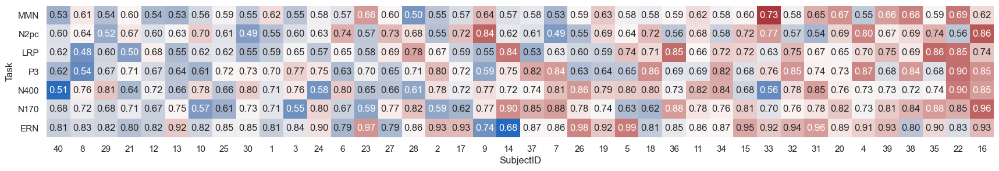

In [7]:
# normalized cmap by task
df_sorted = df.groupby(["Task","SubjectID"]).mean()["valid_balanced_accuracy"].unstack()
df_sorted = df_sorted.reindex(df_sorted.mean(axis=1).sort_values().index, axis=0)
df_old = df_sorted
df_sorted = df_sorted.sub(df_sorted.mean(axis=1), axis=0).div(df_sorted.std(axis=1), axis=0)
df_sorted = df_sorted.reindex(df_sorted.mean().sort_values().index, axis=1)
df_old = df_old.reindex(df_sorted.mean().sort_values().index, axis=1)
sns.set(style="darkgrid")
plt.figure(figsize=(21, 3),dpi=100)
fig = sns.heatmap(cbar=False, annot=df_old, fmt='.2f', cmap="vlag", data=df_sorted)

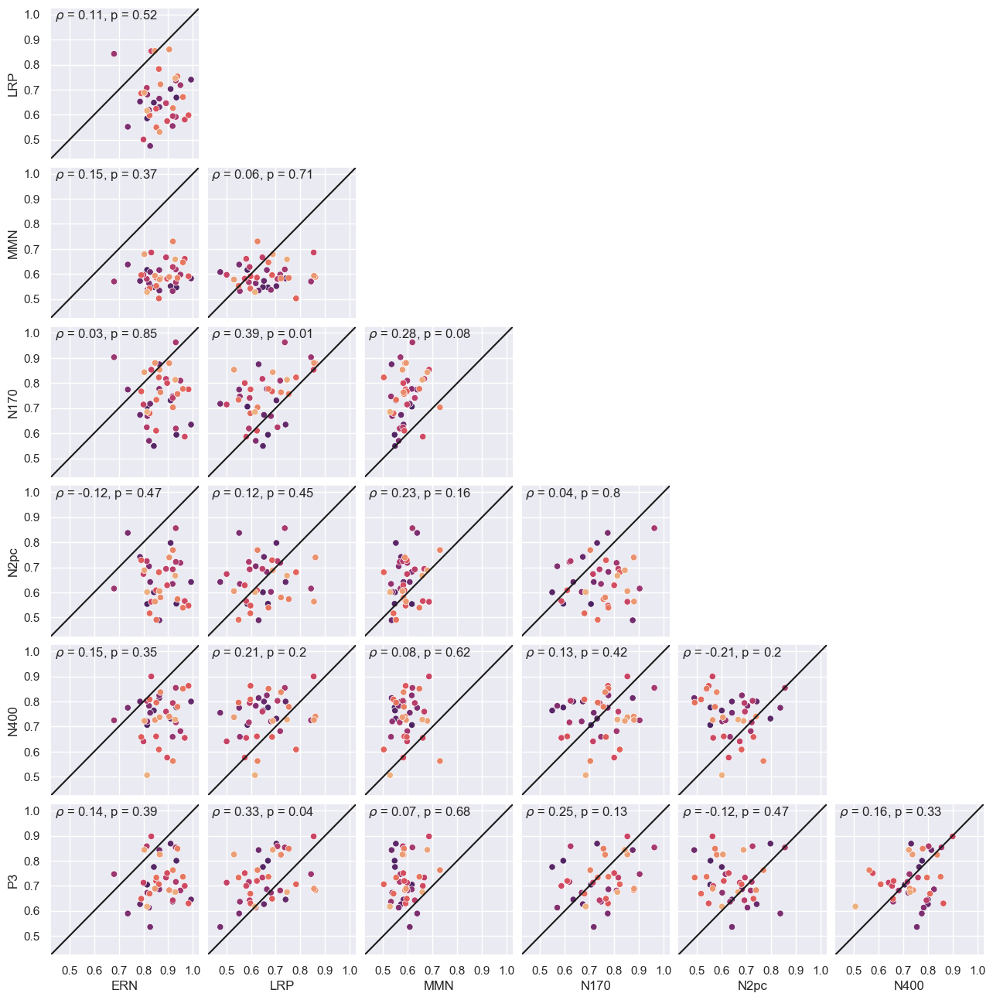

In [6]:
df_list = []
for task in ["N170", "N400", "P3", "N2pc", "MMN", "ERN", "LRP"]:
    model_path = os.getcwd()+"\\"+model_folder+"\\"+model_name+"\\"+task+"\\"+preprocessing+"\\"
    for subjectID in range(40):
        for i in range(1,11):
            df = pd.read_json(model_path+"subject_"+str(subjectID)+"_split_"+str(i)+"_history.json")
            df = df[df["epoch"]==25]
            df["SubjectID"] = subjectID+1
            df["Split"] = i
            df["Task"] = task
            df_list.append(df[["Task", "SubjectID", "Split", "valid_balanced_accuracy"]])
df = pd.concat(df_list,axis=0)
df = df.pivot(index=["SubjectID","Split"], columns='Task', values='valid_balanced_accuracy')
df = df.reset_index()
df = df.groupby("SubjectID").mean().iloc[:,1:].reset_index()
sns.set(style="darkgrid")
fig, axes = plt.subplots(7, 7, figsize=(15, 15), dpi=100)
fig.tight_layout()
task_list = ["ERN", "LRP", "MMN", "N170", "N2pc", "N400", "P3"]
for i in range(0,7):
    for j in range(0,7):
        #if i==j:
        #    sns.histplot(ax=axes[i,j], data=df,x=task_list[i])
        if i>j:
            sns.scatterplot(ax=axes[i,j], data=df,x=task_list[j], y=task_list[i], hue=df.index, palette="flare_r")
            axes[i,j].legend().set_visible(False)
            axes[i,j].axline((0.45,0.45), (1,1), color='k')
            axes[i,j].set_xticks([0.5, 0.6, 0.7, 0.8, 0.9, 1])
            axes[i,j].set_yticks([0.5, 0.6, 0.7, 0.8, 0.9, 1])
            axes[i,j].text(0.44, 0.98, r'$\rho$'+" = "
                           +str(np.round(scipy.stats.spearmanr(df[task_list[j]], df[task_list[i]])[0],2))
                          +", p = "+str(np.round(scipy.stats.spearmanr(df[task_list[j]], df[task_list[i]])[1],2)))
        else:
            fig.delaxes(axes[i,j])
        if j!=0:
            axes[i,j].set(yticklabels=[], ylabel=None)
        if i!=6:
            axes[i,j].set(xticklabels=[], xlabel=None)
fig.subplots_adjust(wspace=0.05, hspace=0.05)

# Cross vs Within

In [7]:
# load cross and within dataframe

data_path = "F:/Masterthesis/Data/"
preprocessing = "medium"
model_name = "deep"
model_folder = "SubjectAnalysis_Cross"
n_epochs = 25
lr = 0.01

# Load Cross-Subject Dataframe
df_list = []
for task in ["N170", "N400", "P3", "N2pc", "MMN", "ERN", "LRP"]:
    model_path = os.getcwd()+"\\"+model_folder+"\\"+model_name+"\\"+task+"\\"+preprocessing+"\\"
    for i in range(40):
        df = pd.read_json(model_path+"split_"+str(i)+"_history.json")
        df = df[df["epoch"]==25]
        df["SubjectID"] = i+1
        df["Task"] = task
        df_list.append(df[["Task", "SubjectID", "valid_balanced_accuracy"]])
df = pd.concat(df_list,axis=0)
df = df.pivot(index='SubjectID', columns='Task', values='valid_balanced_accuracy')
df_cross = df.reset_index().reset_index()


# Load Within-Subject Dataframe
model_folder = "SubjectAnalysis_Within"
df_list = []
for task in ["N170", "N400", "P3", "N2pc", "MMN", "ERN", "LRP"]:
    model_path = os.getcwd()+"\\"+model_folder+"\\"+model_name+"\\"+task+"\\"+preprocessing+"\\"
    for subjectID in range(40):
        for i in range(1,11):
            df = pd.read_json(model_path+"subject_"+str(subjectID)+"_split_"+str(i)+"_history.json")
            df = df[df["epoch"]==25]
            df["SubjectID"] = subjectID+1
            df["Split"] = i
            df["Task"] = task
            df_list.append(df[["Task", "SubjectID", "Split", "valid_balanced_accuracy"]])
df = pd.concat(df_list,axis=0)
df = df.pivot(index=["SubjectID","Split"], columns='Task', values='valid_balanced_accuracy')
df = df.reset_index()
df_within = df.groupby("SubjectID").mean().iloc[:,1:].reset_index()

# combine both dataframes
df = pd.concat([df_cross,df_within.iloc[:,1:]],axis=1)
df.columns = ["Index", "SubjectID"
             ,"ERN Cross-Subject","LRP Cross-Subject","MMN Cross-Subject","N170 Cross-Subject","N2pc Cross-Subject","N400 Cross-Subject","P3 Cross-Subject"
             ,"ERN Within-Subject","LRP Within-Subject","MMN Within-Subject","N170 Within-Subject","N2pc Within-Subject","N400 Within-Subject","P3 Within-Subject"]

df

,Index,SubjectID,ERN Cross-Subject,LRP Cross-Subject,MMN Cross-Subject,N170 Cross-Subject,N2pc Cross-Subject,N400 Cross-Subject,P3 Cross-Subject,ERN Within-Subject,LRP Within-Subject,MMN Within-Subject,N170 Within-Subject,N2pc Within-Subject,N400 Within-Subject,P3 Within-Subject
0,0,1,0.830873,0.840743,0.657675,0.645480,0.596088,0.657858,0.702246,0.814675,0.585549,0.616186,0.706061,0.553692,0.706349,0.704464
1,1,2,0.960503,0.813564,0.576829,0.613924,0.638530,0.802557,0.860910,0.933117,0.668659,0.546206,0.593750,0.554696,0.776190,0.800000
2,2,3,0.931016,0.818955,0.563822,0.679231,0.622591,0.745849,0.802190,0.841941,0.648437,0.547858,0.548958,0.600518,0.764015,0.775000
3,3,4,0.931045,0.902704,0.530223,0.759751,0.683895,0.772262,0.821875,0.909808,0.702744,0.551290,0.730804,0.797407,0.731818,0.868229
4,4,5,0.952261,0.806456,0.608312,0.827303,0.717134,0.673993,0.739751,0.992500,0.740000,0.582261,0.634375,0.641481,0.800000,0.645238
5,5,6,0.771477,0.673918,0.555430,0.823697,0.832594,0.707878,0.729054,0.786000,0.652564,0.572436,0.673077,0.741750,0.800000,0.626667
6,6,7,0.898932,0.838342,0.579379,0.844079,0.549506,0.798778,0.867096,0.864103,0.630823,0.533973,0.875000,0.488889,0.813889,0.842634
7,7,8,0.892806,0.790129,0.626051,0.763496,0.706507,0.900000,0.612554,0.826901,0.475427,0.607683,0.717411,0.641667,0.755000,0.535714
8,8,9,0.777496,0.650522,0.624299,0.793706,0.788824,0.721795,0.666591,0.736392,0.551982,0.637532,0.773958,0.837419,0.775000,0.589368
9,9,10,0.741781,0.679293,0.571879,0.788629,0.705511,0.771800,0.766748,0.822424,0.619299,0.562858,0.569505,0.704348,0.782727,0.612903


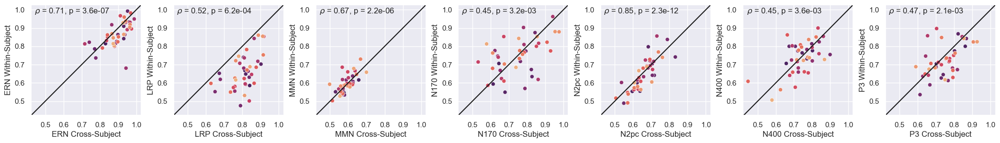

In [8]:
sns.set(style="darkgrid")
fig, axes = plt.subplots(1, 7, figsize=(21, 3), dpi=100)
fig.tight_layout()
task_list = ["ERN", "LRP", "MMN", "N170", "N2pc", "N400", "P3"]
for i in range(0,7):
    sns.scatterplot(ax=axes[i], data=df,x=task_list[i]+" Cross-Subject", y=task_list[i]+" Within-Subject", hue="SubjectID", palette="flare_r")
    axes[i].legend().set_visible(False)
    axes[i].axline((0.45,0.45), (1,1), color='k')
    axes[i].set_xticks([0.5, 0.6, 0.7, 0.8, 0.9, 1])
    axes[i].set_yticks([0.5, 0.6, 0.7, 0.8, 0.9, 1])
    axes[i].text(0.44, 0.98, r'$\rho$'+" = "
                           +str(np.round(scipy.stats.spearmanr(df[task_list[i]+" Cross-Subject"], df[task_list[i]+" Within-Subject"])[0],2))
                          +", p = "+str("%0.1e" % scipy.stats.spearmanr(df[task_list[i]+" Cross-Subject"], df[task_list[i]+" Within-Subject"])[1]))


# SVM

In [ ]:
# cross subject 
from sklearn.pipeline import Pipeline
from sklearn.svm import LinearSVC
from sklearn.model_selection import StratifiedShuffleSplit, cross_val_score
from sklearn.utils import class_weight
from sklearn.preprocessing import StandardScaler

data_path = "F:/Masterthesis/Data/"
preprocessing = "medium"
model_name = "deep"
n_subjects = 40

scores_list = []
for task in ["N170"]:
    print(task)
    df = DataLoader.load_df(data_path, task, preprocessing)
    for subjectID in range(n_subjects):
        list_train = list(range(n_subjects))
        list_train.remove(i)
        data, labels = DataLoader.create_data_labels(df, list_train)
        valid_data, valid_labels = DataLoader.create_data_labels(df, [i])
        svc = LinearSVC(class_weight="balanced")
        clf = Pipeline([('LinearSVC', svc)])
        clf.fit(data.reshape(-1, 30*251), labels)
        scores = clf.score(valid_data.reshape(-1, 30*251), valid_labels)
        print(scores)
        scores_list.append((task, subjectID, scores))
        print(subjectID)
    

N170


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


0.6602564102564102
0


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


0.6282051282051282
1


In [3]:
# single subject 
from sklearn.pipeline import Pipeline
from sklearn.svm import LinearSVC
from sklearn.model_selection import StratifiedShuffleSplit, cross_val_score
from sklearn.utils import class_weight
from sklearn.preprocessing import StandardScaler

data_path = "F:/Masterthesis/Data/"
preprocessing = "medium"
model_name = "deep"
n_subjects = 40

scores_list = []
for task in ["N170", "N400", "P3", "N2pc", "MMN", "ERN", "LRP"]:
    print(task)
    df = DataLoader.load_df(data_path, task, preprocessing)
    for subjectID in range(n_subjects):
        data, labels = DataLoader.create_data_labels(df, [subjectID])
        cv = StratifiedShuffleSplit(10, test_size=0.2, random_state=42)
        cv_split = cv.split(data, labels)
        svc = LinearSVC(class_weight="balanced")
        clf = Pipeline([('LinearSVC', svc)])
        if task == "MMN":
            scores = cross_val_score(clf, data.reshape(-1, 30*251), labels, cv=cv, n_jobs=5, scoring="balanced_accuracy")
        else:
            scores = cross_val_score(clf, data.reshape(-1, 30*251), labels, cv=cv, n_jobs=-1, scoring="balanced_accuracy")
        scores_list.append((task, subjectID, scores[0], scores[1], scores[2], scores[3], scores[4], scores[5], scores[6], scores[7], scores[8], scores[9]))
        print(subjectID)
    

N170
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
N400
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
P3
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
N2pc
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
MMN
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
ERN
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
LRP
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39


In [4]:
df = pd.DataFrame(scores_list)
df = df.rename(columns={0: "Task", 1: "SubjectID"})
df["valid_balanced_accuracy"] = df.iloc[:,2:].mean(axis=1)
df = df.pivot(index=["SubjectID"], columns='Task', values='valid_balanced_accuracy')
df

Task,ERN,LRP,MMN,N170,N2pc,N400,P3
SubjectID,,,,,,,
0,0.800455,0.695030,0.602747,0.595455,0.574615,0.594444,0.591518
1,0.973052,0.749177,0.532420,0.640625,0.597884,0.665476,0.754687
2,0.843427,0.735929,0.517062,0.702708,0.518145,0.696212,0.623333
3,0.886407,0.850488,0.557739,0.770089,0.697963,0.674545,0.896875
4,0.972500,0.695000,0.580263,0.765625,0.637407,0.662500,0.623810
5,0.766214,0.638462,0.545876,0.788462,0.748750,0.727273,0.478333
6,0.748718,0.776707,0.584896,0.862500,0.625185,0.740278,0.818750
7,0.719648,0.709299,0.563065,0.845982,0.619762,0.690000,0.532286
8,0.516772,0.723506,0.560287,0.895833,0.796667,0.766667,0.600575


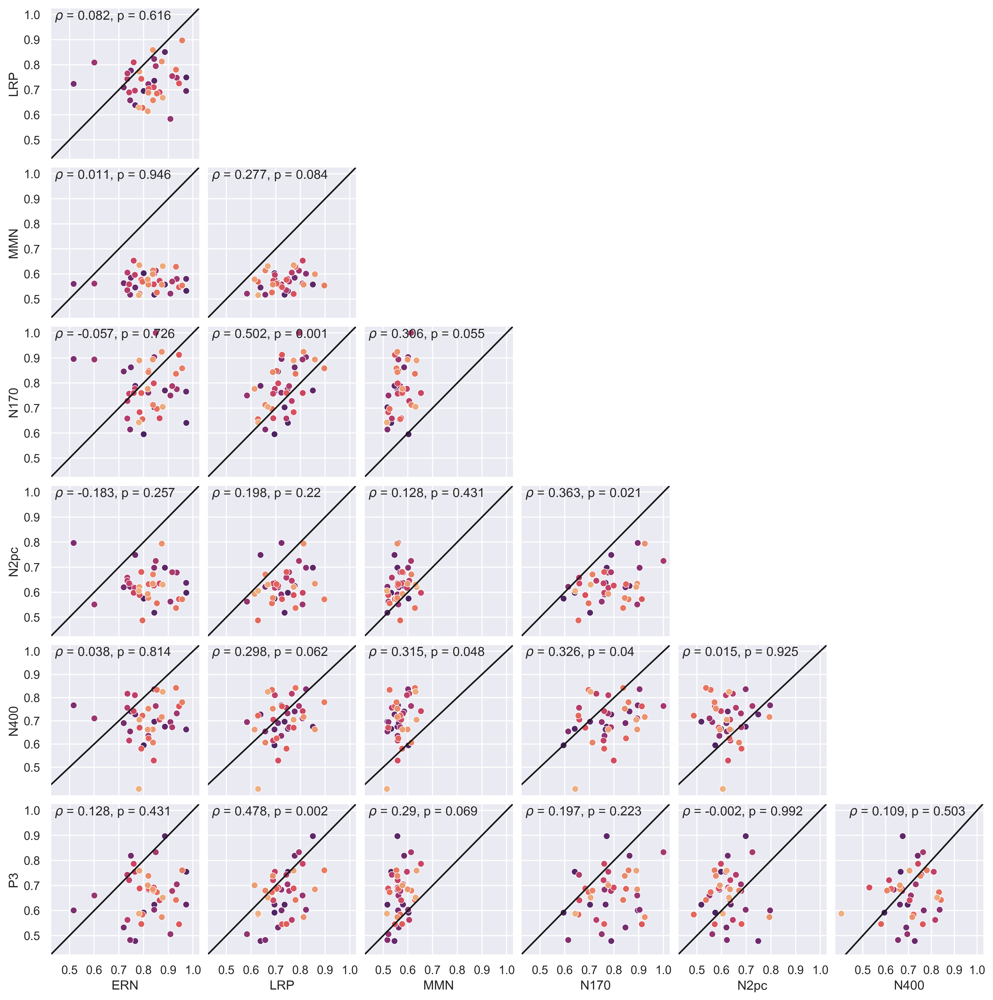

In [6]:
sns.set(style="darkgrid")
fig, axes = plt.subplots(7, 7, figsize=(15, 15), dpi=400)
fig.tight_layout()
task_list = ["ERN", "LRP", "MMN", "N170", "N2pc", "N400", "P3"]
for i in range(0,7):
    for j in range(0,7):
        #if i==j:
        #    sns.histplot(ax=axes[i,j], data=df,x=task_list[i])
        if i>j:
            sns.scatterplot(ax=axes[i,j], data=df,x=task_list[j], y=task_list[i], hue=df.index, palette="flare_r")
            axes[i,j].legend().set_visible(False)
            axes[i,j].axline((0.45,0.45), (1,1), color='k')
            axes[i,j].set_xticks([0.5, 0.6, 0.7, 0.8, 0.9, 1])
            axes[i,j].set_yticks([0.5, 0.6, 0.7, 0.8, 0.9, 1])
            axes[i,j].text(0.44, 0.98, r'$\rho$'+" = "
                           +str(np.round(scipy.stats.pearsonr(df[task_list[j]], df[task_list[i]])[0],3))
                          +", p = "+str(np.round(scipy.stats.pearsonr(df[task_list[j]], df[task_list[i]])[1],3)))
        else:
            fig.delaxes(axes[i,j])
        if j!=0:
            axes[i,j].set(yticklabels=[], ylabel=None)
        if i!=6:
            axes[i,j].set(xticklabels=[], xlabel=None)
fig.subplots_adjust(wspace=0.05, hspace=0.05)